In [12]:
import os
import sys 
import json
import glob
import random
import collections
import time
import re

import numpy as np
import pandas as pd
import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut
#import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import shutil

import torch
from torch import nn
from torch.utils import data as torch_data
from sklearn import model_selection as sk_model_selection
from torch.nn import functional as torch_functional
import torch.nn.functional as F

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

from tqdm import tqdm
import logging
from skimage.io import imread
#from torchviz import make_dot

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

from torch.autograd import Variable
from torch.optim import *
from scipy.io import loadmat, savemat
from torchvision import transforms, utils, datasets
from torch.utils.data import Dataset, ConcatDataset, DataLoader, SubsetRandomSampler
#import torchio as tio
from torch.utils.tensorboard import SummaryWriter

import matplotlib.cm as cm
import matplotlib.animation as animation
#import plotly.graph_objects as go
#import plotly.io as pio
#pio.renderers.default = "notebook"
import math

from utils.dataset_utils import *
from utils.classifier_utils import *
from utils.neural_networks import *

logging.basicConfig(stream=sys.stdout, level=logging.INFO,
                    format='%(asctime)s - %(message)s', datefmt="%Y-%m-%d %H:%M:%S")

In [6]:
info = {}
info["ext"] = "mat"
#info["ext"] = "nii"
dir_path = "../RSNA-BTC-Datasets/train_"+info["ext"]
test_dir_path = "../RSNA-BTC-Datasets/test_"+info["ext"]
tumor_only_dir_path = "../RSNA-BTC-Datasets/ec_train_"+info["ext"]
tumor_only_test_dir_path = "../RSNA-BTC-Datasets/ec_test_"+info["ext"]
no_tumor_dir_path = "../RSNA-BTC-Datasets/no_tumor_train_"+info["ext"]
ext_test_1_dir_path = "../RSNA-BTC-Datasets/brats18_"+info["ext"]
ext_test_0_dir_path = "../RSNA-BTC-Datasets/OpenNeuroDS000221_ss_"+info["ext"]
new_dir_path = "../RSNA-BTC-Datasets/UPENN-GBM_"+info["ext"]

In [10]:
chosen_net  = "alt" #3du, sim, alt, tun
if chosen_net == "alt":
    info["dims"] = 2 #3,2
    info["batch_size"] = 1#8,4,1
    sel_slices = 1 #None,1
elif chosen_net == "tun":
    info["dims"] = 3 #3,2
    info["batch_size"] = 1#8,4,1
    sel_slices = None #None,1
else:
    info["dims"] = 3 #3,2
    info["batch_size"] = 4#8,4,1
    sel_slices = None #None,1
info["mri_types"] = ["KLF"] #["KLF"] ["FLAIR"] ["T1w"] ["FLAIR", "T2w"]
info["is_depth_wise"] = True
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0001
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.2
info["is_internal_dataset"] = True
# Train and Val Origin:
# - m: Competition training or validation set
# - M: Competition training and validation set
# - f: Competition (tumor only) training or validation set
# - F: Competition (tumor only) training and validation set
# - t: External training or validation set
# - n: UPENN (tumor only) training or validation set
# - N: UPENN (tumor only) training and validation set
# - fn: Competition (tumor only) + UPENN (tumor only) training or validation
# - FN: Competition (tumor only) + UPENN (tumor only) training and validation
info["train_origin"] = "mn"
info["val_origin"] = "mn"
size = len(info["mri_types"])

"""
chosen_net  = "alt" #3du
info["dims"] = 2
info["mri_types"] = ["KLF"]
info["batch_size"] = 1#8
info["is_depth_wise"] = True
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0005
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.2
info["is_internal_dataset"] = True
size = len(info["mri_types"])
sel_slices = 1
"""

"""
chosen_net  = "eff" #3du
info["dims"] = 3
info["mri_types"] = ["FLAIR"]
info["batch_size"] = 4#8
info["is_depth_wise"] = False
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0005
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.1
info["is_internal_dataset"] = True
size = len(info["mri_types"])
sel_slices = None
"""
print(info)

{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin': 'mn', 'val_origin': 'mn'}


-- FOLD N:0
Train origin: m
Type: KLF
2022-08-22 14:03:53 - (M0) Train/Val datasets size: 270
2022-08-22 14:03:53 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb09f10a0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd465e4f0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([0, 1, 2, 3, 6, 7, 9, 10, 11, 13, 14, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 117, 118, 120, 121, 122, 123, 125, 127

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-22 14:05:43 - EPOCH: 1
2022-08-22 14:05:44 - Train Step 10/485, train_loss: 0.7273
2022-08-22 14:05:44 - Train Step 20/485, train_loss: 0.7059
2022-08-22 14:05:45 - Train Step 30/485, train_loss: 0.7059
2022-08-22 14:05:45 - Train Step 40/485, train_loss: 0.7085
2022-08-22 14:05:46 - Train Step 50/485, train_loss: 0.7057
2022-08-22 14:05:46 - Train Step 60/485, train_loss: 0.7036
2022-08-22 14:05:47 - Train Step 70/485, train_loss: 0.7024
2022-08-22 14:05:47 - Train Step 80/485, train_loss: 0.6994
2022-08-22 14:05:48 - Train Step 90/485, train_loss: 0.6988
2022-08-22 14:05:48 - Train Step 100/485, train_loss: 0.6975
2022-08-22 14:05:49 - Train Step 110/485, train_loss: 0.6955
2022-08-22 14:05:49 - Train Step 120/485, train_loss: 0.6961
2022-08-22 14:05:50 - Train Step 130/485, train_loss: 0.6981
2022-08-22 14:05:50 - Train Step 140/485, train_loss: 0.6979
2022-08-22 14:05:51 - Train Step 150/485, train_loss: 0.6983
2022-08-22 14:05:51 - Train Step 160/485, train_loss: 0.6973
20

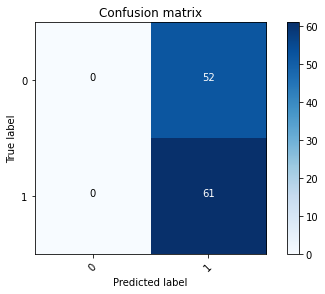

2022-08-22 14:06:13 - [Epoch Train: 1] loss: 0.6949, auc: 0.4638, acc: 0.4990, time: 24.00 s            
2022-08-22 14:06:13 - [Epoch Valid: 1] loss: 0.6938, auc: 0.4823, acc: 0.5041, time: 6.00 s
2022-08-22 14:06:13 - acc improved from 0.0000 to 0.5041. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-05-43/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.694-acc0.504-auc0.482.pth'


  1%|▍                                          | 1/100 [00:30<50:25, 30.56s/it]

2022-08-22 14:06:13 - EPOCH: 2
2022-08-22 14:06:14 - Train Step 10/485, train_loss: 0.6942
2022-08-22 14:06:15 - Train Step 20/485, train_loss: 0.6939
2022-08-22 14:06:15 - Train Step 30/485, train_loss: 0.6916
2022-08-22 14:06:16 - Train Step 40/485, train_loss: 0.6935
2022-08-22 14:06:16 - Train Step 50/485, train_loss: 0.6970
2022-08-22 14:06:17 - Train Step 60/485, train_loss: 0.6952
2022-08-22 14:06:17 - Train Step 70/485, train_loss: 0.6978
2022-08-22 14:06:18 - Train Step 80/485, train_loss: 0.6943
2022-08-22 14:06:18 - Train Step 90/485, train_loss: 0.6941
2022-08-22 14:06:19 - Train Step 100/485, train_loss: 0.6958
2022-08-22 14:06:19 - Train Step 110/485, train_loss: 0.6955
2022-08-22 14:06:20 - Train Step 120/485, train_loss: 0.6949
2022-08-22 14:06:20 - Train Step 130/485, train_loss: 0.6941
2022-08-22 14:06:21 - Train Step 140/485, train_loss: 0.6932
2022-08-22 14:06:21 - Train Step 150/485, train_loss: 0.6941
2022-08-22 14:06:22 - Train Step 160/485, train_loss: 0.6935
20

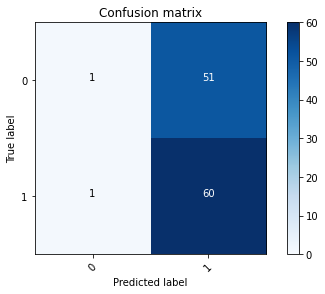

2022-08-22 14:06:44 - [Epoch Train: 2] loss: 0.6929, auc: 0.5284, acc: 0.4969, time: 24.00 s            
2022-08-22 14:06:44 - [Epoch Valid: 2] loss: 0.6936, auc: 0.4789, acc: 0.5124, time: 6.00 s
2022-08-22 14:06:44 - acc improved from 0.5041 to 0.5124. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-05-43/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.694-acc0.512-auc0.479.pth'


  2%|▊                                          | 2/100 [01:00<49:47, 30.48s/it]

2022-08-22 14:06:44 - EPOCH: 3
2022-08-22 14:06:45 - Train Step 10/485, train_loss: 0.6924
2022-08-22 14:06:45 - Train Step 20/485, train_loss: 0.6929
2022-08-22 14:06:45 - Train Step 30/485, train_loss: 0.6915
2022-08-22 14:06:46 - Train Step 40/485, train_loss: 0.6907
2022-08-22 14:06:46 - Train Step 50/485, train_loss: 0.6933
2022-08-22 14:06:47 - Train Step 60/485, train_loss: 0.6936
2022-08-22 14:06:47 - Train Step 70/485, train_loss: 0.6922
2022-08-22 14:06:48 - Train Step 80/485, train_loss: 0.6903
2022-08-22 14:06:48 - Train Step 90/485, train_loss: 0.6891
2022-08-22 14:06:49 - Train Step 100/485, train_loss: 0.6882
2022-08-22 14:06:50 - Train Step 110/485, train_loss: 0.6872
2022-08-22 14:06:50 - Train Step 120/485, train_loss: 0.6890
2022-08-22 14:06:51 - Train Step 130/485, train_loss: 0.6896
2022-08-22 14:06:51 - Train Step 140/485, train_loss: 0.6896
2022-08-22 14:06:51 - Train Step 150/485, train_loss: 0.6907
2022-08-22 14:06:52 - Train Step 160/485, train_loss: 0.6913
20

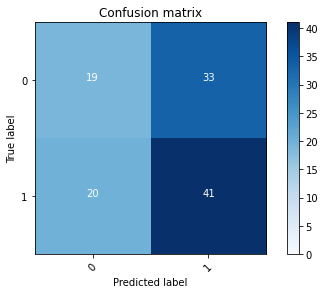

2022-08-22 14:07:14 - [Epoch Train: 3] loss: 0.6901, auc: 0.5702, acc: 0.5196, time: 24.00 s            
2022-08-22 14:07:14 - [Epoch Valid: 3] loss: 0.6943, auc: 0.4893, acc: 0.5124, time: 6.00 s
2022-08-22 14:07:14 - acc improved from 0.5124 to 0.5124. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-05-43/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.694-acc0.512-auc0.489.pth'


  3%|█▎                                         | 3/100 [01:31<49:19, 30.51s/it]

2022-08-22 14:07:14 - EPOCH: 4
2022-08-22 14:07:15 - Train Step 10/485, train_loss: 0.6939
2022-08-22 14:07:16 - Train Step 20/485, train_loss: 0.7002
2022-08-22 14:07:16 - Train Step 30/485, train_loss: 0.6923
2022-08-22 14:07:17 - Train Step 40/485, train_loss: 0.6900
2022-08-22 14:07:17 - Train Step 50/485, train_loss: 0.6874
2022-08-22 14:07:18 - Train Step 60/485, train_loss: 0.6848
2022-08-22 14:07:18 - Train Step 70/485, train_loss: 0.6839
2022-08-22 14:07:19 - Train Step 80/485, train_loss: 0.6819
2022-08-22 14:07:19 - Train Step 90/485, train_loss: 0.6800
2022-08-22 14:07:20 - Train Step 100/485, train_loss: 0.6822
2022-08-22 14:07:20 - Train Step 110/485, train_loss: 0.6821
2022-08-22 14:07:21 - Train Step 120/485, train_loss: 0.6844
2022-08-22 14:07:21 - Train Step 130/485, train_loss: 0.6849
2022-08-22 14:07:22 - Train Step 140/485, train_loss: 0.6856
2022-08-22 14:07:22 - Train Step 150/485, train_loss: 0.6886
2022-08-22 14:07:22 - Train Step 160/485, train_loss: 0.6854
20

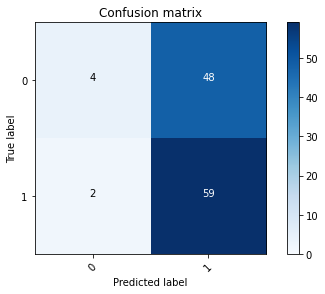

2022-08-22 14:07:45 - [Epoch Train: 4] loss: 0.6857, auc: 0.5709, acc: 0.5505, time: 24.00 s            
2022-08-22 14:07:45 - [Epoch Valid: 4] loss: 0.6953, auc: 0.5095, acc: 0.5289, time: 6.00 s
2022-08-22 14:07:45 - acc improved from 0.5124 to 0.5289. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-05-43/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e4-loss0.695-acc0.529-auc0.509.pth'


  4%|█▋                                         | 4/100 [02:02<48:56, 30.59s/it]

2022-08-22 14:07:45 - EPOCH: 5
2022-08-22 14:07:46 - Train Step 10/485, train_loss: 0.6602
2022-08-22 14:07:46 - Train Step 20/485, train_loss: 0.6788
2022-08-22 14:07:47 - Train Step 30/485, train_loss: 0.6757
2022-08-22 14:07:47 - Train Step 40/485, train_loss: 0.6739
2022-08-22 14:07:48 - Train Step 50/485, train_loss: 0.6746
2022-08-22 14:07:48 - Train Step 60/485, train_loss: 0.6784
2022-08-22 14:07:49 - Train Step 70/485, train_loss: 0.6793
2022-08-22 14:07:49 - Train Step 80/485, train_loss: 0.6792
2022-08-22 14:07:50 - Train Step 90/485, train_loss: 0.6824
2022-08-22 14:07:50 - Train Step 100/485, train_loss: 0.6827
2022-08-22 14:07:51 - Train Step 110/485, train_loss: 0.6829
2022-08-22 14:07:51 - Train Step 120/485, train_loss: 0.6791
2022-08-22 14:07:52 - Train Step 130/485, train_loss: 0.6787
2022-08-22 14:07:52 - Train Step 140/485, train_loss: 0.6836
2022-08-22 14:07:53 - Train Step 150/485, train_loss: 0.6857
2022-08-22 14:07:53 - Train Step 160/485, train_loss: 0.6847
20

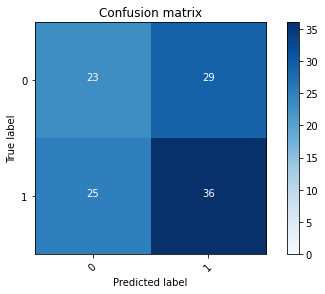

2022-08-22 14:08:16 - [Epoch Train: 5] loss: 0.6818, auc: 0.5984, acc: 0.5794, time: 24.00 s            
2022-08-22 14:08:16 - [Epoch Valid: 5] loss: 0.6950, auc: 0.5110, acc: 0.5124, time: 6.00 s


  5%|██▏                                        | 5/100 [02:32<48:19, 30.52s/it]

2022-08-22 14:08:16 - EPOCH: 6
2022-08-22 14:08:16 - Train Step 10/485, train_loss: 0.7057
2022-08-22 14:08:17 - Train Step 20/485, train_loss: 0.6705
2022-08-22 14:08:17 - Train Step 30/485, train_loss: 0.6797
2022-08-22 14:08:18 - Train Step 40/485, train_loss: 0.6741
2022-08-22 14:08:18 - Train Step 50/485, train_loss: 0.6680
2022-08-22 14:08:19 - Train Step 60/485, train_loss: 0.6661
2022-08-22 14:08:19 - Train Step 70/485, train_loss: 0.6670
2022-08-22 14:08:20 - Train Step 80/485, train_loss: 0.6597
2022-08-22 14:08:20 - Train Step 90/485, train_loss: 0.6622
2022-08-22 14:08:21 - Train Step 100/485, train_loss: 0.6638
2022-08-22 14:08:21 - Train Step 110/485, train_loss: 0.6622
2022-08-22 14:08:22 - Train Step 120/485, train_loss: 0.6641
2022-08-22 14:08:22 - Train Step 130/485, train_loss: 0.6660
2022-08-22 14:08:22 - Train Step 140/485, train_loss: 0.6673
2022-08-22 14:08:23 - Train Step 150/485, train_loss: 0.6691
2022-08-22 14:08:23 - Train Step 160/485, train_loss: 0.6682
20

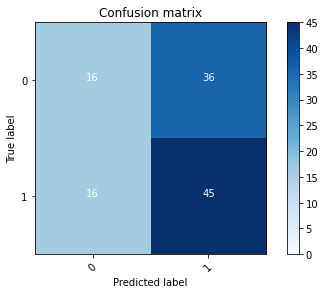

2022-08-22 14:08:45 - [Epoch Train: 6] loss: 0.6703, auc: 0.6329, acc: 0.6062, time: 23.00 s            
2022-08-22 14:08:45 - [Epoch Valid: 6] loss: 0.6997, auc: 0.5076, acc: 0.5207, time: 6.00 s


  6%|██▌                                        | 6/100 [03:02<47:31, 30.34s/it]

2022-08-22 14:08:45 - EPOCH: 7
2022-08-22 14:08:46 - Train Step 10/485, train_loss: 0.7486
2022-08-22 14:08:47 - Train Step 20/485, train_loss: 0.6673
2022-08-22 14:08:47 - Train Step 30/485, train_loss: 0.6650
2022-08-22 14:08:48 - Train Step 40/485, train_loss: 0.6456
2022-08-22 14:08:48 - Train Step 50/485, train_loss: 0.6376
2022-08-22 14:08:49 - Train Step 60/485, train_loss: 0.6440
2022-08-22 14:08:49 - Train Step 70/485, train_loss: 0.6534
2022-08-22 14:08:50 - Train Step 80/485, train_loss: 0.6440
2022-08-22 14:08:50 - Train Step 90/485, train_loss: 0.6528
2022-08-22 14:08:51 - Train Step 100/485, train_loss: 0.6495
2022-08-22 14:08:51 - Train Step 110/485, train_loss: 0.6529
2022-08-22 14:08:52 - Train Step 120/485, train_loss: 0.6621
2022-08-22 14:08:52 - Train Step 130/485, train_loss: 0.6626
2022-08-22 14:08:53 - Train Step 140/485, train_loss: 0.6647
2022-08-22 14:08:53 - Train Step 150/485, train_loss: 0.6683
2022-08-22 14:08:54 - Train Step 160/485, train_loss: 0.6683
20

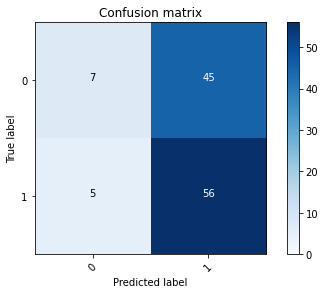

2022-08-22 14:09:16 - [Epoch Train: 7] loss: 0.6549, auc: 0.6741, acc: 0.6186, time: 24.00 s            
2022-08-22 14:09:16 - [Epoch Valid: 7] loss: 0.7085, auc: 0.5177, acc: 0.5289, time: 6.00 s
2022-08-22 14:09:16 - acc improved from 0.5289 to 0.5289. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-05-43/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e7-loss0.708-acc0.529-auc0.518.pth'


  7%|███                                        | 7/100 [03:33<47:08, 30.41s/it]

2022-08-22 14:09:16 - EPOCH: 8
2022-08-22 14:09:17 - Train Step 10/485, train_loss: 0.7903
2022-08-22 14:09:17 - Train Step 20/485, train_loss: 0.7214
2022-08-22 14:09:18 - Train Step 30/485, train_loss: 0.6887
2022-08-22 14:09:18 - Train Step 40/485, train_loss: 0.6716
2022-08-22 14:09:19 - Train Step 50/485, train_loss: 0.6669
2022-08-22 14:09:19 - Train Step 60/485, train_loss: 0.6669
2022-08-22 14:09:20 - Train Step 70/485, train_loss: 0.6611
2022-08-22 14:09:20 - Train Step 80/485, train_loss: 0.6741
2022-08-22 14:09:21 - Train Step 90/485, train_loss: 0.6733
2022-08-22 14:09:21 - Train Step 100/485, train_loss: 0.6734
2022-08-22 14:09:22 - Train Step 110/485, train_loss: 0.6630
2022-08-22 14:09:22 - Train Step 120/485, train_loss: 0.6630
2022-08-22 14:09:23 - Train Step 130/485, train_loss: 0.6659
2022-08-22 14:09:23 - Train Step 140/485, train_loss: 0.6693
2022-08-22 14:09:24 - Train Step 150/485, train_loss: 0.6673
2022-08-22 14:09:24 - Train Step 160/485, train_loss: 0.6621
20

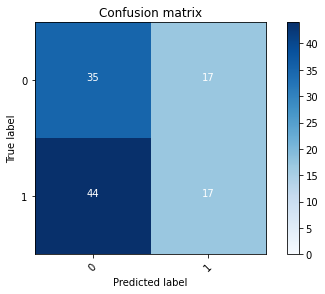

2022-08-22 14:09:46 - [Epoch Train: 8] loss: 0.6415, auc: 0.7018, acc: 0.6577, time: 24.00 s            
2022-08-22 14:09:46 - [Epoch Valid: 8] loss: 0.7206, auc: 0.5126, acc: 0.4711, time: 6.00 s


  8%|███▍                                       | 8/100 [04:03<46:38, 30.42s/it]

2022-08-22 14:09:46 - EPOCH: 9
2022-08-22 14:09:47 - Train Step 10/485, train_loss: 0.6422
2022-08-22 14:09:48 - Train Step 20/485, train_loss: 0.6317
2022-08-22 14:09:48 - Train Step 30/485, train_loss: 0.6146
2022-08-22 14:09:49 - Train Step 40/485, train_loss: 0.6427
2022-08-22 14:09:49 - Train Step 50/485, train_loss: 0.6389
2022-08-22 14:09:50 - Train Step 60/485, train_loss: 0.6299
2022-08-22 14:09:50 - Train Step 70/485, train_loss: 0.6418
2022-08-22 14:09:51 - Train Step 80/485, train_loss: 0.6257
2022-08-22 14:09:51 - Train Step 90/485, train_loss: 0.6315
2022-08-22 14:09:52 - Train Step 100/485, train_loss: 0.6341
2022-08-22 14:09:52 - Train Step 110/485, train_loss: 0.6186
2022-08-22 14:09:53 - Train Step 120/485, train_loss: 0.6137
2022-08-22 14:09:53 - Train Step 130/485, train_loss: 0.6126
2022-08-22 14:09:54 - Train Step 140/485, train_loss: 0.6143
2022-08-22 14:09:54 - Train Step 150/485, train_loss: 0.6109
2022-08-22 14:09:55 - Train Step 160/485, train_loss: 0.6194
20

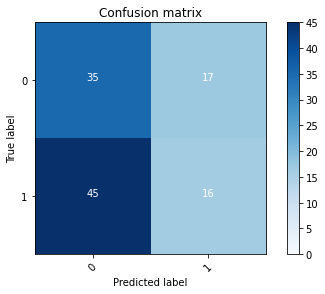

2022-08-22 14:10:17 - [Epoch Train: 9] loss: 0.6201, auc: 0.7308, acc: 0.6598, time: 24.00 s            
2022-08-22 14:10:17 - [Epoch Valid: 9] loss: 0.7341, auc: 0.5066, acc: 0.4628, time: 6.00 s


  9%|███▊                                       | 9/100 [04:34<46:13, 30.47s/it]

2022-08-22 14:10:17 - EPOCH: 10
2022-08-22 14:10:18 - Train Step 10/485, train_loss: 0.5144
2022-08-22 14:10:18 - Train Step 20/485, train_loss: 0.5089
2022-08-22 14:10:19 - Train Step 30/485, train_loss: 0.5492
2022-08-22 14:10:19 - Train Step 40/485, train_loss: 0.5824
2022-08-22 14:10:20 - Train Step 50/485, train_loss: 0.6116
2022-08-22 14:10:20 - Train Step 60/485, train_loss: 0.6204
2022-08-22 14:10:21 - Train Step 70/485, train_loss: 0.6473
2022-08-22 14:10:21 - Train Step 80/485, train_loss: 0.6304
2022-08-22 14:10:22 - Train Step 90/485, train_loss: 0.6184
2022-08-22 14:10:22 - Train Step 100/485, train_loss: 0.6107
2022-08-22 14:10:23 - Train Step 110/485, train_loss: 0.6105
2022-08-22 14:10:23 - Train Step 120/485, train_loss: 0.6224
2022-08-22 14:10:24 - Train Step 130/485, train_loss: 0.6295
2022-08-22 14:10:24 - Train Step 140/485, train_loss: 0.6367
2022-08-22 14:10:25 - Train Step 150/485, train_loss: 0.6360
2022-08-22 14:10:25 - Train Step 160/485, train_loss: 0.6444
2

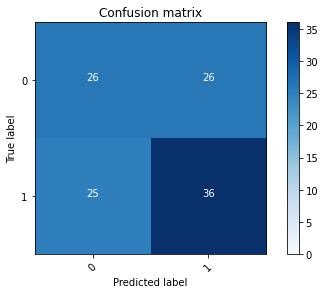

2022-08-22 14:10:48 - [Epoch Train: 10] loss: 0.6055, auc: 0.7518, acc: 0.6784, time: 24.00 s            
2022-08-22 14:10:48 - [Epoch Valid: 10] loss: 0.7329, auc: 0.5063, acc: 0.5455, time: 6.00 s
2022-08-22 14:10:48 - acc improved from 0.5289 to 0.5455. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-05-43/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e10-loss0.733-acc0.545-auc0.506.pth'


 10%|████▏                                     | 10/100 [05:04<45:42, 30.47s/it]

2022-08-22 14:10:48 - EPOCH: 11
2022-08-22 14:10:48 - Train Step 10/485, train_loss: 0.4384
2022-08-22 14:10:49 - Train Step 20/485, train_loss: 0.4597
2022-08-22 14:10:49 - Train Step 30/485, train_loss: 0.4718
2022-08-22 14:10:50 - Train Step 40/485, train_loss: 0.4831
2022-08-22 14:10:50 - Train Step 50/485, train_loss: 0.4873
2022-08-22 14:10:51 - Train Step 60/485, train_loss: 0.5024
2022-08-22 14:10:51 - Train Step 70/485, train_loss: 0.5391
2022-08-22 14:10:52 - Train Step 80/485, train_loss: 0.5321
2022-08-22 14:10:52 - Train Step 90/485, train_loss: 0.5418
2022-08-22 14:10:53 - Train Step 100/485, train_loss: 0.5353
2022-08-22 14:10:53 - Train Step 110/485, train_loss: 0.5352
2022-08-22 14:10:54 - Train Step 120/485, train_loss: 0.5348
2022-08-22 14:10:54 - Train Step 130/485, train_loss: 0.5462
2022-08-22 14:10:55 - Train Step 140/485, train_loss: 0.5545
2022-08-22 14:10:55 - Train Step 150/485, train_loss: 0.5493
2022-08-22 14:10:56 - Train Step 160/485, train_loss: 0.5510
2

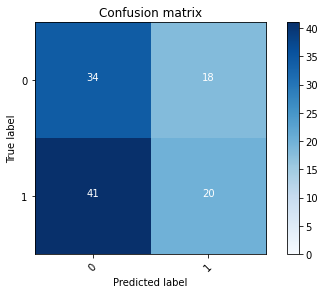

2022-08-22 14:11:18 - [Epoch Train: 11] loss: 0.5738, auc: 0.7878, acc: 0.7175, time: 24.00 s            
2022-08-22 14:11:18 - [Epoch Valid: 11] loss: 0.7493, auc: 0.5032, acc: 0.4876, time: 6.00 s


 11%|████▌                                     | 11/100 [05:34<45:07, 30.42s/it]

2022-08-22 14:11:18 - EPOCH: 12
2022-08-22 14:11:19 - Train Step 10/485, train_loss: 0.5218
2022-08-22 14:11:19 - Train Step 20/485, train_loss: 0.5596
2022-08-22 14:11:20 - Train Step 30/485, train_loss: 0.5848
2022-08-22 14:11:20 - Train Step 40/485, train_loss: 0.5714
2022-08-22 14:11:21 - Train Step 50/485, train_loss: 0.5930
2022-08-22 14:11:21 - Train Step 60/485, train_loss: 0.6030
2022-08-22 14:11:21 - Train Step 70/485, train_loss: 0.5927
2022-08-22 14:11:22 - Train Step 80/485, train_loss: 0.6012
2022-08-22 14:11:22 - Train Step 90/485, train_loss: 0.6119
2022-08-22 14:11:23 - Train Step 100/485, train_loss: 0.6074
2022-08-22 14:11:23 - Train Step 110/485, train_loss: 0.6075
2022-08-22 14:11:24 - Train Step 120/485, train_loss: 0.6084
2022-08-22 14:11:24 - Train Step 130/485, train_loss: 0.5975
2022-08-22 14:11:25 - Train Step 140/485, train_loss: 0.5950
2022-08-22 14:11:25 - Train Step 150/485, train_loss: 0.5921
2022-08-22 14:11:26 - Train Step 160/485, train_loss: 0.5927
2

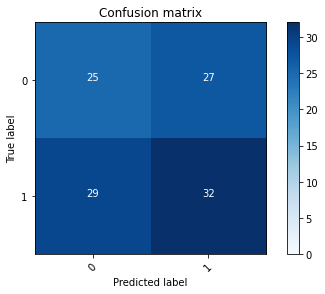

2022-08-22 14:11:48 - [Epoch Train: 12] loss: 0.5664, auc: 0.7990, acc: 0.7340, time: 24.00 s            
2022-08-22 14:11:48 - [Epoch Valid: 12] loss: 0.7569, auc: 0.5054, acc: 0.4959, time: 6.00 s


 12%|█████                                     | 12/100 [06:05<44:32, 30.37s/it]

2022-08-22 14:11:48 - EPOCH: 13
2022-08-22 14:11:49 - Train Step 10/485, train_loss: 0.5013
2022-08-22 14:11:49 - Train Step 20/485, train_loss: 0.5875
2022-08-22 14:11:50 - Train Step 30/485, train_loss: 0.6048
2022-08-22 14:11:50 - Train Step 40/485, train_loss: 0.5790
2022-08-22 14:11:51 - Train Step 50/485, train_loss: 0.5543
2022-08-22 14:11:51 - Train Step 60/485, train_loss: 0.5733
2022-08-22 14:11:52 - Train Step 70/485, train_loss: 0.5710
2022-08-22 14:11:52 - Train Step 80/485, train_loss: 0.5804
2022-08-22 14:11:53 - Train Step 90/485, train_loss: 0.5713
2022-08-22 14:11:53 - Train Step 100/485, train_loss: 0.5746
2022-08-22 14:11:54 - Train Step 110/485, train_loss: 0.5983
2022-08-22 14:11:54 - Train Step 120/485, train_loss: 0.5893
2022-08-22 14:11:55 - Train Step 130/485, train_loss: 0.5862
2022-08-22 14:11:55 - Train Step 140/485, train_loss: 0.5825
2022-08-22 14:11:56 - Train Step 150/485, train_loss: 0.5827
2022-08-22 14:11:56 - Train Step 160/485, train_loss: 0.5760
2

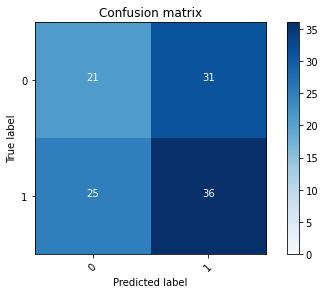

2022-08-22 14:12:19 - [Epoch Train: 13] loss: 0.5586, auc: 0.8042, acc: 0.7526, time: 24.00 s            
2022-08-22 14:12:19 - [Epoch Valid: 13] loss: 0.7556, auc: 0.4934, acc: 0.4959, time: 6.00 s


 13%|█████▍                                    | 13/100 [06:35<44:08, 30.45s/it]

2022-08-22 14:12:19 - EPOCH: 14
2022-08-22 14:12:19 - Train Step 10/485, train_loss: 0.5728
2022-08-22 14:12:20 - Train Step 20/485, train_loss: 0.5337
2022-08-22 14:12:20 - Train Step 30/485, train_loss: 0.5173
2022-08-22 14:12:21 - Train Step 40/485, train_loss: 0.5320
2022-08-22 14:12:21 - Train Step 50/485, train_loss: 0.5254
2022-08-22 14:12:22 - Train Step 60/485, train_loss: 0.5299
2022-08-22 14:12:22 - Train Step 70/485, train_loss: 0.5326
2022-08-22 14:12:23 - Train Step 80/485, train_loss: 0.5344
2022-08-22 14:12:23 - Train Step 90/485, train_loss: 0.5223
2022-08-22 14:12:24 - Train Step 100/485, train_loss: 0.5065
2022-08-22 14:12:24 - Train Step 110/485, train_loss: 0.4997
2022-08-22 14:12:25 - Train Step 120/485, train_loss: 0.5011
2022-08-22 14:12:25 - Train Step 130/485, train_loss: 0.5056
2022-08-22 14:12:26 - Train Step 140/485, train_loss: 0.5142
2022-08-22 14:12:27 - Train Step 150/485, train_loss: 0.5228
2022-08-22 14:12:27 - Train Step 160/485, train_loss: 0.5354
2

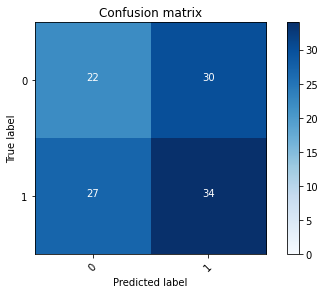

2022-08-22 14:12:49 - [Epoch Train: 14] loss: 0.5453, auc: 0.8115, acc: 0.7299, time: 24.00 s            
2022-08-22 14:12:49 - [Epoch Valid: 14] loss: 0.7665, auc: 0.5032, acc: 0.4876, time: 6.00 s


 14%|█████▉                                    | 14/100 [07:06<43:43, 30.50s/it]

2022-08-22 14:12:49 - EPOCH: 15
2022-08-22 14:12:50 - Train Step 10/485, train_loss: 0.4294
2022-08-22 14:12:51 - Train Step 20/485, train_loss: 0.4227
2022-08-22 14:12:51 - Train Step 30/485, train_loss: 0.5003
2022-08-22 14:12:52 - Train Step 40/485, train_loss: 0.4958
2022-08-22 14:12:52 - Train Step 50/485, train_loss: 0.5052
2022-08-22 14:12:53 - Train Step 60/485, train_loss: 0.5016
2022-08-22 14:12:53 - Train Step 70/485, train_loss: 0.5220
2022-08-22 14:12:53 - Train Step 80/485, train_loss: 0.5147
2022-08-22 14:12:54 - Train Step 90/485, train_loss: 0.5293
2022-08-22 14:12:55 - Train Step 100/485, train_loss: 0.5351
2022-08-22 14:12:55 - Train Step 110/485, train_loss: 0.5407
2022-08-22 14:12:56 - Train Step 120/485, train_loss: 0.5331
2022-08-22 14:12:56 - Train Step 130/485, train_loss: 0.5338
2022-08-22 14:12:57 - Train Step 140/485, train_loss: 0.5519
2022-08-22 14:12:57 - Train Step 150/485, train_loss: 0.5436
2022-08-22 14:12:58 - Train Step 160/485, train_loss: 0.5466
2

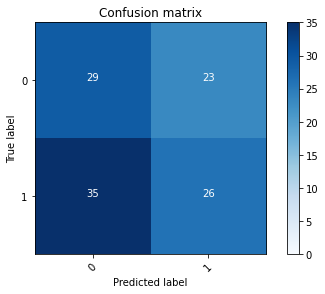

2022-08-22 14:13:20 - [Epoch Train: 15] loss: 0.5396, auc: 0.8222, acc: 0.7361, time: 24.00 s            
2022-08-22 14:13:20 - [Epoch Valid: 15] loss: 0.7700, auc: 0.4905, acc: 0.4793, time: 6.00 s


 15%|██████▎                                   | 15/100 [07:37<43:13, 30.51s/it]

2022-08-22 14:13:20 - EPOCH: 16
2022-08-22 14:13:21 - Train Step 10/485, train_loss: 0.3894
2022-08-22 14:13:21 - Train Step 20/485, train_loss: 0.3815
2022-08-22 14:13:22 - Train Step 30/485, train_loss: 0.4388
2022-08-22 14:13:22 - Train Step 40/485, train_loss: 0.4668
2022-08-22 14:13:23 - Train Step 50/485, train_loss: 0.4973
2022-08-22 14:13:23 - Train Step 60/485, train_loss: 0.5068
2022-08-22 14:13:24 - Train Step 70/485, train_loss: 0.5115
2022-08-22 14:13:24 - Train Step 80/485, train_loss: 0.5124
2022-08-22 14:13:25 - Train Step 90/485, train_loss: 0.5044
2022-08-22 14:13:25 - Train Step 100/485, train_loss: 0.5121
2022-08-22 14:13:25 - Train Step 110/485, train_loss: 0.5114
2022-08-22 14:13:26 - Train Step 120/485, train_loss: 0.5082
2022-08-22 14:13:26 - Train Step 130/485, train_loss: 0.5068
2022-08-22 14:13:27 - Train Step 140/485, train_loss: 0.5030
2022-08-22 14:13:27 - Train Step 150/485, train_loss: 0.4998
2022-08-22 14:13:28 - Train Step 160/485, train_loss: 0.4997
2

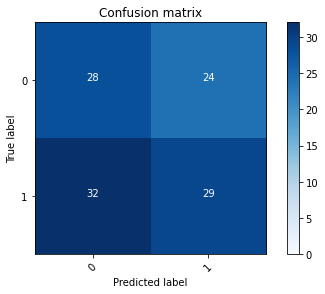

2022-08-22 14:13:50 - [Epoch Train: 16] loss: 0.5280, auc: 0.8291, acc: 0.7670, time: 24.00 s            
2022-08-22 14:13:50 - [Epoch Valid: 16] loss: 0.7969, auc: 0.4946, acc: 0.4959, time: 6.00 s


 16%|██████▋                                   | 16/100 [08:07<42:41, 30.49s/it]

2022-08-22 14:13:50 - EPOCH: 17
2022-08-22 14:13:51 - Train Step 10/485, train_loss: 0.4935
2022-08-22 14:13:52 - Train Step 20/485, train_loss: 0.5285
2022-08-22 14:13:52 - Train Step 30/485, train_loss: 0.5399
2022-08-22 14:13:52 - Train Step 40/485, train_loss: 0.5179
2022-08-22 14:13:53 - Train Step 50/485, train_loss: 0.5294
2022-08-22 14:13:53 - Train Step 60/485, train_loss: 0.5231
2022-08-22 14:13:54 - Train Step 70/485, train_loss: 0.5227
2022-08-22 14:13:54 - Train Step 80/485, train_loss: 0.5100
2022-08-22 14:13:55 - Train Step 90/485, train_loss: 0.5225
2022-08-22 14:13:55 - Train Step 100/485, train_loss: 0.5271
2022-08-22 14:13:56 - Train Step 110/485, train_loss: 0.5311
2022-08-22 14:13:56 - Train Step 120/485, train_loss: 0.5279
2022-08-22 14:13:57 - Train Step 130/485, train_loss: 0.5238
2022-08-22 14:13:57 - Train Step 140/485, train_loss: 0.5152
2022-08-22 14:13:58 - Train Step 150/485, train_loss: 0.5132
2022-08-22 14:13:58 - Train Step 160/485, train_loss: 0.5305
2

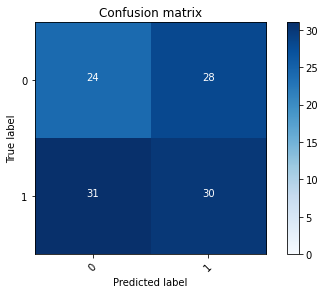

2022-08-22 14:14:21 - [Epoch Train: 17] loss: 0.5203, auc: 0.8378, acc: 0.7670, time: 24.00 s            
2022-08-22 14:14:21 - [Epoch Valid: 17] loss: 0.7923, auc: 0.4808, acc: 0.4711, time: 6.00 s


 17%|███████▏                                  | 17/100 [08:37<42:08, 30.47s/it]

2022-08-22 14:14:21 - EPOCH: 18
2022-08-22 14:14:21 - Train Step 10/485, train_loss: 0.5775
2022-08-22 14:14:22 - Train Step 20/485, train_loss: 0.5813
2022-08-22 14:14:22 - Train Step 30/485, train_loss: 0.5680
2022-08-22 14:14:23 - Train Step 40/485, train_loss: 0.5730
2022-08-22 14:14:23 - Train Step 50/485, train_loss: 0.5637
2022-08-22 14:14:24 - Train Step 60/485, train_loss: 0.5513
2022-08-22 14:14:24 - Train Step 70/485, train_loss: 0.5753
2022-08-22 14:14:25 - Train Step 80/485, train_loss: 0.5667
2022-08-22 14:14:25 - Train Step 90/485, train_loss: 0.5542
2022-08-22 14:14:26 - Train Step 100/485, train_loss: 0.5516
2022-08-22 14:14:26 - Train Step 110/485, train_loss: 0.5621
2022-08-22 14:14:27 - Train Step 120/485, train_loss: 0.5548
2022-08-22 14:14:27 - Train Step 130/485, train_loss: 0.5517
2022-08-22 14:14:28 - Train Step 140/485, train_loss: 0.5574
2022-08-22 14:14:28 - Train Step 150/485, train_loss: 0.5567
2022-08-22 14:14:29 - Train Step 160/485, train_loss: 0.5570
2

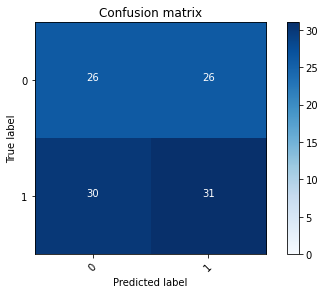

2022-08-22 14:14:51 - [Epoch Train: 18] loss: 0.5186, auc: 0.8327, acc: 0.7485, time: 24.00 s            
2022-08-22 14:14:51 - [Epoch Valid: 18] loss: 0.8168, auc: 0.5038, acc: 0.4959, time: 6.00 s


 18%|███████▌                                  | 18/100 [09:08<41:43, 30.53s/it]

2022-08-22 14:14:51 - EPOCH: 19
2022-08-22 14:14:52 - Train Step 10/485, train_loss: 0.4899
2022-08-22 14:14:53 - Train Step 20/485, train_loss: 0.3971
2022-08-22 14:14:53 - Train Step 30/485, train_loss: 0.5004
2022-08-22 14:14:54 - Train Step 40/485, train_loss: 0.4684
2022-08-22 14:14:54 - Train Step 50/485, train_loss: 0.5248
2022-08-22 14:14:55 - Train Step 60/485, train_loss: 0.5044
2022-08-22 14:14:55 - Train Step 70/485, train_loss: 0.5132
2022-08-22 14:14:56 - Train Step 80/485, train_loss: 0.5327
2022-08-22 14:14:56 - Train Step 90/485, train_loss: 0.5199
2022-08-22 14:14:57 - Train Step 100/485, train_loss: 0.5205
2022-08-22 14:14:57 - Train Step 110/485, train_loss: 0.5144
2022-08-22 14:14:58 - Train Step 120/485, train_loss: 0.5106
2022-08-22 14:14:58 - Train Step 130/485, train_loss: 0.5070
2022-08-22 14:14:59 - Train Step 140/485, train_loss: 0.5116
2022-08-22 14:14:59 - Train Step 150/485, train_loss: 0.5188
2022-08-22 14:15:00 - Train Step 160/485, train_loss: 0.5153
2

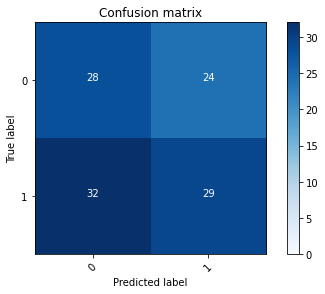

2022-08-22 14:15:22 - [Epoch Train: 19] loss: 0.4997, auc: 0.8556, acc: 0.7711, time: 24.00 s            
2022-08-22 14:15:22 - [Epoch Valid: 19] loss: 0.8165, auc: 0.4858, acc: 0.4959, time: 6.00 s


 19%|███████▉                                  | 19/100 [09:39<41:13, 30.53s/it]

2022-08-22 14:15:22 - EPOCH: 20
2022-08-22 14:15:23 - Train Step 10/485, train_loss: 0.6253
2022-08-22 14:15:23 - Train Step 20/485, train_loss: 0.5033
2022-08-22 14:15:24 - Train Step 30/485, train_loss: 0.5426
2022-08-22 14:15:24 - Train Step 40/485, train_loss: 0.5354
2022-08-22 14:15:25 - Train Step 50/485, train_loss: 0.5028
2022-08-22 14:15:25 - Train Step 60/485, train_loss: 0.5229
2022-08-22 14:15:26 - Train Step 70/485, train_loss: 0.5369
2022-08-22 14:15:26 - Train Step 80/485, train_loss: 0.5387
2022-08-22 14:15:27 - Train Step 90/485, train_loss: 0.5248
2022-08-22 14:15:27 - Train Step 100/485, train_loss: 0.5225
2022-08-22 14:15:28 - Train Step 110/485, train_loss: 0.5120
2022-08-22 14:15:28 - Train Step 120/485, train_loss: 0.5023
2022-08-22 14:15:29 - Train Step 130/485, train_loss: 0.5112
2022-08-22 14:15:29 - Train Step 140/485, train_loss: 0.5186
2022-08-22 14:15:30 - Train Step 150/485, train_loss: 0.5239
2022-08-22 14:15:30 - Train Step 160/485, train_loss: 0.5203
2

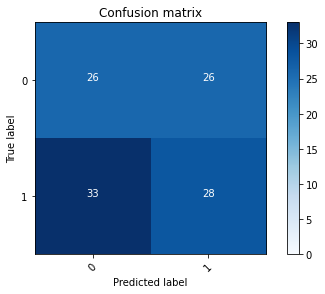

2022-08-22 14:15:52 - [Epoch Train: 20] loss: 0.5026, auc: 0.8426, acc: 0.7629, time: 24.00 s            
2022-08-22 14:15:52 - [Epoch Valid: 20] loss: 0.8201, auc: 0.4745, acc: 0.4711, time: 6.00 s


 20%|████████▍                                 | 20/100 [10:09<40:37, 30.47s/it]

2022-08-22 14:15:52 - EPOCH: 21
2022-08-22 14:15:53 - Train Step 10/485, train_loss: 0.5760
2022-08-22 14:15:53 - Train Step 20/485, train_loss: 0.6130
2022-08-22 14:15:54 - Train Step 30/485, train_loss: 0.6091
2022-08-22 14:15:54 - Train Step 40/485, train_loss: 0.5571
2022-08-22 14:15:55 - Train Step 50/485, train_loss: 0.5255
2022-08-22 14:15:55 - Train Step 60/485, train_loss: 0.5254
2022-08-22 14:15:56 - Train Step 70/485, train_loss: 0.5269
2022-08-22 14:15:56 - Train Step 80/485, train_loss: 0.5390
2022-08-22 14:15:57 - Train Step 90/485, train_loss: 0.5214
2022-08-22 14:15:57 - Train Step 100/485, train_loss: 0.5236
2022-08-22 14:15:58 - Train Step 110/485, train_loss: 0.5146
2022-08-22 14:15:58 - Train Step 120/485, train_loss: 0.5061
2022-08-22 14:15:59 - Train Step 130/485, train_loss: 0.5154
2022-08-22 14:15:59 - Train Step 140/485, train_loss: 0.5144
2022-08-22 14:16:00 - Train Step 150/485, train_loss: 0.5126
2022-08-22 14:16:00 - Train Step 160/485, train_loss: 0.5110
2

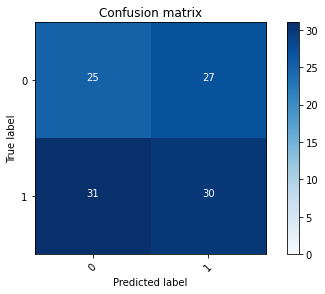

2022-08-22 14:16:23 - [Epoch Train: 21] loss: 0.4724, auc: 0.8746, acc: 0.8021, time: 24.00 s            
2022-08-22 14:16:23 - [Epoch Valid: 21] loss: 0.8260, auc: 0.4868, acc: 0.4793, time: 6.00 s


 21%|████████▊                                 | 21/100 [10:40<40:12, 30.54s/it]

2022-08-22 14:16:23 - EPOCH: 22
2022-08-22 14:16:24 - Train Step 10/485, train_loss: 0.5002
2022-08-22 14:16:24 - Train Step 20/485, train_loss: 0.4792
2022-08-22 14:16:25 - Train Step 30/485, train_loss: 0.4530
2022-08-22 14:16:25 - Train Step 40/485, train_loss: 0.4337
2022-08-22 14:16:26 - Train Step 50/485, train_loss: 0.4191
2022-08-22 14:16:26 - Train Step 60/485, train_loss: 0.4616
2022-08-22 14:16:27 - Train Step 70/485, train_loss: 0.4396
2022-08-22 14:16:27 - Train Step 80/485, train_loss: 0.4453
2022-08-22 14:16:28 - Train Step 90/485, train_loss: 0.4391
2022-08-22 14:16:28 - Train Step 100/485, train_loss: 0.4457
2022-08-22 14:16:29 - Train Step 110/485, train_loss: 0.4403
2022-08-22 14:16:29 - Train Step 120/485, train_loss: 0.4416
2022-08-22 14:16:30 - Train Step 130/485, train_loss: 0.4469
2022-08-22 14:16:30 - Train Step 140/485, train_loss: 0.4493
2022-08-22 14:16:31 - Train Step 150/485, train_loss: 0.4537
2022-08-22 14:16:31 - Train Step 160/485, train_loss: 0.4628
2

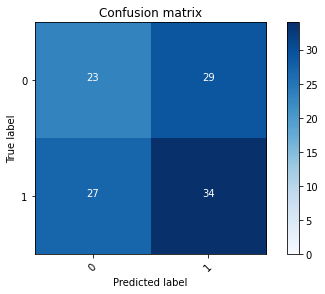

2022-08-22 14:16:53 - [Epoch Train: 22] loss: 0.4761, auc: 0.8678, acc: 0.7897, time: 23.00 s            
2022-08-22 14:16:53 - [Epoch Valid: 22] loss: 0.8539, auc: 0.4852, acc: 0.4876, time: 6.00 s


 22%|█████████▏                                | 22/100 [11:10<39:37, 30.48s/it]

2022-08-22 14:16:53 - EPOCH: 23
2022-08-22 14:16:54 - Train Step 10/485, train_loss: 0.4376
2022-08-22 14:16:55 - Train Step 20/485, train_loss: 0.5445
2022-08-22 14:16:55 - Train Step 30/485, train_loss: 0.4815
2022-08-22 14:16:56 - Train Step 40/485, train_loss: 0.5379
2022-08-22 14:16:56 - Train Step 50/485, train_loss: 0.5526
2022-08-22 14:16:57 - Train Step 60/485, train_loss: 0.5438
2022-08-22 14:16:57 - Train Step 70/485, train_loss: 0.5168
2022-08-22 14:16:58 - Train Step 80/485, train_loss: 0.4984
2022-08-22 14:16:58 - Train Step 90/485, train_loss: 0.4930
2022-08-22 14:16:59 - Train Step 100/485, train_loss: 0.4920
2022-08-22 14:16:59 - Train Step 110/485, train_loss: 0.4893
2022-08-22 14:17:00 - Train Step 120/485, train_loss: 0.4989
2022-08-22 14:17:00 - Train Step 130/485, train_loss: 0.4922
2022-08-22 14:17:01 - Train Step 140/485, train_loss: 0.4839
2022-08-22 14:17:01 - Train Step 150/485, train_loss: 0.4797
2022-08-22 14:17:02 - Train Step 160/485, train_loss: 0.4854
2

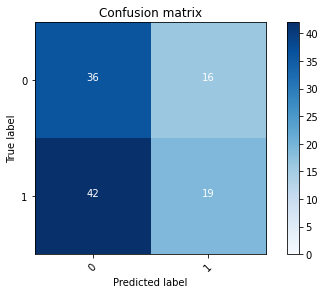

2022-08-22 14:17:24 - [Epoch Train: 23] loss: 0.4569, auc: 0.8799, acc: 0.8082, time: 24.00 s            
2022-08-22 14:17:24 - [Epoch Valid: 23] loss: 0.9070, auc: 0.4798, acc: 0.4876, time: 6.00 s


 23%|█████████▋                                | 23/100 [11:40<39:05, 30.46s/it]

2022-08-22 14:17:24 - EPOCH: 24
2022-08-22 14:17:24 - Train Step 10/485, train_loss: 0.6303
2022-08-22 14:17:25 - Train Step 20/485, train_loss: 0.4558
2022-08-22 14:17:25 - Train Step 30/485, train_loss: 0.4388
2022-08-22 14:17:26 - Train Step 40/485, train_loss: 0.4174
2022-08-22 14:17:26 - Train Step 50/485, train_loss: 0.4474
2022-08-22 14:17:27 - Train Step 60/485, train_loss: 0.4300
2022-08-22 14:17:27 - Train Step 70/485, train_loss: 0.4337
2022-08-22 14:17:28 - Train Step 80/485, train_loss: 0.4440
2022-08-22 14:17:28 - Train Step 90/485, train_loss: 0.4247
2022-08-22 14:17:29 - Train Step 100/485, train_loss: 0.4344
2022-08-22 14:17:29 - Train Step 110/485, train_loss: 0.4352
2022-08-22 14:17:30 - Train Step 120/485, train_loss: 0.4354
2022-08-22 14:17:30 - Train Step 130/485, train_loss: 0.4284
2022-08-22 14:17:31 - Train Step 140/485, train_loss: 0.4250
2022-08-22 14:17:31 - Train Step 150/485, train_loss: 0.4299
2022-08-22 14:17:32 - Train Step 160/485, train_loss: 0.4305
2

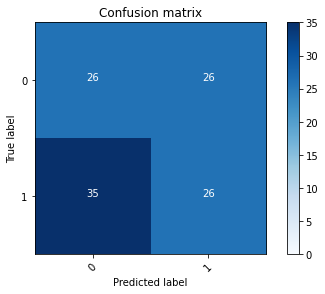

2022-08-22 14:17:54 - [Epoch Train: 24] loss: 0.4475, auc: 0.8877, acc: 0.8165, time: 24.00 s            
2022-08-22 14:17:54 - [Epoch Valid: 24] loss: 0.8829, auc: 0.4808, acc: 0.4545, time: 6.00 s


 24%|██████████                                | 24/100 [12:11<38:39, 30.52s/it]

2022-08-22 14:17:54 - EPOCH: 25
2022-08-22 14:17:55 - Train Step 10/485, train_loss: 0.3250
2022-08-22 14:17:56 - Train Step 20/485, train_loss: 0.5049
2022-08-22 14:17:56 - Train Step 30/485, train_loss: 0.4919
2022-08-22 14:17:57 - Train Step 40/485, train_loss: 0.4780
2022-08-22 14:17:57 - Train Step 50/485, train_loss: 0.4553
2022-08-22 14:17:57 - Train Step 60/485, train_loss: 0.4843
2022-08-22 14:17:58 - Train Step 70/485, train_loss: 0.4740
2022-08-22 14:17:58 - Train Step 80/485, train_loss: 0.4695
2022-08-22 14:17:59 - Train Step 90/485, train_loss: 0.4597
2022-08-22 14:17:59 - Train Step 100/485, train_loss: 0.4588
2022-08-22 14:18:00 - Train Step 110/485, train_loss: 0.4599
2022-08-22 14:18:00 - Train Step 120/485, train_loss: 0.4649
2022-08-22 14:18:01 - Train Step 130/485, train_loss: 0.4521
2022-08-22 14:18:01 - Train Step 140/485, train_loss: 0.4477
2022-08-22 14:18:02 - Train Step 150/485, train_loss: 0.4454
2022-08-22 14:18:02 - Train Step 160/485, train_loss: 0.4467
2

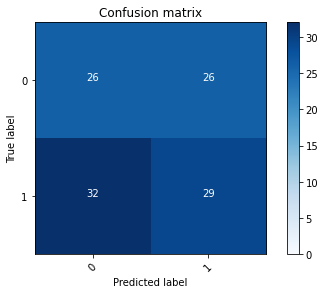

2022-08-22 14:18:25 - [Epoch Train: 25] loss: 0.4480, auc: 0.8845, acc: 0.8289, time: 24.00 s            
2022-08-22 14:18:25 - [Epoch Valid: 25] loss: 0.9132, auc: 0.4697, acc: 0.4793, time: 6.00 s


 25%|██████████▌                               | 25/100 [12:41<38:07, 30.50s/it]

2022-08-22 14:18:25 - EPOCH: 26
2022-08-22 14:18:26 - Train Step 10/485, train_loss: 0.3139
2022-08-22 14:18:26 - Train Step 20/485, train_loss: 0.3979
2022-08-22 14:18:27 - Train Step 30/485, train_loss: 0.3920
2022-08-22 14:18:27 - Train Step 40/485, train_loss: 0.4159
2022-08-22 14:18:28 - Train Step 50/485, train_loss: 0.3853
2022-08-22 14:18:28 - Train Step 60/485, train_loss: 0.4132
2022-08-22 14:18:29 - Train Step 70/485, train_loss: 0.4574
2022-08-22 14:18:29 - Train Step 80/485, train_loss: 0.4641
2022-08-22 14:18:30 - Train Step 90/485, train_loss: 0.4677
2022-08-22 14:18:30 - Train Step 100/485, train_loss: 0.4835
2022-08-22 14:18:31 - Train Step 110/485, train_loss: 0.4804
2022-08-22 14:18:32 - Train Step 120/485, train_loss: 0.4841
2022-08-22 14:18:32 - Train Step 130/485, train_loss: 0.4694
2022-08-22 14:18:33 - Train Step 140/485, train_loss: 0.4750
2022-08-22 14:18:33 - Train Step 150/485, train_loss: 0.4743
2022-08-22 14:18:34 - Train Step 160/485, train_loss: 0.4673
2

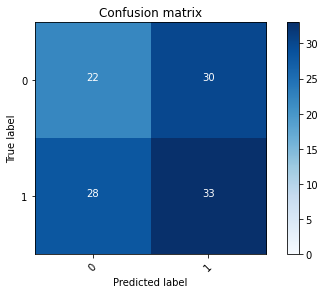

2022-08-22 14:18:56 - [Epoch Train: 26] loss: 0.4383, auc: 0.8920, acc: 0.8206, time: 25.00 s            
2022-08-22 14:18:56 - [Epoch Valid: 26] loss: 0.8937, auc: 0.4858, acc: 0.4711, time: 6.00 s


 26%|██████████▉                               | 26/100 [13:13<38:01, 30.83s/it]

2022-08-22 14:18:56 - EPOCH: 27
2022-08-22 14:18:57 - Train Step 10/485, train_loss: 0.3440
2022-08-22 14:18:58 - Train Step 20/485, train_loss: 0.3122
2022-08-22 14:18:58 - Train Step 30/485, train_loss: 0.3319
2022-08-22 14:18:59 - Train Step 40/485, train_loss: 0.3933
2022-08-22 14:18:59 - Train Step 50/485, train_loss: 0.4373
2022-08-22 14:19:00 - Train Step 60/485, train_loss: 0.4221
2022-08-22 14:19:00 - Train Step 70/485, train_loss: 0.4241
2022-08-22 14:19:01 - Train Step 80/485, train_loss: 0.4135
2022-08-22 14:19:01 - Train Step 90/485, train_loss: 0.4068
2022-08-22 14:19:02 - Train Step 100/485, train_loss: 0.4105
2022-08-22 14:19:02 - Train Step 110/485, train_loss: 0.4056
2022-08-22 14:19:03 - Train Step 120/485, train_loss: 0.4091
2022-08-22 14:19:03 - Train Step 130/485, train_loss: 0.4134
2022-08-22 14:19:04 - Train Step 140/485, train_loss: 0.4051
2022-08-22 14:19:04 - Train Step 150/485, train_loss: 0.4066
2022-08-22 14:19:05 - Train Step 160/485, train_loss: 0.4130
2

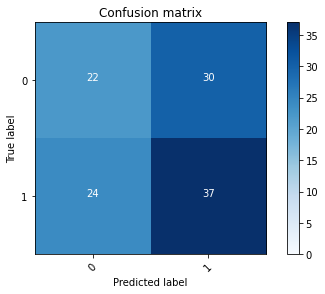

2022-08-22 14:19:28 - [Epoch Train: 27] loss: 0.4250, auc: 0.8979, acc: 0.8103, time: 24.00 s            
2022-08-22 14:19:28 - [Epoch Valid: 27] loss: 0.9010, auc: 0.4814, acc: 0.5041, time: 6.00 s


 27%|███████████▎                              | 27/100 [13:44<37:36, 30.91s/it]

2022-08-22 14:19:28 - EPOCH: 28
2022-08-22 14:19:28 - Train Step 10/485, train_loss: 0.2552
2022-08-22 14:19:29 - Train Step 20/485, train_loss: 0.3693
2022-08-22 14:19:29 - Train Step 30/485, train_loss: 0.3997
2022-08-22 14:19:30 - Train Step 40/485, train_loss: 0.4018
2022-08-22 14:19:30 - Train Step 50/485, train_loss: 0.4323
2022-08-22 14:19:31 - Train Step 60/485, train_loss: 0.4114
2022-08-22 14:19:31 - Train Step 70/485, train_loss: 0.4286
2022-08-22 14:19:32 - Train Step 80/485, train_loss: 0.4158
2022-08-22 14:19:32 - Train Step 90/485, train_loss: 0.4178
2022-08-22 14:19:33 - Train Step 100/485, train_loss: 0.4119
2022-08-22 14:19:33 - Train Step 110/485, train_loss: 0.4081
2022-08-22 14:19:34 - Train Step 120/485, train_loss: 0.4126
2022-08-22 14:19:34 - Train Step 130/485, train_loss: 0.4148
2022-08-22 14:19:35 - Train Step 140/485, train_loss: 0.4038
2022-08-22 14:19:35 - Train Step 150/485, train_loss: 0.4008
2022-08-22 14:19:36 - Train Step 160/485, train_loss: 0.3948
2

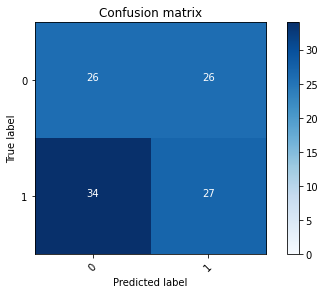

2022-08-22 14:19:59 - [Epoch Train: 28] loss: 0.4123, auc: 0.9069, acc: 0.8289, time: 24.00 s            
2022-08-22 14:19:59 - [Epoch Valid: 28] loss: 0.9435, auc: 0.4782, acc: 0.4628, time: 6.00 s


 28%|███████████▊                              | 28/100 [14:16<37:16, 31.06s/it]

2022-08-22 14:19:59 - EPOCH: 29
2022-08-22 14:20:00 - Train Step 10/485, train_loss: 0.3981
2022-08-22 14:20:00 - Train Step 20/485, train_loss: 0.3745
2022-08-22 14:20:01 - Train Step 30/485, train_loss: 0.3312
2022-08-22 14:20:01 - Train Step 40/485, train_loss: 0.3570
2022-08-22 14:20:02 - Train Step 50/485, train_loss: 0.3792
2022-08-22 14:20:02 - Train Step 60/485, train_loss: 0.3979
2022-08-22 14:20:03 - Train Step 70/485, train_loss: 0.4137
2022-08-22 14:20:03 - Train Step 80/485, train_loss: 0.4020
2022-08-22 14:20:04 - Train Step 90/485, train_loss: 0.4041
2022-08-22 14:20:04 - Train Step 100/485, train_loss: 0.3979
2022-08-22 14:20:05 - Train Step 110/485, train_loss: 0.4025
2022-08-22 14:20:05 - Train Step 120/485, train_loss: 0.4057
2022-08-22 14:20:06 - Train Step 130/485, train_loss: 0.4068
2022-08-22 14:20:06 - Train Step 140/485, train_loss: 0.3971
2022-08-22 14:20:07 - Train Step 150/485, train_loss: 0.3983
2022-08-22 14:20:07 - Train Step 160/485, train_loss: 0.3991
2

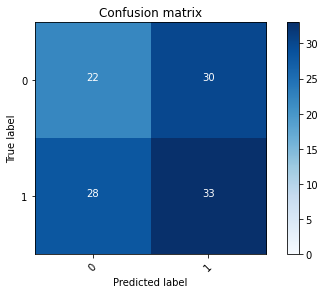

2022-08-22 14:20:31 - [Epoch Train: 29] loss: 0.4115, auc: 0.9031, acc: 0.8412, time: 25.00 s            
2022-08-22 14:20:31 - [Epoch Valid: 29] loss: 0.9480, auc: 0.4663, acc: 0.4793, time: 6.00 s


 29%|████████████▏                             | 29/100 [14:48<37:05, 31.34s/it]

2022-08-22 14:20:31 - EPOCH: 30
2022-08-22 14:20:32 - Train Step 10/485, train_loss: 0.4745
2022-08-22 14:20:32 - Train Step 20/485, train_loss: 0.3720
2022-08-22 14:20:33 - Train Step 30/485, train_loss: 0.3507
2022-08-22 14:20:33 - Train Step 40/485, train_loss: 0.3364
2022-08-22 14:20:34 - Train Step 50/485, train_loss: 0.3266
2022-08-22 14:20:34 - Train Step 60/485, train_loss: 0.3333
2022-08-22 14:20:35 - Train Step 70/485, train_loss: 0.3408
2022-08-22 14:20:35 - Train Step 80/485, train_loss: 0.3558
2022-08-22 14:20:36 - Train Step 90/485, train_loss: 0.3469
2022-08-22 14:20:36 - Train Step 100/485, train_loss: 0.3770
2022-08-22 14:20:37 - Train Step 110/485, train_loss: 0.3696
2022-08-22 14:20:37 - Train Step 120/485, train_loss: 0.3694
2022-08-22 14:20:38 - Train Step 130/485, train_loss: 0.3740
2022-08-22 14:20:38 - Train Step 140/485, train_loss: 0.3732
2022-08-22 14:20:39 - Train Step 150/485, train_loss: 0.3819
2022-08-22 14:20:39 - Train Step 160/485, train_loss: 0.4074
2

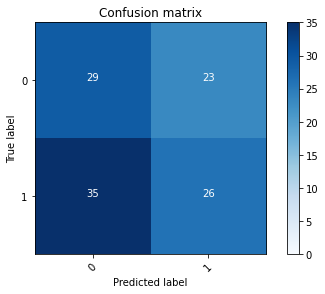

2022-08-22 14:21:02 - [Epoch Train: 30] loss: 0.3950, auc: 0.9145, acc: 0.8392, time: 24.00 s            
2022-08-22 14:21:02 - [Epoch Valid: 30] loss: 0.9630, auc: 0.4732, acc: 0.4793, time: 6.00 s


 30%|████████████▌                             | 30/100 [15:19<36:32, 31.32s/it]

2022-08-22 14:21:02 - EPOCH: 31
2022-08-22 14:21:03 - Train Step 10/485, train_loss: 0.3167
2022-08-22 14:21:03 - Train Step 20/485, train_loss: 0.4004
2022-08-22 14:21:04 - Train Step 30/485, train_loss: 0.3963
2022-08-22 14:21:04 - Train Step 40/485, train_loss: 0.3485
2022-08-22 14:21:05 - Train Step 50/485, train_loss: 0.3272
2022-08-22 14:21:05 - Train Step 60/485, train_loss: 0.3245
2022-08-22 14:21:06 - Train Step 70/485, train_loss: 0.3513
2022-08-22 14:21:07 - Train Step 80/485, train_loss: 0.3708
2022-08-22 14:21:07 - Train Step 90/485, train_loss: 0.3772
2022-08-22 14:21:08 - Train Step 100/485, train_loss: 0.3692
2022-08-22 14:21:08 - Train Step 110/485, train_loss: 0.3607
2022-08-22 14:21:09 - Train Step 120/485, train_loss: 0.3594
2022-08-22 14:21:09 - Train Step 130/485, train_loss: 0.3613
2022-08-22 14:21:10 - Train Step 140/485, train_loss: 0.3628
2022-08-22 14:21:10 - Train Step 150/485, train_loss: 0.3689
2022-08-22 14:21:11 - Train Step 160/485, train_loss: 0.3739
2

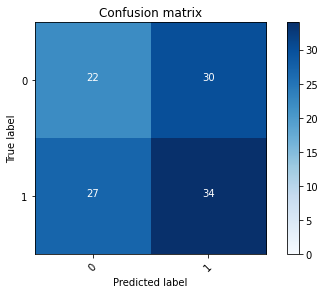

2022-08-22 14:21:33 - [Epoch Train: 31] loss: 0.3943, auc: 0.9138, acc: 0.8454, time: 24.00 s            
2022-08-22 14:21:33 - [Epoch Valid: 31] loss: 0.9817, auc: 0.4738, acc: 0.4793, time: 6.00 s


 31%|█████████████                             | 31/100 [15:50<35:57, 31.26s/it]

2022-08-22 14:21:33 - EPOCH: 32
2022-08-22 14:21:34 - Train Step 10/485, train_loss: 0.2691
2022-08-22 14:21:35 - Train Step 20/485, train_loss: 0.3023
2022-08-22 14:21:35 - Train Step 30/485, train_loss: 0.2887
2022-08-22 14:21:36 - Train Step 40/485, train_loss: 0.2858
2022-08-22 14:21:36 - Train Step 50/485, train_loss: 0.3238
2022-08-22 14:21:37 - Train Step 60/485, train_loss: 0.3428
2022-08-22 14:21:37 - Train Step 70/485, train_loss: 0.3378
2022-08-22 14:21:38 - Train Step 80/485, train_loss: 0.3483
2022-08-22 14:21:38 - Train Step 90/485, train_loss: 0.3578
2022-08-22 14:21:39 - Train Step 100/485, train_loss: 0.3712
2022-08-22 14:21:39 - Train Step 110/485, train_loss: 0.3715
2022-08-22 14:21:40 - Train Step 120/485, train_loss: 0.3761
2022-08-22 14:21:40 - Train Step 130/485, train_loss: 0.3743
2022-08-22 14:21:41 - Train Step 140/485, train_loss: 0.3562
2022-08-22 14:21:41 - Train Step 150/485, train_loss: 0.3628
2022-08-22 14:21:42 - Train Step 160/485, train_loss: 0.3738
2

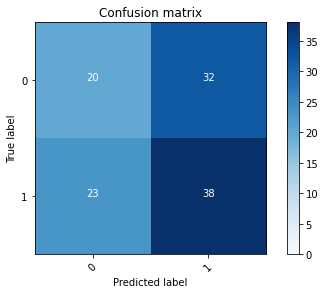

2022-08-22 14:22:04 - [Epoch Train: 32] loss: 0.3784, auc: 0.9225, acc: 0.8515, time: 24.00 s            
2022-08-22 14:22:04 - [Epoch Valid: 32] loss: 1.0032, auc: 0.4858, acc: 0.4959, time: 6.00 s


 32%|█████████████▍                            | 32/100 [16:21<35:23, 31.22s/it]

2022-08-22 14:22:04 - EPOCH: 33
2022-08-22 14:22:05 - Train Step 10/485, train_loss: 0.4676
2022-08-22 14:22:06 - Train Step 20/485, train_loss: 0.3915
2022-08-22 14:22:06 - Train Step 30/485, train_loss: 0.3404
2022-08-22 14:22:07 - Train Step 40/485, train_loss: 0.3548
2022-08-22 14:22:07 - Train Step 50/485, train_loss: 0.3528
2022-08-22 14:22:08 - Train Step 60/485, train_loss: 0.3580
2022-08-22 14:22:08 - Train Step 70/485, train_loss: 0.3851
2022-08-22 14:22:09 - Train Step 80/485, train_loss: 0.3794
2022-08-22 14:22:09 - Train Step 90/485, train_loss: 0.3500
2022-08-22 14:22:10 - Train Step 100/485, train_loss: 0.3765
2022-08-22 14:22:10 - Train Step 110/485, train_loss: 0.3859
2022-08-22 14:22:11 - Train Step 120/485, train_loss: 0.3809
2022-08-22 14:22:11 - Train Step 130/485, train_loss: 0.3817
2022-08-22 14:22:12 - Train Step 140/485, train_loss: 0.3716
2022-08-22 14:22:12 - Train Step 150/485, train_loss: 0.3701
2022-08-22 14:22:13 - Train Step 160/485, train_loss: 0.3738
2

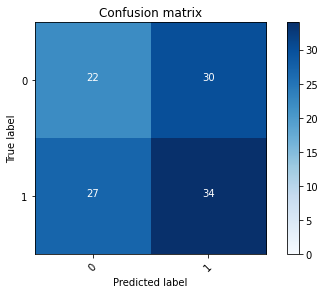

2022-08-22 14:22:36 - [Epoch Train: 33] loss: 0.3814, auc: 0.9178, acc: 0.8309, time: 24.00 s            
2022-08-22 14:22:36 - [Epoch Valid: 33] loss: 0.9834, auc: 0.4798, acc: 0.4793, time: 6.00 s


 33%|█████████████▊                            | 33/100 [16:53<34:59, 31.33s/it]

2022-08-22 14:22:36 - EPOCH: 34
2022-08-22 14:22:37 - Train Step 10/485, train_loss: 0.3433
2022-08-22 14:22:37 - Train Step 20/485, train_loss: 0.2475
2022-08-22 14:22:38 - Train Step 30/485, train_loss: 0.3022
2022-08-22 14:22:38 - Train Step 40/485, train_loss: 0.3164
2022-08-22 14:22:39 - Train Step 50/485, train_loss: 0.3591
2022-08-22 14:22:39 - Train Step 60/485, train_loss: 0.3342
2022-08-22 14:22:40 - Train Step 70/485, train_loss: 0.3285
2022-08-22 14:22:40 - Train Step 80/485, train_loss: 0.3232
2022-08-22 14:22:41 - Train Step 90/485, train_loss: 0.3181
2022-08-22 14:22:41 - Train Step 100/485, train_loss: 0.3193
2022-08-22 14:22:42 - Train Step 110/485, train_loss: 0.3369
2022-08-22 14:22:42 - Train Step 120/485, train_loss: 0.3253
2022-08-22 14:22:43 - Train Step 130/485, train_loss: 0.3365
2022-08-22 14:22:43 - Train Step 140/485, train_loss: 0.3306
2022-08-22 14:22:44 - Train Step 150/485, train_loss: 0.3439
2022-08-22 14:22:44 - Train Step 160/485, train_loss: 0.3478
2

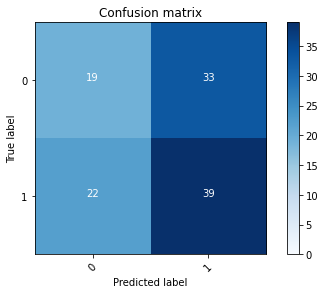

2022-08-22 14:23:08 - [Epoch Train: 34] loss: 0.3573, auc: 0.9326, acc: 0.8474, time: 25.00 s            
2022-08-22 14:23:08 - [Epoch Valid: 34] loss: 1.0196, auc: 0.4808, acc: 0.4959, time: 6.00 s


 34%|██████████████▎                           | 34/100 [17:24<34:30, 31.37s/it]

2022-08-22 14:23:08 - EPOCH: 35
2022-08-22 14:23:08 - Train Step 10/485, train_loss: 0.4655
2022-08-22 14:23:09 - Train Step 20/485, train_loss: 0.3826
2022-08-22 14:23:09 - Train Step 30/485, train_loss: 0.3436
2022-08-22 14:23:10 - Train Step 40/485, train_loss: 0.3482
2022-08-22 14:23:10 - Train Step 50/485, train_loss: 0.3517
2022-08-22 14:23:11 - Train Step 60/485, train_loss: 0.3296
2022-08-22 14:23:11 - Train Step 70/485, train_loss: 0.3119
2022-08-22 14:23:12 - Train Step 80/485, train_loss: 0.3202
2022-08-22 14:23:12 - Train Step 90/485, train_loss: 0.3343
2022-08-22 14:23:13 - Train Step 100/485, train_loss: 0.3286
2022-08-22 14:23:13 - Train Step 110/485, train_loss: 0.3447
2022-08-22 14:23:14 - Train Step 120/485, train_loss: 0.3314
2022-08-22 14:23:14 - Train Step 130/485, train_loss: 0.3363
2022-08-22 14:23:15 - Train Step 140/485, train_loss: 0.3358
2022-08-22 14:23:15 - Train Step 150/485, train_loss: 0.3409
2022-08-22 14:23:16 - Train Step 160/485, train_loss: 0.3580
2

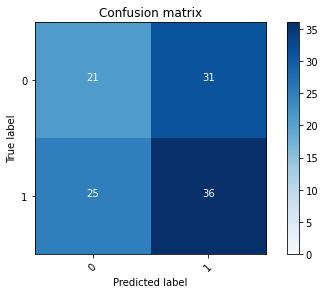

2022-08-22 14:23:39 - [Epoch Train: 35] loss: 0.3518, auc: 0.9376, acc: 0.8639, time: 25.00 s            
2022-08-22 14:23:39 - [Epoch Valid: 35] loss: 1.0218, auc: 0.4757, acc: 0.4876, time: 6.00 s


 35%|██████████████▋                           | 35/100 [17:56<33:59, 31.38s/it]

2022-08-22 14:23:39 - EPOCH: 36
2022-08-22 14:23:40 - Train Step 10/485, train_loss: 0.2243
2022-08-22 14:23:40 - Train Step 20/485, train_loss: 0.2103
2022-08-22 14:23:41 - Train Step 30/485, train_loss: 0.2444
2022-08-22 14:23:41 - Train Step 40/485, train_loss: 0.3247
2022-08-22 14:23:42 - Train Step 50/485, train_loss: 0.3285
2022-08-22 14:23:42 - Train Step 60/485, train_loss: 0.3567
2022-08-22 14:23:43 - Train Step 70/485, train_loss: 0.3756
2022-08-22 14:23:43 - Train Step 80/485, train_loss: 0.3676
2022-08-22 14:23:44 - Train Step 90/485, train_loss: 0.3531
2022-08-22 14:23:44 - Train Step 100/485, train_loss: 0.3587
2022-08-22 14:23:45 - Train Step 110/485, train_loss: 0.3485
2022-08-22 14:23:45 - Train Step 120/485, train_loss: 0.3599
2022-08-22 14:23:46 - Train Step 130/485, train_loss: 0.3658
2022-08-22 14:23:46 - Train Step 140/485, train_loss: 0.3582
2022-08-22 14:23:47 - Train Step 150/485, train_loss: 0.3523
2022-08-22 14:23:47 - Train Step 160/485, train_loss: 0.3549
2

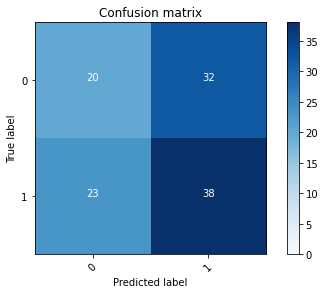

2022-08-22 14:24:10 - [Epoch Train: 36] loss: 0.3443, auc: 0.9362, acc: 0.8660, time: 24.00 s            
2022-08-22 14:24:10 - [Epoch Valid: 36] loss: 1.0823, auc: 0.4786, acc: 0.4959, time: 6.00 s


 36%|███████████████                           | 36/100 [18:27<33:20, 31.25s/it]

2022-08-22 14:24:10 - EPOCH: 37
2022-08-22 14:24:11 - Train Step 10/485, train_loss: 0.1797
2022-08-22 14:24:11 - Train Step 20/485, train_loss: 0.2678
2022-08-22 14:24:12 - Train Step 30/485, train_loss: 0.3145
2022-08-22 14:24:12 - Train Step 40/485, train_loss: 0.3212
2022-08-22 14:24:13 - Train Step 50/485, train_loss: 0.3094
2022-08-22 14:24:13 - Train Step 60/485, train_loss: 0.3000
2022-08-22 14:24:14 - Train Step 70/485, train_loss: 0.2765
2022-08-22 14:24:14 - Train Step 80/485, train_loss: 0.2807
2022-08-22 14:24:15 - Train Step 90/485, train_loss: 0.3002
2022-08-22 14:24:15 - Train Step 100/485, train_loss: 0.2996
2022-08-22 14:24:16 - Train Step 110/485, train_loss: 0.3031
2022-08-22 14:24:16 - Train Step 120/485, train_loss: 0.3029
2022-08-22 14:24:17 - Train Step 130/485, train_loss: 0.2997
2022-08-22 14:24:17 - Train Step 140/485, train_loss: 0.2961
2022-08-22 14:24:18 - Train Step 150/485, train_loss: 0.2932
2022-08-22 14:24:18 - Train Step 160/485, train_loss: 0.2956
2

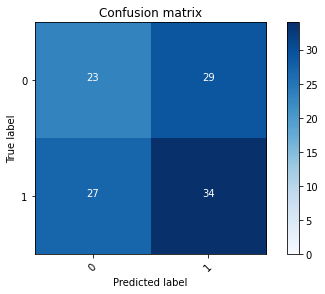

2022-08-22 14:24:41 - [Epoch Train: 37] loss: 0.3361, auc: 0.9440, acc: 0.8845, time: 24.00 s            
2022-08-22 14:24:41 - [Epoch Valid: 37] loss: 1.0296, auc: 0.4688, acc: 0.4876, time: 6.00 s


 37%|███████████████▌                          | 37/100 [18:57<32:41, 31.14s/it]

2022-08-22 14:24:41 - EPOCH: 38
2022-08-22 14:24:41 - Train Step 10/485, train_loss: 0.4141
2022-08-22 14:24:42 - Train Step 20/485, train_loss: 0.4697
2022-08-22 14:24:42 - Train Step 30/485, train_loss: 0.3652
2022-08-22 14:24:43 - Train Step 40/485, train_loss: 0.3395
2022-08-22 14:24:43 - Train Step 50/485, train_loss: 0.3226
2022-08-22 14:24:44 - Train Step 60/485, train_loss: 0.3143
2022-08-22 14:24:44 - Train Step 70/485, train_loss: 0.2957
2022-08-22 14:24:45 - Train Step 80/485, train_loss: 0.3266
2022-08-22 14:24:45 - Train Step 90/485, train_loss: 0.3284
2022-08-22 14:24:46 - Train Step 100/485, train_loss: 0.3181
2022-08-22 14:24:47 - Train Step 110/485, train_loss: 0.3192
2022-08-22 14:24:47 - Train Step 120/485, train_loss: 0.3114
2022-08-22 14:24:48 - Train Step 130/485, train_loss: 0.3165
2022-08-22 14:24:48 - Train Step 140/485, train_loss: 0.3113
2022-08-22 14:24:49 - Train Step 150/485, train_loss: 0.3276
2022-08-22 14:24:49 - Train Step 160/485, train_loss: 0.3231
2

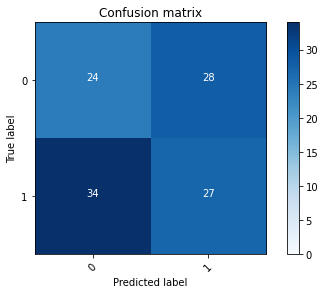

2022-08-22 14:25:12 - [Epoch Train: 38] loss: 0.3287, auc: 0.9472, acc: 0.8742, time: 24.00 s            
2022-08-22 14:25:12 - [Epoch Valid: 38] loss: 1.0579, auc: 0.4653, acc: 0.4380, time: 6.00 s


 38%|███████████████▉                          | 38/100 [19:29<32:14, 31.21s/it]

2022-08-22 14:25:12 - EPOCH: 39
2022-08-22 14:25:13 - Train Step 10/485, train_loss: 0.3644
2022-08-22 14:25:13 - Train Step 20/485, train_loss: 0.2906
2022-08-22 14:25:14 - Train Step 30/485, train_loss: 0.2730
2022-08-22 14:25:14 - Train Step 40/485, train_loss: 0.2986
2022-08-22 14:25:15 - Train Step 50/485, train_loss: 0.3219
2022-08-22 14:25:15 - Train Step 60/485, train_loss: 0.3325
2022-08-22 14:25:16 - Train Step 70/485, train_loss: 0.3098
2022-08-22 14:25:16 - Train Step 80/485, train_loss: 0.2877
2022-08-22 14:25:17 - Train Step 90/485, train_loss: 0.2870
2022-08-22 14:25:17 - Train Step 100/485, train_loss: 0.2869
2022-08-22 14:25:18 - Train Step 110/485, train_loss: 0.2873
2022-08-22 14:25:18 - Train Step 120/485, train_loss: 0.3013
2022-08-22 14:25:19 - Train Step 130/485, train_loss: 0.2992
2022-08-22 14:25:19 - Train Step 140/485, train_loss: 0.3153
2022-08-22 14:25:20 - Train Step 150/485, train_loss: 0.3146
2022-08-22 14:25:20 - Train Step 160/485, train_loss: 0.3119
2

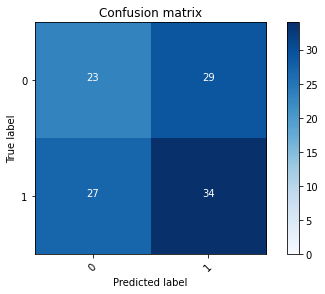

2022-08-22 14:25:43 - [Epoch Train: 39] loss: 0.3225, auc: 0.9490, acc: 0.8866, time: 24.00 s            
2022-08-22 14:25:43 - [Epoch Valid: 39] loss: 1.0729, auc: 0.4707, acc: 0.4876, time: 6.00 s


 39%|████████████████▍                         | 39/100 [20:00<31:44, 31.22s/it]

2022-08-22 14:25:43 - EPOCH: 40
2022-08-22 14:25:44 - Train Step 10/485, train_loss: 0.2220
2022-08-22 14:25:45 - Train Step 20/485, train_loss: 0.2601
2022-08-22 14:25:45 - Train Step 30/485, train_loss: 0.2976
2022-08-22 14:25:46 - Train Step 40/485, train_loss: 0.2788
2022-08-22 14:25:46 - Train Step 50/485, train_loss: 0.2872
2022-08-22 14:25:47 - Train Step 60/485, train_loss: 0.2635
2022-08-22 14:25:47 - Train Step 70/485, train_loss: 0.3042
2022-08-22 14:25:48 - Train Step 80/485, train_loss: 0.3055
2022-08-22 14:25:48 - Train Step 90/485, train_loss: 0.3269
2022-08-22 14:25:49 - Train Step 100/485, train_loss: 0.3206
2022-08-22 14:25:49 - Train Step 110/485, train_loss: 0.3489
2022-08-22 14:25:50 - Train Step 120/485, train_loss: 0.3415
2022-08-22 14:25:50 - Train Step 130/485, train_loss: 0.3432
2022-08-22 14:25:51 - Train Step 140/485, train_loss: 0.3394
2022-08-22 14:25:51 - Train Step 150/485, train_loss: 0.3354
2022-08-22 14:25:52 - Train Step 160/485, train_loss: 0.3347
2

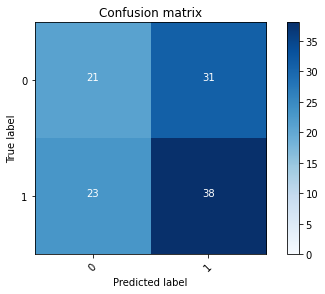

2022-08-22 14:26:14 - [Epoch Train: 40] loss: 0.3071, auc: 0.9538, acc: 0.8825, time: 24.00 s            
2022-08-22 14:26:14 - [Epoch Valid: 40] loss: 1.1723, auc: 0.4798, acc: 0.5041, time: 6.00 s


 40%|████████████████▊                         | 40/100 [20:31<31:04, 31.07s/it]

2022-08-22 14:26:14 - EPOCH: 41
2022-08-22 14:26:15 - Train Step 10/485, train_loss: 0.3454
2022-08-22 14:26:15 - Train Step 20/485, train_loss: 0.2631
2022-08-22 14:26:16 - Train Step 30/485, train_loss: 0.2735
2022-08-22 14:26:16 - Train Step 40/485, train_loss: 0.2601
2022-08-22 14:26:17 - Train Step 50/485, train_loss: 0.2756
2022-08-22 14:26:17 - Train Step 60/485, train_loss: 0.2744
2022-08-22 14:26:18 - Train Step 70/485, train_loss: 0.2671
2022-08-22 14:26:18 - Train Step 80/485, train_loss: 0.2806
2022-08-22 14:26:19 - Train Step 90/485, train_loss: 0.2621
2022-08-22 14:26:19 - Train Step 100/485, train_loss: 0.2631
2022-08-22 14:26:20 - Train Step 110/485, train_loss: 0.2750
2022-08-22 14:26:20 - Train Step 120/485, train_loss: 0.2749
2022-08-22 14:26:21 - Train Step 130/485, train_loss: 0.2706
2022-08-22 14:26:21 - Train Step 140/485, train_loss: 0.2700
2022-08-22 14:26:22 - Train Step 150/485, train_loss: 0.2611
2022-08-22 14:26:22 - Train Step 160/485, train_loss: 0.2649
2

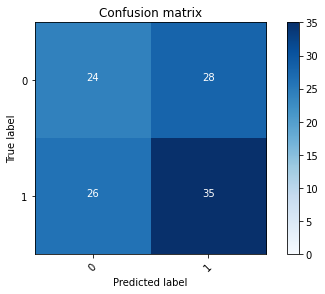

2022-08-22 14:26:45 - [Epoch Train: 41] loss: 0.3004, auc: 0.9556, acc: 0.8969, time: 24.00 s            
2022-08-22 14:26:45 - [Epoch Valid: 41] loss: 1.0732, auc: 0.4767, acc: 0.5041, time: 6.00 s


 41%|█████████████████▏                        | 41/100 [21:02<30:34, 31.10s/it]

2022-08-22 14:26:45 - EPOCH: 42
2022-08-22 14:26:46 - Train Step 10/485, train_loss: 0.3014
2022-08-22 14:26:46 - Train Step 20/485, train_loss: 0.2297
2022-08-22 14:26:47 - Train Step 30/485, train_loss: 0.2012
2022-08-22 14:26:47 - Train Step 40/485, train_loss: 0.1996
2022-08-22 14:26:48 - Train Step 50/485, train_loss: 0.2067
2022-08-22 14:26:48 - Train Step 60/485, train_loss: 0.2027
2022-08-22 14:26:49 - Train Step 70/485, train_loss: 0.2445
2022-08-22 14:26:49 - Train Step 80/485, train_loss: 0.2625
2022-08-22 14:26:50 - Train Step 90/485, train_loss: 0.2508
2022-08-22 14:26:50 - Train Step 100/485, train_loss: 0.2380
2022-08-22 14:26:51 - Train Step 110/485, train_loss: 0.2686
2022-08-22 14:26:51 - Train Step 120/485, train_loss: 0.2742
2022-08-22 14:26:52 - Train Step 130/485, train_loss: 0.2881
2022-08-22 14:26:52 - Train Step 140/485, train_loss: 0.2783
2022-08-22 14:26:53 - Train Step 150/485, train_loss: 0.2826
2022-08-22 14:26:53 - Train Step 160/485, train_loss: 0.2791
2

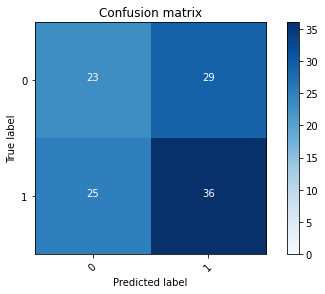

2022-08-22 14:27:16 - [Epoch Train: 42] loss: 0.2852, auc: 0.9616, acc: 0.8990, time: 24.00 s            
2022-08-22 14:27:16 - [Epoch Valid: 42] loss: 1.0971, auc: 0.4701, acc: 0.5041, time: 6.00 s


 42%|█████████████████▋                        | 42/100 [21:33<30:01, 31.07s/it]

2022-08-22 14:27:16 - EPOCH: 43
2022-08-22 14:27:17 - Train Step 10/485, train_loss: 0.1583
2022-08-22 14:27:17 - Train Step 20/485, train_loss: 0.2393
2022-08-22 14:27:18 - Train Step 30/485, train_loss: 0.2216
2022-08-22 14:27:18 - Train Step 40/485, train_loss: 0.2206
2022-08-22 14:27:19 - Train Step 50/485, train_loss: 0.2083
2022-08-22 14:27:19 - Train Step 60/485, train_loss: 0.2172
2022-08-22 14:27:20 - Train Step 70/485, train_loss: 0.2591
2022-08-22 14:27:20 - Train Step 80/485, train_loss: 0.2610
2022-08-22 14:27:21 - Train Step 90/485, train_loss: 0.2719
2022-08-22 14:27:21 - Train Step 100/485, train_loss: 0.2567
2022-08-22 14:27:22 - Train Step 110/485, train_loss: 0.2669
2022-08-22 14:27:22 - Train Step 120/485, train_loss: 0.2572
2022-08-22 14:27:23 - Train Step 130/485, train_loss: 0.2597
2022-08-22 14:27:23 - Train Step 140/485, train_loss: 0.2628
2022-08-22 14:27:24 - Train Step 150/485, train_loss: 0.2558
2022-08-22 14:27:24 - Train Step 160/485, train_loss: 0.2529
2

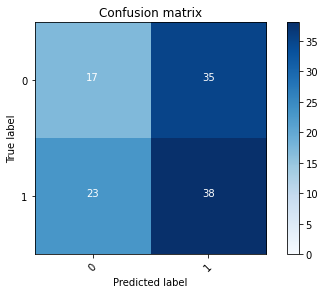

2022-08-22 14:27:47 - [Epoch Train: 43] loss: 0.2772, auc: 0.9641, acc: 0.8866, time: 24.00 s            
2022-08-22 14:27:47 - [Epoch Valid: 43] loss: 1.1732, auc: 0.4827, acc: 0.4711, time: 6.00 s


 43%|██████████████████                        | 43/100 [22:04<29:27, 31.01s/it]

2022-08-22 14:27:47 - EPOCH: 44
2022-08-22 14:27:48 - Train Step 10/485, train_loss: 0.4488
2022-08-22 14:27:48 - Train Step 20/485, train_loss: 0.3765
2022-08-22 14:27:49 - Train Step 30/485, train_loss: 0.3518
2022-08-22 14:27:49 - Train Step 40/485, train_loss: 0.3220
2022-08-22 14:27:50 - Train Step 50/485, train_loss: 0.2856
2022-08-22 14:27:50 - Train Step 60/485, train_loss: 0.3025
2022-08-22 14:27:51 - Train Step 70/485, train_loss: 0.2920
2022-08-22 14:27:51 - Train Step 80/485, train_loss: 0.2897
2022-08-22 14:27:52 - Train Step 90/485, train_loss: 0.2968
2022-08-22 14:27:52 - Train Step 100/485, train_loss: 0.2961
2022-08-22 14:27:53 - Train Step 110/485, train_loss: 0.3024
2022-08-22 14:27:53 - Train Step 120/485, train_loss: 0.2865
2022-08-22 14:27:54 - Train Step 130/485, train_loss: 0.2881
2022-08-22 14:27:54 - Train Step 140/485, train_loss: 0.2749
2022-08-22 14:27:55 - Train Step 150/485, train_loss: 0.2851
2022-08-22 14:27:55 - Train Step 160/485, train_loss: 0.2886
2

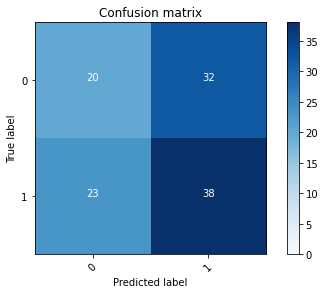

2022-08-22 14:28:18 - [Epoch Train: 44] loss: 0.2890, auc: 0.9597, acc: 0.8969, time: 24.00 s            
2022-08-22 14:28:18 - [Epoch Valid: 44] loss: 1.2185, auc: 0.4760, acc: 0.4959, time: 6.00 s


 44%|██████████████████▍                       | 44/100 [22:35<28:53, 30.96s/it]

2022-08-22 14:28:18 - EPOCH: 45
2022-08-22 14:28:19 - Train Step 10/485, train_loss: 0.2063
2022-08-22 14:28:19 - Train Step 20/485, train_loss: 0.1845
2022-08-22 14:28:20 - Train Step 30/485, train_loss: 0.1790
2022-08-22 14:28:20 - Train Step 40/485, train_loss: 0.1974
2022-08-22 14:28:21 - Train Step 50/485, train_loss: 0.1898
2022-08-22 14:28:21 - Train Step 60/485, train_loss: 0.2015
2022-08-22 14:28:22 - Train Step 70/485, train_loss: 0.1919
2022-08-22 14:28:22 - Train Step 80/485, train_loss: 0.1939
2022-08-22 14:28:23 - Train Step 90/485, train_loss: 0.1956
2022-08-22 14:28:23 - Train Step 100/485, train_loss: 0.1959
2022-08-22 14:28:24 - Train Step 110/485, train_loss: 0.2044
2022-08-22 14:28:24 - Train Step 120/485, train_loss: 0.2113
2022-08-22 14:28:25 - Train Step 130/485, train_loss: 0.2196
2022-08-22 14:28:25 - Train Step 140/485, train_loss: 0.2267
2022-08-22 14:28:26 - Train Step 150/485, train_loss: 0.2237
2022-08-22 14:28:26 - Train Step 160/485, train_loss: 0.2277
2

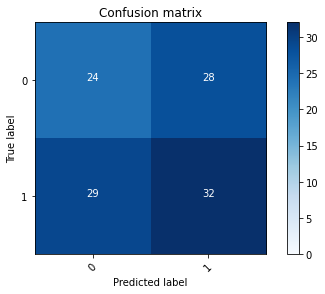

2022-08-22 14:28:49 - [Epoch Train: 45] loss: 0.2743, auc: 0.9644, acc: 0.9010, time: 24.00 s            
2022-08-22 14:28:49 - [Epoch Valid: 45] loss: 1.1658, auc: 0.4729, acc: 0.4793, time: 6.00 s


 45%|██████████████████▉                       | 45/100 [23:06<28:24, 30.99s/it]

2022-08-22 14:28:49 - EPOCH: 46
2022-08-22 14:28:50 - Train Step 10/485, train_loss: 0.2672
2022-08-22 14:28:50 - Train Step 20/485, train_loss: 0.2184
2022-08-22 14:28:51 - Train Step 30/485, train_loss: 0.2533
2022-08-22 14:28:51 - Train Step 40/485, train_loss: 0.2352
2022-08-22 14:28:52 - Train Step 50/485, train_loss: 0.2095
2022-08-22 14:28:52 - Train Step 60/485, train_loss: 0.2199
2022-08-22 14:28:53 - Train Step 70/485, train_loss: 0.2177
2022-08-22 14:28:53 - Train Step 80/485, train_loss: 0.2119
2022-08-22 14:28:54 - Train Step 90/485, train_loss: 0.2204
2022-08-22 14:28:54 - Train Step 100/485, train_loss: 0.2250
2022-08-22 14:28:55 - Train Step 110/485, train_loss: 0.2231
2022-08-22 14:28:55 - Train Step 120/485, train_loss: 0.2298
2022-08-22 14:28:56 - Train Step 130/485, train_loss: 0.2214
2022-08-22 14:28:56 - Train Step 140/485, train_loss: 0.2256
2022-08-22 14:28:57 - Train Step 150/485, train_loss: 0.2292
2022-08-22 14:28:57 - Train Step 160/485, train_loss: 0.2228
2

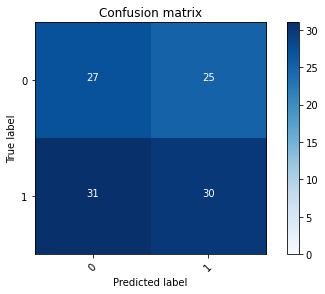

2022-08-22 14:29:20 - [Epoch Train: 46] loss: 0.2520, auc: 0.9745, acc: 0.9258, time: 24.00 s            
2022-08-22 14:29:20 - [Epoch Valid: 46] loss: 1.2265, auc: 0.4833, acc: 0.4876, time: 6.00 s


 46%|███████████████████▎                      | 46/100 [23:36<27:49, 30.92s/it]

2022-08-22 14:29:20 - EPOCH: 47
2022-08-22 14:29:21 - Train Step 10/485, train_loss: 0.2631
2022-08-22 14:29:21 - Train Step 20/485, train_loss: 0.1853
2022-08-22 14:29:22 - Train Step 30/485, train_loss: 0.1757
2022-08-22 14:29:22 - Train Step 40/485, train_loss: 0.1918
2022-08-22 14:29:23 - Train Step 50/485, train_loss: 0.1901
2022-08-22 14:29:23 - Train Step 60/485, train_loss: 0.1965
2022-08-22 14:29:24 - Train Step 70/485, train_loss: 0.1946
2022-08-22 14:29:24 - Train Step 80/485, train_loss: 0.1969
2022-08-22 14:29:25 - Train Step 90/485, train_loss: 0.1971
2022-08-22 14:29:25 - Train Step 100/485, train_loss: 0.2001
2022-08-22 14:29:26 - Train Step 110/485, train_loss: 0.2066
2022-08-22 14:29:26 - Train Step 120/485, train_loss: 0.2103
2022-08-22 14:29:27 - Train Step 130/485, train_loss: 0.2094
2022-08-22 14:29:27 - Train Step 140/485, train_loss: 0.2118
2022-08-22 14:29:28 - Train Step 150/485, train_loss: 0.2180
2022-08-22 14:29:28 - Train Step 160/485, train_loss: 0.2235
2

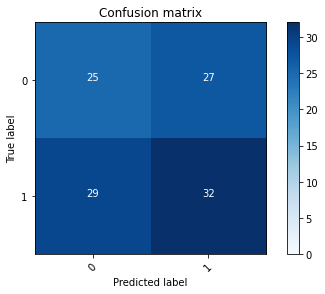

2022-08-22 14:29:51 - [Epoch Train: 47] loss: 0.2507, auc: 0.9718, acc: 0.9155, time: 24.00 s            
2022-08-22 14:29:51 - [Epoch Valid: 47] loss: 1.2393, auc: 0.4811, acc: 0.4876, time: 6.00 s


 47%|███████████████████▋                      | 47/100 [24:07<27:19, 30.94s/it]

2022-08-22 14:29:51 - EPOCH: 48
2022-08-22 14:29:51 - Train Step 10/485, train_loss: 0.3373
2022-08-22 14:29:52 - Train Step 20/485, train_loss: 0.2731
2022-08-22 14:29:52 - Train Step 30/485, train_loss: 0.2586
2022-08-22 14:29:53 - Train Step 40/485, train_loss: 0.2533
2022-08-22 14:29:53 - Train Step 50/485, train_loss: 0.2388
2022-08-22 14:29:54 - Train Step 60/485, train_loss: 0.2283
2022-08-22 14:29:54 - Train Step 70/485, train_loss: 0.2131
2022-08-22 14:29:55 - Train Step 80/485, train_loss: 0.2292
2022-08-22 14:29:55 - Train Step 90/485, train_loss: 0.2358
2022-08-22 14:29:56 - Train Step 100/485, train_loss: 0.2685
2022-08-22 14:29:56 - Train Step 110/485, train_loss: 0.2614
2022-08-22 14:29:57 - Train Step 120/485, train_loss: 0.2624
2022-08-22 14:29:57 - Train Step 130/485, train_loss: 0.2572
2022-08-22 14:29:58 - Train Step 140/485, train_loss: 0.2526
2022-08-22 14:29:58 - Train Step 150/485, train_loss: 0.2444
2022-08-22 14:29:59 - Train Step 160/485, train_loss: 0.2376
2

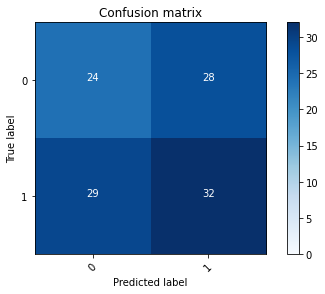

2022-08-22 14:30:22 - [Epoch Train: 48] loss: 0.2373, auc: 0.9765, acc: 0.9216, time: 24.00 s            
2022-08-22 14:30:22 - [Epoch Valid: 48] loss: 1.1910, auc: 0.4650, acc: 0.4793, time: 6.00 s


 48%|████████████████████▏                     | 48/100 [24:38<26:47, 30.90s/it]

2022-08-22 14:30:22 - EPOCH: 49
2022-08-22 14:30:22 - Train Step 10/485, train_loss: 0.1618
2022-08-22 14:30:23 - Train Step 20/485, train_loss: 0.1777
2022-08-22 14:30:23 - Train Step 30/485, train_loss: 0.2111
2022-08-22 14:30:24 - Train Step 40/485, train_loss: 0.1981
2022-08-22 14:30:24 - Train Step 50/485, train_loss: 0.1786
2022-08-22 14:30:25 - Train Step 60/485, train_loss: 0.1823
2022-08-22 14:30:25 - Train Step 70/485, train_loss: 0.1968
2022-08-22 14:30:26 - Train Step 80/485, train_loss: 0.1978
2022-08-22 14:30:26 - Train Step 90/485, train_loss: 0.2431
2022-08-22 14:30:27 - Train Step 100/485, train_loss: 0.2338
2022-08-22 14:30:27 - Train Step 110/485, train_loss: 0.2434
2022-08-22 14:30:28 - Train Step 120/485, train_loss: 0.2507
2022-08-22 14:30:28 - Train Step 130/485, train_loss: 0.2500
2022-08-22 14:30:29 - Train Step 140/485, train_loss: 0.2423
2022-08-22 14:30:29 - Train Step 150/485, train_loss: 0.2396
2022-08-22 14:30:30 - Train Step 160/485, train_loss: 0.2307
2

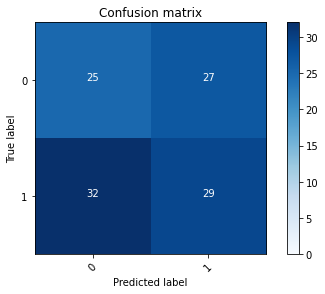

2022-08-22 14:30:53 - [Epoch Train: 49] loss: 0.2380, auc: 0.9753, acc: 0.9258, time: 24.00 s            
2022-08-22 14:30:53 - [Epoch Valid: 49] loss: 1.1959, auc: 0.4578, acc: 0.4628, time: 6.00 s


 49%|████████████████████▌                     | 49/100 [25:09<26:19, 30.97s/it]

2022-08-22 14:30:53 - EPOCH: 50
2022-08-22 14:30:53 - Train Step 10/485, train_loss: 0.1602
2022-08-22 14:30:54 - Train Step 20/485, train_loss: 0.2954
2022-08-22 14:30:54 - Train Step 30/485, train_loss: 0.2964
2022-08-22 14:30:55 - Train Step 40/485, train_loss: 0.2602
2022-08-22 14:30:55 - Train Step 50/485, train_loss: 0.2253
2022-08-22 14:30:56 - Train Step 60/485, train_loss: 0.2529
2022-08-22 14:30:56 - Train Step 70/485, train_loss: 0.2438
2022-08-22 14:30:57 - Train Step 80/485, train_loss: 0.2286
2022-08-22 14:30:57 - Train Step 90/485, train_loss: 0.2251
2022-08-22 14:30:58 - Train Step 100/485, train_loss: 0.2264
2022-08-22 14:30:58 - Train Step 110/485, train_loss: 0.2248
2022-08-22 14:30:59 - Train Step 120/485, train_loss: 0.2327
2022-08-22 14:30:59 - Train Step 130/485, train_loss: 0.2331
2022-08-22 14:31:00 - Train Step 140/485, train_loss: 0.2364
2022-08-22 14:31:00 - Train Step 150/485, train_loss: 0.2396
2022-08-22 14:31:01 - Train Step 160/485, train_loss: 0.2450
2

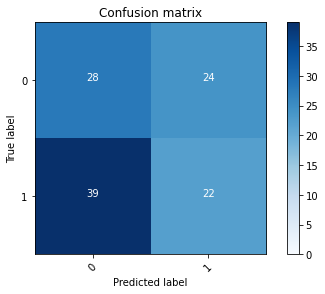

2022-08-22 14:31:24 - [Epoch Train: 50] loss: 0.2256, auc: 0.9826, acc: 0.9320, time: 24.00 s            
2022-08-22 14:31:24 - [Epoch Valid: 50] loss: 1.2826, auc: 0.4590, acc: 0.4380, time: 6.00 s


 50%|█████████████████████                     | 50/100 [25:40<25:49, 31.00s/it]

2022-08-22 14:31:24 - EPOCH: 51
2022-08-22 14:31:24 - Train Step 10/485, train_loss: 0.1795
2022-08-22 14:31:25 - Train Step 20/485, train_loss: 0.1649
2022-08-22 14:31:25 - Train Step 30/485, train_loss: 0.1721
2022-08-22 14:31:26 - Train Step 40/485, train_loss: 0.1728
2022-08-22 14:31:26 - Train Step 50/485, train_loss: 0.1767
2022-08-22 14:31:27 - Train Step 60/485, train_loss: 0.1800
2022-08-22 14:31:27 - Train Step 70/485, train_loss: 0.1766
2022-08-22 14:31:28 - Train Step 80/485, train_loss: 0.1899
2022-08-22 14:31:29 - Train Step 90/485, train_loss: 0.1806
2022-08-22 14:31:29 - Train Step 100/485, train_loss: 0.1837
2022-08-22 14:31:30 - Train Step 110/485, train_loss: 0.1856
2022-08-22 14:31:30 - Train Step 120/485, train_loss: 0.1895
2022-08-22 14:31:31 - Train Step 130/485, train_loss: 0.1826
2022-08-22 14:31:31 - Train Step 140/485, train_loss: 0.1763
2022-08-22 14:31:32 - Train Step 150/485, train_loss: 0.1929
2022-08-22 14:31:32 - Train Step 160/485, train_loss: 0.1901
2

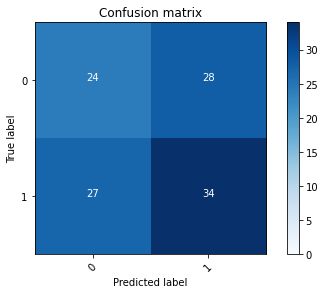

2022-08-22 14:31:55 - [Epoch Train: 51] loss: 0.2040, auc: 0.9840, acc: 0.9485, time: 24.00 s            
2022-08-22 14:31:55 - [Epoch Valid: 51] loss: 1.2735, auc: 0.4782, acc: 0.4959, time: 6.00 s


 51%|█████████████████████▍                    | 51/100 [26:11<25:17, 30.97s/it]

2022-08-22 14:31:55 - EPOCH: 52
2022-08-22 14:31:55 - Train Step 10/485, train_loss: 0.0900
2022-08-22 14:31:56 - Train Step 20/485, train_loss: 0.1355
2022-08-22 14:31:56 - Train Step 30/485, train_loss: 0.1298
2022-08-22 14:31:57 - Train Step 40/485, train_loss: 0.1526
2022-08-22 14:31:57 - Train Step 50/485, train_loss: 0.1581
2022-08-22 14:31:58 - Train Step 60/485, train_loss: 0.1791
2022-08-22 14:31:58 - Train Step 70/485, train_loss: 0.2121
2022-08-22 14:31:59 - Train Step 80/485, train_loss: 0.2104
2022-08-22 14:31:59 - Train Step 90/485, train_loss: 0.2085
2022-08-22 14:32:00 - Train Step 100/485, train_loss: 0.2114
2022-08-22 14:32:00 - Train Step 110/485, train_loss: 0.2073
2022-08-22 14:32:01 - Train Step 120/485, train_loss: 0.2092
2022-08-22 14:32:01 - Train Step 130/485, train_loss: 0.2163
2022-08-22 14:32:02 - Train Step 140/485, train_loss: 0.2258
2022-08-22 14:32:02 - Train Step 150/485, train_loss: 0.2245
2022-08-22 14:32:03 - Train Step 160/485, train_loss: 0.2238
2

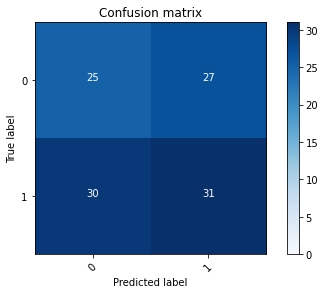

2022-08-22 14:32:26 - [Epoch Train: 52] loss: 0.2163, auc: 0.9825, acc: 0.9340, time: 24.00 s            
2022-08-22 14:32:26 - [Epoch Valid: 52] loss: 1.2690, auc: 0.4622, acc: 0.4793, time: 6.00 s


 52%|█████████████████████▊                    | 52/100 [26:43<24:50, 31.06s/it]

2022-08-22 14:32:26 - EPOCH: 53
2022-08-22 14:32:27 - Train Step 10/485, train_loss: 0.3070
2022-08-22 14:32:27 - Train Step 20/485, train_loss: 0.2883
2022-08-22 14:32:28 - Train Step 30/485, train_loss: 0.2569
2022-08-22 14:32:28 - Train Step 40/485, train_loss: 0.2225
2022-08-22 14:32:29 - Train Step 50/485, train_loss: 0.2160
2022-08-22 14:32:29 - Train Step 60/485, train_loss: 0.2162
2022-08-22 14:32:30 - Train Step 70/485, train_loss: 0.2250
2022-08-22 14:32:30 - Train Step 80/485, train_loss: 0.2309
2022-08-22 14:32:31 - Train Step 90/485, train_loss: 0.2190
2022-08-22 14:32:31 - Train Step 100/485, train_loss: 0.2204
2022-08-22 14:32:32 - Train Step 110/485, train_loss: 0.2200
2022-08-22 14:32:32 - Train Step 120/485, train_loss: 0.2126
2022-08-22 14:32:33 - Train Step 130/485, train_loss: 0.2220
2022-08-22 14:32:33 - Train Step 140/485, train_loss: 0.2219
2022-08-22 14:32:34 - Train Step 150/485, train_loss: 0.2165
2022-08-22 14:32:34 - Train Step 160/485, train_loss: 0.2091
2

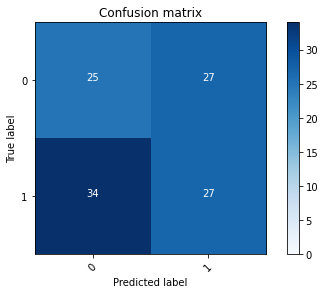

2022-08-22 14:32:57 - [Epoch Train: 53] loss: 0.2024, auc: 0.9852, acc: 0.9299, time: 24.00 s            
2022-08-22 14:32:57 - [Epoch Valid: 53] loss: 1.3643, auc: 0.4656, acc: 0.4463, time: 6.00 s


 53%|██████████████████████▎                   | 53/100 [27:13<24:16, 31.00s/it]

2022-08-22 14:32:57 - EPOCH: 54
2022-08-22 14:32:58 - Train Step 10/485, train_loss: 0.2101
2022-08-22 14:32:58 - Train Step 20/485, train_loss: 0.1774
2022-08-22 14:32:59 - Train Step 30/485, train_loss: 0.1753
2022-08-22 14:32:59 - Train Step 40/485, train_loss: 0.1927
2022-08-22 14:33:00 - Train Step 50/485, train_loss: 0.1763
2022-08-22 14:33:00 - Train Step 60/485, train_loss: 0.1835
2022-08-22 14:33:01 - Train Step 70/485, train_loss: 0.1792
2022-08-22 14:33:01 - Train Step 80/485, train_loss: 0.1677
2022-08-22 14:33:02 - Train Step 90/485, train_loss: 0.1693
2022-08-22 14:33:02 - Train Step 100/485, train_loss: 0.1750
2022-08-22 14:33:03 - Train Step 110/485, train_loss: 0.1949
2022-08-22 14:33:03 - Train Step 120/485, train_loss: 0.1871
2022-08-22 14:33:04 - Train Step 130/485, train_loss: 0.1817
2022-08-22 14:33:04 - Train Step 140/485, train_loss: 0.1776
2022-08-22 14:33:05 - Train Step 150/485, train_loss: 0.1857
2022-08-22 14:33:05 - Train Step 160/485, train_loss: 0.1965
2

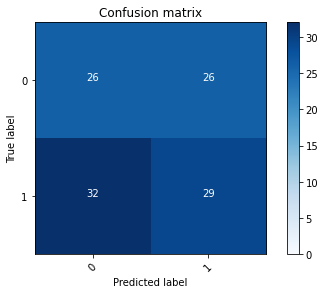

2022-08-22 14:33:28 - [Epoch Train: 54] loss: 0.1807, auc: 0.9904, acc: 0.9588, time: 24.00 s            
2022-08-22 14:33:28 - [Epoch Valid: 54] loss: 1.3577, auc: 0.4650, acc: 0.4711, time: 6.00 s


 54%|██████████████████████▋                   | 54/100 [27:45<23:47, 31.04s/it]

2022-08-22 14:33:28 - EPOCH: 55
2022-08-22 14:33:29 - Train Step 10/485, train_loss: 0.2134
2022-08-22 14:33:29 - Train Step 20/485, train_loss: 0.1485
2022-08-22 14:33:30 - Train Step 30/485, train_loss: 0.1619
2022-08-22 14:33:30 - Train Step 40/485, train_loss: 0.1448
2022-08-22 14:33:31 - Train Step 50/485, train_loss: 0.1707
2022-08-22 14:33:31 - Train Step 60/485, train_loss: 0.1595
2022-08-22 14:33:32 - Train Step 70/485, train_loss: 0.1565
2022-08-22 14:33:32 - Train Step 80/485, train_loss: 0.1613
2022-08-22 14:33:33 - Train Step 90/485, train_loss: 0.1533
2022-08-22 14:33:33 - Train Step 100/485, train_loss: 0.1580
2022-08-22 14:33:34 - Train Step 110/485, train_loss: 0.1587
2022-08-22 14:33:34 - Train Step 120/485, train_loss: 0.1558
2022-08-22 14:33:35 - Train Step 130/485, train_loss: 0.1501
2022-08-22 14:33:35 - Train Step 140/485, train_loss: 0.1569
2022-08-22 14:33:36 - Train Step 150/485, train_loss: 0.1583
2022-08-22 14:33:36 - Train Step 160/485, train_loss: 0.1733
2

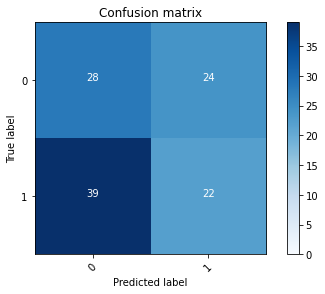

2022-08-22 14:33:59 - [Epoch Train: 55] loss: 0.1892, auc: 0.9861, acc: 0.9402, time: 24.00 s            
2022-08-22 14:33:59 - [Epoch Valid: 55] loss: 1.3801, auc: 0.4562, acc: 0.4298, time: 6.00 s


 55%|███████████████████████                   | 55/100 [28:15<23:14, 31.00s/it]

2022-08-22 14:33:59 - EPOCH: 56
2022-08-22 14:34:00 - Train Step 10/485, train_loss: 0.2679
2022-08-22 14:34:00 - Train Step 20/485, train_loss: 0.2571
2022-08-22 14:34:00 - Train Step 30/485, train_loss: 0.2284
2022-08-22 14:34:01 - Train Step 40/485, train_loss: 0.2277
2022-08-22 14:34:01 - Train Step 50/485, train_loss: 0.2136
2022-08-22 14:34:02 - Train Step 60/485, train_loss: 0.2127
2022-08-22 14:34:02 - Train Step 70/485, train_loss: 0.1924
2022-08-22 14:34:03 - Train Step 80/485, train_loss: 0.2155
2022-08-22 14:34:03 - Train Step 90/485, train_loss: 0.2065
2022-08-22 14:34:04 - Train Step 100/485, train_loss: 0.2084
2022-08-22 14:34:05 - Train Step 110/485, train_loss: 0.1983
2022-08-22 14:34:05 - Train Step 120/485, train_loss: 0.1992
2022-08-22 14:34:06 - Train Step 130/485, train_loss: 0.2114
2022-08-22 14:34:06 - Train Step 140/485, train_loss: 0.2074
2022-08-22 14:34:07 - Train Step 150/485, train_loss: 0.2083
2022-08-22 14:34:07 - Train Step 160/485, train_loss: 0.2061
2

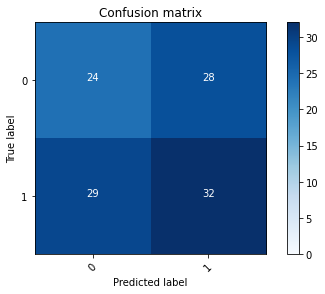

2022-08-22 14:34:30 - [Epoch Train: 56] loss: 0.1816, auc: 0.9897, acc: 0.9443, time: 24.00 s            
2022-08-22 14:34:30 - [Epoch Valid: 56] loss: 1.4035, auc: 0.4713, acc: 0.4793, time: 6.00 s


 56%|███████████████████████▌                  | 56/100 [28:47<22:44, 31.01s/it]

2022-08-22 14:34:30 - EPOCH: 57
2022-08-22 14:34:31 - Train Step 10/485, train_loss: 0.0777
2022-08-22 14:34:31 - Train Step 20/485, train_loss: 0.1263
2022-08-22 14:34:32 - Train Step 30/485, train_loss: 0.1058
2022-08-22 14:34:32 - Train Step 40/485, train_loss: 0.1072
2022-08-22 14:34:33 - Train Step 50/485, train_loss: 0.1064
2022-08-22 14:34:33 - Train Step 60/485, train_loss: 0.1143
2022-08-22 14:34:34 - Train Step 70/485, train_loss: 0.1321
2022-08-22 14:34:34 - Train Step 80/485, train_loss: 0.1381
2022-08-22 14:34:35 - Train Step 90/485, train_loss: 0.1314
2022-08-22 14:34:35 - Train Step 100/485, train_loss: 0.1233
2022-08-22 14:34:36 - Train Step 110/485, train_loss: 0.1266
2022-08-22 14:34:36 - Train Step 120/485, train_loss: 0.1330
2022-08-22 14:34:37 - Train Step 130/485, train_loss: 0.1356
2022-08-22 14:34:37 - Train Step 140/485, train_loss: 0.1335
2022-08-22 14:34:38 - Train Step 150/485, train_loss: 0.1334
2022-08-22 14:34:38 - Train Step 160/485, train_loss: 0.1342
2

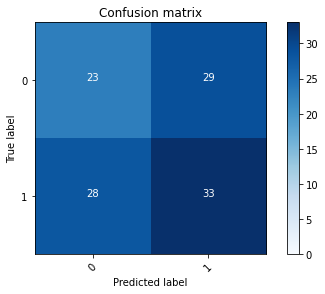

2022-08-22 14:35:01 - [Epoch Train: 57] loss: 0.1679, auc: 0.9904, acc: 0.9567, time: 24.00 s            
2022-08-22 14:35:01 - [Epoch Valid: 57] loss: 1.4116, auc: 0.4660, acc: 0.4793, time: 6.00 s


 57%|███████████████████████▉                  | 57/100 [29:18<22:13, 31.00s/it]

2022-08-22 14:35:01 - EPOCH: 58
2022-08-22 14:35:02 - Train Step 10/485, train_loss: 0.1807
2022-08-22 14:35:02 - Train Step 20/485, train_loss: 0.1296
2022-08-22 14:35:03 - Train Step 30/485, train_loss: 0.1413
2022-08-22 14:35:03 - Train Step 40/485, train_loss: 0.1278
2022-08-22 14:35:04 - Train Step 50/485, train_loss: 0.1126
2022-08-22 14:35:04 - Train Step 60/485, train_loss: 0.1481
2022-08-22 14:35:05 - Train Step 70/485, train_loss: 0.1542
2022-08-22 14:35:05 - Train Step 80/485, train_loss: 0.1509
2022-08-22 14:35:06 - Train Step 90/485, train_loss: 0.1546
2022-08-22 14:35:06 - Train Step 100/485, train_loss: 0.1578
2022-08-22 14:35:06 - Train Step 110/485, train_loss: 0.1506
2022-08-22 14:35:07 - Train Step 120/485, train_loss: 0.1420
2022-08-22 14:35:08 - Train Step 130/485, train_loss: 0.1390
2022-08-22 14:35:08 - Train Step 140/485, train_loss: 0.1395
2022-08-22 14:35:08 - Train Step 150/485, train_loss: 0.1419
2022-08-22 14:35:09 - Train Step 160/485, train_loss: 0.1371
2

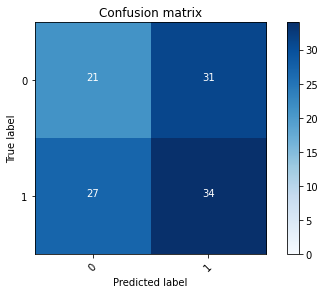

2022-08-22 14:35:32 - [Epoch Train: 58] loss: 0.1422, auc: 0.9941, acc: 0.9670, time: 24.00 s            
2022-08-22 14:35:32 - [Epoch Valid: 58] loss: 1.3715, auc: 0.4593, acc: 0.4711, time: 6.00 s


 58%|████████████████████████▎                 | 58/100 [29:49<21:42, 31.00s/it]

2022-08-22 14:35:32 - EPOCH: 59
2022-08-22 14:35:33 - Train Step 10/485, train_loss: 0.0965
2022-08-22 14:35:33 - Train Step 20/485, train_loss: 0.1024
2022-08-22 14:35:34 - Train Step 30/485, train_loss: 0.1441
2022-08-22 14:35:34 - Train Step 40/485, train_loss: 0.1310
2022-08-22 14:35:35 - Train Step 50/485, train_loss: 0.1405
2022-08-22 14:35:35 - Train Step 60/485, train_loss: 0.1332
2022-08-22 14:35:36 - Train Step 70/485, train_loss: 0.1364
2022-08-22 14:35:36 - Train Step 80/485, train_loss: 0.1340
2022-08-22 14:35:37 - Train Step 90/485, train_loss: 0.1502
2022-08-22 14:35:37 - Train Step 100/485, train_loss: 0.1474
2022-08-22 14:35:38 - Train Step 110/485, train_loss: 0.1499
2022-08-22 14:35:38 - Train Step 120/485, train_loss: 0.1508
2022-08-22 14:35:39 - Train Step 130/485, train_loss: 0.1435
2022-08-22 14:35:39 - Train Step 140/485, train_loss: 0.1457
2022-08-22 14:35:40 - Train Step 150/485, train_loss: 0.1479
2022-08-22 14:35:40 - Train Step 160/485, train_loss: 0.1447
2

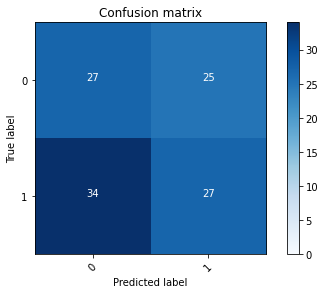

2022-08-22 14:36:03 - [Epoch Train: 59] loss: 0.1535, auc: 0.9922, acc: 0.9526, time: 24.00 s            
2022-08-22 14:36:03 - [Epoch Valid: 59] loss: 1.4887, auc: 0.4719, acc: 0.4711, time: 6.00 s


 59%|████████████████████████▊                 | 59/100 [30:19<21:09, 30.96s/it]

2022-08-22 14:36:03 - EPOCH: 60
2022-08-22 14:36:03 - Train Step 10/485, train_loss: 0.1582
2022-08-22 14:36:04 - Train Step 20/485, train_loss: 0.1007
2022-08-22 14:36:04 - Train Step 30/485, train_loss: 0.1465
2022-08-22 14:36:05 - Train Step 40/485, train_loss: 0.1366
2022-08-22 14:36:05 - Train Step 50/485, train_loss: 0.1623
2022-08-22 14:36:06 - Train Step 60/485, train_loss: 0.1436
2022-08-22 14:36:06 - Train Step 70/485, train_loss: 0.1313
2022-08-22 14:36:07 - Train Step 80/485, train_loss: 0.1288
2022-08-22 14:36:07 - Train Step 90/485, train_loss: 0.1230
2022-08-22 14:36:08 - Train Step 100/485, train_loss: 0.1259
2022-08-22 14:36:08 - Train Step 110/485, train_loss: 0.1340
2022-08-22 14:36:09 - Train Step 120/485, train_loss: 0.1361
2022-08-22 14:36:09 - Train Step 130/485, train_loss: 0.1389
2022-08-22 14:36:10 - Train Step 140/485, train_loss: 0.1449
2022-08-22 14:36:10 - Train Step 150/485, train_loss: 0.1411
2022-08-22 14:36:11 - Train Step 160/485, train_loss: 0.1391
2

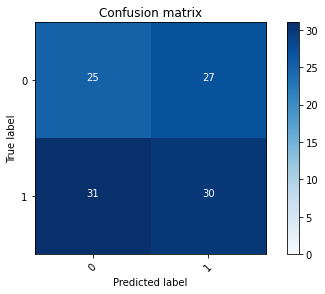

2022-08-22 14:36:34 - [Epoch Train: 60] loss: 0.1405, auc: 0.9951, acc: 0.9649, time: 24.00 s            
2022-08-22 14:36:34 - [Epoch Valid: 60] loss: 1.5741, auc: 0.4694, acc: 0.4711, time: 6.00 s


 60%|█████████████████████████▏                | 60/100 [30:50<20:37, 30.93s/it]

2022-08-22 14:36:34 - EPOCH: 61
2022-08-22 14:36:34 - Train Step 10/485, train_loss: 0.1462
2022-08-22 14:36:35 - Train Step 20/485, train_loss: 0.1736
2022-08-22 14:36:35 - Train Step 30/485, train_loss: 0.1559
2022-08-22 14:36:36 - Train Step 40/485, train_loss: 0.1546
2022-08-22 14:36:36 - Train Step 50/485, train_loss: 0.1406
2022-08-22 14:36:37 - Train Step 60/485, train_loss: 0.1592
2022-08-22 14:36:37 - Train Step 70/485, train_loss: 0.1509
2022-08-22 14:36:38 - Train Step 80/485, train_loss: 0.1442
2022-08-22 14:36:38 - Train Step 90/485, train_loss: 0.1333
2022-08-22 14:36:39 - Train Step 100/485, train_loss: 0.1423
2022-08-22 14:36:39 - Train Step 110/485, train_loss: 0.1413
2022-08-22 14:36:40 - Train Step 120/485, train_loss: 0.1459
2022-08-22 14:36:40 - Train Step 130/485, train_loss: 0.1445
2022-08-22 14:36:41 - Train Step 140/485, train_loss: 0.1405
2022-08-22 14:36:41 - Train Step 150/485, train_loss: 0.1389
2022-08-22 14:36:42 - Train Step 160/485, train_loss: 0.1352
2

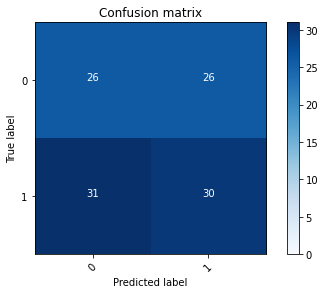

2022-08-22 14:37:04 - [Epoch Train: 61] loss: 0.1371, auc: 0.9953, acc: 0.9773, time: 24.00 s            
2022-08-22 14:37:04 - [Epoch Valid: 61] loss: 1.5519, auc: 0.4732, acc: 0.4793, time: 6.00 s


 61%|█████████████████████████▌                | 61/100 [31:21<20:04, 30.89s/it]

2022-08-22 14:37:04 - EPOCH: 62
2022-08-22 14:37:05 - Train Step 10/485, train_loss: 0.0790
2022-08-22 14:37:06 - Train Step 20/485, train_loss: 0.0955
2022-08-22 14:37:06 - Train Step 30/485, train_loss: 0.0932
2022-08-22 14:37:07 - Train Step 40/485, train_loss: 0.1202
2022-08-22 14:37:07 - Train Step 50/485, train_loss: 0.1511
2022-08-22 14:37:08 - Train Step 60/485, train_loss: 0.1353
2022-08-22 14:37:08 - Train Step 70/485, train_loss: 0.1343
2022-08-22 14:37:09 - Train Step 80/485, train_loss: 0.1251
2022-08-22 14:37:09 - Train Step 90/485, train_loss: 0.1156
2022-08-22 14:37:10 - Train Step 100/485, train_loss: 0.1534
2022-08-22 14:37:10 - Train Step 110/485, train_loss: 0.1543
2022-08-22 14:37:11 - Train Step 120/485, train_loss: 0.1479
2022-08-22 14:37:11 - Train Step 130/485, train_loss: 0.1444
2022-08-22 14:37:12 - Train Step 140/485, train_loss: 0.1407
2022-08-22 14:37:12 - Train Step 150/485, train_loss: 0.1374
2022-08-22 14:37:13 - Train Step 160/485, train_loss: 0.1391
2

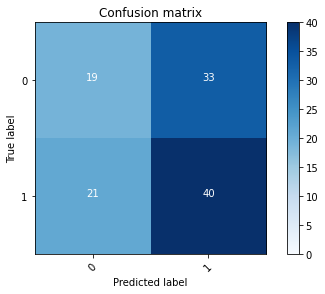

2022-08-22 14:37:36 - [Epoch Train: 62] loss: 0.1322, auc: 0.9937, acc: 0.9670, time: 24.00 s            
2022-08-22 14:37:36 - [Epoch Valid: 62] loss: 1.6328, auc: 0.4909, acc: 0.5041, time: 6.00 s


 62%|██████████████████████████                | 62/100 [31:52<19:37, 30.98s/it]

2022-08-22 14:37:36 - EPOCH: 63
2022-08-22 14:37:36 - Train Step 10/485, train_loss: 0.0510
2022-08-22 14:37:37 - Train Step 20/485, train_loss: 0.0565
2022-08-22 14:37:37 - Train Step 30/485, train_loss: 0.0608
2022-08-22 14:37:38 - Train Step 40/485, train_loss: 0.0720
2022-08-22 14:37:38 - Train Step 50/485, train_loss: 0.0940
2022-08-22 14:37:39 - Train Step 60/485, train_loss: 0.1150
2022-08-22 14:37:39 - Train Step 70/485, train_loss: 0.1162
2022-08-22 14:37:40 - Train Step 80/485, train_loss: 0.1210
2022-08-22 14:37:40 - Train Step 90/485, train_loss: 0.1226
2022-08-22 14:37:41 - Train Step 100/485, train_loss: 0.1153
2022-08-22 14:37:41 - Train Step 110/485, train_loss: 0.1142
2022-08-22 14:37:42 - Train Step 120/485, train_loss: 0.1169
2022-08-22 14:37:42 - Train Step 130/485, train_loss: 0.1152
2022-08-22 14:37:43 - Train Step 140/485, train_loss: 0.1126
2022-08-22 14:37:43 - Train Step 150/485, train_loss: 0.1133
2022-08-22 14:37:44 - Train Step 160/485, train_loss: 0.1139
2

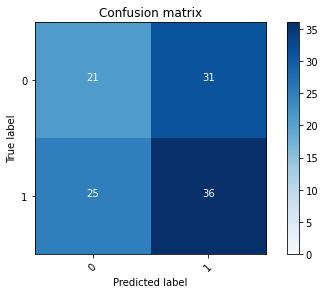

2022-08-22 14:38:07 - [Epoch Train: 63] loss: 0.1206, auc: 0.9958, acc: 0.9711, time: 24.00 s            
2022-08-22 14:38:07 - [Epoch Valid: 63] loss: 1.6245, auc: 0.4682, acc: 0.4876, time: 6.00 s


 63%|██████████████████████████▍               | 63/100 [32:23<19:07, 31.01s/it]

2022-08-22 14:38:07 - EPOCH: 64
2022-08-22 14:38:07 - Train Step 10/485, train_loss: 0.1731
2022-08-22 14:38:08 - Train Step 20/485, train_loss: 0.1508
2022-08-22 14:38:08 - Train Step 30/485, train_loss: 0.1236
2022-08-22 14:38:09 - Train Step 40/485, train_loss: 0.1336
2022-08-22 14:38:09 - Train Step 50/485, train_loss: 0.1211
2022-08-22 14:38:10 - Train Step 60/485, train_loss: 0.1270
2022-08-22 14:38:10 - Train Step 70/485, train_loss: 0.1349
2022-08-22 14:38:11 - Train Step 80/485, train_loss: 0.1247
2022-08-22 14:38:11 - Train Step 90/485, train_loss: 0.1225
2022-08-22 14:38:12 - Train Step 100/485, train_loss: 0.1159
2022-08-22 14:38:12 - Train Step 110/485, train_loss: 0.1195
2022-08-22 14:38:13 - Train Step 120/485, train_loss: 0.1282
2022-08-22 14:38:13 - Train Step 130/485, train_loss: 0.1294
2022-08-22 14:38:14 - Train Step 140/485, train_loss: 0.1529
2022-08-22 14:38:14 - Train Step 150/485, train_loss: 0.1476
2022-08-22 14:38:15 - Train Step 160/485, train_loss: 0.1499
2

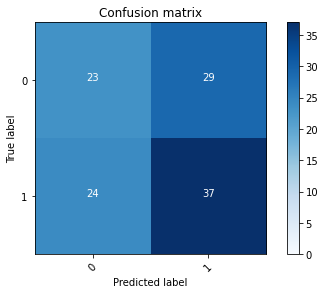

2022-08-22 14:38:37 - [Epoch Train: 64] loss: 0.1318, auc: 0.9946, acc: 0.9691, time: 24.00 s            
2022-08-22 14:38:37 - [Epoch Valid: 64] loss: 1.6989, auc: 0.4811, acc: 0.5124, time: 6.00 s


 64%|██████████████████████████▉               | 64/100 [32:54<18:34, 30.95s/it]

2022-08-22 14:38:37 - EPOCH: 65
2022-08-22 14:38:38 - Train Step 10/485, train_loss: 0.1144
2022-08-22 14:38:39 - Train Step 20/485, train_loss: 0.1134
2022-08-22 14:38:39 - Train Step 30/485, train_loss: 0.1426
2022-08-22 14:38:40 - Train Step 40/485, train_loss: 0.1101
2022-08-22 14:38:40 - Train Step 50/485, train_loss: 0.1132
2022-08-22 14:38:41 - Train Step 60/485, train_loss: 0.1398
2022-08-22 14:38:41 - Train Step 70/485, train_loss: 0.1329
2022-08-22 14:38:42 - Train Step 80/485, train_loss: 0.1310
2022-08-22 14:38:42 - Train Step 90/485, train_loss: 0.1461
2022-08-22 14:38:43 - Train Step 100/485, train_loss: 0.1397
2022-08-22 14:38:43 - Train Step 110/485, train_loss: 0.1348
2022-08-22 14:38:44 - Train Step 120/485, train_loss: 0.1295
2022-08-22 14:38:44 - Train Step 130/485, train_loss: 0.1373
2022-08-22 14:38:45 - Train Step 140/485, train_loss: 0.1322
2022-08-22 14:38:45 - Train Step 150/485, train_loss: 0.1263
2022-08-22 14:38:46 - Train Step 160/485, train_loss: 0.1260
2

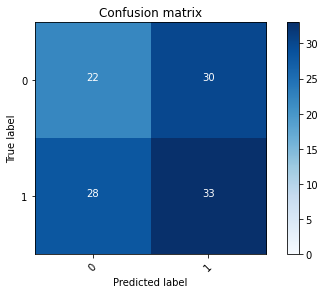

2022-08-22 14:39:08 - [Epoch Train: 65] loss: 0.1153, auc: 0.9962, acc: 0.9814, time: 24.00 s            
2022-08-22 14:39:08 - [Epoch Valid: 65] loss: 1.7046, auc: 0.4641, acc: 0.4711, time: 6.00 s


 65%|███████████████████████████▎              | 65/100 [33:25<17:59, 30.85s/it]

2022-08-22 14:39:08 - EPOCH: 66
2022-08-22 14:39:09 - Train Step 10/485, train_loss: 0.1017
2022-08-22 14:39:09 - Train Step 20/485, train_loss: 0.0729
2022-08-22 14:39:10 - Train Step 30/485, train_loss: 0.0616
2022-08-22 14:39:10 - Train Step 40/485, train_loss: 0.0953
2022-08-22 14:39:11 - Train Step 50/485, train_loss: 0.0850
2022-08-22 14:39:11 - Train Step 60/485, train_loss: 0.0922
2022-08-22 14:39:12 - Train Step 70/485, train_loss: 0.0884
2022-08-22 14:39:12 - Train Step 80/485, train_loss: 0.0986
2022-08-22 14:39:13 - Train Step 90/485, train_loss: 0.0909
2022-08-22 14:39:13 - Train Step 100/485, train_loss: 0.0875
2022-08-22 14:39:14 - Train Step 110/485, train_loss: 0.0887
2022-08-22 14:39:14 - Train Step 120/485, train_loss: 0.0877
2022-08-22 14:39:15 - Train Step 130/485, train_loss: 0.0849
2022-08-22 14:39:15 - Train Step 140/485, train_loss: 0.0858
2022-08-22 14:39:16 - Train Step 150/485, train_loss: 0.0899
2022-08-22 14:39:16 - Train Step 160/485, train_loss: 0.0899
2

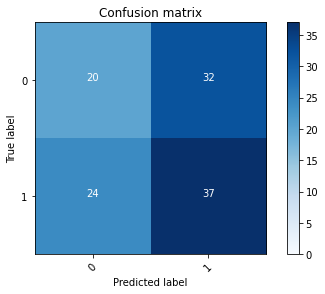

2022-08-22 14:39:39 - [Epoch Train: 66] loss: 0.0991, auc: 0.9981, acc: 0.9794, time: 24.00 s            
2022-08-22 14:39:39 - [Epoch Valid: 66] loss: 1.7369, auc: 0.4776, acc: 0.4876, time: 6.00 s


 66%|███████████████████████████▋              | 66/100 [33:56<17:30, 30.89s/it]

2022-08-22 14:39:39 - EPOCH: 67
2022-08-22 14:39:40 - Train Step 10/485, train_loss: 0.0579
2022-08-22 14:39:40 - Train Step 20/485, train_loss: 0.0424
2022-08-22 14:39:41 - Train Step 30/485, train_loss: 0.0348
2022-08-22 14:39:41 - Train Step 40/485, train_loss: 0.0574
2022-08-22 14:39:42 - Train Step 50/485, train_loss: 0.0548
2022-08-22 14:39:42 - Train Step 60/485, train_loss: 0.0561
2022-08-22 14:39:43 - Train Step 70/485, train_loss: 0.0590
2022-08-22 14:39:43 - Train Step 80/485, train_loss: 0.0740
2022-08-22 14:39:44 - Train Step 90/485, train_loss: 0.0725
2022-08-22 14:39:44 - Train Step 100/485, train_loss: 0.0697
2022-08-22 14:39:45 - Train Step 110/485, train_loss: 0.0719
2022-08-22 14:39:45 - Train Step 120/485, train_loss: 0.0759
2022-08-22 14:39:46 - Train Step 130/485, train_loss: 0.0756
2022-08-22 14:39:46 - Train Step 140/485, train_loss: 0.0825
2022-08-22 14:39:47 - Train Step 150/485, train_loss: 0.0787
2022-08-22 14:39:47 - Train Step 160/485, train_loss: 0.0748
2

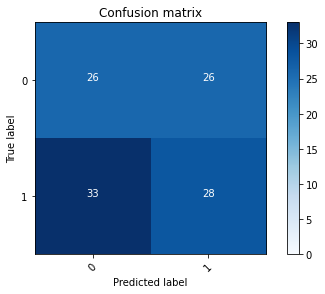

2022-08-22 14:40:10 - [Epoch Train: 67] loss: 0.0980, auc: 0.9985, acc: 0.9794, time: 24.00 s            
2022-08-22 14:40:10 - [Epoch Valid: 67] loss: 1.6607, auc: 0.4666, acc: 0.4628, time: 6.00 s


 67%|████████████████████████████▏             | 67/100 [34:26<16:55, 30.79s/it]

2022-08-22 14:40:10 - EPOCH: 68
2022-08-22 14:40:10 - Train Step 10/485, train_loss: 0.1395
2022-08-22 14:40:11 - Train Step 20/485, train_loss: 0.0958
2022-08-22 14:40:11 - Train Step 30/485, train_loss: 0.1373
2022-08-22 14:40:12 - Train Step 40/485, train_loss: 0.1135
2022-08-22 14:40:12 - Train Step 50/485, train_loss: 0.1165
2022-08-22 14:40:13 - Train Step 60/485, train_loss: 0.1058
2022-08-22 14:40:13 - Train Step 70/485, train_loss: 0.1106
2022-08-22 14:40:14 - Train Step 80/485, train_loss: 0.1025
2022-08-22 14:40:14 - Train Step 90/485, train_loss: 0.0982
2022-08-22 14:40:15 - Train Step 100/485, train_loss: 0.0954
2022-08-22 14:40:15 - Train Step 110/485, train_loss: 0.0958
2022-08-22 14:40:16 - Train Step 120/485, train_loss: 0.0964
2022-08-22 14:40:16 - Train Step 130/485, train_loss: 0.0970
2022-08-22 14:40:17 - Train Step 140/485, train_loss: 0.0986
2022-08-22 14:40:17 - Train Step 150/485, train_loss: 0.0992
2022-08-22 14:40:18 - Train Step 160/485, train_loss: 0.0996
2

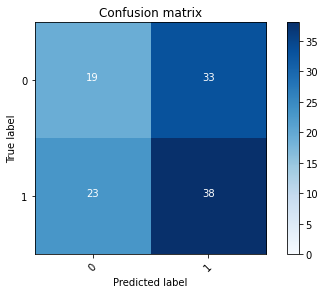

2022-08-22 14:40:41 - [Epoch Train: 68] loss: 0.0976, auc: 0.9986, acc: 0.9753, time: 24.00 s            
2022-08-22 14:40:41 - [Epoch Valid: 68] loss: 1.7659, auc: 0.4801, acc: 0.4876, time: 6.00 s


 68%|████████████████████████████▌             | 68/100 [34:57<16:26, 30.83s/it]

2022-08-22 14:40:41 - EPOCH: 69
2022-08-22 14:40:41 - Train Step 10/485, train_loss: 0.1157
2022-08-22 14:40:42 - Train Step 20/485, train_loss: 0.1302
2022-08-22 14:40:42 - Train Step 30/485, train_loss: 0.1235
2022-08-22 14:40:43 - Train Step 40/485, train_loss: 0.1183
2022-08-22 14:40:43 - Train Step 50/485, train_loss: 0.1069
2022-08-22 14:40:44 - Train Step 60/485, train_loss: 0.1023
2022-08-22 14:40:44 - Train Step 70/485, train_loss: 0.1096
2022-08-22 14:40:45 - Train Step 80/485, train_loss: 0.0970
2022-08-22 14:40:45 - Train Step 90/485, train_loss: 0.0902
2022-08-22 14:40:46 - Train Step 100/485, train_loss: 0.0867
2022-08-22 14:40:46 - Train Step 110/485, train_loss: 0.0834
2022-08-22 14:40:47 - Train Step 120/485, train_loss: 0.0789
2022-08-22 14:40:47 - Train Step 130/485, train_loss: 0.0869
2022-08-22 14:40:48 - Train Step 140/485, train_loss: 0.0948
2022-08-22 14:40:48 - Train Step 150/485, train_loss: 0.0949
2022-08-22 14:40:49 - Train Step 160/485, train_loss: 0.0931
2

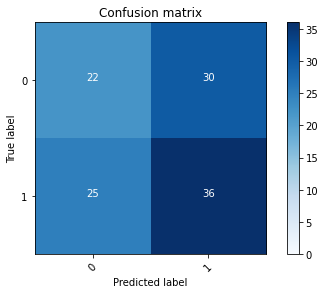

2022-08-22 14:41:11 - [Epoch Train: 69] loss: 0.1040, auc: 0.9967, acc: 0.9649, time: 24.00 s            
2022-08-22 14:41:11 - [Epoch Valid: 69] loss: 1.8677, auc: 0.4801, acc: 0.4959, time: 6.00 s


 69%|████████████████████████████▉             | 69/100 [35:28<15:55, 30.84s/it]

2022-08-22 14:41:11 - EPOCH: 70
2022-08-22 14:41:12 - Train Step 10/485, train_loss: 0.0555
2022-08-22 14:41:13 - Train Step 20/485, train_loss: 0.0517
2022-08-22 14:41:13 - Train Step 30/485, train_loss: 0.0507
2022-08-22 14:41:14 - Train Step 40/485, train_loss: 0.0578
2022-08-22 14:41:14 - Train Step 50/485, train_loss: 0.0757
2022-08-22 14:41:15 - Train Step 60/485, train_loss: 0.0696
2022-08-22 14:41:15 - Train Step 70/485, train_loss: 0.0800
2022-08-22 14:41:16 - Train Step 80/485, train_loss: 0.0870
2022-08-22 14:41:16 - Train Step 90/485, train_loss: 0.0865
2022-08-22 14:41:17 - Train Step 100/485, train_loss: 0.0851
2022-08-22 14:41:17 - Train Step 110/485, train_loss: 0.0841
2022-08-22 14:41:18 - Train Step 120/485, train_loss: 0.0866
2022-08-22 14:41:18 - Train Step 130/485, train_loss: 0.0825
2022-08-22 14:41:19 - Train Step 140/485, train_loss: 0.0863
2022-08-22 14:41:19 - Train Step 150/485, train_loss: 0.0834
2022-08-22 14:41:20 - Train Step 160/485, train_loss: 0.0802
2

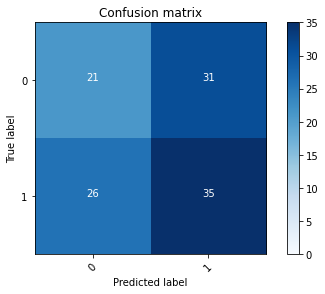

2022-08-22 14:41:42 - [Epoch Train: 70] loss: 0.0878, auc: 0.9978, acc: 0.9794, time: 24.00 s            
2022-08-22 14:41:42 - [Epoch Valid: 70] loss: 1.8859, auc: 0.4644, acc: 0.4793, time: 6.00 s


 70%|█████████████████████████████▍            | 70/100 [35:59<15:25, 30.85s/it]

2022-08-22 14:41:42 - EPOCH: 71
2022-08-22 14:41:43 - Train Step 10/485, train_loss: 0.0585
2022-08-22 14:41:43 - Train Step 20/485, train_loss: 0.0490
2022-08-22 14:41:44 - Train Step 30/485, train_loss: 0.0685
2022-08-22 14:41:44 - Train Step 40/485, train_loss: 0.0645
2022-08-22 14:41:45 - Train Step 50/485, train_loss: 0.0734
2022-08-22 14:41:45 - Train Step 60/485, train_loss: 0.0686
2022-08-22 14:41:46 - Train Step 70/485, train_loss: 0.0679
2022-08-22 14:41:46 - Train Step 80/485, train_loss: 0.0653
2022-08-22 14:41:47 - Train Step 90/485, train_loss: 0.0605
2022-08-22 14:41:47 - Train Step 100/485, train_loss: 0.0687
2022-08-22 14:41:48 - Train Step 110/485, train_loss: 0.0684
2022-08-22 14:41:48 - Train Step 120/485, train_loss: 0.0675
2022-08-22 14:41:49 - Train Step 130/485, train_loss: 0.0684
2022-08-22 14:41:49 - Train Step 140/485, train_loss: 0.0677
2022-08-22 14:41:50 - Train Step 150/485, train_loss: 0.0684
2022-08-22 14:41:50 - Train Step 160/485, train_loss: 0.0664
2

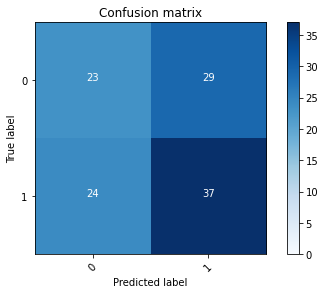

2022-08-22 14:42:13 - [Epoch Train: 71] loss: 0.0835, auc: 0.9975, acc: 0.9897, time: 24.00 s            
2022-08-22 14:42:13 - [Epoch Valid: 71] loss: 1.8813, auc: 0.4905, acc: 0.5124, time: 6.00 s


 71%|█████████████████████████████▊            | 71/100 [36:30<14:54, 30.86s/it]

2022-08-22 14:42:13 - EPOCH: 72
2022-08-22 14:42:14 - Train Step 10/485, train_loss: 0.0392
2022-08-22 14:42:14 - Train Step 20/485, train_loss: 0.0305
2022-08-22 14:42:15 - Train Step 30/485, train_loss: 0.0316
2022-08-22 14:42:15 - Train Step 40/485, train_loss: 0.0365
2022-08-22 14:42:16 - Train Step 50/485, train_loss: 0.0424
2022-08-22 14:42:16 - Train Step 60/485, train_loss: 0.0465
2022-08-22 14:42:17 - Train Step 70/485, train_loss: 0.0415
2022-08-22 14:42:17 - Train Step 80/485, train_loss: 0.0476
2022-08-22 14:42:18 - Train Step 90/485, train_loss: 0.0454
2022-08-22 14:42:18 - Train Step 100/485, train_loss: 0.0476
2022-08-22 14:42:19 - Train Step 110/485, train_loss: 0.0509
2022-08-22 14:42:19 - Train Step 120/485, train_loss: 0.0518
2022-08-22 14:42:20 - Train Step 130/485, train_loss: 0.0523
2022-08-22 14:42:20 - Train Step 140/485, train_loss: 0.0585
2022-08-22 14:42:21 - Train Step 150/485, train_loss: 0.0586
2022-08-22 14:42:21 - Train Step 160/485, train_loss: 0.0557
2

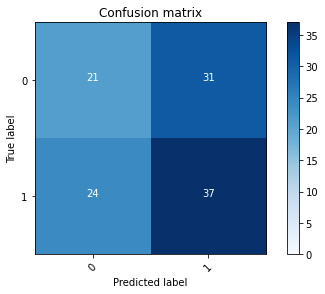

2022-08-22 14:42:44 - [Epoch Train: 72] loss: 0.0802, auc: 0.9973, acc: 0.9897, time: 24.00 s            
2022-08-22 14:42:44 - [Epoch Valid: 72] loss: 1.7790, auc: 0.4735, acc: 0.4959, time: 6.00 s


 72%|██████████████████████████████▏           | 72/100 [37:01<14:24, 30.87s/it]

2022-08-22 14:42:44 - EPOCH: 73
2022-08-22 14:42:45 - Train Step 10/485, train_loss: 0.0771
2022-08-22 14:42:45 - Train Step 20/485, train_loss: 0.0676
2022-08-22 14:42:46 - Train Step 30/485, train_loss: 0.0557
2022-08-22 14:42:46 - Train Step 40/485, train_loss: 0.0571
2022-08-22 14:42:47 - Train Step 50/485, train_loss: 0.0608
2022-08-22 14:42:47 - Train Step 60/485, train_loss: 0.0553
2022-08-22 14:42:48 - Train Step 70/485, train_loss: 0.0492
2022-08-22 14:42:48 - Train Step 80/485, train_loss: 0.0472
2022-08-22 14:42:49 - Train Step 90/485, train_loss: 0.0596
2022-08-22 14:42:49 - Train Step 100/485, train_loss: 0.0599
2022-08-22 14:42:50 - Train Step 110/485, train_loss: 0.0585
2022-08-22 14:42:50 - Train Step 120/485, train_loss: 0.0575
2022-08-22 14:42:51 - Train Step 130/485, train_loss: 0.0558
2022-08-22 14:42:51 - Train Step 140/485, train_loss: 0.0567
2022-08-22 14:42:52 - Train Step 150/485, train_loss: 0.0598
2022-08-22 14:42:52 - Train Step 160/485, train_loss: 0.0651
2

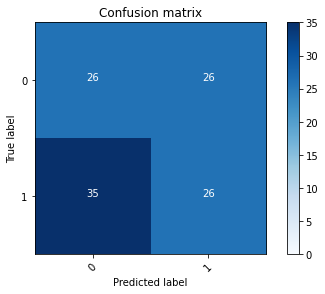

2022-08-22 14:43:15 - [Epoch Train: 73] loss: 0.0678, auc: 0.9998, acc: 0.9918, time: 24.00 s            
2022-08-22 14:43:15 - [Epoch Valid: 73] loss: 1.9288, auc: 0.4625, acc: 0.4463, time: 6.00 s


 73%|██████████████████████████████▋           | 73/100 [37:32<13:53, 30.86s/it]

2022-08-22 14:43:15 - EPOCH: 74
2022-08-22 14:43:16 - Train Step 10/485, train_loss: 0.0761
2022-08-22 14:43:16 - Train Step 20/485, train_loss: 0.0616
2022-08-22 14:43:17 - Train Step 30/485, train_loss: 0.1051
2022-08-22 14:43:17 - Train Step 40/485, train_loss: 0.0871
2022-08-22 14:43:18 - Train Step 50/485, train_loss: 0.0846
2022-08-22 14:43:18 - Train Step 60/485, train_loss: 0.0840
2022-08-22 14:43:19 - Train Step 70/485, train_loss: 0.0807
2022-08-22 14:43:19 - Train Step 80/485, train_loss: 0.0755
2022-08-22 14:43:20 - Train Step 90/485, train_loss: 0.0711
2022-08-22 14:43:20 - Train Step 100/485, train_loss: 0.0668
2022-08-22 14:43:21 - Train Step 110/485, train_loss: 0.0689
2022-08-22 14:43:21 - Train Step 120/485, train_loss: 0.0662
2022-08-22 14:43:22 - Train Step 130/485, train_loss: 0.0669
2022-08-22 14:43:22 - Train Step 140/485, train_loss: 0.0713
2022-08-22 14:43:23 - Train Step 150/485, train_loss: 0.0717
2022-08-22 14:43:23 - Train Step 160/485, train_loss: 0.0693
2

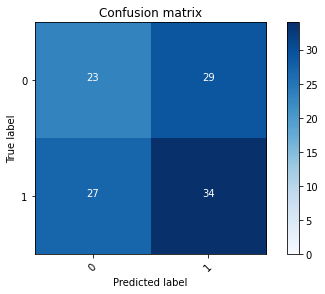

2022-08-22 14:43:46 - [Epoch Train: 74] loss: 0.0651, auc: 0.9995, acc: 0.9897, time: 24.00 s            
2022-08-22 14:43:46 - [Epoch Valid: 74] loss: 1.8763, auc: 0.4672, acc: 0.4876, time: 6.00 s


 74%|███████████████████████████████           | 74/100 [38:02<13:22, 30.86s/it]

2022-08-22 14:43:46 - EPOCH: 75
2022-08-22 14:43:46 - Train Step 10/485, train_loss: 0.1013
2022-08-22 14:43:47 - Train Step 20/485, train_loss: 0.1372
2022-08-22 14:43:47 - Train Step 30/485, train_loss: 0.1046
2022-08-22 14:43:48 - Train Step 40/485, train_loss: 0.1001
2022-08-22 14:43:48 - Train Step 50/485, train_loss: 0.0887
2022-08-22 14:43:49 - Train Step 60/485, train_loss: 0.0977
2022-08-22 14:43:49 - Train Step 70/485, train_loss: 0.1066
2022-08-22 14:43:50 - Train Step 80/485, train_loss: 0.1016
2022-08-22 14:43:50 - Train Step 90/485, train_loss: 0.1037
2022-08-22 14:43:51 - Train Step 100/485, train_loss: 0.1011
2022-08-22 14:43:51 - Train Step 110/485, train_loss: 0.0949
2022-08-22 14:43:52 - Train Step 120/485, train_loss: 0.0949
2022-08-22 14:43:52 - Train Step 130/485, train_loss: 0.0900
2022-08-22 14:43:53 - Train Step 140/485, train_loss: 0.0903
2022-08-22 14:43:53 - Train Step 150/485, train_loss: 0.0891
2022-08-22 14:43:54 - Train Step 160/485, train_loss: 0.0868
2

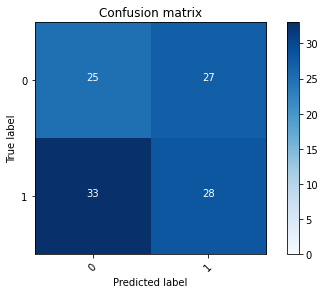

2022-08-22 14:44:17 - [Epoch Train: 75] loss: 0.0786, auc: 0.9990, acc: 0.9794, time: 24.00 s            
2022-08-22 14:44:17 - [Epoch Valid: 75] loss: 1.7977, auc: 0.4571, acc: 0.4545, time: 6.00 s


 75%|███████████████████████████████▌          | 75/100 [38:33<12:53, 30.92s/it]

2022-08-22 14:44:17 - EPOCH: 76
2022-08-22 14:44:17 - Train Step 10/485, train_loss: 0.0334
2022-08-22 14:44:18 - Train Step 20/485, train_loss: 0.0352
2022-08-22 14:44:18 - Train Step 30/485, train_loss: 0.0537
2022-08-22 14:44:19 - Train Step 40/485, train_loss: 0.0573
2022-08-22 14:44:19 - Train Step 50/485, train_loss: 0.0560
2022-08-22 14:44:20 - Train Step 60/485, train_loss: 0.0543
2022-08-22 14:44:20 - Train Step 70/485, train_loss: 0.0559
2022-08-22 14:44:21 - Train Step 80/485, train_loss: 0.0507
2022-08-22 14:44:21 - Train Step 90/485, train_loss: 0.0535
2022-08-22 14:44:22 - Train Step 100/485, train_loss: 0.0516
2022-08-22 14:44:22 - Train Step 110/485, train_loss: 0.0509
2022-08-22 14:44:23 - Train Step 120/485, train_loss: 0.0549
2022-08-22 14:44:23 - Train Step 130/485, train_loss: 0.0625
2022-08-22 14:44:24 - Train Step 140/485, train_loss: 0.0618
2022-08-22 14:44:24 - Train Step 150/485, train_loss: 0.0596
2022-08-22 14:44:25 - Train Step 160/485, train_loss: 0.0572
2

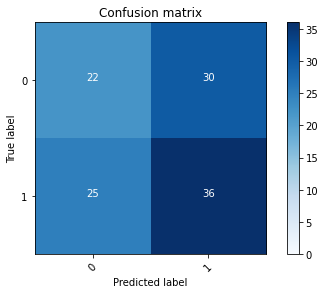

2022-08-22 14:44:48 - [Epoch Train: 76] loss: 0.0616, auc: 0.9994, acc: 0.9938, time: 24.00 s            
2022-08-22 14:44:48 - [Epoch Valid: 76] loss: 2.1249, auc: 0.4738, acc: 0.4959, time: 6.00 s


 76%|███████████████████████████████▉          | 76/100 [39:04<12:21, 30.91s/it]

2022-08-22 14:44:48 - EPOCH: 77
2022-08-22 14:44:48 - Train Step 10/485, train_loss: 0.0352
2022-08-22 14:44:49 - Train Step 20/485, train_loss: 0.0263
2022-08-22 14:44:49 - Train Step 30/485, train_loss: 0.0389
2022-08-22 14:44:50 - Train Step 40/485, train_loss: 0.0411
2022-08-22 14:44:50 - Train Step 50/485, train_loss: 0.0359
2022-08-22 14:44:51 - Train Step 60/485, train_loss: 0.0408
2022-08-22 14:44:51 - Train Step 70/485, train_loss: 0.0484
2022-08-22 14:44:52 - Train Step 80/485, train_loss: 0.0443
2022-08-22 14:44:52 - Train Step 90/485, train_loss: 0.0431
2022-08-22 14:44:53 - Train Step 100/485, train_loss: 0.0445
2022-08-22 14:44:53 - Train Step 110/485, train_loss: 0.0471
2022-08-22 14:44:54 - Train Step 120/485, train_loss: 0.0514
2022-08-22 14:44:54 - Train Step 130/485, train_loss: 0.0509
2022-08-22 14:44:55 - Train Step 140/485, train_loss: 0.0490
2022-08-22 14:44:55 - Train Step 150/485, train_loss: 0.0481
2022-08-22 14:44:56 - Train Step 160/485, train_loss: 0.0497
2

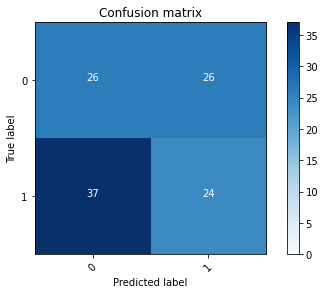

2022-08-22 14:45:18 - [Epoch Train: 77] loss: 0.0601, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 14:45:18 - [Epoch Valid: 77] loss: 2.0352, auc: 0.4505, acc: 0.4298, time: 6.00 s


 77%|████████████████████████████████▎         | 77/100 [39:35<11:49, 30.87s/it]

2022-08-22 14:45:18 - EPOCH: 78
2022-08-22 14:45:19 - Train Step 10/485, train_loss: 0.0210
2022-08-22 14:45:20 - Train Step 20/485, train_loss: 0.0244
2022-08-22 14:45:20 - Train Step 30/485, train_loss: 0.0270
2022-08-22 14:45:21 - Train Step 40/485, train_loss: 0.0304
2022-08-22 14:45:21 - Train Step 50/485, train_loss: 0.0336
2022-08-22 14:45:22 - Train Step 60/485, train_loss: 0.0414
2022-08-22 14:45:22 - Train Step 70/485, train_loss: 0.0373
2022-08-22 14:45:23 - Train Step 80/485, train_loss: 0.0341
2022-08-22 14:45:23 - Train Step 90/485, train_loss: 0.0332
2022-08-22 14:45:24 - Train Step 100/485, train_loss: 0.0342
2022-08-22 14:45:24 - Train Step 110/485, train_loss: 0.0349
2022-08-22 14:45:25 - Train Step 120/485, train_loss: 0.0347
2022-08-22 14:45:25 - Train Step 130/485, train_loss: 0.0354
2022-08-22 14:45:26 - Train Step 140/485, train_loss: 0.0400
2022-08-22 14:45:26 - Train Step 150/485, train_loss: 0.0443
2022-08-22 14:45:27 - Train Step 160/485, train_loss: 0.0423
2

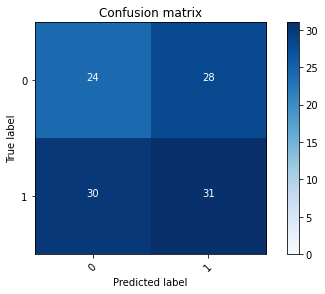

2022-08-22 14:45:50 - [Epoch Train: 78] loss: 0.0625, auc: 0.9995, acc: 0.9835, time: 24.00 s            
2022-08-22 14:45:50 - [Epoch Valid: 78] loss: 1.9911, auc: 0.4663, acc: 0.4711, time: 6.00 s


 78%|████████████████████████████████▊         | 78/100 [40:06<11:21, 30.99s/it]

2022-08-22 14:45:50 - EPOCH: 79
2022-08-22 14:45:50 - Train Step 10/485, train_loss: 0.0213
2022-08-22 14:45:51 - Train Step 20/485, train_loss: 0.0342
2022-08-22 14:45:51 - Train Step 30/485, train_loss: 0.0553
2022-08-22 14:45:52 - Train Step 40/485, train_loss: 0.0539
2022-08-22 14:45:52 - Train Step 50/485, train_loss: 0.0699
2022-08-22 14:45:53 - Train Step 60/485, train_loss: 0.0593
2022-08-22 14:45:53 - Train Step 70/485, train_loss: 0.0595
2022-08-22 14:45:54 - Train Step 80/485, train_loss: 0.0532
2022-08-22 14:45:54 - Train Step 90/485, train_loss: 0.0527
2022-08-22 14:45:55 - Train Step 100/485, train_loss: 0.0559
2022-08-22 14:45:55 - Train Step 110/485, train_loss: 0.0529
2022-08-22 14:45:56 - Train Step 120/485, train_loss: 0.0519
2022-08-22 14:45:56 - Train Step 130/485, train_loss: 0.0521
2022-08-22 14:45:57 - Train Step 140/485, train_loss: 0.0532
2022-08-22 14:45:57 - Train Step 150/485, train_loss: 0.0519
2022-08-22 14:45:58 - Train Step 160/485, train_loss: 0.0498
2

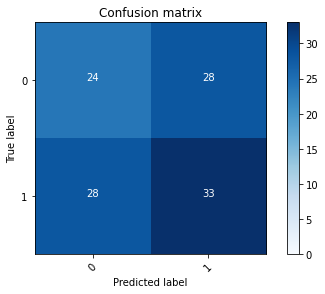

2022-08-22 14:46:21 - [Epoch Train: 79] loss: 0.0605, auc: 0.9998, acc: 0.9959, time: 24.00 s            
2022-08-22 14:46:21 - [Epoch Valid: 79] loss: 2.2487, auc: 0.4765, acc: 0.4876, time: 6.00 s


 79%|█████████████████████████████████▏        | 79/100 [40:38<10:52, 31.05s/it]

2022-08-22 14:46:21 - EPOCH: 80
2022-08-22 14:46:22 - Train Step 10/485, train_loss: 0.0334
2022-08-22 14:46:22 - Train Step 20/485, train_loss: 0.0376
2022-08-22 14:46:23 - Train Step 30/485, train_loss: 0.0350
2022-08-22 14:46:23 - Train Step 40/485, train_loss: 0.0532
2022-08-22 14:46:24 - Train Step 50/485, train_loss: 0.0624
2022-08-22 14:46:24 - Train Step 60/485, train_loss: 0.0697
2022-08-22 14:46:25 - Train Step 70/485, train_loss: 0.0634
2022-08-22 14:46:25 - Train Step 80/485, train_loss: 0.0643
2022-08-22 14:46:26 - Train Step 90/485, train_loss: 0.0590
2022-08-22 14:46:26 - Train Step 100/485, train_loss: 0.0550
2022-08-22 14:46:27 - Train Step 110/485, train_loss: 0.0520
2022-08-22 14:46:27 - Train Step 120/485, train_loss: 0.0498
2022-08-22 14:46:28 - Train Step 130/485, train_loss: 0.0521
2022-08-22 14:46:28 - Train Step 140/485, train_loss: 0.0566
2022-08-22 14:46:29 - Train Step 150/485, train_loss: 0.0606
2022-08-22 14:46:29 - Train Step 160/485, train_loss: 0.0581
2

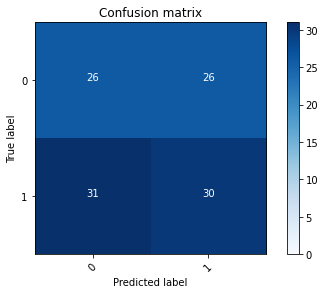

2022-08-22 14:46:52 - [Epoch Train: 80] loss: 0.0575, auc: 0.9993, acc: 0.9856, time: 24.00 s            
2022-08-22 14:46:52 - [Epoch Valid: 80] loss: 2.2206, auc: 0.4663, acc: 0.4793, time: 6.00 s


 80%|█████████████████████████████████▌        | 80/100 [41:09<10:21, 31.06s/it]

2022-08-22 14:46:52 - EPOCH: 81
2022-08-22 14:46:53 - Train Step 10/485, train_loss: 0.0333
2022-08-22 14:46:53 - Train Step 20/485, train_loss: 0.0603
2022-08-22 14:46:54 - Train Step 30/485, train_loss: 0.0599
2022-08-22 14:46:54 - Train Step 40/485, train_loss: 0.0544
2022-08-22 14:46:55 - Train Step 50/485, train_loss: 0.0544
2022-08-22 14:46:55 - Train Step 60/485, train_loss: 0.0494
2022-08-22 14:46:56 - Train Step 70/485, train_loss: 0.0495
2022-08-22 14:46:56 - Train Step 80/485, train_loss: 0.0472
2022-08-22 14:46:57 - Train Step 90/485, train_loss: 0.0460
2022-08-22 14:46:57 - Train Step 100/485, train_loss: 0.0508
2022-08-22 14:46:58 - Train Step 110/485, train_loss: 0.0485
2022-08-22 14:46:58 - Train Step 120/485, train_loss: 0.0568
2022-08-22 14:46:59 - Train Step 130/485, train_loss: 0.0576
2022-08-22 14:46:59 - Train Step 140/485, train_loss: 0.0558
2022-08-22 14:47:00 - Train Step 150/485, train_loss: 0.0620
2022-08-22 14:47:00 - Train Step 160/485, train_loss: 0.0619
2

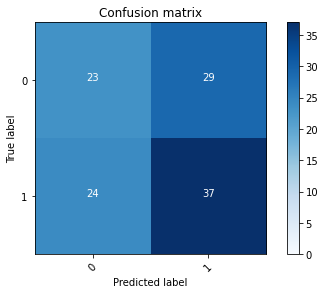

2022-08-22 14:47:23 - [Epoch Train: 81] loss: 0.0463, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 14:47:23 - [Epoch Valid: 81] loss: 2.2469, auc: 0.4912, acc: 0.5124, time: 6.00 s


 81%|██████████████████████████████████        | 81/100 [41:40<09:49, 31.01s/it]

2022-08-22 14:47:23 - EPOCH: 82
2022-08-22 14:47:24 - Train Step 10/485, train_loss: 0.0290
2022-08-22 14:47:24 - Train Step 20/485, train_loss: 0.0175
2022-08-22 14:47:25 - Train Step 30/485, train_loss: 0.0263
2022-08-22 14:47:25 - Train Step 40/485, train_loss: 0.0533
2022-08-22 14:47:26 - Train Step 50/485, train_loss: 0.0442
2022-08-22 14:47:26 - Train Step 60/485, train_loss: 0.0413
2022-08-22 14:47:27 - Train Step 70/485, train_loss: 0.0372
2022-08-22 14:47:27 - Train Step 80/485, train_loss: 0.0352
2022-08-22 14:47:28 - Train Step 90/485, train_loss: 0.0369
2022-08-22 14:47:28 - Train Step 100/485, train_loss: 0.0401
2022-08-22 14:47:29 - Train Step 110/485, train_loss: 0.0522
2022-08-22 14:47:29 - Train Step 120/485, train_loss: 0.0522
2022-08-22 14:47:30 - Train Step 130/485, train_loss: 0.0518
2022-08-22 14:47:30 - Train Step 140/485, train_loss: 0.0567
2022-08-22 14:47:31 - Train Step 150/485, train_loss: 0.0597
2022-08-22 14:47:31 - Train Step 160/485, train_loss: 0.0631
2

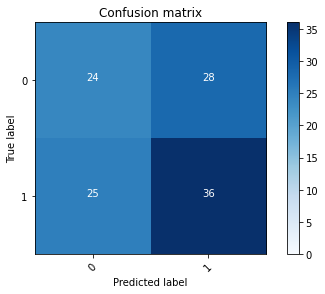

2022-08-22 14:47:54 - [Epoch Train: 82] loss: 0.0562, auc: 0.9990, acc: 0.9876, time: 24.00 s            
2022-08-22 14:47:54 - [Epoch Valid: 82] loss: 2.2244, auc: 0.4823, acc: 0.5124, time: 6.00 s


 82%|██████████████████████████████████▍       | 82/100 [42:10<09:16, 30.93s/it]

2022-08-22 14:47:54 - EPOCH: 83
2022-08-22 14:47:54 - Train Step 10/485, train_loss: 0.0149
2022-08-22 14:47:55 - Train Step 20/485, train_loss: 0.0277
2022-08-22 14:47:55 - Train Step 30/485, train_loss: 0.0214
2022-08-22 14:47:56 - Train Step 40/485, train_loss: 0.0198
2022-08-22 14:47:56 - Train Step 50/485, train_loss: 0.0211
2022-08-22 14:47:57 - Train Step 60/485, train_loss: 0.0197
2022-08-22 14:47:57 - Train Step 70/485, train_loss: 0.0258
2022-08-22 14:47:58 - Train Step 80/485, train_loss: 0.0297
2022-08-22 14:47:58 - Train Step 90/485, train_loss: 0.0277
2022-08-22 14:47:59 - Train Step 100/485, train_loss: 0.0277
2022-08-22 14:47:59 - Train Step 110/485, train_loss: 0.0278
2022-08-22 14:48:00 - Train Step 120/485, train_loss: 0.0408
2022-08-22 14:48:00 - Train Step 130/485, train_loss: 0.0426
2022-08-22 14:48:01 - Train Step 140/485, train_loss: 0.0411
2022-08-22 14:48:01 - Train Step 150/485, train_loss: 0.0408
2022-08-22 14:48:02 - Train Step 160/485, train_loss: 0.0436
2

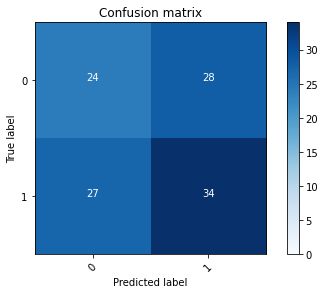

2022-08-22 14:48:24 - [Epoch Train: 83] loss: 0.0379, auc: 0.9998, acc: 0.9959, time: 24.00 s            
2022-08-22 14:48:24 - [Epoch Valid: 83] loss: 2.2434, auc: 0.4754, acc: 0.4959, time: 6.00 s


 83%|██████████████████████████████████▊       | 83/100 [42:41<08:44, 30.84s/it]

2022-08-22 14:48:24 - EPOCH: 84
2022-08-22 14:48:25 - Train Step 10/485, train_loss: 0.0360
2022-08-22 14:48:25 - Train Step 20/485, train_loss: 0.0298
2022-08-22 14:48:26 - Train Step 30/485, train_loss: 0.0281
2022-08-22 14:48:26 - Train Step 40/485, train_loss: 0.0229
2022-08-22 14:48:27 - Train Step 50/485, train_loss: 0.0232
2022-08-22 14:48:27 - Train Step 60/485, train_loss: 0.0293
2022-08-22 14:48:28 - Train Step 70/485, train_loss: 0.0275
2022-08-22 14:48:28 - Train Step 80/485, train_loss: 0.0246
2022-08-22 14:48:29 - Train Step 90/485, train_loss: 0.0241
2022-08-22 14:48:29 - Train Step 100/485, train_loss: 0.0262
2022-08-22 14:48:30 - Train Step 110/485, train_loss: 0.0278
2022-08-22 14:48:30 - Train Step 120/485, train_loss: 0.0301
2022-08-22 14:48:31 - Train Step 130/485, train_loss: 0.0324
2022-08-22 14:48:31 - Train Step 140/485, train_loss: 0.0316
2022-08-22 14:48:32 - Train Step 150/485, train_loss: 0.0304
2022-08-22 14:48:32 - Train Step 160/485, train_loss: 0.0336
2

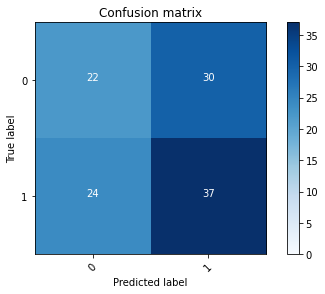

2022-08-22 14:48:55 - [Epoch Train: 84] loss: 0.0435, auc: 0.9999, acc: 0.9959, time: 24.00 s            
2022-08-22 14:48:55 - [Epoch Valid: 84] loss: 2.3729, auc: 0.4956, acc: 0.5041, time: 6.00 s


 84%|███████████████████████████████████▎      | 84/100 [43:12<08:14, 30.90s/it]

2022-08-22 14:48:55 - EPOCH: 85
2022-08-22 14:48:56 - Train Step 10/485, train_loss: 0.0131
2022-08-22 14:48:57 - Train Step 20/485, train_loss: 0.0214
2022-08-22 14:48:57 - Train Step 30/485, train_loss: 0.0198
2022-08-22 14:48:58 - Train Step 40/485, train_loss: 0.0169
2022-08-22 14:48:58 - Train Step 50/485, train_loss: 0.0191
2022-08-22 14:48:59 - Train Step 60/485, train_loss: 0.0197
2022-08-22 14:48:59 - Train Step 70/485, train_loss: 0.0227
2022-08-22 14:49:00 - Train Step 80/485, train_loss: 0.0322
2022-08-22 14:49:00 - Train Step 90/485, train_loss: 0.0319
2022-08-22 14:49:01 - Train Step 100/485, train_loss: 0.0319
2022-08-22 14:49:01 - Train Step 110/485, train_loss: 0.0375
2022-08-22 14:49:02 - Train Step 120/485, train_loss: 0.0351
2022-08-22 14:49:02 - Train Step 130/485, train_loss: 0.0332
2022-08-22 14:49:03 - Train Step 140/485, train_loss: 0.0331
2022-08-22 14:49:03 - Train Step 150/485, train_loss: 0.0334
2022-08-22 14:49:04 - Train Step 160/485, train_loss: 0.0321
2

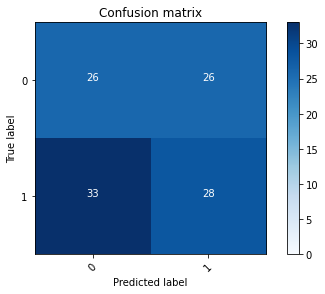

2022-08-22 14:49:26 - [Epoch Train: 85] loss: 0.0344, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 14:49:26 - [Epoch Valid: 85] loss: 2.4195, auc: 0.4634, acc: 0.4628, time: 6.00 s


 85%|███████████████████████████████████▋      | 85/100 [43:43<07:42, 30.85s/it]

2022-08-22 14:49:26 - EPOCH: 86
2022-08-22 14:49:27 - Train Step 10/485, train_loss: 0.0227
2022-08-22 14:49:27 - Train Step 20/485, train_loss: 0.0163
2022-08-22 14:49:28 - Train Step 30/485, train_loss: 0.0191
2022-08-22 14:49:28 - Train Step 40/485, train_loss: 0.0204
2022-08-22 14:49:29 - Train Step 50/485, train_loss: 0.0217
2022-08-22 14:49:29 - Train Step 60/485, train_loss: 0.0245
2022-08-22 14:49:30 - Train Step 70/485, train_loss: 0.0252
2022-08-22 14:49:30 - Train Step 80/485, train_loss: 0.0237
2022-08-22 14:49:31 - Train Step 90/485, train_loss: 0.0250
2022-08-22 14:49:31 - Train Step 100/485, train_loss: 0.0278
2022-08-22 14:49:32 - Train Step 110/485, train_loss: 0.0266
2022-08-22 14:49:32 - Train Step 120/485, train_loss: 0.0341
2022-08-22 14:49:33 - Train Step 130/485, train_loss: 0.0342
2022-08-22 14:49:33 - Train Step 140/485, train_loss: 0.0331
2022-08-22 14:49:34 - Train Step 150/485, train_loss: 0.0327
2022-08-22 14:49:34 - Train Step 160/485, train_loss: 0.0315
2

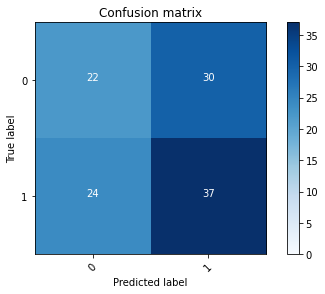

2022-08-22 14:49:57 - [Epoch Train: 86] loss: 0.0346, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 14:49:57 - [Epoch Valid: 86] loss: 2.6368, auc: 0.4801, acc: 0.5041, time: 6.00 s


 86%|████████████████████████████████████      | 86/100 [44:13<07:10, 30.77s/it]

2022-08-22 14:49:57 - EPOCH: 87
2022-08-22 14:49:57 - Train Step 10/485, train_loss: 0.0038
2022-08-22 14:49:58 - Train Step 20/485, train_loss: 0.0054
2022-08-22 14:49:58 - Train Step 30/485, train_loss: 0.0203
2022-08-22 14:49:59 - Train Step 40/485, train_loss: 0.0201
2022-08-22 14:49:59 - Train Step 50/485, train_loss: 0.0192
2022-08-22 14:50:00 - Train Step 60/485, train_loss: 0.0179
2022-08-22 14:50:00 - Train Step 70/485, train_loss: 0.0158
2022-08-22 14:50:01 - Train Step 80/485, train_loss: 0.0163
2022-08-22 14:50:01 - Train Step 90/485, train_loss: 0.0165
2022-08-22 14:50:02 - Train Step 100/485, train_loss: 0.0214
2022-08-22 14:50:02 - Train Step 110/485, train_loss: 0.0233
2022-08-22 14:50:03 - Train Step 120/485, train_loss: 0.0267
2022-08-22 14:50:03 - Train Step 130/485, train_loss: 0.0390
2022-08-22 14:50:04 - Train Step 140/485, train_loss: 0.0376
2022-08-22 14:50:04 - Train Step 150/485, train_loss: 0.0356
2022-08-22 14:50:05 - Train Step 160/485, train_loss: 0.0366
2

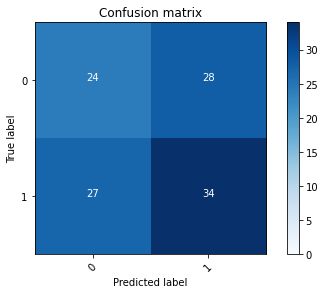

2022-08-22 14:50:28 - [Epoch Train: 87] loss: 0.0326, auc: 1.0000, acc: 0.9938, time: 24.00 s            
2022-08-22 14:50:28 - [Epoch Valid: 87] loss: 2.4738, auc: 0.4801, acc: 0.4959, time: 6.00 s


 87%|████████████████████████████████████▌     | 87/100 [44:44<06:41, 30.85s/it]

2022-08-22 14:50:28 - EPOCH: 88
2022-08-22 14:50:28 - Train Step 10/485, train_loss: 0.0122
2022-08-22 14:50:29 - Train Step 20/485, train_loss: 0.0131
2022-08-22 14:50:29 - Train Step 30/485, train_loss: 0.0122
2022-08-22 14:50:30 - Train Step 40/485, train_loss: 0.0123
2022-08-22 14:50:30 - Train Step 50/485, train_loss: 0.0114
2022-08-22 14:50:31 - Train Step 60/485, train_loss: 0.0351
2022-08-22 14:50:31 - Train Step 70/485, train_loss: 0.0320
2022-08-22 14:50:32 - Train Step 80/485, train_loss: 0.0293
2022-08-22 14:50:32 - Train Step 90/485, train_loss: 0.0392
2022-08-22 14:50:33 - Train Step 100/485, train_loss: 0.0377
2022-08-22 14:50:33 - Train Step 110/485, train_loss: 0.0426
2022-08-22 14:50:34 - Train Step 120/485, train_loss: 0.0410
2022-08-22 14:50:34 - Train Step 130/485, train_loss: 0.0394
2022-08-22 14:50:35 - Train Step 140/485, train_loss: 0.0371
2022-08-22 14:50:35 - Train Step 150/485, train_loss: 0.0396
2022-08-22 14:50:36 - Train Step 160/485, train_loss: 0.0403
2

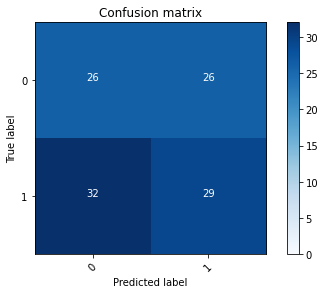

2022-08-22 14:50:59 - [Epoch Train: 88] loss: 0.0370, auc: 0.9998, acc: 0.9897, time: 24.00 s            
2022-08-22 14:50:59 - [Epoch Valid: 88] loss: 2.5277, auc: 0.4713, acc: 0.4711, time: 6.00 s


 88%|████████████████████████████████████▉     | 88/100 [45:15<06:10, 30.90s/it]

2022-08-22 14:50:59 - EPOCH: 89
2022-08-22 14:50:59 - Train Step 10/485, train_loss: 0.0226
2022-08-22 14:51:00 - Train Step 20/485, train_loss: 0.0144
2022-08-22 14:51:00 - Train Step 30/485, train_loss: 0.0129
2022-08-22 14:51:01 - Train Step 40/485, train_loss: 0.0107
2022-08-22 14:51:02 - Train Step 50/485, train_loss: 0.0091
2022-08-22 14:51:02 - Train Step 60/485, train_loss: 0.0294
2022-08-22 14:51:03 - Train Step 70/485, train_loss: 0.0259
2022-08-22 14:51:03 - Train Step 80/485, train_loss: 0.0394
2022-08-22 14:51:04 - Train Step 90/485, train_loss: 0.0354
2022-08-22 14:51:04 - Train Step 100/485, train_loss: 0.0351
2022-08-22 14:51:05 - Train Step 110/485, train_loss: 0.0392
2022-08-22 14:51:05 - Train Step 120/485, train_loss: 0.0397
2022-08-22 14:51:06 - Train Step 130/485, train_loss: 0.0384
2022-08-22 14:51:06 - Train Step 140/485, train_loss: 0.0359
2022-08-22 14:51:07 - Train Step 150/485, train_loss: 0.0338
2022-08-22 14:51:07 - Train Step 160/485, train_loss: 0.0324
2

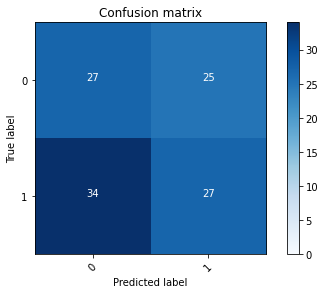

2022-08-22 14:51:31 - [Epoch Train: 89] loss: 0.0357, auc: 0.9998, acc: 0.9897, time: 24.00 s            
2022-08-22 14:51:31 - [Epoch Valid: 89] loss: 2.4264, auc: 0.4723, acc: 0.4628, time: 6.00 s


 89%|█████████████████████████████████████▍    | 89/100 [45:47<05:42, 31.17s/it]

2022-08-22 14:51:31 - EPOCH: 90
2022-08-22 14:51:31 - Train Step 10/485, train_loss: 0.0026
2022-08-22 14:51:32 - Train Step 20/485, train_loss: 0.0194
2022-08-22 14:51:32 - Train Step 30/485, train_loss: 0.0205
2022-08-22 14:51:33 - Train Step 40/485, train_loss: 0.0226
2022-08-22 14:51:34 - Train Step 50/485, train_loss: 0.0256
2022-08-22 14:51:34 - Train Step 60/485, train_loss: 0.0238
2022-08-22 14:51:35 - Train Step 70/485, train_loss: 0.0231
2022-08-22 14:51:35 - Train Step 80/485, train_loss: 0.0226
2022-08-22 14:51:36 - Train Step 90/485, train_loss: 0.0209
2022-08-22 14:51:37 - Train Step 100/485, train_loss: 0.0235
2022-08-22 14:51:37 - Train Step 110/485, train_loss: 0.0231
2022-08-22 14:51:38 - Train Step 120/485, train_loss: 0.0219
2022-08-22 14:51:38 - Train Step 130/485, train_loss: 0.0252
2022-08-22 14:51:39 - Train Step 140/485, train_loss: 0.0287
2022-08-22 14:51:39 - Train Step 150/485, train_loss: 0.0279
2022-08-22 14:51:40 - Train Step 160/485, train_loss: 0.0283
2

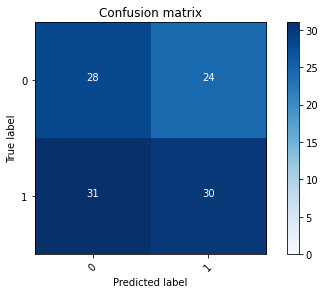

2022-08-22 14:52:07 - [Epoch Train: 90] loss: 0.0333, auc: 0.9999, acc: 0.9959, time: 28.00 s            
2022-08-22 14:52:07 - [Epoch Valid: 90] loss: 2.6109, auc: 0.4782, acc: 0.5041, time: 7.00 s


 90%|█████████████████████████████████████▊    | 90/100 [46:24<05:27, 32.74s/it]

2022-08-22 14:52:07 - EPOCH: 91
2022-08-22 14:52:08 - Train Step 10/485, train_loss: 0.0126
2022-08-22 14:52:08 - Train Step 20/485, train_loss: 0.0370
2022-08-22 14:52:09 - Train Step 30/485, train_loss: 0.0286
2022-08-22 14:52:10 - Train Step 40/485, train_loss: 0.0227
2022-08-22 14:52:10 - Train Step 50/485, train_loss: 0.0195
2022-08-22 14:52:11 - Train Step 60/485, train_loss: 0.0182
2022-08-22 14:52:12 - Train Step 70/485, train_loss: 0.0212
2022-08-22 14:52:12 - Train Step 80/485, train_loss: 0.0220
2022-08-22 14:52:13 - Train Step 90/485, train_loss: 0.0211
2022-08-22 14:52:13 - Train Step 100/485, train_loss: 0.0234
2022-08-22 14:52:14 - Train Step 110/485, train_loss: 0.0215
2022-08-22 14:52:15 - Train Step 120/485, train_loss: 0.0213
2022-08-22 14:52:15 - Train Step 130/485, train_loss: 0.0209
2022-08-22 14:52:16 - Train Step 140/485, train_loss: 0.0198
2022-08-22 14:52:17 - Train Step 150/485, train_loss: 0.0192
2022-08-22 14:52:17 - Train Step 160/485, train_loss: 0.0197
2

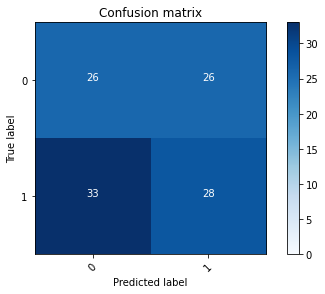

2022-08-22 14:52:43 - [Epoch Train: 91] loss: 0.0316, auc: 0.9998, acc: 0.9918, time: 29.00 s            
2022-08-22 14:52:43 - [Epoch Valid: 91] loss: 2.5922, auc: 0.4559, acc: 0.4628, time: 6.00 s


 91%|██████████████████████████████████████▏   | 91/100 [46:59<05:02, 33.63s/it]

2022-08-22 14:52:43 - EPOCH: 92
2022-08-22 14:52:43 - Train Step 10/485, train_loss: 0.0191
2022-08-22 14:52:44 - Train Step 20/485, train_loss: 0.0154
2022-08-22 14:52:44 - Train Step 30/485, train_loss: 0.0115
2022-08-22 14:52:45 - Train Step 40/485, train_loss: 0.0117
2022-08-22 14:52:45 - Train Step 50/485, train_loss: 0.0105
2022-08-22 14:52:46 - Train Step 60/485, train_loss: 0.0109
2022-08-22 14:52:46 - Train Step 70/485, train_loss: 0.0136
2022-08-22 14:52:47 - Train Step 80/485, train_loss: 0.0136
2022-08-22 14:52:47 - Train Step 90/485, train_loss: 0.0130
2022-08-22 14:52:48 - Train Step 100/485, train_loss: 0.0137
2022-08-22 14:52:48 - Train Step 110/485, train_loss: 0.0159
2022-08-22 14:52:49 - Train Step 120/485, train_loss: 0.0208
2022-08-22 14:52:49 - Train Step 130/485, train_loss: 0.0195
2022-08-22 14:52:50 - Train Step 140/485, train_loss: 0.0183
2022-08-22 14:52:50 - Train Step 150/485, train_loss: 0.0243
2022-08-22 14:52:51 - Train Step 160/485, train_loss: 0.0266
2

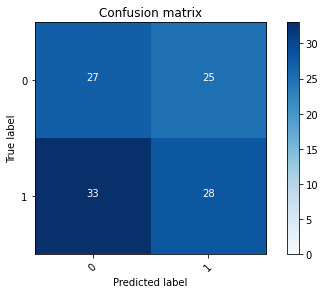

2022-08-22 14:53:13 - [Epoch Train: 92] loss: 0.0229, auc: 1.0000, acc: 0.9959, time: 24.00 s            
2022-08-22 14:53:13 - [Epoch Valid: 92] loss: 2.8841, auc: 0.4710, acc: 0.4711, time: 6.00 s


 92%|██████████████████████████████████████▋   | 92/100 [47:30<04:22, 32.79s/it]

2022-08-22 14:53:13 - EPOCH: 93
2022-08-22 14:53:14 - Train Step 10/485, train_loss: 0.0119
2022-08-22 14:53:15 - Train Step 20/485, train_loss: 0.0208
2022-08-22 14:53:15 - Train Step 30/485, train_loss: 0.0294
2022-08-22 14:53:16 - Train Step 40/485, train_loss: 0.0300
2022-08-22 14:53:16 - Train Step 50/485, train_loss: 0.0335
2022-08-22 14:53:17 - Train Step 60/485, train_loss: 0.0324
2022-08-22 14:53:17 - Train Step 70/485, train_loss: 0.0308
2022-08-22 14:53:18 - Train Step 80/485, train_loss: 0.0308
2022-08-22 14:53:18 - Train Step 90/485, train_loss: 0.0345
2022-08-22 14:53:19 - Train Step 100/485, train_loss: 0.0340
2022-08-22 14:53:19 - Train Step 110/485, train_loss: 0.0317
2022-08-22 14:53:20 - Train Step 120/485, train_loss: 0.0301
2022-08-22 14:53:20 - Train Step 130/485, train_loss: 0.0291
2022-08-22 14:53:21 - Train Step 140/485, train_loss: 0.0282
2022-08-22 14:53:21 - Train Step 150/485, train_loss: 0.0277
2022-08-22 14:53:22 - Train Step 160/485, train_loss: 0.0266
2

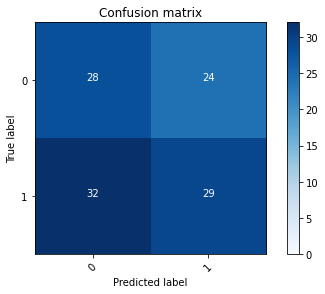

2022-08-22 14:53:45 - [Epoch Train: 93] loss: 0.0271, auc: 0.9999, acc: 0.9959, time: 24.00 s            
2022-08-22 14:53:45 - [Epoch Valid: 93] loss: 2.7528, auc: 0.4776, acc: 0.4959, time: 6.00 s


 93%|███████████████████████████████████████   | 93/100 [48:01<03:46, 32.32s/it]

2022-08-22 14:53:45 - EPOCH: 94
2022-08-22 14:53:45 - Train Step 10/485, train_loss: 0.0167
2022-08-22 14:53:46 - Train Step 20/485, train_loss: 0.0148
2022-08-22 14:53:46 - Train Step 30/485, train_loss: 0.0109
2022-08-22 14:53:47 - Train Step 40/485, train_loss: 0.0202
2022-08-22 14:53:47 - Train Step 50/485, train_loss: 0.0182
2022-08-22 14:53:48 - Train Step 60/485, train_loss: 0.0164
2022-08-22 14:53:48 - Train Step 70/485, train_loss: 0.0166
2022-08-22 14:53:49 - Train Step 80/485, train_loss: 0.0169
2022-08-22 14:53:49 - Train Step 90/485, train_loss: 0.0172
2022-08-22 14:53:50 - Train Step 100/485, train_loss: 0.0159
2022-08-22 14:53:50 - Train Step 110/485, train_loss: 0.0255
2022-08-22 14:53:51 - Train Step 120/485, train_loss: 0.0272
2022-08-22 14:53:51 - Train Step 130/485, train_loss: 0.0262
2022-08-22 14:53:52 - Train Step 140/485, train_loss: 0.0262
2022-08-22 14:53:52 - Train Step 150/485, train_loss: 0.0261
2022-08-22 14:53:53 - Train Step 160/485, train_loss: 0.0257
2

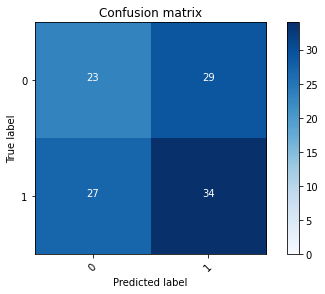

2022-08-22 14:54:16 - [Epoch Train: 94] loss: 0.0260, auc: 1.0000, acc: 0.9979, time: 25.00 s            
2022-08-22 14:54:16 - [Epoch Valid: 94] loss: 2.8635, auc: 0.4883, acc: 0.4876, time: 6.00 s


 94%|███████████████████████████████████████▍  | 94/100 [48:33<03:12, 32.07s/it]

2022-08-22 14:54:16 - EPOCH: 95
2022-08-22 14:54:17 - Train Step 10/485, train_loss: 0.0092
2022-08-22 14:54:17 - Train Step 20/485, train_loss: 0.0078
2022-08-22 14:54:18 - Train Step 30/485, train_loss: 0.0173
2022-08-22 14:54:18 - Train Step 40/485, train_loss: 0.0219
2022-08-22 14:54:19 - Train Step 50/485, train_loss: 0.0201
2022-08-22 14:54:19 - Train Step 60/485, train_loss: 0.0273
2022-08-22 14:54:20 - Train Step 70/485, train_loss: 0.0286
2022-08-22 14:54:20 - Train Step 80/485, train_loss: 0.0265
2022-08-22 14:54:21 - Train Step 90/485, train_loss: 0.0251
2022-08-22 14:54:21 - Train Step 100/485, train_loss: 0.0299
2022-08-22 14:54:22 - Train Step 110/485, train_loss: 0.0296
2022-08-22 14:54:22 - Train Step 120/485, train_loss: 0.0303
2022-08-22 14:54:23 - Train Step 130/485, train_loss: 0.0288
2022-08-22 14:54:23 - Train Step 140/485, train_loss: 0.0294
2022-08-22 14:54:24 - Train Step 150/485, train_loss: 0.0297
2022-08-22 14:54:24 - Train Step 160/485, train_loss: 0.0341
2

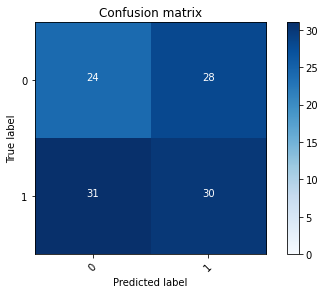

2022-08-22 14:54:47 - [Epoch Train: 95] loss: 0.0264, auc: 1.0000, acc: 0.9979, time: 24.00 s            
2022-08-22 14:54:47 - [Epoch Valid: 95] loss: 2.6449, auc: 0.4574, acc: 0.4628, time: 6.00 s


 95%|███████████████████████████████████████▉  | 95/100 [49:04<02:38, 31.74s/it]

2022-08-22 14:54:47 - EPOCH: 96
2022-08-22 14:54:48 - Train Step 10/485, train_loss: 0.0058
2022-08-22 14:54:48 - Train Step 20/485, train_loss: 0.0045
2022-08-22 14:54:49 - Train Step 30/485, train_loss: 0.0040
2022-08-22 14:54:49 - Train Step 40/485, train_loss: 0.0525
2022-08-22 14:54:50 - Train Step 50/485, train_loss: 0.0460
2022-08-22 14:54:50 - Train Step 60/485, train_loss: 0.0394
2022-08-22 14:54:51 - Train Step 70/485, train_loss: 0.0356
2022-08-22 14:54:51 - Train Step 80/485, train_loss: 0.0333
2022-08-22 14:54:52 - Train Step 90/485, train_loss: 0.0311
2022-08-22 14:54:52 - Train Step 100/485, train_loss: 0.0307
2022-08-22 14:54:53 - Train Step 110/485, train_loss: 0.0292
2022-08-22 14:54:53 - Train Step 120/485, train_loss: 0.0301
2022-08-22 14:54:54 - Train Step 130/485, train_loss: 0.0291
2022-08-22 14:54:54 - Train Step 140/485, train_loss: 0.0278
2022-08-22 14:54:55 - Train Step 150/485, train_loss: 0.0275
2022-08-22 14:54:55 - Train Step 160/485, train_loss: 0.0273
2

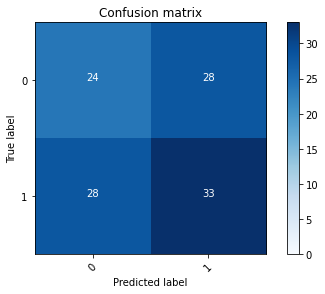

2022-08-22 14:55:18 - [Epoch Train: 96] loss: 0.0275, auc: 0.9998, acc: 0.9897, time: 24.00 s            
2022-08-22 14:55:18 - [Epoch Valid: 96] loss: 2.9849, auc: 0.4823, acc: 0.4876, time: 6.00 s


 96%|████████████████████████████████████████▎ | 96/100 [49:35<02:06, 31.61s/it]

2022-08-22 14:55:18 - EPOCH: 97
2022-08-22 14:55:19 - Train Step 10/485, train_loss: 0.0569
2022-08-22 14:55:20 - Train Step 20/485, train_loss: 0.0312
2022-08-22 14:55:20 - Train Step 30/485, train_loss: 0.0269
2022-08-22 14:55:21 - Train Step 40/485, train_loss: 0.0239
2022-08-22 14:55:21 - Train Step 50/485, train_loss: 0.0277
2022-08-22 14:55:22 - Train Step 60/485, train_loss: 0.0238
2022-08-22 14:55:22 - Train Step 70/485, train_loss: 0.0267
2022-08-22 14:55:23 - Train Step 80/485, train_loss: 0.0277
2022-08-22 14:55:23 - Train Step 90/485, train_loss: 0.0277
2022-08-22 14:55:24 - Train Step 100/485, train_loss: 0.0253
2022-08-22 14:55:24 - Train Step 110/485, train_loss: 0.0245
2022-08-22 14:55:25 - Train Step 120/485, train_loss: 0.0229
2022-08-22 14:55:25 - Train Step 130/485, train_loss: 0.0222
2022-08-22 14:55:26 - Train Step 140/485, train_loss: 0.0220
2022-08-22 14:55:26 - Train Step 150/485, train_loss: 0.0213
2022-08-22 14:55:27 - Train Step 160/485, train_loss: 0.0221
2

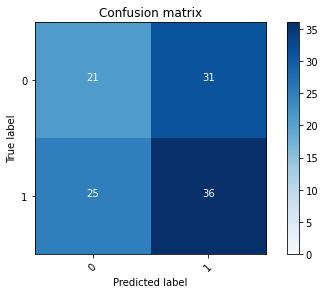

2022-08-22 14:55:50 - [Epoch Train: 97] loss: 0.0232, auc: 1.0000, acc: 0.9959, time: 25.00 s            
2022-08-22 14:55:50 - [Epoch Valid: 97] loss: 2.9532, auc: 0.4902, acc: 0.4876, time: 6.00 s


 97%|████████████████████████████████████████▋ | 97/100 [50:07<01:34, 31.57s/it]

2022-08-22 14:55:50 - EPOCH: 98
2022-08-22 14:55:51 - Train Step 10/485, train_loss: 0.0050
2022-08-22 14:55:51 - Train Step 20/485, train_loss: 0.0040
2022-08-22 14:55:52 - Train Step 30/485, train_loss: 0.0106
2022-08-22 14:55:52 - Train Step 40/485, train_loss: 0.0252
2022-08-22 14:55:53 - Train Step 50/485, train_loss: 0.0214
2022-08-22 14:55:53 - Train Step 60/485, train_loss: 0.0197
2022-08-22 14:55:54 - Train Step 70/485, train_loss: 0.0187
2022-08-22 14:55:54 - Train Step 80/485, train_loss: 0.0166
2022-08-22 14:55:55 - Train Step 90/485, train_loss: 0.0157
2022-08-22 14:55:55 - Train Step 100/485, train_loss: 0.0145
2022-08-22 14:55:56 - Train Step 110/485, train_loss: 0.0168
2022-08-22 14:55:56 - Train Step 120/485, train_loss: 0.0192
2022-08-22 14:55:57 - Train Step 130/485, train_loss: 0.0214
2022-08-22 14:55:57 - Train Step 140/485, train_loss: 0.0200
2022-08-22 14:55:58 - Train Step 150/485, train_loss: 0.0241
2022-08-22 14:55:58 - Train Step 160/485, train_loss: 0.0285
2

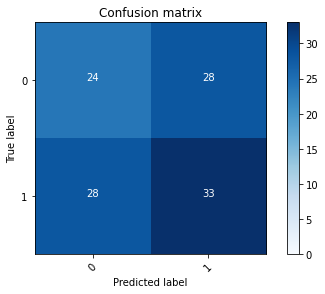

2022-08-22 14:56:21 - [Epoch Train: 98] loss: 0.0205, auc: 1.0000, acc: 0.9979, time: 24.00 s            
2022-08-22 14:56:21 - [Epoch Valid: 98] loss: 2.8302, auc: 0.4696, acc: 0.4876, time: 6.00 s


 98%|█████████████████████████████████████████▏| 98/100 [50:37<01:02, 31.30s/it]

2022-08-22 14:56:21 - EPOCH: 99
2022-08-22 14:56:21 - Train Step 10/485, train_loss: 0.0298
2022-08-22 14:56:22 - Train Step 20/485, train_loss: 0.0185
2022-08-22 14:56:22 - Train Step 30/485, train_loss: 0.0167
2022-08-22 14:56:23 - Train Step 40/485, train_loss: 0.0159
2022-08-22 14:56:23 - Train Step 50/485, train_loss: 0.0144
2022-08-22 14:56:24 - Train Step 60/485, train_loss: 0.0243
2022-08-22 14:56:24 - Train Step 70/485, train_loss: 0.0266
2022-08-22 14:56:25 - Train Step 80/485, train_loss: 0.0253
2022-08-22 14:56:25 - Train Step 90/485, train_loss: 0.0231
2022-08-22 14:56:26 - Train Step 100/485, train_loss: 0.0220
2022-08-22 14:56:26 - Train Step 110/485, train_loss: 0.0304
2022-08-22 14:56:27 - Train Step 120/485, train_loss: 0.0283
2022-08-22 14:56:27 - Train Step 130/485, train_loss: 0.0278
2022-08-22 14:56:28 - Train Step 140/485, train_loss: 0.0269
2022-08-22 14:56:28 - Train Step 150/485, train_loss: 0.0255
2022-08-22 14:56:29 - Train Step 160/485, train_loss: 0.0242
2

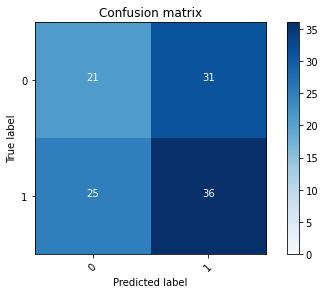

2022-08-22 14:56:52 - [Epoch Train: 99] loss: 0.0231, auc: 0.9998, acc: 0.9918, time: 25.00 s            
2022-08-22 14:56:52 - [Epoch Valid: 99] loss: 2.6940, auc: 0.4726, acc: 0.4876, time: 6.00 s


 99%|█████████████████████████████████████████▌| 99/100 [51:09<00:31, 31.31s/it]

2022-08-22 14:56:52 - EPOCH: 100
2022-08-22 14:56:53 - Train Step 10/485, train_loss: 0.0197
2022-08-22 14:56:53 - Train Step 20/485, train_loss: 0.0218
2022-08-22 14:56:54 - Train Step 30/485, train_loss: 0.0180
2022-08-22 14:56:54 - Train Step 40/485, train_loss: 0.0151
2022-08-22 14:56:55 - Train Step 50/485, train_loss: 0.0256
2022-08-22 14:56:55 - Train Step 60/485, train_loss: 0.0260
2022-08-22 14:56:56 - Train Step 70/485, train_loss: 0.0238
2022-08-22 14:56:56 - Train Step 80/485, train_loss: 0.0211
2022-08-22 14:56:56 - Train Step 90/485, train_loss: 0.0212
2022-08-22 14:56:57 - Train Step 100/485, train_loss: 0.0196
2022-08-22 14:56:57 - Train Step 110/485, train_loss: 0.0186
2022-08-22 14:56:58 - Train Step 120/485, train_loss: 0.0178
2022-08-22 14:56:58 - Train Step 130/485, train_loss: 0.0174
2022-08-22 14:56:59 - Train Step 140/485, train_loss: 0.0165
2022-08-22 14:56:59 - Train Step 150/485, train_loss: 0.0163
2022-08-22 14:57:00 - Train Step 160/485, train_loss: 0.0157


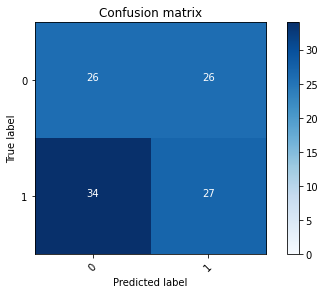

2022-08-22 14:57:23 - [Epoch Train: 100] loss: 0.0228, auc: 1.0000, acc: 0.9959, time: 24.00 s            
2022-08-22 14:57:23 - [Epoch Valid: 100] loss: 2.9849, auc: 0.4653, acc: 0.4545, time: 6.00 s


100%|█████████████████████████████████████████| 100/100 [51:39<00:00, 31.00s/it]

-- FOLD N:1
Train origin: m
Type: KLF
2022-08-22 14:57:23 - (M0) Train/Val datasets size: 270
2022-08-22 14:57:23 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb0986be0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb08acf40>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606


[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 249, 250, 251, 253, 256, 257, 258, 259, 260, 261, 262, 264, 265, 266, 268,

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-22 14:59:16 - EPOCH: 1
2022-08-22 14:59:16 - Train Step 10/485, train_loss: 0.7018
2022-08-22 14:59:17 - Train Step 20/485, train_loss: 0.6963
2022-08-22 14:59:17 - Train Step 30/485, train_loss: 0.6959
2022-08-22 14:59:18 - Train Step 40/485, train_loss: 0.6957
2022-08-22 14:59:18 - Train Step 50/485, train_loss: 0.6951
2022-08-22 14:59:19 - Train Step 60/485, train_loss: 0.6941
2022-08-22 14:59:19 - Train Step 70/485, train_loss: 0.6942
2022-08-22 14:59:20 - Train Step 80/485, train_loss: 0.6947
2022-08-22 14:59:20 - Train Step 90/485, train_loss: 0.6950
2022-08-22 14:59:21 - Train Step 100/485, train_loss: 0.6951
2022-08-22 14:59:21 - Train Step 110/485, train_loss: 0.6947
2022-08-22 14:59:22 - Train Step 120/485, train_loss: 0.6945
2022-08-22 14:59:22 - Train Step 130/485, train_loss: 0.6945
2022-08-22 14:59:23 - Train Step 140/485, train_loss: 0.6945
2022-08-22 14:59:23 - Train Step 150/485, train_loss: 0.6945
2022-08-22 14:59:24 - Train Step 160/485, train_loss: 0.6946
20

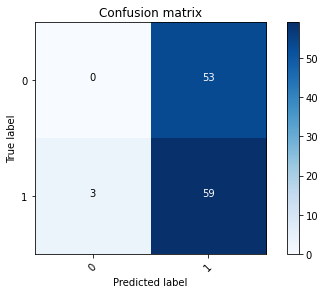

2022-08-22 14:59:47 - [Epoch Train: 1] loss: 0.6941, auc: 0.4383, acc: 0.4660, time: 24.00 s            
2022-08-22 14:59:47 - [Epoch Valid: 1] loss: 0.6921, auc: 0.5736, acc: 0.4876, time: 6.00 s
2022-08-22 14:59:47 - acc improved from 0.0000 to 0.4876. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-59-16/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.692-acc0.488-auc0.574.pth'


  1%|▍                                          | 1/100 [00:31<51:11, 31.03s/it]

2022-08-22 14:59:47 - EPOCH: 2
2022-08-22 14:59:47 - Train Step 10/485, train_loss: 0.6974
2022-08-22 14:59:48 - Train Step 20/485, train_loss: 0.6940
2022-08-22 14:59:48 - Train Step 30/485, train_loss: 0.6934
2022-08-22 14:59:49 - Train Step 40/485, train_loss: 0.6937
2022-08-22 14:59:49 - Train Step 50/485, train_loss: 0.6937
2022-08-22 14:59:50 - Train Step 60/485, train_loss: 0.6926
2022-08-22 14:59:50 - Train Step 70/485, train_loss: 0.6929
2022-08-22 14:59:51 - Train Step 80/485, train_loss: 0.6927
2022-08-22 14:59:51 - Train Step 90/485, train_loss: 0.6927
2022-08-22 14:59:52 - Train Step 100/485, train_loss: 0.6931
2022-08-22 14:59:52 - Train Step 110/485, train_loss: 0.6928
2022-08-22 14:59:53 - Train Step 120/485, train_loss: 0.6929
2022-08-22 14:59:53 - Train Step 130/485, train_loss: 0.6928
2022-08-22 14:59:54 - Train Step 140/485, train_loss: 0.6926
2022-08-22 14:59:54 - Train Step 150/485, train_loss: 0.6928
2022-08-22 14:59:55 - Train Step 160/485, train_loss: 0.6928
20

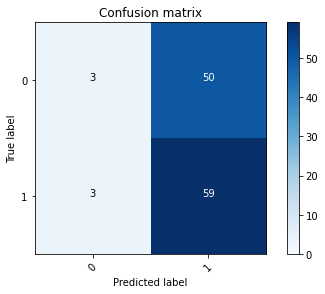

2022-08-22 15:00:18 - [Epoch Train: 2] loss: 0.6928, auc: 0.5115, acc: 0.4825, time: 24.00 s            
2022-08-22 15:00:18 - [Epoch Valid: 2] loss: 0.6914, auc: 0.5898, acc: 0.5289, time: 6.00 s
2022-08-22 15:00:18 - acc improved from 0.4876 to 0.5289. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-59-16/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.691-acc0.529-auc0.590.pth'


  2%|▊                                          | 2/100 [01:02<50:44, 31.07s/it]

2022-08-22 15:00:18 - EPOCH: 3
2022-08-22 15:00:18 - Train Step 10/485, train_loss: 0.6925
2022-08-22 15:00:19 - Train Step 20/485, train_loss: 0.6947
2022-08-22 15:00:19 - Train Step 30/485, train_loss: 0.6920
2022-08-22 15:00:20 - Train Step 40/485, train_loss: 0.6915
2022-08-22 15:00:20 - Train Step 50/485, train_loss: 0.6926
2022-08-22 15:00:21 - Train Step 60/485, train_loss: 0.6934
2022-08-22 15:00:21 - Train Step 70/485, train_loss: 0.6916
2022-08-22 15:00:22 - Train Step 80/485, train_loss: 0.6912
2022-08-22 15:00:22 - Train Step 90/485, train_loss: 0.6909
2022-08-22 15:00:23 - Train Step 100/485, train_loss: 0.6909
2022-08-22 15:00:23 - Train Step 110/485, train_loss: 0.6900
2022-08-22 15:00:24 - Train Step 120/485, train_loss: 0.6909
2022-08-22 15:00:24 - Train Step 130/485, train_loss: 0.6911
2022-08-22 15:00:25 - Train Step 140/485, train_loss: 0.6910
2022-08-22 15:00:25 - Train Step 150/485, train_loss: 0.6913
2022-08-22 15:00:26 - Train Step 160/485, train_loss: 0.6912
20

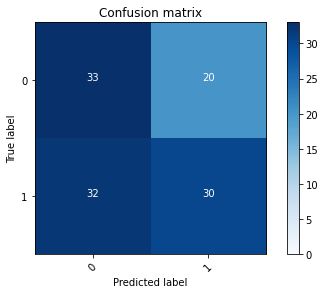

2022-08-22 15:00:49 - [Epoch Train: 3] loss: 0.6905, auc: 0.5872, acc: 0.5670, time: 24.00 s            
2022-08-22 15:00:49 - [Epoch Valid: 3] loss: 0.6906, auc: 0.5727, acc: 0.5702, time: 6.00 s
2022-08-22 15:00:49 - acc improved from 0.5289 to 0.5702. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-59-16/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.691-acc0.570-auc0.573.pth'


  3%|█▎                                         | 3/100 [01:33<50:05, 30.98s/it]

2022-08-22 15:00:49 - EPOCH: 4
2022-08-22 15:00:49 - Train Step 10/485, train_loss: 0.6936
2022-08-22 15:00:50 - Train Step 20/485, train_loss: 0.6886
2022-08-22 15:00:50 - Train Step 30/485, train_loss: 0.6842
2022-08-22 15:00:51 - Train Step 40/485, train_loss: 0.6852
2022-08-22 15:00:51 - Train Step 50/485, train_loss: 0.6838
2022-08-22 15:00:52 - Train Step 60/485, train_loss: 0.6845
2022-08-22 15:00:52 - Train Step 70/485, train_loss: 0.6862
2022-08-22 15:00:53 - Train Step 80/485, train_loss: 0.6847
2022-08-22 15:00:53 - Train Step 90/485, train_loss: 0.6840
2022-08-22 15:00:54 - Train Step 100/485, train_loss: 0.6850
2022-08-22 15:00:54 - Train Step 110/485, train_loss: 0.6860
2022-08-22 15:00:55 - Train Step 120/485, train_loss: 0.6837
2022-08-22 15:00:55 - Train Step 130/485, train_loss: 0.6864
2022-08-22 15:00:56 - Train Step 140/485, train_loss: 0.6867
2022-08-22 15:00:56 - Train Step 150/485, train_loss: 0.6894
2022-08-22 15:00:57 - Train Step 160/485, train_loss: 0.6863
20

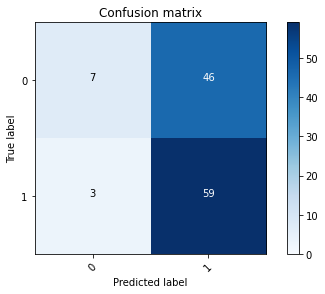

2022-08-22 15:01:19 - [Epoch Train: 4] loss: 0.6865, auc: 0.5785, acc: 0.5485, time: 24.00 s            
2022-08-22 15:01:19 - [Epoch Valid: 4] loss: 0.6886, auc: 0.5733, acc: 0.5620, time: 6.00 s


  4%|█▋                                         | 4/100 [02:03<49:28, 30.92s/it]

2022-08-22 15:01:19 - EPOCH: 5
2022-08-22 15:01:20 - Train Step 10/485, train_loss: 0.6776
2022-08-22 15:01:21 - Train Step 20/485, train_loss: 0.6904
2022-08-22 15:01:21 - Train Step 30/485, train_loss: 0.6781
2022-08-22 15:01:22 - Train Step 40/485, train_loss: 0.6813
2022-08-22 15:01:22 - Train Step 50/485, train_loss: 0.6842
2022-08-22 15:01:23 - Train Step 60/485, train_loss: 0.6839
2022-08-22 15:01:23 - Train Step 70/485, train_loss: 0.6845
2022-08-22 15:01:24 - Train Step 80/485, train_loss: 0.6863
2022-08-22 15:01:24 - Train Step 90/485, train_loss: 0.6889
2022-08-22 15:01:25 - Train Step 100/485, train_loss: 0.6873
2022-08-22 15:01:25 - Train Step 110/485, train_loss: 0.6880
2022-08-22 15:01:26 - Train Step 120/485, train_loss: 0.6861
2022-08-22 15:01:26 - Train Step 130/485, train_loss: 0.6866
2022-08-22 15:01:27 - Train Step 140/485, train_loss: 0.6869
2022-08-22 15:01:27 - Train Step 150/485, train_loss: 0.6871
2022-08-22 15:01:28 - Train Step 160/485, train_loss: 0.6846
20

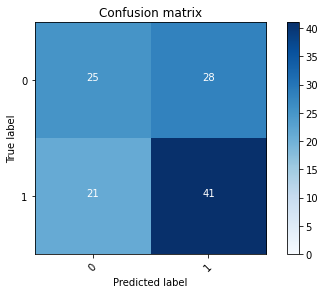

2022-08-22 15:01:50 - [Epoch Train: 5] loss: 0.6817, auc: 0.6073, acc: 0.5608, time: 24.00 s            
2022-08-22 15:01:50 - [Epoch Valid: 5] loss: 0.6875, auc: 0.5587, acc: 0.5868, time: 6.00 s
2022-08-22 15:01:50 - acc improved from 0.5702 to 0.5868. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-59-16/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.687-acc0.587-auc0.559.pth'


  5%|██▏                                        | 5/100 [02:34<48:56, 30.91s/it]

2022-08-22 15:01:50 - EPOCH: 6
2022-08-22 15:01:51 - Train Step 10/485, train_loss: 0.6923
2022-08-22 15:01:51 - Train Step 20/485, train_loss: 0.6760
2022-08-22 15:01:52 - Train Step 30/485, train_loss: 0.6698
2022-08-22 15:01:52 - Train Step 40/485, train_loss: 0.6771
2022-08-22 15:01:53 - Train Step 50/485, train_loss: 0.6731
2022-08-22 15:01:53 - Train Step 60/485, train_loss: 0.6714
2022-08-22 15:01:54 - Train Step 70/485, train_loss: 0.6718
2022-08-22 15:01:54 - Train Step 80/485, train_loss: 0.6668
2022-08-22 15:01:55 - Train Step 90/485, train_loss: 0.6677
2022-08-22 15:01:55 - Train Step 100/485, train_loss: 0.6663
2022-08-22 15:01:56 - Train Step 110/485, train_loss: 0.6639
2022-08-22 15:01:56 - Train Step 120/485, train_loss: 0.6684
2022-08-22 15:01:57 - Train Step 130/485, train_loss: 0.6728
2022-08-22 15:01:57 - Train Step 140/485, train_loss: 0.6736
2022-08-22 15:01:58 - Train Step 150/485, train_loss: 0.6673
2022-08-22 15:01:58 - Train Step 160/485, train_loss: 0.6712
20

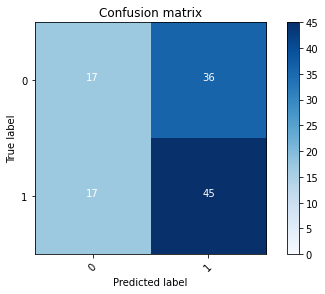

2022-08-22 15:02:21 - [Epoch Train: 6] loss: 0.6732, auc: 0.6430, acc: 0.6103, time: 24.00 s            
2022-08-22 15:02:21 - [Epoch Valid: 6] loss: 0.6878, auc: 0.5499, acc: 0.5455, time: 6.00 s


  6%|██▌                                        | 6/100 [03:05<48:24, 30.90s/it]

2022-08-22 15:02:21 - EPOCH: 7
2022-08-22 15:02:22 - Train Step 10/485, train_loss: 0.6815
2022-08-22 15:02:22 - Train Step 20/485, train_loss: 0.6478
2022-08-22 15:02:23 - Train Step 30/485, train_loss: 0.6472
2022-08-22 15:02:23 - Train Step 40/485, train_loss: 0.6374
2022-08-22 15:02:24 - Train Step 50/485, train_loss: 0.6437
2022-08-22 15:02:24 - Train Step 60/485, train_loss: 0.6487
2022-08-22 15:02:25 - Train Step 70/485, train_loss: 0.6556
2022-08-22 15:02:25 - Train Step 80/485, train_loss: 0.6565
2022-08-22 15:02:26 - Train Step 90/485, train_loss: 0.6604
2022-08-22 15:02:26 - Train Step 100/485, train_loss: 0.6594
2022-08-22 15:02:27 - Train Step 110/485, train_loss: 0.6582
2022-08-22 15:02:27 - Train Step 120/485, train_loss: 0.6582
2022-08-22 15:02:28 - Train Step 130/485, train_loss: 0.6566
2022-08-22 15:02:28 - Train Step 140/485, train_loss: 0.6619
2022-08-22 15:02:29 - Train Step 150/485, train_loss: 0.6618
2022-08-22 15:02:29 - Train Step 160/485, train_loss: 0.6642
20

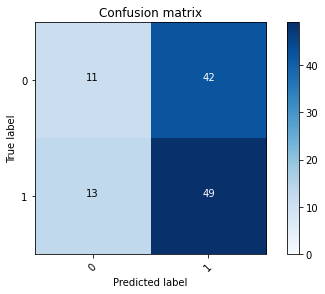

2022-08-22 15:02:52 - [Epoch Train: 7] loss: 0.6614, auc: 0.6762, acc: 0.6206, time: 24.00 s            
2022-08-22 15:02:52 - [Epoch Valid: 7] loss: 0.6935, auc: 0.5277, acc: 0.5207, time: 6.00 s


  7%|███                                        | 7/100 [03:36<47:58, 30.95s/it]

2022-08-22 15:02:52 - EPOCH: 8
2022-08-22 15:02:53 - Train Step 10/485, train_loss: 0.6924
2022-08-22 15:02:53 - Train Step 20/485, train_loss: 0.6700
2022-08-22 15:02:54 - Train Step 30/485, train_loss: 0.6666
2022-08-22 15:02:54 - Train Step 40/485, train_loss: 0.6591
2022-08-22 15:02:55 - Train Step 50/485, train_loss: 0.6552
2022-08-22 15:02:55 - Train Step 60/485, train_loss: 0.6480
2022-08-22 15:02:56 - Train Step 70/485, train_loss: 0.6534
2022-08-22 15:02:56 - Train Step 80/485, train_loss: 0.6629
2022-08-22 15:02:57 - Train Step 90/485, train_loss: 0.6597
2022-08-22 15:02:57 - Train Step 100/485, train_loss: 0.6572
2022-08-22 15:02:58 - Train Step 110/485, train_loss: 0.6589
2022-08-22 15:02:58 - Train Step 120/485, train_loss: 0.6567
2022-08-22 15:02:59 - Train Step 130/485, train_loss: 0.6525
2022-08-22 15:02:59 - Train Step 140/485, train_loss: 0.6517
2022-08-22 15:03:00 - Train Step 150/485, train_loss: 0.6517
2022-08-22 15:03:00 - Train Step 160/485, train_loss: 0.6528
20

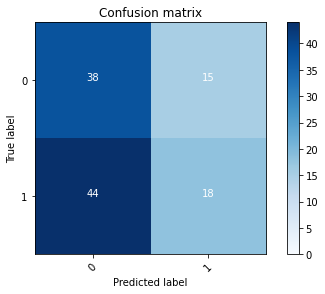

2022-08-22 15:03:23 - [Epoch Train: 8] loss: 0.6487, auc: 0.6974, acc: 0.6577, time: 24.00 s            
2022-08-22 15:03:23 - [Epoch Valid: 8] loss: 0.7070, auc: 0.4924, acc: 0.5041, time: 6.00 s


  8%|███▍                                       | 8/100 [04:07<47:25, 30.93s/it]

2022-08-22 15:03:23 - EPOCH: 9
2022-08-22 15:03:24 - Train Step 10/485, train_loss: 0.6869
2022-08-22 15:03:24 - Train Step 20/485, train_loss: 0.6559
2022-08-22 15:03:25 - Train Step 30/485, train_loss: 0.6270
2022-08-22 15:03:25 - Train Step 40/485, train_loss: 0.6319
2022-08-22 15:03:26 - Train Step 50/485, train_loss: 0.6589
2022-08-22 15:03:26 - Train Step 60/485, train_loss: 0.6544
2022-08-22 15:03:27 - Train Step 70/485, train_loss: 0.6460
2022-08-22 15:03:27 - Train Step 80/485, train_loss: 0.6352
2022-08-22 15:03:28 - Train Step 90/485, train_loss: 0.6392
2022-08-22 15:03:28 - Train Step 100/485, train_loss: 0.6452
2022-08-22 15:03:29 - Train Step 110/485, train_loss: 0.6462
2022-08-22 15:03:29 - Train Step 120/485, train_loss: 0.6374
2022-08-22 15:03:30 - Train Step 130/485, train_loss: 0.6413
2022-08-22 15:03:30 - Train Step 140/485, train_loss: 0.6388
2022-08-22 15:03:31 - Train Step 150/485, train_loss: 0.6299
2022-08-22 15:03:31 - Train Step 160/485, train_loss: 0.6283
20

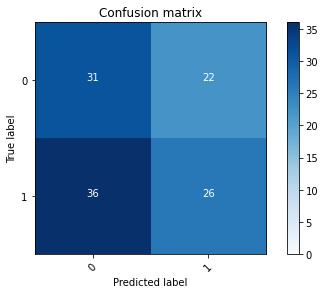

2022-08-22 15:03:54 - [Epoch Train: 9] loss: 0.6249, auc: 0.7373, acc: 0.6515, time: 24.00 s            
2022-08-22 15:03:54 - [Epoch Valid: 9] loss: 0.7132, auc: 0.4796, acc: 0.5124, time: 6.00 s


  9%|███▊                                       | 9/100 [04:38<46:49, 30.87s/it]

2022-08-22 15:03:54 - EPOCH: 10
2022-08-22 15:03:55 - Train Step 10/485, train_loss: 0.5663
2022-08-22 15:03:55 - Train Step 20/485, train_loss: 0.5330
2022-08-22 15:03:56 - Train Step 30/485, train_loss: 0.5762
2022-08-22 15:03:56 - Train Step 40/485, train_loss: 0.6047
2022-08-22 15:03:57 - Train Step 50/485, train_loss: 0.6335
2022-08-22 15:03:57 - Train Step 60/485, train_loss: 0.6378
2022-08-22 15:03:58 - Train Step 70/485, train_loss: 0.6489
2022-08-22 15:03:58 - Train Step 80/485, train_loss: 0.6301
2022-08-22 15:03:59 - Train Step 90/485, train_loss: 0.6217
2022-08-22 15:03:59 - Train Step 100/485, train_loss: 0.6072
2022-08-22 15:04:00 - Train Step 110/485, train_loss: 0.6133
2022-08-22 15:04:00 - Train Step 120/485, train_loss: 0.6157
2022-08-22 15:04:01 - Train Step 130/485, train_loss: 0.6194
2022-08-22 15:04:01 - Train Step 140/485, train_loss: 0.6164
2022-08-22 15:04:02 - Train Step 150/485, train_loss: 0.6166
2022-08-22 15:04:02 - Train Step 160/485, train_loss: 0.6230
2

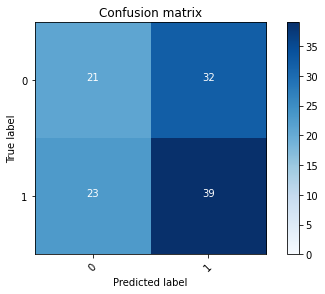

2022-08-22 15:04:25 - [Epoch Train: 10] loss: 0.6136, auc: 0.7373, acc: 0.6969, time: 24.00 s            
2022-08-22 15:04:25 - [Epoch Valid: 10] loss: 0.7158, auc: 0.4884, acc: 0.5372, time: 6.00 s


 10%|████▏                                     | 10/100 [05:09<46:26, 30.96s/it]

2022-08-22 15:04:25 - EPOCH: 11
2022-08-22 15:04:26 - Train Step 10/485, train_loss: 0.5963
2022-08-22 15:04:26 - Train Step 20/485, train_loss: 0.5792
2022-08-22 15:04:27 - Train Step 30/485, train_loss: 0.5797
2022-08-22 15:04:27 - Train Step 40/485, train_loss: 0.5985
2022-08-22 15:04:28 - Train Step 50/485, train_loss: 0.5887
2022-08-22 15:04:28 - Train Step 60/485, train_loss: 0.5943
2022-08-22 15:04:29 - Train Step 70/485, train_loss: 0.5979
2022-08-22 15:04:29 - Train Step 80/485, train_loss: 0.5796
2022-08-22 15:04:30 - Train Step 90/485, train_loss: 0.5989
2022-08-22 15:04:30 - Train Step 100/485, train_loss: 0.5885
2022-08-22 15:04:31 - Train Step 110/485, train_loss: 0.5952
2022-08-22 15:04:31 - Train Step 120/485, train_loss: 0.5898
2022-08-22 15:04:32 - Train Step 130/485, train_loss: 0.5895
2022-08-22 15:04:32 - Train Step 140/485, train_loss: 0.5889
2022-08-22 15:04:33 - Train Step 150/485, train_loss: 0.5892
2022-08-22 15:04:33 - Train Step 160/485, train_loss: 0.5900
2

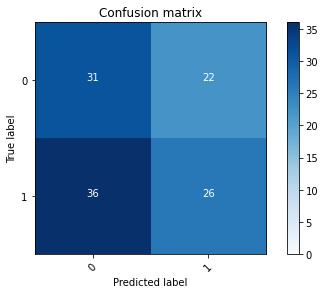

2022-08-22 15:04:56 - [Epoch Train: 11] loss: 0.5987, auc: 0.7598, acc: 0.7052, time: 24.00 s            
2022-08-22 15:04:56 - [Epoch Valid: 11] loss: 0.7242, auc: 0.4757, acc: 0.5124, time: 6.00 s


 11%|████▌                                     | 11/100 [05:40<45:51, 30.91s/it]

2022-08-22 15:04:56 - EPOCH: 12
2022-08-22 15:04:56 - Train Step 10/485, train_loss: 0.5008
2022-08-22 15:04:57 - Train Step 20/485, train_loss: 0.5458
2022-08-22 15:04:57 - Train Step 30/485, train_loss: 0.5806
2022-08-22 15:04:58 - Train Step 40/485, train_loss: 0.5861
2022-08-22 15:04:58 - Train Step 50/485, train_loss: 0.5786
2022-08-22 15:04:59 - Train Step 60/485, train_loss: 0.5764
2022-08-22 15:04:59 - Train Step 70/485, train_loss: 0.5930
2022-08-22 15:05:00 - Train Step 80/485, train_loss: 0.5811
2022-08-22 15:05:00 - Train Step 90/485, train_loss: 0.5902
2022-08-22 15:05:01 - Train Step 100/485, train_loss: 0.5988
2022-08-22 15:05:01 - Train Step 110/485, train_loss: 0.6031
2022-08-22 15:05:02 - Train Step 120/485, train_loss: 0.6037
2022-08-22 15:05:02 - Train Step 130/485, train_loss: 0.5914
2022-08-22 15:05:03 - Train Step 140/485, train_loss: 0.5914
2022-08-22 15:05:03 - Train Step 150/485, train_loss: 0.5969
2022-08-22 15:05:04 - Train Step 160/485, train_loss: 0.5942
2

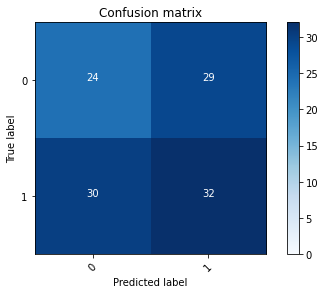

2022-08-22 15:05:27 - [Epoch Train: 12] loss: 0.5804, auc: 0.7841, acc: 0.6990, time: 24.00 s            
2022-08-22 15:05:27 - [Epoch Valid: 12] loss: 0.7282, auc: 0.4747, acc: 0.5041, time: 6.00 s


 12%|█████                                     | 12/100 [06:11<45:25, 30.97s/it]

2022-08-22 15:05:27 - EPOCH: 13
2022-08-22 15:05:28 - Train Step 10/485, train_loss: 0.4917
2022-08-22 15:05:28 - Train Step 20/485, train_loss: 0.5273
2022-08-22 15:05:29 - Train Step 30/485, train_loss: 0.5547
2022-08-22 15:05:29 - Train Step 40/485, train_loss: 0.5768
2022-08-22 15:05:30 - Train Step 50/485, train_loss: 0.5714
2022-08-22 15:05:30 - Train Step 60/485, train_loss: 0.5775
2022-08-22 15:05:31 - Train Step 70/485, train_loss: 0.5790
2022-08-22 15:05:31 - Train Step 80/485, train_loss: 0.5777
2022-08-22 15:05:32 - Train Step 90/485, train_loss: 0.5701
2022-08-22 15:05:32 - Train Step 100/485, train_loss: 0.5680
2022-08-22 15:05:33 - Train Step 110/485, train_loss: 0.5725
2022-08-22 15:05:33 - Train Step 120/485, train_loss: 0.5546
2022-08-22 15:05:34 - Train Step 130/485, train_loss: 0.5454
2022-08-22 15:05:34 - Train Step 140/485, train_loss: 0.5430
2022-08-22 15:05:35 - Train Step 150/485, train_loss: 0.5415
2022-08-22 15:05:35 - Train Step 160/485, train_loss: 0.5341
2

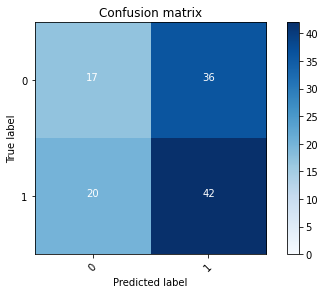

2022-08-22 15:05:58 - [Epoch Train: 13] loss: 0.5711, auc: 0.7920, acc: 0.7278, time: 24.00 s            
2022-08-22 15:05:58 - [Epoch Valid: 13] loss: 0.7381, auc: 0.4766, acc: 0.5207, time: 6.00 s


 13%|█████▍                                    | 13/100 [06:42<44:51, 30.93s/it]

2022-08-22 15:05:58 - EPOCH: 14
2022-08-22 15:05:58 - Train Step 10/485, train_loss: 0.5855
2022-08-22 15:05:59 - Train Step 20/485, train_loss: 0.5201
2022-08-22 15:05:59 - Train Step 30/485, train_loss: 0.5994
2022-08-22 15:06:00 - Train Step 40/485, train_loss: 0.6241
2022-08-22 15:06:00 - Train Step 50/485, train_loss: 0.6288
2022-08-22 15:06:01 - Train Step 60/485, train_loss: 0.6052
2022-08-22 15:06:01 - Train Step 70/485, train_loss: 0.6087
2022-08-22 15:06:02 - Train Step 80/485, train_loss: 0.6159
2022-08-22 15:06:02 - Train Step 90/485, train_loss: 0.6107
2022-08-22 15:06:03 - Train Step 100/485, train_loss: 0.6035
2022-08-22 15:06:03 - Train Step 110/485, train_loss: 0.5914
2022-08-22 15:06:04 - Train Step 120/485, train_loss: 0.5883
2022-08-22 15:06:04 - Train Step 130/485, train_loss: 0.5864
2022-08-22 15:06:05 - Train Step 140/485, train_loss: 0.5765
2022-08-22 15:06:05 - Train Step 150/485, train_loss: 0.5688
2022-08-22 15:06:06 - Train Step 160/485, train_loss: 0.5683
2

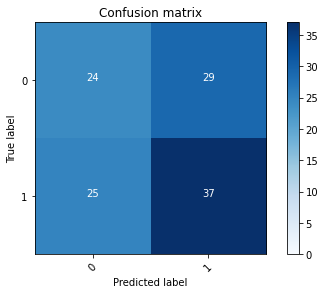

2022-08-22 15:06:28 - [Epoch Train: 14] loss: 0.5530, auc: 0.8041, acc: 0.7258, time: 24.00 s            
2022-08-22 15:06:28 - [Epoch Valid: 14] loss: 0.7479, auc: 0.4726, acc: 0.5455, time: 6.00 s


 14%|█████▉                                    | 14/100 [07:12<44:11, 30.83s/it]

2022-08-22 15:06:28 - EPOCH: 15
2022-08-22 15:06:29 - Train Step 10/485, train_loss: 0.5216
2022-08-22 15:06:30 - Train Step 20/485, train_loss: 0.5144
2022-08-22 15:06:30 - Train Step 30/485, train_loss: 0.6010
2022-08-22 15:06:31 - Train Step 40/485, train_loss: 0.5757
2022-08-22 15:06:31 - Train Step 50/485, train_loss: 0.5561
2022-08-22 15:06:31 - Train Step 60/485, train_loss: 0.5457
2022-08-22 15:06:32 - Train Step 70/485, train_loss: 0.5800
2022-08-22 15:06:32 - Train Step 80/485, train_loss: 0.5680
2022-08-22 15:06:33 - Train Step 90/485, train_loss: 0.5610
2022-08-22 15:06:33 - Train Step 100/485, train_loss: 0.5619
2022-08-22 15:06:34 - Train Step 110/485, train_loss: 0.5642
2022-08-22 15:06:34 - Train Step 120/485, train_loss: 0.5577
2022-08-22 15:06:35 - Train Step 130/485, train_loss: 0.5603
2022-08-22 15:06:35 - Train Step 140/485, train_loss: 0.5556
2022-08-22 15:06:36 - Train Step 150/485, train_loss: 0.5525
2022-08-22 15:06:36 - Train Step 160/485, train_loss: 0.5493
2

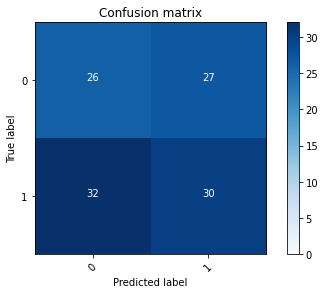

2022-08-22 15:06:59 - [Epoch Train: 15] loss: 0.5468, auc: 0.8121, acc: 0.7526, time: 24.00 s            
2022-08-22 15:06:59 - [Epoch Valid: 15] loss: 0.7543, auc: 0.4680, acc: 0.5041, time: 6.00 s


 15%|██████▎                                   | 15/100 [07:43<43:43, 30.87s/it]

2022-08-22 15:06:59 - EPOCH: 16
2022-08-22 15:07:00 - Train Step 10/485, train_loss: 0.6204
2022-08-22 15:07:00 - Train Step 20/485, train_loss: 0.5805
2022-08-22 15:07:01 - Train Step 30/485, train_loss: 0.5766
2022-08-22 15:07:02 - Train Step 40/485, train_loss: 0.5468
2022-08-22 15:07:02 - Train Step 50/485, train_loss: 0.5371
2022-08-22 15:07:03 - Train Step 60/485, train_loss: 0.5243
2022-08-22 15:07:03 - Train Step 70/485, train_loss: 0.5451
2022-08-22 15:07:03 - Train Step 80/485, train_loss: 0.5443
2022-08-22 15:07:04 - Train Step 90/485, train_loss: 0.5415
2022-08-22 15:07:04 - Train Step 100/485, train_loss: 0.5503
2022-08-22 15:07:05 - Train Step 110/485, train_loss: 0.5462
2022-08-22 15:07:05 - Train Step 120/485, train_loss: 0.5400
2022-08-22 15:07:06 - Train Step 130/485, train_loss: 0.5452
2022-08-22 15:07:06 - Train Step 140/485, train_loss: 0.5622
2022-08-22 15:07:07 - Train Step 150/485, train_loss: 0.5655
2022-08-22 15:07:07 - Train Step 160/485, train_loss: 0.5630
2

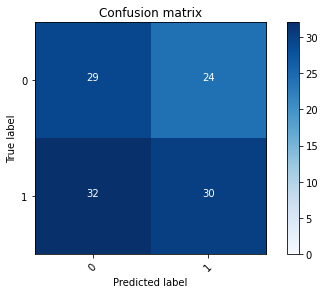

2022-08-22 15:07:30 - [Epoch Train: 16] loss: 0.5471, auc: 0.8019, acc: 0.7402, time: 24.00 s            
2022-08-22 15:07:30 - [Epoch Valid: 16] loss: 0.7528, auc: 0.4677, acc: 0.5289, time: 6.00 s


 16%|██████▋                                   | 16/100 [08:14<43:11, 30.86s/it]

2022-08-22 15:07:30 - EPOCH: 17
2022-08-22 15:07:31 - Train Step 10/485, train_loss: 0.6349
2022-08-22 15:07:31 - Train Step 20/485, train_loss: 0.6582
2022-08-22 15:07:32 - Train Step 30/485, train_loss: 0.6082
2022-08-22 15:07:32 - Train Step 40/485, train_loss: 0.6476
2022-08-22 15:07:33 - Train Step 50/485, train_loss: 0.6228
2022-08-22 15:07:33 - Train Step 60/485, train_loss: 0.5975
2022-08-22 15:07:34 - Train Step 70/485, train_loss: 0.5694
2022-08-22 15:07:34 - Train Step 80/485, train_loss: 0.5827
2022-08-22 15:07:35 - Train Step 90/485, train_loss: 0.5792
2022-08-22 15:07:35 - Train Step 100/485, train_loss: 0.6131
2022-08-22 15:07:36 - Train Step 110/485, train_loss: 0.6012
2022-08-22 15:07:36 - Train Step 120/485, train_loss: 0.6030
2022-08-22 15:07:37 - Train Step 130/485, train_loss: 0.5978
2022-08-22 15:07:37 - Train Step 140/485, train_loss: 0.5817
2022-08-22 15:07:38 - Train Step 150/485, train_loss: 0.5878
2022-08-22 15:07:38 - Train Step 160/485, train_loss: 0.5830
2

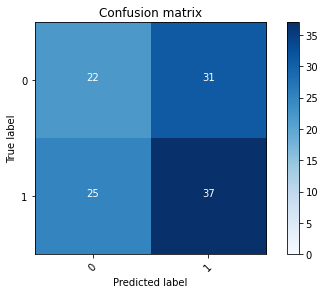

2022-08-22 15:08:01 - [Epoch Train: 17] loss: 0.5345, auc: 0.8211, acc: 0.7443, time: 24.00 s            
2022-08-22 15:08:01 - [Epoch Valid: 17] loss: 0.7638, auc: 0.4732, acc: 0.5207, time: 6.00 s


 17%|███████▏                                  | 17/100 [08:45<42:50, 30.97s/it]

2022-08-22 15:08:01 - EPOCH: 18
2022-08-22 15:08:02 - Train Step 10/485, train_loss: 0.5482
2022-08-22 15:08:03 - Train Step 20/485, train_loss: 0.5123
2022-08-22 15:08:03 - Train Step 30/485, train_loss: 0.5220
2022-08-22 15:08:04 - Train Step 40/485, train_loss: 0.5237
2022-08-22 15:08:04 - Train Step 50/485, train_loss: 0.5341
2022-08-22 15:08:05 - Train Step 60/485, train_loss: 0.5280
2022-08-22 15:08:05 - Train Step 70/485, train_loss: 0.5154
2022-08-22 15:08:06 - Train Step 80/485, train_loss: 0.5126
2022-08-22 15:08:06 - Train Step 90/485, train_loss: 0.5120
2022-08-22 15:08:07 - Train Step 100/485, train_loss: 0.5297
2022-08-22 15:08:07 - Train Step 110/485, train_loss: 0.5219
2022-08-22 15:08:08 - Train Step 120/485, train_loss: 0.5369
2022-08-22 15:08:08 - Train Step 130/485, train_loss: 0.5313
2022-08-22 15:08:09 - Train Step 140/485, train_loss: 0.5383
2022-08-22 15:08:09 - Train Step 150/485, train_loss: 0.5318
2022-08-22 15:08:10 - Train Step 160/485, train_loss: 0.5540
2

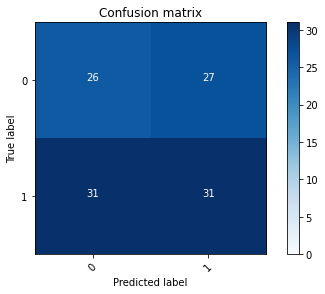

2022-08-22 15:08:32 - [Epoch Train: 18] loss: 0.5292, auc: 0.8161, acc: 0.7464, time: 24.00 s            
2022-08-22 15:08:32 - [Epoch Valid: 18] loss: 0.7825, auc: 0.4674, acc: 0.5124, time: 6.00 s


 18%|███████▌                                  | 18/100 [09:16<42:21, 30.99s/it]

2022-08-22 15:08:32 - EPOCH: 19
2022-08-22 15:08:33 - Train Step 10/485, train_loss: 0.3915
2022-08-22 15:08:34 - Train Step 20/485, train_loss: 0.4109
2022-08-22 15:08:34 - Train Step 30/485, train_loss: 0.4750
2022-08-22 15:08:35 - Train Step 40/485, train_loss: 0.4697
2022-08-22 15:08:35 - Train Step 50/485, train_loss: 0.4662
2022-08-22 15:08:36 - Train Step 60/485, train_loss: 0.4771
2022-08-22 15:08:36 - Train Step 70/485, train_loss: 0.4729
2022-08-22 15:08:37 - Train Step 80/485, train_loss: 0.4845
2022-08-22 15:08:37 - Train Step 90/485, train_loss: 0.4845
2022-08-22 15:08:38 - Train Step 100/485, train_loss: 0.4972
2022-08-22 15:08:38 - Train Step 110/485, train_loss: 0.4994
2022-08-22 15:08:39 - Train Step 120/485, train_loss: 0.4979
2022-08-22 15:08:39 - Train Step 130/485, train_loss: 0.5030
2022-08-22 15:08:40 - Train Step 140/485, train_loss: 0.5036
2022-08-22 15:08:40 - Train Step 150/485, train_loss: 0.5034
2022-08-22 15:08:41 - Train Step 160/485, train_loss: 0.5023
2

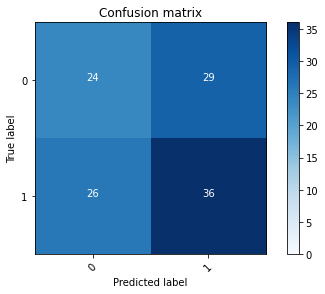

2022-08-22 15:09:03 - [Epoch Train: 19] loss: 0.5236, auc: 0.8233, acc: 0.7567, time: 24.00 s            
2022-08-22 15:09:03 - [Epoch Valid: 19] loss: 0.7624, auc: 0.4830, acc: 0.5289, time: 6.00 s


 19%|███████▉                                  | 19/100 [09:47<41:47, 30.95s/it]

2022-08-22 15:09:03 - EPOCH: 20
2022-08-22 15:09:04 - Train Step 10/485, train_loss: 0.3823
2022-08-22 15:09:04 - Train Step 20/485, train_loss: 0.3544
2022-08-22 15:09:05 - Train Step 30/485, train_loss: 0.3823
2022-08-22 15:09:05 - Train Step 40/485, train_loss: 0.3930
2022-08-22 15:09:06 - Train Step 50/485, train_loss: 0.4073
2022-08-22 15:09:06 - Train Step 60/485, train_loss: 0.4161
2022-08-22 15:09:07 - Train Step 70/485, train_loss: 0.4479
2022-08-22 15:09:07 - Train Step 80/485, train_loss: 0.4821
2022-08-22 15:09:08 - Train Step 90/485, train_loss: 0.4666
2022-08-22 15:09:09 - Train Step 100/485, train_loss: 0.4641
2022-08-22 15:09:09 - Train Step 110/485, train_loss: 0.4679
2022-08-22 15:09:10 - Train Step 120/485, train_loss: 0.4584
2022-08-22 15:09:10 - Train Step 130/485, train_loss: 0.4565
2022-08-22 15:09:11 - Train Step 140/485, train_loss: 0.4569
2022-08-22 15:09:11 - Train Step 150/485, train_loss: 0.4559
2022-08-22 15:09:12 - Train Step 160/485, train_loss: 0.4519
2

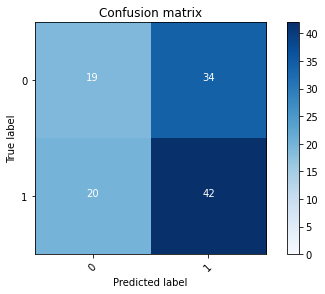

2022-08-22 15:09:34 - [Epoch Train: 20] loss: 0.5084, auc: 0.8384, acc: 0.7608, time: 24.00 s            
2022-08-22 15:09:34 - [Epoch Valid: 20] loss: 0.7668, auc: 0.4848, acc: 0.5372, time: 6.00 s


 20%|████████▍                                 | 20/100 [10:18<41:13, 30.92s/it]

2022-08-22 15:09:34 - EPOCH: 21
2022-08-22 15:09:35 - Train Step 10/485, train_loss: 0.4588
2022-08-22 15:09:35 - Train Step 20/485, train_loss: 0.4882
2022-08-22 15:09:36 - Train Step 30/485, train_loss: 0.4505
2022-08-22 15:09:36 - Train Step 40/485, train_loss: 0.5031
2022-08-22 15:09:37 - Train Step 50/485, train_loss: 0.4849
2022-08-22 15:09:37 - Train Step 60/485, train_loss: 0.5040
2022-08-22 15:09:38 - Train Step 70/485, train_loss: 0.4933
2022-08-22 15:09:38 - Train Step 80/485, train_loss: 0.5259
2022-08-22 15:09:39 - Train Step 90/485, train_loss: 0.5212
2022-08-22 15:09:39 - Train Step 100/485, train_loss: 0.5356
2022-08-22 15:09:40 - Train Step 110/485, train_loss: 0.5280
2022-08-22 15:09:40 - Train Step 120/485, train_loss: 0.5342
2022-08-22 15:09:41 - Train Step 130/485, train_loss: 0.5357
2022-08-22 15:09:41 - Train Step 140/485, train_loss: 0.5259
2022-08-22 15:09:42 - Train Step 150/485, train_loss: 0.5231
2022-08-22 15:09:42 - Train Step 160/485, train_loss: 0.5294
2

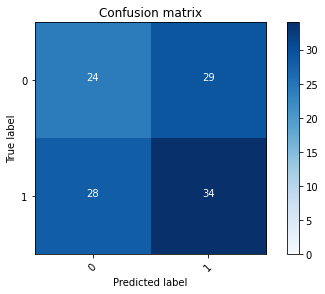

2022-08-22 15:10:05 - [Epoch Train: 21] loss: 0.5066, auc: 0.8398, acc: 0.7711, time: 24.00 s            
2022-08-22 15:10:05 - [Epoch Valid: 21] loss: 0.7788, auc: 0.4814, acc: 0.5207, time: 6.00 s


 21%|████████▊                                 | 21/100 [10:49<40:40, 30.90s/it]

2022-08-22 15:10:05 - EPOCH: 22
2022-08-22 15:10:06 - Train Step 10/485, train_loss: 0.5451
2022-08-22 15:10:06 - Train Step 20/485, train_loss: 0.5923
2022-08-22 15:10:07 - Train Step 30/485, train_loss: 0.5777
2022-08-22 15:10:07 - Train Step 40/485, train_loss: 0.6344
2022-08-22 15:10:08 - Train Step 50/485, train_loss: 0.5914
2022-08-22 15:10:08 - Train Step 60/485, train_loss: 0.5720
2022-08-22 15:10:09 - Train Step 70/485, train_loss: 0.5589
2022-08-22 15:10:09 - Train Step 80/485, train_loss: 0.5377
2022-08-22 15:10:10 - Train Step 90/485, train_loss: 0.5473
2022-08-22 15:10:10 - Train Step 100/485, train_loss: 0.5449
2022-08-22 15:10:11 - Train Step 110/485, train_loss: 0.5293
2022-08-22 15:10:11 - Train Step 120/485, train_loss: 0.5255
2022-08-22 15:10:12 - Train Step 130/485, train_loss: 0.5228
2022-08-22 15:10:12 - Train Step 140/485, train_loss: 0.5169
2022-08-22 15:10:13 - Train Step 150/485, train_loss: 0.5068
2022-08-22 15:10:13 - Train Step 160/485, train_loss: 0.4918
2

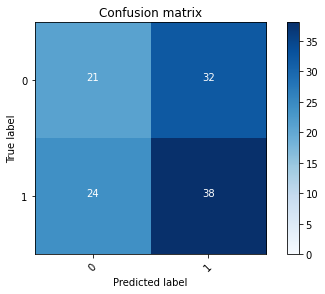

2022-08-22 15:10:36 - [Epoch Train: 22] loss: 0.4980, auc: 0.8439, acc: 0.7959, time: 24.00 s            
2022-08-22 15:10:36 - [Epoch Valid: 22] loss: 0.7685, auc: 0.4851, acc: 0.5207, time: 6.00 s


 22%|█████████▏                                | 22/100 [11:20<40:11, 30.91s/it]

2022-08-22 15:10:36 - EPOCH: 23
2022-08-22 15:10:37 - Train Step 10/485, train_loss: 0.4543
2022-08-22 15:10:37 - Train Step 20/485, train_loss: 0.4580
2022-08-22 15:10:38 - Train Step 30/485, train_loss: 0.4202
2022-08-22 15:10:38 - Train Step 40/485, train_loss: 0.4309
2022-08-22 15:10:39 - Train Step 50/485, train_loss: 0.4402
2022-08-22 15:10:39 - Train Step 60/485, train_loss: 0.4381
2022-08-22 15:10:40 - Train Step 70/485, train_loss: 0.4342
2022-08-22 15:10:40 - Train Step 80/485, train_loss: 0.4405
2022-08-22 15:10:41 - Train Step 90/485, train_loss: 0.4595
2022-08-22 15:10:41 - Train Step 100/485, train_loss: 0.4533
2022-08-22 15:10:42 - Train Step 110/485, train_loss: 0.4488
2022-08-22 15:10:42 - Train Step 120/485, train_loss: 0.4584
2022-08-22 15:10:42 - Train Step 130/485, train_loss: 0.4533
2022-08-22 15:10:43 - Train Step 140/485, train_loss: 0.4586
2022-08-22 15:10:43 - Train Step 150/485, train_loss: 0.4659
2022-08-22 15:10:44 - Train Step 160/485, train_loss: 0.4683
2

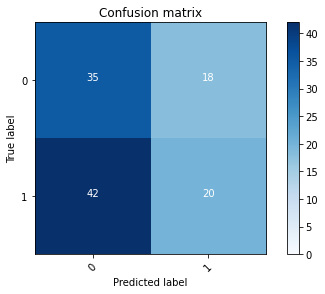

2022-08-22 15:11:07 - [Epoch Train: 23] loss: 0.4882, auc: 0.8532, acc: 0.7691, time: 24.00 s            
2022-08-22 15:11:07 - [Epoch Valid: 23] loss: 0.8017, auc: 0.4699, acc: 0.4959, time: 6.00 s


 23%|█████████▋                                | 23/100 [11:51<39:36, 30.86s/it]

2022-08-22 15:11:07 - EPOCH: 24
2022-08-22 15:11:07 - Train Step 10/485, train_loss: 0.5950
2022-08-22 15:11:08 - Train Step 20/485, train_loss: 0.6430
2022-08-22 15:11:08 - Train Step 30/485, train_loss: 0.5756
2022-08-22 15:11:09 - Train Step 40/485, train_loss: 0.5401
2022-08-22 15:11:09 - Train Step 50/485, train_loss: 0.5514
2022-08-22 15:11:10 - Train Step 60/485, train_loss: 0.5542
2022-08-22 15:11:10 - Train Step 70/485, train_loss: 0.5409
2022-08-22 15:11:11 - Train Step 80/485, train_loss: 0.5275
2022-08-22 15:11:11 - Train Step 90/485, train_loss: 0.5185
2022-08-22 15:11:12 - Train Step 100/485, train_loss: 0.5002
2022-08-22 15:11:12 - Train Step 110/485, train_loss: 0.5044
2022-08-22 15:11:13 - Train Step 120/485, train_loss: 0.4942
2022-08-22 15:11:13 - Train Step 130/485, train_loss: 0.4732
2022-08-22 15:11:14 - Train Step 140/485, train_loss: 0.4727
2022-08-22 15:11:14 - Train Step 150/485, train_loss: 0.4785
2022-08-22 15:11:15 - Train Step 160/485, train_loss: 0.4719
2

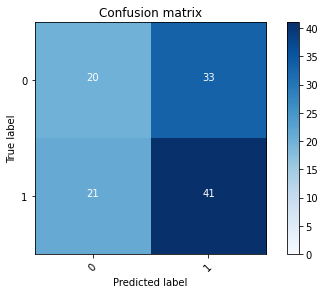

2022-08-22 15:11:37 - [Epoch Train: 24] loss: 0.4713, auc: 0.8689, acc: 0.7959, time: 24.00 s            
2022-08-22 15:11:37 - [Epoch Valid: 24] loss: 0.7843, auc: 0.4890, acc: 0.5372, time: 6.00 s


 24%|██████████                                | 24/100 [12:21<39:01, 30.80s/it]

2022-08-22 15:11:37 - EPOCH: 25
2022-08-22 15:11:38 - Train Step 10/485, train_loss: 0.2985
2022-08-22 15:11:38 - Train Step 20/485, train_loss: 0.3976
2022-08-22 15:11:39 - Train Step 30/485, train_loss: 0.4263
2022-08-22 15:11:39 - Train Step 40/485, train_loss: 0.3812
2022-08-22 15:11:40 - Train Step 50/485, train_loss: 0.3847
2022-08-22 15:11:40 - Train Step 60/485, train_loss: 0.4018
2022-08-22 15:11:41 - Train Step 70/485, train_loss: 0.4187
2022-08-22 15:11:41 - Train Step 80/485, train_loss: 0.4169
2022-08-22 15:11:42 - Train Step 90/485, train_loss: 0.4196
2022-08-22 15:11:43 - Train Step 100/485, train_loss: 0.4263
2022-08-22 15:11:43 - Train Step 110/485, train_loss: 0.4349
2022-08-22 15:11:44 - Train Step 120/485, train_loss: 0.4381
2022-08-22 15:11:44 - Train Step 130/485, train_loss: 0.4300
2022-08-22 15:11:45 - Train Step 140/485, train_loss: 0.4231
2022-08-22 15:11:45 - Train Step 150/485, train_loss: 0.4307
2022-08-22 15:11:46 - Train Step 160/485, train_loss: 0.4376
2

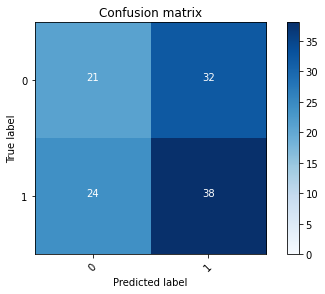

2022-08-22 15:12:08 - [Epoch Train: 25] loss: 0.4784, auc: 0.8579, acc: 0.7856, time: 24.00 s            
2022-08-22 15:12:08 - [Epoch Valid: 25] loss: 0.8035, auc: 0.4957, acc: 0.5207, time: 6.00 s


 25%|██████████▌                               | 25/100 [12:52<38:38, 30.91s/it]

2022-08-22 15:12:08 - EPOCH: 26
2022-08-22 15:12:09 - Train Step 10/485, train_loss: 0.3008
2022-08-22 15:12:10 - Train Step 20/485, train_loss: 0.4242
2022-08-22 15:12:10 - Train Step 30/485, train_loss: 0.4483
2022-08-22 15:12:11 - Train Step 40/485, train_loss: 0.4417
2022-08-22 15:12:11 - Train Step 50/485, train_loss: 0.4237
2022-08-22 15:12:12 - Train Step 60/485, train_loss: 0.3944
2022-08-22 15:12:12 - Train Step 70/485, train_loss: 0.4085
2022-08-22 15:12:13 - Train Step 80/485, train_loss: 0.4092
2022-08-22 15:12:13 - Train Step 90/485, train_loss: 0.4244
2022-08-22 15:12:14 - Train Step 100/485, train_loss: 0.4244
2022-08-22 15:12:14 - Train Step 110/485, train_loss: 0.4326
2022-08-22 15:12:15 - Train Step 120/485, train_loss: 0.4221
2022-08-22 15:12:15 - Train Step 130/485, train_loss: 0.4156
2022-08-22 15:12:16 - Train Step 140/485, train_loss: 0.4138
2022-08-22 15:12:16 - Train Step 150/485, train_loss: 0.4132
2022-08-22 15:12:17 - Train Step 160/485, train_loss: 0.4284
2

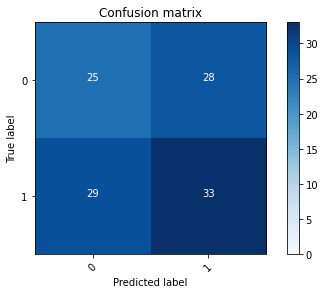

2022-08-22 15:12:40 - [Epoch Train: 26] loss: 0.4600, auc: 0.8712, acc: 0.8021, time: 24.00 s            
2022-08-22 15:12:40 - [Epoch Valid: 26] loss: 0.8175, auc: 0.4915, acc: 0.5207, time: 6.00 s


 26%|██████████▉                               | 26/100 [13:23<38:10, 30.95s/it]

2022-08-22 15:12:40 - EPOCH: 27
2022-08-22 15:12:40 - Train Step 10/485, train_loss: 0.4110
2022-08-22 15:12:41 - Train Step 20/485, train_loss: 0.5027
2022-08-22 15:12:41 - Train Step 30/485, train_loss: 0.5330
2022-08-22 15:12:42 - Train Step 40/485, train_loss: 0.5096
2022-08-22 15:12:42 - Train Step 50/485, train_loss: 0.5113
2022-08-22 15:12:43 - Train Step 60/485, train_loss: 0.4988
2022-08-22 15:12:43 - Train Step 70/485, train_loss: 0.4694
2022-08-22 15:12:44 - Train Step 80/485, train_loss: 0.4773
2022-08-22 15:12:44 - Train Step 90/485, train_loss: 0.4848
2022-08-22 15:12:45 - Train Step 100/485, train_loss: 0.4779
2022-08-22 15:12:45 - Train Step 110/485, train_loss: 0.4797
2022-08-22 15:12:46 - Train Step 120/485, train_loss: 0.4634
2022-08-22 15:12:46 - Train Step 130/485, train_loss: 0.4737
2022-08-22 15:12:47 - Train Step 140/485, train_loss: 0.4823
2022-08-22 15:12:47 - Train Step 150/485, train_loss: 0.4772
2022-08-22 15:12:48 - Train Step 160/485, train_loss: 0.4763
2

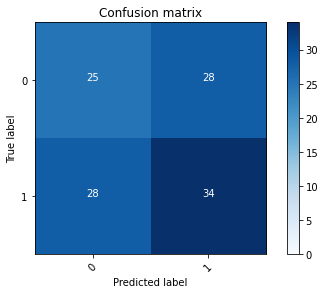

2022-08-22 15:13:10 - [Epoch Train: 27] loss: 0.4550, auc: 0.8711, acc: 0.7979, time: 24.00 s            
2022-08-22 15:13:10 - [Epoch Valid: 27] loss: 0.8031, auc: 0.4918, acc: 0.5207, time: 6.00 s


 27%|███████████▎                              | 27/100 [13:54<37:37, 30.93s/it]

2022-08-22 15:13:10 - EPOCH: 28
2022-08-22 15:13:11 - Train Step 10/485, train_loss: 0.5923
2022-08-22 15:13:12 - Train Step 20/485, train_loss: 0.5550
2022-08-22 15:13:12 - Train Step 30/485, train_loss: 0.5660
2022-08-22 15:13:13 - Train Step 40/485, train_loss: 0.5285
2022-08-22 15:13:13 - Train Step 50/485, train_loss: 0.5439
2022-08-22 15:13:14 - Train Step 60/485, train_loss: 0.5243
2022-08-22 15:13:14 - Train Step 70/485, train_loss: 0.5001
2022-08-22 15:13:15 - Train Step 80/485, train_loss: 0.4820
2022-08-22 15:13:15 - Train Step 90/485, train_loss: 0.4910
2022-08-22 15:13:16 - Train Step 100/485, train_loss: 0.4950
2022-08-22 15:13:16 - Train Step 110/485, train_loss: 0.4773
2022-08-22 15:13:17 - Train Step 120/485, train_loss: 0.4712
2022-08-22 15:13:17 - Train Step 130/485, train_loss: 0.4728
2022-08-22 15:13:18 - Train Step 140/485, train_loss: 0.4600
2022-08-22 15:13:18 - Train Step 150/485, train_loss: 0.4645
2022-08-22 15:13:19 - Train Step 160/485, train_loss: 0.4711
2

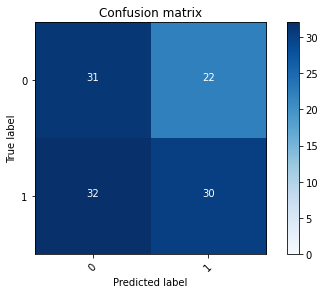

2022-08-22 15:13:41 - [Epoch Train: 28] loss: 0.4557, auc: 0.8768, acc: 0.8186, time: 24.00 s            
2022-08-22 15:13:41 - [Epoch Valid: 28] loss: 0.8210, auc: 0.4866, acc: 0.5455, time: 6.00 s


 28%|███████████▊                              | 28/100 [14:25<37:09, 30.97s/it]

2022-08-22 15:13:41 - EPOCH: 29
2022-08-22 15:13:42 - Train Step 10/485, train_loss: 0.3387
2022-08-22 15:13:43 - Train Step 20/485, train_loss: 0.3539
2022-08-22 15:13:43 - Train Step 30/485, train_loss: 0.3635
2022-08-22 15:13:44 - Train Step 40/485, train_loss: 0.4408
2022-08-22 15:13:44 - Train Step 50/485, train_loss: 0.4347
2022-08-22 15:13:45 - Train Step 60/485, train_loss: 0.4285
2022-08-22 15:13:45 - Train Step 70/485, train_loss: 0.4598
2022-08-22 15:13:46 - Train Step 80/485, train_loss: 0.4381
2022-08-22 15:13:46 - Train Step 90/485, train_loss: 0.4280
2022-08-22 15:13:47 - Train Step 100/485, train_loss: 0.4228
2022-08-22 15:13:47 - Train Step 110/485, train_loss: 0.4240
2022-08-22 15:13:48 - Train Step 120/485, train_loss: 0.4147
2022-08-22 15:13:48 - Train Step 130/485, train_loss: 0.4204
2022-08-22 15:13:49 - Train Step 140/485, train_loss: 0.4094
2022-08-22 15:13:49 - Train Step 150/485, train_loss: 0.4192
2022-08-22 15:13:50 - Train Step 160/485, train_loss: 0.4172
2

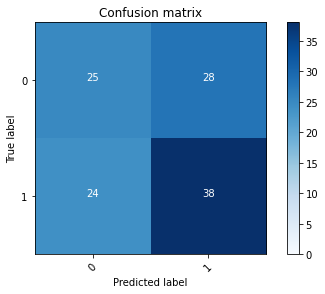

2022-08-22 15:14:13 - [Epoch Train: 29] loss: 0.4390, auc: 0.8835, acc: 0.8165, time: 24.00 s            
2022-08-22 15:14:13 - [Epoch Valid: 29] loss: 0.7955, auc: 0.4973, acc: 0.5537, time: 6.00 s


 29%|████████████▏                             | 29/100 [14:56<36:41, 31.00s/it]

2022-08-22 15:14:13 - EPOCH: 30
2022-08-22 15:14:13 - Train Step 10/485, train_loss: 0.5628
2022-08-22 15:14:14 - Train Step 20/485, train_loss: 0.4863
2022-08-22 15:14:14 - Train Step 30/485, train_loss: 0.4777
2022-08-22 15:14:15 - Train Step 40/485, train_loss: 0.4404
2022-08-22 15:14:15 - Train Step 50/485, train_loss: 0.4453
2022-08-22 15:14:16 - Train Step 60/485, train_loss: 0.4493
2022-08-22 15:14:16 - Train Step 70/485, train_loss: 0.4577
2022-08-22 15:14:17 - Train Step 80/485, train_loss: 0.4531
2022-08-22 15:14:17 - Train Step 90/485, train_loss: 0.4319
2022-08-22 15:14:18 - Train Step 100/485, train_loss: 0.4092
2022-08-22 15:14:18 - Train Step 110/485, train_loss: 0.4148
2022-08-22 15:14:19 - Train Step 120/485, train_loss: 0.4083
2022-08-22 15:14:19 - Train Step 130/485, train_loss: 0.4186
2022-08-22 15:14:20 - Train Step 140/485, train_loss: 0.4299
2022-08-22 15:14:20 - Train Step 150/485, train_loss: 0.4247
2022-08-22 15:14:21 - Train Step 160/485, train_loss: 0.4286
2

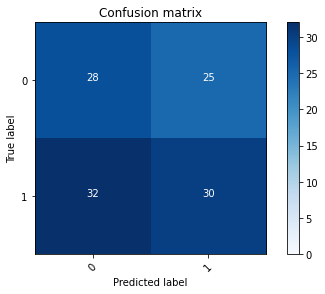

2022-08-22 15:14:44 - [Epoch Train: 30] loss: 0.4481, auc: 0.8731, acc: 0.8082, time: 24.00 s            
2022-08-22 15:14:44 - [Epoch Valid: 30] loss: 0.8167, auc: 0.4933, acc: 0.5207, time: 6.00 s


 30%|████████████▌                             | 30/100 [15:28<36:11, 31.02s/it]

2022-08-22 15:14:44 - EPOCH: 31
2022-08-22 15:14:44 - Train Step 10/485, train_loss: 0.5292
2022-08-22 15:14:45 - Train Step 20/485, train_loss: 0.4456
2022-08-22 15:14:45 - Train Step 30/485, train_loss: 0.5013
2022-08-22 15:14:46 - Train Step 40/485, train_loss: 0.4956
2022-08-22 15:14:46 - Train Step 50/485, train_loss: 0.4539
2022-08-22 15:14:47 - Train Step 60/485, train_loss: 0.4975
2022-08-22 15:14:47 - Train Step 70/485, train_loss: 0.4540
2022-08-22 15:14:48 - Train Step 80/485, train_loss: 0.4433
2022-08-22 15:14:48 - Train Step 90/485, train_loss: 0.4499
2022-08-22 15:14:49 - Train Step 100/485, train_loss: 0.4325
2022-08-22 15:14:50 - Train Step 110/485, train_loss: 0.4341
2022-08-22 15:14:50 - Train Step 120/485, train_loss: 0.4317
2022-08-22 15:14:51 - Train Step 130/485, train_loss: 0.4159
2022-08-22 15:14:51 - Train Step 140/485, train_loss: 0.4176
2022-08-22 15:14:52 - Train Step 150/485, train_loss: 0.4158
2022-08-22 15:14:52 - Train Step 160/485, train_loss: 0.4016
2

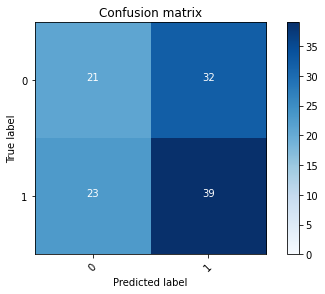

2022-08-22 15:15:15 - [Epoch Train: 31] loss: 0.4283, auc: 0.8917, acc: 0.8247, time: 25.00 s            
2022-08-22 15:15:15 - [Epoch Valid: 31] loss: 0.8294, auc: 0.5003, acc: 0.5289, time: 6.00 s


 31%|█████████████                             | 31/100 [15:59<35:57, 31.26s/it]

2022-08-22 15:15:15 - EPOCH: 32
2022-08-22 15:15:16 - Train Step 10/485, train_loss: 0.7570
2022-08-22 15:15:17 - Train Step 20/485, train_loss: 0.5148
2022-08-22 15:15:17 - Train Step 30/485, train_loss: 0.5250
2022-08-22 15:15:18 - Train Step 40/485, train_loss: 0.4702
2022-08-22 15:15:18 - Train Step 50/485, train_loss: 0.4260
2022-08-22 15:15:19 - Train Step 60/485, train_loss: 0.4620
2022-08-22 15:15:19 - Train Step 70/485, train_loss: 0.4526
2022-08-22 15:15:20 - Train Step 80/485, train_loss: 0.4423
2022-08-22 15:15:20 - Train Step 90/485, train_loss: 0.4488
2022-08-22 15:15:21 - Train Step 100/485, train_loss: 0.4325
2022-08-22 15:15:21 - Train Step 110/485, train_loss: 0.4227
2022-08-22 15:15:22 - Train Step 120/485, train_loss: 0.4240
2022-08-22 15:15:22 - Train Step 130/485, train_loss: 0.4243
2022-08-22 15:15:23 - Train Step 140/485, train_loss: 0.4150
2022-08-22 15:15:23 - Train Step 150/485, train_loss: 0.4038
2022-08-22 15:15:24 - Train Step 160/485, train_loss: 0.3998
2

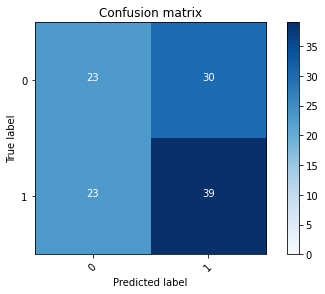

2022-08-22 15:15:47 - [Epoch Train: 32] loss: 0.4251, auc: 0.8913, acc: 0.8247, time: 24.00 s            
2022-08-22 15:15:47 - [Epoch Valid: 32] loss: 0.8180, auc: 0.5021, acc: 0.5455, time: 6.00 s


 32%|█████████████▍                            | 32/100 [16:31<35:24, 31.24s/it]

2022-08-22 15:15:47 - EPOCH: 33
2022-08-22 15:15:47 - Train Step 10/485, train_loss: 0.5085
2022-08-22 15:15:48 - Train Step 20/485, train_loss: 0.5197
2022-08-22 15:15:48 - Train Step 30/485, train_loss: 0.5583
2022-08-22 15:15:49 - Train Step 40/485, train_loss: 0.5044
2022-08-22 15:15:49 - Train Step 50/485, train_loss: 0.4597
2022-08-22 15:15:50 - Train Step 60/485, train_loss: 0.4442
2022-08-22 15:15:50 - Train Step 70/485, train_loss: 0.4450
2022-08-22 15:15:51 - Train Step 80/485, train_loss: 0.4404
2022-08-22 15:15:51 - Train Step 90/485, train_loss: 0.4424
2022-08-22 15:15:52 - Train Step 100/485, train_loss: 0.4241
2022-08-22 15:15:52 - Train Step 110/485, train_loss: 0.4280
2022-08-22 15:15:53 - Train Step 120/485, train_loss: 0.4223
2022-08-22 15:15:53 - Train Step 130/485, train_loss: 0.4342
2022-08-22 15:15:54 - Train Step 140/485, train_loss: 0.4252
2022-08-22 15:15:54 - Train Step 150/485, train_loss: 0.4137
2022-08-22 15:15:55 - Train Step 160/485, train_loss: 0.4067
2

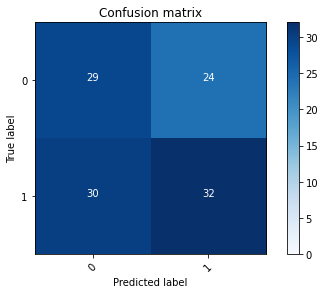

2022-08-22 15:16:18 - [Epoch Train: 33] loss: 0.4005, auc: 0.9075, acc: 0.8371, time: 24.00 s            
2022-08-22 15:16:18 - [Epoch Valid: 33] loss: 0.8273, auc: 0.4963, acc: 0.5455, time: 6.00 s


 33%|█████████████▊                            | 33/100 [17:01<34:46, 31.14s/it]

2022-08-22 15:16:18 - EPOCH: 34
2022-08-22 15:16:18 - Train Step 10/485, train_loss: 0.3200
2022-08-22 15:16:19 - Train Step 20/485, train_loss: 0.5770
2022-08-22 15:16:19 - Train Step 30/485, train_loss: 0.5159
2022-08-22 15:16:20 - Train Step 40/485, train_loss: 0.4716
2022-08-22 15:16:20 - Train Step 50/485, train_loss: 0.4474
2022-08-22 15:16:21 - Train Step 60/485, train_loss: 0.4235
2022-08-22 15:16:21 - Train Step 70/485, train_loss: 0.3890
2022-08-22 15:16:22 - Train Step 80/485, train_loss: 0.3914
2022-08-22 15:16:22 - Train Step 90/485, train_loss: 0.3771
2022-08-22 15:16:23 - Train Step 100/485, train_loss: 0.3814
2022-08-22 15:16:23 - Train Step 110/485, train_loss: 0.3769
2022-08-22 15:16:24 - Train Step 120/485, train_loss: 0.3773
2022-08-22 15:16:24 - Train Step 130/485, train_loss: 0.3739
2022-08-22 15:16:25 - Train Step 140/485, train_loss: 0.3862
2022-08-22 15:16:25 - Train Step 150/485, train_loss: 0.3914
2022-08-22 15:16:26 - Train Step 160/485, train_loss: 0.4071
2

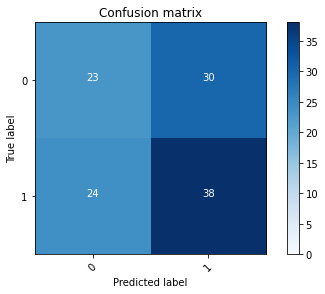

2022-08-22 15:16:49 - [Epoch Train: 34] loss: 0.4036, auc: 0.9042, acc: 0.8392, time: 24.00 s            
2022-08-22 15:16:49 - [Epoch Valid: 34] loss: 0.8351, auc: 0.5003, acc: 0.5372, time: 6.00 s


 34%|██████████████▎                           | 34/100 [17:32<34:12, 31.10s/it]

2022-08-22 15:16:49 - EPOCH: 35
2022-08-22 15:16:49 - Train Step 10/485, train_loss: 0.2637
2022-08-22 15:16:50 - Train Step 20/485, train_loss: 0.2297
2022-08-22 15:16:50 - Train Step 30/485, train_loss: 0.2522
2022-08-22 15:16:51 - Train Step 40/485, train_loss: 0.2662
2022-08-22 15:16:51 - Train Step 50/485, train_loss: 0.2701
2022-08-22 15:16:52 - Train Step 60/485, train_loss: 0.3035
2022-08-22 15:16:52 - Train Step 70/485, train_loss: 0.3173
2022-08-22 15:16:53 - Train Step 80/485, train_loss: 0.3681
2022-08-22 15:16:53 - Train Step 90/485, train_loss: 0.3767
2022-08-22 15:16:54 - Train Step 100/485, train_loss: 0.3749
2022-08-22 15:16:54 - Train Step 110/485, train_loss: 0.3632
2022-08-22 15:16:55 - Train Step 120/485, train_loss: 0.3678
2022-08-22 15:16:55 - Train Step 130/485, train_loss: 0.3705
2022-08-22 15:16:56 - Train Step 140/485, train_loss: 0.3754
2022-08-22 15:16:56 - Train Step 150/485, train_loss: 0.3736
2022-08-22 15:16:57 - Train Step 160/485, train_loss: 0.3745
2

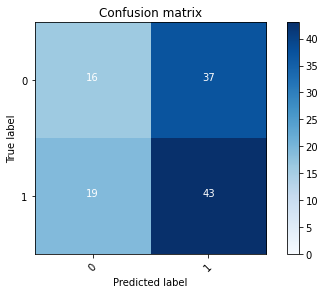

2022-08-22 15:17:20 - [Epoch Train: 35] loss: 0.4054, auc: 0.8977, acc: 0.8309, time: 24.00 s            
2022-08-22 15:17:20 - [Epoch Valid: 35] loss: 0.8514, auc: 0.5110, acc: 0.5124, time: 6.00 s


 35%|██████████████▋                           | 35/100 [18:04<33:42, 31.12s/it]

2022-08-22 15:17:20 - EPOCH: 36
2022-08-22 15:17:20 - Train Step 10/485, train_loss: 0.4294
2022-08-22 15:17:21 - Train Step 20/485, train_loss: 0.4099
2022-08-22 15:17:21 - Train Step 30/485, train_loss: 0.3731
2022-08-22 15:17:22 - Train Step 40/485, train_loss: 0.3532
2022-08-22 15:17:22 - Train Step 50/485, train_loss: 0.3520
2022-08-22 15:17:23 - Train Step 60/485, train_loss: 0.3728
2022-08-22 15:17:23 - Train Step 70/485, train_loss: 0.3607
2022-08-22 15:17:24 - Train Step 80/485, train_loss: 0.3739
2022-08-22 15:17:24 - Train Step 90/485, train_loss: 0.3717
2022-08-22 15:17:25 - Train Step 100/485, train_loss: 0.3872
2022-08-22 15:17:25 - Train Step 110/485, train_loss: 0.3868
2022-08-22 15:17:26 - Train Step 120/485, train_loss: 0.3935
2022-08-22 15:17:26 - Train Step 130/485, train_loss: 0.3975
2022-08-22 15:17:27 - Train Step 140/485, train_loss: 0.3973
2022-08-22 15:17:27 - Train Step 150/485, train_loss: 0.3953
2022-08-22 15:17:28 - Train Step 160/485, train_loss: 0.3953
2

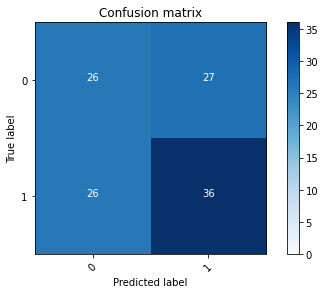

2022-08-22 15:17:51 - [Epoch Train: 36] loss: 0.3927, auc: 0.9096, acc: 0.8433, time: 24.00 s            
2022-08-22 15:17:51 - [Epoch Valid: 36] loss: 0.8777, auc: 0.5091, acc: 0.5455, time: 6.00 s


 36%|███████████████                           | 36/100 [18:35<33:13, 31.16s/it]

2022-08-22 15:17:51 - EPOCH: 37
2022-08-22 15:17:52 - Train Step 10/485, train_loss: 0.4865
2022-08-22 15:17:52 - Train Step 20/485, train_loss: 0.3920
2022-08-22 15:17:53 - Train Step 30/485, train_loss: 0.3607
2022-08-22 15:17:53 - Train Step 40/485, train_loss: 0.3578
2022-08-22 15:17:54 - Train Step 50/485, train_loss: 0.3447
2022-08-22 15:17:54 - Train Step 60/485, train_loss: 0.3561
2022-08-22 15:17:55 - Train Step 70/485, train_loss: 0.3302
2022-08-22 15:17:55 - Train Step 80/485, train_loss: 0.3395
2022-08-22 15:17:56 - Train Step 90/485, train_loss: 0.3423
2022-08-22 15:17:56 - Train Step 100/485, train_loss: 0.3359
2022-08-22 15:17:57 - Train Step 110/485, train_loss: 0.3378
2022-08-22 15:17:57 - Train Step 120/485, train_loss: 0.3381
2022-08-22 15:17:58 - Train Step 130/485, train_loss: 0.3644
2022-08-22 15:17:58 - Train Step 140/485, train_loss: 0.3581
2022-08-22 15:17:59 - Train Step 150/485, train_loss: 0.3593
2022-08-22 15:17:59 - Train Step 160/485, train_loss: 0.3581
2

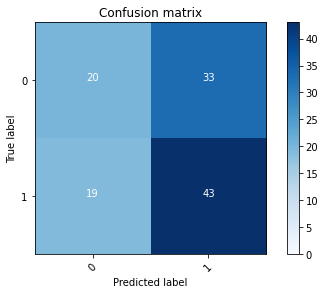

2022-08-22 15:18:22 - [Epoch Train: 37] loss: 0.3689, auc: 0.9215, acc: 0.8619, time: 24.00 s            
2022-08-22 15:18:22 - [Epoch Valid: 37] loss: 0.8782, auc: 0.5052, acc: 0.5455, time: 6.00 s


 37%|███████████████▌                          | 37/100 [19:06<32:37, 31.07s/it]

2022-08-22 15:18:22 - EPOCH: 38
2022-08-22 15:18:22 - Train Step 10/485, train_loss: 0.3729
2022-08-22 15:18:23 - Train Step 20/485, train_loss: 0.3432
2022-08-22 15:18:23 - Train Step 30/485, train_loss: 0.3833
2022-08-22 15:18:24 - Train Step 40/485, train_loss: 0.3653
2022-08-22 15:18:24 - Train Step 50/485, train_loss: 0.3315
2022-08-22 15:18:25 - Train Step 60/485, train_loss: 0.3545
2022-08-22 15:18:25 - Train Step 70/485, train_loss: 0.3799
2022-08-22 15:18:26 - Train Step 80/485, train_loss: 0.3596
2022-08-22 15:18:26 - Train Step 90/485, train_loss: 0.3763
2022-08-22 15:18:27 - Train Step 100/485, train_loss: 0.3696
2022-08-22 15:18:27 - Train Step 110/485, train_loss: 0.3537
2022-08-22 15:18:28 - Train Step 120/485, train_loss: 0.3729
2022-08-22 15:18:28 - Train Step 130/485, train_loss: 0.3689
2022-08-22 15:18:29 - Train Step 140/485, train_loss: 0.3732
2022-08-22 15:18:29 - Train Step 150/485, train_loss: 0.3669
2022-08-22 15:18:30 - Train Step 160/485, train_loss: 0.3935
2

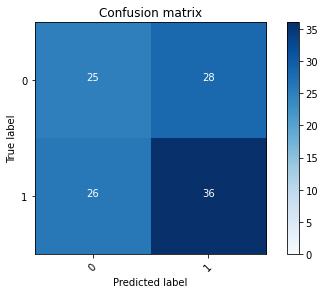

2022-08-22 15:18:53 - [Epoch Train: 38] loss: 0.3730, auc: 0.9155, acc: 0.8536, time: 24.00 s            
2022-08-22 15:18:53 - [Epoch Valid: 38] loss: 0.8831, auc: 0.5040, acc: 0.5372, time: 6.00 s


 38%|███████████████▉                          | 38/100 [19:37<32:04, 31.04s/it]

2022-08-22 15:18:53 - EPOCH: 39
2022-08-22 15:18:53 - Train Step 10/485, train_loss: 0.4249
2022-08-22 15:18:54 - Train Step 20/485, train_loss: 0.3832
2022-08-22 15:18:54 - Train Step 30/485, train_loss: 0.3386
2022-08-22 15:18:55 - Train Step 40/485, train_loss: 0.3513
2022-08-22 15:18:55 - Train Step 50/485, train_loss: 0.4032
2022-08-22 15:18:56 - Train Step 60/485, train_loss: 0.4527
2022-08-22 15:18:56 - Train Step 70/485, train_loss: 0.4169
2022-08-22 15:18:57 - Train Step 80/485, train_loss: 0.4038
2022-08-22 15:18:57 - Train Step 90/485, train_loss: 0.3898
2022-08-22 15:18:58 - Train Step 100/485, train_loss: 0.3852
2022-08-22 15:18:58 - Train Step 110/485, train_loss: 0.3738
2022-08-22 15:18:59 - Train Step 120/485, train_loss: 0.3858
2022-08-22 15:18:59 - Train Step 130/485, train_loss: 0.3790
2022-08-22 15:19:00 - Train Step 140/485, train_loss: 0.3745
2022-08-22 15:19:00 - Train Step 150/485, train_loss: 0.3795
2022-08-22 15:19:01 - Train Step 160/485, train_loss: 0.3766
2

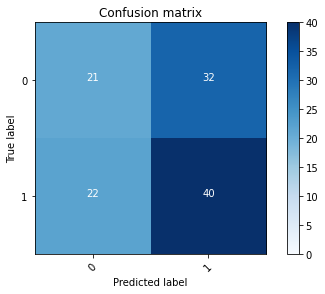

2022-08-22 15:19:24 - [Epoch Train: 39] loss: 0.3736, auc: 0.9187, acc: 0.8536, time: 24.00 s            
2022-08-22 15:19:24 - [Epoch Valid: 39] loss: 0.8739, auc: 0.5170, acc: 0.5289, time: 6.00 s


 39%|████████████████▍                         | 39/100 [20:08<31:34, 31.07s/it]

2022-08-22 15:19:24 - EPOCH: 40
2022-08-22 15:19:25 - Train Step 10/485, train_loss: 0.2686
2022-08-22 15:19:25 - Train Step 20/485, train_loss: 0.3118
2022-08-22 15:19:26 - Train Step 30/485, train_loss: 0.2765
2022-08-22 15:19:26 - Train Step 40/485, train_loss: 0.3366
2022-08-22 15:19:27 - Train Step 50/485, train_loss: 0.3367
2022-08-22 15:19:27 - Train Step 60/485, train_loss: 0.3537
2022-08-22 15:19:27 - Train Step 70/485, train_loss: 0.3427
2022-08-22 15:19:28 - Train Step 80/485, train_loss: 0.3492
2022-08-22 15:19:28 - Train Step 90/485, train_loss: 0.3505
2022-08-22 15:19:29 - Train Step 100/485, train_loss: 0.3521
2022-08-22 15:19:29 - Train Step 110/485, train_loss: 0.3602
2022-08-22 15:19:30 - Train Step 120/485, train_loss: 0.3442
2022-08-22 15:19:31 - Train Step 130/485, train_loss: 0.3475
2022-08-22 15:19:31 - Train Step 140/485, train_loss: 0.3463
2022-08-22 15:19:31 - Train Step 150/485, train_loss: 0.3478
2022-08-22 15:19:32 - Train Step 160/485, train_loss: 0.3415
2

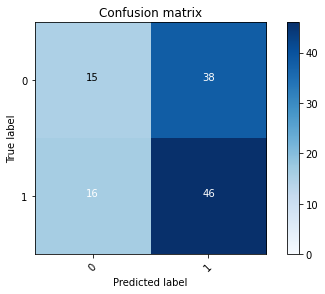

2022-08-22 15:19:55 - [Epoch Train: 40] loss: 0.3423, auc: 0.9404, acc: 0.8722, time: 24.00 s            
2022-08-22 15:19:55 - [Epoch Valid: 40] loss: 0.9499, auc: 0.5180, acc: 0.5207, time: 6.00 s


 40%|████████████████▊                         | 40/100 [20:39<31:07, 31.12s/it]

2022-08-22 15:19:55 - EPOCH: 41
2022-08-22 15:19:56 - Train Step 10/485, train_loss: 0.2180
2022-08-22 15:19:56 - Train Step 20/485, train_loss: 0.2592
2022-08-22 15:19:57 - Train Step 30/485, train_loss: 0.3410
2022-08-22 15:19:57 - Train Step 40/485, train_loss: 0.3079
2022-08-22 15:19:58 - Train Step 50/485, train_loss: 0.3146
2022-08-22 15:19:58 - Train Step 60/485, train_loss: 0.3239
2022-08-22 15:19:59 - Train Step 70/485, train_loss: 0.3411
2022-08-22 15:19:59 - Train Step 80/485, train_loss: 0.3205
2022-08-22 15:20:00 - Train Step 90/485, train_loss: 0.3256
2022-08-22 15:20:00 - Train Step 100/485, train_loss: 0.3329
2022-08-22 15:20:01 - Train Step 110/485, train_loss: 0.3432
2022-08-22 15:20:02 - Train Step 120/485, train_loss: 0.3402
2022-08-22 15:20:02 - Train Step 130/485, train_loss: 0.3442
2022-08-22 15:20:03 - Train Step 140/485, train_loss: 0.3457
2022-08-22 15:20:03 - Train Step 150/485, train_loss: 0.3501
2022-08-22 15:20:04 - Train Step 160/485, train_loss: 0.3448
2

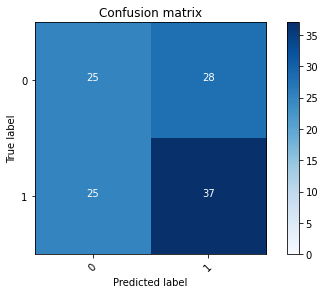

2022-08-22 15:20:26 - [Epoch Train: 41] loss: 0.3552, auc: 0.9253, acc: 0.8557, time: 24.00 s            
2022-08-22 15:20:26 - [Epoch Valid: 41] loss: 0.9009, auc: 0.5073, acc: 0.5455, time: 6.00 s


 41%|█████████████████▏                        | 41/100 [21:10<30:37, 31.15s/it]

2022-08-22 15:20:26 - EPOCH: 42
2022-08-22 15:20:27 - Train Step 10/485, train_loss: 0.2969
2022-08-22 15:20:28 - Train Step 20/485, train_loss: 0.2205
2022-08-22 15:20:28 - Train Step 30/485, train_loss: 0.2567
2022-08-22 15:20:29 - Train Step 40/485, train_loss: 0.2578
2022-08-22 15:20:29 - Train Step 50/485, train_loss: 0.2641
2022-08-22 15:20:30 - Train Step 60/485, train_loss: 0.2747
2022-08-22 15:20:30 - Train Step 70/485, train_loss: 0.2775
2022-08-22 15:20:31 - Train Step 80/485, train_loss: 0.2970
2022-08-22 15:20:31 - Train Step 90/485, train_loss: 0.3111
2022-08-22 15:20:32 - Train Step 100/485, train_loss: 0.3157
2022-08-22 15:20:32 - Train Step 110/485, train_loss: 0.3272
2022-08-22 15:20:33 - Train Step 120/485, train_loss: 0.3366
2022-08-22 15:20:33 - Train Step 130/485, train_loss: 0.3420
2022-08-22 15:20:34 - Train Step 140/485, train_loss: 0.3382
2022-08-22 15:20:34 - Train Step 150/485, train_loss: 0.3290
2022-08-22 15:20:35 - Train Step 160/485, train_loss: 0.3204
2

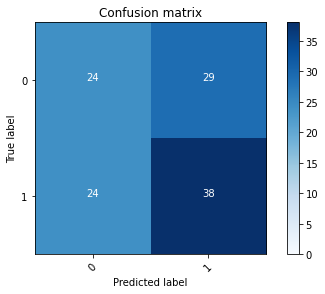

2022-08-22 15:20:57 - [Epoch Train: 42] loss: 0.3380, auc: 0.9371, acc: 0.8660, time: 24.00 s            
2022-08-22 15:20:57 - [Epoch Valid: 42] loss: 0.8922, auc: 0.5140, acc: 0.5372, time: 6.00 s


 42%|█████████████████▋                        | 42/100 [21:41<30:04, 31.11s/it]

2022-08-22 15:20:57 - EPOCH: 43
2022-08-22 15:20:58 - Train Step 10/485, train_loss: 0.1435
2022-08-22 15:20:59 - Train Step 20/485, train_loss: 0.1759
2022-08-22 15:20:59 - Train Step 30/485, train_loss: 0.1852
2022-08-22 15:21:00 - Train Step 40/485, train_loss: 0.2602
2022-08-22 15:21:00 - Train Step 50/485, train_loss: 0.2565
2022-08-22 15:21:01 - Train Step 60/485, train_loss: 0.2470
2022-08-22 15:21:01 - Train Step 70/485, train_loss: 0.2414
2022-08-22 15:21:02 - Train Step 80/485, train_loss: 0.2388
2022-08-22 15:21:02 - Train Step 90/485, train_loss: 0.2351
2022-08-22 15:21:03 - Train Step 100/485, train_loss: 0.2463
2022-08-22 15:21:03 - Train Step 110/485, train_loss: 0.2772
2022-08-22 15:21:04 - Train Step 120/485, train_loss: 0.2691
2022-08-22 15:21:04 - Train Step 130/485, train_loss: 0.2804
2022-08-22 15:21:05 - Train Step 140/485, train_loss: 0.2809
2022-08-22 15:21:05 - Train Step 150/485, train_loss: 0.2745
2022-08-22 15:21:06 - Train Step 160/485, train_loss: 0.2762
2

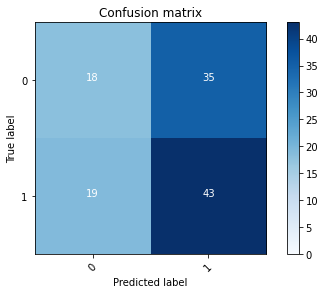

2022-08-22 15:21:28 - [Epoch Train: 43] loss: 0.3238, auc: 0.9410, acc: 0.8742, time: 24.00 s            
2022-08-22 15:21:28 - [Epoch Valid: 43] loss: 0.9084, auc: 0.5243, acc: 0.5207, time: 6.00 s


 43%|██████████████████                        | 43/100 [22:12<29:30, 31.06s/it]

2022-08-22 15:21:28 - EPOCH: 44
2022-08-22 15:21:29 - Train Step 10/485, train_loss: 0.5273
2022-08-22 15:21:30 - Train Step 20/485, train_loss: 0.3320
2022-08-22 15:21:30 - Train Step 30/485, train_loss: 0.2645
2022-08-22 15:21:31 - Train Step 40/485, train_loss: 0.3024
2022-08-22 15:21:31 - Train Step 50/485, train_loss: 0.2903
2022-08-22 15:21:32 - Train Step 60/485, train_loss: 0.2689
2022-08-22 15:21:32 - Train Step 70/485, train_loss: 0.2879
2022-08-22 15:21:33 - Train Step 80/485, train_loss: 0.3142
2022-08-22 15:21:33 - Train Step 90/485, train_loss: 0.3189
2022-08-22 15:21:34 - Train Step 100/485, train_loss: 0.3219
2022-08-22 15:21:34 - Train Step 110/485, train_loss: 0.3291
2022-08-22 15:21:35 - Train Step 120/485, train_loss: 0.3255
2022-08-22 15:21:35 - Train Step 130/485, train_loss: 0.3240
2022-08-22 15:21:36 - Train Step 140/485, train_loss: 0.3279
2022-08-22 15:21:36 - Train Step 150/485, train_loss: 0.3194
2022-08-22 15:21:37 - Train Step 160/485, train_loss: 0.3209
2

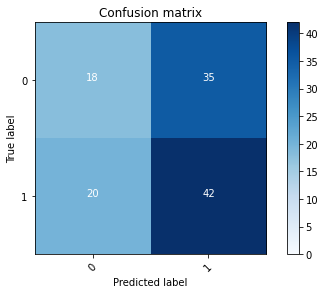

2022-08-22 15:21:59 - [Epoch Train: 44] loss: 0.3228, auc: 0.9429, acc: 0.8804, time: 24.00 s            
2022-08-22 15:21:59 - [Epoch Valid: 44] loss: 0.9464, auc: 0.5295, acc: 0.5207, time: 6.00 s


 44%|██████████████████▍                       | 44/100 [22:43<28:58, 31.05s/it]

2022-08-22 15:21:59 - EPOCH: 45
2022-08-22 15:22:00 - Train Step 10/485, train_loss: 0.2889
2022-08-22 15:22:01 - Train Step 20/485, train_loss: 0.2103
2022-08-22 15:22:01 - Train Step 30/485, train_loss: 0.2363
2022-08-22 15:22:02 - Train Step 40/485, train_loss: 0.2974
2022-08-22 15:22:02 - Train Step 50/485, train_loss: 0.3102
2022-08-22 15:22:03 - Train Step 60/485, train_loss: 0.3465
2022-08-22 15:22:03 - Train Step 70/485, train_loss: 0.3541
2022-08-22 15:22:04 - Train Step 80/485, train_loss: 0.3506
2022-08-22 15:22:04 - Train Step 90/485, train_loss: 0.3359
2022-08-22 15:22:05 - Train Step 100/485, train_loss: 0.3252
2022-08-22 15:22:05 - Train Step 110/485, train_loss: 0.3365
2022-08-22 15:22:06 - Train Step 120/485, train_loss: 0.3409
2022-08-22 15:22:06 - Train Step 130/485, train_loss: 0.3408
2022-08-22 15:22:07 - Train Step 140/485, train_loss: 0.3365
2022-08-22 15:22:07 - Train Step 150/485, train_loss: 0.3249
2022-08-22 15:22:08 - Train Step 160/485, train_loss: 0.3172
2

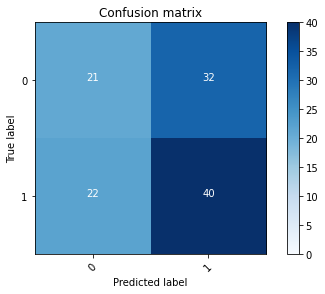

2022-08-22 15:22:31 - [Epoch Train: 45] loss: 0.3175, auc: 0.9451, acc: 0.8742, time: 24.00 s            
2022-08-22 15:22:31 - [Epoch Valid: 45] loss: 0.9267, auc: 0.5189, acc: 0.5289, time: 6.00 s


 45%|██████████████████▉                       | 45/100 [23:14<28:30, 31.10s/it]

2022-08-22 15:22:31 - EPOCH: 46
2022-08-22 15:22:31 - Train Step 10/485, train_loss: 0.2251
2022-08-22 15:22:32 - Train Step 20/485, train_loss: 0.3979
2022-08-22 15:22:32 - Train Step 30/485, train_loss: 0.3592
2022-08-22 15:22:33 - Train Step 40/485, train_loss: 0.3163
2022-08-22 15:22:33 - Train Step 50/485, train_loss: 0.2830
2022-08-22 15:22:34 - Train Step 60/485, train_loss: 0.2785
2022-08-22 15:22:34 - Train Step 70/485, train_loss: 0.2737
2022-08-22 15:22:35 - Train Step 80/485, train_loss: 0.2897
2022-08-22 15:22:35 - Train Step 90/485, train_loss: 0.2994
2022-08-22 15:22:36 - Train Step 100/485, train_loss: 0.2885
2022-08-22 15:22:36 - Train Step 110/485, train_loss: 0.2909
2022-08-22 15:22:37 - Train Step 120/485, train_loss: 0.2918
2022-08-22 15:22:37 - Train Step 130/485, train_loss: 0.3103
2022-08-22 15:22:38 - Train Step 140/485, train_loss: 0.3126
2022-08-22 15:22:38 - Train Step 150/485, train_loss: 0.3018
2022-08-22 15:22:39 - Train Step 160/485, train_loss: 0.2987
2

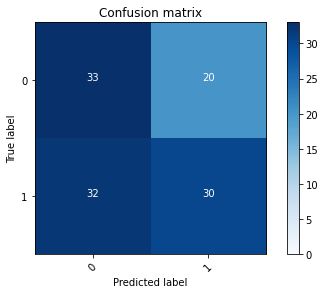

2022-08-22 15:23:01 - [Epoch Train: 46] loss: 0.3115, auc: 0.9516, acc: 0.8928, time: 24.00 s            
2022-08-22 15:23:01 - [Epoch Valid: 46] loss: 0.9415, auc: 0.5152, acc: 0.5620, time: 6.00 s


 46%|███████████████████▎                      | 46/100 [23:45<27:55, 31.02s/it]

2022-08-22 15:23:01 - EPOCH: 47
2022-08-22 15:23:02 - Train Step 10/485, train_loss: 0.1673
2022-08-22 15:23:03 - Train Step 20/485, train_loss: 0.2347
2022-08-22 15:23:03 - Train Step 30/485, train_loss: 0.2470
2022-08-22 15:23:04 - Train Step 40/485, train_loss: 0.2465
2022-08-22 15:23:04 - Train Step 50/485, train_loss: 0.2365
2022-08-22 15:23:05 - Train Step 60/485, train_loss: 0.2533
2022-08-22 15:23:05 - Train Step 70/485, train_loss: 0.2639
2022-08-22 15:23:06 - Train Step 80/485, train_loss: 0.2824
2022-08-22 15:23:06 - Train Step 90/485, train_loss: 0.2789
2022-08-22 15:23:07 - Train Step 100/485, train_loss: 0.2828
2022-08-22 15:23:07 - Train Step 110/485, train_loss: 0.2906
2022-08-22 15:23:08 - Train Step 120/485, train_loss: 0.2814
2022-08-22 15:23:08 - Train Step 130/485, train_loss: 0.2775
2022-08-22 15:23:09 - Train Step 140/485, train_loss: 0.3055
2022-08-22 15:23:09 - Train Step 150/485, train_loss: 0.2952
2022-08-22 15:23:10 - Train Step 160/485, train_loss: 0.2945
2

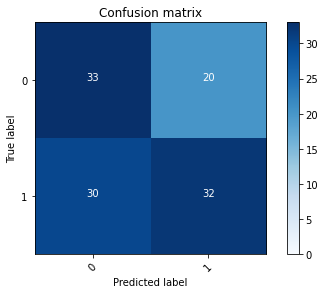

2022-08-22 15:23:33 - [Epoch Train: 47] loss: 0.2915, auc: 0.9550, acc: 0.9031, time: 24.00 s            
2022-08-22 15:23:33 - [Epoch Valid: 47] loss: 0.9824, auc: 0.5170, acc: 0.5785, time: 6.00 s


 47%|███████████████████▋                      | 47/100 [24:17<27:26, 31.07s/it]

2022-08-22 15:23:33 - EPOCH: 48
2022-08-22 15:23:33 - Train Step 10/485, train_loss: 0.1328
2022-08-22 15:23:34 - Train Step 20/485, train_loss: 0.2010
2022-08-22 15:23:34 - Train Step 30/485, train_loss: 0.2389
2022-08-22 15:23:35 - Train Step 40/485, train_loss: 0.2262
2022-08-22 15:23:35 - Train Step 50/485, train_loss: 0.2434
2022-08-22 15:23:36 - Train Step 60/485, train_loss: 0.2354
2022-08-22 15:23:36 - Train Step 70/485, train_loss: 0.2427
2022-08-22 15:23:37 - Train Step 80/485, train_loss: 0.2414
2022-08-22 15:23:37 - Train Step 90/485, train_loss: 0.2363
2022-08-22 15:23:38 - Train Step 100/485, train_loss: 0.2256
2022-08-22 15:23:38 - Train Step 110/485, train_loss: 0.2244
2022-08-22 15:23:39 - Train Step 120/485, train_loss: 0.2160
2022-08-22 15:23:39 - Train Step 130/485, train_loss: 0.2123
2022-08-22 15:23:40 - Train Step 140/485, train_loss: 0.2113
2022-08-22 15:23:40 - Train Step 150/485, train_loss: 0.2028
2022-08-22 15:23:41 - Train Step 160/485, train_loss: 0.2173
2

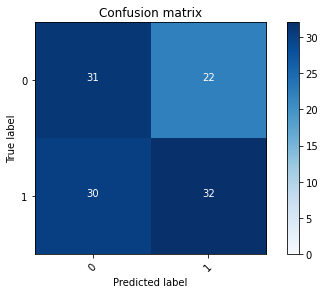

2022-08-22 15:24:04 - [Epoch Train: 48] loss: 0.2886, auc: 0.9536, acc: 0.8990, time: 24.00 s            
2022-08-22 15:24:04 - [Epoch Valid: 48] loss: 0.9761, auc: 0.5228, acc: 0.5537, time: 6.00 s


 48%|████████████████████▏                     | 48/100 [24:48<26:56, 31.09s/it]

2022-08-22 15:24:04 - EPOCH: 49
2022-08-22 15:24:04 - Train Step 10/485, train_loss: 0.4416
2022-08-22 15:24:05 - Train Step 20/485, train_loss: 0.3035
2022-08-22 15:24:05 - Train Step 30/485, train_loss: 0.2806
2022-08-22 15:24:06 - Train Step 40/485, train_loss: 0.2631
2022-08-22 15:24:06 - Train Step 50/485, train_loss: 0.2946
2022-08-22 15:24:07 - Train Step 60/485, train_loss: 0.2756
2022-08-22 15:24:07 - Train Step 70/485, train_loss: 0.2498
2022-08-22 15:24:08 - Train Step 80/485, train_loss: 0.2601
2022-08-22 15:24:08 - Train Step 90/485, train_loss: 0.2547
2022-08-22 15:24:09 - Train Step 100/485, train_loss: 0.2612
2022-08-22 15:24:09 - Train Step 110/485, train_loss: 0.2569
2022-08-22 15:24:10 - Train Step 120/485, train_loss: 0.2501
2022-08-22 15:24:10 - Train Step 130/485, train_loss: 0.2485
2022-08-22 15:24:11 - Train Step 140/485, train_loss: 0.2507
2022-08-22 15:24:11 - Train Step 150/485, train_loss: 0.2635
2022-08-22 15:24:12 - Train Step 160/485, train_loss: 0.2574
2

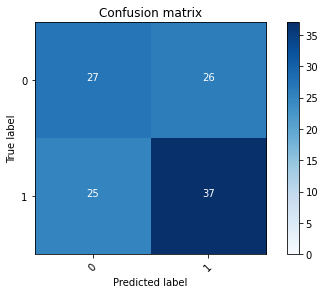

2022-08-22 15:24:35 - [Epoch Train: 49] loss: 0.2804, auc: 0.9606, acc: 0.8887, time: 24.00 s            
2022-08-22 15:24:35 - [Epoch Valid: 49] loss: 0.9634, auc: 0.5268, acc: 0.5537, time: 6.00 s


 49%|████████████████████▌                     | 49/100 [25:19<26:25, 31.08s/it]

2022-08-22 15:24:35 - EPOCH: 50
2022-08-22 15:24:35 - Train Step 10/485, train_loss: 0.2701
2022-08-22 15:24:36 - Train Step 20/485, train_loss: 0.3041
2022-08-22 15:24:36 - Train Step 30/485, train_loss: 0.2968
2022-08-22 15:24:37 - Train Step 40/485, train_loss: 0.2675
2022-08-22 15:24:37 - Train Step 50/485, train_loss: 0.2790
2022-08-22 15:24:38 - Train Step 60/485, train_loss: 0.3233
2022-08-22 15:24:39 - Train Step 70/485, train_loss: 0.3100
2022-08-22 15:24:39 - Train Step 80/485, train_loss: 0.3106
2022-08-22 15:24:40 - Train Step 90/485, train_loss: 0.3096
2022-08-22 15:24:40 - Train Step 100/485, train_loss: 0.2978
2022-08-22 15:24:41 - Train Step 110/485, train_loss: 0.2952
2022-08-22 15:24:41 - Train Step 120/485, train_loss: 0.2835
2022-08-22 15:24:42 - Train Step 130/485, train_loss: 0.2704
2022-08-22 15:24:42 - Train Step 140/485, train_loss: 0.2678
2022-08-22 15:24:43 - Train Step 150/485, train_loss: 0.2794
2022-08-22 15:24:43 - Train Step 160/485, train_loss: 0.2710
2

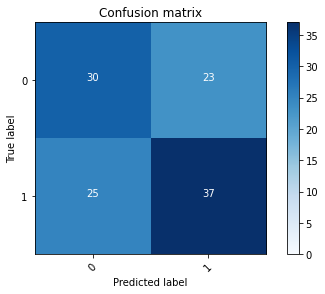

2022-08-22 15:25:06 - [Epoch Train: 50] loss: 0.2695, auc: 0.9650, acc: 0.8928, time: 24.00 s            
2022-08-22 15:25:06 - [Epoch Valid: 50] loss: 0.9950, auc: 0.5228, acc: 0.5868, time: 6.00 s
2022-08-22 15:25:06 - acc improved from 0.5868 to 0.5868. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-59-16/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e50-loss0.995-acc0.587-auc0.523.pth'


 50%|█████████████████████                     | 50/100 [25:50<25:56, 31.13s/it]

2022-08-22 15:25:06 - EPOCH: 51
2022-08-22 15:25:07 - Train Step 10/485, train_loss: 0.2188
2022-08-22 15:25:07 - Train Step 20/485, train_loss: 0.2366
2022-08-22 15:25:08 - Train Step 30/485, train_loss: 0.2971
2022-08-22 15:25:08 - Train Step 40/485, train_loss: 0.2769
2022-08-22 15:25:09 - Train Step 50/485, train_loss: 0.2849
2022-08-22 15:25:09 - Train Step 60/485, train_loss: 0.2697
2022-08-22 15:25:10 - Train Step 70/485, train_loss: 0.2585
2022-08-22 15:25:10 - Train Step 80/485, train_loss: 0.2476
2022-08-22 15:25:11 - Train Step 90/485, train_loss: 0.2570
2022-08-22 15:25:11 - Train Step 100/485, train_loss: 0.2567
2022-08-22 15:25:12 - Train Step 110/485, train_loss: 0.2563
2022-08-22 15:25:12 - Train Step 120/485, train_loss: 0.2575
2022-08-22 15:25:13 - Train Step 130/485, train_loss: 0.2633
2022-08-22 15:25:13 - Train Step 140/485, train_loss: 0.2788
2022-08-22 15:25:14 - Train Step 150/485, train_loss: 0.2713
2022-08-22 15:25:14 - Train Step 160/485, train_loss: 0.2615
2

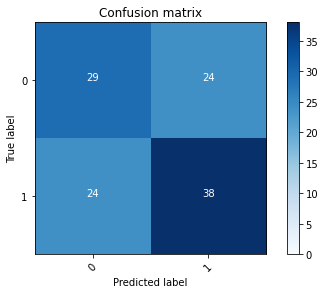

2022-08-22 15:25:37 - [Epoch Train: 51] loss: 0.2608, auc: 0.9695, acc: 0.9155, time: 24.00 s            
2022-08-22 15:25:37 - [Epoch Valid: 51] loss: 0.9743, auc: 0.5268, acc: 0.5785, time: 6.00 s


 51%|█████████████████████▍                    | 51/100 [26:21<25:24, 31.11s/it]

2022-08-22 15:25:37 - EPOCH: 52
2022-08-22 15:25:38 - Train Step 10/485, train_loss: 0.3674
2022-08-22 15:25:38 - Train Step 20/485, train_loss: 0.3863
2022-08-22 15:25:39 - Train Step 30/485, train_loss: 0.3813
2022-08-22 15:25:39 - Train Step 40/485, train_loss: 0.3340
2022-08-22 15:25:40 - Train Step 50/485, train_loss: 0.3008
2022-08-22 15:25:40 - Train Step 60/485, train_loss: 0.3162
2022-08-22 15:25:41 - Train Step 70/485, train_loss: 0.3364
2022-08-22 15:25:41 - Train Step 80/485, train_loss: 0.3428
2022-08-22 15:25:42 - Train Step 90/485, train_loss: 0.3304
2022-08-22 15:25:43 - Train Step 100/485, train_loss: 0.3098
2022-08-22 15:25:43 - Train Step 110/485, train_loss: 0.2964
2022-08-22 15:25:44 - Train Step 120/485, train_loss: 0.2892
2022-08-22 15:25:44 - Train Step 130/485, train_loss: 0.2892
2022-08-22 15:25:45 - Train Step 140/485, train_loss: 0.2816
2022-08-22 15:25:45 - Train Step 150/485, train_loss: 0.3050
2022-08-22 15:25:46 - Train Step 160/485, train_loss: 0.3020
2

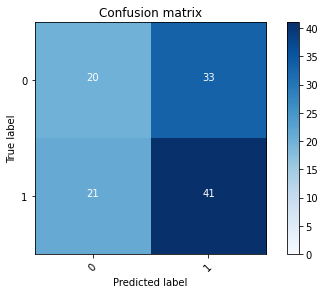

2022-08-22 15:26:09 - [Epoch Train: 52] loss: 0.2762, auc: 0.9586, acc: 0.8990, time: 25.00 s            
2022-08-22 15:26:09 - [Epoch Valid: 52] loss: 0.9667, auc: 0.5365, acc: 0.5207, time: 6.00 s


 52%|█████████████████████▊                    | 52/100 [26:53<25:03, 31.32s/it]

2022-08-22 15:26:09 - EPOCH: 53
2022-08-22 15:26:10 - Train Step 10/485, train_loss: 0.4057
2022-08-22 15:26:10 - Train Step 20/485, train_loss: 0.3580
2022-08-22 15:26:11 - Train Step 30/485, train_loss: 0.3255
2022-08-22 15:26:11 - Train Step 40/485, train_loss: 0.3003
2022-08-22 15:26:12 - Train Step 50/485, train_loss: 0.2763
2022-08-22 15:26:12 - Train Step 60/485, train_loss: 0.3017
2022-08-22 15:26:13 - Train Step 70/485, train_loss: 0.3161
2022-08-22 15:26:13 - Train Step 80/485, train_loss: 0.2959
2022-08-22 15:26:14 - Train Step 90/485, train_loss: 0.2938
2022-08-22 15:26:14 - Train Step 100/485, train_loss: 0.2956
2022-08-22 15:26:15 - Train Step 110/485, train_loss: 0.2880
2022-08-22 15:26:15 - Train Step 120/485, train_loss: 0.2744
2022-08-22 15:26:15 - Train Step 130/485, train_loss: 0.2753
2022-08-22 15:26:16 - Train Step 140/485, train_loss: 0.2641
2022-08-22 15:26:16 - Train Step 150/485, train_loss: 0.2594
2022-08-22 15:26:17 - Train Step 160/485, train_loss: 0.2582
2

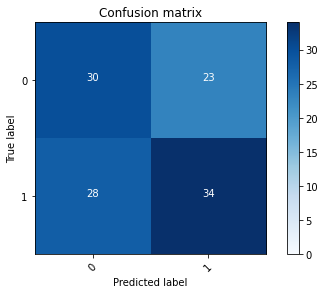

2022-08-22 15:26:40 - [Epoch Train: 53] loss: 0.2426, auc: 0.9724, acc: 0.9052, time: 24.00 s            
2022-08-22 15:26:40 - [Epoch Valid: 53] loss: 1.0446, auc: 0.5277, acc: 0.5537, time: 6.00 s


 53%|██████████████████████▎                   | 53/100 [27:24<24:28, 31.25s/it]

2022-08-22 15:26:40 - EPOCH: 54
2022-08-22 15:26:41 - Train Step 10/485, train_loss: 0.1909
2022-08-22 15:26:41 - Train Step 20/485, train_loss: 0.1615
2022-08-22 15:26:42 - Train Step 30/485, train_loss: 0.1577
2022-08-22 15:26:42 - Train Step 40/485, train_loss: 0.1848
2022-08-22 15:26:43 - Train Step 50/485, train_loss: 0.1762
2022-08-22 15:26:43 - Train Step 60/485, train_loss: 0.1712
2022-08-22 15:26:44 - Train Step 70/485, train_loss: 0.1796
2022-08-22 15:26:44 - Train Step 80/485, train_loss: 0.1963
2022-08-22 15:26:45 - Train Step 90/485, train_loss: 0.1988
2022-08-22 15:26:45 - Train Step 100/485, train_loss: 0.2110
2022-08-22 15:26:46 - Train Step 110/485, train_loss: 0.2067
2022-08-22 15:26:46 - Train Step 120/485, train_loss: 0.2095
2022-08-22 15:26:47 - Train Step 130/485, train_loss: 0.2277
2022-08-22 15:26:47 - Train Step 140/485, train_loss: 0.2327
2022-08-22 15:26:48 - Train Step 150/485, train_loss: 0.2242
2022-08-22 15:26:48 - Train Step 160/485, train_loss: 0.2195
2

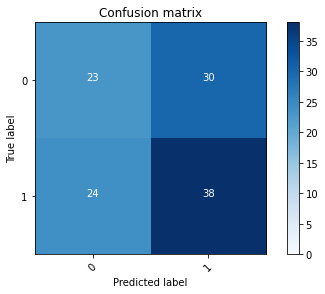

2022-08-22 15:27:12 - [Epoch Train: 54] loss: 0.2407, auc: 0.9704, acc: 0.8990, time: 24.00 s            
2022-08-22 15:27:12 - [Epoch Valid: 54] loss: 1.0128, auc: 0.5390, acc: 0.5289, time: 6.00 s


 54%|██████████████████████▋                   | 54/100 [27:55<24:01, 31.33s/it]

2022-08-22 15:27:12 - EPOCH: 55
2022-08-22 15:27:12 - Train Step 10/485, train_loss: 0.1186
2022-08-22 15:27:13 - Train Step 20/485, train_loss: 0.2261
2022-08-22 15:27:13 - Train Step 30/485, train_loss: 0.2393
2022-08-22 15:27:14 - Train Step 40/485, train_loss: 0.2730
2022-08-22 15:27:14 - Train Step 50/485, train_loss: 0.2484
2022-08-22 15:27:15 - Train Step 60/485, train_loss: 0.2358
2022-08-22 15:27:15 - Train Step 70/485, train_loss: 0.2464
2022-08-22 15:27:16 - Train Step 80/485, train_loss: 0.2602
2022-08-22 15:27:16 - Train Step 90/485, train_loss: 0.2549
2022-08-22 15:27:17 - Train Step 100/485, train_loss: 0.2479
2022-08-22 15:27:17 - Train Step 110/485, train_loss: 0.2648
2022-08-22 15:27:18 - Train Step 120/485, train_loss: 0.2560
2022-08-22 15:27:18 - Train Step 130/485, train_loss: 0.2500
2022-08-22 15:27:19 - Train Step 140/485, train_loss: 0.2424
2022-08-22 15:27:19 - Train Step 150/485, train_loss: 0.2392
2022-08-22 15:27:20 - Train Step 160/485, train_loss: 0.2419
2

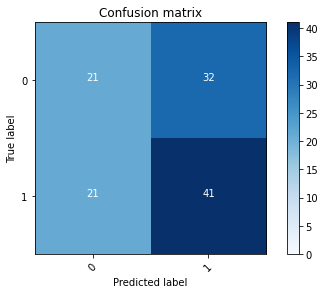

2022-08-22 15:27:43 - [Epoch Train: 55] loss: 0.2337, auc: 0.9745, acc: 0.9278, time: 24.00 s            
2022-08-22 15:27:43 - [Epoch Valid: 55] loss: 1.0322, auc: 0.5329, acc: 0.5289, time: 6.00 s


 55%|███████████████████████                   | 55/100 [28:27<23:27, 31.28s/it]

2022-08-22 15:27:43 - EPOCH: 56
2022-08-22 15:27:43 - Train Step 10/485, train_loss: 0.2668
2022-08-22 15:27:44 - Train Step 20/485, train_loss: 0.3077
2022-08-22 15:27:44 - Train Step 30/485, train_loss: 0.2993
2022-08-22 15:27:45 - Train Step 40/485, train_loss: 0.2608
2022-08-22 15:27:45 - Train Step 50/485, train_loss: 0.2327
2022-08-22 15:27:46 - Train Step 60/485, train_loss: 0.2159
2022-08-22 15:27:46 - Train Step 70/485, train_loss: 0.2266
2022-08-22 15:27:47 - Train Step 80/485, train_loss: 0.2405
2022-08-22 15:27:47 - Train Step 90/485, train_loss: 0.2434
2022-08-22 15:27:48 - Train Step 100/485, train_loss: 0.2344
2022-08-22 15:27:48 - Train Step 110/485, train_loss: 0.2315
2022-08-22 15:27:49 - Train Step 120/485, train_loss: 0.2275
2022-08-22 15:27:49 - Train Step 130/485, train_loss: 0.2236
2022-08-22 15:27:50 - Train Step 140/485, train_loss: 0.2305
2022-08-22 15:27:50 - Train Step 150/485, train_loss: 0.2203
2022-08-22 15:27:51 - Train Step 160/485, train_loss: 0.2154
2

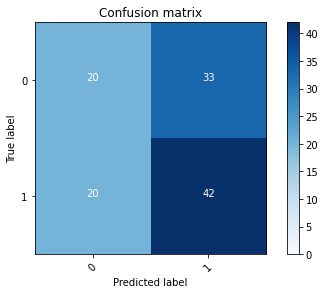

2022-08-22 15:28:14 - [Epoch Train: 56] loss: 0.2314, auc: 0.9749, acc: 0.9237, time: 24.00 s            
2022-08-22 15:28:14 - [Epoch Valid: 56] loss: 1.0574, auc: 0.5377, acc: 0.5289, time: 6.00 s


 56%|███████████████████████▌                  | 56/100 [28:58<22:54, 31.25s/it]

2022-08-22 15:28:14 - EPOCH: 57
2022-08-22 15:28:14 - Train Step 10/485, train_loss: 0.3186
2022-08-22 15:28:15 - Train Step 20/485, train_loss: 0.3976
2022-08-22 15:28:16 - Train Step 30/485, train_loss: 0.3767
2022-08-22 15:28:16 - Train Step 40/485, train_loss: 0.3368
2022-08-22 15:28:17 - Train Step 50/485, train_loss: 0.2859
2022-08-22 15:28:17 - Train Step 60/485, train_loss: 0.2556
2022-08-22 15:28:18 - Train Step 70/485, train_loss: 0.2504
2022-08-22 15:28:18 - Train Step 80/485, train_loss: 0.2521
2022-08-22 15:28:19 - Train Step 90/485, train_loss: 0.2373
2022-08-22 15:28:19 - Train Step 100/485, train_loss: 0.2297
2022-08-22 15:28:20 - Train Step 110/485, train_loss: 0.2313
2022-08-22 15:28:20 - Train Step 120/485, train_loss: 0.2436
2022-08-22 15:28:21 - Train Step 130/485, train_loss: 0.2438
2022-08-22 15:28:21 - Train Step 140/485, train_loss: 0.2428
2022-08-22 15:28:22 - Train Step 150/485, train_loss: 0.2568
2022-08-22 15:28:22 - Train Step 160/485, train_loss: 0.2526
2

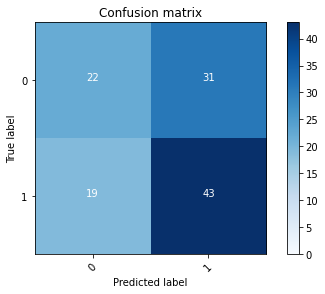

2022-08-22 15:28:45 - [Epoch Train: 57] loss: 0.2269, auc: 0.9754, acc: 0.9175, time: 24.00 s            
2022-08-22 15:28:45 - [Epoch Valid: 57] loss: 1.0590, auc: 0.5429, acc: 0.5537, time: 6.00 s


 57%|███████████████████████▉                  | 57/100 [29:29<22:22, 31.22s/it]

2022-08-22 15:28:45 - EPOCH: 58
2022-08-22 15:28:46 - Train Step 10/485, train_loss: 0.1859
2022-08-22 15:28:46 - Train Step 20/485, train_loss: 0.2485
2022-08-22 15:28:47 - Train Step 30/485, train_loss: 0.2088
2022-08-22 15:28:47 - Train Step 40/485, train_loss: 0.2143
2022-08-22 15:28:48 - Train Step 50/485, train_loss: 0.1984
2022-08-22 15:28:48 - Train Step 60/485, train_loss: 0.1888
2022-08-22 15:28:49 - Train Step 70/485, train_loss: 0.1821
2022-08-22 15:28:49 - Train Step 80/485, train_loss: 0.1712
2022-08-22 15:28:50 - Train Step 90/485, train_loss: 0.1747
2022-08-22 15:28:50 - Train Step 100/485, train_loss: 0.1708
2022-08-22 15:28:51 - Train Step 110/485, train_loss: 0.1735
2022-08-22 15:28:51 - Train Step 120/485, train_loss: 0.1820
2022-08-22 15:28:52 - Train Step 130/485, train_loss: 0.1866
2022-08-22 15:28:52 - Train Step 140/485, train_loss: 0.2013
2022-08-22 15:28:53 - Train Step 150/485, train_loss: 0.2009
2022-08-22 15:28:53 - Train Step 160/485, train_loss: 0.1989
2

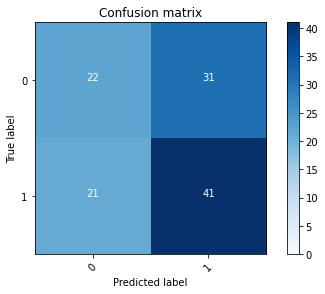

2022-08-22 15:29:16 - [Epoch Train: 58] loss: 0.2172, auc: 0.9796, acc: 0.9196, time: 24.00 s            
2022-08-22 15:29:16 - [Epoch Valid: 58] loss: 1.0533, auc: 0.5548, acc: 0.5372, time: 6.00 s


 58%|████████████████████████▎                 | 58/100 [30:00<21:51, 31.21s/it]

2022-08-22 15:29:16 - EPOCH: 59
2022-08-22 15:29:17 - Train Step 10/485, train_loss: 0.1251
2022-08-22 15:29:17 - Train Step 20/485, train_loss: 0.1359
2022-08-22 15:29:18 - Train Step 30/485, train_loss: 0.2035
2022-08-22 15:29:18 - Train Step 40/485, train_loss: 0.2385
2022-08-22 15:29:19 - Train Step 50/485, train_loss: 0.2413
2022-08-22 15:29:19 - Train Step 60/485, train_loss: 0.2146
2022-08-22 15:29:20 - Train Step 70/485, train_loss: 0.2071
2022-08-22 15:29:20 - Train Step 80/485, train_loss: 0.2107
2022-08-22 15:29:21 - Train Step 90/485, train_loss: 0.2066
2022-08-22 15:29:21 - Train Step 100/485, train_loss: 0.2007
2022-08-22 15:29:22 - Train Step 110/485, train_loss: 0.2051
2022-08-22 15:29:22 - Train Step 120/485, train_loss: 0.2048
2022-08-22 15:29:23 - Train Step 130/485, train_loss: 0.2015
2022-08-22 15:29:23 - Train Step 140/485, train_loss: 0.2000
2022-08-22 15:29:24 - Train Step 150/485, train_loss: 0.2021
2022-08-22 15:29:25 - Train Step 160/485, train_loss: 0.1922
2

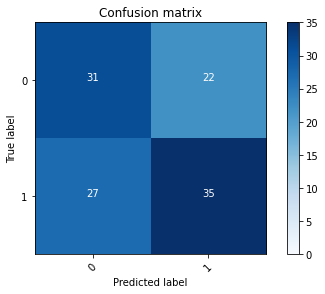

2022-08-22 15:29:48 - [Epoch Train: 59] loss: 0.2076, auc: 0.9797, acc: 0.9340, time: 25.00 s            
2022-08-22 15:29:48 - [Epoch Valid: 59] loss: 1.1056, auc: 0.5386, acc: 0.5702, time: 6.00 s


 59%|████████████████████████▊                 | 59/100 [30:32<21:25, 31.36s/it]

2022-08-22 15:29:48 - EPOCH: 60
2022-08-22 15:29:49 - Train Step 10/485, train_loss: 0.1119
2022-08-22 15:29:49 - Train Step 20/485, train_loss: 0.1026
2022-08-22 15:29:49 - Train Step 30/485, train_loss: 0.1795
2022-08-22 15:29:50 - Train Step 40/485, train_loss: 0.1534
2022-08-22 15:29:50 - Train Step 50/485, train_loss: 0.1700
2022-08-22 15:29:51 - Train Step 60/485, train_loss: 0.1695
2022-08-22 15:29:51 - Train Step 70/485, train_loss: 0.1630
2022-08-22 15:29:52 - Train Step 80/485, train_loss: 0.1681
2022-08-22 15:29:53 - Train Step 90/485, train_loss: 0.1585
2022-08-22 15:29:53 - Train Step 100/485, train_loss: 0.1667
2022-08-22 15:29:54 - Train Step 110/485, train_loss: 0.1648
2022-08-22 15:29:54 - Train Step 120/485, train_loss: 0.1762
2022-08-22 15:29:55 - Train Step 130/485, train_loss: 0.1833
2022-08-22 15:29:55 - Train Step 140/485, train_loss: 0.1974
2022-08-22 15:29:56 - Train Step 150/485, train_loss: 0.2028
2022-08-22 15:29:56 - Train Step 160/485, train_loss: 0.1991
2

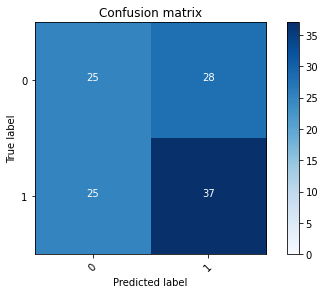

2022-08-22 15:30:19 - [Epoch Train: 60] loss: 0.1894, auc: 0.9858, acc: 0.9464, time: 24.00 s            
2022-08-22 15:30:19 - [Epoch Valid: 60] loss: 1.1046, auc: 0.5463, acc: 0.5289, time: 6.00 s


 60%|█████████████████████████▏                | 60/100 [31:03<20:54, 31.35s/it]

2022-08-22 15:30:19 - EPOCH: 61
2022-08-22 15:30:20 - Train Step 10/485, train_loss: 0.0978
2022-08-22 15:30:20 - Train Step 20/485, train_loss: 0.1822
2022-08-22 15:30:21 - Train Step 30/485, train_loss: 0.1841
2022-08-22 15:30:21 - Train Step 40/485, train_loss: 0.1674
2022-08-22 15:30:22 - Train Step 50/485, train_loss: 0.1405
2022-08-22 15:30:22 - Train Step 60/485, train_loss: 0.1291
2022-08-22 15:30:23 - Train Step 70/485, train_loss: 0.1621
2022-08-22 15:30:23 - Train Step 80/485, train_loss: 0.1605
2022-08-22 15:30:24 - Train Step 90/485, train_loss: 0.1684
2022-08-22 15:30:24 - Train Step 100/485, train_loss: 0.1788
2022-08-22 15:30:25 - Train Step 110/485, train_loss: 0.1783
2022-08-22 15:30:25 - Train Step 120/485, train_loss: 0.1813
2022-08-22 15:30:26 - Train Step 130/485, train_loss: 0.1875
2022-08-22 15:30:26 - Train Step 140/485, train_loss: 0.1928
2022-08-22 15:30:27 - Train Step 150/485, train_loss: 0.1915
2022-08-22 15:30:27 - Train Step 160/485, train_loss: 0.2025
2

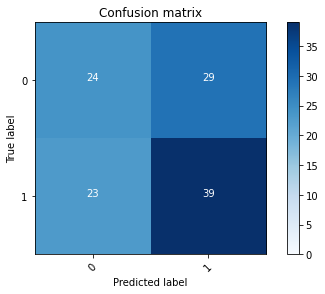

2022-08-22 15:30:50 - [Epoch Train: 61] loss: 0.1956, auc: 0.9850, acc: 0.9402, time: 24.00 s            
2022-08-22 15:30:50 - [Epoch Valid: 61] loss: 1.1455, auc: 0.5453, acc: 0.5372, time: 6.00 s


 61%|█████████████████████████▌                | 61/100 [31:34<20:20, 31.28s/it]

2022-08-22 15:30:50 - EPOCH: 62
2022-08-22 15:30:51 - Train Step 10/485, train_loss: 0.1324
2022-08-22 15:30:52 - Train Step 20/485, train_loss: 0.1817
2022-08-22 15:30:52 - Train Step 30/485, train_loss: 0.2108
2022-08-22 15:30:53 - Train Step 40/485, train_loss: 0.1817
2022-08-22 15:30:53 - Train Step 50/485, train_loss: 0.2163
2022-08-22 15:30:53 - Train Step 60/485, train_loss: 0.2772
2022-08-22 15:30:54 - Train Step 70/485, train_loss: 0.2723
2022-08-22 15:30:54 - Train Step 80/485, train_loss: 0.2575
2022-08-22 15:30:55 - Train Step 90/485, train_loss: 0.2451
2022-08-22 15:30:55 - Train Step 100/485, train_loss: 0.2345
2022-08-22 15:30:56 - Train Step 110/485, train_loss: 0.2291
2022-08-22 15:30:56 - Train Step 120/485, train_loss: 0.2337
2022-08-22 15:30:57 - Train Step 130/485, train_loss: 0.2247
2022-08-22 15:30:57 - Train Step 140/485, train_loss: 0.2132
2022-08-22 15:30:58 - Train Step 150/485, train_loss: 0.2076
2022-08-22 15:30:58 - Train Step 160/485, train_loss: 0.2139
2

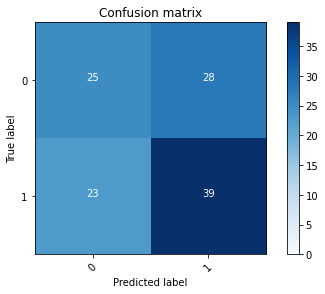

2022-08-22 15:31:22 - [Epoch Train: 62] loss: 0.1788, auc: 0.9854, acc: 0.9423, time: 24.00 s            
2022-08-22 15:31:22 - [Epoch Valid: 62] loss: 1.1746, auc: 0.5487, acc: 0.5455, time: 6.00 s


 62%|██████████████████████████                | 62/100 [32:06<19:48, 31.28s/it]

2022-08-22 15:31:22 - EPOCH: 63
2022-08-22 15:31:22 - Train Step 10/485, train_loss: 0.1301
2022-08-22 15:31:23 - Train Step 20/485, train_loss: 0.1137
2022-08-22 15:31:23 - Train Step 30/485, train_loss: 0.1255
2022-08-22 15:31:24 - Train Step 40/485, train_loss: 0.1824
2022-08-22 15:31:24 - Train Step 50/485, train_loss: 0.2115
2022-08-22 15:31:25 - Train Step 60/485, train_loss: 0.2003
2022-08-22 15:31:25 - Train Step 70/485, train_loss: 0.1900
2022-08-22 15:31:26 - Train Step 80/485, train_loss: 0.2091
2022-08-22 15:31:26 - Train Step 90/485, train_loss: 0.2006
2022-08-22 15:31:27 - Train Step 100/485, train_loss: 0.1985
2022-08-22 15:31:27 - Train Step 110/485, train_loss: 0.1892
2022-08-22 15:31:28 - Train Step 120/485, train_loss: 0.1894
2022-08-22 15:31:28 - Train Step 130/485, train_loss: 0.1920
2022-08-22 15:31:29 - Train Step 140/485, train_loss: 0.1929
2022-08-22 15:31:29 - Train Step 150/485, train_loss: 0.1855
2022-08-22 15:31:30 - Train Step 160/485, train_loss: 0.1826
2

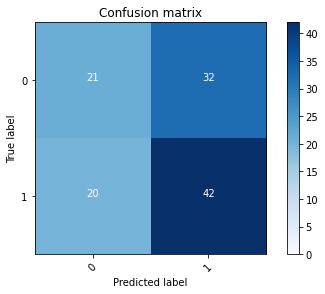

2022-08-22 15:31:52 - [Epoch Train: 63] loss: 0.1683, auc: 0.9880, acc: 0.9546, time: 24.00 s            
2022-08-22 15:31:52 - [Epoch Valid: 63] loss: 1.1909, auc: 0.5447, acc: 0.5372, time: 6.00 s


 63%|██████████████████████████▍               | 63/100 [32:36<19:12, 31.15s/it]

2022-08-22 15:31:52 - EPOCH: 64
2022-08-22 15:31:53 - Train Step 10/485, train_loss: 0.1731
2022-08-22 15:31:54 - Train Step 20/485, train_loss: 0.1779
2022-08-22 15:31:54 - Train Step 30/485, train_loss: 0.1480
2022-08-22 15:31:55 - Train Step 40/485, train_loss: 0.1649
2022-08-22 15:31:55 - Train Step 50/485, train_loss: 0.1702
2022-08-22 15:31:56 - Train Step 60/485, train_loss: 0.1848
2022-08-22 15:31:56 - Train Step 70/485, train_loss: 0.1709
2022-08-22 15:31:57 - Train Step 80/485, train_loss: 0.1680
2022-08-22 15:31:57 - Train Step 90/485, train_loss: 0.1586
2022-08-22 15:31:58 - Train Step 100/485, train_loss: 0.1555
2022-08-22 15:31:58 - Train Step 110/485, train_loss: 0.1513
2022-08-22 15:31:59 - Train Step 120/485, train_loss: 0.1492
2022-08-22 15:31:59 - Train Step 130/485, train_loss: 0.1404
2022-08-22 15:32:00 - Train Step 140/485, train_loss: 0.1385
2022-08-22 15:32:00 - Train Step 150/485, train_loss: 0.1324
2022-08-22 15:32:01 - Train Step 160/485, train_loss: 0.1375
2

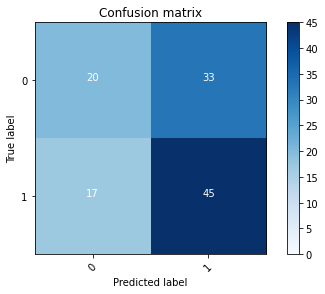

2022-08-22 15:32:24 - [Epoch Train: 64] loss: 0.1588, auc: 0.9921, acc: 0.9485, time: 24.00 s            
2022-08-22 15:32:24 - [Epoch Valid: 64] loss: 1.2539, auc: 0.5493, acc: 0.5537, time: 6.00 s


 64%|██████████████████████████▉               | 64/100 [33:07<18:40, 31.13s/it]

2022-08-22 15:32:24 - EPOCH: 65
2022-08-22 15:32:24 - Train Step 10/485, train_loss: 0.1550
2022-08-22 15:32:25 - Train Step 20/485, train_loss: 0.1440
2022-08-22 15:32:25 - Train Step 30/485, train_loss: 0.1441
2022-08-22 15:32:26 - Train Step 40/485, train_loss: 0.1438
2022-08-22 15:32:26 - Train Step 50/485, train_loss: 0.1502
2022-08-22 15:32:27 - Train Step 60/485, train_loss: 0.1487
2022-08-22 15:32:27 - Train Step 70/485, train_loss: 0.1405
2022-08-22 15:32:28 - Train Step 80/485, train_loss: 0.1534
2022-08-22 15:32:28 - Train Step 90/485, train_loss: 0.1798
2022-08-22 15:32:29 - Train Step 100/485, train_loss: 0.1900
2022-08-22 15:32:29 - Train Step 110/485, train_loss: 0.1971
2022-08-22 15:32:30 - Train Step 120/485, train_loss: 0.1939
2022-08-22 15:32:30 - Train Step 130/485, train_loss: 0.2006
2022-08-22 15:32:31 - Train Step 140/485, train_loss: 0.1929
2022-08-22 15:32:31 - Train Step 150/485, train_loss: 0.1855
2022-08-22 15:32:32 - Train Step 160/485, train_loss: 0.1847
2

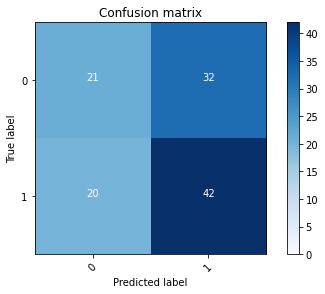

2022-08-22 15:32:55 - [Epoch Train: 65] loss: 0.1698, auc: 0.9877, acc: 0.9443, time: 24.00 s            
2022-08-22 15:32:55 - [Epoch Valid: 65] loss: 1.2143, auc: 0.5526, acc: 0.5372, time: 6.00 s


 65%|███████████████████████████▎              | 65/100 [33:39<18:09, 31.14s/it]

2022-08-22 15:32:55 - EPOCH: 66
2022-08-22 15:32:55 - Train Step 10/485, train_loss: 0.1297
2022-08-22 15:32:56 - Train Step 20/485, train_loss: 0.0837
2022-08-22 15:32:56 - Train Step 30/485, train_loss: 0.0850
2022-08-22 15:32:57 - Train Step 40/485, train_loss: 0.1004
2022-08-22 15:32:57 - Train Step 50/485, train_loss: 0.0991
2022-08-22 15:32:58 - Train Step 60/485, train_loss: 0.0892
2022-08-22 15:32:58 - Train Step 70/485, train_loss: 0.0899
2022-08-22 15:32:59 - Train Step 80/485, train_loss: 0.1080
2022-08-22 15:32:59 - Train Step 90/485, train_loss: 0.1030
2022-08-22 15:33:00 - Train Step 100/485, train_loss: 0.0993
2022-08-22 15:33:00 - Train Step 110/485, train_loss: 0.1205
2022-08-22 15:33:01 - Train Step 120/485, train_loss: 0.1287
2022-08-22 15:33:01 - Train Step 130/485, train_loss: 0.1320
2022-08-22 15:33:02 - Train Step 140/485, train_loss: 0.1278
2022-08-22 15:33:02 - Train Step 150/485, train_loss: 0.1251
2022-08-22 15:33:03 - Train Step 160/485, train_loss: 0.1291
2

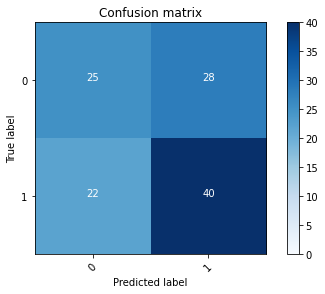

2022-08-22 15:33:26 - [Epoch Train: 66] loss: 0.1526, auc: 0.9926, acc: 0.9608, time: 24.00 s            
2022-08-22 15:33:26 - [Epoch Valid: 66] loss: 1.2053, auc: 0.5496, acc: 0.5537, time: 6.00 s


 66%|███████████████████████████▋              | 66/100 [34:10<17:39, 31.15s/it]

2022-08-22 15:33:26 - EPOCH: 67
2022-08-22 15:33:27 - Train Step 10/485, train_loss: 0.2479
2022-08-22 15:33:27 - Train Step 20/485, train_loss: 0.1890
2022-08-22 15:33:28 - Train Step 30/485, train_loss: 0.1696
2022-08-22 15:33:28 - Train Step 40/485, train_loss: 0.1386
2022-08-22 15:33:29 - Train Step 50/485, train_loss: 0.1530
2022-08-22 15:33:29 - Train Step 60/485, train_loss: 0.1468
2022-08-22 15:33:30 - Train Step 70/485, train_loss: 0.1382
2022-08-22 15:33:30 - Train Step 80/485, train_loss: 0.1257
2022-08-22 15:33:31 - Train Step 90/485, train_loss: 0.1223
2022-08-22 15:33:31 - Train Step 100/485, train_loss: 0.1165
2022-08-22 15:33:32 - Train Step 110/485, train_loss: 0.1118
2022-08-22 15:33:32 - Train Step 120/485, train_loss: 0.1316
2022-08-22 15:33:33 - Train Step 130/485, train_loss: 0.1267
2022-08-22 15:33:33 - Train Step 140/485, train_loss: 0.1300
2022-08-22 15:33:34 - Train Step 150/485, train_loss: 0.1243
2022-08-22 15:33:34 - Train Step 160/485, train_loss: 0.1265
2

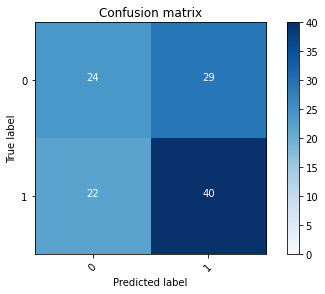

2022-08-22 15:33:57 - [Epoch Train: 67] loss: 0.1497, auc: 0.9916, acc: 0.9567, time: 24.00 s            
2022-08-22 15:33:57 - [Epoch Valid: 67] loss: 1.2407, auc: 0.5481, acc: 0.5455, time: 6.00 s


 67%|████████████████████████████▏             | 67/100 [34:41<17:08, 31.18s/it]

2022-08-22 15:33:57 - EPOCH: 68
2022-08-22 15:33:58 - Train Step 10/485, train_loss: 0.1561
2022-08-22 15:33:58 - Train Step 20/485, train_loss: 0.1827
2022-08-22 15:33:59 - Train Step 30/485, train_loss: 0.1932
2022-08-22 15:33:59 - Train Step 40/485, train_loss: 0.1829
2022-08-22 15:34:00 - Train Step 50/485, train_loss: 0.1740
2022-08-22 15:34:00 - Train Step 60/485, train_loss: 0.1867
2022-08-22 15:34:01 - Train Step 70/485, train_loss: 0.1751
2022-08-22 15:34:01 - Train Step 80/485, train_loss: 0.1687
2022-08-22 15:34:02 - Train Step 90/485, train_loss: 0.1585
2022-08-22 15:34:02 - Train Step 100/485, train_loss: 0.1643
2022-08-22 15:34:03 - Train Step 110/485, train_loss: 0.1557
2022-08-22 15:34:03 - Train Step 120/485, train_loss: 0.1533
2022-08-22 15:34:04 - Train Step 130/485, train_loss: 0.1532
2022-08-22 15:34:04 - Train Step 140/485, train_loss: 0.1497
2022-08-22 15:34:05 - Train Step 150/485, train_loss: 0.1491
2022-08-22 15:34:06 - Train Step 160/485, train_loss: 0.1439
2

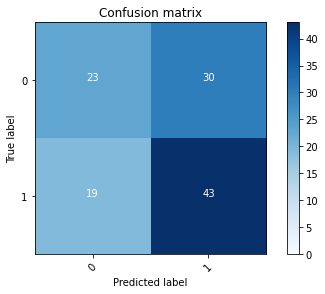

2022-08-22 15:34:29 - [Epoch Train: 68] loss: 0.1481, auc: 0.9928, acc: 0.9526, time: 24.00 s            
2022-08-22 15:34:29 - [Epoch Valid: 68] loss: 1.2219, auc: 0.5487, acc: 0.5620, time: 6.00 s


 68%|████████████████████████████▌             | 68/100 [35:13<16:40, 31.27s/it]

2022-08-22 15:34:29 - EPOCH: 69
2022-08-22 15:34:29 - Train Step 10/485, train_loss: 0.0903
2022-08-22 15:34:30 - Train Step 20/485, train_loss: 0.0727
2022-08-22 15:34:30 - Train Step 30/485, train_loss: 0.0739
2022-08-22 15:34:31 - Train Step 40/485, train_loss: 0.0667
2022-08-22 15:34:31 - Train Step 50/485, train_loss: 0.0834
2022-08-22 15:34:32 - Train Step 60/485, train_loss: 0.0820
2022-08-22 15:34:32 - Train Step 70/485, train_loss: 0.0935
2022-08-22 15:34:33 - Train Step 80/485, train_loss: 0.1027
2022-08-22 15:34:33 - Train Step 90/485, train_loss: 0.1091
2022-08-22 15:34:34 - Train Step 100/485, train_loss: 0.1084
2022-08-22 15:34:34 - Train Step 110/485, train_loss: 0.1189
2022-08-22 15:34:35 - Train Step 120/485, train_loss: 0.1396
2022-08-22 15:34:35 - Train Step 130/485, train_loss: 0.1405
2022-08-22 15:34:36 - Train Step 140/485, train_loss: 0.1353
2022-08-22 15:34:36 - Train Step 150/485, train_loss: 0.1331
2022-08-22 15:34:37 - Train Step 160/485, train_loss: 0.1305
2

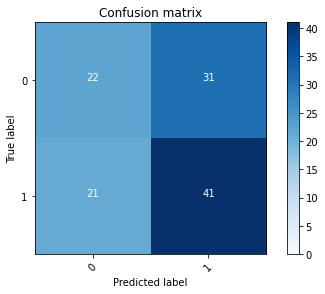

2022-08-22 15:35:00 - [Epoch Train: 69] loss: 0.1443, auc: 0.9922, acc: 0.9608, time: 24.00 s            
2022-08-22 15:35:00 - [Epoch Valid: 69] loss: 1.3371, auc: 0.5514, acc: 0.5372, time: 6.00 s


 69%|████████████████████████████▉             | 69/100 [35:44<16:09, 31.26s/it]

2022-08-22 15:35:00 - EPOCH: 70
2022-08-22 15:35:01 - Train Step 10/485, train_loss: 0.0707
2022-08-22 15:35:01 - Train Step 20/485, train_loss: 0.1287
2022-08-22 15:35:01 - Train Step 30/485, train_loss: 0.0976
2022-08-22 15:35:02 - Train Step 40/485, train_loss: 0.0856
2022-08-22 15:35:03 - Train Step 50/485, train_loss: 0.1156
2022-08-22 15:35:03 - Train Step 60/485, train_loss: 0.1136
2022-08-22 15:35:04 - Train Step 70/485, train_loss: 0.1050
2022-08-22 15:35:04 - Train Step 80/485, train_loss: 0.1172
2022-08-22 15:35:05 - Train Step 90/485, train_loss: 0.1216
2022-08-22 15:35:05 - Train Step 100/485, train_loss: 0.1174
2022-08-22 15:35:06 - Train Step 110/485, train_loss: 0.1184
2022-08-22 15:35:06 - Train Step 120/485, train_loss: 0.1271
2022-08-22 15:35:07 - Train Step 130/485, train_loss: 0.1236
2022-08-22 15:35:07 - Train Step 140/485, train_loss: 0.1272
2022-08-22 15:35:08 - Train Step 150/485, train_loss: 0.1333
2022-08-22 15:35:08 - Train Step 160/485, train_loss: 0.1312
2

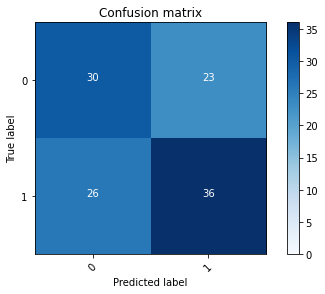

2022-08-22 15:35:31 - [Epoch Train: 70] loss: 0.1264, auc: 0.9946, acc: 0.9670, time: 24.00 s            
2022-08-22 15:35:31 - [Epoch Valid: 70] loss: 1.4308, auc: 0.5496, acc: 0.5620, time: 6.00 s


 70%|█████████████████████████████▍            | 70/100 [36:15<15:35, 31.19s/it]

2022-08-22 15:35:31 - EPOCH: 71
2022-08-22 15:35:32 - Train Step 10/485, train_loss: 0.1377
2022-08-22 15:35:32 - Train Step 20/485, train_loss: 0.0992
2022-08-22 15:35:33 - Train Step 30/485, train_loss: 0.1056
2022-08-22 15:35:33 - Train Step 40/485, train_loss: 0.1003
2022-08-22 15:35:34 - Train Step 50/485, train_loss: 0.0890
2022-08-22 15:35:34 - Train Step 60/485, train_loss: 0.0997
2022-08-22 15:35:35 - Train Step 70/485, train_loss: 0.0968
2022-08-22 15:35:35 - Train Step 80/485, train_loss: 0.0964
2022-08-22 15:35:36 - Train Step 90/485, train_loss: 0.0944
2022-08-22 15:35:36 - Train Step 100/485, train_loss: 0.0910
2022-08-22 15:35:37 - Train Step 110/485, train_loss: 0.1120
2022-08-22 15:35:37 - Train Step 120/485, train_loss: 0.1162
2022-08-22 15:35:38 - Train Step 130/485, train_loss: 0.1139
2022-08-22 15:35:38 - Train Step 140/485, train_loss: 0.1167
2022-08-22 15:35:39 - Train Step 150/485, train_loss: 0.1140
2022-08-22 15:35:39 - Train Step 160/485, train_loss: 0.1222
2

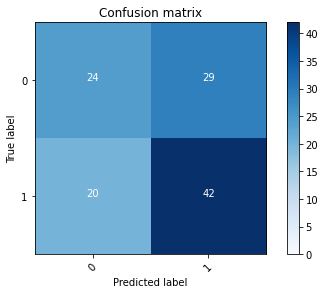

2022-08-22 15:36:02 - [Epoch Train: 71] loss: 0.1203, auc: 0.9961, acc: 0.9691, time: 25.00 s            
2022-08-22 15:36:02 - [Epoch Valid: 71] loss: 1.2991, auc: 0.5530, acc: 0.5620, time: 6.00 s


 71%|█████████████████████████████▊            | 71/100 [36:46<15:07, 31.31s/it]

2022-08-22 15:36:02 - EPOCH: 72
2022-08-22 15:36:03 - Train Step 10/485, train_loss: 0.0692
2022-08-22 15:36:04 - Train Step 20/485, train_loss: 0.0765
2022-08-22 15:36:04 - Train Step 30/485, train_loss: 0.0653
2022-08-22 15:36:05 - Train Step 40/485, train_loss: 0.0859
2022-08-22 15:36:05 - Train Step 50/485, train_loss: 0.1035
2022-08-22 15:36:06 - Train Step 60/485, train_loss: 0.1069
2022-08-22 15:36:06 - Train Step 70/485, train_loss: 0.1025
2022-08-22 15:36:07 - Train Step 80/485, train_loss: 0.1043
2022-08-22 15:36:07 - Train Step 90/485, train_loss: 0.0995
2022-08-22 15:36:08 - Train Step 100/485, train_loss: 0.1045
2022-08-22 15:36:08 - Train Step 110/485, train_loss: 0.1076
2022-08-22 15:36:09 - Train Step 120/485, train_loss: 0.1120
2022-08-22 15:36:09 - Train Step 130/485, train_loss: 0.1074
2022-08-22 15:36:10 - Train Step 140/485, train_loss: 0.1123
2022-08-22 15:36:10 - Train Step 150/485, train_loss: 0.1114
2022-08-22 15:36:11 - Train Step 160/485, train_loss: 0.1065
2

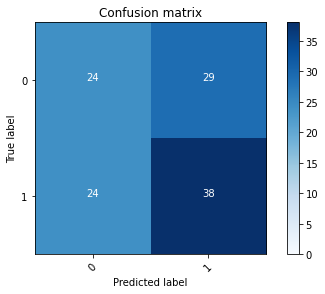

2022-08-22 15:36:34 - [Epoch Train: 72] loss: 0.1125, auc: 0.9961, acc: 0.9732, time: 24.00 s            
2022-08-22 15:36:34 - [Epoch Valid: 72] loss: 1.4192, auc: 0.5417, acc: 0.5289, time: 6.00 s


 72%|██████████████████████████████▏           | 72/100 [37:18<14:36, 31.30s/it]

2022-08-22 15:36:34 - EPOCH: 73
2022-08-22 15:36:34 - Train Step 10/485, train_loss: 0.2400
2022-08-22 15:36:35 - Train Step 20/485, train_loss: 0.1611
2022-08-22 15:36:35 - Train Step 30/485, train_loss: 0.1276
2022-08-22 15:36:36 - Train Step 40/485, train_loss: 0.1273
2022-08-22 15:36:37 - Train Step 50/485, train_loss: 0.1231
2022-08-22 15:36:37 - Train Step 60/485, train_loss: 0.1135
2022-08-22 15:36:38 - Train Step 70/485, train_loss: 0.1017
2022-08-22 15:36:38 - Train Step 80/485, train_loss: 0.1001
2022-08-22 15:36:39 - Train Step 90/485, train_loss: 0.0985
2022-08-22 15:36:39 - Train Step 100/485, train_loss: 0.1086
2022-08-22 15:36:40 - Train Step 110/485, train_loss: 0.1135
2022-08-22 15:36:40 - Train Step 120/485, train_loss: 0.1112
2022-08-22 15:36:41 - Train Step 130/485, train_loss: 0.1083
2022-08-22 15:36:41 - Train Step 140/485, train_loss: 0.1190
2022-08-22 15:36:42 - Train Step 150/485, train_loss: 0.1154
2022-08-22 15:36:42 - Train Step 160/485, train_loss: 0.1147
2

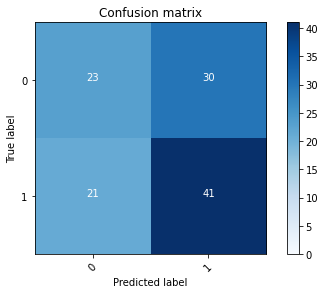

2022-08-22 15:37:05 - [Epoch Train: 73] loss: 0.1133, auc: 0.9968, acc: 0.9711, time: 24.00 s            
2022-08-22 15:37:05 - [Epoch Valid: 73] loss: 1.4543, auc: 0.5490, acc: 0.5455, time: 6.00 s


 73%|██████████████████████████████▋           | 73/100 [37:49<14:05, 31.31s/it]

2022-08-22 15:37:05 - EPOCH: 74
2022-08-22 15:37:06 - Train Step 10/485, train_loss: 0.2243
2022-08-22 15:37:06 - Train Step 20/485, train_loss: 0.1561
2022-08-22 15:37:07 - Train Step 30/485, train_loss: 0.1267
2022-08-22 15:37:07 - Train Step 40/485, train_loss: 0.1178
2022-08-22 15:37:08 - Train Step 50/485, train_loss: 0.1216
2022-08-22 15:37:08 - Train Step 60/485, train_loss: 0.1138
2022-08-22 15:37:09 - Train Step 70/485, train_loss: 0.1056
2022-08-22 15:37:09 - Train Step 80/485, train_loss: 0.0951
2022-08-22 15:37:10 - Train Step 90/485, train_loss: 0.0925
2022-08-22 15:37:10 - Train Step 100/485, train_loss: 0.0935
2022-08-22 15:37:11 - Train Step 110/485, train_loss: 0.0866
2022-08-22 15:37:11 - Train Step 120/485, train_loss: 0.0945
2022-08-22 15:37:12 - Train Step 130/485, train_loss: 0.0936
2022-08-22 15:37:12 - Train Step 140/485, train_loss: 0.1006
2022-08-22 15:37:13 - Train Step 150/485, train_loss: 0.1025
2022-08-22 15:37:13 - Train Step 160/485, train_loss: 0.1057
2

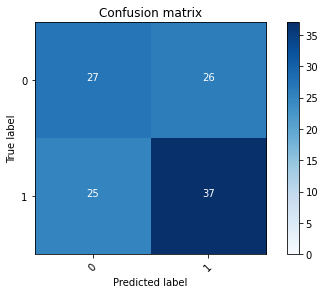

2022-08-22 15:37:36 - [Epoch Train: 74] loss: 0.1060, auc: 0.9978, acc: 0.9753, time: 24.00 s            
2022-08-22 15:37:36 - [Epoch Valid: 74] loss: 1.4076, auc: 0.5487, acc: 0.5455, time: 6.00 s


 74%|███████████████████████████████           | 74/100 [38:20<13:30, 31.16s/it]

2022-08-22 15:37:36 - EPOCH: 75
2022-08-22 15:37:37 - Train Step 10/485, train_loss: 0.1003
2022-08-22 15:37:37 - Train Step 20/485, train_loss: 0.0877
2022-08-22 15:37:38 - Train Step 30/485, train_loss: 0.0848
2022-08-22 15:37:38 - Train Step 40/485, train_loss: 0.0917
2022-08-22 15:37:39 - Train Step 50/485, train_loss: 0.0815
2022-08-22 15:37:39 - Train Step 60/485, train_loss: 0.0809
2022-08-22 15:37:40 - Train Step 70/485, train_loss: 0.0831
2022-08-22 15:37:40 - Train Step 80/485, train_loss: 0.0778
2022-08-22 15:37:41 - Train Step 90/485, train_loss: 0.0812
2022-08-22 15:37:41 - Train Step 100/485, train_loss: 0.0825
2022-08-22 15:37:42 - Train Step 110/485, train_loss: 0.0841
2022-08-22 15:37:42 - Train Step 120/485, train_loss: 0.0799
2022-08-22 15:37:43 - Train Step 130/485, train_loss: 0.0856
2022-08-22 15:37:43 - Train Step 140/485, train_loss: 0.0874
2022-08-22 15:37:44 - Train Step 150/485, train_loss: 0.0870
2022-08-22 15:37:44 - Train Step 160/485, train_loss: 0.0865
2

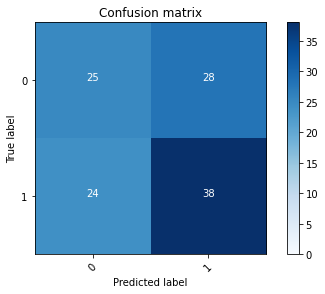

2022-08-22 15:38:07 - [Epoch Train: 75] loss: 0.1011, auc: 0.9971, acc: 0.9773, time: 24.00 s            
2022-08-22 15:38:07 - [Epoch Valid: 75] loss: 1.3548, auc: 0.5414, acc: 0.5372, time: 6.00 s


 75%|███████████████████████████████▌          | 75/100 [38:51<13:00, 31.23s/it]

2022-08-22 15:38:07 - EPOCH: 76
2022-08-22 15:38:08 - Train Step 10/485, train_loss: 0.0865
2022-08-22 15:38:08 - Train Step 20/485, train_loss: 0.1117
2022-08-22 15:38:09 - Train Step 30/485, train_loss: 0.1114
2022-08-22 15:38:09 - Train Step 40/485, train_loss: 0.1096
2022-08-22 15:38:10 - Train Step 50/485, train_loss: 0.1098
2022-08-22 15:38:11 - Train Step 60/485, train_loss: 0.1164
2022-08-22 15:38:11 - Train Step 70/485, train_loss: 0.1099
2022-08-22 15:38:12 - Train Step 80/485, train_loss: 0.1079
2022-08-22 15:38:12 - Train Step 90/485, train_loss: 0.1051
2022-08-22 15:38:13 - Train Step 100/485, train_loss: 0.1012
2022-08-22 15:38:13 - Train Step 110/485, train_loss: 0.0951
2022-08-22 15:38:14 - Train Step 120/485, train_loss: 0.1051
2022-08-22 15:38:14 - Train Step 130/485, train_loss: 0.1067
2022-08-22 15:38:15 - Train Step 140/485, train_loss: 0.1036
2022-08-22 15:38:15 - Train Step 150/485, train_loss: 0.1005
2022-08-22 15:38:16 - Train Step 160/485, train_loss: 0.0970
2

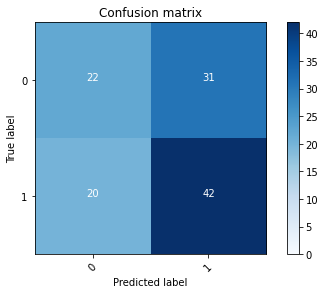

2022-08-22 15:38:39 - [Epoch Train: 76] loss: 0.1001, auc: 0.9973, acc: 0.9753, time: 25.00 s            
2022-08-22 15:38:39 - [Epoch Valid: 76] loss: 1.3779, auc: 0.5505, acc: 0.5455, time: 6.00 s


 76%|███████████████████████████████▉          | 76/100 [39:23<12:32, 31.34s/it]

2022-08-22 15:38:39 - EPOCH: 77
2022-08-22 15:38:40 - Train Step 10/485, train_loss: 0.0860
2022-08-22 15:38:40 - Train Step 20/485, train_loss: 0.0882
2022-08-22 15:38:41 - Train Step 30/485, train_loss: 0.0838
2022-08-22 15:38:41 - Train Step 40/485, train_loss: 0.0905
2022-08-22 15:38:42 - Train Step 50/485, train_loss: 0.0998
2022-08-22 15:38:42 - Train Step 60/485, train_loss: 0.0911
2022-08-22 15:38:43 - Train Step 70/485, train_loss: 0.0809
2022-08-22 15:38:43 - Train Step 80/485, train_loss: 0.0727
2022-08-22 15:38:44 - Train Step 90/485, train_loss: 0.0881
2022-08-22 15:38:44 - Train Step 100/485, train_loss: 0.0885
2022-08-22 15:38:45 - Train Step 110/485, train_loss: 0.0932
2022-08-22 15:38:45 - Train Step 120/485, train_loss: 0.0914
2022-08-22 15:38:46 - Train Step 130/485, train_loss: 0.0885
2022-08-22 15:38:46 - Train Step 140/485, train_loss: 0.0893
2022-08-22 15:38:47 - Train Step 150/485, train_loss: 0.0886
2022-08-22 15:38:47 - Train Step 160/485, train_loss: 0.0857
2

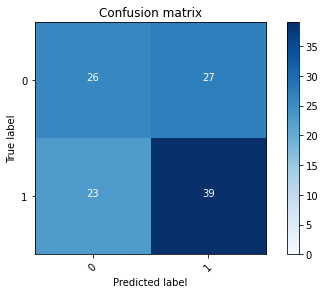

2022-08-22 15:39:10 - [Epoch Train: 77] loss: 0.0952, auc: 0.9985, acc: 0.9732, time: 24.00 s            
2022-08-22 15:39:10 - [Epoch Valid: 77] loss: 1.4681, auc: 0.5517, acc: 0.5537, time: 6.00 s


 77%|████████████████████████████████▎         | 77/100 [39:54<12:01, 31.36s/it]

2022-08-22 15:39:10 - EPOCH: 78
2022-08-22 15:39:11 - Train Step 10/485, train_loss: 0.0267
2022-08-22 15:39:11 - Train Step 20/485, train_loss: 0.0446
2022-08-22 15:39:12 - Train Step 30/485, train_loss: 0.0471
2022-08-22 15:39:12 - Train Step 40/485, train_loss: 0.0750
2022-08-22 15:39:13 - Train Step 50/485, train_loss: 0.0725
2022-08-22 15:39:14 - Train Step 60/485, train_loss: 0.0763
2022-08-22 15:39:14 - Train Step 70/485, train_loss: 0.0803
2022-08-22 15:39:15 - Train Step 80/485, train_loss: 0.0849
2022-08-22 15:39:15 - Train Step 90/485, train_loss: 0.0858
2022-08-22 15:39:16 - Train Step 100/485, train_loss: 0.0845
2022-08-22 15:39:16 - Train Step 110/485, train_loss: 0.0791
2022-08-22 15:39:17 - Train Step 120/485, train_loss: 0.0823
2022-08-22 15:39:17 - Train Step 130/485, train_loss: 0.0864
2022-08-22 15:39:18 - Train Step 140/485, train_loss: 0.0853
2022-08-22 15:39:18 - Train Step 150/485, train_loss: 0.0971
2022-08-22 15:39:19 - Train Step 160/485, train_loss: 0.0927
2

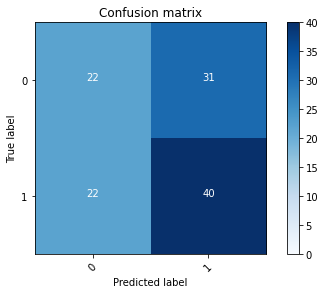

2022-08-22 15:39:42 - [Epoch Train: 78] loss: 0.0856, auc: 0.9987, acc: 0.9856, time: 25.00 s            
2022-08-22 15:39:42 - [Epoch Valid: 78] loss: 1.6080, auc: 0.5487, acc: 0.5289, time: 6.00 s


 78%|████████████████████████████████▊         | 78/100 [40:26<11:30, 31.38s/it]

2022-08-22 15:39:42 - EPOCH: 79
2022-08-22 15:39:42 - Train Step 10/485, train_loss: 0.0319
2022-08-22 15:39:43 - Train Step 20/485, train_loss: 0.0368
2022-08-22 15:39:43 - Train Step 30/485, train_loss: 0.0633
2022-08-22 15:39:44 - Train Step 40/485, train_loss: 0.0649
2022-08-22 15:39:44 - Train Step 50/485, train_loss: 0.0707
2022-08-22 15:39:45 - Train Step 60/485, train_loss: 0.0638
2022-08-22 15:39:45 - Train Step 70/485, train_loss: 0.0639
2022-08-22 15:39:46 - Train Step 80/485, train_loss: 0.0628
2022-08-22 15:39:46 - Train Step 90/485, train_loss: 0.0638
2022-08-22 15:39:47 - Train Step 100/485, train_loss: 0.0721
2022-08-22 15:39:48 - Train Step 110/485, train_loss: 0.0702
2022-08-22 15:39:48 - Train Step 120/485, train_loss: 0.0719
2022-08-22 15:39:49 - Train Step 130/485, train_loss: 0.0689
2022-08-22 15:39:49 - Train Step 140/485, train_loss: 0.0680
2022-08-22 15:39:50 - Train Step 150/485, train_loss: 0.0684
2022-08-22 15:39:50 - Train Step 160/485, train_loss: 0.0683
2

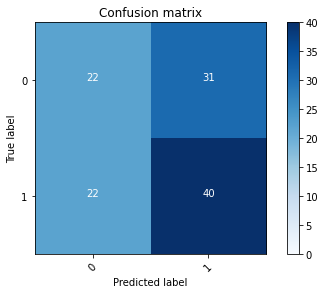

2022-08-22 15:40:13 - [Epoch Train: 79] loss: 0.0748, auc: 0.9996, acc: 0.9856, time: 25.00 s            
2022-08-22 15:40:13 - [Epoch Valid: 79] loss: 1.6482, auc: 0.5493, acc: 0.5289, time: 6.00 s


 79%|█████████████████████████████████▏        | 79/100 [40:57<10:59, 31.39s/it]

2022-08-22 15:40:13 - EPOCH: 80
2022-08-22 15:40:14 - Train Step 10/485, train_loss: 0.0637
2022-08-22 15:40:14 - Train Step 20/485, train_loss: 0.0594
2022-08-22 15:40:15 - Train Step 30/485, train_loss: 0.0682
2022-08-22 15:40:15 - Train Step 40/485, train_loss: 0.1150
2022-08-22 15:40:16 - Train Step 50/485, train_loss: 0.1047
2022-08-22 15:40:16 - Train Step 60/485, train_loss: 0.1195
2022-08-22 15:40:17 - Train Step 70/485, train_loss: 0.1102
2022-08-22 15:40:17 - Train Step 80/485, train_loss: 0.1071
2022-08-22 15:40:18 - Train Step 90/485, train_loss: 0.1000
2022-08-22 15:40:18 - Train Step 100/485, train_loss: 0.1065
2022-08-22 15:40:19 - Train Step 110/485, train_loss: 0.0992
2022-08-22 15:40:19 - Train Step 120/485, train_loss: 0.0943
2022-08-22 15:40:20 - Train Step 130/485, train_loss: 0.0899
2022-08-22 15:40:20 - Train Step 140/485, train_loss: 0.0869
2022-08-22 15:40:21 - Train Step 150/485, train_loss: 0.0957
2022-08-22 15:40:21 - Train Step 160/485, train_loss: 0.0937
2

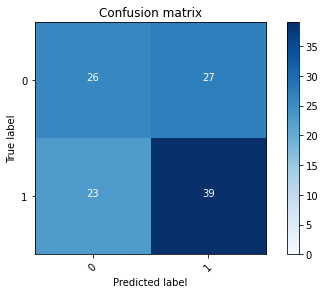

2022-08-22 15:40:44 - [Epoch Train: 80] loss: 0.0881, auc: 0.9980, acc: 0.9814, time: 24.00 s            
2022-08-22 15:40:44 - [Epoch Valid: 80] loss: 1.5521, auc: 0.5505, acc: 0.5537, time: 6.00 s


 80%|█████████████████████████████████▌        | 80/100 [41:28<10:26, 31.33s/it]

2022-08-22 15:40:44 - EPOCH: 81
2022-08-22 15:40:45 - Train Step 10/485, train_loss: 0.0190
2022-08-22 15:40:45 - Train Step 20/485, train_loss: 0.0576
2022-08-22 15:40:46 - Train Step 30/485, train_loss: 0.0817
2022-08-22 15:40:46 - Train Step 40/485, train_loss: 0.0880
2022-08-22 15:40:47 - Train Step 50/485, train_loss: 0.1109
2022-08-22 15:40:48 - Train Step 60/485, train_loss: 0.0946
2022-08-22 15:40:48 - Train Step 70/485, train_loss: 0.0853
2022-08-22 15:40:49 - Train Step 80/485, train_loss: 0.0800
2022-08-22 15:40:49 - Train Step 90/485, train_loss: 0.0750
2022-08-22 15:40:50 - Train Step 100/485, train_loss: 0.0715
2022-08-22 15:40:50 - Train Step 110/485, train_loss: 0.0681
2022-08-22 15:40:51 - Train Step 120/485, train_loss: 0.0652
2022-08-22 15:40:51 - Train Step 130/485, train_loss: 0.0644
2022-08-22 15:40:52 - Train Step 140/485, train_loss: 0.0645
2022-08-22 15:40:52 - Train Step 150/485, train_loss: 0.0643
2022-08-22 15:40:53 - Train Step 160/485, train_loss: 0.0618
2

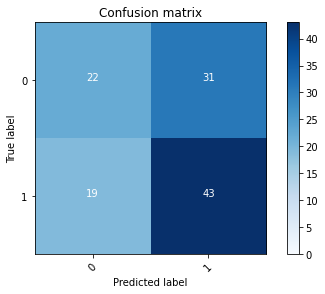

2022-08-22 15:41:16 - [Epoch Train: 81] loss: 0.0744, auc: 0.9992, acc: 0.9856, time: 24.00 s            
2022-08-22 15:41:16 - [Epoch Valid: 81] loss: 1.5865, auc: 0.5551, acc: 0.5537, time: 6.00 s


 81%|██████████████████████████████████        | 81/100 [42:00<09:55, 31.35s/it]

2022-08-22 15:41:16 - EPOCH: 82
2022-08-22 15:41:16 - Train Step 10/485, train_loss: 0.0665
2022-08-22 15:41:17 - Train Step 20/485, train_loss: 0.0522
2022-08-22 15:41:17 - Train Step 30/485, train_loss: 0.0477
2022-08-22 15:41:18 - Train Step 40/485, train_loss: 0.0537
2022-08-22 15:41:18 - Train Step 50/485, train_loss: 0.0637
2022-08-22 15:41:19 - Train Step 60/485, train_loss: 0.0693
2022-08-22 15:41:19 - Train Step 70/485, train_loss: 0.0735
2022-08-22 15:41:20 - Train Step 80/485, train_loss: 0.0754
2022-08-22 15:41:20 - Train Step 90/485, train_loss: 0.0833
2022-08-22 15:41:21 - Train Step 100/485, train_loss: 0.0777
2022-08-22 15:41:21 - Train Step 110/485, train_loss: 0.0889
2022-08-22 15:41:22 - Train Step 120/485, train_loss: 0.0856
2022-08-22 15:41:22 - Train Step 130/485, train_loss: 0.0818
2022-08-22 15:41:23 - Train Step 140/485, train_loss: 0.0842
2022-08-22 15:41:23 - Train Step 150/485, train_loss: 0.0800
2022-08-22 15:41:24 - Train Step 160/485, train_loss: 0.0789
2

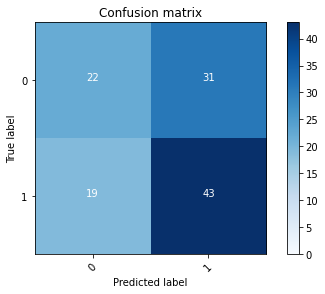

2022-08-22 15:41:47 - [Epoch Train: 82] loss: 0.0788, auc: 0.9985, acc: 0.9773, time: 24.00 s            
2022-08-22 15:41:47 - [Epoch Valid: 82] loss: 1.5822, auc: 0.5584, acc: 0.5537, time: 6.00 s


 82%|██████████████████████████████████▍       | 82/100 [42:31<09:23, 31.31s/it]

2022-08-22 15:41:47 - EPOCH: 83
2022-08-22 15:41:48 - Train Step 10/485, train_loss: 0.0540
2022-08-22 15:41:48 - Train Step 20/485, train_loss: 0.0449
2022-08-22 15:41:49 - Train Step 30/485, train_loss: 0.0408
2022-08-22 15:41:49 - Train Step 40/485, train_loss: 0.0364
2022-08-22 15:41:50 - Train Step 50/485, train_loss: 0.0541
2022-08-22 15:41:50 - Train Step 60/485, train_loss: 0.0539
2022-08-22 15:41:51 - Train Step 70/485, train_loss: 0.0576
2022-08-22 15:41:51 - Train Step 80/485, train_loss: 0.0598
2022-08-22 15:41:52 - Train Step 90/485, train_loss: 0.0557
2022-08-22 15:41:52 - Train Step 100/485, train_loss: 0.0547
2022-08-22 15:41:53 - Train Step 110/485, train_loss: 0.0529
2022-08-22 15:41:53 - Train Step 120/485, train_loss: 0.0530
2022-08-22 15:41:54 - Train Step 130/485, train_loss: 0.0533
2022-08-22 15:41:54 - Train Step 140/485, train_loss: 0.0545
2022-08-22 15:41:55 - Train Step 150/485, train_loss: 0.0534
2022-08-22 15:41:55 - Train Step 160/485, train_loss: 0.0540
2

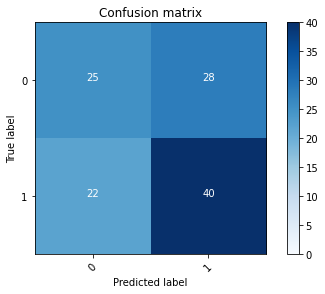

2022-08-22 15:42:18 - [Epoch Train: 83] loss: 0.0600, auc: 0.9998, acc: 0.9918, time: 24.00 s            
2022-08-22 15:42:18 - [Epoch Valid: 83] loss: 1.6773, auc: 0.5508, acc: 0.5537, time: 6.00 s


 83%|██████████████████████████████████▊       | 83/100 [43:02<08:51, 31.26s/it]

2022-08-22 15:42:18 - EPOCH: 84
2022-08-22 15:42:19 - Train Step 10/485, train_loss: 0.1102
2022-08-22 15:42:19 - Train Step 20/485, train_loss: 0.0623
2022-08-22 15:42:20 - Train Step 30/485, train_loss: 0.0526
2022-08-22 15:42:20 - Train Step 40/485, train_loss: 0.0573
2022-08-22 15:42:21 - Train Step 50/485, train_loss: 0.0717
2022-08-22 15:42:21 - Train Step 60/485, train_loss: 0.0776
2022-08-22 15:42:22 - Train Step 70/485, train_loss: 0.0776
2022-08-22 15:42:22 - Train Step 80/485, train_loss: 0.0740
2022-08-22 15:42:23 - Train Step 90/485, train_loss: 0.0680
2022-08-22 15:42:23 - Train Step 100/485, train_loss: 0.0666
2022-08-22 15:42:24 - Train Step 110/485, train_loss: 0.0718
2022-08-22 15:42:24 - Train Step 120/485, train_loss: 0.0716
2022-08-22 15:42:25 - Train Step 130/485, train_loss: 0.0686
2022-08-22 15:42:25 - Train Step 140/485, train_loss: 0.0690
2022-08-22 15:42:26 - Train Step 150/485, train_loss: 0.0671
2022-08-22 15:42:26 - Train Step 160/485, train_loss: 0.0673
2

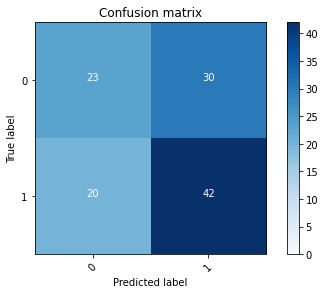

2022-08-22 15:42:49 - [Epoch Train: 84] loss: 0.0562, auc: 0.9999, acc: 0.9897, time: 24.00 s            
2022-08-22 15:42:49 - [Epoch Valid: 84] loss: 1.7197, auc: 0.5466, acc: 0.5537, time: 6.00 s


 84%|███████████████████████████████████▎      | 84/100 [43:33<08:20, 31.26s/it]

2022-08-22 15:42:49 - EPOCH: 85
2022-08-22 15:42:50 - Train Step 10/485, train_loss: 0.1871
2022-08-22 15:42:51 - Train Step 20/485, train_loss: 0.1130
2022-08-22 15:42:51 - Train Step 30/485, train_loss: 0.1251
2022-08-22 15:42:52 - Train Step 40/485, train_loss: 0.1049
2022-08-22 15:42:52 - Train Step 50/485, train_loss: 0.1116
2022-08-22 15:42:53 - Train Step 60/485, train_loss: 0.1044
2022-08-22 15:42:53 - Train Step 70/485, train_loss: 0.1022
2022-08-22 15:42:54 - Train Step 80/485, train_loss: 0.0964
2022-08-22 15:42:54 - Train Step 90/485, train_loss: 0.0957
2022-08-22 15:42:55 - Train Step 100/485, train_loss: 0.0883
2022-08-22 15:42:55 - Train Step 110/485, train_loss: 0.0832
2022-08-22 15:42:56 - Train Step 120/485, train_loss: 0.0811
2022-08-22 15:42:56 - Train Step 130/485, train_loss: 0.0816
2022-08-22 15:42:57 - Train Step 140/485, train_loss: 0.0788
2022-08-22 15:42:57 - Train Step 150/485, train_loss: 0.0775
2022-08-22 15:42:58 - Train Step 160/485, train_loss: 0.0733
2

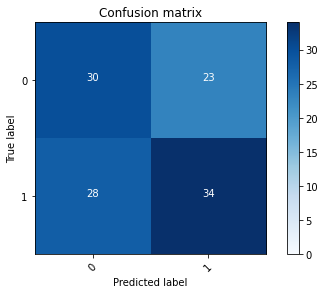

2022-08-22 15:43:21 - [Epoch Train: 85] loss: 0.0676, auc: 0.9992, acc: 0.9876, time: 24.00 s            
2022-08-22 15:43:21 - [Epoch Valid: 85] loss: 1.9507, auc: 0.5429, acc: 0.5455, time: 6.00 s


 85%|███████████████████████████████████▋      | 85/100 [44:05<07:49, 31.28s/it]

2022-08-22 15:43:21 - EPOCH: 86
2022-08-22 15:43:21 - Train Step 10/485, train_loss: 0.0774
2022-08-22 15:43:22 - Train Step 20/485, train_loss: 0.0511
2022-08-22 15:43:22 - Train Step 30/485, train_loss: 0.0448
2022-08-22 15:43:23 - Train Step 40/485, train_loss: 0.0627
2022-08-22 15:43:23 - Train Step 50/485, train_loss: 0.0620
2022-08-22 15:43:24 - Train Step 60/485, train_loss: 0.0544
2022-08-22 15:43:24 - Train Step 70/485, train_loss: 0.0512
2022-08-22 15:43:25 - Train Step 80/485, train_loss: 0.0462
2022-08-22 15:43:25 - Train Step 90/485, train_loss: 0.0441
2022-08-22 15:43:26 - Train Step 100/485, train_loss: 0.0438
2022-08-22 15:43:26 - Train Step 110/485, train_loss: 0.0463
2022-08-22 15:43:27 - Train Step 120/485, train_loss: 0.0443
2022-08-22 15:43:27 - Train Step 130/485, train_loss: 0.0449
2022-08-22 15:43:28 - Train Step 140/485, train_loss: 0.0425
2022-08-22 15:43:28 - Train Step 150/485, train_loss: 0.0429
2022-08-22 15:43:29 - Train Step 160/485, train_loss: 0.0420
2

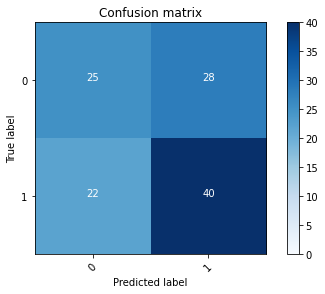

2022-08-22 15:43:52 - [Epoch Train: 86] loss: 0.0505, auc: 0.9997, acc: 0.9918, time: 25.00 s            
2022-08-22 15:43:52 - [Epoch Valid: 86] loss: 1.7458, auc: 0.5572, acc: 0.5537, time: 6.00 s


 86%|████████████████████████████████████      | 86/100 [44:36<07:18, 31.33s/it]

2022-08-22 15:43:52 - EPOCH: 87
2022-08-22 15:43:53 - Train Step 10/485, train_loss: 0.0461
2022-08-22 15:43:53 - Train Step 20/485, train_loss: 0.0506
2022-08-22 15:43:54 - Train Step 30/485, train_loss: 0.0545
2022-08-22 15:43:54 - Train Step 40/485, train_loss: 0.0514
2022-08-22 15:43:55 - Train Step 50/485, train_loss: 0.0482
2022-08-22 15:43:55 - Train Step 60/485, train_loss: 0.0443
2022-08-22 15:43:56 - Train Step 70/485, train_loss: 0.0454
2022-08-22 15:43:56 - Train Step 80/485, train_loss: 0.0518
2022-08-22 15:43:57 - Train Step 90/485, train_loss: 0.0501
2022-08-22 15:43:57 - Train Step 100/485, train_loss: 0.0492
2022-08-22 15:43:58 - Train Step 110/485, train_loss: 0.0470
2022-08-22 15:43:58 - Train Step 120/485, train_loss: 0.0472
2022-08-22 15:43:59 - Train Step 130/485, train_loss: 0.0463
2022-08-22 15:43:59 - Train Step 140/485, train_loss: 0.0467
2022-08-22 15:44:00 - Train Step 150/485, train_loss: 0.0446
2022-08-22 15:44:00 - Train Step 160/485, train_loss: 0.0527
2

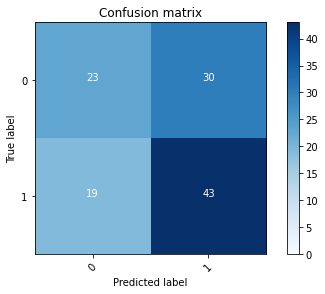

2022-08-22 15:44:23 - [Epoch Train: 87] loss: 0.0504, auc: 0.9996, acc: 0.9918, time: 24.00 s            
2022-08-22 15:44:23 - [Epoch Valid: 87] loss: 1.8178, auc: 0.5530, acc: 0.5620, time: 6.00 s


 87%|████████████████████████████████████▌     | 87/100 [45:07<06:46, 31.28s/it]

2022-08-22 15:44:23 - EPOCH: 88
2022-08-22 15:44:24 - Train Step 10/485, train_loss: 0.0555
2022-08-22 15:44:24 - Train Step 20/485, train_loss: 0.0533
2022-08-22 15:44:25 - Train Step 30/485, train_loss: 0.0629
2022-08-22 15:44:25 - Train Step 40/485, train_loss: 0.0588
2022-08-22 15:44:26 - Train Step 50/485, train_loss: 0.0681
2022-08-22 15:44:26 - Train Step 60/485, train_loss: 0.0620
2022-08-22 15:44:27 - Train Step 70/485, train_loss: 0.0596
2022-08-22 15:44:27 - Train Step 80/485, train_loss: 0.0551
2022-08-22 15:44:28 - Train Step 90/485, train_loss: 0.0586
2022-08-22 15:44:29 - Train Step 100/485, train_loss: 0.0549
2022-08-22 15:44:29 - Train Step 110/485, train_loss: 0.0543
2022-08-22 15:44:30 - Train Step 120/485, train_loss: 0.0512
2022-08-22 15:44:30 - Train Step 130/485, train_loss: 0.0504
2022-08-22 15:44:31 - Train Step 140/485, train_loss: 0.0490
2022-08-22 15:44:31 - Train Step 150/485, train_loss: 0.0536
2022-08-22 15:44:32 - Train Step 160/485, train_loss: 0.0514
2

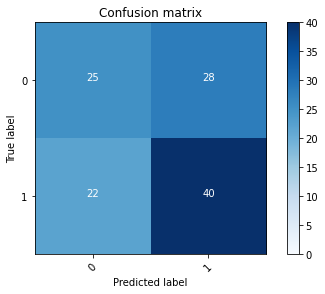

2022-08-22 15:44:55 - [Epoch Train: 88] loss: 0.0530, auc: 0.9997, acc: 0.9918, time: 24.00 s            
2022-08-22 15:44:55 - [Epoch Valid: 88] loss: 2.0371, auc: 0.5487, acc: 0.5537, time: 6.00 s


 88%|████████████████████████████████████▉     | 88/100 [45:39<06:15, 31.30s/it]

2022-08-22 15:44:55 - EPOCH: 89
2022-08-22 15:44:55 - Train Step 10/485, train_loss: 0.0168
2022-08-22 15:44:56 - Train Step 20/485, train_loss: 0.0215
2022-08-22 15:44:56 - Train Step 30/485, train_loss: 0.0485
2022-08-22 15:44:57 - Train Step 40/485, train_loss: 0.0375
2022-08-22 15:44:57 - Train Step 50/485, train_loss: 0.0363
2022-08-22 15:44:58 - Train Step 60/485, train_loss: 0.0368
2022-08-22 15:44:58 - Train Step 70/485, train_loss: 0.0387
2022-08-22 15:44:59 - Train Step 80/485, train_loss: 0.0398
2022-08-22 15:44:59 - Train Step 90/485, train_loss: 0.0400
2022-08-22 15:45:00 - Train Step 100/485, train_loss: 0.0379
2022-08-22 15:45:00 - Train Step 110/485, train_loss: 0.0464
2022-08-22 15:45:01 - Train Step 120/485, train_loss: 0.0434
2022-08-22 15:45:01 - Train Step 130/485, train_loss: 0.0424
2022-08-22 15:45:02 - Train Step 140/485, train_loss: 0.0435
2022-08-22 15:45:03 - Train Step 150/485, train_loss: 0.0423
2022-08-22 15:45:03 - Train Step 160/485, train_loss: 0.0409
2

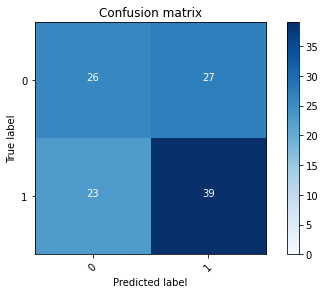

2022-08-22 15:45:27 - [Epoch Train: 89] loss: 0.0409, auc: 0.9999, acc: 0.9938, time: 25.00 s            
2022-08-22 15:45:27 - [Epoch Valid: 89] loss: 1.9080, auc: 0.5408, acc: 0.5537, time: 7.00 s


 89%|█████████████████████████████████████▍    | 89/100 [46:11<05:49, 31.75s/it]

2022-08-22 15:45:27 - EPOCH: 90
2022-08-22 15:45:28 - Train Step 10/485, train_loss: 0.0113
2022-08-22 15:45:29 - Train Step 20/485, train_loss: 0.0244
2022-08-22 15:45:29 - Train Step 30/485, train_loss: 0.0433
2022-08-22 15:45:30 - Train Step 40/485, train_loss: 0.0471
2022-08-22 15:45:30 - Train Step 50/485, train_loss: 0.0443
2022-08-22 15:45:31 - Train Step 60/485, train_loss: 0.0385
2022-08-22 15:45:32 - Train Step 70/485, train_loss: 0.0371
2022-08-22 15:45:32 - Train Step 80/485, train_loss: 0.0469
2022-08-22 15:45:33 - Train Step 90/485, train_loss: 0.0429
2022-08-22 15:45:34 - Train Step 100/485, train_loss: 0.0444
2022-08-22 15:45:34 - Train Step 110/485, train_loss: 0.0420
2022-08-22 15:45:35 - Train Step 120/485, train_loss: 0.0427
2022-08-22 15:45:36 - Train Step 130/485, train_loss: 0.0404
2022-08-22 15:45:36 - Train Step 140/485, train_loss: 0.0402
2022-08-22 15:45:37 - Train Step 150/485, train_loss: 0.0408
2022-08-22 15:45:37 - Train Step 160/485, train_loss: 0.0393
2

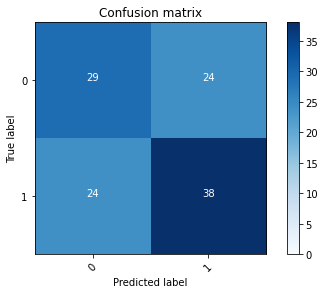

2022-08-22 15:46:06 - [Epoch Train: 90] loss: 0.0509, auc: 0.9998, acc: 0.9918, time: 30.00 s            
2022-08-22 15:46:06 - [Epoch Valid: 90] loss: 1.9305, auc: 0.5450, acc: 0.5702, time: 7.00 s


 90%|█████████████████████████████████████▊    | 90/100 [46:50<05:36, 33.68s/it]

2022-08-22 15:46:06 - EPOCH: 91
2022-08-22 15:46:06 - Train Step 10/485, train_loss: 0.0053
2022-08-22 15:46:07 - Train Step 20/485, train_loss: 0.0120
2022-08-22 15:46:08 - Train Step 30/485, train_loss: 0.0251
2022-08-22 15:46:08 - Train Step 40/485, train_loss: 0.0240
2022-08-22 15:46:09 - Train Step 50/485, train_loss: 0.0215
2022-08-22 15:46:09 - Train Step 60/485, train_loss: 0.0259
2022-08-22 15:46:10 - Train Step 70/485, train_loss: 0.0308
2022-08-22 15:46:10 - Train Step 80/485, train_loss: 0.0287
2022-08-22 15:46:11 - Train Step 90/485, train_loss: 0.0302
2022-08-22 15:46:12 - Train Step 100/485, train_loss: 0.0314
2022-08-22 15:46:12 - Train Step 110/485, train_loss: 0.0384
2022-08-22 15:46:13 - Train Step 120/485, train_loss: 0.0367
2022-08-22 15:46:13 - Train Step 130/485, train_loss: 0.0373
2022-08-22 15:46:14 - Train Step 140/485, train_loss: 0.0355
2022-08-22 15:46:14 - Train Step 150/485, train_loss: 0.0365
2022-08-22 15:46:15 - Train Step 160/485, train_loss: 0.0352
2

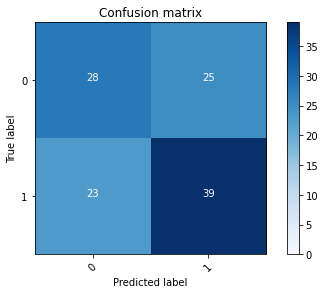

2022-08-22 15:46:40 - [Epoch Train: 91] loss: 0.0427, auc: 0.9999, acc: 0.9918, time: 27.00 s            
2022-08-22 15:46:40 - [Epoch Valid: 91] loss: 2.0414, auc: 0.5526, acc: 0.5702, time: 6.00 s


 91%|██████████████████████████████████████▏   | 91/100 [47:24<05:04, 33.81s/it]

2022-08-22 15:46:40 - EPOCH: 92
2022-08-22 15:46:40 - Train Step 10/485, train_loss: 0.0470
2022-08-22 15:46:41 - Train Step 20/485, train_loss: 0.0370
2022-08-22 15:46:41 - Train Step 30/485, train_loss: 0.0365
2022-08-22 15:46:42 - Train Step 40/485, train_loss: 0.0656
2022-08-22 15:46:43 - Train Step 50/485, train_loss: 0.0754
2022-08-22 15:46:43 - Train Step 60/485, train_loss: 0.0650
2022-08-22 15:46:44 - Train Step 70/485, train_loss: 0.0606
2022-08-22 15:46:44 - Train Step 80/485, train_loss: 0.0584
2022-08-22 15:46:45 - Train Step 90/485, train_loss: 0.0578
2022-08-22 15:46:45 - Train Step 100/485, train_loss: 0.0553
2022-08-22 15:46:46 - Train Step 110/485, train_loss: 0.0528
2022-08-22 15:46:46 - Train Step 120/485, train_loss: 0.0494
2022-08-22 15:46:47 - Train Step 130/485, train_loss: 0.0511
2022-08-22 15:46:47 - Train Step 140/485, train_loss: 0.0489
2022-08-22 15:46:48 - Train Step 150/485, train_loss: 0.0470
2022-08-22 15:46:48 - Train Step 160/485, train_loss: 0.0452
2

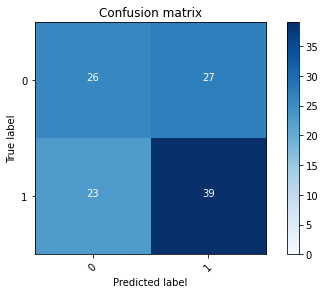

2022-08-22 15:47:11 - [Epoch Train: 92] loss: 0.0454, auc: 0.9998, acc: 0.9938, time: 24.00 s            
2022-08-22 15:47:11 - [Epoch Valid: 92] loss: 1.9970, auc: 0.5508, acc: 0.5537, time: 6.00 s


 92%|██████████████████████████████████████▋   | 92/100 [47:55<04:24, 33.07s/it]

2022-08-22 15:47:11 - EPOCH: 93
2022-08-22 15:47:12 - Train Step 10/485, train_loss: 0.0415
2022-08-22 15:47:12 - Train Step 20/485, train_loss: 0.0308
2022-08-22 15:47:13 - Train Step 30/485, train_loss: 0.0313
2022-08-22 15:47:13 - Train Step 40/485, train_loss: 0.0294
2022-08-22 15:47:14 - Train Step 50/485, train_loss: 0.0300
2022-08-22 15:47:14 - Train Step 60/485, train_loss: 0.0353
2022-08-22 15:47:15 - Train Step 70/485, train_loss: 0.0313
2022-08-22 15:47:15 - Train Step 80/485, train_loss: 0.0292
2022-08-22 15:47:16 - Train Step 90/485, train_loss: 0.0291
2022-08-22 15:47:16 - Train Step 100/485, train_loss: 0.0299
2022-08-22 15:47:17 - Train Step 110/485, train_loss: 0.0283
2022-08-22 15:47:17 - Train Step 120/485, train_loss: 0.0287
2022-08-22 15:47:18 - Train Step 130/485, train_loss: 0.0360
2022-08-22 15:47:18 - Train Step 140/485, train_loss: 0.0359
2022-08-22 15:47:19 - Train Step 150/485, train_loss: 0.0353
2022-08-22 15:47:19 - Train Step 160/485, train_loss: 0.0366
2

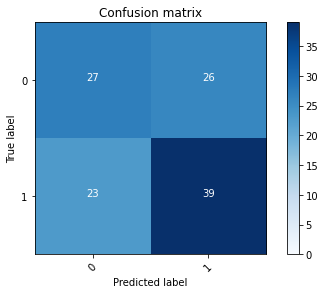

2022-08-22 15:47:42 - [Epoch Train: 93] loss: 0.0423, auc: 1.0000, acc: 0.9938, time: 24.00 s            
2022-08-22 15:47:42 - [Epoch Valid: 93] loss: 1.7941, auc: 0.5438, acc: 0.5620, time: 6.00 s


 93%|███████████████████████████████████████   | 93/100 [48:26<03:47, 32.53s/it]

2022-08-22 15:47:42 - EPOCH: 94
2022-08-22 15:47:43 - Train Step 10/485, train_loss: 0.0087
2022-08-22 15:47:44 - Train Step 20/485, train_loss: 0.0153
2022-08-22 15:47:44 - Train Step 30/485, train_loss: 0.0158
2022-08-22 15:47:45 - Train Step 40/485, train_loss: 0.0192
2022-08-22 15:47:45 - Train Step 50/485, train_loss: 0.0288
2022-08-22 15:47:46 - Train Step 60/485, train_loss: 0.0266
2022-08-22 15:47:46 - Train Step 70/485, train_loss: 0.0266
2022-08-22 15:47:47 - Train Step 80/485, train_loss: 0.0268
2022-08-22 15:47:47 - Train Step 90/485, train_loss: 0.0393
2022-08-22 15:47:48 - Train Step 100/485, train_loss: 0.0360
2022-08-22 15:47:48 - Train Step 110/485, train_loss: 0.0406
2022-08-22 15:47:49 - Train Step 120/485, train_loss: 0.0433
2022-08-22 15:47:49 - Train Step 130/485, train_loss: 0.0408
2022-08-22 15:47:50 - Train Step 140/485, train_loss: 0.0466
2022-08-22 15:47:50 - Train Step 150/485, train_loss: 0.0455
2022-08-22 15:47:51 - Train Step 160/485, train_loss: 0.0432
2

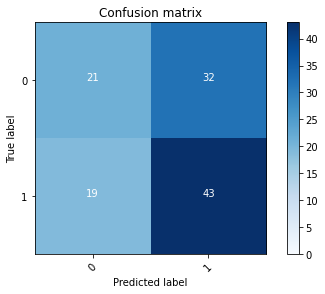

2022-08-22 15:48:14 - [Epoch Train: 94] loss: 0.0362, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 15:48:14 - [Epoch Valid: 94] loss: 2.1403, auc: 0.5523, acc: 0.5455, time: 6.00 s


 94%|███████████████████████████████████████▍  | 94/100 [48:57<03:12, 32.14s/it]

2022-08-22 15:48:14 - EPOCH: 95
2022-08-22 15:48:14 - Train Step 10/485, train_loss: 0.0380
2022-08-22 15:48:15 - Train Step 20/485, train_loss: 0.0412
2022-08-22 15:48:15 - Train Step 30/485, train_loss: 0.0326
2022-08-22 15:48:16 - Train Step 40/485, train_loss: 0.0453
2022-08-22 15:48:16 - Train Step 50/485, train_loss: 0.0423
2022-08-22 15:48:17 - Train Step 60/485, train_loss: 0.0447
2022-08-22 15:48:17 - Train Step 70/485, train_loss: 0.0417
2022-08-22 15:48:18 - Train Step 80/485, train_loss: 0.0386
2022-08-22 15:48:18 - Train Step 90/485, train_loss: 0.0419
2022-08-22 15:48:19 - Train Step 100/485, train_loss: 0.0492
2022-08-22 15:48:19 - Train Step 110/485, train_loss: 0.0502
2022-08-22 15:48:20 - Train Step 120/485, train_loss: 0.0496
2022-08-22 15:48:20 - Train Step 130/485, train_loss: 0.0462
2022-08-22 15:48:21 - Train Step 140/485, train_loss: 0.0457
2022-08-22 15:48:21 - Train Step 150/485, train_loss: 0.0439
2022-08-22 15:48:22 - Train Step 160/485, train_loss: 0.0425
2

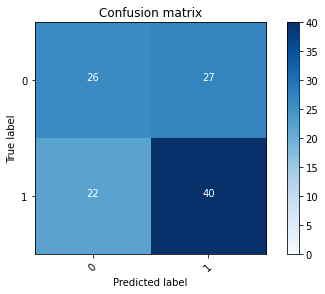

2022-08-22 15:48:45 - [Epoch Train: 95] loss: 0.0392, auc: 0.9999, acc: 0.9918, time: 24.00 s            
2022-08-22 15:48:45 - [Epoch Valid: 95] loss: 2.0047, auc: 0.5450, acc: 0.5620, time: 6.00 s


 95%|███████████████████████████████████████▉  | 95/100 [49:29<02:39, 31.93s/it]

2022-08-22 15:48:45 - EPOCH: 96
2022-08-22 15:48:46 - Train Step 10/485, train_loss: 0.0269
2022-08-22 15:48:46 - Train Step 20/485, train_loss: 0.0328
2022-08-22 15:48:47 - Train Step 30/485, train_loss: 0.0338
2022-08-22 15:48:47 - Train Step 40/485, train_loss: 0.0292
2022-08-22 15:48:48 - Train Step 50/485, train_loss: 0.0270
2022-08-22 15:48:48 - Train Step 60/485, train_loss: 0.0258
2022-08-22 15:48:49 - Train Step 70/485, train_loss: 0.0248
2022-08-22 15:48:49 - Train Step 80/485, train_loss: 0.0242
2022-08-22 15:48:50 - Train Step 90/485, train_loss: 0.0229
2022-08-22 15:48:50 - Train Step 100/485, train_loss: 0.0225
2022-08-22 15:48:51 - Train Step 110/485, train_loss: 0.0215
2022-08-22 15:48:51 - Train Step 120/485, train_loss: 0.0215
2022-08-22 15:48:52 - Train Step 130/485, train_loss: 0.0199
2022-08-22 15:48:52 - Train Step 140/485, train_loss: 0.0224
2022-08-22 15:48:53 - Train Step 150/485, train_loss: 0.0239
2022-08-22 15:48:53 - Train Step 160/485, train_loss: 0.0230
2

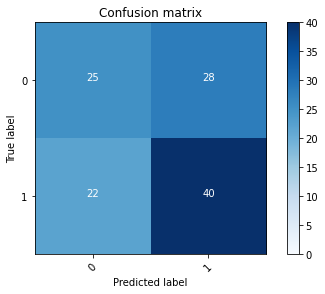

2022-08-22 15:49:17 - [Epoch Train: 96] loss: 0.0351, auc: 0.9998, acc: 0.9918, time: 24.00 s            
2022-08-22 15:49:17 - [Epoch Valid: 96] loss: 2.1431, auc: 0.5469, acc: 0.5537, time: 6.00 s


 96%|████████████████████████████████████████▎ | 96/100 [50:00<02:07, 31.83s/it]

2022-08-22 15:49:17 - EPOCH: 97
2022-08-22 15:49:17 - Train Step 10/485, train_loss: 0.0130
2022-08-22 15:49:18 - Train Step 20/485, train_loss: 0.0187
2022-08-22 15:49:18 - Train Step 30/485, train_loss: 0.0167
2022-08-22 15:49:19 - Train Step 40/485, train_loss: 0.0223
2022-08-22 15:49:19 - Train Step 50/485, train_loss: 0.0205
2022-08-22 15:49:20 - Train Step 60/485, train_loss: 0.0200
2022-08-22 15:49:20 - Train Step 70/485, train_loss: 0.0236
2022-08-22 15:49:21 - Train Step 80/485, train_loss: 0.0258
2022-08-22 15:49:21 - Train Step 90/485, train_loss: 0.0285
2022-08-22 15:49:22 - Train Step 100/485, train_loss: 0.0290
2022-08-22 15:49:22 - Train Step 110/485, train_loss: 0.0383
2022-08-22 15:49:23 - Train Step 120/485, train_loss: 0.0354
2022-08-22 15:49:23 - Train Step 130/485, train_loss: 0.0346
2022-08-22 15:49:24 - Train Step 140/485, train_loss: 0.0330
2022-08-22 15:49:24 - Train Step 150/485, train_loss: 0.0357
2022-08-22 15:49:25 - Train Step 160/485, train_loss: 0.0354
2

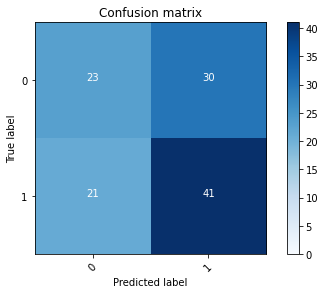

2022-08-22 15:49:48 - [Epoch Train: 97] loss: 0.0381, auc: 0.9998, acc: 0.9938, time: 24.00 s            
2022-08-22 15:49:48 - [Epoch Valid: 97] loss: 2.2954, auc: 0.5514, acc: 0.5455, time: 6.00 s


 97%|████████████████████████████████████████▋ | 97/100 [50:32<01:35, 31.75s/it]

2022-08-22 15:49:48 - EPOCH: 98
2022-08-22 15:49:49 - Train Step 10/485, train_loss: 0.0063
2022-08-22 15:49:49 - Train Step 20/485, train_loss: 0.0131
2022-08-22 15:49:50 - Train Step 30/485, train_loss: 0.0132
2022-08-22 15:49:50 - Train Step 40/485, train_loss: 0.0161
2022-08-22 15:49:51 - Train Step 50/485, train_loss: 0.0148
2022-08-22 15:49:51 - Train Step 60/485, train_loss: 0.0162
2022-08-22 15:49:52 - Train Step 70/485, train_loss: 0.0157
2022-08-22 15:49:52 - Train Step 80/485, train_loss: 0.0149
2022-08-22 15:49:53 - Train Step 90/485, train_loss: 0.0142
2022-08-22 15:49:53 - Train Step 100/485, train_loss: 0.0132
2022-08-22 15:49:54 - Train Step 110/485, train_loss: 0.0152
2022-08-22 15:49:54 - Train Step 120/485, train_loss: 0.0149
2022-08-22 15:49:55 - Train Step 130/485, train_loss: 0.0149
2022-08-22 15:49:55 - Train Step 140/485, train_loss: 0.0209
2022-08-22 15:49:56 - Train Step 150/485, train_loss: 0.0223
2022-08-22 15:49:56 - Train Step 160/485, train_loss: 0.0221
2

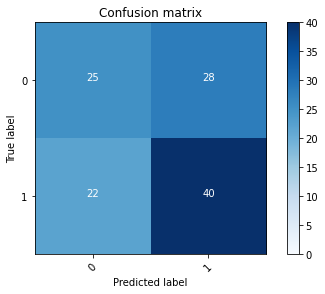

2022-08-22 15:50:20 - [Epoch Train: 98] loss: 0.0258, auc: 1.0000, acc: 0.9959, time: 25.00 s            
2022-08-22 15:50:20 - [Epoch Valid: 98] loss: 2.2513, auc: 0.5508, acc: 0.5537, time: 6.00 s


 98%|█████████████████████████████████████████▏| 98/100 [51:04<01:03, 31.70s/it]

2022-08-22 15:50:20 - EPOCH: 99
2022-08-22 15:50:20 - Train Step 10/485, train_loss: 0.0079
2022-08-22 15:50:21 - Train Step 20/485, train_loss: 0.0099
2022-08-22 15:50:21 - Train Step 30/485, train_loss: 0.0098
2022-08-22 15:50:22 - Train Step 40/485, train_loss: 0.0097
2022-08-22 15:50:22 - Train Step 50/485, train_loss: 0.0102
2022-08-22 15:50:23 - Train Step 60/485, train_loss: 0.0087
2022-08-22 15:50:24 - Train Step 70/485, train_loss: 0.0110
2022-08-22 15:50:24 - Train Step 80/485, train_loss: 0.0137
2022-08-22 15:50:25 - Train Step 90/485, train_loss: 0.0131
2022-08-22 15:50:25 - Train Step 100/485, train_loss: 0.0164
2022-08-22 15:50:26 - Train Step 110/485, train_loss: 0.0178
2022-08-22 15:50:26 - Train Step 120/485, train_loss: 0.0169
2022-08-22 15:50:27 - Train Step 130/485, train_loss: 0.0205
2022-08-22 15:50:27 - Train Step 140/485, train_loss: 0.0230
2022-08-22 15:50:28 - Train Step 150/485, train_loss: 0.0229
2022-08-22 15:50:28 - Train Step 160/485, train_loss: 0.0239
2

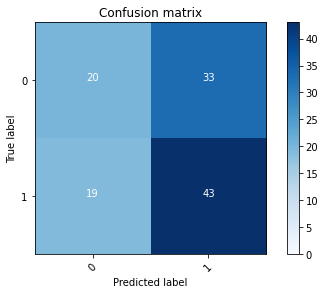

2022-08-22 15:50:51 - [Epoch Train: 99] loss: 0.0307, auc: 1.0000, acc: 0.9979, time: 25.00 s            
2022-08-22 15:50:51 - [Epoch Valid: 99] loss: 2.2661, auc: 0.5560, acc: 0.5372, time: 6.00 s


 99%|█████████████████████████████████████████▌| 99/100 [51:35<00:31, 31.71s/it]

2022-08-22 15:50:51 - EPOCH: 100
2022-08-22 15:50:52 - Train Step 10/485, train_loss: 0.0144
2022-08-22 15:50:53 - Train Step 20/485, train_loss: 0.0166
2022-08-22 15:50:53 - Train Step 30/485, train_loss: 0.0144
2022-08-22 15:50:54 - Train Step 40/485, train_loss: 0.0140
2022-08-22 15:50:54 - Train Step 50/485, train_loss: 0.0133
2022-08-22 15:50:55 - Train Step 60/485, train_loss: 0.0113
2022-08-22 15:50:55 - Train Step 70/485, train_loss: 0.0111
2022-08-22 15:50:56 - Train Step 80/485, train_loss: 0.0103
2022-08-22 15:50:56 - Train Step 90/485, train_loss: 0.0174
2022-08-22 15:50:57 - Train Step 100/485, train_loss: 0.0179
2022-08-22 15:50:57 - Train Step 110/485, train_loss: 0.0182
2022-08-22 15:50:58 - Train Step 120/485, train_loss: 0.0176
2022-08-22 15:50:58 - Train Step 130/485, train_loss: 0.0235
2022-08-22 15:50:59 - Train Step 140/485, train_loss: 0.0246
2022-08-22 15:50:59 - Train Step 150/485, train_loss: 0.0241
2022-08-22 15:51:00 - Train Step 160/485, train_loss: 0.0228


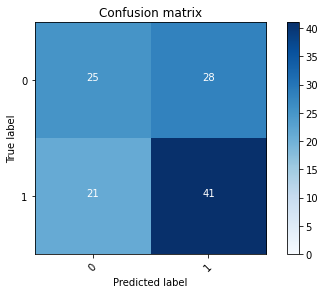

2022-08-22 15:51:23 - [Epoch Train: 100] loss: 0.0271, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 15:51:23 - [Epoch Valid: 100] loss: 2.1736, auc: 0.5487, acc: 0.5620, time: 6.00 s


100%|█████████████████████████████████████████| 100/100 [52:07<00:00, 31.27s/it]

-- FOLD N:2
Train origin: m
Type: KLF
2022-08-22 15:51:23 - (M0) Train/Val datasets size: 270
2022-08-22 15:51:23 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd40dca60>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd40dc850>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606


[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 255, 256, 257, 258, 259, 260, 262, 263, 264, 265, 266, 267, 268, 269, 270, 2

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-22 15:53:18 - EPOCH: 1
2022-08-22 15:53:19 - Train Step 10/485, train_loss: 0.6911
2022-08-22 15:53:19 - Train Step 20/485, train_loss: 0.6940
2022-08-22 15:53:20 - Train Step 30/485, train_loss: 0.6941
2022-08-22 15:53:20 - Train Step 40/485, train_loss: 0.6922
2022-08-22 15:53:21 - Train Step 50/485, train_loss: 0.6934
2022-08-22 15:53:21 - Train Step 60/485, train_loss: 0.6937
2022-08-22 15:53:22 - Train Step 70/485, train_loss: 0.6940
2022-08-22 15:53:22 - Train Step 80/485, train_loss: 0.6944
2022-08-22 15:53:23 - Train Step 90/485, train_loss: 0.6941
2022-08-22 15:53:23 - Train Step 100/485, train_loss: 0.6947
2022-08-22 15:53:24 - Train Step 110/485, train_loss: 0.6946
2022-08-22 15:53:24 - Train Step 120/485, train_loss: 0.6946
2022-08-22 15:53:25 - Train Step 130/485, train_loss: 0.6944
2022-08-22 15:53:26 - Train Step 140/485, train_loss: 0.6944
2022-08-22 15:53:26 - Train Step 150/485, train_loss: 0.6943
2022-08-22 15:53:27 - Train Step 160/485, train_loss: 0.6944
20

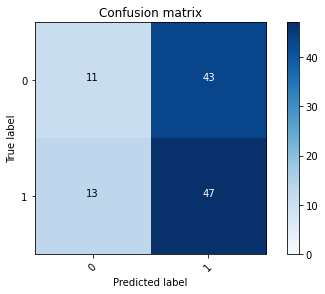

2022-08-22 15:53:50 - [Epoch Train: 1] loss: 0.6942, auc: 0.4480, acc: 0.4536, time: 24.00 s            
2022-08-22 15:53:50 - [Epoch Valid: 1] loss: 0.6930, auc: 0.5136, acc: 0.4959, time: 6.00 s
2022-08-22 15:53:50 - acc improved from 0.0000 to 0.4959. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.693-acc0.496-auc0.514.pth'


  1%|▍                                          | 1/100 [00:31<51:39, 31.31s/it]

2022-08-22 15:53:50 - EPOCH: 2
2022-08-22 15:53:50 - Train Step 10/485, train_loss: 0.6913
2022-08-22 15:53:51 - Train Step 20/485, train_loss: 0.6930
2022-08-22 15:53:51 - Train Step 30/485, train_loss: 0.6924
2022-08-22 15:53:52 - Train Step 40/485, train_loss: 0.6930
2022-08-22 15:53:52 - Train Step 50/485, train_loss: 0.6929
2022-08-22 15:53:53 - Train Step 60/485, train_loss: 0.6926
2022-08-22 15:53:53 - Train Step 70/485, train_loss: 0.6926
2022-08-22 15:53:54 - Train Step 80/485, train_loss: 0.6929
2022-08-22 15:53:54 - Train Step 90/485, train_loss: 0.6928
2022-08-22 15:53:55 - Train Step 100/485, train_loss: 0.6929
2022-08-22 15:53:55 - Train Step 110/485, train_loss: 0.6926
2022-08-22 15:53:56 - Train Step 120/485, train_loss: 0.6928
2022-08-22 15:53:56 - Train Step 130/485, train_loss: 0.6926
2022-08-22 15:53:57 - Train Step 140/485, train_loss: 0.6924
2022-08-22 15:53:57 - Train Step 150/485, train_loss: 0.6928
2022-08-22 15:53:58 - Train Step 160/485, train_loss: 0.6925
20

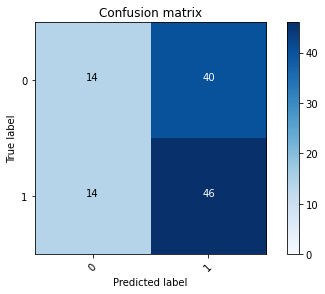

2022-08-22 15:54:21 - [Epoch Train: 2] loss: 0.6928, auc: 0.5279, acc: 0.5278, time: 24.00 s            
2022-08-22 15:54:21 - [Epoch Valid: 2] loss: 0.6926, auc: 0.5269, acc: 0.5207, time: 6.00 s
2022-08-22 15:54:21 - acc improved from 0.4959 to 0.5207. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.693-acc0.521-auc0.527.pth'


  2%|▊                                          | 2/100 [01:02<51:10, 31.34s/it]

2022-08-22 15:54:21 - EPOCH: 3
2022-08-22 15:54:22 - Train Step 10/485, train_loss: 0.6900
2022-08-22 15:54:22 - Train Step 20/485, train_loss: 0.6911
2022-08-22 15:54:23 - Train Step 30/485, train_loss: 0.6909
2022-08-22 15:54:23 - Train Step 40/485, train_loss: 0.6900
2022-08-22 15:54:24 - Train Step 50/485, train_loss: 0.6898
2022-08-22 15:54:24 - Train Step 60/485, train_loss: 0.6905
2022-08-22 15:54:25 - Train Step 70/485, train_loss: 0.6893
2022-08-22 15:54:25 - Train Step 80/485, train_loss: 0.6890
2022-08-22 15:54:26 - Train Step 90/485, train_loss: 0.6892
2022-08-22 15:54:26 - Train Step 100/485, train_loss: 0.6887
2022-08-22 15:54:27 - Train Step 110/485, train_loss: 0.6879
2022-08-22 15:54:27 - Train Step 120/485, train_loss: 0.6895
2022-08-22 15:54:28 - Train Step 130/485, train_loss: 0.6906
2022-08-22 15:54:28 - Train Step 140/485, train_loss: 0.6901
2022-08-22 15:54:29 - Train Step 150/485, train_loss: 0.6904
2022-08-22 15:54:29 - Train Step 160/485, train_loss: 0.6908
20

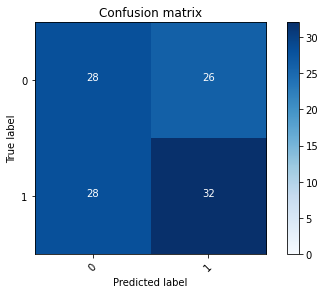

2022-08-22 15:54:52 - [Epoch Train: 3] loss: 0.6916, auc: 0.5452, acc: 0.5526, time: 24.00 s            
2022-08-22 15:54:52 - [Epoch Valid: 3] loss: 0.6925, auc: 0.5281, acc: 0.5372, time: 6.00 s
2022-08-22 15:54:52 - acc improved from 0.5207 to 0.5372. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.692-acc0.537-auc0.528.pth'


  3%|█▎                                         | 3/100 [01:33<50:39, 31.33s/it]

2022-08-22 15:54:52 - EPOCH: 4
2022-08-22 15:54:53 - Train Step 10/485, train_loss: 0.6983
2022-08-22 15:54:53 - Train Step 20/485, train_loss: 0.6943
2022-08-22 15:54:54 - Train Step 30/485, train_loss: 0.6883
2022-08-22 15:54:54 - Train Step 40/485, train_loss: 0.6875
2022-08-22 15:54:55 - Train Step 50/485, train_loss: 0.6901
2022-08-22 15:54:55 - Train Step 60/485, train_loss: 0.6932
2022-08-22 15:54:56 - Train Step 70/485, train_loss: 0.6926
2022-08-22 15:54:56 - Train Step 80/485, train_loss: 0.6917
2022-08-22 15:54:57 - Train Step 90/485, train_loss: 0.6912
2022-08-22 15:54:57 - Train Step 100/485, train_loss: 0.6908
2022-08-22 15:54:58 - Train Step 110/485, train_loss: 0.6901
2022-08-22 15:54:58 - Train Step 120/485, train_loss: 0.6893
2022-08-22 15:54:59 - Train Step 130/485, train_loss: 0.6903
2022-08-22 15:54:59 - Train Step 140/485, train_loss: 0.6912
2022-08-22 15:55:00 - Train Step 150/485, train_loss: 0.6921
2022-08-22 15:55:00 - Train Step 160/485, train_loss: 0.6915
20

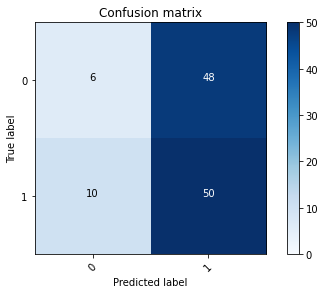

2022-08-22 15:55:23 - [Epoch Train: 4] loss: 0.6900, auc: 0.5591, acc: 0.5258, time: 24.00 s            
2022-08-22 15:55:23 - [Epoch Valid: 4] loss: 0.6922, auc: 0.5281, acc: 0.4628, time: 6.00 s


  4%|█▋                                         | 4/100 [02:05<50:05, 31.30s/it]

2022-08-22 15:55:23 - EPOCH: 5
2022-08-22 15:55:24 - Train Step 10/485, train_loss: 0.6931
2022-08-22 15:55:25 - Train Step 20/485, train_loss: 0.6908
2022-08-22 15:55:25 - Train Step 30/485, train_loss: 0.6928
2022-08-22 15:55:26 - Train Step 40/485, train_loss: 0.6908
2022-08-22 15:55:26 - Train Step 50/485, train_loss: 0.6923
2022-08-22 15:55:27 - Train Step 60/485, train_loss: 0.6912
2022-08-22 15:55:27 - Train Step 70/485, train_loss: 0.6924
2022-08-22 15:55:28 - Train Step 80/485, train_loss: 0.6921
2022-08-22 15:55:28 - Train Step 90/485, train_loss: 0.6929
2022-08-22 15:55:29 - Train Step 100/485, train_loss: 0.6920
2022-08-22 15:55:29 - Train Step 110/485, train_loss: 0.6915
2022-08-22 15:55:30 - Train Step 120/485, train_loss: 0.6900
2022-08-22 15:55:30 - Train Step 130/485, train_loss: 0.6896
2022-08-22 15:55:31 - Train Step 140/485, train_loss: 0.6906
2022-08-22 15:55:31 - Train Step 150/485, train_loss: 0.6922
2022-08-22 15:55:32 - Train Step 160/485, train_loss: 0.6920
20

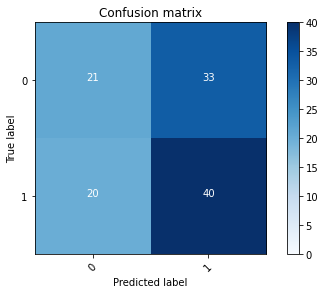

2022-08-22 15:55:55 - [Epoch Train: 5] loss: 0.6893, auc: 0.5706, acc: 0.5423, time: 24.00 s            
2022-08-22 15:55:55 - [Epoch Valid: 5] loss: 0.6917, auc: 0.5315, acc: 0.5372, time: 6.00 s
2022-08-22 15:55:55 - acc improved from 0.5372 to 0.5372. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.692-acc0.537-auc0.531.pth'


  5%|██▏                                        | 5/100 [02:36<49:28, 31.25s/it]

2022-08-22 15:55:55 - EPOCH: 6
2022-08-22 15:55:55 - Train Step 10/485, train_loss: 0.7125
2022-08-22 15:55:56 - Train Step 20/485, train_loss: 0.6942
2022-08-22 15:55:56 - Train Step 30/485, train_loss: 0.6946
2022-08-22 15:55:57 - Train Step 40/485, train_loss: 0.6911
2022-08-22 15:55:57 - Train Step 50/485, train_loss: 0.6944
2022-08-22 15:55:58 - Train Step 60/485, train_loss: 0.6920
2022-08-22 15:55:58 - Train Step 70/485, train_loss: 0.6911
2022-08-22 15:55:59 - Train Step 80/485, train_loss: 0.6867
2022-08-22 15:55:59 - Train Step 90/485, train_loss: 0.6844
2022-08-22 15:56:00 - Train Step 100/485, train_loss: 0.6839
2022-08-22 15:56:00 - Train Step 110/485, train_loss: 0.6844
2022-08-22 15:56:01 - Train Step 120/485, train_loss: 0.6868
2022-08-22 15:56:01 - Train Step 130/485, train_loss: 0.6865
2022-08-22 15:56:02 - Train Step 140/485, train_loss: 0.6865
2022-08-22 15:56:02 - Train Step 150/485, train_loss: 0.6858
2022-08-22 15:56:03 - Train Step 160/485, train_loss: 0.6866
20

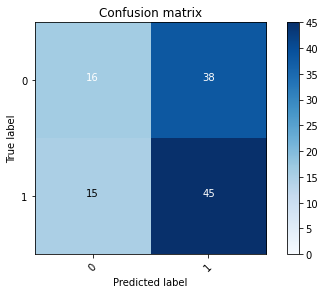

2022-08-22 15:56:26 - [Epoch Train: 6] loss: 0.6857, auc: 0.5812, acc: 0.5711, time: 24.00 s            
2022-08-22 15:56:26 - [Epoch Valid: 6] loss: 0.6921, auc: 0.5244, acc: 0.5289, time: 6.00 s


  6%|██▌                                        | 6/100 [03:07<49:06, 31.34s/it]

2022-08-22 15:56:26 - EPOCH: 7
2022-08-22 15:56:27 - Train Step 10/485, train_loss: 0.7298
2022-08-22 15:56:27 - Train Step 20/485, train_loss: 0.7087
2022-08-22 15:56:28 - Train Step 30/485, train_loss: 0.7002
2022-08-22 15:56:28 - Train Step 40/485, train_loss: 0.7025
2022-08-22 15:56:29 - Train Step 50/485, train_loss: 0.6982
2022-08-22 15:56:29 - Train Step 60/485, train_loss: 0.7004
2022-08-22 15:56:30 - Train Step 70/485, train_loss: 0.7002
2022-08-22 15:56:30 - Train Step 80/485, train_loss: 0.6949
2022-08-22 15:56:31 - Train Step 90/485, train_loss: 0.6974
2022-08-22 15:56:31 - Train Step 100/485, train_loss: 0.6958
2022-08-22 15:56:32 - Train Step 110/485, train_loss: 0.6964
2022-08-22 15:56:32 - Train Step 120/485, train_loss: 0.6965
2022-08-22 15:56:33 - Train Step 130/485, train_loss: 0.6949
2022-08-22 15:56:33 - Train Step 140/485, train_loss: 0.6940
2022-08-22 15:56:34 - Train Step 150/485, train_loss: 0.6933
2022-08-22 15:56:34 - Train Step 160/485, train_loss: 0.6911
20

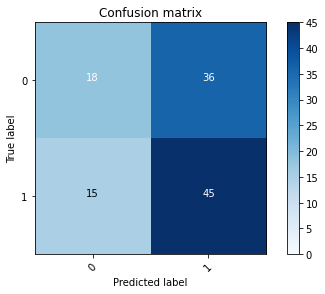

2022-08-22 15:56:57 - [Epoch Train: 7] loss: 0.6872, auc: 0.5663, acc: 0.5629, time: 24.00 s            
2022-08-22 15:56:57 - [Epoch Valid: 7] loss: 0.6921, auc: 0.5343, acc: 0.5537, time: 6.00 s
2022-08-22 15:56:57 - acc improved from 0.5372 to 0.5537. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e7-loss0.692-acc0.554-auc0.534.pth'


  7%|███                                        | 7/100 [03:39<48:32, 31.31s/it]

2022-08-22 15:56:57 - EPOCH: 8
2022-08-22 15:56:58 - Train Step 10/485, train_loss: 0.7166
2022-08-22 15:56:59 - Train Step 20/485, train_loss: 0.7003
2022-08-22 15:56:59 - Train Step 30/485, train_loss: 0.6975
2022-08-22 15:57:00 - Train Step 40/485, train_loss: 0.6870
2022-08-22 15:57:00 - Train Step 50/485, train_loss: 0.6801
2022-08-22 15:57:01 - Train Step 60/485, train_loss: 0.6828
2022-08-22 15:57:01 - Train Step 70/485, train_loss: 0.6841
2022-08-22 15:57:02 - Train Step 80/485, train_loss: 0.6853
2022-08-22 15:57:02 - Train Step 90/485, train_loss: 0.6871
2022-08-22 15:57:03 - Train Step 100/485, train_loss: 0.6876
2022-08-22 15:57:03 - Train Step 110/485, train_loss: 0.6881
2022-08-22 15:57:04 - Train Step 120/485, train_loss: 0.6884
2022-08-22 15:57:04 - Train Step 130/485, train_loss: 0.6867
2022-08-22 15:57:05 - Train Step 140/485, train_loss: 0.6887
2022-08-22 15:57:05 - Train Step 150/485, train_loss: 0.6883
2022-08-22 15:57:06 - Train Step 160/485, train_loss: 0.6874
20

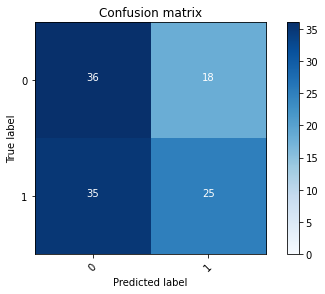

2022-08-22 15:57:29 - [Epoch Train: 8] loss: 0.6820, auc: 0.6011, acc: 0.5691, time: 24.00 s            
2022-08-22 15:57:29 - [Epoch Valid: 8] loss: 0.6924, auc: 0.5287, acc: 0.5537, time: 6.00 s
2022-08-22 15:57:29 - acc improved from 0.5537 to 0.5537. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e8-loss0.692-acc0.554-auc0.529.pth'


  8%|███▍                                       | 8/100 [04:10<47:58, 31.29s/it]

2022-08-22 15:57:29 - EPOCH: 9
2022-08-22 15:57:29 - Train Step 10/485, train_loss: 0.6701
2022-08-22 15:57:30 - Train Step 20/485, train_loss: 0.6778
2022-08-22 15:57:30 - Train Step 30/485, train_loss: 0.6846
2022-08-22 15:57:31 - Train Step 40/485, train_loss: 0.6903
2022-08-22 15:57:31 - Train Step 50/485, train_loss: 0.6844
2022-08-22 15:57:32 - Train Step 60/485, train_loss: 0.6912
2022-08-22 15:57:32 - Train Step 70/485, train_loss: 0.6953
2022-08-22 15:57:33 - Train Step 80/485, train_loss: 0.6890
2022-08-22 15:57:33 - Train Step 90/485, train_loss: 0.6891
2022-08-22 15:57:34 - Train Step 100/485, train_loss: 0.6912
2022-08-22 15:57:34 - Train Step 110/485, train_loss: 0.6896
2022-08-22 15:57:35 - Train Step 120/485, train_loss: 0.6867
2022-08-22 15:57:35 - Train Step 130/485, train_loss: 0.6872
2022-08-22 15:57:36 - Train Step 140/485, train_loss: 0.6858
2022-08-22 15:57:36 - Train Step 150/485, train_loss: 0.6856
2022-08-22 15:57:37 - Train Step 160/485, train_loss: 0.6853
20

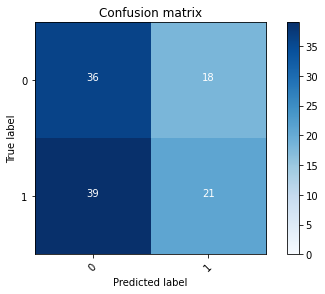

2022-08-22 15:58:00 - [Epoch Train: 9] loss: 0.6789, auc: 0.6048, acc: 0.5814, time: 24.00 s            
2022-08-22 15:58:00 - [Epoch Valid: 9] loss: 0.6943, auc: 0.5108, acc: 0.5207, time: 6.00 s


  9%|███▊                                       | 9/100 [04:41<47:24, 31.26s/it]

2022-08-22 15:58:00 - EPOCH: 10
2022-08-22 15:58:01 - Train Step 10/485, train_loss: 0.6768
2022-08-22 15:58:01 - Train Step 20/485, train_loss: 0.6571
2022-08-22 15:58:02 - Train Step 30/485, train_loss: 0.6518
2022-08-22 15:58:02 - Train Step 40/485, train_loss: 0.6587
2022-08-22 15:58:03 - Train Step 50/485, train_loss: 0.6678
2022-08-22 15:58:03 - Train Step 60/485, train_loss: 0.6749
2022-08-22 15:58:04 - Train Step 70/485, train_loss: 0.6778
2022-08-22 15:58:04 - Train Step 80/485, train_loss: 0.6696
2022-08-22 15:58:05 - Train Step 90/485, train_loss: 0.6683
2022-08-22 15:58:05 - Train Step 100/485, train_loss: 0.6603
2022-08-22 15:58:06 - Train Step 110/485, train_loss: 0.6652
2022-08-22 15:58:06 - Train Step 120/485, train_loss: 0.6642
2022-08-22 15:58:07 - Train Step 130/485, train_loss: 0.6686
2022-08-22 15:58:07 - Train Step 140/485, train_loss: 0.6733
2022-08-22 15:58:08 - Train Step 150/485, train_loss: 0.6733
2022-08-22 15:58:08 - Train Step 160/485, train_loss: 0.6743
2

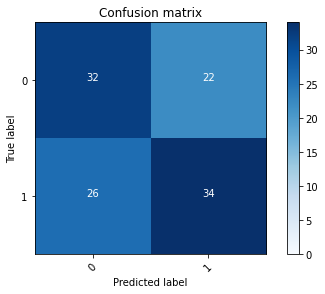

2022-08-22 15:58:31 - [Epoch Train: 10] loss: 0.6696, auc: 0.6400, acc: 0.6041, time: 24.00 s            
2022-08-22 15:58:31 - [Epoch Valid: 10] loss: 0.6935, auc: 0.5296, acc: 0.5950, time: 6.00 s
2022-08-22 15:58:31 - acc improved from 0.5537 to 0.5950. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e10-loss0.694-acc0.595-auc0.530.pth'


 10%|████▏                                     | 10/100 [05:12<46:48, 31.20s/it]

2022-08-22 15:58:31 - EPOCH: 11
2022-08-22 15:58:32 - Train Step 10/485, train_loss: 0.6738
2022-08-22 15:58:32 - Train Step 20/485, train_loss: 0.6784
2022-08-22 15:58:33 - Train Step 30/485, train_loss: 0.6563
2022-08-22 15:58:33 - Train Step 40/485, train_loss: 0.6420
2022-08-22 15:58:34 - Train Step 50/485, train_loss: 0.6322
2022-08-22 15:58:34 - Train Step 60/485, train_loss: 0.6357
2022-08-22 15:58:35 - Train Step 70/485, train_loss: 0.6359
2022-08-22 15:58:35 - Train Step 80/485, train_loss: 0.6322
2022-08-22 15:58:36 - Train Step 90/485, train_loss: 0.6394
2022-08-22 15:58:36 - Train Step 100/485, train_loss: 0.6384
2022-08-22 15:58:37 - Train Step 110/485, train_loss: 0.6419
2022-08-22 15:58:37 - Train Step 120/485, train_loss: 0.6379
2022-08-22 15:58:38 - Train Step 130/485, train_loss: 0.6422
2022-08-22 15:58:38 - Train Step 140/485, train_loss: 0.6443
2022-08-22 15:58:39 - Train Step 150/485, train_loss: 0.6437
2022-08-22 15:58:39 - Train Step 160/485, train_loss: 0.6431
2

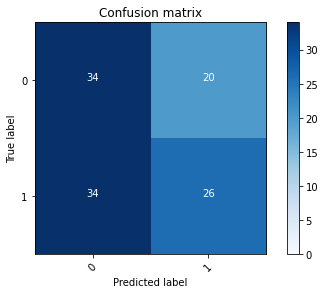

2022-08-22 15:59:02 - [Epoch Train: 11] loss: 0.6649, auc: 0.6427, acc: 0.6144, time: 24.00 s            
2022-08-22 15:59:02 - [Epoch Valid: 11] loss: 0.6947, auc: 0.5198, acc: 0.5455, time: 6.00 s


 11%|████▌                                     | 11/100 [05:44<46:27, 31.32s/it]

2022-08-22 15:59:02 - EPOCH: 12
2022-08-22 15:59:03 - Train Step 10/485, train_loss: 0.6240
2022-08-22 15:59:04 - Train Step 20/485, train_loss: 0.6446
2022-08-22 15:59:04 - Train Step 30/485, train_loss: 0.6449
2022-08-22 15:59:05 - Train Step 40/485, train_loss: 0.6272
2022-08-22 15:59:05 - Train Step 50/485, train_loss: 0.6254
2022-08-22 15:59:06 - Train Step 60/485, train_loss: 0.6348
2022-08-22 15:59:06 - Train Step 70/485, train_loss: 0.6400
2022-08-22 15:59:07 - Train Step 80/485, train_loss: 0.6425
2022-08-22 15:59:07 - Train Step 90/485, train_loss: 0.6498
2022-08-22 15:59:08 - Train Step 100/485, train_loss: 0.6548
2022-08-22 15:59:09 - Train Step 110/485, train_loss: 0.6600
2022-08-22 15:59:09 - Train Step 120/485, train_loss: 0.6621
2022-08-22 15:59:10 - Train Step 130/485, train_loss: 0.6620
2022-08-22 15:59:10 - Train Step 140/485, train_loss: 0.6609
2022-08-22 15:59:11 - Train Step 150/485, train_loss: 0.6573
2022-08-22 15:59:11 - Train Step 160/485, train_loss: 0.6600
2

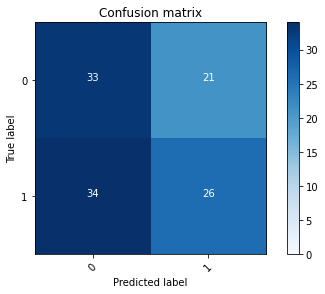

2022-08-22 15:59:34 - [Epoch Train: 12] loss: 0.6617, auc: 0.6617, acc: 0.6165, time: 25.00 s            
2022-08-22 15:59:34 - [Epoch Valid: 12] loss: 0.6956, auc: 0.5222, acc: 0.5372, time: 6.00 s


 12%|█████                                     | 12/100 [06:16<46:08, 31.46s/it]

2022-08-22 15:59:34 - EPOCH: 13
2022-08-22 15:59:35 - Train Step 10/485, train_loss: 0.6533
2022-08-22 15:59:35 - Train Step 20/485, train_loss: 0.6803
2022-08-22 15:59:36 - Train Step 30/485, train_loss: 0.6583
2022-08-22 15:59:36 - Train Step 40/485, train_loss: 0.6616
2022-08-22 15:59:37 - Train Step 50/485, train_loss: 0.6591
2022-08-22 15:59:37 - Train Step 60/485, train_loss: 0.6468
2022-08-22 15:59:38 - Train Step 70/485, train_loss: 0.6481
2022-08-22 15:59:38 - Train Step 80/485, train_loss: 0.6535
2022-08-22 15:59:39 - Train Step 90/485, train_loss: 0.6580
2022-08-22 15:59:39 - Train Step 100/485, train_loss: 0.6582
2022-08-22 15:59:40 - Train Step 110/485, train_loss: 0.6572
2022-08-22 15:59:40 - Train Step 120/485, train_loss: 0.6534
2022-08-22 15:59:41 - Train Step 130/485, train_loss: 0.6558
2022-08-22 15:59:42 - Train Step 140/485, train_loss: 0.6570
2022-08-22 15:59:42 - Train Step 150/485, train_loss: 0.6530
2022-08-22 15:59:42 - Train Step 160/485, train_loss: 0.6504
2

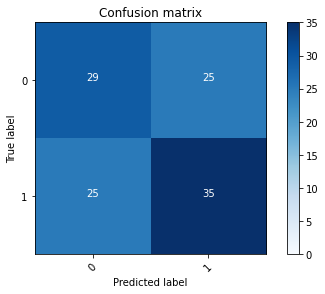

2022-08-22 16:00:06 - [Epoch Train: 13] loss: 0.6556, auc: 0.6828, acc: 0.6495, time: 24.00 s            
2022-08-22 16:00:06 - [Epoch Valid: 13] loss: 0.6968, auc: 0.5287, acc: 0.5702, time: 6.00 s


 13%|█████▍                                    | 13/100 [06:47<45:34, 31.43s/it]

2022-08-22 16:00:06 - EPOCH: 14
2022-08-22 16:00:06 - Train Step 10/485, train_loss: 0.5862
2022-08-22 16:00:07 - Train Step 20/485, train_loss: 0.6003
2022-08-22 16:00:07 - Train Step 30/485, train_loss: 0.5880
2022-08-22 16:00:08 - Train Step 40/485, train_loss: 0.6186
2022-08-22 16:00:08 - Train Step 50/485, train_loss: 0.6217
2022-08-22 16:00:09 - Train Step 60/485, train_loss: 0.6228
2022-08-22 16:00:09 - Train Step 70/485, train_loss: 0.6316
2022-08-22 16:00:10 - Train Step 80/485, train_loss: 0.6484
2022-08-22 16:00:10 - Train Step 90/485, train_loss: 0.6479
2022-08-22 16:00:11 - Train Step 100/485, train_loss: 0.6351
2022-08-22 16:00:11 - Train Step 110/485, train_loss: 0.6326
2022-08-22 16:00:12 - Train Step 120/485, train_loss: 0.6327
2022-08-22 16:00:12 - Train Step 130/485, train_loss: 0.6306
2022-08-22 16:00:13 - Train Step 140/485, train_loss: 0.6297
2022-08-22 16:00:13 - Train Step 150/485, train_loss: 0.6290
2022-08-22 16:00:14 - Train Step 160/485, train_loss: 0.6351
2

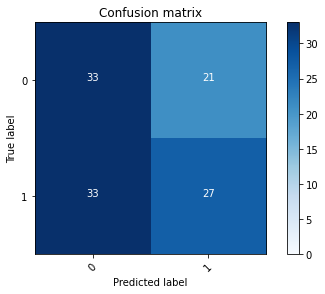

2022-08-22 16:00:37 - [Epoch Train: 14] loss: 0.6444, auc: 0.7040, acc: 0.6454, time: 24.00 s            
2022-08-22 16:00:37 - [Epoch Valid: 14] loss: 0.6971, auc: 0.5204, acc: 0.5455, time: 6.00 s


 14%|█████▉                                    | 14/100 [07:18<44:59, 31.39s/it]

2022-08-22 16:00:37 - EPOCH: 15
2022-08-22 16:00:38 - Train Step 10/485, train_loss: 0.7284
2022-08-22 16:00:38 - Train Step 20/485, train_loss: 0.6861
2022-08-22 16:00:39 - Train Step 30/485, train_loss: 0.6968
2022-08-22 16:00:39 - Train Step 40/485, train_loss: 0.6935
2022-08-22 16:00:40 - Train Step 50/485, train_loss: 0.6880
2022-08-22 16:00:40 - Train Step 60/485, train_loss: 0.6749
2022-08-22 16:00:41 - Train Step 70/485, train_loss: 0.6750
2022-08-22 16:00:41 - Train Step 80/485, train_loss: 0.6721
2022-08-22 16:00:41 - Train Step 90/485, train_loss: 0.6619
2022-08-22 16:00:42 - Train Step 100/485, train_loss: 0.6577
2022-08-22 16:00:43 - Train Step 110/485, train_loss: 0.6560
2022-08-22 16:00:43 - Train Step 120/485, train_loss: 0.6450
2022-08-22 16:00:43 - Train Step 130/485, train_loss: 0.6453
2022-08-22 16:00:44 - Train Step 140/485, train_loss: 0.6466
2022-08-22 16:00:44 - Train Step 150/485, train_loss: 0.6466
2022-08-22 16:00:45 - Train Step 160/485, train_loss: 0.6437
2

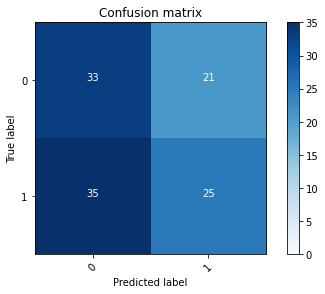

2022-08-22 16:01:08 - [Epoch Train: 15] loss: 0.6475, auc: 0.6898, acc: 0.6515, time: 24.00 s            
2022-08-22 16:01:08 - [Epoch Valid: 15] loss: 0.6989, auc: 0.5204, acc: 0.5289, time: 6.00 s


 15%|██████▎                                   | 15/100 [07:49<44:24, 31.35s/it]

2022-08-22 16:01:08 - EPOCH: 16
2022-08-22 16:01:09 - Train Step 10/485, train_loss: 0.6676
2022-08-22 16:01:09 - Train Step 20/485, train_loss: 0.6418
2022-08-22 16:01:10 - Train Step 30/485, train_loss: 0.6371
2022-08-22 16:01:10 - Train Step 40/485, train_loss: 0.6478
2022-08-22 16:01:11 - Train Step 50/485, train_loss: 0.6403
2022-08-22 16:01:11 - Train Step 60/485, train_loss: 0.6304
2022-08-22 16:01:12 - Train Step 70/485, train_loss: 0.6283
2022-08-22 16:01:12 - Train Step 80/485, train_loss: 0.6428
2022-08-22 16:01:13 - Train Step 90/485, train_loss: 0.6443
2022-08-22 16:01:13 - Train Step 100/485, train_loss: 0.6462
2022-08-22 16:01:14 - Train Step 110/485, train_loss: 0.6410
2022-08-22 16:01:14 - Train Step 120/485, train_loss: 0.6422
2022-08-22 16:01:15 - Train Step 130/485, train_loss: 0.6371
2022-08-22 16:01:15 - Train Step 140/485, train_loss: 0.6362
2022-08-22 16:01:16 - Train Step 150/485, train_loss: 0.6354
2022-08-22 16:01:16 - Train Step 160/485, train_loss: 0.6320
2

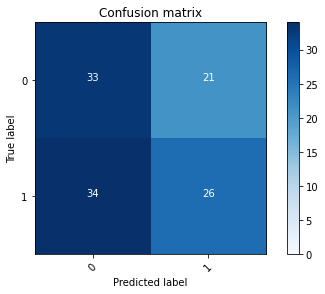

2022-08-22 16:01:40 - [Epoch Train: 16] loss: 0.6404, auc: 0.7119, acc: 0.6763, time: 24.00 s            
2022-08-22 16:01:40 - [Epoch Valid: 16] loss: 0.7015, auc: 0.5154, acc: 0.5372, time: 6.00 s


 16%|██████▋                                   | 16/100 [08:21<43:53, 31.36s/it]

2022-08-22 16:01:40 - EPOCH: 17
2022-08-22 16:01:40 - Train Step 10/485, train_loss: 0.7399
2022-08-22 16:01:41 - Train Step 20/485, train_loss: 0.6809
2022-08-22 16:01:41 - Train Step 30/485, train_loss: 0.6494
2022-08-22 16:01:42 - Train Step 40/485, train_loss: 0.6267
2022-08-22 16:01:42 - Train Step 50/485, train_loss: 0.6109
2022-08-22 16:01:43 - Train Step 60/485, train_loss: 0.6041
2022-08-22 16:01:43 - Train Step 70/485, train_loss: 0.6224
2022-08-22 16:01:44 - Train Step 80/485, train_loss: 0.6273
2022-08-22 16:01:44 - Train Step 90/485, train_loss: 0.6407
2022-08-22 16:01:45 - Train Step 100/485, train_loss: 0.6504
2022-08-22 16:01:45 - Train Step 110/485, train_loss: 0.6448
2022-08-22 16:01:46 - Train Step 120/485, train_loss: 0.6373
2022-08-22 16:01:46 - Train Step 130/485, train_loss: 0.6297
2022-08-22 16:01:47 - Train Step 140/485, train_loss: 0.6259
2022-08-22 16:01:47 - Train Step 150/485, train_loss: 0.6297
2022-08-22 16:01:48 - Train Step 160/485, train_loss: 0.6298
2

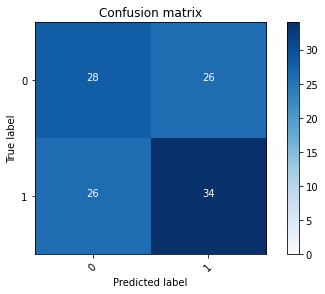

2022-08-22 16:02:11 - [Epoch Train: 17] loss: 0.6282, auc: 0.7417, acc: 0.6845, time: 25.00 s            
2022-08-22 16:02:11 - [Epoch Valid: 17] loss: 0.7062, auc: 0.5198, acc: 0.5537, time: 6.00 s


 17%|███████▏                                  | 17/100 [08:53<43:32, 31.48s/it]

2022-08-22 16:02:11 - EPOCH: 18
2022-08-22 16:02:12 - Train Step 10/485, train_loss: 0.6332
2022-08-22 16:02:12 - Train Step 20/485, train_loss: 0.6298
2022-08-22 16:02:13 - Train Step 30/485, train_loss: 0.6430
2022-08-22 16:02:13 - Train Step 40/485, train_loss: 0.6180
2022-08-22 16:02:14 - Train Step 50/485, train_loss: 0.6214
2022-08-22 16:02:14 - Train Step 60/485, train_loss: 0.6250
2022-08-22 16:02:15 - Train Step 70/485, train_loss: 0.6292
2022-08-22 16:02:15 - Train Step 80/485, train_loss: 0.6298
2022-08-22 16:02:16 - Train Step 90/485, train_loss: 0.6272
2022-08-22 16:02:16 - Train Step 100/485, train_loss: 0.6201
2022-08-22 16:02:17 - Train Step 110/485, train_loss: 0.6144
2022-08-22 16:02:17 - Train Step 120/485, train_loss: 0.6205
2022-08-22 16:02:18 - Train Step 130/485, train_loss: 0.6166
2022-08-22 16:02:18 - Train Step 140/485, train_loss: 0.6215
2022-08-22 16:02:19 - Train Step 150/485, train_loss: 0.6257
2022-08-22 16:02:19 - Train Step 160/485, train_loss: 0.6201
2

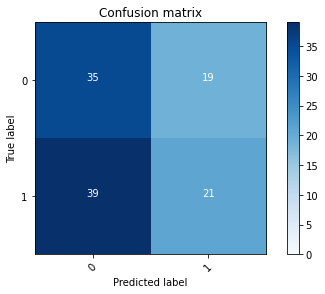

2022-08-22 16:02:42 - [Epoch Train: 18] loss: 0.6234, auc: 0.7330, acc: 0.6928, time: 24.00 s            
2022-08-22 16:02:42 - [Epoch Valid: 18] loss: 0.7127, auc: 0.5043, acc: 0.5124, time: 6.00 s


 18%|███████▌                                  | 18/100 [09:24<42:49, 31.34s/it]

2022-08-22 16:02:42 - EPOCH: 19
2022-08-22 16:02:43 - Train Step 10/485, train_loss: 0.5516
2022-08-22 16:02:43 - Train Step 20/485, train_loss: 0.5660
2022-08-22 16:02:44 - Train Step 30/485, train_loss: 0.5975
2022-08-22 16:02:44 - Train Step 40/485, train_loss: 0.6088
2022-08-22 16:02:45 - Train Step 50/485, train_loss: 0.6162
2022-08-22 16:02:46 - Train Step 60/485, train_loss: 0.6167
2022-08-22 16:02:46 - Train Step 70/485, train_loss: 0.6223
2022-08-22 16:02:46 - Train Step 80/485, train_loss: 0.6357
2022-08-22 16:02:47 - Train Step 90/485, train_loss: 0.6381
2022-08-22 16:02:47 - Train Step 100/485, train_loss: 0.6300
2022-08-22 16:02:48 - Train Step 110/485, train_loss: 0.6271
2022-08-22 16:02:48 - Train Step 120/485, train_loss: 0.6268
2022-08-22 16:02:49 - Train Step 130/485, train_loss: 0.6312
2022-08-22 16:02:49 - Train Step 140/485, train_loss: 0.6395
2022-08-22 16:02:50 - Train Step 150/485, train_loss: 0.6433
2022-08-22 16:02:50 - Train Step 160/485, train_loss: 0.6407
2

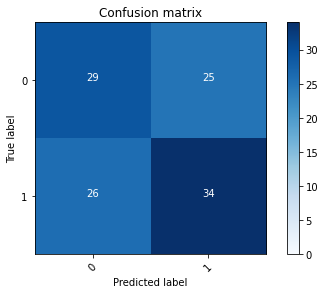

2022-08-22 16:03:14 - [Epoch Train: 19] loss: 0.6249, auc: 0.7274, acc: 0.6784, time: 24.00 s            
2022-08-22 16:03:14 - [Epoch Valid: 19] loss: 0.7094, auc: 0.5145, acc: 0.5620, time: 6.00 s


 19%|███████▉                                  | 19/100 [09:55<42:15, 31.31s/it]

2022-08-22 16:03:14 - EPOCH: 20
2022-08-22 16:03:14 - Train Step 10/485, train_loss: 0.5984
2022-08-22 16:03:15 - Train Step 20/485, train_loss: 0.6208
2022-08-22 16:03:15 - Train Step 30/485, train_loss: 0.6100
2022-08-22 16:03:16 - Train Step 40/485, train_loss: 0.6389
2022-08-22 16:03:16 - Train Step 50/485, train_loss: 0.6289
2022-08-22 16:03:17 - Train Step 60/485, train_loss: 0.6434
2022-08-22 16:03:17 - Train Step 70/485, train_loss: 0.6476
2022-08-22 16:03:18 - Train Step 80/485, train_loss: 0.6549
2022-08-22 16:03:18 - Train Step 90/485, train_loss: 0.6545
2022-08-22 16:03:19 - Train Step 100/485, train_loss: 0.6549
2022-08-22 16:03:19 - Train Step 110/485, train_loss: 0.6480
2022-08-22 16:03:20 - Train Step 120/485, train_loss: 0.6475
2022-08-22 16:03:20 - Train Step 130/485, train_loss: 0.6431
2022-08-22 16:03:21 - Train Step 140/485, train_loss: 0.6392
2022-08-22 16:03:21 - Train Step 150/485, train_loss: 0.6411
2022-08-22 16:03:22 - Train Step 160/485, train_loss: 0.6384
2

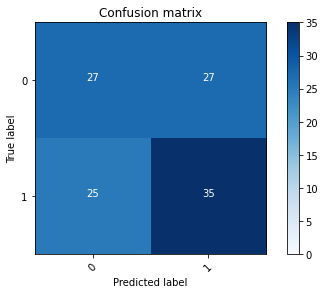

2022-08-22 16:03:45 - [Epoch Train: 20] loss: 0.6248, auc: 0.7254, acc: 0.6680, time: 25.00 s            
2022-08-22 16:03:45 - [Epoch Valid: 20] loss: 0.7085, auc: 0.5157, acc: 0.5537, time: 6.00 s


 20%|████████▍                                 | 20/100 [10:26<41:50, 31.38s/it]

2022-08-22 16:03:45 - EPOCH: 21
2022-08-22 16:03:46 - Train Step 10/485, train_loss: 0.6646
2022-08-22 16:03:46 - Train Step 20/485, train_loss: 0.6978
2022-08-22 16:03:47 - Train Step 30/485, train_loss: 0.6550
2022-08-22 16:03:47 - Train Step 40/485, train_loss: 0.6391
2022-08-22 16:03:48 - Train Step 50/485, train_loss: 0.6404
2022-08-22 16:03:48 - Train Step 60/485, train_loss: 0.6291
2022-08-22 16:03:49 - Train Step 70/485, train_loss: 0.6219
2022-08-22 16:03:49 - Train Step 80/485, train_loss: 0.6211
2022-08-22 16:03:50 - Train Step 90/485, train_loss: 0.6194
2022-08-22 16:03:50 - Train Step 100/485, train_loss: 0.6133
2022-08-22 16:03:51 - Train Step 110/485, train_loss: 0.6157
2022-08-22 16:03:51 - Train Step 120/485, train_loss: 0.6116
2022-08-22 16:03:52 - Train Step 130/485, train_loss: 0.6164
2022-08-22 16:03:52 - Train Step 140/485, train_loss: 0.6145
2022-08-22 16:03:53 - Train Step 150/485, train_loss: 0.6120
2022-08-22 16:03:53 - Train Step 160/485, train_loss: 0.6095
2

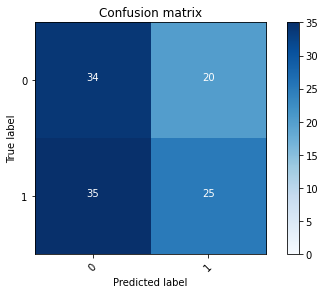

2022-08-22 16:04:17 - [Epoch Train: 21] loss: 0.6008, auc: 0.7706, acc: 0.6928, time: 24.00 s            
2022-08-22 16:04:17 - [Epoch Valid: 21] loss: 0.7139, auc: 0.5009, acc: 0.5372, time: 6.00 s


 21%|████████▊                                 | 21/100 [10:58<41:20, 31.40s/it]

2022-08-22 16:04:17 - EPOCH: 22
2022-08-22 16:04:17 - Train Step 10/485, train_loss: 0.6579
2022-08-22 16:04:18 - Train Step 20/485, train_loss: 0.6169
2022-08-22 16:04:18 - Train Step 30/485, train_loss: 0.6377
2022-08-22 16:04:19 - Train Step 40/485, train_loss: 0.6172
2022-08-22 16:04:19 - Train Step 50/485, train_loss: 0.6240
2022-08-22 16:04:20 - Train Step 60/485, train_loss: 0.6213
2022-08-22 16:04:20 - Train Step 70/485, train_loss: 0.6147
2022-08-22 16:04:21 - Train Step 80/485, train_loss: 0.6105
2022-08-22 16:04:21 - Train Step 90/485, train_loss: 0.6079
2022-08-22 16:04:22 - Train Step 100/485, train_loss: 0.6019
2022-08-22 16:04:22 - Train Step 110/485, train_loss: 0.5889
2022-08-22 16:04:23 - Train Step 120/485, train_loss: 0.5909
2022-08-22 16:04:23 - Train Step 130/485, train_loss: 0.5963
2022-08-22 16:04:24 - Train Step 140/485, train_loss: 0.5961
2022-08-22 16:04:24 - Train Step 150/485, train_loss: 0.5919
2022-08-22 16:04:25 - Train Step 160/485, train_loss: 0.5885
2

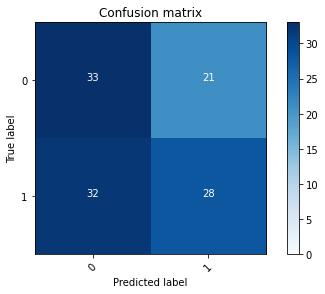

2022-08-22 16:04:48 - [Epoch Train: 22] loss: 0.5900, auc: 0.7835, acc: 0.7072, time: 25.00 s            
2022-08-22 16:04:48 - [Epoch Valid: 22] loss: 0.7208, auc: 0.5046, acc: 0.5455, time: 6.00 s


 22%|█████████▏                                | 22/100 [11:29<40:52, 31.44s/it]

2022-08-22 16:04:48 - EPOCH: 23
2022-08-22 16:04:49 - Train Step 10/485, train_loss: 0.6650
2022-08-22 16:04:49 - Train Step 20/485, train_loss: 0.6018
2022-08-22 16:04:50 - Train Step 30/485, train_loss: 0.5746
2022-08-22 16:04:50 - Train Step 40/485, train_loss: 0.5563
2022-08-22 16:04:51 - Train Step 50/485, train_loss: 0.5482
2022-08-22 16:04:51 - Train Step 60/485, train_loss: 0.5399
2022-08-22 16:04:52 - Train Step 70/485, train_loss: 0.5358
2022-08-22 16:04:52 - Train Step 80/485, train_loss: 0.5525
2022-08-22 16:04:53 - Train Step 90/485, train_loss: 0.5516
2022-08-22 16:04:53 - Train Step 100/485, train_loss: 0.5641
2022-08-22 16:04:54 - Train Step 110/485, train_loss: 0.5598
2022-08-22 16:04:54 - Train Step 120/485, train_loss: 0.5639
2022-08-22 16:04:55 - Train Step 130/485, train_loss: 0.5674
2022-08-22 16:04:55 - Train Step 140/485, train_loss: 0.5667
2022-08-22 16:04:56 - Train Step 150/485, train_loss: 0.5575
2022-08-22 16:04:56 - Train Step 160/485, train_loss: 0.5648
2

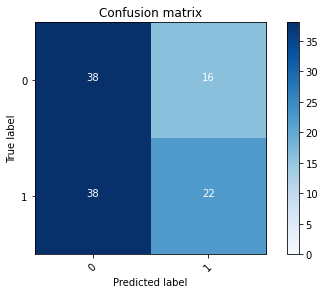

2022-08-22 16:05:19 - [Epoch Train: 23] loss: 0.5855, auc: 0.7880, acc: 0.7340, time: 24.00 s            
2022-08-22 16:05:19 - [Epoch Valid: 23] loss: 0.7260, auc: 0.5012, acc: 0.5537, time: 6.00 s


 23%|█████████▋                                | 23/100 [12:00<40:11, 31.32s/it]

2022-08-22 16:05:19 - EPOCH: 24
2022-08-22 16:05:20 - Train Step 10/485, train_loss: 0.6105
2022-08-22 16:05:20 - Train Step 20/485, train_loss: 0.5718
2022-08-22 16:05:21 - Train Step 30/485, train_loss: 0.5374
2022-08-22 16:05:21 - Train Step 40/485, train_loss: 0.5670
2022-08-22 16:05:22 - Train Step 50/485, train_loss: 0.5727
2022-08-22 16:05:22 - Train Step 60/485, train_loss: 0.5693
2022-08-22 16:05:23 - Train Step 70/485, train_loss: 0.5673
2022-08-22 16:05:23 - Train Step 80/485, train_loss: 0.5743
2022-08-22 16:05:24 - Train Step 90/485, train_loss: 0.5809
2022-08-22 16:05:24 - Train Step 100/485, train_loss: 0.5846
2022-08-22 16:05:25 - Train Step 110/485, train_loss: 0.5746
2022-08-22 16:05:25 - Train Step 120/485, train_loss: 0.5794
2022-08-22 16:05:26 - Train Step 130/485, train_loss: 0.5831
2022-08-22 16:05:26 - Train Step 140/485, train_loss: 0.5913
2022-08-22 16:05:27 - Train Step 150/485, train_loss: 0.5925
2022-08-22 16:05:27 - Train Step 160/485, train_loss: 0.5979
2

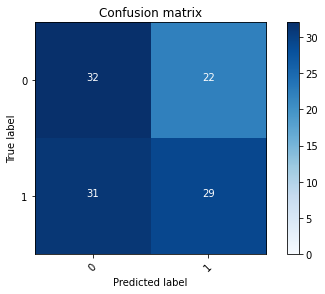

2022-08-22 16:05:50 - [Epoch Train: 24] loss: 0.5864, auc: 0.7807, acc: 0.7010, time: 24.00 s            
2022-08-22 16:05:50 - [Epoch Valid: 24] loss: 0.7298, auc: 0.5059, acc: 0.5455, time: 6.00 s


 24%|██████████                                | 24/100 [12:31<39:35, 31.25s/it]

2022-08-22 16:05:50 - EPOCH: 25
2022-08-22 16:05:51 - Train Step 10/485, train_loss: 0.6371
2022-08-22 16:05:51 - Train Step 20/485, train_loss: 0.5923
2022-08-22 16:05:52 - Train Step 30/485, train_loss: 0.6201
2022-08-22 16:05:52 - Train Step 40/485, train_loss: 0.5726
2022-08-22 16:05:53 - Train Step 50/485, train_loss: 0.5651
2022-08-22 16:05:53 - Train Step 60/485, train_loss: 0.5695
2022-08-22 16:05:54 - Train Step 70/485, train_loss: 0.5708
2022-08-22 16:05:54 - Train Step 80/485, train_loss: 0.5641
2022-08-22 16:05:55 - Train Step 90/485, train_loss: 0.5473
2022-08-22 16:05:55 - Train Step 100/485, train_loss: 0.5502
2022-08-22 16:05:56 - Train Step 110/485, train_loss: 0.5515
2022-08-22 16:05:56 - Train Step 120/485, train_loss: 0.5656
2022-08-22 16:05:57 - Train Step 130/485, train_loss: 0.5600
2022-08-22 16:05:57 - Train Step 140/485, train_loss: 0.5535
2022-08-22 16:05:58 - Train Step 150/485, train_loss: 0.5489
2022-08-22 16:05:58 - Train Step 160/485, train_loss: 0.5501
2

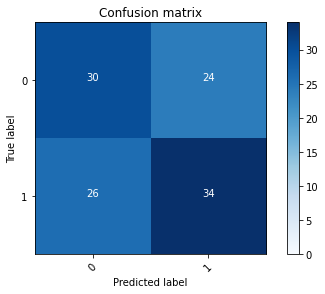

2022-08-22 16:06:21 - [Epoch Train: 25] loss: 0.5644, auc: 0.8017, acc: 0.7299, time: 24.00 s            
2022-08-22 16:06:21 - [Epoch Valid: 25] loss: 0.7384, auc: 0.5074, acc: 0.5702, time: 6.00 s


 25%|██████████▌                               | 25/100 [13:03<39:01, 31.22s/it]

2022-08-22 16:06:21 - EPOCH: 26
2022-08-22 16:06:22 - Train Step 10/485, train_loss: 0.5458
2022-08-22 16:06:23 - Train Step 20/485, train_loss: 0.5686
2022-08-22 16:06:23 - Train Step 30/485, train_loss: 0.5947
2022-08-22 16:06:24 - Train Step 40/485, train_loss: 0.5837
2022-08-22 16:06:24 - Train Step 50/485, train_loss: 0.5739
2022-08-22 16:06:25 - Train Step 60/485, train_loss: 0.5417
2022-08-22 16:06:25 - Train Step 70/485, train_loss: 0.5385
2022-08-22 16:06:26 - Train Step 80/485, train_loss: 0.5324
2022-08-22 16:06:26 - Train Step 90/485, train_loss: 0.5345
2022-08-22 16:06:27 - Train Step 100/485, train_loss: 0.5334
2022-08-22 16:06:27 - Train Step 110/485, train_loss: 0.5258
2022-08-22 16:06:28 - Train Step 120/485, train_loss: 0.5225
2022-08-22 16:06:28 - Train Step 130/485, train_loss: 0.5324
2022-08-22 16:06:29 - Train Step 140/485, train_loss: 0.5327
2022-08-22 16:06:29 - Train Step 150/485, train_loss: 0.5398
2022-08-22 16:06:30 - Train Step 160/485, train_loss: 0.5465
2

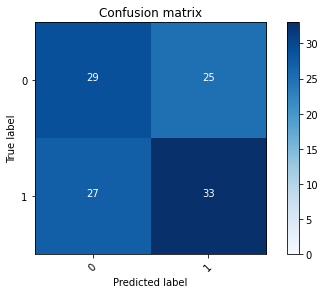

2022-08-22 16:06:52 - [Epoch Train: 26] loss: 0.5686, auc: 0.7952, acc: 0.7402, time: 24.00 s            
2022-08-22 16:06:52 - [Epoch Valid: 26] loss: 0.7449, auc: 0.5096, acc: 0.5537, time: 6.00 s


 26%|██████████▉                               | 26/100 [13:34<38:22, 31.11s/it]

2022-08-22 16:06:52 - EPOCH: 27
2022-08-22 16:06:53 - Train Step 10/485, train_loss: 0.4478
2022-08-22 16:06:53 - Train Step 20/485, train_loss: 0.5380
2022-08-22 16:06:54 - Train Step 30/485, train_loss: 0.5205
2022-08-22 16:06:54 - Train Step 40/485, train_loss: 0.5120
2022-08-22 16:06:55 - Train Step 50/485, train_loss: 0.5371
2022-08-22 16:06:55 - Train Step 60/485, train_loss: 0.5555
2022-08-22 16:06:56 - Train Step 70/485, train_loss: 0.5576
2022-08-22 16:06:57 - Train Step 80/485, train_loss: 0.5517
2022-08-22 16:06:57 - Train Step 90/485, train_loss: 0.5464
2022-08-22 16:06:58 - Train Step 100/485, train_loss: 0.5451
2022-08-22 16:06:58 - Train Step 110/485, train_loss: 0.5481
2022-08-22 16:06:59 - Train Step 120/485, train_loss: 0.5359
2022-08-22 16:06:59 - Train Step 130/485, train_loss: 0.5516
2022-08-22 16:07:00 - Train Step 140/485, train_loss: 0.5437
2022-08-22 16:07:00 - Train Step 150/485, train_loss: 0.5461
2022-08-22 16:07:01 - Train Step 160/485, train_loss: 0.5564
2

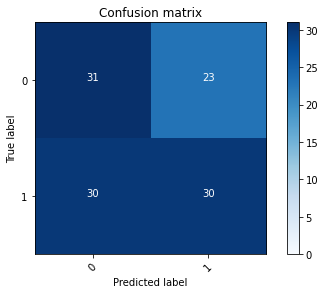

2022-08-22 16:07:24 - [Epoch Train: 27] loss: 0.5566, auc: 0.8106, acc: 0.7691, time: 25.00 s            
2022-08-22 16:07:24 - [Epoch Valid: 27] loss: 0.7454, auc: 0.5068, acc: 0.5455, time: 6.00 s


 27%|███████████▎                              | 27/100 [14:05<37:59, 31.23s/it]

2022-08-22 16:07:24 - EPOCH: 28
2022-08-22 16:07:24 - Train Step 10/485, train_loss: 0.5869
2022-08-22 16:07:25 - Train Step 20/485, train_loss: 0.5802
2022-08-22 16:07:25 - Train Step 30/485, train_loss: 0.5547
2022-08-22 16:07:26 - Train Step 40/485, train_loss: 0.5416
2022-08-22 16:07:26 - Train Step 50/485, train_loss: 0.5659
2022-08-22 16:07:27 - Train Step 60/485, train_loss: 0.5645
2022-08-22 16:07:27 - Train Step 70/485, train_loss: 0.5683
2022-08-22 16:07:28 - Train Step 80/485, train_loss: 0.5671
2022-08-22 16:07:28 - Train Step 90/485, train_loss: 0.5601
2022-08-22 16:07:29 - Train Step 100/485, train_loss: 0.5665
2022-08-22 16:07:29 - Train Step 110/485, train_loss: 0.5617
2022-08-22 16:07:30 - Train Step 120/485, train_loss: 0.5568
2022-08-22 16:07:31 - Train Step 130/485, train_loss: 0.5526
2022-08-22 16:07:31 - Train Step 140/485, train_loss: 0.5456
2022-08-22 16:07:32 - Train Step 150/485, train_loss: 0.5512
2022-08-22 16:07:32 - Train Step 160/485, train_loss: 0.5503
2

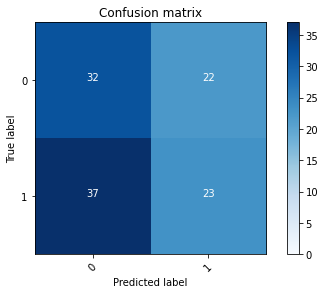

2022-08-22 16:07:55 - [Epoch Train: 28] loss: 0.5523, auc: 0.8145, acc: 0.7278, time: 25.00 s            
2022-08-22 16:07:55 - [Epoch Valid: 28] loss: 0.7510, auc: 0.4991, acc: 0.4959, time: 6.00 s


 28%|███████████▊                              | 28/100 [14:36<37:32, 31.29s/it]

2022-08-22 16:07:55 - EPOCH: 29
2022-08-22 16:07:56 - Train Step 10/485, train_loss: 0.5113
2022-08-22 16:07:56 - Train Step 20/485, train_loss: 0.5915
2022-08-22 16:07:57 - Train Step 30/485, train_loss: 0.5694
2022-08-22 16:07:57 - Train Step 40/485, train_loss: 0.5378
2022-08-22 16:07:58 - Train Step 50/485, train_loss: 0.5752
2022-08-22 16:07:58 - Train Step 60/485, train_loss: 0.5744
2022-08-22 16:07:59 - Train Step 70/485, train_loss: 0.5631
2022-08-22 16:07:59 - Train Step 80/485, train_loss: 0.5649
2022-08-22 16:08:00 - Train Step 90/485, train_loss: 0.5503
2022-08-22 16:08:00 - Train Step 100/485, train_loss: 0.5403
2022-08-22 16:08:01 - Train Step 110/485, train_loss: 0.5251
2022-08-22 16:08:01 - Train Step 120/485, train_loss: 0.5255
2022-08-22 16:08:02 - Train Step 130/485, train_loss: 0.5293
2022-08-22 16:08:02 - Train Step 140/485, train_loss: 0.5175
2022-08-22 16:08:03 - Train Step 150/485, train_loss: 0.5238
2022-08-22 16:08:03 - Train Step 160/485, train_loss: 0.5260
2

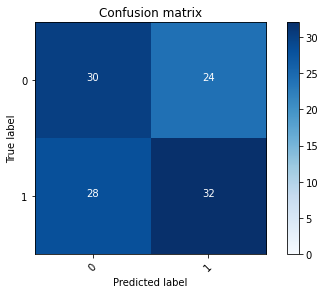

2022-08-22 16:08:26 - [Epoch Train: 29] loss: 0.5308, auc: 0.8271, acc: 0.7649, time: 24.00 s            
2022-08-22 16:08:26 - [Epoch Valid: 29] loss: 0.7531, auc: 0.5090, acc: 0.5537, time: 6.00 s


 29%|████████████▏                             | 29/100 [15:07<36:53, 31.18s/it]

2022-08-22 16:08:26 - EPOCH: 30
2022-08-22 16:08:27 - Train Step 10/485, train_loss: 0.4930
2022-08-22 16:08:27 - Train Step 20/485, train_loss: 0.4895
2022-08-22 16:08:28 - Train Step 30/485, train_loss: 0.5201
2022-08-22 16:08:28 - Train Step 40/485, train_loss: 0.5211
2022-08-22 16:08:29 - Train Step 50/485, train_loss: 0.5152
2022-08-22 16:08:29 - Train Step 60/485, train_loss: 0.4965
2022-08-22 16:08:30 - Train Step 70/485, train_loss: 0.5016
2022-08-22 16:08:30 - Train Step 80/485, train_loss: 0.4929
2022-08-22 16:08:31 - Train Step 90/485, train_loss: 0.5044
2022-08-22 16:08:31 - Train Step 100/485, train_loss: 0.5066
2022-08-22 16:08:32 - Train Step 110/485, train_loss: 0.5034
2022-08-22 16:08:32 - Train Step 120/485, train_loss: 0.5108
2022-08-22 16:08:33 - Train Step 130/485, train_loss: 0.5241
2022-08-22 16:08:33 - Train Step 140/485, train_loss: 0.5244
2022-08-22 16:08:34 - Train Step 150/485, train_loss: 0.5232
2022-08-22 16:08:34 - Train Step 160/485, train_loss: 0.5315
2

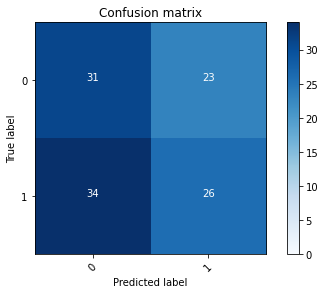

2022-08-22 16:08:58 - [Epoch Train: 30] loss: 0.5331, auc: 0.8249, acc: 0.7608, time: 24.00 s            
2022-08-22 16:08:58 - [Epoch Valid: 30] loss: 0.7626, auc: 0.4978, acc: 0.5124, time: 6.00 s


 30%|████████████▌                             | 30/100 [15:39<36:27, 31.25s/it]

2022-08-22 16:08:58 - EPOCH: 31
2022-08-22 16:08:58 - Train Step 10/485, train_loss: 0.5135
2022-08-22 16:08:59 - Train Step 20/485, train_loss: 0.5421
2022-08-22 16:08:59 - Train Step 30/485, train_loss: 0.5957
2022-08-22 16:09:00 - Train Step 40/485, train_loss: 0.6071
2022-08-22 16:09:00 - Train Step 50/485, train_loss: 0.5859
2022-08-22 16:09:01 - Train Step 60/485, train_loss: 0.5921
2022-08-22 16:09:01 - Train Step 70/485, train_loss: 0.5668
2022-08-22 16:09:02 - Train Step 80/485, train_loss: 0.5659
2022-08-22 16:09:02 - Train Step 90/485, train_loss: 0.5515
2022-08-22 16:09:03 - Train Step 100/485, train_loss: 0.5366
2022-08-22 16:09:03 - Train Step 110/485, train_loss: 0.5196
2022-08-22 16:09:04 - Train Step 120/485, train_loss: 0.5155
2022-08-22 16:09:04 - Train Step 130/485, train_loss: 0.5273
2022-08-22 16:09:05 - Train Step 140/485, train_loss: 0.5300
2022-08-22 16:09:05 - Train Step 150/485, train_loss: 0.5168
2022-08-22 16:09:06 - Train Step 160/485, train_loss: 0.5132
2

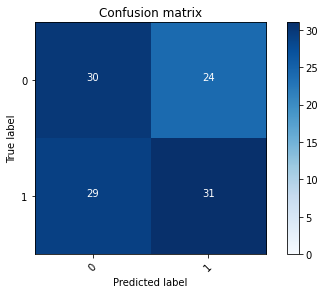

2022-08-22 16:09:29 - [Epoch Train: 31] loss: 0.5326, auc: 0.8267, acc: 0.7567, time: 25.00 s            
2022-08-22 16:09:29 - [Epoch Valid: 31] loss: 0.7677, auc: 0.5056, acc: 0.5455, time: 6.00 s


 31%|█████████████                             | 31/100 [16:11<36:06, 31.39s/it]

2022-08-22 16:09:29 - EPOCH: 32
2022-08-22 16:09:30 - Train Step 10/485, train_loss: 0.4934
2022-08-22 16:09:30 - Train Step 20/485, train_loss: 0.4846
2022-08-22 16:09:31 - Train Step 30/485, train_loss: 0.4548
2022-08-22 16:09:31 - Train Step 40/485, train_loss: 0.4666
2022-08-22 16:09:32 - Train Step 50/485, train_loss: 0.4779
2022-08-22 16:09:32 - Train Step 60/485, train_loss: 0.4805
2022-08-22 16:09:33 - Train Step 70/485, train_loss: 0.4704
2022-08-22 16:09:33 - Train Step 80/485, train_loss: 0.4824
2022-08-22 16:09:34 - Train Step 90/485, train_loss: 0.4833
2022-08-22 16:09:34 - Train Step 100/485, train_loss: 0.4900
2022-08-22 16:09:35 - Train Step 110/485, train_loss: 0.4832
2022-08-22 16:09:35 - Train Step 120/485, train_loss: 0.4966
2022-08-22 16:09:36 - Train Step 130/485, train_loss: 0.4919
2022-08-22 16:09:36 - Train Step 140/485, train_loss: 0.4895
2022-08-22 16:09:37 - Train Step 150/485, train_loss: 0.4853
2022-08-22 16:09:37 - Train Step 160/485, train_loss: 0.4852
2

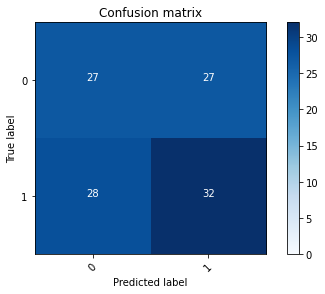

2022-08-22 16:10:01 - [Epoch Train: 32] loss: 0.5110, auc: 0.8439, acc: 0.7526, time: 25.00 s            
2022-08-22 16:10:01 - [Epoch Valid: 32] loss: 0.7723, auc: 0.5080, acc: 0.5207, time: 6.00 s


 32%|█████████████▍                            | 32/100 [16:42<35:36, 31.41s/it]

2022-08-22 16:10:01 - EPOCH: 33
2022-08-22 16:10:01 - Train Step 10/485, train_loss: 0.5114
2022-08-22 16:10:02 - Train Step 20/485, train_loss: 0.4686
2022-08-22 16:10:02 - Train Step 30/485, train_loss: 0.5056
2022-08-22 16:10:03 - Train Step 40/485, train_loss: 0.4628
2022-08-22 16:10:04 - Train Step 50/485, train_loss: 0.5190
2022-08-22 16:10:04 - Train Step 60/485, train_loss: 0.5180
2022-08-22 16:10:05 - Train Step 70/485, train_loss: 0.5310
2022-08-22 16:10:05 - Train Step 80/485, train_loss: 0.5430
2022-08-22 16:10:06 - Train Step 90/485, train_loss: 0.5710
2022-08-22 16:10:06 - Train Step 100/485, train_loss: 0.5662
2022-08-22 16:10:07 - Train Step 110/485, train_loss: 0.5511
2022-08-22 16:10:07 - Train Step 120/485, train_loss: 0.5412
2022-08-22 16:10:08 - Train Step 130/485, train_loss: 0.5574
2022-08-22 16:10:08 - Train Step 140/485, train_loss: 0.5521
2022-08-22 16:10:09 - Train Step 150/485, train_loss: 0.5430
2022-08-22 16:10:09 - Train Step 160/485, train_loss: 0.5339
2

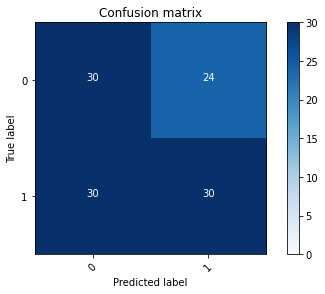

2022-08-22 16:10:32 - [Epoch Train: 33] loss: 0.5057, auc: 0.8449, acc: 0.7711, time: 25.00 s            
2022-08-22 16:10:32 - [Epoch Valid: 33] loss: 0.7738, auc: 0.5006, acc: 0.5372, time: 6.00 s


 33%|█████████████▊                            | 33/100 [17:14<35:08, 31.48s/it]

2022-08-22 16:10:32 - EPOCH: 34
2022-08-22 16:10:33 - Train Step 10/485, train_loss: 0.3794
2022-08-22 16:10:34 - Train Step 20/485, train_loss: 0.4121
2022-08-22 16:10:34 - Train Step 30/485, train_loss: 0.4874
2022-08-22 16:10:35 - Train Step 40/485, train_loss: 0.4692
2022-08-22 16:10:35 - Train Step 50/485, train_loss: 0.4747
2022-08-22 16:10:36 - Train Step 60/485, train_loss: 0.4690
2022-08-22 16:10:36 - Train Step 70/485, train_loss: 0.4823
2022-08-22 16:10:37 - Train Step 80/485, train_loss: 0.4669
2022-08-22 16:10:37 - Train Step 90/485, train_loss: 0.4750
2022-08-22 16:10:38 - Train Step 100/485, train_loss: 0.4839
2022-08-22 16:10:38 - Train Step 110/485, train_loss: 0.4779
2022-08-22 16:10:39 - Train Step 120/485, train_loss: 0.4799
2022-08-22 16:10:39 - Train Step 130/485, train_loss: 0.4792
2022-08-22 16:10:40 - Train Step 140/485, train_loss: 0.4730
2022-08-22 16:10:40 - Train Step 150/485, train_loss: 0.4661
2022-08-22 16:10:41 - Train Step 160/485, train_loss: 0.4737
2

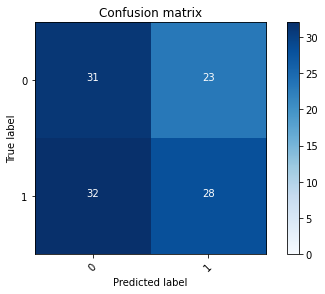

2022-08-22 16:11:04 - [Epoch Train: 34] loss: 0.4843, auc: 0.8676, acc: 0.8000, time: 25.00 s            
2022-08-22 16:11:04 - [Epoch Valid: 34] loss: 0.7904, auc: 0.4960, acc: 0.5289, time: 6.00 s


 34%|██████████████▎                           | 34/100 [17:45<34:36, 31.46s/it]

2022-08-22 16:11:04 - EPOCH: 35
2022-08-22 16:11:04 - Train Step 10/485, train_loss: 0.4524
2022-08-22 16:11:05 - Train Step 20/485, train_loss: 0.3919
2022-08-22 16:11:05 - Train Step 30/485, train_loss: 0.4884
2022-08-22 16:11:06 - Train Step 40/485, train_loss: 0.5358
2022-08-22 16:11:06 - Train Step 50/485, train_loss: 0.5258
2022-08-22 16:11:07 - Train Step 60/485, train_loss: 0.5119
2022-08-22 16:11:07 - Train Step 70/485, train_loss: 0.5330
2022-08-22 16:11:08 - Train Step 80/485, train_loss: 0.5331
2022-08-22 16:11:08 - Train Step 90/485, train_loss: 0.5356
2022-08-22 16:11:09 - Train Step 100/485, train_loss: 0.5140
2022-08-22 16:11:10 - Train Step 110/485, train_loss: 0.5169
2022-08-22 16:11:10 - Train Step 120/485, train_loss: 0.5056
2022-08-22 16:11:11 - Train Step 130/485, train_loss: 0.5027
2022-08-22 16:11:11 - Train Step 140/485, train_loss: 0.5164
2022-08-22 16:11:12 - Train Step 150/485, train_loss: 0.5140
2022-08-22 16:11:12 - Train Step 160/485, train_loss: 0.5288
2

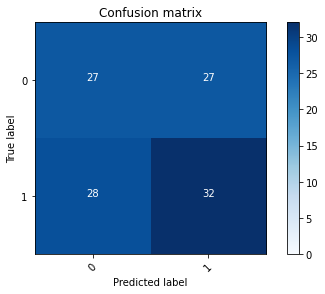

2022-08-22 16:11:35 - [Epoch Train: 35] loss: 0.4879, auc: 0.8534, acc: 0.7835, time: 24.00 s            
2022-08-22 16:11:35 - [Epoch Valid: 35] loss: 0.7865, auc: 0.5019, acc: 0.5207, time: 6.00 s


 35%|██████████████▋                           | 35/100 [18:16<34:03, 31.44s/it]

2022-08-22 16:11:35 - EPOCH: 36
2022-08-22 16:11:36 - Train Step 10/485, train_loss: 0.5601
2022-08-22 16:11:36 - Train Step 20/485, train_loss: 0.4650
2022-08-22 16:11:37 - Train Step 30/485, train_loss: 0.4579
2022-08-22 16:11:37 - Train Step 40/485, train_loss: 0.5113
2022-08-22 16:11:38 - Train Step 50/485, train_loss: 0.5069
2022-08-22 16:11:38 - Train Step 60/485, train_loss: 0.4911
2022-08-22 16:11:39 - Train Step 70/485, train_loss: 0.4797
2022-08-22 16:11:39 - Train Step 80/485, train_loss: 0.4678
2022-08-22 16:11:40 - Train Step 90/485, train_loss: 0.4587
2022-08-22 16:11:40 - Train Step 100/485, train_loss: 0.4560
2022-08-22 16:11:41 - Train Step 110/485, train_loss: 0.4631
2022-08-22 16:11:41 - Train Step 120/485, train_loss: 0.4630
2022-08-22 16:11:42 - Train Step 130/485, train_loss: 0.4839
2022-08-22 16:11:42 - Train Step 140/485, train_loss: 0.4823
2022-08-22 16:11:43 - Train Step 150/485, train_loss: 0.4799
2022-08-22 16:11:43 - Train Step 160/485, train_loss: 0.4759
2

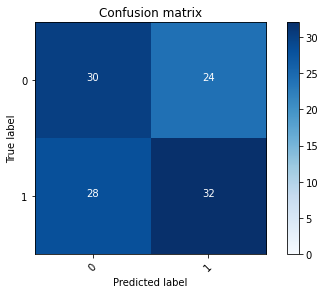

2022-08-22 16:12:07 - [Epoch Train: 36] loss: 0.4843, auc: 0.8592, acc: 0.7938, time: 24.00 s            
2022-08-22 16:12:07 - [Epoch Valid: 36] loss: 0.8048, auc: 0.5080, acc: 0.5537, time: 6.00 s


 36%|███████████████                           | 36/100 [18:48<33:32, 31.44s/it]

2022-08-22 16:12:07 - EPOCH: 37
2022-08-22 16:12:07 - Train Step 10/485, train_loss: 0.4848
2022-08-22 16:12:08 - Train Step 20/485, train_loss: 0.4462
2022-08-22 16:12:08 - Train Step 30/485, train_loss: 0.4028
2022-08-22 16:12:09 - Train Step 40/485, train_loss: 0.4338
2022-08-22 16:12:09 - Train Step 50/485, train_loss: 0.4635
2022-08-22 16:12:10 - Train Step 60/485, train_loss: 0.4603
2022-08-22 16:12:10 - Train Step 70/485, train_loss: 0.4364
2022-08-22 16:12:11 - Train Step 80/485, train_loss: 0.4419
2022-08-22 16:12:11 - Train Step 90/485, train_loss: 0.4645
2022-08-22 16:12:12 - Train Step 100/485, train_loss: 0.4753
2022-08-22 16:12:12 - Train Step 110/485, train_loss: 0.4677
2022-08-22 16:12:13 - Train Step 120/485, train_loss: 0.4759
2022-08-22 16:12:13 - Train Step 130/485, train_loss: 0.4765
2022-08-22 16:12:14 - Train Step 140/485, train_loss: 0.4813
2022-08-22 16:12:14 - Train Step 150/485, train_loss: 0.4703
2022-08-22 16:12:15 - Train Step 160/485, train_loss: 0.4701
2

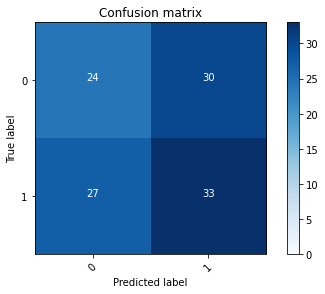

2022-08-22 16:12:38 - [Epoch Train: 37] loss: 0.4695, auc: 0.8709, acc: 0.8062, time: 24.00 s            
2022-08-22 16:12:38 - [Epoch Valid: 37] loss: 0.8258, auc: 0.5086, acc: 0.4876, time: 6.00 s


 37%|███████████████▌                          | 37/100 [19:19<33:00, 31.44s/it]

2022-08-22 16:12:38 - EPOCH: 38
2022-08-22 16:12:39 - Train Step 10/485, train_loss: 0.4627
2022-08-22 16:12:39 - Train Step 20/485, train_loss: 0.4356
2022-08-22 16:12:40 - Train Step 30/485, train_loss: 0.4791
2022-08-22 16:12:40 - Train Step 40/485, train_loss: 0.4606
2022-08-22 16:12:41 - Train Step 50/485, train_loss: 0.4425
2022-08-22 16:12:41 - Train Step 60/485, train_loss: 0.4657
2022-08-22 16:12:42 - Train Step 70/485, train_loss: 0.4509
2022-08-22 16:12:42 - Train Step 80/485, train_loss: 0.4390
2022-08-22 16:12:43 - Train Step 90/485, train_loss: 0.4341
2022-08-22 16:12:43 - Train Step 100/485, train_loss: 0.4473
2022-08-22 16:12:44 - Train Step 110/485, train_loss: 0.4426
2022-08-22 16:12:44 - Train Step 120/485, train_loss: 0.4328
2022-08-22 16:12:45 - Train Step 130/485, train_loss: 0.4308
2022-08-22 16:12:45 - Train Step 140/485, train_loss: 0.4351
2022-08-22 16:12:46 - Train Step 150/485, train_loss: 0.4471
2022-08-22 16:12:46 - Train Step 160/485, train_loss: 0.4454
2

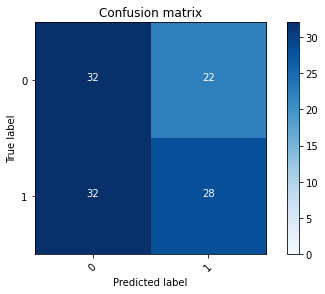

2022-08-22 16:13:10 - [Epoch Train: 38] loss: 0.4579, auc: 0.8848, acc: 0.8206, time: 25.00 s            
2022-08-22 16:13:10 - [Epoch Valid: 38] loss: 0.8308, auc: 0.4920, acc: 0.5372, time: 6.00 s


 38%|███████████████▉                          | 38/100 [19:51<32:32, 31.49s/it]

2022-08-22 16:13:10 - EPOCH: 39
2022-08-22 16:13:10 - Train Step 10/485, train_loss: 0.5294
2022-08-22 16:13:11 - Train Step 20/485, train_loss: 0.4299
2022-08-22 16:13:11 - Train Step 30/485, train_loss: 0.3568
2022-08-22 16:13:12 - Train Step 40/485, train_loss: 0.3764
2022-08-22 16:13:12 - Train Step 50/485, train_loss: 0.4125
2022-08-22 16:13:13 - Train Step 60/485, train_loss: 0.4455
2022-08-22 16:13:13 - Train Step 70/485, train_loss: 0.4483
2022-08-22 16:13:14 - Train Step 80/485, train_loss: 0.4640
2022-08-22 16:13:14 - Train Step 90/485, train_loss: 0.4704
2022-08-22 16:13:15 - Train Step 100/485, train_loss: 0.4788
2022-08-22 16:13:15 - Train Step 110/485, train_loss: 0.4787
2022-08-22 16:13:16 - Train Step 120/485, train_loss: 0.4773
2022-08-22 16:13:16 - Train Step 130/485, train_loss: 0.4753
2022-08-22 16:13:17 - Train Step 140/485, train_loss: 0.4653
2022-08-22 16:13:17 - Train Step 150/485, train_loss: 0.4614
2022-08-22 16:13:18 - Train Step 160/485, train_loss: 0.4581
2

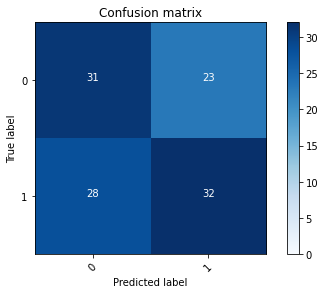

2022-08-22 16:13:41 - [Epoch Train: 39] loss: 0.4554, auc: 0.8821, acc: 0.8268, time: 24.00 s            
2022-08-22 16:13:41 - [Epoch Valid: 39] loss: 0.8286, auc: 0.5003, acc: 0.5620, time: 6.00 s


 39%|████████████████▍                         | 39/100 [20:22<31:54, 31.38s/it]

2022-08-22 16:13:41 - EPOCH: 40
2022-08-22 16:13:41 - Train Step 10/485, train_loss: 0.4171
2022-08-22 16:13:42 - Train Step 20/485, train_loss: 0.4195
2022-08-22 16:13:43 - Train Step 30/485, train_loss: 0.3774
2022-08-22 16:13:43 - Train Step 40/485, train_loss: 0.4294
2022-08-22 16:13:44 - Train Step 50/485, train_loss: 0.4251
2022-08-22 16:13:44 - Train Step 60/485, train_loss: 0.4112
2022-08-22 16:13:45 - Train Step 70/485, train_loss: 0.4068
2022-08-22 16:13:45 - Train Step 80/485, train_loss: 0.4103
2022-08-22 16:13:46 - Train Step 90/485, train_loss: 0.4183
2022-08-22 16:13:46 - Train Step 100/485, train_loss: 0.4055
2022-08-22 16:13:47 - Train Step 110/485, train_loss: 0.4103
2022-08-22 16:13:47 - Train Step 120/485, train_loss: 0.4083
2022-08-22 16:13:48 - Train Step 130/485, train_loss: 0.4329
2022-08-22 16:13:48 - Train Step 140/485, train_loss: 0.4413
2022-08-22 16:13:49 - Train Step 150/485, train_loss: 0.4407
2022-08-22 16:13:49 - Train Step 160/485, train_loss: 0.4357
2

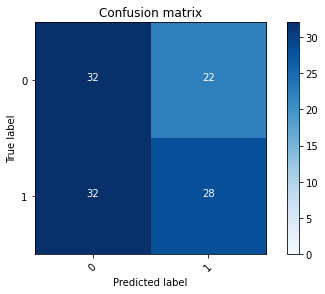

2022-08-22 16:14:12 - [Epoch Train: 40] loss: 0.4510, auc: 0.8781, acc: 0.8021, time: 24.00 s            
2022-08-22 16:14:12 - [Epoch Valid: 40] loss: 0.8620, auc: 0.4981, acc: 0.5372, time: 6.00 s


 40%|████████████████▊                         | 40/100 [20:53<31:23, 31.39s/it]

2022-08-22 16:14:12 - EPOCH: 41
2022-08-22 16:14:13 - Train Step 10/485, train_loss: 0.3887
2022-08-22 16:14:13 - Train Step 20/485, train_loss: 0.4437
2022-08-22 16:14:14 - Train Step 30/485, train_loss: 0.4352
2022-08-22 16:14:14 - Train Step 40/485, train_loss: 0.4019
2022-08-22 16:14:15 - Train Step 50/485, train_loss: 0.3924
2022-08-22 16:14:15 - Train Step 60/485, train_loss: 0.3863
2022-08-22 16:14:16 - Train Step 70/485, train_loss: 0.3851
2022-08-22 16:14:16 - Train Step 80/485, train_loss: 0.3849
2022-08-22 16:14:17 - Train Step 90/485, train_loss: 0.4198
2022-08-22 16:14:17 - Train Step 100/485, train_loss: 0.4215
2022-08-22 16:14:18 - Train Step 110/485, train_loss: 0.4149
2022-08-22 16:14:18 - Train Step 120/485, train_loss: 0.4242
2022-08-22 16:14:19 - Train Step 130/485, train_loss: 0.4254
2022-08-22 16:14:19 - Train Step 140/485, train_loss: 0.4314
2022-08-22 16:14:20 - Train Step 150/485, train_loss: 0.4283
2022-08-22 16:14:20 - Train Step 160/485, train_loss: 0.4256
2

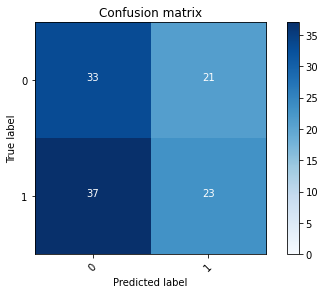

2022-08-22 16:14:44 - [Epoch Train: 41] loss: 0.4413, auc: 0.8877, acc: 0.8206, time: 24.00 s            
2022-08-22 16:14:44 - [Epoch Valid: 41] loss: 0.8332, auc: 0.4901, acc: 0.5041, time: 6.00 s


 41%|█████████████████▏                        | 41/100 [21:25<30:51, 31.38s/it]

2022-08-22 16:14:44 - EPOCH: 42
2022-08-22 16:14:44 - Train Step 10/485, train_loss: 0.2724
2022-08-22 16:14:45 - Train Step 20/485, train_loss: 0.3550
2022-08-22 16:14:45 - Train Step 30/485, train_loss: 0.3200
2022-08-22 16:14:46 - Train Step 40/485, train_loss: 0.3169
2022-08-22 16:14:46 - Train Step 50/485, train_loss: 0.3542
2022-08-22 16:14:47 - Train Step 60/485, train_loss: 0.3645
2022-08-22 16:14:47 - Train Step 70/485, train_loss: 0.3966
2022-08-22 16:14:48 - Train Step 80/485, train_loss: 0.4062
2022-08-22 16:14:48 - Train Step 90/485, train_loss: 0.4033
2022-08-22 16:14:49 - Train Step 100/485, train_loss: 0.4099
2022-08-22 16:14:49 - Train Step 110/485, train_loss: 0.4052
2022-08-22 16:14:50 - Train Step 120/485, train_loss: 0.3972
2022-08-22 16:14:50 - Train Step 130/485, train_loss: 0.4108
2022-08-22 16:14:51 - Train Step 140/485, train_loss: 0.4003
2022-08-22 16:14:51 - Train Step 150/485, train_loss: 0.3958
2022-08-22 16:14:52 - Train Step 160/485, train_loss: 0.4016
2

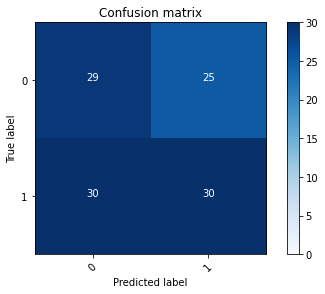

2022-08-22 16:15:15 - [Epoch Train: 42] loss: 0.4388, auc: 0.8863, acc: 0.8103, time: 24.00 s            
2022-08-22 16:15:15 - [Epoch Valid: 42] loss: 0.8524, auc: 0.4932, acc: 0.5207, time: 6.00 s


 42%|█████████████████▋                        | 42/100 [21:56<30:21, 31.40s/it]

2022-08-22 16:15:15 - EPOCH: 43
2022-08-22 16:15:16 - Train Step 10/485, train_loss: 0.3414
2022-08-22 16:15:16 - Train Step 20/485, train_loss: 0.3485
2022-08-22 16:15:17 - Train Step 30/485, train_loss: 0.4110
2022-08-22 16:15:17 - Train Step 40/485, train_loss: 0.3868
2022-08-22 16:15:18 - Train Step 50/485, train_loss: 0.3771
2022-08-22 16:15:18 - Train Step 60/485, train_loss: 0.3840
2022-08-22 16:15:19 - Train Step 70/485, train_loss: 0.3940
2022-08-22 16:15:19 - Train Step 80/485, train_loss: 0.4089
2022-08-22 16:15:20 - Train Step 90/485, train_loss: 0.3925
2022-08-22 16:15:20 - Train Step 100/485, train_loss: 0.3790
2022-08-22 16:15:21 - Train Step 110/485, train_loss: 0.3861
2022-08-22 16:15:21 - Train Step 120/485, train_loss: 0.3866
2022-08-22 16:15:22 - Train Step 130/485, train_loss: 0.3824
2022-08-22 16:15:22 - Train Step 140/485, train_loss: 0.3785
2022-08-22 16:15:23 - Train Step 150/485, train_loss: 0.3735
2022-08-22 16:15:23 - Train Step 160/485, train_loss: 0.3758
2

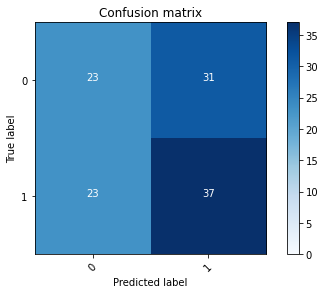

2022-08-22 16:15:46 - [Epoch Train: 43] loss: 0.4110, auc: 0.9101, acc: 0.8392, time: 24.00 s            
2022-08-22 16:15:46 - [Epoch Valid: 43] loss: 0.8466, auc: 0.5071, acc: 0.5124, time: 6.00 s


 43%|██████████████████                        | 43/100 [22:28<29:50, 31.42s/it]

2022-08-22 16:15:46 - EPOCH: 44
2022-08-22 16:15:47 - Train Step 10/485, train_loss: 0.5719
2022-08-22 16:15:48 - Train Step 20/485, train_loss: 0.4672
2022-08-22 16:15:48 - Train Step 30/485, train_loss: 0.4657
2022-08-22 16:15:49 - Train Step 40/485, train_loss: 0.4225
2022-08-22 16:15:49 - Train Step 50/485, train_loss: 0.4059
2022-08-22 16:15:50 - Train Step 60/485, train_loss: 0.4004
2022-08-22 16:15:50 - Train Step 70/485, train_loss: 0.3879
2022-08-22 16:15:51 - Train Step 80/485, train_loss: 0.3730
2022-08-22 16:15:51 - Train Step 90/485, train_loss: 0.3667
2022-08-22 16:15:52 - Train Step 100/485, train_loss: 0.3657
2022-08-22 16:15:52 - Train Step 110/485, train_loss: 0.3785
2022-08-22 16:15:53 - Train Step 120/485, train_loss: 0.3769
2022-08-22 16:15:53 - Train Step 130/485, train_loss: 0.3850
2022-08-22 16:15:54 - Train Step 140/485, train_loss: 0.3767
2022-08-22 16:15:54 - Train Step 150/485, train_loss: 0.3808
2022-08-22 16:15:55 - Train Step 160/485, train_loss: 0.3798
2

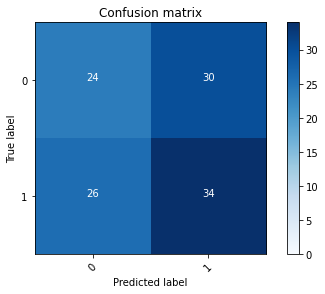

2022-08-22 16:16:18 - [Epoch Train: 44] loss: 0.4072, auc: 0.9082, acc: 0.8351, time: 24.00 s            
2022-08-22 16:16:18 - [Epoch Valid: 44] loss: 0.8735, auc: 0.5077, acc: 0.4959, time: 6.00 s


 44%|██████████████████▍                       | 44/100 [22:59<29:18, 31.40s/it]

2022-08-22 16:16:18 - EPOCH: 45
2022-08-22 16:16:19 - Train Step 10/485, train_loss: 0.3652
2022-08-22 16:16:19 - Train Step 20/485, train_loss: 0.4157
2022-08-22 16:16:20 - Train Step 30/485, train_loss: 0.3274
2022-08-22 16:16:20 - Train Step 40/485, train_loss: 0.3582
2022-08-22 16:16:21 - Train Step 50/485, train_loss: 0.3816
2022-08-22 16:16:21 - Train Step 60/485, train_loss: 0.3533
2022-08-22 16:16:22 - Train Step 70/485, train_loss: 0.3391
2022-08-22 16:16:22 - Train Step 80/485, train_loss: 0.3403
2022-08-22 16:16:23 - Train Step 90/485, train_loss: 0.3356
2022-08-22 16:16:23 - Train Step 100/485, train_loss: 0.3530
2022-08-22 16:16:24 - Train Step 110/485, train_loss: 0.3672
2022-08-22 16:16:24 - Train Step 120/485, train_loss: 0.3747
2022-08-22 16:16:25 - Train Step 130/485, train_loss: 0.3872
2022-08-22 16:16:25 - Train Step 140/485, train_loss: 0.3973
2022-08-22 16:16:26 - Train Step 150/485, train_loss: 0.3977
2022-08-22 16:16:26 - Train Step 160/485, train_loss: 0.4059
2

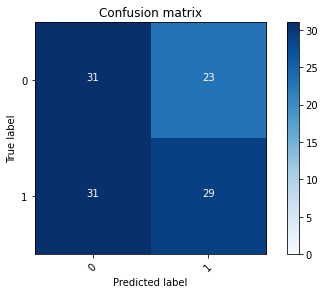

2022-08-22 16:16:49 - [Epoch Train: 45] loss: 0.4060, auc: 0.9103, acc: 0.8474, time: 24.00 s            
2022-08-22 16:16:49 - [Epoch Valid: 45] loss: 0.9005, auc: 0.4948, acc: 0.5372, time: 6.00 s


 45%|██████████████████▉                       | 45/100 [23:30<28:45, 31.37s/it]

2022-08-22 16:16:49 - EPOCH: 46
2022-08-22 16:16:50 - Train Step 10/485, train_loss: 0.4235
2022-08-22 16:16:50 - Train Step 20/485, train_loss: 0.4099
2022-08-22 16:16:51 - Train Step 30/485, train_loss: 0.4434
2022-08-22 16:16:51 - Train Step 40/485, train_loss: 0.3842
2022-08-22 16:16:52 - Train Step 50/485, train_loss: 0.3945
2022-08-22 16:16:52 - Train Step 60/485, train_loss: 0.3707
2022-08-22 16:16:53 - Train Step 70/485, train_loss: 0.3625
2022-08-22 16:16:53 - Train Step 80/485, train_loss: 0.3555
2022-08-22 16:16:54 - Train Step 90/485, train_loss: 0.3376
2022-08-22 16:16:54 - Train Step 100/485, train_loss: 0.3493
2022-08-22 16:16:55 - Train Step 110/485, train_loss: 0.3543
2022-08-22 16:16:55 - Train Step 120/485, train_loss: 0.3607
2022-08-22 16:16:56 - Train Step 130/485, train_loss: 0.3671
2022-08-22 16:16:56 - Train Step 140/485, train_loss: 0.3668
2022-08-22 16:16:57 - Train Step 150/485, train_loss: 0.3828
2022-08-22 16:16:58 - Train Step 160/485, train_loss: 0.3910
2

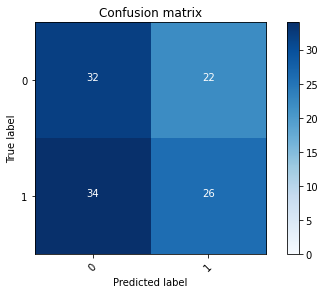

2022-08-22 16:17:20 - [Epoch Train: 46] loss: 0.3857, auc: 0.9199, acc: 0.8412, time: 24.00 s            
2022-08-22 16:17:20 - [Epoch Valid: 46] loss: 0.8724, auc: 0.4904, acc: 0.5207, time: 6.00 s


 46%|███████████████████▎                      | 46/100 [24:02<28:11, 31.32s/it]

2022-08-22 16:17:20 - EPOCH: 47
2022-08-22 16:17:21 - Train Step 10/485, train_loss: 0.3167
2022-08-22 16:17:21 - Train Step 20/485, train_loss: 0.3795
2022-08-22 16:17:22 - Train Step 30/485, train_loss: 0.3773
2022-08-22 16:17:22 - Train Step 40/485, train_loss: 0.3977
2022-08-22 16:17:23 - Train Step 50/485, train_loss: 0.4177
2022-08-22 16:17:23 - Train Step 60/485, train_loss: 0.4046
2022-08-22 16:17:24 - Train Step 70/485, train_loss: 0.4022
2022-08-22 16:17:24 - Train Step 80/485, train_loss: 0.4124
2022-08-22 16:17:25 - Train Step 90/485, train_loss: 0.4273
2022-08-22 16:17:26 - Train Step 100/485, train_loss: 0.4225
2022-08-22 16:17:26 - Train Step 110/485, train_loss: 0.4120
2022-08-22 16:17:27 - Train Step 120/485, train_loss: 0.3951
2022-08-22 16:17:27 - Train Step 130/485, train_loss: 0.4037
2022-08-22 16:17:28 - Train Step 140/485, train_loss: 0.3984
2022-08-22 16:17:28 - Train Step 150/485, train_loss: 0.3980
2022-08-22 16:17:29 - Train Step 160/485, train_loss: 0.3935
2

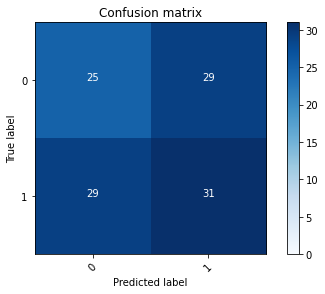

2022-08-22 16:17:52 - [Epoch Train: 47] loss: 0.3797, auc: 0.9236, acc: 0.8515, time: 24.00 s            
2022-08-22 16:17:52 - [Epoch Valid: 47] loss: 0.8723, auc: 0.4988, acc: 0.4793, time: 6.00 s


 47%|███████████████████▋                      | 47/100 [24:33<27:41, 31.35s/it]

2022-08-22 16:17:52 - EPOCH: 48
2022-08-22 16:17:52 - Train Step 10/485, train_loss: 0.3450
2022-08-22 16:17:53 - Train Step 20/485, train_loss: 0.2816
2022-08-22 16:17:53 - Train Step 30/485, train_loss: 0.2951
2022-08-22 16:17:54 - Train Step 40/485, train_loss: 0.3434
2022-08-22 16:17:54 - Train Step 50/485, train_loss: 0.4173
2022-08-22 16:17:55 - Train Step 60/485, train_loss: 0.4355
2022-08-22 16:17:55 - Train Step 70/485, train_loss: 0.4213
2022-08-22 16:17:56 - Train Step 80/485, train_loss: 0.4401
2022-08-22 16:17:56 - Train Step 90/485, train_loss: 0.4232
2022-08-22 16:17:57 - Train Step 100/485, train_loss: 0.4232
2022-08-22 16:17:57 - Train Step 110/485, train_loss: 0.4080
2022-08-22 16:17:58 - Train Step 120/485, train_loss: 0.3989
2022-08-22 16:17:58 - Train Step 130/485, train_loss: 0.3966
2022-08-22 16:17:59 - Train Step 140/485, train_loss: 0.3974
2022-08-22 16:17:59 - Train Step 150/485, train_loss: 0.3993
2022-08-22 16:18:00 - Train Step 160/485, train_loss: 0.3925
2

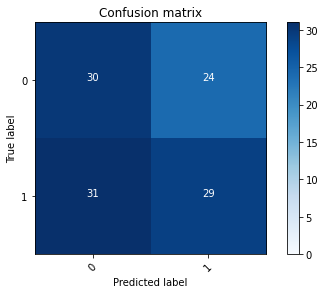

2022-08-22 16:18:23 - [Epoch Train: 48] loss: 0.3710, auc: 0.9273, acc: 0.8577, time: 24.00 s            
2022-08-22 16:18:23 - [Epoch Valid: 48] loss: 0.9066, auc: 0.4944, acc: 0.5289, time: 6.00 s


 48%|████████████████████▏                     | 48/100 [25:04<27:02, 31.21s/it]

2022-08-22 16:18:23 - EPOCH: 49
2022-08-22 16:18:23 - Train Step 10/485, train_loss: 0.2068
2022-08-22 16:18:24 - Train Step 20/485, train_loss: 0.2733
2022-08-22 16:18:24 - Train Step 30/485, train_loss: 0.2917
2022-08-22 16:18:25 - Train Step 40/485, train_loss: 0.3198
2022-08-22 16:18:25 - Train Step 50/485, train_loss: 0.3363
2022-08-22 16:18:26 - Train Step 60/485, train_loss: 0.3611
2022-08-22 16:18:26 - Train Step 70/485, train_loss: 0.3455
2022-08-22 16:18:27 - Train Step 80/485, train_loss: 0.3430
2022-08-22 16:18:27 - Train Step 90/485, train_loss: 0.3432
2022-08-22 16:18:28 - Train Step 100/485, train_loss: 0.3530
2022-08-22 16:18:28 - Train Step 110/485, train_loss: 0.3580
2022-08-22 16:18:29 - Train Step 120/485, train_loss: 0.3717
2022-08-22 16:18:29 - Train Step 130/485, train_loss: 0.3698
2022-08-22 16:18:30 - Train Step 140/485, train_loss: 0.3795
2022-08-22 16:18:30 - Train Step 150/485, train_loss: 0.3753
2022-08-22 16:18:31 - Train Step 160/485, train_loss: 0.3634
2

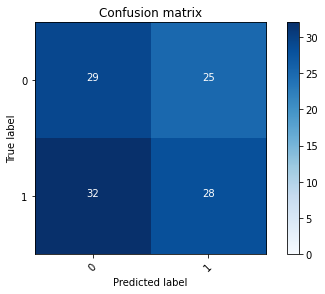

2022-08-22 16:18:54 - [Epoch Train: 49] loss: 0.3703, auc: 0.9251, acc: 0.8557, time: 24.00 s            
2022-08-22 16:18:54 - [Epoch Valid: 49] loss: 0.9147, auc: 0.4932, acc: 0.5041, time: 6.00 s


 49%|████████████████████▌                     | 49/100 [25:35<26:30, 31.19s/it]

2022-08-22 16:18:54 - EPOCH: 50
2022-08-22 16:18:54 - Train Step 10/485, train_loss: 0.4698
2022-08-22 16:18:55 - Train Step 20/485, train_loss: 0.4212
2022-08-22 16:18:55 - Train Step 30/485, train_loss: 0.3746
2022-08-22 16:18:56 - Train Step 40/485, train_loss: 0.3187
2022-08-22 16:18:56 - Train Step 50/485, train_loss: 0.3003
2022-08-22 16:18:57 - Train Step 60/485, train_loss: 0.3107
2022-08-22 16:18:57 - Train Step 70/485, train_loss: 0.3046
2022-08-22 16:18:58 - Train Step 80/485, train_loss: 0.3077
2022-08-22 16:18:58 - Train Step 90/485, train_loss: 0.3158
2022-08-22 16:18:59 - Train Step 100/485, train_loss: 0.3232
2022-08-22 16:18:59 - Train Step 110/485, train_loss: 0.3158
2022-08-22 16:19:00 - Train Step 120/485, train_loss: 0.3253
2022-08-22 16:19:00 - Train Step 130/485, train_loss: 0.3208
2022-08-22 16:19:01 - Train Step 140/485, train_loss: 0.3320
2022-08-22 16:19:01 - Train Step 150/485, train_loss: 0.3416
2022-08-22 16:19:02 - Train Step 160/485, train_loss: 0.3384
2

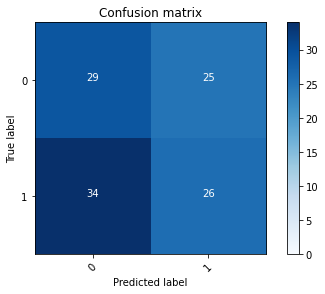

2022-08-22 16:19:25 - [Epoch Train: 50] loss: 0.3532, auc: 0.9347, acc: 0.8598, time: 24.00 s            
2022-08-22 16:19:25 - [Epoch Valid: 50] loss: 0.9173, auc: 0.4877, acc: 0.4876, time: 6.00 s


 50%|█████████████████████                     | 50/100 [26:06<25:55, 31.12s/it]

2022-08-22 16:19:25 - EPOCH: 51
2022-08-22 16:19:25 - Train Step 10/485, train_loss: 0.3773
2022-08-22 16:19:26 - Train Step 20/485, train_loss: 0.3853
2022-08-22 16:19:26 - Train Step 30/485, train_loss: 0.3977
2022-08-22 16:19:27 - Train Step 40/485, train_loss: 0.3802
2022-08-22 16:19:27 - Train Step 50/485, train_loss: 0.3800
2022-08-22 16:19:28 - Train Step 60/485, train_loss: 0.3606
2022-08-22 16:19:28 - Train Step 70/485, train_loss: 0.3573
2022-08-22 16:19:29 - Train Step 80/485, train_loss: 0.3571
2022-08-22 16:19:30 - Train Step 90/485, train_loss: 0.3670
2022-08-22 16:19:30 - Train Step 100/485, train_loss: 0.3829
2022-08-22 16:19:31 - Train Step 110/485, train_loss: 0.3736
2022-08-22 16:19:31 - Train Step 120/485, train_loss: 0.3754
2022-08-22 16:19:32 - Train Step 130/485, train_loss: 0.3634
2022-08-22 16:19:32 - Train Step 140/485, train_loss: 0.3511
2022-08-22 16:19:33 - Train Step 150/485, train_loss: 0.3613
2022-08-22 16:19:33 - Train Step 160/485, train_loss: 0.3494
2

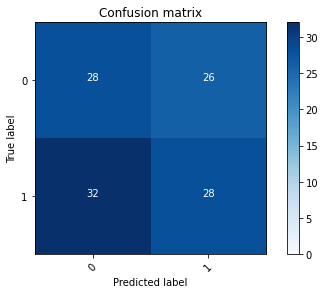

2022-08-22 16:19:56 - [Epoch Train: 51] loss: 0.3409, auc: 0.9437, acc: 0.8804, time: 24.00 s            
2022-08-22 16:19:56 - [Epoch Valid: 51] loss: 0.9488, auc: 0.4948, acc: 0.4959, time: 6.00 s


 51%|█████████████████████▍                    | 51/100 [26:37<25:27, 31.17s/it]

2022-08-22 16:19:56 - EPOCH: 52
2022-08-22 16:19:57 - Train Step 10/485, train_loss: 0.2044
2022-08-22 16:19:57 - Train Step 20/485, train_loss: 0.3474
2022-08-22 16:19:58 - Train Step 30/485, train_loss: 0.2933
2022-08-22 16:19:58 - Train Step 40/485, train_loss: 0.2508
2022-08-22 16:19:59 - Train Step 50/485, train_loss: 0.2498
2022-08-22 16:19:59 - Train Step 60/485, train_loss: 0.2681
2022-08-22 16:20:00 - Train Step 70/485, train_loss: 0.3020
2022-08-22 16:20:00 - Train Step 80/485, train_loss: 0.3140
2022-08-22 16:20:01 - Train Step 90/485, train_loss: 0.3299
2022-08-22 16:20:01 - Train Step 100/485, train_loss: 0.3159
2022-08-22 16:20:02 - Train Step 110/485, train_loss: 0.3317
2022-08-22 16:20:02 - Train Step 120/485, train_loss: 0.3393
2022-08-22 16:20:03 - Train Step 130/485, train_loss: 0.3468
2022-08-22 16:20:03 - Train Step 140/485, train_loss: 0.3497
2022-08-22 16:20:04 - Train Step 150/485, train_loss: 0.3474
2022-08-22 16:20:04 - Train Step 160/485, train_loss: 0.3453
2

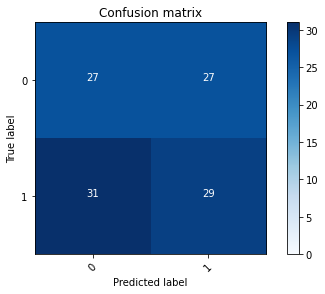

2022-08-22 16:20:27 - [Epoch Train: 52] loss: 0.3398, auc: 0.9411, acc: 0.8722, time: 24.00 s            
2022-08-22 16:20:27 - [Epoch Valid: 52] loss: 0.9503, auc: 0.4997, acc: 0.4876, time: 6.00 s


 52%|█████████████████████▊                    | 52/100 [27:08<24:56, 31.17s/it]

2022-08-22 16:20:27 - EPOCH: 53
2022-08-22 16:20:28 - Train Step 10/485, train_loss: 0.5467
2022-08-22 16:20:28 - Train Step 20/485, train_loss: 0.4969
2022-08-22 16:20:29 - Train Step 30/485, train_loss: 0.4134
2022-08-22 16:20:29 - Train Step 40/485, train_loss: 0.3839
2022-08-22 16:20:30 - Train Step 50/485, train_loss: 0.3845
2022-08-22 16:20:30 - Train Step 60/485, train_loss: 0.3599
2022-08-22 16:20:31 - Train Step 70/485, train_loss: 0.3573
2022-08-22 16:20:31 - Train Step 80/485, train_loss: 0.3652
2022-08-22 16:20:32 - Train Step 90/485, train_loss: 0.3694
2022-08-22 16:20:32 - Train Step 100/485, train_loss: 0.3492
2022-08-22 16:20:33 - Train Step 110/485, train_loss: 0.3383
2022-08-22 16:20:33 - Train Step 120/485, train_loss: 0.3301
2022-08-22 16:20:34 - Train Step 130/485, train_loss: 0.3223
2022-08-22 16:20:34 - Train Step 140/485, train_loss: 0.3208
2022-08-22 16:20:35 - Train Step 150/485, train_loss: 0.3143
2022-08-22 16:20:35 - Train Step 160/485, train_loss: 0.3091
2

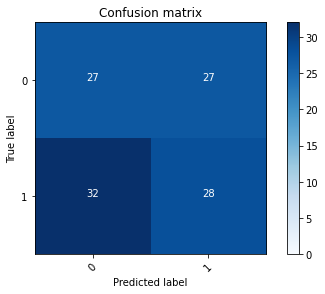

2022-08-22 16:20:58 - [Epoch Train: 53] loss: 0.3277, auc: 0.9427, acc: 0.8784, time: 24.00 s            
2022-08-22 16:20:58 - [Epoch Valid: 53] loss: 0.9357, auc: 0.4895, acc: 0.4793, time: 6.00 s


 53%|██████████████████████▎                   | 53/100 [27:39<24:23, 31.13s/it]

2022-08-22 16:20:58 - EPOCH: 54
2022-08-22 16:20:59 - Train Step 10/485, train_loss: 0.2839
2022-08-22 16:20:59 - Train Step 20/485, train_loss: 0.2920
2022-08-22 16:21:00 - Train Step 30/485, train_loss: 0.3869
2022-08-22 16:21:01 - Train Step 40/485, train_loss: 0.3502
2022-08-22 16:21:01 - Train Step 50/485, train_loss: 0.3314
2022-08-22 16:21:02 - Train Step 60/485, train_loss: 0.3211
2022-08-22 16:21:02 - Train Step 70/485, train_loss: 0.3392
2022-08-22 16:21:03 - Train Step 80/485, train_loss: 0.3214
2022-08-22 16:21:03 - Train Step 90/485, train_loss: 0.3211
2022-08-22 16:21:04 - Train Step 100/485, train_loss: 0.3296
2022-08-22 16:21:04 - Train Step 110/485, train_loss: 0.3209
2022-08-22 16:21:04 - Train Step 120/485, train_loss: 0.3459
2022-08-22 16:21:05 - Train Step 130/485, train_loss: 0.3400
2022-08-22 16:21:05 - Train Step 140/485, train_loss: 0.3440
2022-08-22 16:21:06 - Train Step 150/485, train_loss: 0.3426
2022-08-22 16:21:06 - Train Step 160/485, train_loss: 0.3414
2

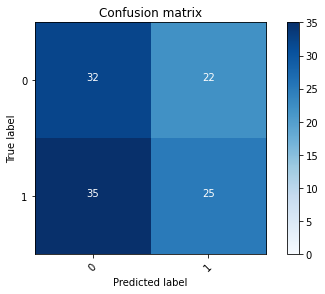

2022-08-22 16:21:30 - [Epoch Train: 54] loss: 0.3182, auc: 0.9530, acc: 0.9052, time: 25.00 s            
2022-08-22 16:21:30 - [Epoch Valid: 54] loss: 0.9519, auc: 0.4809, acc: 0.5124, time: 6.00 s


 54%|██████████████████████▋                   | 54/100 [28:11<24:00, 31.31s/it]

2022-08-22 16:21:30 - EPOCH: 55
2022-08-22 16:21:31 - Train Step 10/485, train_loss: 0.3753
2022-08-22 16:21:31 - Train Step 20/485, train_loss: 0.3501
2022-08-22 16:21:32 - Train Step 30/485, train_loss: 0.3760
2022-08-22 16:21:32 - Train Step 40/485, train_loss: 0.3673
2022-08-22 16:21:33 - Train Step 50/485, train_loss: 0.4116
2022-08-22 16:21:33 - Train Step 60/485, train_loss: 0.3993
2022-08-22 16:21:34 - Train Step 70/485, train_loss: 0.4098
2022-08-22 16:21:34 - Train Step 80/485, train_loss: 0.3991
2022-08-22 16:21:35 - Train Step 90/485, train_loss: 0.3809
2022-08-22 16:21:35 - Train Step 100/485, train_loss: 0.3754
2022-08-22 16:21:36 - Train Step 110/485, train_loss: 0.3855
2022-08-22 16:21:36 - Train Step 120/485, train_loss: 0.3748
2022-08-22 16:21:37 - Train Step 130/485, train_loss: 0.3566
2022-08-22 16:21:37 - Train Step 140/485, train_loss: 0.3497
2022-08-22 16:21:38 - Train Step 150/485, train_loss: 0.3506
2022-08-22 16:21:38 - Train Step 160/485, train_loss: 0.3497
2

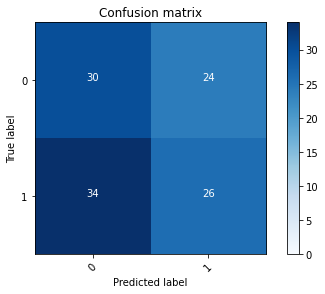

2022-08-22 16:22:01 - [Epoch Train: 55] loss: 0.3147, auc: 0.9517, acc: 0.8845, time: 24.00 s            
2022-08-22 16:22:01 - [Epoch Valid: 55] loss: 0.9884, auc: 0.4812, acc: 0.4959, time: 6.00 s


 55%|███████████████████████                   | 55/100 [28:43<23:30, 31.35s/it]

2022-08-22 16:22:01 - EPOCH: 56
2022-08-22 16:22:02 - Train Step 10/485, train_loss: 0.3904
2022-08-22 16:22:03 - Train Step 20/485, train_loss: 0.3593
2022-08-22 16:22:03 - Train Step 30/485, train_loss: 0.3268
2022-08-22 16:22:04 - Train Step 40/485, train_loss: 0.3009
2022-08-22 16:22:04 - Train Step 50/485, train_loss: 0.2731
2022-08-22 16:22:05 - Train Step 60/485, train_loss: 0.2479
2022-08-22 16:22:05 - Train Step 70/485, train_loss: 0.2512
2022-08-22 16:22:06 - Train Step 80/485, train_loss: 0.2817
2022-08-22 16:22:06 - Train Step 90/485, train_loss: 0.2805
2022-08-22 16:22:07 - Train Step 100/485, train_loss: 0.2860
2022-08-22 16:22:07 - Train Step 110/485, train_loss: 0.2891
2022-08-22 16:22:08 - Train Step 120/485, train_loss: 0.3004
2022-08-22 16:22:08 - Train Step 130/485, train_loss: 0.3032
2022-08-22 16:22:09 - Train Step 140/485, train_loss: 0.2942
2022-08-22 16:22:09 - Train Step 150/485, train_loss: 0.2939
2022-08-22 16:22:10 - Train Step 160/485, train_loss: 0.2970
2

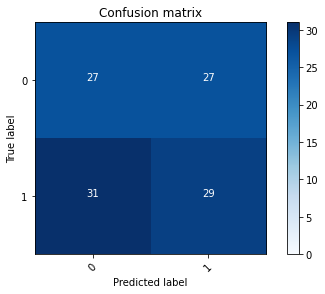

2022-08-22 16:22:33 - [Epoch Train: 56] loss: 0.3186, auc: 0.9482, acc: 0.8825, time: 24.00 s            
2022-08-22 16:22:33 - [Epoch Valid: 56] loss: 0.9462, auc: 0.4864, acc: 0.4876, time: 6.00 s


 56%|███████████████████████▌                  | 56/100 [29:14<22:57, 31.31s/it]

2022-08-22 16:22:33 - EPOCH: 57
2022-08-22 16:22:33 - Train Step 10/485, train_loss: 0.4222
2022-08-22 16:22:34 - Train Step 20/485, train_loss: 0.3230
2022-08-22 16:22:34 - Train Step 30/485, train_loss: 0.2966
2022-08-22 16:22:35 - Train Step 40/485, train_loss: 0.2815
2022-08-22 16:22:35 - Train Step 50/485, train_loss: 0.2549
2022-08-22 16:22:36 - Train Step 60/485, train_loss: 0.2650
2022-08-22 16:22:36 - Train Step 70/485, train_loss: 0.2886
2022-08-22 16:22:37 - Train Step 80/485, train_loss: 0.2945
2022-08-22 16:22:37 - Train Step 90/485, train_loss: 0.3211
2022-08-22 16:22:38 - Train Step 100/485, train_loss: 0.3403
2022-08-22 16:22:38 - Train Step 110/485, train_loss: 0.3470
2022-08-22 16:22:39 - Train Step 120/485, train_loss: 0.3440
2022-08-22 16:22:39 - Train Step 130/485, train_loss: 0.3375
2022-08-22 16:22:40 - Train Step 140/485, train_loss: 0.3340
2022-08-22 16:22:40 - Train Step 150/485, train_loss: 0.3236
2022-08-22 16:22:41 - Train Step 160/485, train_loss: 0.3142
2

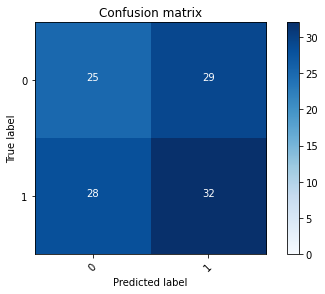

2022-08-22 16:23:04 - [Epoch Train: 57] loss: 0.3163, auc: 0.9495, acc: 0.8907, time: 25.00 s            
2022-08-22 16:23:04 - [Epoch Valid: 57] loss: 1.0002, auc: 0.4969, acc: 0.4876, time: 6.00 s


 57%|███████████████████████▉                  | 57/100 [29:45<22:27, 31.35s/it]

2022-08-22 16:23:04 - EPOCH: 58
2022-08-22 16:23:05 - Train Step 10/485, train_loss: 0.3205
2022-08-22 16:23:05 - Train Step 20/485, train_loss: 0.2756
2022-08-22 16:23:06 - Train Step 30/485, train_loss: 0.2417
2022-08-22 16:23:06 - Train Step 40/485, train_loss: 0.2217
2022-08-22 16:23:07 - Train Step 50/485, train_loss: 0.2274
2022-08-22 16:23:07 - Train Step 60/485, train_loss: 0.2238
2022-08-22 16:23:08 - Train Step 70/485, train_loss: 0.2479
2022-08-22 16:23:08 - Train Step 80/485, train_loss: 0.2625
2022-08-22 16:23:09 - Train Step 90/485, train_loss: 0.2644
2022-08-22 16:23:09 - Train Step 100/485, train_loss: 0.2573
2022-08-22 16:23:10 - Train Step 110/485, train_loss: 0.2583
2022-08-22 16:23:10 - Train Step 120/485, train_loss: 0.2539
2022-08-22 16:23:11 - Train Step 130/485, train_loss: 0.2589
2022-08-22 16:23:11 - Train Step 140/485, train_loss: 0.2532
2022-08-22 16:23:12 - Train Step 150/485, train_loss: 0.2586
2022-08-22 16:23:12 - Train Step 160/485, train_loss: 0.2525
2

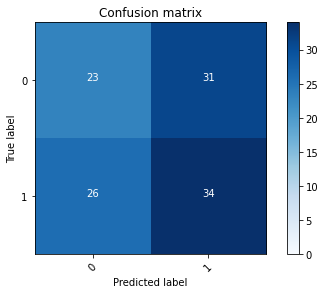

2022-08-22 16:23:36 - [Epoch Train: 58] loss: 0.2884, auc: 0.9607, acc: 0.9010, time: 25.00 s            
2022-08-22 16:23:36 - [Epoch Valid: 58] loss: 0.9893, auc: 0.4895, acc: 0.4876, time: 6.00 s


 58%|████████████████████████▎                 | 58/100 [30:17<21:59, 31.42s/it]

2022-08-22 16:23:36 - EPOCH: 59
2022-08-22 16:23:36 - Train Step 10/485, train_loss: 0.1563
2022-08-22 16:23:37 - Train Step 20/485, train_loss: 0.1913
2022-08-22 16:23:37 - Train Step 30/485, train_loss: 0.2003
2022-08-22 16:23:38 - Train Step 40/485, train_loss: 0.2597
2022-08-22 16:23:38 - Train Step 50/485, train_loss: 0.2621
2022-08-22 16:23:39 - Train Step 60/485, train_loss: 0.2796
2022-08-22 16:23:39 - Train Step 70/485, train_loss: 0.2538
2022-08-22 16:23:40 - Train Step 80/485, train_loss: 0.2570
2022-08-22 16:23:40 - Train Step 90/485, train_loss: 0.2442
2022-08-22 16:23:41 - Train Step 100/485, train_loss: 0.2395
2022-08-22 16:23:41 - Train Step 110/485, train_loss: 0.2549
2022-08-22 16:23:42 - Train Step 120/485, train_loss: 0.2586
2022-08-22 16:23:42 - Train Step 130/485, train_loss: 0.2625
2022-08-22 16:23:43 - Train Step 140/485, train_loss: 0.2759
2022-08-22 16:23:43 - Train Step 150/485, train_loss: 0.2816
2022-08-22 16:23:44 - Train Step 160/485, train_loss: 0.2793
2

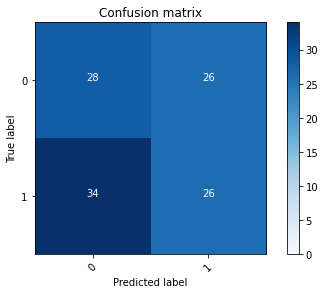

2022-08-22 16:24:07 - [Epoch Train: 59] loss: 0.2854, auc: 0.9622, acc: 0.9216, time: 24.00 s            
2022-08-22 16:24:07 - [Epoch Valid: 59] loss: 1.0686, auc: 0.4738, acc: 0.4793, time: 6.00 s


 59%|████████████████████████▊                 | 59/100 [30:48<21:27, 31.40s/it]

2022-08-22 16:24:07 - EPOCH: 60
2022-08-22 16:24:08 - Train Step 10/485, train_loss: 0.6208
2022-08-22 16:24:08 - Train Step 20/485, train_loss: 0.3963
2022-08-22 16:24:09 - Train Step 30/485, train_loss: 0.3394
2022-08-22 16:24:09 - Train Step 40/485, train_loss: 0.3055
2022-08-22 16:24:10 - Train Step 50/485, train_loss: 0.3267
2022-08-22 16:24:10 - Train Step 60/485, train_loss: 0.3121
2022-08-22 16:24:11 - Train Step 70/485, train_loss: 0.2987
2022-08-22 16:24:11 - Train Step 80/485, train_loss: 0.2887
2022-08-22 16:24:12 - Train Step 90/485, train_loss: 0.2881
2022-08-22 16:24:12 - Train Step 100/485, train_loss: 0.2768
2022-08-22 16:24:13 - Train Step 110/485, train_loss: 0.2880
2022-08-22 16:24:13 - Train Step 120/485, train_loss: 0.2905
2022-08-22 16:24:14 - Train Step 130/485, train_loss: 0.2873
2022-08-22 16:24:14 - Train Step 140/485, train_loss: 0.2802
2022-08-22 16:24:15 - Train Step 150/485, train_loss: 0.2830
2022-08-22 16:24:15 - Train Step 160/485, train_loss: 0.2809
2

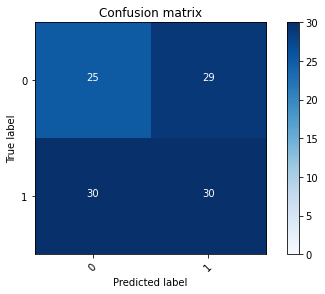

2022-08-22 16:24:38 - [Epoch Train: 60] loss: 0.2715, auc: 0.9636, acc: 0.8990, time: 24.00 s            
2022-08-22 16:24:38 - [Epoch Valid: 60] loss: 1.0008, auc: 0.4858, acc: 0.4711, time: 6.00 s


 60%|█████████████████████████▏                | 60/100 [31:20<20:57, 31.43s/it]

2022-08-22 16:24:38 - EPOCH: 61
2022-08-22 16:24:39 - Train Step 10/485, train_loss: 0.2178
2022-08-22 16:24:40 - Train Step 20/485, train_loss: 0.2004
2022-08-22 16:24:40 - Train Step 30/485, train_loss: 0.2279
2022-08-22 16:24:41 - Train Step 40/485, train_loss: 0.2231
2022-08-22 16:24:41 - Train Step 50/485, train_loss: 0.2000
2022-08-22 16:24:42 - Train Step 60/485, train_loss: 0.2260
2022-08-22 16:24:42 - Train Step 70/485, train_loss: 0.2193
2022-08-22 16:24:43 - Train Step 80/485, train_loss: 0.2129
2022-08-22 16:24:43 - Train Step 90/485, train_loss: 0.2051
2022-08-22 16:24:44 - Train Step 100/485, train_loss: 0.2030
2022-08-22 16:24:44 - Train Step 110/485, train_loss: 0.2129
2022-08-22 16:24:45 - Train Step 120/485, train_loss: 0.2045
2022-08-22 16:24:45 - Train Step 130/485, train_loss: 0.2093
2022-08-22 16:24:46 - Train Step 140/485, train_loss: 0.2137
2022-08-22 16:24:46 - Train Step 150/485, train_loss: 0.2180
2022-08-22 16:24:47 - Train Step 160/485, train_loss: 0.2214
2

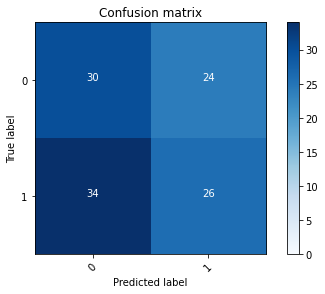

2022-08-22 16:25:10 - [Epoch Train: 61] loss: 0.2667, auc: 0.9675, acc: 0.8866, time: 24.00 s            
2022-08-22 16:25:10 - [Epoch Valid: 61] loss: 1.1193, auc: 0.4787, acc: 0.4959, time: 6.00 s


 61%|█████████████████████████▌                | 61/100 [31:51<20:24, 31.40s/it]

2022-08-22 16:25:10 - EPOCH: 62
2022-08-22 16:25:10 - Train Step 10/485, train_loss: 0.3283
2022-08-22 16:25:11 - Train Step 20/485, train_loss: 0.2169
2022-08-22 16:25:11 - Train Step 30/485, train_loss: 0.3273
2022-08-22 16:25:12 - Train Step 40/485, train_loss: 0.3583
2022-08-22 16:25:12 - Train Step 50/485, train_loss: 0.3369
2022-08-22 16:25:13 - Train Step 60/485, train_loss: 0.3171
2022-08-22 16:25:14 - Train Step 70/485, train_loss: 0.3262
2022-08-22 16:25:14 - Train Step 80/485, train_loss: 0.3122
2022-08-22 16:25:15 - Train Step 90/485, train_loss: 0.2976
2022-08-22 16:25:15 - Train Step 100/485, train_loss: 0.3068
2022-08-22 16:25:15 - Train Step 110/485, train_loss: 0.2982
2022-08-22 16:25:16 - Train Step 120/485, train_loss: 0.2942
2022-08-22 16:25:16 - Train Step 130/485, train_loss: 0.2875
2022-08-22 16:25:17 - Train Step 140/485, train_loss: 0.2825
2022-08-22 16:25:17 - Train Step 150/485, train_loss: 0.2999
2022-08-22 16:25:18 - Train Step 160/485, train_loss: 0.2925
2

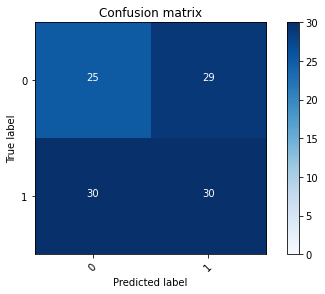

2022-08-22 16:25:41 - [Epoch Train: 62] loss: 0.2663, auc: 0.9681, acc: 0.9093, time: 24.00 s            
2022-08-22 16:25:41 - [Epoch Valid: 62] loss: 1.0687, auc: 0.4775, acc: 0.4711, time: 6.00 s


 62%|██████████████████████████                | 62/100 [32:22<19:50, 31.34s/it]

2022-08-22 16:25:41 - EPOCH: 63
2022-08-22 16:25:42 - Train Step 10/485, train_loss: 0.3565
2022-08-22 16:25:42 - Train Step 20/485, train_loss: 0.3359
2022-08-22 16:25:43 - Train Step 30/485, train_loss: 0.2819
2022-08-22 16:25:43 - Train Step 40/485, train_loss: 0.3043
2022-08-22 16:25:44 - Train Step 50/485, train_loss: 0.3438
2022-08-22 16:25:44 - Train Step 60/485, train_loss: 0.3179
2022-08-22 16:25:45 - Train Step 70/485, train_loss: 0.3306
2022-08-22 16:25:45 - Train Step 80/485, train_loss: 0.3339
2022-08-22 16:25:46 - Train Step 90/485, train_loss: 0.3194
2022-08-22 16:25:46 - Train Step 100/485, train_loss: 0.3161
2022-08-22 16:25:47 - Train Step 110/485, train_loss: 0.3095
2022-08-22 16:25:47 - Train Step 120/485, train_loss: 0.2946
2022-08-22 16:25:48 - Train Step 130/485, train_loss: 0.2848
2022-08-22 16:25:48 - Train Step 140/485, train_loss: 0.2916
2022-08-22 16:25:49 - Train Step 150/485, train_loss: 0.2885
2022-08-22 16:25:49 - Train Step 160/485, train_loss: 0.2774
2

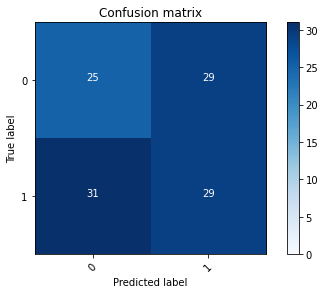

2022-08-22 16:26:12 - [Epoch Train: 63] loss: 0.2598, auc: 0.9702, acc: 0.9072, time: 24.00 s            
2022-08-22 16:26:12 - [Epoch Valid: 63] loss: 1.0952, auc: 0.4738, acc: 0.4628, time: 6.00 s


 63%|██████████████████████████▍               | 63/100 [32:53<19:17, 31.29s/it]

2022-08-22 16:26:12 - EPOCH: 64
2022-08-22 16:26:13 - Train Step 10/485, train_loss: 0.3413
2022-08-22 16:26:13 - Train Step 20/485, train_loss: 0.2739
2022-08-22 16:26:14 - Train Step 30/485, train_loss: 0.2026
2022-08-22 16:26:14 - Train Step 40/485, train_loss: 0.2305
2022-08-22 16:26:15 - Train Step 50/485, train_loss: 0.2437
2022-08-22 16:26:15 - Train Step 60/485, train_loss: 0.2582
2022-08-22 16:26:16 - Train Step 70/485, train_loss: 0.2469
2022-08-22 16:26:16 - Train Step 80/485, train_loss: 0.2345
2022-08-22 16:26:17 - Train Step 90/485, train_loss: 0.2330
2022-08-22 16:26:17 - Train Step 100/485, train_loss: 0.2339
2022-08-22 16:26:18 - Train Step 110/485, train_loss: 0.2308
2022-08-22 16:26:18 - Train Step 120/485, train_loss: 0.2330
2022-08-22 16:26:19 - Train Step 130/485, train_loss: 0.2257
2022-08-22 16:26:19 - Train Step 140/485, train_loss: 0.2214
2022-08-22 16:26:20 - Train Step 150/485, train_loss: 0.2110
2022-08-22 16:26:20 - Train Step 160/485, train_loss: 0.2034
2

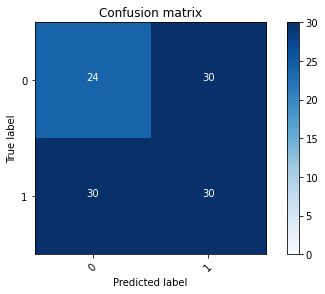

2022-08-22 16:26:44 - [Epoch Train: 64] loss: 0.2447, auc: 0.9732, acc: 0.9216, time: 25.00 s            
2022-08-22 16:26:44 - [Epoch Valid: 64] loss: 1.1594, auc: 0.4812, acc: 0.4628, time: 6.00 s


 64%|██████████████████████████▉               | 64/100 [33:25<18:49, 31.37s/it]

2022-08-22 16:26:44 - EPOCH: 65
2022-08-22 16:26:44 - Train Step 10/485, train_loss: 0.1783
2022-08-22 16:26:45 - Train Step 20/485, train_loss: 0.2373
2022-08-22 16:26:45 - Train Step 30/485, train_loss: 0.2783
2022-08-22 16:26:46 - Train Step 40/485, train_loss: 0.2350
2022-08-22 16:26:46 - Train Step 50/485, train_loss: 0.2251
2022-08-22 16:26:47 - Train Step 60/485, train_loss: 0.2096
2022-08-22 16:26:47 - Train Step 70/485, train_loss: 0.2123
2022-08-22 16:26:48 - Train Step 80/485, train_loss: 0.2210
2022-08-22 16:26:48 - Train Step 90/485, train_loss: 0.2551
2022-08-22 16:26:49 - Train Step 100/485, train_loss: 0.2672
2022-08-22 16:26:49 - Train Step 110/485, train_loss: 0.2663
2022-08-22 16:26:50 - Train Step 120/485, train_loss: 0.2665
2022-08-22 16:26:50 - Train Step 130/485, train_loss: 0.2651
2022-08-22 16:26:51 - Train Step 140/485, train_loss: 0.2560
2022-08-22 16:26:51 - Train Step 150/485, train_loss: 0.2609
2022-08-22 16:26:52 - Train Step 160/485, train_loss: 0.2541
2

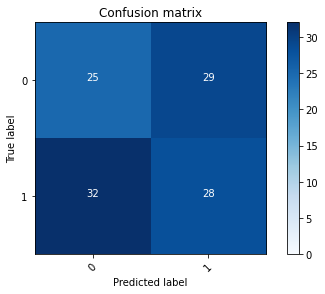

2022-08-22 16:27:15 - [Epoch Train: 65] loss: 0.2430, auc: 0.9740, acc: 0.9196, time: 24.00 s            
2022-08-22 16:27:15 - [Epoch Valid: 65] loss: 1.1980, auc: 0.4744, acc: 0.4545, time: 6.00 s


 65%|███████████████████████████▎              | 65/100 [33:56<18:18, 31.37s/it]

2022-08-22 16:27:15 - EPOCH: 66
2022-08-22 16:27:16 - Train Step 10/485, train_loss: 0.1676
2022-08-22 16:27:16 - Train Step 20/485, train_loss: 0.2206
2022-08-22 16:27:17 - Train Step 30/485, train_loss: 0.2010
2022-08-22 16:27:17 - Train Step 40/485, train_loss: 0.2213
2022-08-22 16:27:18 - Train Step 50/485, train_loss: 0.2332
2022-08-22 16:27:18 - Train Step 60/485, train_loss: 0.2252
2022-08-22 16:27:19 - Train Step 70/485, train_loss: 0.2171
2022-08-22 16:27:19 - Train Step 80/485, train_loss: 0.2212
2022-08-22 16:27:20 - Train Step 90/485, train_loss: 0.2146
2022-08-22 16:27:20 - Train Step 100/485, train_loss: 0.2073
2022-08-22 16:27:21 - Train Step 110/485, train_loss: 0.2229
2022-08-22 16:27:21 - Train Step 120/485, train_loss: 0.2253
2022-08-22 16:27:22 - Train Step 130/485, train_loss: 0.2209
2022-08-22 16:27:22 - Train Step 140/485, train_loss: 0.2167
2022-08-22 16:27:23 - Train Step 150/485, train_loss: 0.2087
2022-08-22 16:27:23 - Train Step 160/485, train_loss: 0.2069
2

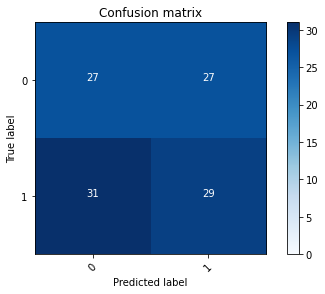

2022-08-22 16:27:46 - [Epoch Train: 66] loss: 0.2172, auc: 0.9837, acc: 0.9381, time: 25.00 s            
2022-08-22 16:27:46 - [Epoch Valid: 66] loss: 1.1256, auc: 0.4769, acc: 0.4876, time: 6.00 s


 66%|███████████████████████████▋              | 66/100 [34:28<17:46, 31.37s/it]

2022-08-22 16:27:46 - EPOCH: 67
2022-08-22 16:27:47 - Train Step 10/485, train_loss: 0.1837
2022-08-22 16:27:48 - Train Step 20/485, train_loss: 0.1812
2022-08-22 16:27:48 - Train Step 30/485, train_loss: 0.1709
2022-08-22 16:27:49 - Train Step 40/485, train_loss: 0.1679
2022-08-22 16:27:49 - Train Step 50/485, train_loss: 0.1687
2022-08-22 16:27:50 - Train Step 60/485, train_loss: 0.1916
2022-08-22 16:27:50 - Train Step 70/485, train_loss: 0.2261
2022-08-22 16:27:51 - Train Step 80/485, train_loss: 0.2266
2022-08-22 16:27:51 - Train Step 90/485, train_loss: 0.2241
2022-08-22 16:27:52 - Train Step 100/485, train_loss: 0.2288
2022-08-22 16:27:52 - Train Step 110/485, train_loss: 0.2287
2022-08-22 16:27:53 - Train Step 120/485, train_loss: 0.2366
2022-08-22 16:27:53 - Train Step 130/485, train_loss: 0.2307
2022-08-22 16:27:54 - Train Step 140/485, train_loss: 0.2265
2022-08-22 16:27:54 - Train Step 150/485, train_loss: 0.2301
2022-08-22 16:27:55 - Train Step 160/485, train_loss: 0.2262
2

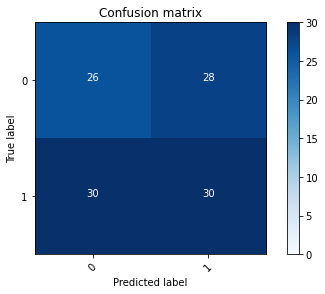

2022-08-22 16:28:18 - [Epoch Train: 67] loss: 0.2232, auc: 0.9800, acc: 0.9320, time: 24.00 s            
2022-08-22 16:28:18 - [Epoch Valid: 67] loss: 1.1342, auc: 0.4827, acc: 0.4876, time: 6.00 s


 67%|████████████████████████████▏             | 67/100 [34:59<17:13, 31.31s/it]

2022-08-22 16:28:18 - EPOCH: 68
2022-08-22 16:28:18 - Train Step 10/485, train_loss: 0.1458
2022-08-22 16:28:19 - Train Step 20/485, train_loss: 0.1681
2022-08-22 16:28:19 - Train Step 30/485, train_loss: 0.1940
2022-08-22 16:28:20 - Train Step 40/485, train_loss: 0.1851
2022-08-22 16:28:20 - Train Step 50/485, train_loss: 0.1752
2022-08-22 16:28:21 - Train Step 60/485, train_loss: 0.1859
2022-08-22 16:28:21 - Train Step 70/485, train_loss: 0.2438
2022-08-22 16:28:22 - Train Step 80/485, train_loss: 0.2250
2022-08-22 16:28:22 - Train Step 90/485, train_loss: 0.2255
2022-08-22 16:28:23 - Train Step 100/485, train_loss: 0.2291
2022-08-22 16:28:23 - Train Step 110/485, train_loss: 0.2253
2022-08-22 16:28:24 - Train Step 120/485, train_loss: 0.2296
2022-08-22 16:28:24 - Train Step 130/485, train_loss: 0.2242
2022-08-22 16:28:25 - Train Step 140/485, train_loss: 0.2224
2022-08-22 16:28:25 - Train Step 150/485, train_loss: 0.2218
2022-08-22 16:28:26 - Train Step 160/485, train_loss: 0.2229
2

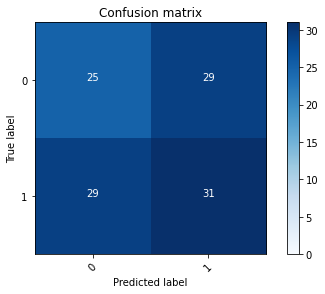

2022-08-22 16:28:49 - [Epoch Train: 68] loss: 0.2179, auc: 0.9793, acc: 0.9340, time: 24.00 s            
2022-08-22 16:28:49 - [Epoch Valid: 68] loss: 1.1398, auc: 0.4858, acc: 0.4793, time: 6.00 s


 68%|████████████████████████████▌             | 68/100 [35:30<16:38, 31.21s/it]

2022-08-22 16:28:49 - EPOCH: 69
2022-08-22 16:28:49 - Train Step 10/485, train_loss: 0.1510
2022-08-22 16:28:50 - Train Step 20/485, train_loss: 0.1375
2022-08-22 16:28:50 - Train Step 30/485, train_loss: 0.1366
2022-08-22 16:28:51 - Train Step 40/485, train_loss: 0.1338
2022-08-22 16:28:51 - Train Step 50/485, train_loss: 0.1417
2022-08-22 16:28:52 - Train Step 60/485, train_loss: 0.1696
2022-08-22 16:28:52 - Train Step 70/485, train_loss: 0.1748
2022-08-22 16:28:53 - Train Step 80/485, train_loss: 0.1680
2022-08-22 16:28:53 - Train Step 90/485, train_loss: 0.1801
2022-08-22 16:28:54 - Train Step 100/485, train_loss: 0.1887
2022-08-22 16:28:54 - Train Step 110/485, train_loss: 0.1877
2022-08-22 16:28:55 - Train Step 120/485, train_loss: 0.2134
2022-08-22 16:28:55 - Train Step 130/485, train_loss: 0.2113
2022-08-22 16:28:56 - Train Step 140/485, train_loss: 0.2102
2022-08-22 16:28:56 - Train Step 150/485, train_loss: 0.2046
2022-08-22 16:28:57 - Train Step 160/485, train_loss: 0.1984
2

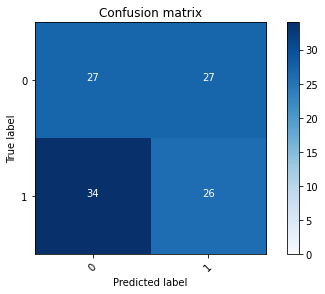

2022-08-22 16:29:20 - [Epoch Train: 69] loss: 0.2113, auc: 0.9822, acc: 0.9299, time: 24.00 s            
2022-08-22 16:29:20 - [Epoch Valid: 69] loss: 1.2344, auc: 0.4664, acc: 0.4628, time: 6.00 s


 69%|████████████████████████████▉             | 69/100 [36:01<16:05, 31.14s/it]

2022-08-22 16:29:20 - EPOCH: 70
2022-08-22 16:29:20 - Train Step 10/485, train_loss: 0.0934
2022-08-22 16:29:21 - Train Step 20/485, train_loss: 0.0981
2022-08-22 16:29:21 - Train Step 30/485, train_loss: 0.1001
2022-08-22 16:29:22 - Train Step 40/485, train_loss: 0.1006
2022-08-22 16:29:22 - Train Step 50/485, train_loss: 0.1183
2022-08-22 16:29:23 - Train Step 60/485, train_loss: 0.1373
2022-08-22 16:29:23 - Train Step 70/485, train_loss: 0.1383
2022-08-22 16:29:24 - Train Step 80/485, train_loss: 0.1468
2022-08-22 16:29:24 - Train Step 90/485, train_loss: 0.1455
2022-08-22 16:29:25 - Train Step 100/485, train_loss: 0.1461
2022-08-22 16:29:25 - Train Step 110/485, train_loss: 0.1464
2022-08-22 16:29:26 - Train Step 120/485, train_loss: 0.1582
2022-08-22 16:29:26 - Train Step 130/485, train_loss: 0.1509
2022-08-22 16:29:27 - Train Step 140/485, train_loss: 0.1529
2022-08-22 16:29:27 - Train Step 150/485, train_loss: 0.1514
2022-08-22 16:29:28 - Train Step 160/485, train_loss: 0.1620
2

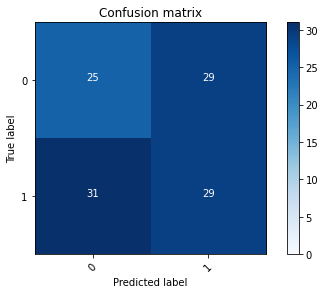

2022-08-22 16:29:51 - [Epoch Train: 70] loss: 0.1820, auc: 0.9891, acc: 0.9402, time: 25.00 s            
2022-08-22 16:29:51 - [Epoch Valid: 70] loss: 1.2284, auc: 0.4818, acc: 0.4628, time: 6.00 s


 70%|█████████████████████████████▍            | 70/100 [36:32<15:37, 31.24s/it]

2022-08-22 16:29:51 - EPOCH: 71
2022-08-22 16:29:52 - Train Step 10/485, train_loss: 0.1585
2022-08-22 16:29:52 - Train Step 20/485, train_loss: 0.1239
2022-08-22 16:29:53 - Train Step 30/485, train_loss: 0.1149
2022-08-22 16:29:53 - Train Step 40/485, train_loss: 0.1263
2022-08-22 16:29:54 - Train Step 50/485, train_loss: 0.1173
2022-08-22 16:29:54 - Train Step 60/485, train_loss: 0.1254
2022-08-22 16:29:55 - Train Step 70/485, train_loss: 0.1317
2022-08-22 16:29:55 - Train Step 80/485, train_loss: 0.1474
2022-08-22 16:29:56 - Train Step 90/485, train_loss: 0.1451
2022-08-22 16:29:56 - Train Step 100/485, train_loss: 0.1568
2022-08-22 16:29:57 - Train Step 110/485, train_loss: 0.1637
2022-08-22 16:29:57 - Train Step 120/485, train_loss: 0.1765
2022-08-22 16:29:58 - Train Step 130/485, train_loss: 0.1793
2022-08-22 16:29:58 - Train Step 140/485, train_loss: 0.1812
2022-08-22 16:29:59 - Train Step 150/485, train_loss: 0.1880
2022-08-22 16:29:59 - Train Step 160/485, train_loss: 0.1840
2

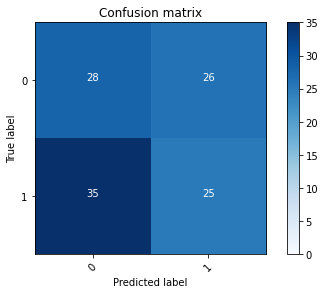

2022-08-22 16:30:22 - [Epoch Train: 71] loss: 0.1873, auc: 0.9839, acc: 0.9464, time: 24.00 s            
2022-08-22 16:30:22 - [Epoch Valid: 71] loss: 1.2809, auc: 0.4707, acc: 0.4628, time: 6.00 s


 71%|█████████████████████████████▊            | 71/100 [37:04<15:07, 31.28s/it]

2022-08-22 16:30:22 - EPOCH: 72
2022-08-22 16:30:23 - Train Step 10/485, train_loss: 0.4029
2022-08-22 16:30:24 - Train Step 20/485, train_loss: 0.2213
2022-08-22 16:30:24 - Train Step 30/485, train_loss: 0.1771
2022-08-22 16:30:25 - Train Step 40/485, train_loss: 0.1924
2022-08-22 16:30:25 - Train Step 50/485, train_loss: 0.1672
2022-08-22 16:30:26 - Train Step 60/485, train_loss: 0.1645
2022-08-22 16:30:26 - Train Step 70/485, train_loss: 0.1668
2022-08-22 16:30:27 - Train Step 80/485, train_loss: 0.1678
2022-08-22 16:30:27 - Train Step 90/485, train_loss: 0.1680
2022-08-22 16:30:28 - Train Step 100/485, train_loss: 0.1654
2022-08-22 16:30:28 - Train Step 110/485, train_loss: 0.1677
2022-08-22 16:30:29 - Train Step 120/485, train_loss: 0.1680
2022-08-22 16:30:29 - Train Step 130/485, train_loss: 0.1671
2022-08-22 16:30:30 - Train Step 140/485, train_loss: 0.1619
2022-08-22 16:30:30 - Train Step 150/485, train_loss: 0.1561
2022-08-22 16:30:31 - Train Step 160/485, train_loss: 0.1606
2

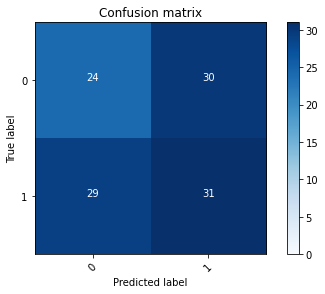

2022-08-22 16:30:54 - [Epoch Train: 72] loss: 0.1852, auc: 0.9873, acc: 0.9505, time: 24.00 s            
2022-08-22 16:30:54 - [Epoch Valid: 72] loss: 1.2328, auc: 0.4812, acc: 0.4711, time: 6.00 s


 72%|██████████████████████████████▏           | 72/100 [37:35<14:36, 31.29s/it]

2022-08-22 16:30:54 - EPOCH: 73
2022-08-22 16:30:54 - Train Step 10/485, train_loss: 0.0834
2022-08-22 16:30:55 - Train Step 20/485, train_loss: 0.1263
2022-08-22 16:30:55 - Train Step 30/485, train_loss: 0.1363
2022-08-22 16:30:56 - Train Step 40/485, train_loss: 0.1622
2022-08-22 16:30:56 - Train Step 50/485, train_loss: 0.1556
2022-08-22 16:30:57 - Train Step 60/485, train_loss: 0.1511
2022-08-22 16:30:57 - Train Step 70/485, train_loss: 0.1610
2022-08-22 16:30:58 - Train Step 80/485, train_loss: 0.1644
2022-08-22 16:30:58 - Train Step 90/485, train_loss: 0.1625
2022-08-22 16:30:59 - Train Step 100/485, train_loss: 0.1727
2022-08-22 16:30:59 - Train Step 110/485, train_loss: 0.1810
2022-08-22 16:31:00 - Train Step 120/485, train_loss: 0.1826
2022-08-22 16:31:01 - Train Step 130/485, train_loss: 0.1801
2022-08-22 16:31:01 - Train Step 140/485, train_loss: 0.2038
2022-08-22 16:31:02 - Train Step 150/485, train_loss: 0.2004
2022-08-22 16:31:02 - Train Step 160/485, train_loss: 0.2083
2

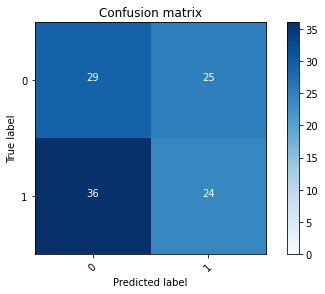

2022-08-22 16:31:25 - [Epoch Train: 73] loss: 0.1791, auc: 0.9890, acc: 0.9485, time: 24.00 s            
2022-08-22 16:31:25 - [Epoch Valid: 73] loss: 1.2856, auc: 0.4725, acc: 0.4711, time: 6.00 s


 73%|██████████████████████████████▋           | 73/100 [38:06<14:05, 31.31s/it]

2022-08-22 16:31:25 - EPOCH: 74
2022-08-22 16:31:26 - Train Step 10/485, train_loss: 0.1554
2022-08-22 16:31:26 - Train Step 20/485, train_loss: 0.1018
2022-08-22 16:31:27 - Train Step 30/485, train_loss: 0.1001
2022-08-22 16:31:27 - Train Step 40/485, train_loss: 0.0979
2022-08-22 16:31:28 - Train Step 50/485, train_loss: 0.0882
2022-08-22 16:31:28 - Train Step 60/485, train_loss: 0.1044
2022-08-22 16:31:29 - Train Step 70/485, train_loss: 0.1362
2022-08-22 16:31:29 - Train Step 80/485, train_loss: 0.1398
2022-08-22 16:31:30 - Train Step 90/485, train_loss: 0.1319
2022-08-22 16:31:30 - Train Step 100/485, train_loss: 0.1303
2022-08-22 16:31:31 - Train Step 110/485, train_loss: 0.1357
2022-08-22 16:31:31 - Train Step 120/485, train_loss: 0.1489
2022-08-22 16:31:32 - Train Step 130/485, train_loss: 0.1563
2022-08-22 16:31:32 - Train Step 140/485, train_loss: 0.1553
2022-08-22 16:31:33 - Train Step 150/485, train_loss: 0.1589
2022-08-22 16:31:33 - Train Step 160/485, train_loss: 0.1659
2

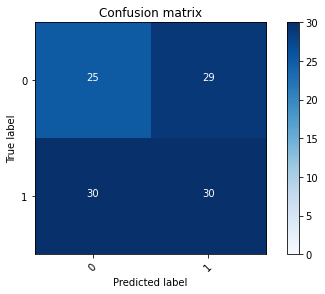

2022-08-22 16:31:56 - [Epoch Train: 74] loss: 0.1620, auc: 0.9927, acc: 0.9546, time: 24.00 s            
2022-08-22 16:31:56 - [Epoch Valid: 74] loss: 1.2566, auc: 0.4870, acc: 0.4711, time: 6.00 s


 74%|███████████████████████████████           | 74/100 [38:38<13:32, 31.26s/it]

2022-08-22 16:31:56 - EPOCH: 75
2022-08-22 16:31:57 - Train Step 10/485, train_loss: 0.1013
2022-08-22 16:31:57 - Train Step 20/485, train_loss: 0.1236
2022-08-22 16:31:58 - Train Step 30/485, train_loss: 0.1440
2022-08-22 16:31:58 - Train Step 40/485, train_loss: 0.1377
2022-08-22 16:31:59 - Train Step 50/485, train_loss: 0.1259
2022-08-22 16:31:59 - Train Step 60/485, train_loss: 0.1406
2022-08-22 16:32:00 - Train Step 70/485, train_loss: 0.1411
2022-08-22 16:32:01 - Train Step 80/485, train_loss: 0.1332
2022-08-22 16:32:01 - Train Step 90/485, train_loss: 0.1213
2022-08-22 16:32:02 - Train Step 100/485, train_loss: 0.1288
2022-08-22 16:32:02 - Train Step 110/485, train_loss: 0.1315
2022-08-22 16:32:03 - Train Step 120/485, train_loss: 0.1408
2022-08-22 16:32:03 - Train Step 130/485, train_loss: 0.1466
2022-08-22 16:32:04 - Train Step 140/485, train_loss: 0.1577
2022-08-22 16:32:04 - Train Step 150/485, train_loss: 0.1531
2022-08-22 16:32:05 - Train Step 160/485, train_loss: 0.1524
2

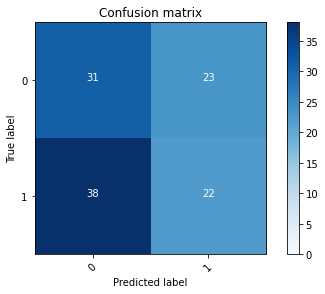

2022-08-22 16:32:27 - [Epoch Train: 75] loss: 0.1590, auc: 0.9922, acc: 0.9588, time: 24.00 s            
2022-08-22 16:32:27 - [Epoch Valid: 75] loss: 1.2844, auc: 0.4627, acc: 0.4793, time: 6.00 s


 75%|███████████████████████████████▌          | 75/100 [39:09<13:00, 31.21s/it]

2022-08-22 16:32:27 - EPOCH: 76
2022-08-22 16:32:28 - Train Step 10/485, train_loss: 0.2150
2022-08-22 16:32:28 - Train Step 20/485, train_loss: 0.1858
2022-08-22 16:32:29 - Train Step 30/485, train_loss: 0.2134
2022-08-22 16:32:29 - Train Step 40/485, train_loss: 0.1934
2022-08-22 16:32:30 - Train Step 50/485, train_loss: 0.1869
2022-08-22 16:32:30 - Train Step 60/485, train_loss: 0.1708
2022-08-22 16:32:31 - Train Step 70/485, train_loss: 0.1568
2022-08-22 16:32:31 - Train Step 80/485, train_loss: 0.1604
2022-08-22 16:32:32 - Train Step 90/485, train_loss: 0.1568
2022-08-22 16:32:33 - Train Step 100/485, train_loss: 0.1615
2022-08-22 16:32:33 - Train Step 110/485, train_loss: 0.1614
2022-08-22 16:32:34 - Train Step 120/485, train_loss: 0.1615
2022-08-22 16:32:34 - Train Step 130/485, train_loss: 0.1593
2022-08-22 16:32:35 - Train Step 140/485, train_loss: 0.1520
2022-08-22 16:32:35 - Train Step 150/485, train_loss: 0.1498
2022-08-22 16:32:36 - Train Step 160/485, train_loss: 0.1499
2

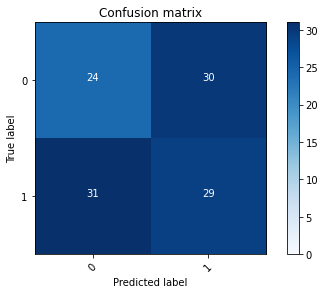

2022-08-22 16:32:59 - [Epoch Train: 76] loss: 0.1497, auc: 0.9936, acc: 0.9588, time: 25.00 s            
2022-08-22 16:32:59 - [Epoch Valid: 76] loss: 1.2715, auc: 0.4698, acc: 0.4545, time: 6.00 s


 76%|███████████████████████████████▉          | 76/100 [39:40<12:31, 31.30s/it]

2022-08-22 16:32:59 - EPOCH: 77
2022-08-22 16:33:00 - Train Step 10/485, train_loss: 0.0514
2022-08-22 16:33:00 - Train Step 20/485, train_loss: 0.0720
2022-08-22 16:33:01 - Train Step 30/485, train_loss: 0.1285
2022-08-22 16:33:01 - Train Step 40/485, train_loss: 0.1570
2022-08-22 16:33:02 - Train Step 50/485, train_loss: 0.1337
2022-08-22 16:33:02 - Train Step 60/485, train_loss: 0.1369
2022-08-22 16:33:02 - Train Step 70/485, train_loss: 0.1281
2022-08-22 16:33:03 - Train Step 80/485, train_loss: 0.1208
2022-08-22 16:33:04 - Train Step 90/485, train_loss: 0.1268
2022-08-22 16:33:04 - Train Step 100/485, train_loss: 0.1265
2022-08-22 16:33:05 - Train Step 110/485, train_loss: 0.1332
2022-08-22 16:33:05 - Train Step 120/485, train_loss: 0.1384
2022-08-22 16:33:06 - Train Step 130/485, train_loss: 0.1407
2022-08-22 16:33:06 - Train Step 140/485, train_loss: 0.1402
2022-08-22 16:33:07 - Train Step 150/485, train_loss: 0.1393
2022-08-22 16:33:07 - Train Step 160/485, train_loss: 0.1409
2

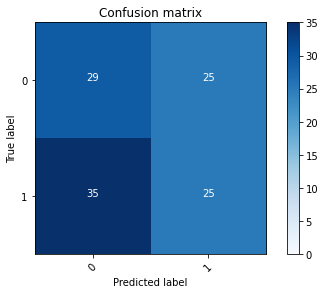

2022-08-22 16:33:30 - [Epoch Train: 77] loss: 0.1453, auc: 0.9937, acc: 0.9649, time: 24.00 s            
2022-08-22 16:33:30 - [Epoch Valid: 77] loss: 1.4372, auc: 0.4701, acc: 0.4793, time: 6.00 s


 77%|████████████████████████████████▎         | 77/100 [40:12<12:00, 31.33s/it]

2022-08-22 16:33:30 - EPOCH: 78
2022-08-22 16:33:31 - Train Step 10/485, train_loss: 0.1208
2022-08-22 16:33:31 - Train Step 20/485, train_loss: 0.1480
2022-08-22 16:33:32 - Train Step 30/485, train_loss: 0.1095
2022-08-22 16:33:32 - Train Step 40/485, train_loss: 0.0990
2022-08-22 16:33:33 - Train Step 50/485, train_loss: 0.0990
2022-08-22 16:33:33 - Train Step 60/485, train_loss: 0.1139
2022-08-22 16:33:34 - Train Step 70/485, train_loss: 0.1145
2022-08-22 16:33:34 - Train Step 80/485, train_loss: 0.1191
2022-08-22 16:33:35 - Train Step 90/485, train_loss: 0.1101
2022-08-22 16:33:35 - Train Step 100/485, train_loss: 0.1234
2022-08-22 16:33:36 - Train Step 110/485, train_loss: 0.1171
2022-08-22 16:33:36 - Train Step 120/485, train_loss: 0.1163
2022-08-22 16:33:37 - Train Step 130/485, train_loss: 0.1230
2022-08-22 16:33:38 - Train Step 140/485, train_loss: 0.1224
2022-08-22 16:33:38 - Train Step 150/485, train_loss: 0.1204
2022-08-22 16:33:39 - Train Step 160/485, train_loss: 0.1189
2

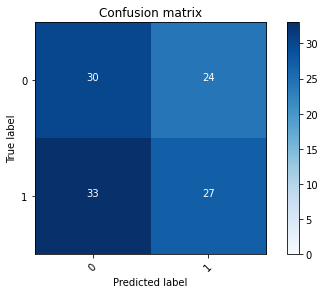

2022-08-22 16:34:02 - [Epoch Train: 78] loss: 0.1348, auc: 0.9949, acc: 0.9588, time: 25.00 s            
2022-08-22 16:34:02 - [Epoch Valid: 78] loss: 1.3300, auc: 0.4769, acc: 0.5041, time: 6.00 s


 78%|████████████████████████████████▊         | 78/100 [40:43<11:30, 31.38s/it]

2022-08-22 16:34:02 - EPOCH: 79
2022-08-22 16:34:02 - Train Step 10/485, train_loss: 0.1350
2022-08-22 16:34:03 - Train Step 20/485, train_loss: 0.1370
2022-08-22 16:34:03 - Train Step 30/485, train_loss: 0.1428
2022-08-22 16:34:04 - Train Step 40/485, train_loss: 0.1751
2022-08-22 16:34:04 - Train Step 50/485, train_loss: 0.1884
2022-08-22 16:34:05 - Train Step 60/485, train_loss: 0.1830
2022-08-22 16:34:05 - Train Step 70/485, train_loss: 0.1756
2022-08-22 16:34:06 - Train Step 80/485, train_loss: 0.1587
2022-08-22 16:34:06 - Train Step 90/485, train_loss: 0.1637
2022-08-22 16:34:07 - Train Step 100/485, train_loss: 0.1577
2022-08-22 16:34:07 - Train Step 110/485, train_loss: 0.1551
2022-08-22 16:34:08 - Train Step 120/485, train_loss: 0.1480
2022-08-22 16:34:08 - Train Step 130/485, train_loss: 0.1406
2022-08-22 16:34:09 - Train Step 140/485, train_loss: 0.1412
2022-08-22 16:34:10 - Train Step 150/485, train_loss: 0.1362
2022-08-22 16:34:10 - Train Step 160/485, train_loss: 0.1352
2

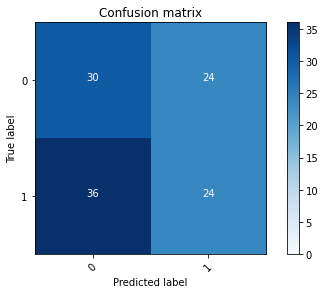

2022-08-22 16:34:33 - [Epoch Train: 79] loss: 0.1399, auc: 0.9944, acc: 0.9588, time: 24.00 s            
2022-08-22 16:34:33 - [Epoch Valid: 79] loss: 1.5278, auc: 0.4762, acc: 0.4793, time: 6.00 s


 79%|█████████████████████████████████▏        | 79/100 [41:14<10:58, 31.34s/it]

2022-08-22 16:34:33 - EPOCH: 80
2022-08-22 16:34:34 - Train Step 10/485, train_loss: 0.1399
2022-08-22 16:34:34 - Train Step 20/485, train_loss: 0.1301
2022-08-22 16:34:35 - Train Step 30/485, train_loss: 0.1177
2022-08-22 16:34:35 - Train Step 40/485, train_loss: 0.1301
2022-08-22 16:34:36 - Train Step 50/485, train_loss: 0.1331
2022-08-22 16:34:36 - Train Step 60/485, train_loss: 0.1343
2022-08-22 16:34:37 - Train Step 70/485, train_loss: 0.1232
2022-08-22 16:34:37 - Train Step 80/485, train_loss: 0.1222
2022-08-22 16:34:38 - Train Step 90/485, train_loss: 0.1126
2022-08-22 16:34:38 - Train Step 100/485, train_loss: 0.1079
2022-08-22 16:34:39 - Train Step 110/485, train_loss: 0.1043
2022-08-22 16:34:39 - Train Step 120/485, train_loss: 0.1029
2022-08-22 16:34:40 - Train Step 130/485, train_loss: 0.1003
2022-08-22 16:34:40 - Train Step 140/485, train_loss: 0.0972
2022-08-22 16:34:41 - Train Step 150/485, train_loss: 0.0958
2022-08-22 16:34:41 - Train Step 160/485, train_loss: 0.0980
2

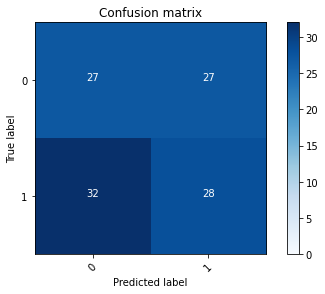

2022-08-22 16:35:04 - [Epoch Train: 80] loss: 0.1190, auc: 0.9960, acc: 0.9753, time: 24.00 s            
2022-08-22 16:35:04 - [Epoch Valid: 80] loss: 1.5718, auc: 0.4802, acc: 0.4876, time: 6.00 s


 80%|█████████████████████████████████▌        | 80/100 [41:46<10:26, 31.35s/it]

2022-08-22 16:35:04 - EPOCH: 81
2022-08-22 16:35:05 - Train Step 10/485, train_loss: 0.2666
2022-08-22 16:35:06 - Train Step 20/485, train_loss: 0.1967
2022-08-22 16:35:06 - Train Step 30/485, train_loss: 0.1613
2022-08-22 16:35:07 - Train Step 40/485, train_loss: 0.1431
2022-08-22 16:35:07 - Train Step 50/485, train_loss: 0.1477
2022-08-22 16:35:08 - Train Step 60/485, train_loss: 0.1463
2022-08-22 16:35:08 - Train Step 70/485, train_loss: 0.1466
2022-08-22 16:35:09 - Train Step 80/485, train_loss: 0.1370
2022-08-22 16:35:09 - Train Step 90/485, train_loss: 0.1264
2022-08-22 16:35:10 - Train Step 100/485, train_loss: 0.1211
2022-08-22 16:35:10 - Train Step 110/485, train_loss: 0.1169
2022-08-22 16:35:11 - Train Step 120/485, train_loss: 0.1105
2022-08-22 16:35:11 - Train Step 130/485, train_loss: 0.1108
2022-08-22 16:35:12 - Train Step 140/485, train_loss: 0.1071
2022-08-22 16:35:12 - Train Step 150/485, train_loss: 0.1091
2022-08-22 16:35:13 - Train Step 160/485, train_loss: 0.1261
2

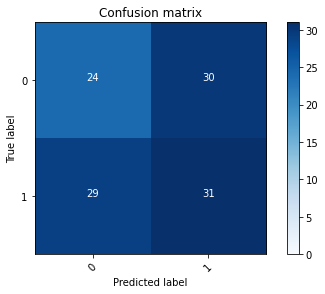

2022-08-22 16:35:36 - [Epoch Train: 81] loss: 0.1244, auc: 0.9953, acc: 0.9711, time: 25.00 s            
2022-08-22 16:35:36 - [Epoch Valid: 81] loss: 1.4324, auc: 0.4827, acc: 0.4711, time: 6.00 s


 81%|██████████████████████████████████        | 81/100 [42:17<09:57, 31.47s/it]

2022-08-22 16:35:36 - EPOCH: 82
2022-08-22 16:35:37 - Train Step 10/485, train_loss: 0.1132
2022-08-22 16:35:37 - Train Step 20/485, train_loss: 0.0803
2022-08-22 16:35:38 - Train Step 30/485, train_loss: 0.0833
2022-08-22 16:35:38 - Train Step 40/485, train_loss: 0.0959
2022-08-22 16:35:39 - Train Step 50/485, train_loss: 0.0852
2022-08-22 16:35:39 - Train Step 60/485, train_loss: 0.0827
2022-08-22 16:35:40 - Train Step 70/485, train_loss: 0.0968
2022-08-22 16:35:40 - Train Step 80/485, train_loss: 0.0996
2022-08-22 16:35:41 - Train Step 90/485, train_loss: 0.0920
2022-08-22 16:35:41 - Train Step 100/485, train_loss: 0.0856
2022-08-22 16:35:42 - Train Step 110/485, train_loss: 0.0912
2022-08-22 16:35:42 - Train Step 120/485, train_loss: 0.0879
2022-08-22 16:35:43 - Train Step 130/485, train_loss: 0.0877
2022-08-22 16:35:43 - Train Step 140/485, train_loss: 0.0947
2022-08-22 16:35:44 - Train Step 150/485, train_loss: 0.0955
2022-08-22 16:35:44 - Train Step 160/485, train_loss: 0.0948
2

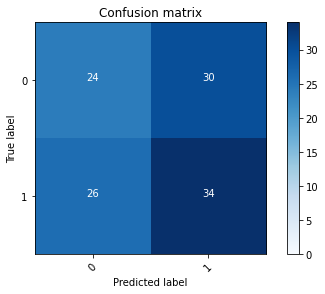

2022-08-22 16:36:08 - [Epoch Train: 82] loss: 0.1128, auc: 0.9962, acc: 0.9732, time: 25.00 s            
2022-08-22 16:36:08 - [Epoch Valid: 82] loss: 1.4453, auc: 0.4827, acc: 0.4959, time: 6.00 s


 82%|██████████████████████████████████▍       | 82/100 [42:49<09:26, 31.49s/it]

2022-08-22 16:36:08 - EPOCH: 83
2022-08-22 16:36:08 - Train Step 10/485, train_loss: 0.0687
2022-08-22 16:36:09 - Train Step 20/485, train_loss: 0.0999
2022-08-22 16:36:09 - Train Step 30/485, train_loss: 0.0843
2022-08-22 16:36:10 - Train Step 40/485, train_loss: 0.0764
2022-08-22 16:36:10 - Train Step 50/485, train_loss: 0.0726
2022-08-22 16:36:11 - Train Step 60/485, train_loss: 0.0872
2022-08-22 16:36:11 - Train Step 70/485, train_loss: 0.0903
2022-08-22 16:36:12 - Train Step 80/485, train_loss: 0.0906
2022-08-22 16:36:12 - Train Step 90/485, train_loss: 0.0876
2022-08-22 16:36:13 - Train Step 100/485, train_loss: 0.0838
2022-08-22 16:36:13 - Train Step 110/485, train_loss: 0.0791
2022-08-22 16:36:14 - Train Step 120/485, train_loss: 0.0864
2022-08-22 16:36:14 - Train Step 130/485, train_loss: 0.0846
2022-08-22 16:36:15 - Train Step 140/485, train_loss: 0.0847
2022-08-22 16:36:15 - Train Step 150/485, train_loss: 0.0847
2022-08-22 16:36:16 - Train Step 160/485, train_loss: 0.0835
2

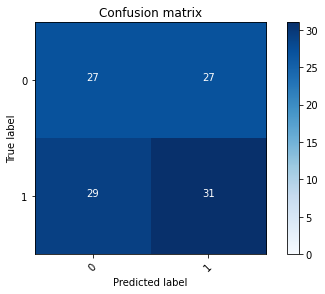

2022-08-22 16:36:38 - [Epoch Train: 83] loss: 0.1123, auc: 0.9972, acc: 0.9794, time: 24.00 s            
2022-08-22 16:36:38 - [Epoch Valid: 83] loss: 1.5183, auc: 0.4756, acc: 0.4959, time: 6.00 s


 83%|██████████████████████████████████▊       | 83/100 [43:20<08:51, 31.29s/it]

2022-08-22 16:36:38 - EPOCH: 84
2022-08-22 16:36:39 - Train Step 10/485, train_loss: 0.2155
2022-08-22 16:36:40 - Train Step 20/485, train_loss: 0.1725
2022-08-22 16:36:40 - Train Step 30/485, train_loss: 0.1605
2022-08-22 16:36:41 - Train Step 40/485, train_loss: 0.1495
2022-08-22 16:36:41 - Train Step 50/485, train_loss: 0.1366
2022-08-22 16:36:42 - Train Step 60/485, train_loss: 0.1230
2022-08-22 16:36:42 - Train Step 70/485, train_loss: 0.1194
2022-08-22 16:36:43 - Train Step 80/485, train_loss: 0.1106
2022-08-22 16:36:43 - Train Step 90/485, train_loss: 0.1086
2022-08-22 16:36:44 - Train Step 100/485, train_loss: 0.1107
2022-08-22 16:36:44 - Train Step 110/485, train_loss: 0.1089
2022-08-22 16:36:45 - Train Step 120/485, train_loss: 0.1077
2022-08-22 16:36:45 - Train Step 130/485, train_loss: 0.1064
2022-08-22 16:36:46 - Train Step 140/485, train_loss: 0.1001
2022-08-22 16:36:46 - Train Step 150/485, train_loss: 0.0977
2022-08-22 16:36:47 - Train Step 160/485, train_loss: 0.0990
2

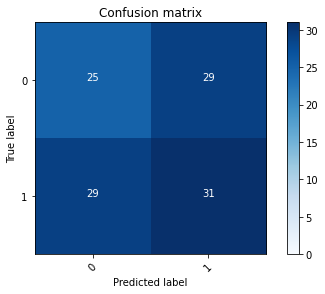

2022-08-22 16:37:10 - [Epoch Train: 84] loss: 0.0981, auc: 0.9978, acc: 0.9794, time: 24.00 s            
2022-08-22 16:37:10 - [Epoch Valid: 84] loss: 1.4765, auc: 0.4855, acc: 0.4793, time: 6.00 s


 84%|███████████████████████████████████▎      | 84/100 [43:51<08:20, 31.29s/it]

2022-08-22 16:37:10 - EPOCH: 85
2022-08-22 16:37:10 - Train Step 10/485, train_loss: 0.0607
2022-08-22 16:37:11 - Train Step 20/485, train_loss: 0.0580
2022-08-22 16:37:11 - Train Step 30/485, train_loss: 0.0496
2022-08-22 16:37:12 - Train Step 40/485, train_loss: 0.0496
2022-08-22 16:37:12 - Train Step 50/485, train_loss: 0.0638
2022-08-22 16:37:13 - Train Step 60/485, train_loss: 0.0620
2022-08-22 16:37:13 - Train Step 70/485, train_loss: 0.0659
2022-08-22 16:37:14 - Train Step 80/485, train_loss: 0.0735
2022-08-22 16:37:14 - Train Step 90/485, train_loss: 0.0724
2022-08-22 16:37:15 - Train Step 100/485, train_loss: 0.0727
2022-08-22 16:37:15 - Train Step 110/485, train_loss: 0.0849
2022-08-22 16:37:16 - Train Step 120/485, train_loss: 0.0861
2022-08-22 16:37:17 - Train Step 130/485, train_loss: 0.0916
2022-08-22 16:37:17 - Train Step 140/485, train_loss: 0.0900
2022-08-22 16:37:18 - Train Step 150/485, train_loss: 0.0882
2022-08-22 16:37:18 - Train Step 160/485, train_loss: 0.0844
2

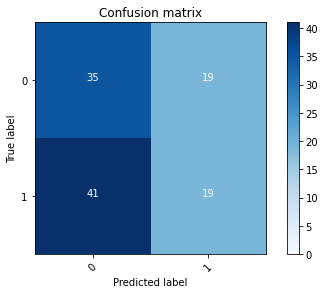

2022-08-22 16:37:42 - [Epoch Train: 85] loss: 0.0984, auc: 0.9982, acc: 0.9835, time: 24.00 s            
2022-08-22 16:37:42 - [Epoch Valid: 85] loss: 1.6929, auc: 0.4664, acc: 0.4959, time: 7.00 s


 85%|███████████████████████████████████▋      | 85/100 [44:23<07:53, 31.55s/it]

2022-08-22 16:37:42 - EPOCH: 86
2022-08-22 16:37:43 - Train Step 10/485, train_loss: 0.0863
2022-08-22 16:37:43 - Train Step 20/485, train_loss: 0.0670
2022-08-22 16:37:44 - Train Step 30/485, train_loss: 0.1004
2022-08-22 16:37:44 - Train Step 40/485, train_loss: 0.0868
2022-08-22 16:37:45 - Train Step 50/485, train_loss: 0.0771
2022-08-22 16:37:46 - Train Step 60/485, train_loss: 0.0756
2022-08-22 16:37:46 - Train Step 70/485, train_loss: 0.0708
2022-08-22 16:37:47 - Train Step 80/485, train_loss: 0.0688
2022-08-22 16:37:47 - Train Step 90/485, train_loss: 0.0732
2022-08-22 16:37:48 - Train Step 100/485, train_loss: 0.0719
2022-08-22 16:37:49 - Train Step 110/485, train_loss: 0.0798
2022-08-22 16:37:49 - Train Step 120/485, train_loss: 0.0835
2022-08-22 16:37:50 - Train Step 130/485, train_loss: 0.0923
2022-08-22 16:37:50 - Train Step 140/485, train_loss: 0.0908
2022-08-22 16:37:51 - Train Step 150/485, train_loss: 0.0936
2022-08-22 16:37:51 - Train Step 160/485, train_loss: 0.0958
2

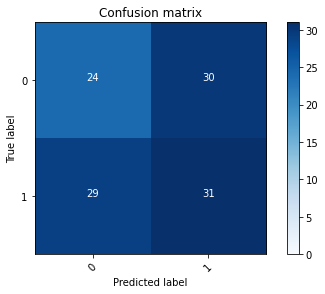

2022-08-22 16:38:18 - [Epoch Train: 86] loss: 0.0994, auc: 0.9982, acc: 0.9835, time: 28.00 s            
2022-08-22 16:38:18 - [Epoch Valid: 86] loss: 1.5605, auc: 0.4728, acc: 0.4711, time: 7.00 s


 86%|████████████████████████████████████      | 86/100 [44:59<07:39, 32.83s/it]

2022-08-22 16:38:18 - EPOCH: 87
2022-08-22 16:38:19 - Train Step 10/485, train_loss: 0.0742
2022-08-22 16:38:19 - Train Step 20/485, train_loss: 0.0571
2022-08-22 16:38:20 - Train Step 30/485, train_loss: 0.0602
2022-08-22 16:38:20 - Train Step 40/485, train_loss: 0.0742
2022-08-22 16:38:21 - Train Step 50/485, train_loss: 0.0657
2022-08-22 16:38:21 - Train Step 60/485, train_loss: 0.0622
2022-08-22 16:38:22 - Train Step 70/485, train_loss: 0.0626
2022-08-22 16:38:23 - Train Step 80/485, train_loss: 0.0581
2022-08-22 16:38:23 - Train Step 90/485, train_loss: 0.0562
2022-08-22 16:38:24 - Train Step 100/485, train_loss: 0.0555
2022-08-22 16:38:24 - Train Step 110/485, train_loss: 0.0591
2022-08-22 16:38:25 - Train Step 120/485, train_loss: 0.0563
2022-08-22 16:38:25 - Train Step 130/485, train_loss: 0.0554
2022-08-22 16:38:26 - Train Step 140/485, train_loss: 0.0558
2022-08-22 16:38:27 - Train Step 150/485, train_loss: 0.0709
2022-08-22 16:38:27 - Train Step 160/485, train_loss: 0.0697
2

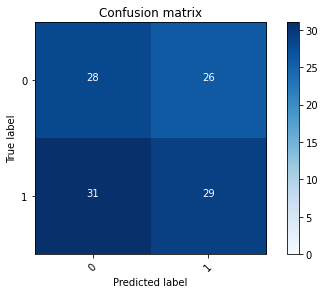

2022-08-22 16:38:53 - [Epoch Train: 87] loss: 0.0853, auc: 0.9987, acc: 0.9814, time: 28.00 s            
2022-08-22 16:38:53 - [Epoch Valid: 87] loss: 1.6801, auc: 0.4793, acc: 0.4959, time: 6.00 s


 87%|████████████████████████████████████▌     | 87/100 [45:34<07:15, 33.47s/it]

2022-08-22 16:38:53 - EPOCH: 88
2022-08-22 16:38:53 - Train Step 10/485, train_loss: 0.0534
2022-08-22 16:38:54 - Train Step 20/485, train_loss: 0.0348
2022-08-22 16:38:54 - Train Step 30/485, train_loss: 0.0585
2022-08-22 16:38:55 - Train Step 40/485, train_loss: 0.0663
2022-08-22 16:38:55 - Train Step 50/485, train_loss: 0.0739
2022-08-22 16:38:56 - Train Step 60/485, train_loss: 0.0686
2022-08-22 16:38:56 - Train Step 70/485, train_loss: 0.0680
2022-08-22 16:38:57 - Train Step 80/485, train_loss: 0.0630
2022-08-22 16:38:57 - Train Step 90/485, train_loss: 0.0635
2022-08-22 16:38:58 - Train Step 100/485, train_loss: 0.0695
2022-08-22 16:38:58 - Train Step 110/485, train_loss: 0.0710
2022-08-22 16:38:59 - Train Step 120/485, train_loss: 0.0790
2022-08-22 16:39:00 - Train Step 130/485, train_loss: 0.0800
2022-08-22 16:39:00 - Train Step 140/485, train_loss: 0.0769
2022-08-22 16:39:01 - Train Step 150/485, train_loss: 0.0736
2022-08-22 16:39:01 - Train Step 160/485, train_loss: 0.0714
2

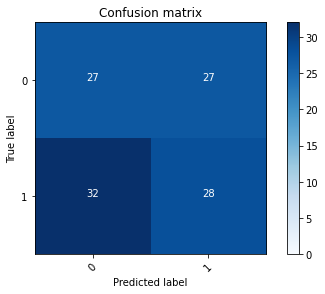

2022-08-22 16:39:24 - [Epoch Train: 88] loss: 0.0814, auc: 0.9995, acc: 0.9835, time: 25.00 s            
2022-08-22 16:39:24 - [Epoch Valid: 88] loss: 1.8385, auc: 0.4707, acc: 0.4793, time: 6.00 s


 88%|████████████████████████████████████▉     | 88/100 [46:06<06:34, 32.91s/it]

2022-08-22 16:39:24 - EPOCH: 89
2022-08-22 16:39:25 - Train Step 10/485, train_loss: 0.0417
2022-08-22 16:39:26 - Train Step 20/485, train_loss: 0.0402
2022-08-22 16:39:26 - Train Step 30/485, train_loss: 0.0359
2022-08-22 16:39:26 - Train Step 40/485, train_loss: 0.0416
2022-08-22 16:39:27 - Train Step 50/485, train_loss: 0.0400
2022-08-22 16:39:28 - Train Step 60/485, train_loss: 0.0574
2022-08-22 16:39:28 - Train Step 70/485, train_loss: 0.0607
2022-08-22 16:39:29 - Train Step 80/485, train_loss: 0.0647
2022-08-22 16:39:29 - Train Step 90/485, train_loss: 0.0619
2022-08-22 16:39:30 - Train Step 100/485, train_loss: 0.0756
2022-08-22 16:39:30 - Train Step 110/485, train_loss: 0.0831
2022-08-22 16:39:31 - Train Step 120/485, train_loss: 0.0841
2022-08-22 16:39:31 - Train Step 130/485, train_loss: 0.0820
2022-08-22 16:39:32 - Train Step 140/485, train_loss: 0.0790
2022-08-22 16:39:32 - Train Step 150/485, train_loss: 0.0761
2022-08-22 16:39:33 - Train Step 160/485, train_loss: 0.0750
2

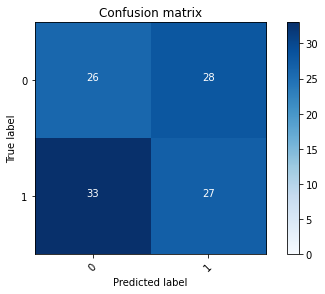

2022-08-22 16:39:56 - [Epoch Train: 89] loss: 0.0872, auc: 0.9981, acc: 0.9835, time: 25.00 s            
2022-08-22 16:39:56 - [Epoch Valid: 89] loss: 1.5820, auc: 0.4685, acc: 0.4545, time: 6.00 s


 89%|█████████████████████████████████████▍    | 89/100 [46:37<05:57, 32.51s/it]

2022-08-22 16:39:56 - EPOCH: 90
2022-08-22 16:39:57 - Train Step 10/485, train_loss: 0.0389
2022-08-22 16:39:57 - Train Step 20/485, train_loss: 0.0338
2022-08-22 16:39:58 - Train Step 30/485, train_loss: 0.0560
2022-08-22 16:39:58 - Train Step 40/485, train_loss: 0.0501
2022-08-22 16:39:59 - Train Step 50/485, train_loss: 0.0651
2022-08-22 16:39:59 - Train Step 60/485, train_loss: 0.0573
2022-08-22 16:40:00 - Train Step 70/485, train_loss: 0.0620
2022-08-22 16:40:00 - Train Step 80/485, train_loss: 0.0745
2022-08-22 16:40:01 - Train Step 90/485, train_loss: 0.0675
2022-08-22 16:40:01 - Train Step 100/485, train_loss: 0.0648
2022-08-22 16:40:02 - Train Step 110/485, train_loss: 0.0642
2022-08-22 16:40:02 - Train Step 120/485, train_loss: 0.0711
2022-08-22 16:40:03 - Train Step 130/485, train_loss: 0.0718
2022-08-22 16:40:03 - Train Step 140/485, train_loss: 0.0730
2022-08-22 16:40:04 - Train Step 150/485, train_loss: 0.0750
2022-08-22 16:40:04 - Train Step 160/485, train_loss: 0.0720
2

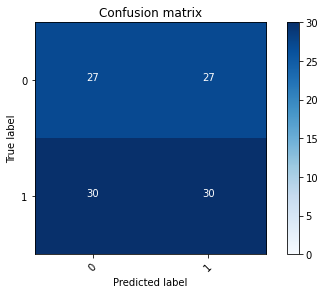

2022-08-22 16:40:28 - [Epoch Train: 90] loss: 0.0743, auc: 0.9995, acc: 0.9876, time: 25.00 s            
2022-08-22 16:40:28 - [Epoch Valid: 90] loss: 1.6813, auc: 0.4793, acc: 0.4959, time: 6.00 s


 90%|█████████████████████████████████████▊    | 90/100 [47:09<05:22, 32.25s/it]

2022-08-22 16:40:28 - EPOCH: 91
2022-08-22 16:40:28 - Train Step 10/485, train_loss: 0.0585
2022-08-22 16:40:29 - Train Step 20/485, train_loss: 0.1279
2022-08-22 16:40:29 - Train Step 30/485, train_loss: 0.1043
2022-08-22 16:40:30 - Train Step 40/485, train_loss: 0.0880
2022-08-22 16:40:30 - Train Step 50/485, train_loss: 0.0772
2022-08-22 16:40:31 - Train Step 60/485, train_loss: 0.0977
2022-08-22 16:40:31 - Train Step 70/485, train_loss: 0.0933
2022-08-22 16:40:32 - Train Step 80/485, train_loss: 0.0841
2022-08-22 16:40:32 - Train Step 90/485, train_loss: 0.0813
2022-08-22 16:40:33 - Train Step 100/485, train_loss: 0.0783
2022-08-22 16:40:33 - Train Step 110/485, train_loss: 0.0769
2022-08-22 16:40:34 - Train Step 120/485, train_loss: 0.0721
2022-08-22 16:40:34 - Train Step 130/485, train_loss: 0.0698
2022-08-22 16:40:35 - Train Step 140/485, train_loss: 0.0747
2022-08-22 16:40:35 - Train Step 150/485, train_loss: 0.0717
2022-08-22 16:40:36 - Train Step 160/485, train_loss: 0.0681
2

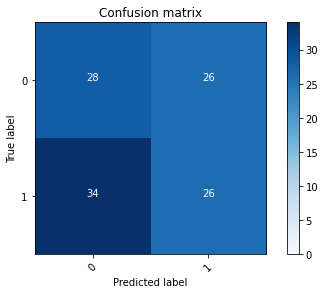

2022-08-22 16:40:59 - [Epoch Train: 91] loss: 0.0704, auc: 0.9997, acc: 0.9876, time: 24.00 s            
2022-08-22 16:40:59 - [Epoch Valid: 91] loss: 1.9179, auc: 0.4728, acc: 0.4711, time: 6.00 s


 91%|██████████████████████████████████████▏   | 91/100 [47:40<04:47, 31.92s/it]

2022-08-22 16:40:59 - EPOCH: 92
2022-08-22 16:40:59 - Train Step 10/485, train_loss: 0.0781
2022-08-22 16:41:00 - Train Step 20/485, train_loss: 0.1102
2022-08-22 16:41:00 - Train Step 30/485, train_loss: 0.0914
2022-08-22 16:41:01 - Train Step 40/485, train_loss: 0.0791
2022-08-22 16:41:01 - Train Step 50/485, train_loss: 0.0779
2022-08-22 16:41:02 - Train Step 60/485, train_loss: 0.1003
2022-08-22 16:41:02 - Train Step 70/485, train_loss: 0.1121
2022-08-22 16:41:03 - Train Step 80/485, train_loss: 0.1026
2022-08-22 16:41:03 - Train Step 90/485, train_loss: 0.0967
2022-08-22 16:41:04 - Train Step 100/485, train_loss: 0.0913
2022-08-22 16:41:04 - Train Step 110/485, train_loss: 0.0846
2022-08-22 16:41:05 - Train Step 120/485, train_loss: 0.0916
2022-08-22 16:41:05 - Train Step 130/485, train_loss: 0.0881
2022-08-22 16:41:06 - Train Step 140/485, train_loss: 0.0843
2022-08-22 16:41:07 - Train Step 150/485, train_loss: 0.0807
2022-08-22 16:41:07 - Train Step 160/485, train_loss: 0.0790
2

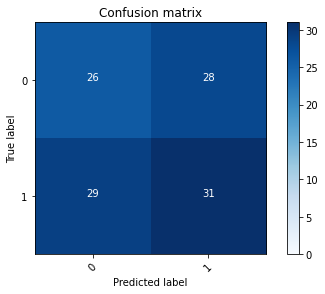

2022-08-22 16:41:30 - [Epoch Train: 92] loss: 0.0687, auc: 0.9997, acc: 0.9897, time: 24.00 s            
2022-08-22 16:41:30 - [Epoch Valid: 92] loss: 1.9807, auc: 0.4781, acc: 0.4959, time: 6.00 s


 92%|██████████████████████████████████████▋   | 92/100 [48:11<04:13, 31.71s/it]

2022-08-22 16:41:30 - EPOCH: 93
2022-08-22 16:41:31 - Train Step 10/485, train_loss: 0.1617
2022-08-22 16:41:31 - Train Step 20/485, train_loss: 0.0897
2022-08-22 16:41:32 - Train Step 30/485, train_loss: 0.1299
2022-08-22 16:41:32 - Train Step 40/485, train_loss: 0.1028
2022-08-22 16:41:33 - Train Step 50/485, train_loss: 0.1025
2022-08-22 16:41:33 - Train Step 60/485, train_loss: 0.0962
2022-08-22 16:41:34 - Train Step 70/485, train_loss: 0.0910
2022-08-22 16:41:34 - Train Step 80/485, train_loss: 0.1079
2022-08-22 16:41:35 - Train Step 90/485, train_loss: 0.1086
2022-08-22 16:41:35 - Train Step 100/485, train_loss: 0.1044
2022-08-22 16:41:36 - Train Step 110/485, train_loss: 0.1020
2022-08-22 16:41:36 - Train Step 120/485, train_loss: 0.0981
2022-08-22 16:41:37 - Train Step 130/485, train_loss: 0.1001
2022-08-22 16:41:37 - Train Step 140/485, train_loss: 0.0945
2022-08-22 16:41:38 - Train Step 150/485, train_loss: 0.0925
2022-08-22 16:41:38 - Train Step 160/485, train_loss: 0.0898
2

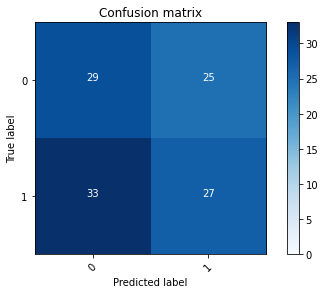

2022-08-22 16:42:01 - [Epoch Train: 93] loss: 0.0744, auc: 0.9988, acc: 0.9835, time: 24.00 s            
2022-08-22 16:42:01 - [Epoch Valid: 93] loss: 1.7500, auc: 0.4778, acc: 0.4876, time: 6.00 s


 93%|███████████████████████████████████████   | 93/100 [48:43<03:41, 31.64s/it]

2022-08-22 16:42:01 - EPOCH: 94
2022-08-22 16:42:02 - Train Step 10/485, train_loss: 0.0295
2022-08-22 16:42:03 - Train Step 20/485, train_loss: 0.0322
2022-08-22 16:42:03 - Train Step 30/485, train_loss: 0.0237
2022-08-22 16:42:04 - Train Step 40/485, train_loss: 0.0292
2022-08-22 16:42:04 - Train Step 50/485, train_loss: 0.0274
2022-08-22 16:42:05 - Train Step 60/485, train_loss: 0.0260
2022-08-22 16:42:05 - Train Step 70/485, train_loss: 0.0311
2022-08-22 16:42:06 - Train Step 80/485, train_loss: 0.0485
2022-08-22 16:42:06 - Train Step 90/485, train_loss: 0.0453
2022-08-22 16:42:07 - Train Step 100/485, train_loss: 0.0530
2022-08-22 16:42:07 - Train Step 110/485, train_loss: 0.0508
2022-08-22 16:42:08 - Train Step 120/485, train_loss: 0.0493
2022-08-22 16:42:08 - Train Step 130/485, train_loss: 0.0488
2022-08-22 16:42:09 - Train Step 140/485, train_loss: 0.0505
2022-08-22 16:42:09 - Train Step 150/485, train_loss: 0.0564
2022-08-22 16:42:10 - Train Step 160/485, train_loss: 0.0570
2

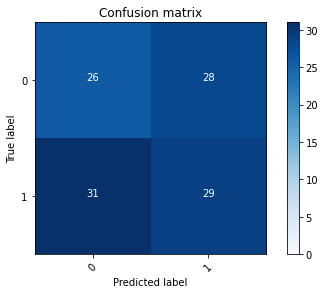

2022-08-22 16:42:33 - [Epoch Train: 94] loss: 0.0615, auc: 0.9994, acc: 0.9918, time: 24.00 s            
2022-08-22 16:42:33 - [Epoch Valid: 94] loss: 1.7834, auc: 0.4707, acc: 0.4711, time: 6.00 s


 94%|███████████████████████████████████████▍  | 94/100 [49:14<03:09, 31.59s/it]

2022-08-22 16:42:33 - EPOCH: 95
2022-08-22 16:42:34 - Train Step 10/485, train_loss: 0.0415
2022-08-22 16:42:34 - Train Step 20/485, train_loss: 0.0500
2022-08-22 16:42:35 - Train Step 30/485, train_loss: 0.0494
2022-08-22 16:42:35 - Train Step 40/485, train_loss: 0.0496
2022-08-22 16:42:36 - Train Step 50/485, train_loss: 0.0566
2022-08-22 16:42:36 - Train Step 60/485, train_loss: 0.0566
2022-08-22 16:42:37 - Train Step 70/485, train_loss: 0.0544
2022-08-22 16:42:37 - Train Step 80/485, train_loss: 0.0495
2022-08-22 16:42:38 - Train Step 90/485, train_loss: 0.0581
2022-08-22 16:42:38 - Train Step 100/485, train_loss: 0.0579
2022-08-22 16:42:39 - Train Step 110/485, train_loss: 0.0565
2022-08-22 16:42:39 - Train Step 120/485, train_loss: 0.0622
2022-08-22 16:42:40 - Train Step 130/485, train_loss: 0.0639
2022-08-22 16:42:40 - Train Step 140/485, train_loss: 0.0652
2022-08-22 16:42:41 - Train Step 150/485, train_loss: 0.0620
2022-08-22 16:42:41 - Train Step 160/485, train_loss: 0.0606
2

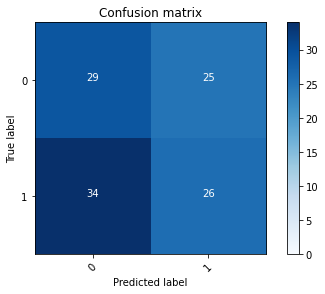

2022-08-22 16:43:04 - [Epoch Train: 95] loss: 0.0645, auc: 0.9998, acc: 0.9918, time: 24.00 s            
2022-08-22 16:43:04 - [Epoch Valid: 95] loss: 1.6814, auc: 0.4765, acc: 0.4793, time: 6.00 s


 95%|███████████████████████████████████████▉  | 95/100 [49:45<02:37, 31.49s/it]

2022-08-22 16:43:04 - EPOCH: 96
2022-08-22 16:43:05 - Train Step 10/485, train_loss: 0.0378
2022-08-22 16:43:05 - Train Step 20/485, train_loss: 0.0429
2022-08-22 16:43:06 - Train Step 30/485, train_loss: 0.0327
2022-08-22 16:43:06 - Train Step 40/485, train_loss: 0.0475
2022-08-22 16:43:07 - Train Step 50/485, train_loss: 0.0533
2022-08-22 16:43:07 - Train Step 60/485, train_loss: 0.0552
2022-08-22 16:43:08 - Train Step 70/485, train_loss: 0.0597
2022-08-22 16:43:08 - Train Step 80/485, train_loss: 0.0601
2022-08-22 16:43:09 - Train Step 90/485, train_loss: 0.0618
2022-08-22 16:43:10 - Train Step 100/485, train_loss: 0.0592
2022-08-22 16:43:10 - Train Step 110/485, train_loss: 0.0651
2022-08-22 16:43:11 - Train Step 120/485, train_loss: 0.0649
2022-08-22 16:43:11 - Train Step 130/485, train_loss: 0.0612
2022-08-22 16:43:12 - Train Step 140/485, train_loss: 0.0597
2022-08-22 16:43:12 - Train Step 150/485, train_loss: 0.0614
2022-08-22 16:43:13 - Train Step 160/485, train_loss: 0.0600
2

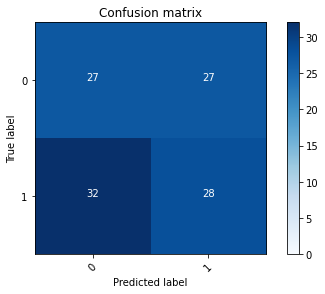

2022-08-22 16:43:36 - [Epoch Train: 96] loss: 0.0540, auc: 0.9999, acc: 0.9938, time: 25.00 s            
2022-08-22 16:43:36 - [Epoch Valid: 96] loss: 1.9337, auc: 0.4806, acc: 0.4793, time: 6.00 s


 96%|████████████████████████████████████████▎ | 96/100 [50:17<02:06, 31.53s/it]

2022-08-22 16:43:36 - EPOCH: 97
2022-08-22 16:43:36 - Train Step 10/485, train_loss: 0.1058
2022-08-22 16:43:37 - Train Step 20/485, train_loss: 0.1171
2022-08-22 16:43:37 - Train Step 30/485, train_loss: 0.0855
2022-08-22 16:43:38 - Train Step 40/485, train_loss: 0.0670
2022-08-22 16:43:38 - Train Step 50/485, train_loss: 0.0763
2022-08-22 16:43:39 - Train Step 60/485, train_loss: 0.0708
2022-08-22 16:43:39 - Train Step 70/485, train_loss: 0.0691
2022-08-22 16:43:40 - Train Step 80/485, train_loss: 0.0656
2022-08-22 16:43:40 - Train Step 90/485, train_loss: 0.0601
2022-08-22 16:43:41 - Train Step 100/485, train_loss: 0.0570
2022-08-22 16:43:42 - Train Step 110/485, train_loss: 0.0558
2022-08-22 16:43:42 - Train Step 120/485, train_loss: 0.0563
2022-08-22 16:43:43 - Train Step 130/485, train_loss: 0.0533
2022-08-22 16:43:43 - Train Step 140/485, train_loss: 0.0579
2022-08-22 16:43:44 - Train Step 150/485, train_loss: 0.0603
2022-08-22 16:43:44 - Train Step 160/485, train_loss: 0.0617
2

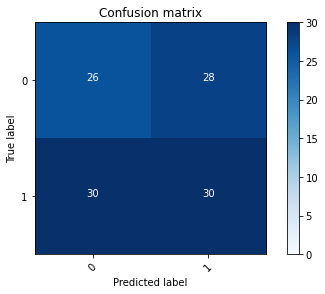

2022-08-22 16:44:07 - [Epoch Train: 97] loss: 0.0627, auc: 0.9993, acc: 0.9814, time: 24.00 s            
2022-08-22 16:44:07 - [Epoch Valid: 97] loss: 1.8737, auc: 0.4870, acc: 0.4793, time: 6.00 s


 97%|████████████████████████████████████████▋ | 97/100 [50:48<01:34, 31.45s/it]

2022-08-22 16:44:07 - EPOCH: 98
2022-08-22 16:44:08 - Train Step 10/485, train_loss: 0.0932
2022-08-22 16:44:08 - Train Step 20/485, train_loss: 0.1129
2022-08-22 16:44:09 - Train Step 30/485, train_loss: 0.0933
2022-08-22 16:44:09 - Train Step 40/485, train_loss: 0.0819
2022-08-22 16:44:10 - Train Step 50/485, train_loss: 0.0817
2022-08-22 16:44:10 - Train Step 60/485, train_loss: 0.0726
2022-08-22 16:44:11 - Train Step 70/485, train_loss: 0.0739
2022-08-22 16:44:11 - Train Step 80/485, train_loss: 0.0658
2022-08-22 16:44:12 - Train Step 90/485, train_loss: 0.0614
2022-08-22 16:44:12 - Train Step 100/485, train_loss: 0.0565
2022-08-22 16:44:13 - Train Step 110/485, train_loss: 0.0532
2022-08-22 16:44:13 - Train Step 120/485, train_loss: 0.0566
2022-08-22 16:44:14 - Train Step 130/485, train_loss: 0.0569
2022-08-22 16:44:14 - Train Step 140/485, train_loss: 0.0536
2022-08-22 16:44:15 - Train Step 150/485, train_loss: 0.0518
2022-08-22 16:44:15 - Train Step 160/485, train_loss: 0.0505
2

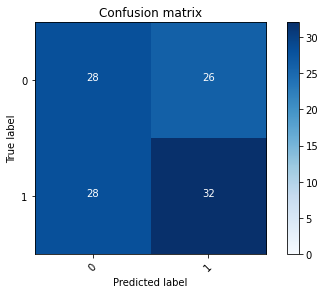

2022-08-22 16:44:38 - [Epoch Train: 98] loss: 0.0506, auc: 0.9998, acc: 0.9938, time: 24.00 s            
2022-08-22 16:44:38 - [Epoch Valid: 98] loss: 1.8572, auc: 0.4889, acc: 0.5207, time: 6.00 s


 98%|█████████████████████████████████████████▏| 98/100 [51:20<01:02, 31.41s/it]

2022-08-22 16:44:38 - EPOCH: 99
2022-08-22 16:44:39 - Train Step 10/485, train_loss: 0.0090
2022-08-22 16:44:40 - Train Step 20/485, train_loss: 0.0150
2022-08-22 16:44:40 - Train Step 30/485, train_loss: 0.0194
2022-08-22 16:44:41 - Train Step 40/485, train_loss: 0.0243
2022-08-22 16:44:41 - Train Step 50/485, train_loss: 0.0264
2022-08-22 16:44:42 - Train Step 60/485, train_loss: 0.0290
2022-08-22 16:44:42 - Train Step 70/485, train_loss: 0.0350
2022-08-22 16:44:43 - Train Step 80/485, train_loss: 0.0339
2022-08-22 16:44:43 - Train Step 90/485, train_loss: 0.0338
2022-08-22 16:44:44 - Train Step 100/485, train_loss: 0.0361
2022-08-22 16:44:44 - Train Step 110/485, train_loss: 0.0358
2022-08-22 16:44:45 - Train Step 120/485, train_loss: 0.0353
2022-08-22 16:44:45 - Train Step 130/485, train_loss: 0.0353
2022-08-22 16:44:46 - Train Step 140/485, train_loss: 0.0404
2022-08-22 16:44:46 - Train Step 150/485, train_loss: 0.0434
2022-08-22 16:44:47 - Train Step 160/485, train_loss: 0.0461
2

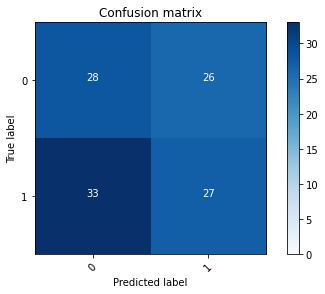

2022-08-22 16:45:10 - [Epoch Train: 99] loss: 0.0530, auc: 0.9998, acc: 0.9938, time: 24.00 s            
2022-08-22 16:45:10 - [Epoch Valid: 99] loss: 1.9973, auc: 0.4778, acc: 0.4793, time: 6.00 s


 99%|█████████████████████████████████████████▌| 99/100 [51:51<00:31, 31.39s/it]

2022-08-22 16:45:10 - EPOCH: 100
2022-08-22 16:45:10 - Train Step 10/485, train_loss: 0.0309
2022-08-22 16:45:11 - Train Step 20/485, train_loss: 0.0216
2022-08-22 16:45:11 - Train Step 30/485, train_loss: 0.0242
2022-08-22 16:45:12 - Train Step 40/485, train_loss: 0.0254
2022-08-22 16:45:12 - Train Step 50/485, train_loss: 0.0228
2022-08-22 16:45:13 - Train Step 60/485, train_loss: 0.0254
2022-08-22 16:45:13 - Train Step 70/485, train_loss: 0.0254
2022-08-22 16:45:14 - Train Step 80/485, train_loss: 0.0245
2022-08-22 16:45:14 - Train Step 90/485, train_loss: 0.0232
2022-08-22 16:45:15 - Train Step 100/485, train_loss: 0.0229
2022-08-22 16:45:15 - Train Step 110/485, train_loss: 0.0247
2022-08-22 16:45:16 - Train Step 120/485, train_loss: 0.0242
2022-08-22 16:45:16 - Train Step 130/485, train_loss: 0.0235
2022-08-22 16:45:17 - Train Step 140/485, train_loss: 0.0227
2022-08-22 16:45:17 - Train Step 150/485, train_loss: 0.0227
2022-08-22 16:45:18 - Train Step 160/485, train_loss: 0.0217


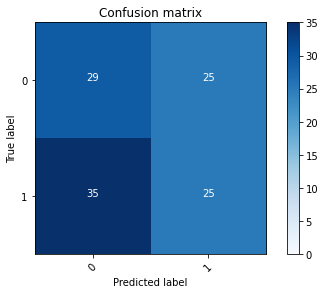

2022-08-22 16:45:41 - [Epoch Train: 100] loss: 0.0361, auc: 1.0000, acc: 1.0000, time: 25.00 s            
2022-08-22 16:45:41 - [Epoch Valid: 100] loss: 2.2025, auc: 0.4698, acc: 0.4793, time: 6.00 s


100%|█████████████████████████████████████████| 100/100 [52:23<00:00, 31.43s/it]

-- FOLD N:3
Train origin: m
Type: KLF
2022-08-22 16:45:41 - (M0) Train/Val datasets size: 270
2022-08-22 16:45:41 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabf0043b20>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb0d6cee0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606


[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 253, 254, 255, 259, 260, 261, 262, 263, 264, 265, 266, 267, 269, 271, 272, 

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-22 16:47:39 - EPOCH: 1
2022-08-22 16:47:40 - Train Step 10/480, train_loss: 0.7007
2022-08-22 16:47:41 - Train Step 20/480, train_loss: 0.7001
2022-08-22 16:47:41 - Train Step 30/480, train_loss: 0.6864
2022-08-22 16:47:42 - Train Step 40/480, train_loss: 0.6938
2022-08-22 16:47:42 - Train Step 50/480, train_loss: 0.6941
2022-08-22 16:47:43 - Train Step 60/480, train_loss: 0.6974
2022-08-22 16:47:43 - Train Step 70/480, train_loss: 0.6980
2022-08-22 16:47:44 - Train Step 80/480, train_loss: 0.7006
2022-08-22 16:47:44 - Train Step 90/480, train_loss: 0.6963
2022-08-22 16:47:45 - Train Step 100/480, train_loss: 0.6999
2022-08-22 16:47:45 - Train Step 110/480, train_loss: 0.6980
2022-08-22 16:47:46 - Train Step 120/480, train_loss: 0.7005
2022-08-22 16:47:46 - Train Step 130/480, train_loss: 0.7028
2022-08-22 16:47:47 - Train Step 140/480, train_loss: 0.7055
2022-08-22 16:47:47 - Train Step 150/480, train_loss: 0.7059
2022-08-22 16:47:48 - Train Step 160/480, train_loss: 0.7046
20

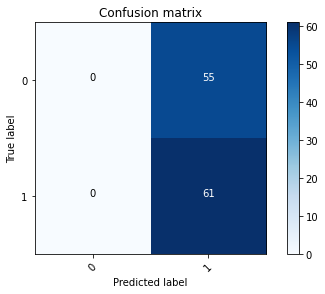

2022-08-22 16:48:11 - [Epoch Train: 1] loss: 0.6963, auc: 0.4622, acc: 0.5042, time: 24.00 s            
2022-08-22 16:48:11 - [Epoch Valid: 1] loss: 0.6956, auc: 0.5505, acc: 0.4841, time: 6.00 s
2022-08-22 16:48:11 - acc improved from 0.0000 to 0.4841. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.696-acc0.484-auc0.551.pth'


  1%|▍                                          | 1/100 [00:31<51:51, 31.43s/it]

2022-08-22 16:48:11 - EPOCH: 2
2022-08-22 16:48:12 - Train Step 10/480, train_loss: 0.6947
2022-08-22 16:48:12 - Train Step 20/480, train_loss: 0.6941
2022-08-22 16:48:13 - Train Step 30/480, train_loss: 0.6879
2022-08-22 16:48:13 - Train Step 40/480, train_loss: 0.6824
2022-08-22 16:48:14 - Train Step 50/480, train_loss: 0.6798
2022-08-22 16:48:14 - Train Step 60/480, train_loss: 0.6862
2022-08-22 16:48:15 - Train Step 70/480, train_loss: 0.6881
2022-08-22 16:48:15 - Train Step 80/480, train_loss: 0.6870
2022-08-22 16:48:16 - Train Step 90/480, train_loss: 0.6902
2022-08-22 16:48:16 - Train Step 100/480, train_loss: 0.6895
2022-08-22 16:48:17 - Train Step 110/480, train_loss: 0.6909
2022-08-22 16:48:17 - Train Step 120/480, train_loss: 0.6902
2022-08-22 16:48:18 - Train Step 130/480, train_loss: 0.6910
2022-08-22 16:48:18 - Train Step 140/480, train_loss: 0.6892
2022-08-22 16:48:19 - Train Step 150/480, train_loss: 0.6879
2022-08-22 16:48:19 - Train Step 160/480, train_loss: 0.6890
20

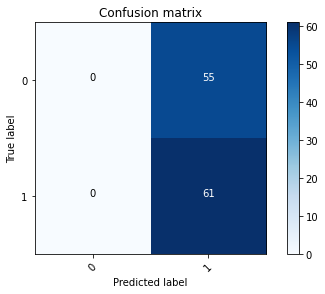

2022-08-22 16:48:42 - [Epoch Train: 2] loss: 0.6941, auc: 0.5174, acc: 0.5042, time: 24.00 s            
2022-08-22 16:48:42 - [Epoch Valid: 2] loss: 0.6942, auc: 0.5773, acc: 0.4841, time: 6.00 s
2022-08-22 16:48:42 - acc improved from 0.4841 to 0.4841. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.694-acc0.484-auc0.577.pth'


  2%|▊                                          | 2/100 [01:02<51:07, 31.30s/it]

2022-08-22 16:48:42 - EPOCH: 3
2022-08-22 16:48:43 - Train Step 10/480, train_loss: 0.6720
2022-08-22 16:48:43 - Train Step 20/480, train_loss: 0.6767
2022-08-22 16:48:44 - Train Step 30/480, train_loss: 0.6842
2022-08-22 16:48:44 - Train Step 40/480, train_loss: 0.6866
2022-08-22 16:48:45 - Train Step 50/480, train_loss: 0.6932
2022-08-22 16:48:45 - Train Step 60/480, train_loss: 0.6947
2022-08-22 16:48:46 - Train Step 70/480, train_loss: 0.6925
2022-08-22 16:48:46 - Train Step 80/480, train_loss: 0.6952
2022-08-22 16:48:47 - Train Step 90/480, train_loss: 0.6978
2022-08-22 16:48:47 - Train Step 100/480, train_loss: 0.6986
2022-08-22 16:48:48 - Train Step 110/480, train_loss: 0.6982
2022-08-22 16:48:48 - Train Step 120/480, train_loss: 0.6979
2022-08-22 16:48:49 - Train Step 130/480, train_loss: 0.6983
2022-08-22 16:48:49 - Train Step 140/480, train_loss: 0.6982
2022-08-22 16:48:50 - Train Step 150/480, train_loss: 0.6978
2022-08-22 16:48:50 - Train Step 160/480, train_loss: 0.6971
20

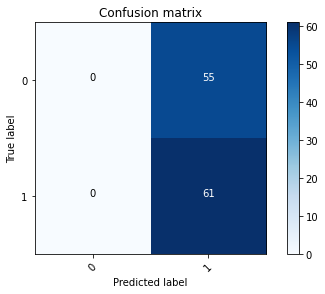

2022-08-22 16:49:13 - [Epoch Train: 3] loss: 0.6936, auc: 0.5073, acc: 0.5125, time: 24.00 s            
2022-08-22 16:49:13 - [Epoch Valid: 3] loss: 0.6924, auc: 0.6080, acc: 0.4841, time: 6.00 s
2022-08-22 16:49:13 - acc improved from 0.4841 to 0.4841. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.692-acc0.484-auc0.608.pth'


  3%|█▎                                         | 3/100 [01:33<50:31, 31.26s/it]

2022-08-22 16:49:13 - EPOCH: 4
2022-08-22 16:49:14 - Train Step 10/480, train_loss: 0.6933
2022-08-22 16:49:14 - Train Step 20/480, train_loss: 0.6848
2022-08-22 16:49:15 - Train Step 30/480, train_loss: 0.6778
2022-08-22 16:49:16 - Train Step 40/480, train_loss: 0.6758
2022-08-22 16:49:16 - Train Step 50/480, train_loss: 0.6835
2022-08-22 16:49:17 - Train Step 60/480, train_loss: 0.6819
2022-08-22 16:49:17 - Train Step 70/480, train_loss: 0.6808
2022-08-22 16:49:18 - Train Step 80/480, train_loss: 0.6810
2022-08-22 16:49:18 - Train Step 90/480, train_loss: 0.6857
2022-08-22 16:49:19 - Train Step 100/480, train_loss: 0.6869
2022-08-22 16:49:19 - Train Step 110/480, train_loss: 0.6875
2022-08-22 16:49:20 - Train Step 120/480, train_loss: 0.6882
2022-08-22 16:49:20 - Train Step 130/480, train_loss: 0.6888
2022-08-22 16:49:21 - Train Step 140/480, train_loss: 0.6890
2022-08-22 16:49:21 - Train Step 150/480, train_loss: 0.6892
2022-08-22 16:49:22 - Train Step 160/480, train_loss: 0.6889
20

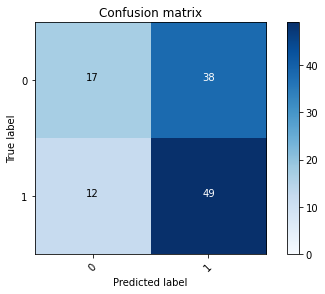

2022-08-22 16:49:45 - [Epoch Train: 4] loss: 0.6914, auc: 0.5510, acc: 0.5229, time: 24.00 s            
2022-08-22 16:49:45 - [Epoch Valid: 4] loss: 0.6889, auc: 0.6113, acc: 0.5556, time: 6.00 s
2022-08-22 16:49:45 - acc improved from 0.4841 to 0.5556. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e4-loss0.689-acc0.556-auc0.611.pth'


  4%|█▋                                         | 4/100 [02:05<50:10, 31.35s/it]

2022-08-22 16:49:45 - EPOCH: 5
2022-08-22 16:49:46 - Train Step 10/480, train_loss: 0.6939
2022-08-22 16:49:46 - Train Step 20/480, train_loss: 0.6866
2022-08-22 16:49:46 - Train Step 30/480, train_loss: 0.6809
2022-08-22 16:49:47 - Train Step 40/480, train_loss: 0.6811
2022-08-22 16:49:47 - Train Step 50/480, train_loss: 0.6858
2022-08-22 16:49:48 - Train Step 60/480, train_loss: 0.6859
2022-08-22 16:49:49 - Train Step 70/480, train_loss: 0.6851
2022-08-22 16:49:49 - Train Step 80/480, train_loss: 0.6853
2022-08-22 16:49:50 - Train Step 90/480, train_loss: 0.6870
2022-08-22 16:49:50 - Train Step 100/480, train_loss: 0.6882
2022-08-22 16:49:51 - Train Step 110/480, train_loss: 0.6887
2022-08-22 16:49:51 - Train Step 120/480, train_loss: 0.6884
2022-08-22 16:49:52 - Train Step 130/480, train_loss: 0.6892
2022-08-22 16:49:52 - Train Step 140/480, train_loss: 0.6896
2022-08-22 16:49:53 - Train Step 150/480, train_loss: 0.6899
2022-08-22 16:49:53 - Train Step 160/480, train_loss: 0.6893
20

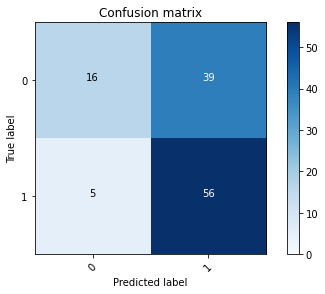

2022-08-22 16:50:16 - [Epoch Train: 5] loss: 0.6899, auc: 0.5572, acc: 0.5188, time: 24.00 s            
2022-08-22 16:50:16 - [Epoch Valid: 5] loss: 0.6879, auc: 0.6289, acc: 0.6032, time: 6.00 s
2022-08-22 16:50:16 - acc improved from 0.5556 to 0.6032. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.688-acc0.603-auc0.629.pth'


  5%|██▏                                        | 5/100 [02:36<49:38, 31.36s/it]

2022-08-22 16:50:16 - EPOCH: 6
2022-08-22 16:50:17 - Train Step 10/480, train_loss: 0.6725
2022-08-22 16:50:17 - Train Step 20/480, train_loss: 0.6919
2022-08-22 16:50:18 - Train Step 30/480, train_loss: 0.6975
2022-08-22 16:50:18 - Train Step 40/480, train_loss: 0.6920
2022-08-22 16:50:19 - Train Step 50/480, train_loss: 0.6918
2022-08-22 16:50:19 - Train Step 60/480, train_loss: 0.6938
2022-08-22 16:50:20 - Train Step 70/480, train_loss: 0.6930
2022-08-22 16:50:20 - Train Step 80/480, train_loss: 0.6968
2022-08-22 16:50:21 - Train Step 90/480, train_loss: 0.6960
2022-08-22 16:50:21 - Train Step 100/480, train_loss: 0.6939
2022-08-22 16:50:22 - Train Step 110/480, train_loss: 0.6931
2022-08-22 16:50:22 - Train Step 120/480, train_loss: 0.6939
2022-08-22 16:50:23 - Train Step 130/480, train_loss: 0.6927
2022-08-22 16:50:23 - Train Step 140/480, train_loss: 0.6916
2022-08-22 16:50:24 - Train Step 150/480, train_loss: 0.6904
2022-08-22 16:50:24 - Train Step 160/480, train_loss: 0.6886
20

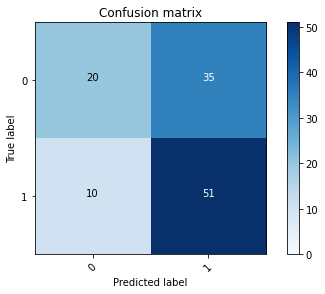

2022-08-22 16:50:48 - [Epoch Train: 6] loss: 0.6890, auc: 0.5610, acc: 0.5250, time: 24.00 s            
2022-08-22 16:50:48 - [Epoch Valid: 6] loss: 0.6869, auc: 0.6301, acc: 0.6032, time: 6.00 s
2022-08-22 16:50:48 - acc improved from 0.6032 to 0.6032. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e6-loss0.687-acc0.603-auc0.630.pth'


  6%|██▌                                        | 6/100 [03:08<49:10, 31.39s/it]

2022-08-22 16:50:48 - EPOCH: 7
2022-08-22 16:50:48 - Train Step 10/480, train_loss: 0.7075
2022-08-22 16:50:49 - Train Step 20/480, train_loss: 0.6992
2022-08-22 16:50:49 - Train Step 30/480, train_loss: 0.6975
2022-08-22 16:50:50 - Train Step 40/480, train_loss: 0.6926
2022-08-22 16:50:50 - Train Step 50/480, train_loss: 0.6927
2022-08-22 16:50:51 - Train Step 60/480, train_loss: 0.6912
2022-08-22 16:50:51 - Train Step 70/480, train_loss: 0.6899
2022-08-22 16:50:52 - Train Step 80/480, train_loss: 0.6885
2022-08-22 16:50:52 - Train Step 90/480, train_loss: 0.6880
2022-08-22 16:50:53 - Train Step 100/480, train_loss: 0.6871
2022-08-22 16:50:53 - Train Step 110/480, train_loss: 0.6858
2022-08-22 16:50:54 - Train Step 120/480, train_loss: 0.6882
2022-08-22 16:50:55 - Train Step 130/480, train_loss: 0.6873
2022-08-22 16:50:55 - Train Step 140/480, train_loss: 0.6881
2022-08-22 16:50:56 - Train Step 150/480, train_loss: 0.6885
2022-08-22 16:50:56 - Train Step 160/480, train_loss: 0.6877
20

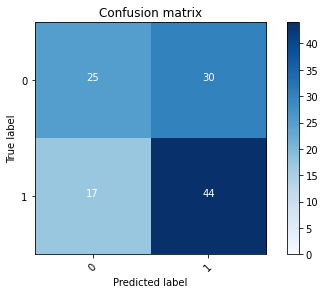

2022-08-22 16:51:19 - [Epoch Train: 7] loss: 0.6878, auc: 0.5721, acc: 0.5417, time: 24.00 s            
2022-08-22 16:51:19 - [Epoch Valid: 7] loss: 0.6847, auc: 0.6450, acc: 0.5952, time: 6.00 s


  7%|███                                        | 7/100 [03:39<48:47, 31.48s/it]

2022-08-22 16:51:19 - EPOCH: 8
2022-08-22 16:51:20 - Train Step 10/480, train_loss: 0.6922
2022-08-22 16:51:20 - Train Step 20/480, train_loss: 0.6905
2022-08-22 16:51:21 - Train Step 30/480, train_loss: 0.6809
2022-08-22 16:51:21 - Train Step 40/480, train_loss: 0.6867
2022-08-22 16:51:22 - Train Step 50/480, train_loss: 0.6853
2022-08-22 16:51:22 - Train Step 60/480, train_loss: 0.6891
2022-08-22 16:51:23 - Train Step 70/480, train_loss: 0.6874
2022-08-22 16:51:24 - Train Step 80/480, train_loss: 0.6844
2022-08-22 16:51:24 - Train Step 90/480, train_loss: 0.6851
2022-08-22 16:51:25 - Train Step 100/480, train_loss: 0.6843
2022-08-22 16:51:25 - Train Step 110/480, train_loss: 0.6857
2022-08-22 16:51:26 - Train Step 120/480, train_loss: 0.6874
2022-08-22 16:51:26 - Train Step 130/480, train_loss: 0.6869
2022-08-22 16:51:27 - Train Step 140/480, train_loss: 0.6861
2022-08-22 16:51:27 - Train Step 150/480, train_loss: 0.6847
2022-08-22 16:51:28 - Train Step 160/480, train_loss: 0.6840
20

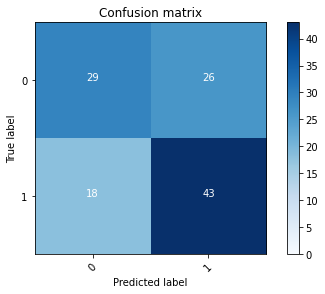

2022-08-22 16:51:51 - [Epoch Train: 8] loss: 0.6833, auc: 0.6083, acc: 0.5875, time: 24.00 s            
2022-08-22 16:51:51 - [Epoch Valid: 8] loss: 0.6832, auc: 0.6379, acc: 0.6190, time: 6.00 s
2022-08-22 16:51:51 - acc improved from 0.6032 to 0.6190. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e8-loss0.683-acc0.619-auc0.638.pth'


  8%|███▍                                       | 8/100 [04:11<48:16, 31.48s/it]

2022-08-22 16:51:51 - EPOCH: 9
2022-08-22 16:51:51 - Train Step 10/480, train_loss: 0.6708
2022-08-22 16:51:52 - Train Step 20/480, train_loss: 0.6651
2022-08-22 16:51:52 - Train Step 30/480, train_loss: 0.6628
2022-08-22 16:51:53 - Train Step 40/480, train_loss: 0.6706
2022-08-22 16:51:53 - Train Step 50/480, train_loss: 0.6711
2022-08-22 16:51:54 - Train Step 60/480, train_loss: 0.6682
2022-08-22 16:51:54 - Train Step 70/480, train_loss: 0.6759
2022-08-22 16:51:55 - Train Step 80/480, train_loss: 0.6777
2022-08-22 16:51:56 - Train Step 90/480, train_loss: 0.6772
2022-08-22 16:51:56 - Train Step 100/480, train_loss: 0.6746
2022-08-22 16:51:57 - Train Step 110/480, train_loss: 0.6723
2022-08-22 16:51:57 - Train Step 120/480, train_loss: 0.6739
2022-08-22 16:51:58 - Train Step 130/480, train_loss: 0.6730
2022-08-22 16:51:58 - Train Step 140/480, train_loss: 0.6739
2022-08-22 16:51:59 - Train Step 150/480, train_loss: 0.6749
2022-08-22 16:51:59 - Train Step 160/480, train_loss: 0.6754
20

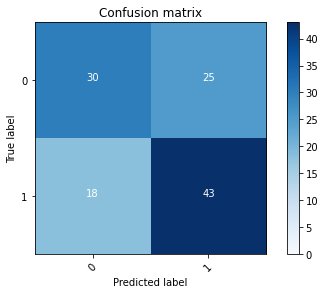

2022-08-22 16:52:22 - [Epoch Train: 9] loss: 0.6807, auc: 0.6056, acc: 0.5625, time: 24.00 s            
2022-08-22 16:52:22 - [Epoch Valid: 9] loss: 0.6815, auc: 0.6429, acc: 0.6349, time: 6.00 s
2022-08-22 16:52:22 - acc improved from 0.6190 to 0.6349. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e9-loss0.682-acc0.635-auc0.643.pth'


  9%|███▊                                       | 9/100 [04:42<47:41, 31.45s/it]

2022-08-22 16:52:22 - EPOCH: 10
2022-08-22 16:52:23 - Train Step 10/480, train_loss: 0.7211
2022-08-22 16:52:23 - Train Step 20/480, train_loss: 0.7018
2022-08-22 16:52:24 - Train Step 30/480, train_loss: 0.6881
2022-08-22 16:52:24 - Train Step 40/480, train_loss: 0.6832
2022-08-22 16:52:25 - Train Step 50/480, train_loss: 0.6912
2022-08-22 16:52:25 - Train Step 60/480, train_loss: 0.6831
2022-08-22 16:52:26 - Train Step 70/480, train_loss: 0.6757
2022-08-22 16:52:26 - Train Step 80/480, train_loss: 0.6741
2022-08-22 16:52:27 - Train Step 90/480, train_loss: 0.6771
2022-08-22 16:52:27 - Train Step 100/480, train_loss: 0.6744
2022-08-22 16:52:28 - Train Step 110/480, train_loss: 0.6813
2022-08-22 16:52:28 - Train Step 120/480, train_loss: 0.6829
2022-08-22 16:52:29 - Train Step 130/480, train_loss: 0.6845
2022-08-22 16:52:29 - Train Step 140/480, train_loss: 0.6845
2022-08-22 16:52:30 - Train Step 150/480, train_loss: 0.6846
2022-08-22 16:52:30 - Train Step 160/480, train_loss: 0.6848
2

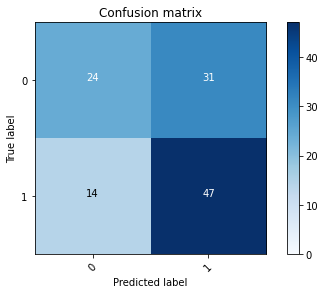

2022-08-22 16:52:54 - [Epoch Train: 10] loss: 0.6767, auc: 0.6443, acc: 0.6208, time: 24.00 s            
2022-08-22 16:52:54 - [Epoch Valid: 10] loss: 0.6805, auc: 0.6390, acc: 0.5952, time: 6.00 s


 10%|████▏                                     | 10/100 [05:14<47:08, 31.43s/it]

2022-08-22 16:52:54 - EPOCH: 11
2022-08-22 16:52:54 - Train Step 10/480, train_loss: 0.6299
2022-08-22 16:52:55 - Train Step 20/480, train_loss: 0.6206
2022-08-22 16:52:55 - Train Step 30/480, train_loss: 0.6278
2022-08-22 16:52:56 - Train Step 40/480, train_loss: 0.6253
2022-08-22 16:52:56 - Train Step 50/480, train_loss: 0.6260
2022-08-22 16:52:57 - Train Step 60/480, train_loss: 0.6366
2022-08-22 16:52:57 - Train Step 70/480, train_loss: 0.6458
2022-08-22 16:52:58 - Train Step 80/480, train_loss: 0.6507
2022-08-22 16:52:58 - Train Step 90/480, train_loss: 0.6534
2022-08-22 16:52:59 - Train Step 100/480, train_loss: 0.6527
2022-08-22 16:52:59 - Train Step 110/480, train_loss: 0.6563
2022-08-22 16:53:00 - Train Step 120/480, train_loss: 0.6564
2022-08-22 16:53:00 - Train Step 130/480, train_loss: 0.6568
2022-08-22 16:53:01 - Train Step 140/480, train_loss: 0.6594
2022-08-22 16:53:01 - Train Step 150/480, train_loss: 0.6628
2022-08-22 16:53:02 - Train Step 160/480, train_loss: 0.6600
2

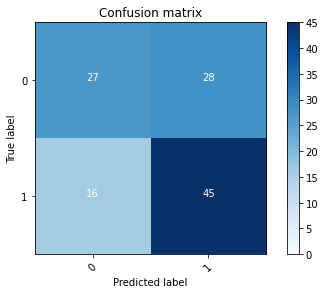

2022-08-22 16:53:25 - [Epoch Train: 11] loss: 0.6717, auc: 0.6357, acc: 0.6104, time: 24.00 s            
2022-08-22 16:53:25 - [Epoch Valid: 11] loss: 0.6766, auc: 0.6456, acc: 0.6190, time: 6.00 s


 11%|████▌                                     | 11/100 [05:45<46:41, 31.48s/it]

2022-08-22 16:53:25 - EPOCH: 12
2022-08-22 16:53:26 - Train Step 10/480, train_loss: 0.7181
2022-08-22 16:53:26 - Train Step 20/480, train_loss: 0.6775
2022-08-22 16:53:27 - Train Step 30/480, train_loss: 0.6736
2022-08-22 16:53:27 - Train Step 40/480, train_loss: 0.6666
2022-08-22 16:53:28 - Train Step 50/480, train_loss: 0.6509
2022-08-22 16:53:28 - Train Step 60/480, train_loss: 0.6581
2022-08-22 16:53:29 - Train Step 70/480, train_loss: 0.6532
2022-08-22 16:53:29 - Train Step 80/480, train_loss: 0.6515
2022-08-22 16:53:30 - Train Step 90/480, train_loss: 0.6498
2022-08-22 16:53:30 - Train Step 100/480, train_loss: 0.6475
2022-08-22 16:53:31 - Train Step 110/480, train_loss: 0.6488
2022-08-22 16:53:31 - Train Step 120/480, train_loss: 0.6525
2022-08-22 16:53:32 - Train Step 130/480, train_loss: 0.6508
2022-08-22 16:53:33 - Train Step 140/480, train_loss: 0.6514
2022-08-22 16:53:33 - Train Step 150/480, train_loss: 0.6534
2022-08-22 16:53:33 - Train Step 160/480, train_loss: 0.6537
2

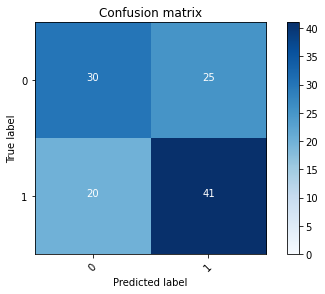

2022-08-22 16:53:57 - [Epoch Train: 12] loss: 0.6617, auc: 0.6898, acc: 0.6458, time: 24.00 s            
2022-08-22 16:53:57 - [Epoch Valid: 12] loss: 0.6731, auc: 0.6465, acc: 0.6111, time: 6.00 s


 12%|█████                                     | 12/100 [06:17<46:09, 31.47s/it]

2022-08-22 16:53:57 - EPOCH: 13
2022-08-22 16:53:57 - Train Step 10/480, train_loss: 0.6622
2022-08-22 16:53:58 - Train Step 20/480, train_loss: 0.6643
2022-08-22 16:53:58 - Train Step 30/480, train_loss: 0.6693
2022-08-22 16:53:59 - Train Step 40/480, train_loss: 0.6803
2022-08-22 16:53:59 - Train Step 50/480, train_loss: 0.6787
2022-08-22 16:54:00 - Train Step 60/480, train_loss: 0.6718
2022-08-22 16:54:00 - Train Step 70/480, train_loss: 0.6633
2022-08-22 16:54:01 - Train Step 80/480, train_loss: 0.6650
2022-08-22 16:54:01 - Train Step 90/480, train_loss: 0.6678
2022-08-22 16:54:02 - Train Step 100/480, train_loss: 0.6625
2022-08-22 16:54:02 - Train Step 110/480, train_loss: 0.6627
2022-08-22 16:54:03 - Train Step 120/480, train_loss: 0.6626
2022-08-22 16:54:03 - Train Step 130/480, train_loss: 0.6615
2022-08-22 16:54:04 - Train Step 140/480, train_loss: 0.6660
2022-08-22 16:54:04 - Train Step 150/480, train_loss: 0.6638
2022-08-22 16:54:05 - Train Step 160/480, train_loss: 0.6650
2

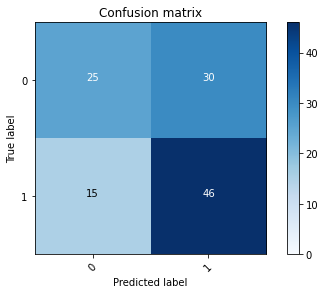

2022-08-22 16:54:28 - [Epoch Train: 13] loss: 0.6567, auc: 0.6917, acc: 0.6250, time: 24.00 s            
2022-08-22 16:54:28 - [Epoch Valid: 13] loss: 0.6732, auc: 0.6480, acc: 0.6032, time: 6.00 s


 13%|█████▍                                    | 13/100 [06:48<45:40, 31.50s/it]

2022-08-22 16:54:28 - EPOCH: 14
2022-08-22 16:54:29 - Train Step 10/480, train_loss: 0.6835
2022-08-22 16:54:29 - Train Step 20/480, train_loss: 0.6713
2022-08-22 16:54:30 - Train Step 30/480, train_loss: 0.6731
2022-08-22 16:54:30 - Train Step 40/480, train_loss: 0.6693
2022-08-22 16:54:31 - Train Step 50/480, train_loss: 0.6807
2022-08-22 16:54:31 - Train Step 60/480, train_loss: 0.6738
2022-08-22 16:54:32 - Train Step 70/480, train_loss: 0.6817
2022-08-22 16:54:32 - Train Step 80/480, train_loss: 0.6741
2022-08-22 16:54:33 - Train Step 90/480, train_loss: 0.6757
2022-08-22 16:54:34 - Train Step 100/480, train_loss: 0.6714
2022-08-22 16:54:34 - Train Step 110/480, train_loss: 0.6712
2022-08-22 16:54:34 - Train Step 120/480, train_loss: 0.6725
2022-08-22 16:54:35 - Train Step 130/480, train_loss: 0.6705
2022-08-22 16:54:35 - Train Step 140/480, train_loss: 0.6682
2022-08-22 16:54:36 - Train Step 150/480, train_loss: 0.6666
2022-08-22 16:54:36 - Train Step 160/480, train_loss: 0.6641
2

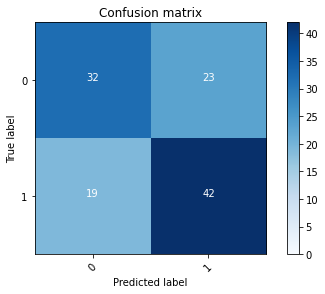

2022-08-22 16:55:00 - [Epoch Train: 14] loss: 0.6530, auc: 0.6995, acc: 0.6479, time: 24.00 s            
2022-08-22 16:55:00 - [Epoch Valid: 14] loss: 0.6697, auc: 0.6486, acc: 0.6429, time: 6.00 s
2022-08-22 16:55:00 - acc improved from 0.6349 to 0.6429. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e14-loss0.670-acc0.643-auc0.649.pth'


 14%|█████▉                                    | 14/100 [07:20<45:07, 31.49s/it]

2022-08-22 16:55:00 - EPOCH: 15
2022-08-22 16:55:00 - Train Step 10/480, train_loss: 0.6441
2022-08-22 16:55:01 - Train Step 20/480, train_loss: 0.6534
2022-08-22 16:55:01 - Train Step 30/480, train_loss: 0.6378
2022-08-22 16:55:02 - Train Step 40/480, train_loss: 0.6449
2022-08-22 16:55:02 - Train Step 50/480, train_loss: 0.6537
2022-08-22 16:55:03 - Train Step 60/480, train_loss: 0.6411
2022-08-22 16:55:03 - Train Step 70/480, train_loss: 0.6382
2022-08-22 16:55:04 - Train Step 80/480, train_loss: 0.6344
2022-08-22 16:55:04 - Train Step 90/480, train_loss: 0.6361
2022-08-22 16:55:05 - Train Step 100/480, train_loss: 0.6273
2022-08-22 16:55:05 - Train Step 110/480, train_loss: 0.6252
2022-08-22 16:55:06 - Train Step 120/480, train_loss: 0.6283
2022-08-22 16:55:06 - Train Step 130/480, train_loss: 0.6439
2022-08-22 16:55:07 - Train Step 140/480, train_loss: 0.6431
2022-08-22 16:55:07 - Train Step 150/480, train_loss: 0.6379
2022-08-22 16:55:08 - Train Step 160/480, train_loss: 0.6372
2

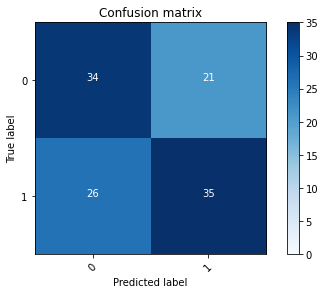

2022-08-22 16:55:31 - [Epoch Train: 15] loss: 0.6397, auc: 0.7346, acc: 0.6708, time: 24.00 s            
2022-08-22 16:55:31 - [Epoch Valid: 15] loss: 0.6666, auc: 0.6408, acc: 0.6032, time: 6.00 s


 15%|██████▎                                   | 15/100 [07:51<44:27, 31.38s/it]

2022-08-22 16:55:31 - EPOCH: 16
2022-08-22 16:55:31 - Train Step 10/480, train_loss: 0.5471
2022-08-22 16:55:32 - Train Step 20/480, train_loss: 0.5995
2022-08-22 16:55:32 - Train Step 30/480, train_loss: 0.6063
2022-08-22 16:55:33 - Train Step 40/480, train_loss: 0.5986
2022-08-22 16:55:33 - Train Step 50/480, train_loss: 0.5883
2022-08-22 16:55:34 - Train Step 60/480, train_loss: 0.5999
2022-08-22 16:55:34 - Train Step 70/480, train_loss: 0.6172
2022-08-22 16:55:35 - Train Step 80/480, train_loss: 0.6189
2022-08-22 16:55:35 - Train Step 90/480, train_loss: 0.6126
2022-08-22 16:55:36 - Train Step 100/480, train_loss: 0.6146
2022-08-22 16:55:36 - Train Step 110/480, train_loss: 0.6210
2022-08-22 16:55:37 - Train Step 120/480, train_loss: 0.6176
2022-08-22 16:55:37 - Train Step 130/480, train_loss: 0.6167
2022-08-22 16:55:38 - Train Step 140/480, train_loss: 0.6202
2022-08-22 16:55:38 - Train Step 150/480, train_loss: 0.6221
2022-08-22 16:55:39 - Train Step 160/480, train_loss: 0.6186
2

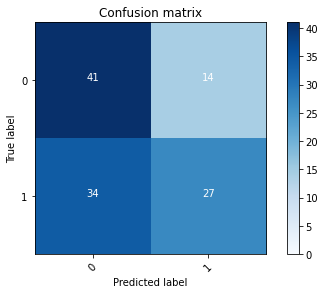

2022-08-22 16:56:02 - [Epoch Train: 16] loss: 0.6357, auc: 0.7308, acc: 0.6729, time: 24.00 s            
2022-08-22 16:56:02 - [Epoch Valid: 16] loss: 0.6670, auc: 0.6346, acc: 0.6032, time: 6.00 s


 16%|██████▋                                   | 16/100 [08:22<43:59, 31.42s/it]

2022-08-22 16:56:02 - EPOCH: 17
2022-08-22 16:56:03 - Train Step 10/480, train_loss: 0.6276
2022-08-22 16:56:04 - Train Step 20/480, train_loss: 0.6194
2022-08-22 16:56:04 - Train Step 30/480, train_loss: 0.6037
2022-08-22 16:56:05 - Train Step 40/480, train_loss: 0.6051
2022-08-22 16:56:05 - Train Step 50/480, train_loss: 0.6114
2022-08-22 16:56:06 - Train Step 60/480, train_loss: 0.6188
2022-08-22 16:56:06 - Train Step 70/480, train_loss: 0.6208
2022-08-22 16:56:07 - Train Step 80/480, train_loss: 0.6183
2022-08-22 16:56:07 - Train Step 90/480, train_loss: 0.6234
2022-08-22 16:56:08 - Train Step 100/480, train_loss: 0.6200
2022-08-22 16:56:08 - Train Step 110/480, train_loss: 0.6268
2022-08-22 16:56:09 - Train Step 120/480, train_loss: 0.6254
2022-08-22 16:56:09 - Train Step 130/480, train_loss: 0.6297
2022-08-22 16:56:10 - Train Step 140/480, train_loss: 0.6331
2022-08-22 16:56:10 - Train Step 150/480, train_loss: 0.6315
2022-08-22 16:56:11 - Train Step 160/480, train_loss: 0.6270
2

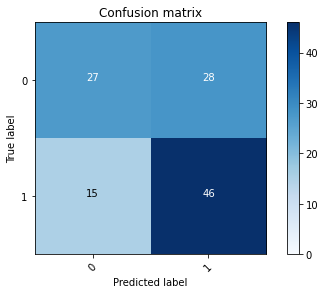

2022-08-22 16:56:34 - [Epoch Train: 17] loss: 0.6294, auc: 0.7371, acc: 0.6854, time: 24.00 s            
2022-08-22 16:56:34 - [Epoch Valid: 17] loss: 0.6683, auc: 0.6280, acc: 0.6270, time: 6.00 s


 17%|███████▏                                  | 17/100 [08:54<43:26, 31.40s/it]

2022-08-22 16:56:34 - EPOCH: 18
2022-08-22 16:56:34 - Train Step 10/480, train_loss: 0.5963
2022-08-22 16:56:35 - Train Step 20/480, train_loss: 0.5807
2022-08-22 16:56:35 - Train Step 30/480, train_loss: 0.6366
2022-08-22 16:56:36 - Train Step 40/480, train_loss: 0.6183
2022-08-22 16:56:36 - Train Step 50/480, train_loss: 0.6127
2022-08-22 16:56:37 - Train Step 60/480, train_loss: 0.6097
2022-08-22 16:56:37 - Train Step 70/480, train_loss: 0.6238
2022-08-22 16:56:38 - Train Step 80/480, train_loss: 0.6140
2022-08-22 16:56:38 - Train Step 90/480, train_loss: 0.6138
2022-08-22 16:56:39 - Train Step 100/480, train_loss: 0.6137
2022-08-22 16:56:39 - Train Step 110/480, train_loss: 0.6074
2022-08-22 16:56:40 - Train Step 120/480, train_loss: 0.6065
2022-08-22 16:56:40 - Train Step 130/480, train_loss: 0.6117
2022-08-22 16:56:41 - Train Step 140/480, train_loss: 0.6187
2022-08-22 16:56:41 - Train Step 150/480, train_loss: 0.6122
2022-08-22 16:56:42 - Train Step 160/480, train_loss: 0.6077
2

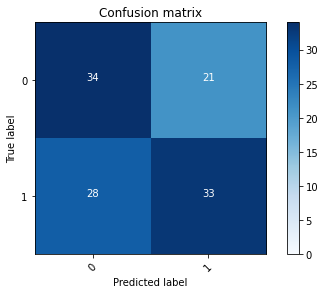

2022-08-22 16:57:05 - [Epoch Train: 18] loss: 0.6222, auc: 0.7449, acc: 0.6750, time: 24.00 s            
2022-08-22 16:57:05 - [Epoch Valid: 18] loss: 0.6653, auc: 0.6295, acc: 0.5952, time: 6.00 s


 18%|███████▌                                  | 18/100 [09:25<42:57, 31.43s/it]

2022-08-22 16:57:05 - EPOCH: 19
2022-08-22 16:57:06 - Train Step 10/480, train_loss: 0.6443
2022-08-22 16:57:06 - Train Step 20/480, train_loss: 0.6228
2022-08-22 16:57:07 - Train Step 30/480, train_loss: 0.6037
2022-08-22 16:57:07 - Train Step 40/480, train_loss: 0.6209
2022-08-22 16:57:08 - Train Step 50/480, train_loss: 0.6096
2022-08-22 16:57:08 - Train Step 60/480, train_loss: 0.6082
2022-08-22 16:57:09 - Train Step 70/480, train_loss: 0.6041
2022-08-22 16:57:09 - Train Step 80/480, train_loss: 0.5995
2022-08-22 16:57:10 - Train Step 90/480, train_loss: 0.5976
2022-08-22 16:57:10 - Train Step 100/480, train_loss: 0.5928
2022-08-22 16:57:11 - Train Step 110/480, train_loss: 0.5969
2022-08-22 16:57:11 - Train Step 120/480, train_loss: 0.6082
2022-08-22 16:57:12 - Train Step 130/480, train_loss: 0.6059
2022-08-22 16:57:12 - Train Step 140/480, train_loss: 0.6078
2022-08-22 16:57:13 - Train Step 150/480, train_loss: 0.6107
2022-08-22 16:57:13 - Train Step 160/480, train_loss: 0.6078
2

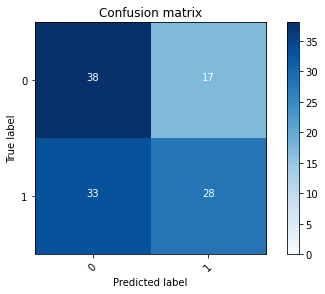

2022-08-22 16:57:36 - [Epoch Train: 19] loss: 0.6119, auc: 0.7665, acc: 0.7021, time: 24.00 s            
2022-08-22 16:57:36 - [Epoch Valid: 19] loss: 0.6648, auc: 0.6256, acc: 0.5873, time: 6.00 s


 19%|███████▉                                  | 19/100 [09:56<42:16, 31.32s/it]

2022-08-22 16:57:36 - EPOCH: 20
2022-08-22 16:57:37 - Train Step 10/480, train_loss: 0.4977
2022-08-22 16:57:37 - Train Step 20/480, train_loss: 0.5612
2022-08-22 16:57:38 - Train Step 30/480, train_loss: 0.5203
2022-08-22 16:57:38 - Train Step 40/480, train_loss: 0.5327
2022-08-22 16:57:39 - Train Step 50/480, train_loss: 0.5427
2022-08-22 16:57:39 - Train Step 60/480, train_loss: 0.5462
2022-08-22 16:57:40 - Train Step 70/480, train_loss: 0.5619
2022-08-22 16:57:40 - Train Step 80/480, train_loss: 0.5591
2022-08-22 16:57:41 - Train Step 90/480, train_loss: 0.5623
2022-08-22 16:57:41 - Train Step 100/480, train_loss: 0.5781
2022-08-22 16:57:42 - Train Step 110/480, train_loss: 0.5812
2022-08-22 16:57:42 - Train Step 120/480, train_loss: 0.5888
2022-08-22 16:57:43 - Train Step 130/480, train_loss: 0.5872
2022-08-22 16:57:43 - Train Step 140/480, train_loss: 0.5899
2022-08-22 16:57:44 - Train Step 150/480, train_loss: 0.5884
2022-08-22 16:57:44 - Train Step 160/480, train_loss: 0.5882
2

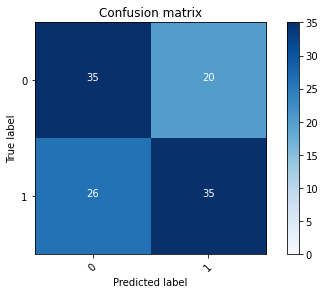

2022-08-22 16:58:07 - [Epoch Train: 20] loss: 0.5987, auc: 0.7796, acc: 0.6917, time: 24.00 s            
2022-08-22 16:58:07 - [Epoch Valid: 20] loss: 0.6654, auc: 0.6268, acc: 0.6190, time: 6.00 s


 20%|████████▍                                 | 20/100 [10:27<41:37, 31.22s/it]

2022-08-22 16:58:07 - EPOCH: 21
2022-08-22 16:58:08 - Train Step 10/480, train_loss: 0.6895
2022-08-22 16:58:08 - Train Step 20/480, train_loss: 0.6624
2022-08-22 16:58:09 - Train Step 30/480, train_loss: 0.5991
2022-08-22 16:58:09 - Train Step 40/480, train_loss: 0.5874
2022-08-22 16:58:10 - Train Step 50/480, train_loss: 0.5652
2022-08-22 16:58:10 - Train Step 60/480, train_loss: 0.5729
2022-08-22 16:58:11 - Train Step 70/480, train_loss: 0.5718
2022-08-22 16:58:11 - Train Step 80/480, train_loss: 0.5913
2022-08-22 16:58:12 - Train Step 90/480, train_loss: 0.5803
2022-08-22 16:58:12 - Train Step 100/480, train_loss: 0.5767
2022-08-22 16:58:13 - Train Step 110/480, train_loss: 0.5738
2022-08-22 16:58:13 - Train Step 120/480, train_loss: 0.5741
2022-08-22 16:58:14 - Train Step 130/480, train_loss: 0.5868
2022-08-22 16:58:14 - Train Step 140/480, train_loss: 0.5960
2022-08-22 16:58:15 - Train Step 150/480, train_loss: 0.5924
2022-08-22 16:58:15 - Train Step 160/480, train_loss: 0.5831
2

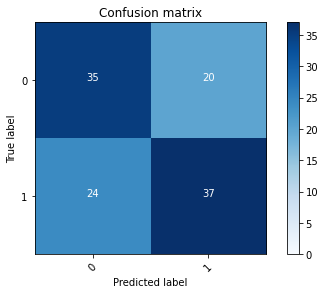

2022-08-22 16:58:38 - [Epoch Train: 21] loss: 0.5929, auc: 0.7815, acc: 0.7000, time: 24.00 s            
2022-08-22 16:58:38 - [Epoch Valid: 21] loss: 0.6658, auc: 0.6203, acc: 0.6349, time: 6.00 s


 21%|████████▊                                 | 21/100 [10:58<41:07, 31.23s/it]

2022-08-22 16:58:38 - EPOCH: 22
2022-08-22 16:58:39 - Train Step 10/480, train_loss: 0.6374
2022-08-22 16:58:40 - Train Step 20/480, train_loss: 0.6199
2022-08-22 16:58:40 - Train Step 30/480, train_loss: 0.5986
2022-08-22 16:58:41 - Train Step 40/480, train_loss: 0.5693
2022-08-22 16:58:41 - Train Step 50/480, train_loss: 0.5707
2022-08-22 16:58:42 - Train Step 60/480, train_loss: 0.5929
2022-08-22 16:58:42 - Train Step 70/480, train_loss: 0.5993
2022-08-22 16:58:43 - Train Step 80/480, train_loss: 0.6028
2022-08-22 16:58:43 - Train Step 90/480, train_loss: 0.6039
2022-08-22 16:58:44 - Train Step 100/480, train_loss: 0.6102
2022-08-22 16:58:44 - Train Step 110/480, train_loss: 0.6063
2022-08-22 16:58:45 - Train Step 120/480, train_loss: 0.5990
2022-08-22 16:58:45 - Train Step 130/480, train_loss: 0.6032
2022-08-22 16:58:46 - Train Step 140/480, train_loss: 0.6031
2022-08-22 16:58:46 - Train Step 150/480, train_loss: 0.5988
2022-08-22 16:58:47 - Train Step 160/480, train_loss: 0.6023
2

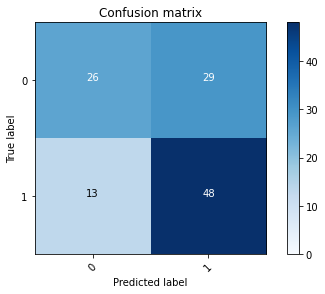

2022-08-22 16:59:10 - [Epoch Train: 22] loss: 0.5790, auc: 0.8032, acc: 0.7250, time: 24.00 s            
2022-08-22 16:59:10 - [Epoch Valid: 22] loss: 0.6749, auc: 0.6092, acc: 0.6429, time: 6.00 s
2022-08-22 16:59:10 - acc improved from 0.6429 to 0.6429. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e22-loss0.675-acc0.643-auc0.609.pth'


 22%|█████████▏                                | 22/100 [11:30<40:34, 31.21s/it]

2022-08-22 16:59:10 - EPOCH: 23
2022-08-22 16:59:10 - Train Step 10/480, train_loss: 0.5762
2022-08-22 16:59:11 - Train Step 20/480, train_loss: 0.5478
2022-08-22 16:59:11 - Train Step 30/480, train_loss: 0.5303
2022-08-22 16:59:12 - Train Step 40/480, train_loss: 0.5253
2022-08-22 16:59:12 - Train Step 50/480, train_loss: 0.5359
2022-08-22 16:59:13 - Train Step 60/480, train_loss: 0.5224
2022-08-22 16:59:13 - Train Step 70/480, train_loss: 0.5242
2022-08-22 16:59:14 - Train Step 80/480, train_loss: 0.5332
2022-08-22 16:59:14 - Train Step 90/480, train_loss: 0.5384
2022-08-22 16:59:15 - Train Step 100/480, train_loss: 0.5427
2022-08-22 16:59:15 - Train Step 110/480, train_loss: 0.5407
2022-08-22 16:59:16 - Train Step 120/480, train_loss: 0.5440
2022-08-22 16:59:16 - Train Step 130/480, train_loss: 0.5529
2022-08-22 16:59:17 - Train Step 140/480, train_loss: 0.5639
2022-08-22 16:59:17 - Train Step 150/480, train_loss: 0.5591
2022-08-22 16:59:18 - Train Step 160/480, train_loss: 0.5559
2

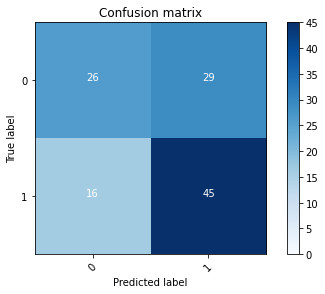

2022-08-22 16:59:41 - [Epoch Train: 23] loss: 0.5719, auc: 0.8016, acc: 0.7104, time: 24.00 s            
2022-08-22 16:59:41 - [Epoch Valid: 23] loss: 0.6712, auc: 0.6116, acc: 0.6190, time: 6.00 s


 23%|█████████▋                                | 23/100 [12:01<40:04, 31.23s/it]

2022-08-22 16:59:41 - EPOCH: 24
2022-08-22 16:59:42 - Train Step 10/480, train_loss: 0.5191
2022-08-22 16:59:42 - Train Step 20/480, train_loss: 0.5428
2022-08-22 16:59:43 - Train Step 30/480, train_loss: 0.5216
2022-08-22 16:59:43 - Train Step 40/480, train_loss: 0.5362
2022-08-22 16:59:44 - Train Step 50/480, train_loss: 0.5591
2022-08-22 16:59:44 - Train Step 60/480, train_loss: 0.5545
2022-08-22 16:59:45 - Train Step 70/480, train_loss: 0.5579
2022-08-22 16:59:45 - Train Step 80/480, train_loss: 0.5516
2022-08-22 16:59:46 - Train Step 90/480, train_loss: 0.5379
2022-08-22 16:59:46 - Train Step 100/480, train_loss: 0.5410
2022-08-22 16:59:47 - Train Step 110/480, train_loss: 0.5438
2022-08-22 16:59:47 - Train Step 120/480, train_loss: 0.5523
2022-08-22 16:59:48 - Train Step 130/480, train_loss: 0.5570
2022-08-22 16:59:48 - Train Step 140/480, train_loss: 0.5591
2022-08-22 16:59:49 - Train Step 150/480, train_loss: 0.5701
2022-08-22 16:59:49 - Train Step 160/480, train_loss: 0.5618
2

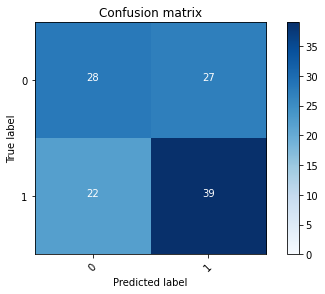

2022-08-22 17:00:12 - [Epoch Train: 24] loss: 0.5531, auc: 0.8220, acc: 0.7354, time: 24.00 s            
2022-08-22 17:00:12 - [Epoch Valid: 24] loss: 0.6725, auc: 0.6092, acc: 0.5873, time: 6.00 s


 24%|██████████                                | 24/100 [12:32<39:36, 31.27s/it]

2022-08-22 17:00:12 - EPOCH: 25
2022-08-22 17:00:13 - Train Step 10/480, train_loss: 0.4674
2022-08-22 17:00:13 - Train Step 20/480, train_loss: 0.6099
2022-08-22 17:00:14 - Train Step 30/480, train_loss: 0.6177
2022-08-22 17:00:14 - Train Step 40/480, train_loss: 0.5920
2022-08-22 17:00:15 - Train Step 50/480, train_loss: 0.5750
2022-08-22 17:00:15 - Train Step 60/480, train_loss: 0.5782
2022-08-22 17:00:16 - Train Step 70/480, train_loss: 0.5847
2022-08-22 17:00:16 - Train Step 80/480, train_loss: 0.5848
2022-08-22 17:00:17 - Train Step 90/480, train_loss: 0.5811
2022-08-22 17:00:17 - Train Step 100/480, train_loss: 0.5736
2022-08-22 17:00:18 - Train Step 110/480, train_loss: 0.5731
2022-08-22 17:00:18 - Train Step 120/480, train_loss: 0.5796
2022-08-22 17:00:19 - Train Step 130/480, train_loss: 0.5717
2022-08-22 17:00:19 - Train Step 140/480, train_loss: 0.5646
2022-08-22 17:00:20 - Train Step 150/480, train_loss: 0.5633
2022-08-22 17:00:21 - Train Step 160/480, train_loss: 0.5670
2

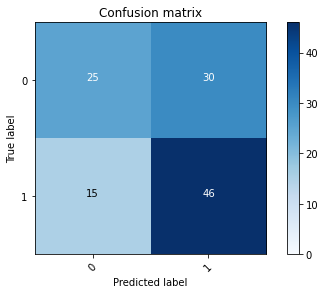

2022-08-22 17:00:44 - [Epoch Train: 25] loss: 0.5527, auc: 0.8209, acc: 0.7479, time: 24.00 s            
2022-08-22 17:00:44 - [Epoch Valid: 25] loss: 0.6813, auc: 0.6054, acc: 0.6190, time: 6.00 s


 25%|██████████▌                               | 25/100 [13:04<39:08, 31.31s/it]

2022-08-22 17:00:44 - EPOCH: 26
2022-08-22 17:00:44 - Train Step 10/480, train_loss: 0.5426
2022-08-22 17:00:45 - Train Step 20/480, train_loss: 0.6386
2022-08-22 17:00:45 - Train Step 30/480, train_loss: 0.6197
2022-08-22 17:00:46 - Train Step 40/480, train_loss: 0.6481
2022-08-22 17:00:46 - Train Step 50/480, train_loss: 0.6219
2022-08-22 17:00:47 - Train Step 60/480, train_loss: 0.6212
2022-08-22 17:00:47 - Train Step 70/480, train_loss: 0.5992
2022-08-22 17:00:48 - Train Step 80/480, train_loss: 0.5835
2022-08-22 17:00:48 - Train Step 90/480, train_loss: 0.5709
2022-08-22 17:00:49 - Train Step 100/480, train_loss: 0.5525
2022-08-22 17:00:49 - Train Step 110/480, train_loss: 0.5566
2022-08-22 17:00:50 - Train Step 120/480, train_loss: 0.5562
2022-08-22 17:00:50 - Train Step 130/480, train_loss: 0.5521
2022-08-22 17:00:51 - Train Step 140/480, train_loss: 0.5538
2022-08-22 17:00:51 - Train Step 150/480, train_loss: 0.5544
2022-08-22 17:00:52 - Train Step 160/480, train_loss: 0.5550
2

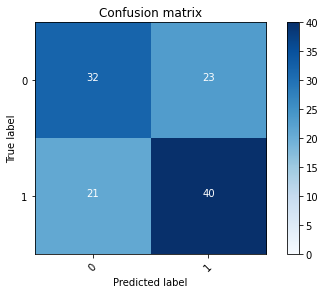

2022-08-22 17:01:15 - [Epoch Train: 26] loss: 0.5474, auc: 0.8198, acc: 0.7500, time: 24.00 s            
2022-08-22 17:01:15 - [Epoch Valid: 26] loss: 0.6764, auc: 0.6113, acc: 0.6270, time: 6.00 s


 26%|██████████▉                               | 26/100 [13:35<38:40, 31.35s/it]

2022-08-22 17:01:15 - EPOCH: 27
2022-08-22 17:01:16 - Train Step 10/480, train_loss: 0.4954
2022-08-22 17:01:16 - Train Step 20/480, train_loss: 0.5935
2022-08-22 17:01:17 - Train Step 30/480, train_loss: 0.5942
2022-08-22 17:01:17 - Train Step 40/480, train_loss: 0.5994
2022-08-22 17:01:18 - Train Step 50/480, train_loss: 0.5812
2022-08-22 17:01:18 - Train Step 60/480, train_loss: 0.5716
2022-08-22 17:01:19 - Train Step 70/480, train_loss: 0.5568
2022-08-22 17:01:19 - Train Step 80/480, train_loss: 0.5382
2022-08-22 17:01:20 - Train Step 90/480, train_loss: 0.5367
2022-08-22 17:01:20 - Train Step 100/480, train_loss: 0.5339
2022-08-22 17:01:21 - Train Step 110/480, train_loss: 0.5287
2022-08-22 17:01:21 - Train Step 120/480, train_loss: 0.5257
2022-08-22 17:01:22 - Train Step 130/480, train_loss: 0.5244
2022-08-22 17:01:22 - Train Step 140/480, train_loss: 0.5192
2022-08-22 17:01:23 - Train Step 150/480, train_loss: 0.5140
2022-08-22 17:01:23 - Train Step 160/480, train_loss: 0.5192
2

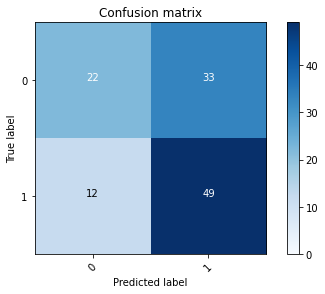

2022-08-22 17:01:46 - [Epoch Train: 27] loss: 0.5290, auc: 0.8430, acc: 0.7625, time: 24.00 s            
2022-08-22 17:01:46 - [Epoch Valid: 27] loss: 0.6962, auc: 0.6089, acc: 0.6190, time: 6.00 s


 27%|███████████▎                              | 27/100 [14:06<38:07, 31.34s/it]

2022-08-22 17:01:46 - EPOCH: 28
2022-08-22 17:01:47 - Train Step 10/480, train_loss: 0.4785
2022-08-22 17:01:48 - Train Step 20/480, train_loss: 0.4476
2022-08-22 17:01:48 - Train Step 30/480, train_loss: 0.4825
2022-08-22 17:01:49 - Train Step 40/480, train_loss: 0.4979
2022-08-22 17:01:49 - Train Step 50/480, train_loss: 0.5069
2022-08-22 17:01:50 - Train Step 60/480, train_loss: 0.4932
2022-08-22 17:01:50 - Train Step 70/480, train_loss: 0.5323
2022-08-22 17:01:51 - Train Step 80/480, train_loss: 0.5258
2022-08-22 17:01:51 - Train Step 90/480, train_loss: 0.5221
2022-08-22 17:01:51 - Train Step 100/480, train_loss: 0.5202
2022-08-22 17:01:52 - Train Step 110/480, train_loss: 0.5262
2022-08-22 17:01:52 - Train Step 120/480, train_loss: 0.5314
2022-08-22 17:01:53 - Train Step 130/480, train_loss: 0.5317
2022-08-22 17:01:53 - Train Step 140/480, train_loss: 0.5279
2022-08-22 17:01:54 - Train Step 150/480, train_loss: 0.5370
2022-08-22 17:01:54 - Train Step 160/480, train_loss: 0.5266
2

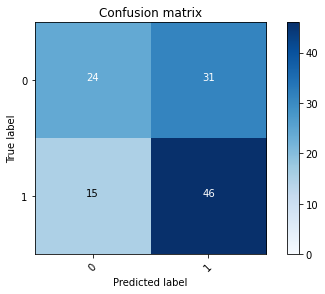

2022-08-22 17:02:17 - [Epoch Train: 28] loss: 0.5234, auc: 0.8434, acc: 0.7667, time: 24.00 s            
2022-08-22 17:02:17 - [Epoch Valid: 28] loss: 0.6931, auc: 0.6003, acc: 0.6111, time: 6.00 s


 28%|███████████▊                              | 28/100 [14:37<37:29, 31.24s/it]

2022-08-22 17:02:17 - EPOCH: 29
2022-08-22 17:02:18 - Train Step 10/480, train_loss: 0.5018
2022-08-22 17:02:19 - Train Step 20/480, train_loss: 0.5202
2022-08-22 17:02:19 - Train Step 30/480, train_loss: 0.5353
2022-08-22 17:02:20 - Train Step 40/480, train_loss: 0.5551
2022-08-22 17:02:20 - Train Step 50/480, train_loss: 0.5395
2022-08-22 17:02:21 - Train Step 60/480, train_loss: 0.5234
2022-08-22 17:02:21 - Train Step 70/480, train_loss: 0.5013
2022-08-22 17:02:21 - Train Step 80/480, train_loss: 0.5009
2022-08-22 17:02:22 - Train Step 90/480, train_loss: 0.4838
2022-08-22 17:02:23 - Train Step 100/480, train_loss: 0.4980
2022-08-22 17:02:23 - Train Step 110/480, train_loss: 0.4937
2022-08-22 17:02:24 - Train Step 120/480, train_loss: 0.5061
2022-08-22 17:02:24 - Train Step 130/480, train_loss: 0.5075
2022-08-22 17:02:25 - Train Step 140/480, train_loss: 0.5272
2022-08-22 17:02:25 - Train Step 150/480, train_loss: 0.5275
2022-08-22 17:02:26 - Train Step 160/480, train_loss: 0.5224
2

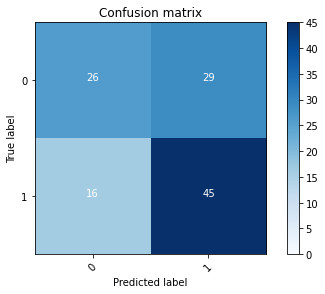

2022-08-22 17:02:49 - [Epoch Train: 29] loss: 0.5085, auc: 0.8481, acc: 0.7771, time: 24.00 s            
2022-08-22 17:02:49 - [Epoch Valid: 29] loss: 0.6922, auc: 0.6003, acc: 0.6190, time: 6.00 s


 29%|████████████▏                             | 29/100 [15:09<37:02, 31.30s/it]

2022-08-22 17:02:49 - EPOCH: 30
2022-08-22 17:02:50 - Train Step 10/480, train_loss: 0.4490
2022-08-22 17:02:50 - Train Step 20/480, train_loss: 0.4682
2022-08-22 17:02:50 - Train Step 30/480, train_loss: 0.4610
2022-08-22 17:02:51 - Train Step 40/480, train_loss: 0.4871
2022-08-22 17:02:51 - Train Step 50/480, train_loss: 0.5060
2022-08-22 17:02:52 - Train Step 60/480, train_loss: 0.5354
2022-08-22 17:02:52 - Train Step 70/480, train_loss: 0.5557
2022-08-22 17:02:53 - Train Step 80/480, train_loss: 0.5488
2022-08-22 17:02:54 - Train Step 90/480, train_loss: 0.5408
2022-08-22 17:02:54 - Train Step 100/480, train_loss: 0.5384
2022-08-22 17:02:55 - Train Step 110/480, train_loss: 0.5300
2022-08-22 17:02:55 - Train Step 120/480, train_loss: 0.5146
2022-08-22 17:02:56 - Train Step 130/480, train_loss: 0.5136
2022-08-22 17:02:56 - Train Step 140/480, train_loss: 0.5112
2022-08-22 17:02:57 - Train Step 150/480, train_loss: 0.5106
2022-08-22 17:02:57 - Train Step 160/480, train_loss: 0.5084
2

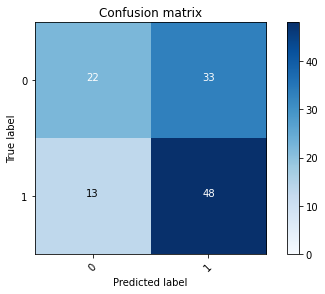

2022-08-22 17:03:20 - [Epoch Train: 30] loss: 0.5108, auc: 0.8460, acc: 0.7667, time: 24.00 s            
2022-08-22 17:03:20 - [Epoch Valid: 30] loss: 0.7052, auc: 0.5884, acc: 0.6111, time: 6.00 s


 30%|████████████▌                             | 30/100 [15:40<36:30, 31.30s/it]

2022-08-22 17:03:20 - EPOCH: 31
2022-08-22 17:03:21 - Train Step 10/480, train_loss: 0.5198
2022-08-22 17:03:21 - Train Step 20/480, train_loss: 0.4453
2022-08-22 17:03:22 - Train Step 30/480, train_loss: 0.4879
2022-08-22 17:03:22 - Train Step 40/480, train_loss: 0.4861
2022-08-22 17:03:23 - Train Step 50/480, train_loss: 0.4672
2022-08-22 17:03:23 - Train Step 60/480, train_loss: 0.4848
2022-08-22 17:03:24 - Train Step 70/480, train_loss: 0.4677
2022-08-22 17:03:24 - Train Step 80/480, train_loss: 0.4717
2022-08-22 17:03:25 - Train Step 90/480, train_loss: 0.4764
2022-08-22 17:03:25 - Train Step 100/480, train_loss: 0.4819
2022-08-22 17:03:26 - Train Step 110/480, train_loss: 0.4774
2022-08-22 17:03:26 - Train Step 120/480, train_loss: 0.4922
2022-08-22 17:03:27 - Train Step 130/480, train_loss: 0.4869
2022-08-22 17:03:27 - Train Step 140/480, train_loss: 0.4869
2022-08-22 17:03:28 - Train Step 150/480, train_loss: 0.4989
2022-08-22 17:03:28 - Train Step 160/480, train_loss: 0.4937
2

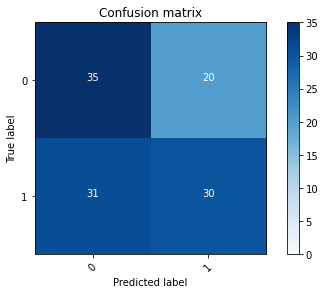

2022-08-22 17:03:51 - [Epoch Train: 31] loss: 0.4819, auc: 0.8757, acc: 0.7937, time: 24.00 s            
2022-08-22 17:03:51 - [Epoch Valid: 31] loss: 0.6928, auc: 0.5931, acc: 0.5714, time: 6.00 s


 31%|█████████████                             | 31/100 [16:11<35:58, 31.28s/it]

2022-08-22 17:03:51 - EPOCH: 32
2022-08-22 17:03:52 - Train Step 10/480, train_loss: 0.5469
2022-08-22 17:03:52 - Train Step 20/480, train_loss: 0.5288
2022-08-22 17:03:53 - Train Step 30/480, train_loss: 0.5786
2022-08-22 17:03:53 - Train Step 40/480, train_loss: 0.5738
2022-08-22 17:03:54 - Train Step 50/480, train_loss: 0.5321
2022-08-22 17:03:54 - Train Step 60/480, train_loss: 0.5316
2022-08-22 17:03:55 - Train Step 70/480, train_loss: 0.5105
2022-08-22 17:03:55 - Train Step 80/480, train_loss: 0.5007
2022-08-22 17:03:56 - Train Step 90/480, train_loss: 0.4975
2022-08-22 17:03:56 - Train Step 100/480, train_loss: 0.4788
2022-08-22 17:03:57 - Train Step 110/480, train_loss: 0.4767
2022-08-22 17:03:57 - Train Step 120/480, train_loss: 0.4710
2022-08-22 17:03:58 - Train Step 130/480, train_loss: 0.4897
2022-08-22 17:03:59 - Train Step 140/480, train_loss: 0.4854
2022-08-22 17:03:59 - Train Step 150/480, train_loss: 0.4797
2022-08-22 17:04:00 - Train Step 160/480, train_loss: 0.4838
2

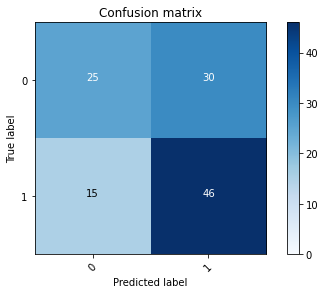

2022-08-22 17:04:23 - [Epoch Train: 32] loss: 0.4840, auc: 0.8654, acc: 0.7833, time: 24.00 s            
2022-08-22 17:04:23 - [Epoch Valid: 32] loss: 0.7068, auc: 0.5914, acc: 0.6190, time: 6.00 s


 32%|█████████████▍                            | 32/100 [16:43<35:25, 31.26s/it]

2022-08-22 17:04:23 - EPOCH: 33
2022-08-22 17:04:23 - Train Step 10/480, train_loss: 0.4302
2022-08-22 17:04:24 - Train Step 20/480, train_loss: 0.3533
2022-08-22 17:04:24 - Train Step 30/480, train_loss: 0.3995
2022-08-22 17:04:25 - Train Step 40/480, train_loss: 0.3745
2022-08-22 17:04:25 - Train Step 50/480, train_loss: 0.4141
2022-08-22 17:04:26 - Train Step 60/480, train_loss: 0.4447
2022-08-22 17:04:26 - Train Step 70/480, train_loss: 0.4369
2022-08-22 17:04:27 - Train Step 80/480, train_loss: 0.4527
2022-08-22 17:04:27 - Train Step 90/480, train_loss: 0.4689
2022-08-22 17:04:28 - Train Step 100/480, train_loss: 0.4708
2022-08-22 17:04:28 - Train Step 110/480, train_loss: 0.4807
2022-08-22 17:04:29 - Train Step 120/480, train_loss: 0.4736
2022-08-22 17:04:29 - Train Step 130/480, train_loss: 0.4658
2022-08-22 17:04:30 - Train Step 140/480, train_loss: 0.4644
2022-08-22 17:04:30 - Train Step 150/480, train_loss: 0.4697
2022-08-22 17:04:31 - Train Step 160/480, train_loss: 0.4781
2

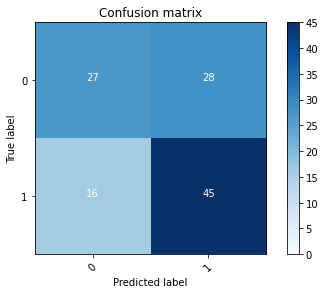

2022-08-22 17:04:54 - [Epoch Train: 33] loss: 0.4802, auc: 0.8707, acc: 0.7937, time: 24.00 s            
2022-08-22 17:04:54 - [Epoch Valid: 33] loss: 0.6997, auc: 0.5946, acc: 0.6270, time: 6.00 s


 33%|█████████████▊                            | 33/100 [17:14<34:57, 31.31s/it]

2022-08-22 17:04:54 - EPOCH: 34
2022-08-22 17:04:55 - Train Step 10/480, train_loss: 0.3533
2022-08-22 17:04:55 - Train Step 20/480, train_loss: 0.3714
2022-08-22 17:04:56 - Train Step 30/480, train_loss: 0.4276
2022-08-22 17:04:56 - Train Step 40/480, train_loss: 0.4267
2022-08-22 17:04:57 - Train Step 50/480, train_loss: 0.4371
2022-08-22 17:04:57 - Train Step 60/480, train_loss: 0.4680
2022-08-22 17:04:58 - Train Step 70/480, train_loss: 0.4785
2022-08-22 17:04:58 - Train Step 80/480, train_loss: 0.4654
2022-08-22 17:04:59 - Train Step 90/480, train_loss: 0.4982
2022-08-22 17:04:59 - Train Step 100/480, train_loss: 0.4847
2022-08-22 17:05:00 - Train Step 110/480, train_loss: 0.4799
2022-08-22 17:05:00 - Train Step 120/480, train_loss: 0.4718
2022-08-22 17:05:01 - Train Step 130/480, train_loss: 0.4743
2022-08-22 17:05:01 - Train Step 140/480, train_loss: 0.4640
2022-08-22 17:05:02 - Train Step 150/480, train_loss: 0.4569
2022-08-22 17:05:02 - Train Step 160/480, train_loss: 0.4523
2

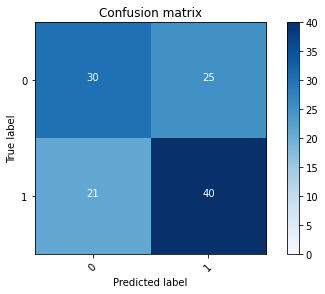

2022-08-22 17:05:26 - [Epoch Train: 34] loss: 0.4665, auc: 0.8808, acc: 0.7958, time: 24.00 s            
2022-08-22 17:05:26 - [Epoch Valid: 34] loss: 0.7012, auc: 0.5967, acc: 0.6111, time: 6.00 s


 34%|██████████████▎                           | 34/100 [17:46<34:35, 31.45s/it]

2022-08-22 17:05:26 - EPOCH: 35
2022-08-22 17:05:26 - Train Step 10/480, train_loss: 0.5070
2022-08-22 17:05:27 - Train Step 20/480, train_loss: 0.6804
2022-08-22 17:05:27 - Train Step 30/480, train_loss: 0.5919
2022-08-22 17:05:28 - Train Step 40/480, train_loss: 0.5629
2022-08-22 17:05:29 - Train Step 50/480, train_loss: 0.5444
2022-08-22 17:05:29 - Train Step 60/480, train_loss: 0.5175
2022-08-22 17:05:30 - Train Step 70/480, train_loss: 0.5136
2022-08-22 17:05:30 - Train Step 80/480, train_loss: 0.5045
2022-08-22 17:05:31 - Train Step 90/480, train_loss: 0.5096
2022-08-22 17:05:31 - Train Step 100/480, train_loss: 0.4899
2022-08-22 17:05:32 - Train Step 110/480, train_loss: 0.4909
2022-08-22 17:05:32 - Train Step 120/480, train_loss: 0.4787
2022-08-22 17:05:33 - Train Step 130/480, train_loss: 0.4845
2022-08-22 17:05:33 - Train Step 140/480, train_loss: 0.4903
2022-08-22 17:05:34 - Train Step 150/480, train_loss: 0.5058
2022-08-22 17:05:34 - Train Step 160/480, train_loss: 0.5136
2

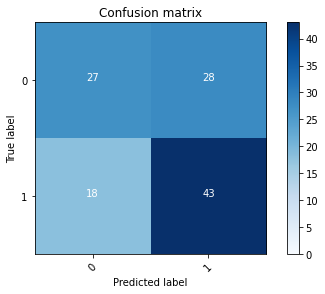

2022-08-22 17:05:57 - [Epoch Train: 35] loss: 0.4665, auc: 0.8742, acc: 0.7979, time: 24.00 s            
2022-08-22 17:05:57 - [Epoch Valid: 35] loss: 0.7009, auc: 0.5925, acc: 0.6111, time: 6.00 s


 35%|██████████████▋                           | 35/100 [18:17<34:05, 31.47s/it]

2022-08-22 17:05:57 - EPOCH: 36
2022-08-22 17:05:58 - Train Step 10/480, train_loss: 0.5330
2022-08-22 17:05:58 - Train Step 20/480, train_loss: 0.5072
2022-08-22 17:05:59 - Train Step 30/480, train_loss: 0.4843
2022-08-22 17:05:59 - Train Step 40/480, train_loss: 0.4803
2022-08-22 17:06:00 - Train Step 50/480, train_loss: 0.4783
2022-08-22 17:06:00 - Train Step 60/480, train_loss: 0.4671
2022-08-22 17:06:01 - Train Step 70/480, train_loss: 0.4636
2022-08-22 17:06:01 - Train Step 80/480, train_loss: 0.4589
2022-08-22 17:06:02 - Train Step 90/480, train_loss: 0.4477
2022-08-22 17:06:02 - Train Step 100/480, train_loss: 0.4656
2022-08-22 17:06:03 - Train Step 110/480, train_loss: 0.4657
2022-08-22 17:06:04 - Train Step 120/480, train_loss: 0.4553
2022-08-22 17:06:04 - Train Step 130/480, train_loss: 0.4405
2022-08-22 17:06:05 - Train Step 140/480, train_loss: 0.4502
2022-08-22 17:06:05 - Train Step 150/480, train_loss: 0.4517
2022-08-22 17:06:06 - Train Step 160/480, train_loss: 0.4511
2

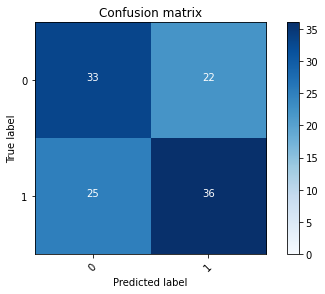

2022-08-22 17:06:28 - [Epoch Train: 36] loss: 0.4447, auc: 0.8926, acc: 0.8187, time: 24.00 s            
2022-08-22 17:06:28 - [Epoch Valid: 36] loss: 0.7314, auc: 0.5905, acc: 0.6032, time: 6.00 s


 36%|███████████████                           | 36/100 [18:49<33:28, 31.38s/it]

2022-08-22 17:06:28 - EPOCH: 37
2022-08-22 17:06:29 - Train Step 10/480, train_loss: 0.5100
2022-08-22 17:06:30 - Train Step 20/480, train_loss: 0.5256
2022-08-22 17:06:30 - Train Step 30/480, train_loss: 0.4825
2022-08-22 17:06:31 - Train Step 40/480, train_loss: 0.4664
2022-08-22 17:06:31 - Train Step 50/480, train_loss: 0.5041
2022-08-22 17:06:32 - Train Step 60/480, train_loss: 0.4711
2022-08-22 17:06:32 - Train Step 70/480, train_loss: 0.4579
2022-08-22 17:06:33 - Train Step 80/480, train_loss: 0.4637
2022-08-22 17:06:33 - Train Step 90/480, train_loss: 0.4580
2022-08-22 17:06:34 - Train Step 100/480, train_loss: 0.4747
2022-08-22 17:06:34 - Train Step 110/480, train_loss: 0.4684
2022-08-22 17:06:35 - Train Step 120/480, train_loss: 0.4565
2022-08-22 17:06:35 - Train Step 130/480, train_loss: 0.4508
2022-08-22 17:06:36 - Train Step 140/480, train_loss: 0.4495
2022-08-22 17:06:36 - Train Step 150/480, train_loss: 0.4470
2022-08-22 17:06:37 - Train Step 160/480, train_loss: 0.4375
2

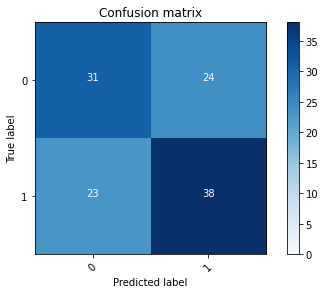

2022-08-22 17:07:00 - [Epoch Train: 37] loss: 0.4437, auc: 0.8905, acc: 0.8104, time: 24.00 s            
2022-08-22 17:07:00 - [Epoch Valid: 37] loss: 0.7061, auc: 0.5881, acc: 0.6032, time: 6.00 s


 37%|███████████████▌                          | 37/100 [19:20<32:55, 31.36s/it]

2022-08-22 17:07:00 - EPOCH: 38
2022-08-22 17:07:01 - Train Step 10/480, train_loss: 0.3827
2022-08-22 17:07:01 - Train Step 20/480, train_loss: 0.3838
2022-08-22 17:07:02 - Train Step 30/480, train_loss: 0.4314
2022-08-22 17:07:02 - Train Step 40/480, train_loss: 0.4086
2022-08-22 17:07:03 - Train Step 50/480, train_loss: 0.3881
2022-08-22 17:07:03 - Train Step 60/480, train_loss: 0.4121
2022-08-22 17:07:04 - Train Step 70/480, train_loss: 0.4437
2022-08-22 17:07:04 - Train Step 80/480, train_loss: 0.4444
2022-08-22 17:07:05 - Train Step 90/480, train_loss: 0.4523
2022-08-22 17:07:05 - Train Step 100/480, train_loss: 0.4553
2022-08-22 17:07:06 - Train Step 110/480, train_loss: 0.4584
2022-08-22 17:07:07 - Train Step 120/480, train_loss: 0.4731
2022-08-22 17:07:07 - Train Step 130/480, train_loss: 0.4719
2022-08-22 17:07:08 - Train Step 140/480, train_loss: 0.4589
2022-08-22 17:07:08 - Train Step 150/480, train_loss: 0.4508
2022-08-22 17:07:09 - Train Step 160/480, train_loss: 0.4469
2

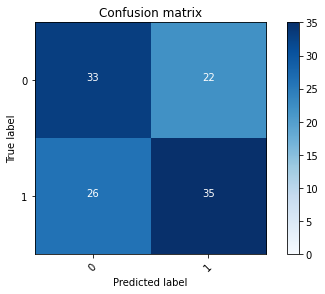

2022-08-22 17:07:31 - [Epoch Train: 38] loss: 0.4230, auc: 0.9078, acc: 0.8417, time: 24.00 s            
2022-08-22 17:07:31 - [Epoch Valid: 38] loss: 0.7248, auc: 0.5887, acc: 0.5952, time: 6.00 s


 38%|███████████████▉                          | 38/100 [19:51<32:28, 31.43s/it]

2022-08-22 17:07:31 - EPOCH: 39
2022-08-22 17:07:32 - Train Step 10/480, train_loss: 0.5188
2022-08-22 17:07:33 - Train Step 20/480, train_loss: 0.3957
2022-08-22 17:07:33 - Train Step 30/480, train_loss: 0.4351
2022-08-22 17:07:34 - Train Step 40/480, train_loss: 0.4198
2022-08-22 17:07:34 - Train Step 50/480, train_loss: 0.4214
2022-08-22 17:07:35 - Train Step 60/480, train_loss: 0.4276
2022-08-22 17:07:35 - Train Step 70/480, train_loss: 0.4354
2022-08-22 17:07:36 - Train Step 80/480, train_loss: 0.4284
2022-08-22 17:07:36 - Train Step 90/480, train_loss: 0.4172
2022-08-22 17:07:37 - Train Step 100/480, train_loss: 0.4121
2022-08-22 17:07:37 - Train Step 110/480, train_loss: 0.4065
2022-08-22 17:07:38 - Train Step 120/480, train_loss: 0.4220
2022-08-22 17:07:38 - Train Step 130/480, train_loss: 0.4249
2022-08-22 17:07:39 - Train Step 140/480, train_loss: 0.4346
2022-08-22 17:07:39 - Train Step 150/480, train_loss: 0.4418
2022-08-22 17:07:40 - Train Step 160/480, train_loss: 0.4363
2

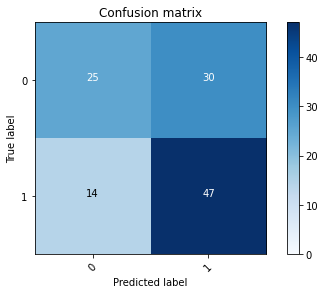

2022-08-22 17:08:03 - [Epoch Train: 39] loss: 0.4295, auc: 0.8964, acc: 0.8208, time: 24.00 s            
2022-08-22 17:08:03 - [Epoch Valid: 39] loss: 0.7435, auc: 0.5848, acc: 0.6270, time: 6.00 s


 39%|████████████████▍                         | 39/100 [20:23<31:52, 31.36s/it]

2022-08-22 17:08:03 - EPOCH: 40
2022-08-22 17:08:03 - Train Step 10/480, train_loss: 0.5283
2022-08-22 17:08:04 - Train Step 20/480, train_loss: 0.4702
2022-08-22 17:08:04 - Train Step 30/480, train_loss: 0.4453
2022-08-22 17:08:05 - Train Step 40/480, train_loss: 0.4208
2022-08-22 17:08:05 - Train Step 50/480, train_loss: 0.3688
2022-08-22 17:08:06 - Train Step 60/480, train_loss: 0.3688
2022-08-22 17:08:06 - Train Step 70/480, train_loss: 0.3773
2022-08-22 17:08:07 - Train Step 80/480, train_loss: 0.3888
2022-08-22 17:08:07 - Train Step 90/480, train_loss: 0.3767
2022-08-22 17:08:08 - Train Step 100/480, train_loss: 0.3717
2022-08-22 17:08:08 - Train Step 110/480, train_loss: 0.3918
2022-08-22 17:08:09 - Train Step 120/480, train_loss: 0.3981
2022-08-22 17:08:09 - Train Step 130/480, train_loss: 0.4014
2022-08-22 17:08:10 - Train Step 140/480, train_loss: 0.4072
2022-08-22 17:08:10 - Train Step 150/480, train_loss: 0.4012
2022-08-22 17:08:11 - Train Step 160/480, train_loss: 0.3983
2

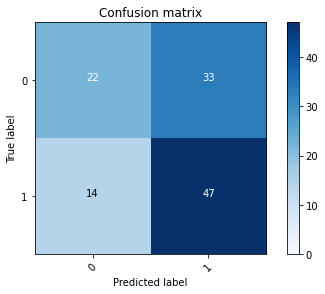

2022-08-22 17:08:34 - [Epoch Train: 40] loss: 0.3999, auc: 0.9174, acc: 0.8375, time: 24.00 s            
2022-08-22 17:08:34 - [Epoch Valid: 40] loss: 0.7783, auc: 0.5717, acc: 0.6032, time: 6.00 s


 40%|████████████████▊                         | 40/100 [20:54<31:20, 31.35s/it]

2022-08-22 17:08:34 - EPOCH: 41
2022-08-22 17:08:35 - Train Step 10/480, train_loss: 0.4995
2022-08-22 17:08:35 - Train Step 20/480, train_loss: 0.4531
2022-08-22 17:08:36 - Train Step 30/480, train_loss: 0.4329
2022-08-22 17:08:36 - Train Step 40/480, train_loss: 0.3710
2022-08-22 17:08:37 - Train Step 50/480, train_loss: 0.3747
2022-08-22 17:08:37 - Train Step 60/480, train_loss: 0.3651
2022-08-22 17:08:38 - Train Step 70/480, train_loss: 0.3675
2022-08-22 17:08:38 - Train Step 80/480, train_loss: 0.3661
2022-08-22 17:08:39 - Train Step 90/480, train_loss: 0.3729
2022-08-22 17:08:39 - Train Step 100/480, train_loss: 0.3628
2022-08-22 17:08:40 - Train Step 110/480, train_loss: 0.3737
2022-08-22 17:08:40 - Train Step 120/480, train_loss: 0.3777
2022-08-22 17:08:41 - Train Step 130/480, train_loss: 0.3668
2022-08-22 17:08:41 - Train Step 140/480, train_loss: 0.3622
2022-08-22 17:08:42 - Train Step 150/480, train_loss: 0.3653
2022-08-22 17:08:42 - Train Step 160/480, train_loss: 0.3804
2

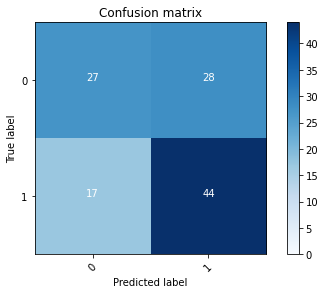

2022-08-22 17:09:05 - [Epoch Train: 41] loss: 0.4033, auc: 0.9190, acc: 0.8396, time: 24.00 s            
2022-08-22 17:09:05 - [Epoch Valid: 41] loss: 0.7414, auc: 0.5803, acc: 0.6190, time: 6.00 s


 41%|█████████████████▏                        | 41/100 [21:25<30:44, 31.27s/it]

2022-08-22 17:09:05 - EPOCH: 42
2022-08-22 17:09:06 - Train Step 10/480, train_loss: 0.3490
2022-08-22 17:09:06 - Train Step 20/480, train_loss: 0.2793
2022-08-22 17:09:07 - Train Step 30/480, train_loss: 0.3321
2022-08-22 17:09:07 - Train Step 40/480, train_loss: 0.2962
2022-08-22 17:09:08 - Train Step 50/480, train_loss: 0.3323
2022-08-22 17:09:08 - Train Step 60/480, train_loss: 0.3155
2022-08-22 17:09:09 - Train Step 70/480, train_loss: 0.3409
2022-08-22 17:09:09 - Train Step 80/480, train_loss: 0.3405
2022-08-22 17:09:10 - Train Step 90/480, train_loss: 0.3307
2022-08-22 17:09:10 - Train Step 100/480, train_loss: 0.3375
2022-08-22 17:09:11 - Train Step 110/480, train_loss: 0.3286
2022-08-22 17:09:11 - Train Step 120/480, train_loss: 0.3347
2022-08-22 17:09:12 - Train Step 130/480, train_loss: 0.3478
2022-08-22 17:09:12 - Train Step 140/480, train_loss: 0.3740
2022-08-22 17:09:13 - Train Step 150/480, train_loss: 0.3872
2022-08-22 17:09:13 - Train Step 160/480, train_loss: 0.3955
2

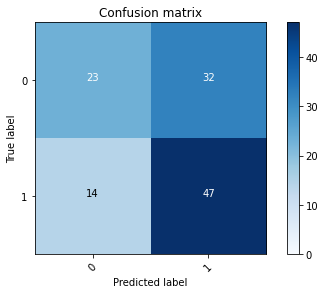

2022-08-22 17:09:36 - [Epoch Train: 42] loss: 0.3839, auc: 0.9228, acc: 0.8562, time: 24.00 s            
2022-08-22 17:09:36 - [Epoch Valid: 42] loss: 0.7707, auc: 0.5666, acc: 0.6111, time: 6.00 s


 42%|█████████████████▋                        | 42/100 [21:56<30:14, 31.28s/it]

2022-08-22 17:09:36 - EPOCH: 43
2022-08-22 17:09:37 - Train Step 10/480, train_loss: 0.3571
2022-08-22 17:09:37 - Train Step 20/480, train_loss: 0.3498
2022-08-22 17:09:38 - Train Step 30/480, train_loss: 0.3243
2022-08-22 17:09:38 - Train Step 40/480, train_loss: 0.3299
2022-08-22 17:09:39 - Train Step 50/480, train_loss: 0.3270
2022-08-22 17:09:39 - Train Step 60/480, train_loss: 0.3621
2022-08-22 17:09:40 - Train Step 70/480, train_loss: 0.3550
2022-08-22 17:09:40 - Train Step 80/480, train_loss: 0.3651
2022-08-22 17:09:41 - Train Step 90/480, train_loss: 0.3686
2022-08-22 17:09:41 - Train Step 100/480, train_loss: 0.3632
2022-08-22 17:09:42 - Train Step 110/480, train_loss: 0.3636
2022-08-22 17:09:42 - Train Step 120/480, train_loss: 0.3745
2022-08-22 17:09:43 - Train Step 130/480, train_loss: 0.3800
2022-08-22 17:09:43 - Train Step 140/480, train_loss: 0.3674
2022-08-22 17:09:44 - Train Step 150/480, train_loss: 0.3706
2022-08-22 17:09:44 - Train Step 160/480, train_loss: 0.3718
2

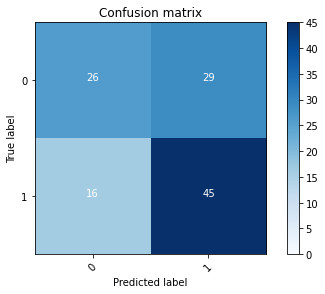

2022-08-22 17:10:08 - [Epoch Train: 43] loss: 0.3749, auc: 0.9289, acc: 0.8542, time: 24.00 s            
2022-08-22 17:10:08 - [Epoch Valid: 43] loss: 0.7861, auc: 0.5711, acc: 0.6190, time: 6.00 s


 43%|██████████████████                        | 43/100 [22:28<29:45, 31.33s/it]

2022-08-22 17:10:08 - EPOCH: 44
2022-08-22 17:10:08 - Train Step 10/480, train_loss: 0.3612
2022-08-22 17:10:09 - Train Step 20/480, train_loss: 0.4209
2022-08-22 17:10:09 - Train Step 30/480, train_loss: 0.3952
2022-08-22 17:10:10 - Train Step 40/480, train_loss: 0.3940
2022-08-22 17:10:10 - Train Step 50/480, train_loss: 0.3639
2022-08-22 17:10:11 - Train Step 60/480, train_loss: 0.3685
2022-08-22 17:10:11 - Train Step 70/480, train_loss: 0.3633
2022-08-22 17:10:12 - Train Step 80/480, train_loss: 0.3547
2022-08-22 17:10:12 - Train Step 90/480, train_loss: 0.3406
2022-08-22 17:10:13 - Train Step 100/480, train_loss: 0.3373
2022-08-22 17:10:13 - Train Step 110/480, train_loss: 0.3399
2022-08-22 17:10:14 - Train Step 120/480, train_loss: 0.3252
2022-08-22 17:10:14 - Train Step 130/480, train_loss: 0.3275
2022-08-22 17:10:15 - Train Step 140/480, train_loss: 0.3331
2022-08-22 17:10:16 - Train Step 150/480, train_loss: 0.3361
2022-08-22 17:10:16 - Train Step 160/480, train_loss: 0.3335
2

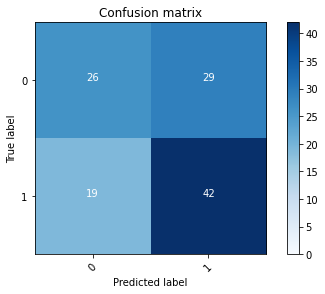

2022-08-22 17:10:39 - [Epoch Train: 44] loss: 0.3604, auc: 0.9345, acc: 0.8604, time: 24.00 s            
2022-08-22 17:10:39 - [Epoch Valid: 44] loss: 0.7784, auc: 0.5672, acc: 0.5952, time: 6.00 s


 44%|██████████████████▍                       | 44/100 [22:59<29:16, 31.37s/it]

2022-08-22 17:10:39 - EPOCH: 45
2022-08-22 17:10:40 - Train Step 10/480, train_loss: 0.2241
2022-08-22 17:10:40 - Train Step 20/480, train_loss: 0.2805
2022-08-22 17:10:41 - Train Step 30/480, train_loss: 0.2905
2022-08-22 17:10:41 - Train Step 40/480, train_loss: 0.3629
2022-08-22 17:10:42 - Train Step 50/480, train_loss: 0.3662
2022-08-22 17:10:42 - Train Step 60/480, train_loss: 0.3639
2022-08-22 17:10:43 - Train Step 70/480, train_loss: 0.3650
2022-08-22 17:10:43 - Train Step 80/480, train_loss: 0.3611
2022-08-22 17:10:44 - Train Step 90/480, train_loss: 0.3854
2022-08-22 17:10:44 - Train Step 100/480, train_loss: 0.3780
2022-08-22 17:10:45 - Train Step 110/480, train_loss: 0.3736
2022-08-22 17:10:45 - Train Step 120/480, train_loss: 0.3681
2022-08-22 17:10:46 - Train Step 130/480, train_loss: 0.3626
2022-08-22 17:10:46 - Train Step 140/480, train_loss: 0.3554
2022-08-22 17:10:47 - Train Step 150/480, train_loss: 0.3521
2022-08-22 17:10:48 - Train Step 160/480, train_loss: 0.3517
2

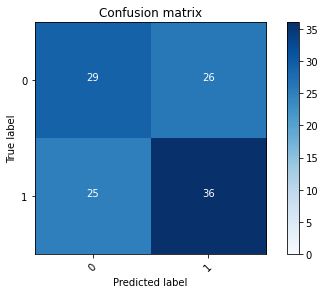

2022-08-22 17:11:10 - [Epoch Train: 45] loss: 0.3556, auc: 0.9383, acc: 0.8833, time: 24.00 s            
2022-08-22 17:11:10 - [Epoch Valid: 45] loss: 0.7846, auc: 0.5690, acc: 0.5714, time: 6.00 s


 45%|██████████████████▉                       | 45/100 [23:30<28:43, 31.33s/it]

2022-08-22 17:11:10 - EPOCH: 46
2022-08-22 17:11:11 - Train Step 10/480, train_loss: 0.4051
2022-08-22 17:11:12 - Train Step 20/480, train_loss: 0.3139
2022-08-22 17:11:12 - Train Step 30/480, train_loss: 0.2742
2022-08-22 17:11:13 - Train Step 40/480, train_loss: 0.2728
2022-08-22 17:11:13 - Train Step 50/480, train_loss: 0.2737
2022-08-22 17:11:14 - Train Step 60/480, train_loss: 0.3037
2022-08-22 17:11:14 - Train Step 70/480, train_loss: 0.2894
2022-08-22 17:11:15 - Train Step 80/480, train_loss: 0.3278
2022-08-22 17:11:15 - Train Step 90/480, train_loss: 0.3206
2022-08-22 17:11:16 - Train Step 100/480, train_loss: 0.3346
2022-08-22 17:11:16 - Train Step 110/480, train_loss: 0.3361
2022-08-22 17:11:17 - Train Step 120/480, train_loss: 0.3282
2022-08-22 17:11:17 - Train Step 130/480, train_loss: 0.3143
2022-08-22 17:11:18 - Train Step 140/480, train_loss: 0.3118
2022-08-22 17:11:18 - Train Step 150/480, train_loss: 0.3150
2022-08-22 17:11:19 - Train Step 160/480, train_loss: 0.3235
2

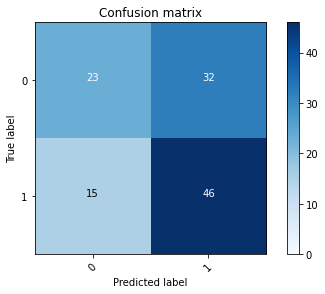

2022-08-22 17:11:42 - [Epoch Train: 46] loss: 0.3437, auc: 0.9429, acc: 0.8729, time: 24.00 s            
2022-08-22 17:11:42 - [Epoch Valid: 46] loss: 0.8004, auc: 0.5607, acc: 0.6032, time: 6.00 s


 46%|███████████████████▎                      | 46/100 [24:02<28:11, 31.33s/it]

2022-08-22 17:11:42 - EPOCH: 47
2022-08-22 17:11:42 - Train Step 10/480, train_loss: 0.1467
2022-08-22 17:11:43 - Train Step 20/480, train_loss: 0.1679
2022-08-22 17:11:43 - Train Step 30/480, train_loss: 0.2029
2022-08-22 17:11:44 - Train Step 40/480, train_loss: 0.2732
2022-08-22 17:11:44 - Train Step 50/480, train_loss: 0.2536
2022-08-22 17:11:45 - Train Step 60/480, train_loss: 0.2589
2022-08-22 17:11:45 - Train Step 70/480, train_loss: 0.2599
2022-08-22 17:11:46 - Train Step 80/480, train_loss: 0.2781
2022-08-22 17:11:46 - Train Step 90/480, train_loss: 0.2870
2022-08-22 17:11:47 - Train Step 100/480, train_loss: 0.2866
2022-08-22 17:11:47 - Train Step 110/480, train_loss: 0.2768
2022-08-22 17:11:48 - Train Step 120/480, train_loss: 0.2833
2022-08-22 17:11:49 - Train Step 130/480, train_loss: 0.2814
2022-08-22 17:11:49 - Train Step 140/480, train_loss: 0.2773
2022-08-22 17:11:50 - Train Step 150/480, train_loss: 0.2715
2022-08-22 17:11:50 - Train Step 160/480, train_loss: 0.2672
2

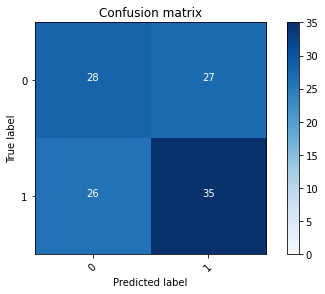

2022-08-22 17:12:13 - [Epoch Train: 47] loss: 0.3484, auc: 0.9336, acc: 0.8833, time: 24.00 s            
2022-08-22 17:12:13 - [Epoch Valid: 47] loss: 0.8337, auc: 0.5615, acc: 0.5556, time: 6.00 s


 47%|███████████████████▋                      | 47/100 [24:33<27:42, 31.36s/it]

2022-08-22 17:12:13 - EPOCH: 48
2022-08-22 17:12:14 - Train Step 10/480, train_loss: 0.3355
2022-08-22 17:12:14 - Train Step 20/480, train_loss: 0.3108
2022-08-22 17:12:15 - Train Step 30/480, train_loss: 0.2384
2022-08-22 17:12:15 - Train Step 40/480, train_loss: 0.2302
2022-08-22 17:12:16 - Train Step 50/480, train_loss: 0.2596
2022-08-22 17:12:16 - Train Step 60/480, train_loss: 0.2842
2022-08-22 17:12:17 - Train Step 70/480, train_loss: 0.2949
2022-08-22 17:12:17 - Train Step 80/480, train_loss: 0.3026
2022-08-22 17:12:18 - Train Step 90/480, train_loss: 0.2978
2022-08-22 17:12:18 - Train Step 100/480, train_loss: 0.3000
2022-08-22 17:12:19 - Train Step 110/480, train_loss: 0.3030
2022-08-22 17:12:19 - Train Step 120/480, train_loss: 0.3051
2022-08-22 17:12:20 - Train Step 130/480, train_loss: 0.2912
2022-08-22 17:12:20 - Train Step 140/480, train_loss: 0.2962
2022-08-22 17:12:21 - Train Step 150/480, train_loss: 0.3074
2022-08-22 17:12:21 - Train Step 160/480, train_loss: 0.3104
2

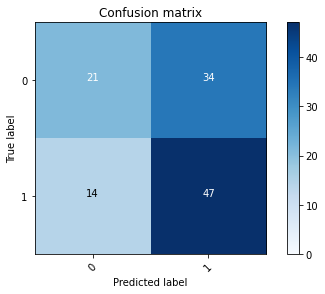

2022-08-22 17:12:44 - [Epoch Train: 48] loss: 0.3296, auc: 0.9539, acc: 0.8771, time: 24.00 s            
2022-08-22 17:12:44 - [Epoch Valid: 48] loss: 0.8656, auc: 0.5544, acc: 0.5952, time: 6.00 s


 48%|████████████████████▏                     | 48/100 [25:04<27:08, 31.31s/it]

2022-08-22 17:12:44 - EPOCH: 49
2022-08-22 17:12:45 - Train Step 10/480, train_loss: 0.3073
2022-08-22 17:12:46 - Train Step 20/480, train_loss: 0.3941
2022-08-22 17:12:46 - Train Step 30/480, train_loss: 0.3389
2022-08-22 17:12:47 - Train Step 40/480, train_loss: 0.3253
2022-08-22 17:12:47 - Train Step 50/480, train_loss: 0.3421
2022-08-22 17:12:48 - Train Step 60/480, train_loss: 0.3723
2022-08-22 17:12:48 - Train Step 70/480, train_loss: 0.3833
2022-08-22 17:12:49 - Train Step 80/480, train_loss: 0.3683
2022-08-22 17:12:49 - Train Step 90/480, train_loss: 0.3638
2022-08-22 17:12:50 - Train Step 100/480, train_loss: 0.3528
2022-08-22 17:12:50 - Train Step 110/480, train_loss: 0.3666
2022-08-22 17:12:51 - Train Step 120/480, train_loss: 0.3617
2022-08-22 17:12:51 - Train Step 130/480, train_loss: 0.3683
2022-08-22 17:12:52 - Train Step 140/480, train_loss: 0.3672
2022-08-22 17:12:52 - Train Step 150/480, train_loss: 0.3671
2022-08-22 17:12:53 - Train Step 160/480, train_loss: 0.3607
2

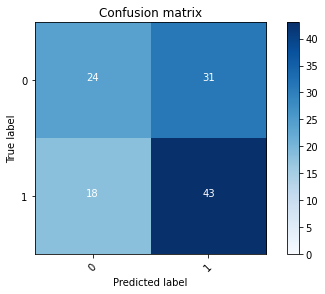

2022-08-22 17:13:15 - [Epoch Train: 49] loss: 0.3130, auc: 0.9532, acc: 0.8812, time: 24.00 s            
2022-08-22 17:13:15 - [Epoch Valid: 49] loss: 0.8284, auc: 0.5535, acc: 0.5873, time: 6.00 s


 49%|████████████████████▌                     | 49/100 [25:36<26:33, 31.25s/it]

2022-08-22 17:13:15 - EPOCH: 50
2022-08-22 17:13:16 - Train Step 10/480, train_loss: 0.5101
2022-08-22 17:13:17 - Train Step 20/480, train_loss: 0.3915
2022-08-22 17:13:17 - Train Step 30/480, train_loss: 0.3852
2022-08-22 17:13:18 - Train Step 40/480, train_loss: 0.3876
2022-08-22 17:13:18 - Train Step 50/480, train_loss: 0.3929
2022-08-22 17:13:19 - Train Step 60/480, train_loss: 0.3632
2022-08-22 17:13:19 - Train Step 70/480, train_loss: 0.3270
2022-08-22 17:13:20 - Train Step 80/480, train_loss: 0.3108
2022-08-22 17:13:20 - Train Step 90/480, train_loss: 0.3226
2022-08-22 17:13:21 - Train Step 100/480, train_loss: 0.3148
2022-08-22 17:13:21 - Train Step 110/480, train_loss: 0.3270
2022-08-22 17:13:22 - Train Step 120/480, train_loss: 0.3344
2022-08-22 17:13:22 - Train Step 130/480, train_loss: 0.3317
2022-08-22 17:13:23 - Train Step 140/480, train_loss: 0.3455
2022-08-22 17:13:23 - Train Step 150/480, train_loss: 0.3385
2022-08-22 17:13:24 - Train Step 160/480, train_loss: 0.3446
2

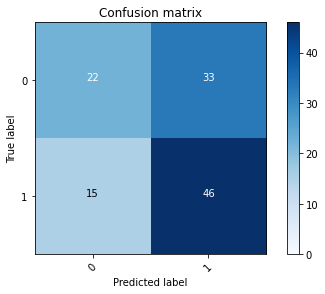

2022-08-22 17:13:47 - [Epoch Train: 50] loss: 0.3338, auc: 0.9441, acc: 0.8854, time: 24.00 s            
2022-08-22 17:13:47 - [Epoch Valid: 50] loss: 0.8200, auc: 0.5568, acc: 0.5952, time: 6.00 s


 50%|█████████████████████                     | 50/100 [26:07<26:00, 31.20s/it]

2022-08-22 17:13:47 - EPOCH: 51
2022-08-22 17:13:47 - Train Step 10/480, train_loss: 0.2233
2022-08-22 17:13:48 - Train Step 20/480, train_loss: 0.2041
2022-08-22 17:13:48 - Train Step 30/480, train_loss: 0.2442
2022-08-22 17:13:49 - Train Step 40/480, train_loss: 0.2367
2022-08-22 17:13:49 - Train Step 50/480, train_loss: 0.2424
2022-08-22 17:13:50 - Train Step 60/480, train_loss: 0.2720
2022-08-22 17:13:50 - Train Step 70/480, train_loss: 0.2772
2022-08-22 17:13:51 - Train Step 80/480, train_loss: 0.2914
2022-08-22 17:13:51 - Train Step 90/480, train_loss: 0.3010
2022-08-22 17:13:52 - Train Step 100/480, train_loss: 0.2970
2022-08-22 17:13:52 - Train Step 110/480, train_loss: 0.3032
2022-08-22 17:13:53 - Train Step 120/480, train_loss: 0.3192
2022-08-22 17:13:53 - Train Step 130/480, train_loss: 0.3057
2022-08-22 17:13:54 - Train Step 140/480, train_loss: 0.3122
2022-08-22 17:13:54 - Train Step 150/480, train_loss: 0.3122
2022-08-22 17:13:55 - Train Step 160/480, train_loss: 0.3213
2

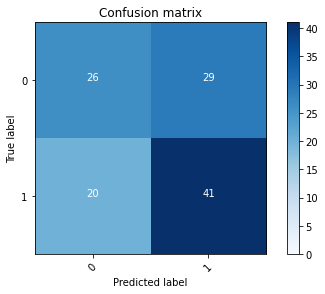

2022-08-22 17:14:18 - [Epoch Train: 51] loss: 0.3100, auc: 0.9563, acc: 0.8958, time: 24.00 s            
2022-08-22 17:14:18 - [Epoch Valid: 51] loss: 0.8408, auc: 0.5481, acc: 0.5873, time: 6.00 s


 51%|█████████████████████▍                    | 51/100 [26:38<25:30, 31.23s/it]

2022-08-22 17:14:18 - EPOCH: 52
2022-08-22 17:14:19 - Train Step 10/480, train_loss: 0.3590
2022-08-22 17:14:19 - Train Step 20/480, train_loss: 0.2759
2022-08-22 17:14:20 - Train Step 30/480, train_loss: 0.2269
2022-08-22 17:14:20 - Train Step 40/480, train_loss: 0.1966
2022-08-22 17:14:21 - Train Step 50/480, train_loss: 0.2231
2022-08-22 17:14:21 - Train Step 60/480, train_loss: 0.2285
2022-08-22 17:14:22 - Train Step 70/480, train_loss: 0.2742
2022-08-22 17:14:22 - Train Step 80/480, train_loss: 0.2576
2022-08-22 17:14:23 - Train Step 90/480, train_loss: 0.2789
2022-08-22 17:14:23 - Train Step 100/480, train_loss: 0.2783
2022-08-22 17:14:24 - Train Step 110/480, train_loss: 0.2763
2022-08-22 17:14:24 - Train Step 120/480, train_loss: 0.2675
2022-08-22 17:14:25 - Train Step 130/480, train_loss: 0.2711
2022-08-22 17:14:25 - Train Step 140/480, train_loss: 0.2658
2022-08-22 17:14:26 - Train Step 150/480, train_loss: 0.2725
2022-08-22 17:14:26 - Train Step 160/480, train_loss: 0.2826
2

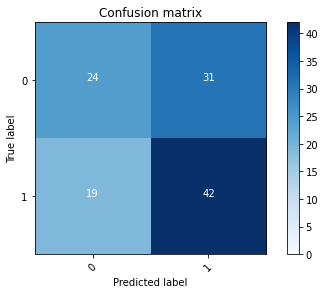

2022-08-22 17:14:49 - [Epoch Train: 52] loss: 0.2973, auc: 0.9580, acc: 0.9021, time: 24.00 s            
2022-08-22 17:14:49 - [Epoch Valid: 52] loss: 0.8511, auc: 0.5481, acc: 0.5794, time: 6.00 s


 52%|█████████████████████▊                    | 52/100 [27:09<25:00, 31.25s/it]

2022-08-22 17:14:49 - EPOCH: 53
2022-08-22 17:14:50 - Train Step 10/480, train_loss: 0.2622
2022-08-22 17:14:50 - Train Step 20/480, train_loss: 0.3622
2022-08-22 17:14:51 - Train Step 30/480, train_loss: 0.3322
2022-08-22 17:14:51 - Train Step 40/480, train_loss: 0.3154
2022-08-22 17:14:52 - Train Step 50/480, train_loss: 0.2959
2022-08-22 17:14:52 - Train Step 60/480, train_loss: 0.2801
2022-08-22 17:14:53 - Train Step 70/480, train_loss: 0.2834
2022-08-22 17:14:53 - Train Step 80/480, train_loss: 0.2810
2022-08-22 17:14:54 - Train Step 90/480, train_loss: 0.2754
2022-08-22 17:14:54 - Train Step 100/480, train_loss: 0.2685
2022-08-22 17:14:55 - Train Step 110/480, train_loss: 0.2573
2022-08-22 17:14:55 - Train Step 120/480, train_loss: 0.2521
2022-08-22 17:14:56 - Train Step 130/480, train_loss: 0.2526
2022-08-22 17:14:56 - Train Step 140/480, train_loss: 0.2623
2022-08-22 17:14:57 - Train Step 150/480, train_loss: 0.2580
2022-08-22 17:14:57 - Train Step 160/480, train_loss: 0.2647
2

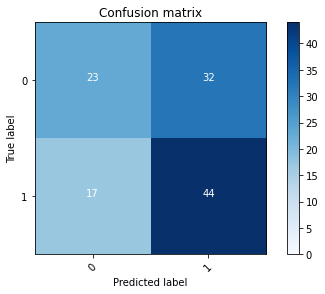

2022-08-22 17:15:20 - [Epoch Train: 53] loss: 0.2866, auc: 0.9631, acc: 0.9125, time: 24.00 s            
2022-08-22 17:15:20 - [Epoch Valid: 53] loss: 0.8851, auc: 0.5475, acc: 0.5873, time: 6.00 s


 53%|██████████████████████▎                   | 53/100 [27:40<24:24, 31.16s/it]

2022-08-22 17:15:20 - EPOCH: 54
2022-08-22 17:15:21 - Train Step 10/480, train_loss: 0.2432
2022-08-22 17:15:21 - Train Step 20/480, train_loss: 0.2695
2022-08-22 17:15:22 - Train Step 30/480, train_loss: 0.2645
2022-08-22 17:15:22 - Train Step 40/480, train_loss: 0.2591
2022-08-22 17:15:23 - Train Step 50/480, train_loss: 0.2546
2022-08-22 17:15:23 - Train Step 60/480, train_loss: 0.2520
2022-08-22 17:15:24 - Train Step 70/480, train_loss: 0.2546
2022-08-22 17:15:24 - Train Step 80/480, train_loss: 0.2498
2022-08-22 17:15:25 - Train Step 90/480, train_loss: 0.2467
2022-08-22 17:15:25 - Train Step 100/480, train_loss: 0.2503
2022-08-22 17:15:26 - Train Step 110/480, train_loss: 0.2458
2022-08-22 17:15:26 - Train Step 120/480, train_loss: 0.2480
2022-08-22 17:15:27 - Train Step 130/480, train_loss: 0.2476
2022-08-22 17:15:27 - Train Step 140/480, train_loss: 0.2430
2022-08-22 17:15:28 - Train Step 150/480, train_loss: 0.2558
2022-08-22 17:15:28 - Train Step 160/480, train_loss: 0.2599
2

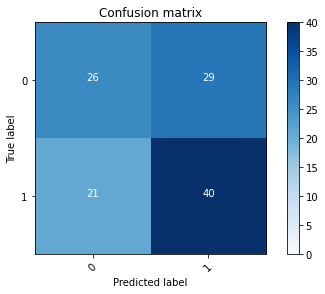

2022-08-22 17:15:52 - [Epoch Train: 54] loss: 0.2792, auc: 0.9669, acc: 0.9187, time: 24.00 s            
2022-08-22 17:15:52 - [Epoch Valid: 54] loss: 0.8680, auc: 0.5493, acc: 0.5794, time: 6.00 s


 54%|██████████████████████▋                   | 54/100 [28:12<23:56, 31.23s/it]

2022-08-22 17:15:52 - EPOCH: 55
2022-08-22 17:15:52 - Train Step 10/480, train_loss: 0.2148
2022-08-22 17:15:53 - Train Step 20/480, train_loss: 0.2391
2022-08-22 17:15:53 - Train Step 30/480, train_loss: 0.3382
2022-08-22 17:15:54 - Train Step 40/480, train_loss: 0.3159
2022-08-22 17:15:54 - Train Step 50/480, train_loss: 0.2908
2022-08-22 17:15:55 - Train Step 60/480, train_loss: 0.2556
2022-08-22 17:15:55 - Train Step 70/480, train_loss: 0.2593
2022-08-22 17:15:56 - Train Step 80/480, train_loss: 0.2514
2022-08-22 17:15:56 - Train Step 90/480, train_loss: 0.2573
2022-08-22 17:15:57 - Train Step 100/480, train_loss: 0.2640
2022-08-22 17:15:57 - Train Step 110/480, train_loss: 0.2792
2022-08-22 17:15:58 - Train Step 120/480, train_loss: 0.2710
2022-08-22 17:15:58 - Train Step 130/480, train_loss: 0.2669
2022-08-22 17:15:59 - Train Step 140/480, train_loss: 0.2634
2022-08-22 17:15:59 - Train Step 150/480, train_loss: 0.2620
2022-08-22 17:16:00 - Train Step 160/480, train_loss: 0.2560
2

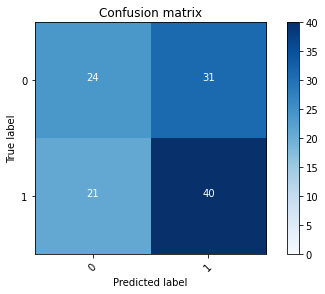

2022-08-22 17:16:23 - [Epoch Train: 55] loss: 0.2599, auc: 0.9699, acc: 0.9146, time: 24.00 s            
2022-08-22 17:16:23 - [Epoch Valid: 55] loss: 0.8824, auc: 0.5413, acc: 0.5635, time: 6.00 s


 55%|███████████████████████                   | 55/100 [28:43<23:28, 31.29s/it]

2022-08-22 17:16:23 - EPOCH: 56
2022-08-22 17:16:24 - Train Step 10/480, train_loss: 0.1339
2022-08-22 17:16:24 - Train Step 20/480, train_loss: 0.1879
2022-08-22 17:16:25 - Train Step 30/480, train_loss: 0.1947
2022-08-22 17:16:25 - Train Step 40/480, train_loss: 0.2167
2022-08-22 17:16:26 - Train Step 50/480, train_loss: 0.2141
2022-08-22 17:16:26 - Train Step 60/480, train_loss: 0.1959
2022-08-22 17:16:27 - Train Step 70/480, train_loss: 0.2247
2022-08-22 17:16:27 - Train Step 80/480, train_loss: 0.2264
2022-08-22 17:16:28 - Train Step 90/480, train_loss: 0.2157
2022-08-22 17:16:28 - Train Step 100/480, train_loss: 0.2333
2022-08-22 17:16:29 - Train Step 110/480, train_loss: 0.2436
2022-08-22 17:16:29 - Train Step 120/480, train_loss: 0.2489
2022-08-22 17:16:30 - Train Step 130/480, train_loss: 0.2420
2022-08-22 17:16:30 - Train Step 140/480, train_loss: 0.2341
2022-08-22 17:16:31 - Train Step 150/480, train_loss: 0.2443
2022-08-22 17:16:31 - Train Step 160/480, train_loss: 0.2405
2

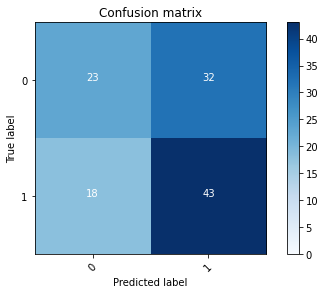

2022-08-22 17:16:54 - [Epoch Train: 56] loss: 0.2651, auc: 0.9676, acc: 0.9083, time: 24.00 s            
2022-08-22 17:16:54 - [Epoch Valid: 56] loss: 0.9012, auc: 0.5434, acc: 0.5794, time: 6.00 s


 56%|███████████████████████▌                  | 56/100 [29:14<22:58, 31.32s/it]

2022-08-22 17:16:54 - EPOCH: 57
2022-08-22 17:16:55 - Train Step 10/480, train_loss: 0.2017
2022-08-22 17:16:56 - Train Step 20/480, train_loss: 0.3328
2022-08-22 17:16:56 - Train Step 30/480, train_loss: 0.3067
2022-08-22 17:16:57 - Train Step 40/480, train_loss: 0.3125
2022-08-22 17:16:57 - Train Step 50/480, train_loss: 0.2881
2022-08-22 17:16:58 - Train Step 60/480, train_loss: 0.2911
2022-08-22 17:16:58 - Train Step 70/480, train_loss: 0.2827
2022-08-22 17:16:59 - Train Step 80/480, train_loss: 0.2609
2022-08-22 17:16:59 - Train Step 90/480, train_loss: 0.2667
2022-08-22 17:17:00 - Train Step 100/480, train_loss: 0.2541
2022-08-22 17:17:00 - Train Step 110/480, train_loss: 0.2567
2022-08-22 17:17:01 - Train Step 120/480, train_loss: 0.2619
2022-08-22 17:17:01 - Train Step 130/480, train_loss: 0.2627
2022-08-22 17:17:02 - Train Step 140/480, train_loss: 0.2585
2022-08-22 17:17:02 - Train Step 150/480, train_loss: 0.2546
2022-08-22 17:17:03 - Train Step 160/480, train_loss: 0.2618
2

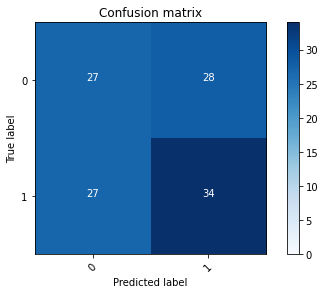

2022-08-22 17:17:26 - [Epoch Train: 57] loss: 0.2489, auc: 0.9771, acc: 0.9292, time: 24.00 s            
2022-08-22 17:17:26 - [Epoch Valid: 57] loss: 0.8970, auc: 0.5443, acc: 0.5397, time: 6.00 s


 57%|███████████████████████▉                  | 57/100 [29:46<22:31, 31.42s/it]

2022-08-22 17:17:26 - EPOCH: 58
2022-08-22 17:17:27 - Train Step 10/480, train_loss: 0.2651
2022-08-22 17:17:27 - Train Step 20/480, train_loss: 0.2171
2022-08-22 17:17:28 - Train Step 30/480, train_loss: 0.2675
2022-08-22 17:17:28 - Train Step 40/480, train_loss: 0.2501
2022-08-22 17:17:29 - Train Step 50/480, train_loss: 0.2189
2022-08-22 17:17:29 - Train Step 60/480, train_loss: 0.2027
2022-08-22 17:17:30 - Train Step 70/480, train_loss: 0.2038
2022-08-22 17:17:30 - Train Step 80/480, train_loss: 0.2000
2022-08-22 17:17:31 - Train Step 90/480, train_loss: 0.2379
2022-08-22 17:17:31 - Train Step 100/480, train_loss: 0.2566
2022-08-22 17:17:32 - Train Step 110/480, train_loss: 0.2424
2022-08-22 17:17:32 - Train Step 120/480, train_loss: 0.2305
2022-08-22 17:17:33 - Train Step 130/480, train_loss: 0.2273
2022-08-22 17:17:33 - Train Step 140/480, train_loss: 0.2370
2022-08-22 17:17:34 - Train Step 150/480, train_loss: 0.2508
2022-08-22 17:17:34 - Train Step 160/480, train_loss: 0.2601
2

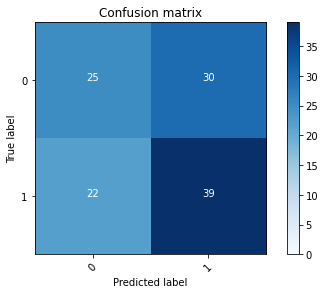

2022-08-22 17:17:57 - [Epoch Train: 58] loss: 0.2347, auc: 0.9785, acc: 0.9292, time: 24.00 s            
2022-08-22 17:17:57 - [Epoch Valid: 58] loss: 0.9295, auc: 0.5365, acc: 0.5635, time: 6.00 s


 58%|████████████████████████▎                 | 58/100 [30:17<21:59, 31.42s/it]

2022-08-22 17:17:57 - EPOCH: 59
2022-08-22 17:17:58 - Train Step 10/480, train_loss: 0.2982
2022-08-22 17:17:59 - Train Step 20/480, train_loss: 0.2410
2022-08-22 17:17:59 - Train Step 30/480, train_loss: 0.2062
2022-08-22 17:18:00 - Train Step 40/480, train_loss: 0.1977
2022-08-22 17:18:00 - Train Step 50/480, train_loss: 0.1996
2022-08-22 17:18:01 - Train Step 60/480, train_loss: 0.1964
2022-08-22 17:18:01 - Train Step 70/480, train_loss: 0.2030
2022-08-22 17:18:02 - Train Step 80/480, train_loss: 0.1937
2022-08-22 17:18:02 - Train Step 90/480, train_loss: 0.2057
2022-08-22 17:18:03 - Train Step 100/480, train_loss: 0.2378
2022-08-22 17:18:03 - Train Step 110/480, train_loss: 0.2308
2022-08-22 17:18:04 - Train Step 120/480, train_loss: 0.2261
2022-08-22 17:18:04 - Train Step 130/480, train_loss: 0.2225
2022-08-22 17:18:05 - Train Step 140/480, train_loss: 0.2251
2022-08-22 17:18:05 - Train Step 150/480, train_loss: 0.2305
2022-08-22 17:18:06 - Train Step 160/480, train_loss: 0.2328
2

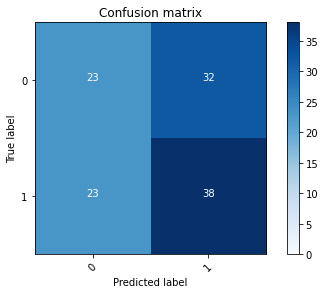

2022-08-22 17:18:29 - [Epoch Train: 59] loss: 0.2348, auc: 0.9759, acc: 0.9417, time: 24.00 s            
2022-08-22 17:18:29 - [Epoch Valid: 59] loss: 0.9818, auc: 0.5255, acc: 0.5397, time: 6.00 s


 59%|████████████████████████▊                 | 59/100 [30:49<21:26, 31.37s/it]

2022-08-22 17:18:29 - EPOCH: 60
2022-08-22 17:18:29 - Train Step 10/480, train_loss: 0.1479
2022-08-22 17:18:30 - Train Step 20/480, train_loss: 0.1754
2022-08-22 17:18:30 - Train Step 30/480, train_loss: 0.1344
2022-08-22 17:18:31 - Train Step 40/480, train_loss: 0.1974
2022-08-22 17:18:31 - Train Step 50/480, train_loss: 0.2005
2022-08-22 17:18:32 - Train Step 60/480, train_loss: 0.1975
2022-08-22 17:18:32 - Train Step 70/480, train_loss: 0.2246
2022-08-22 17:18:33 - Train Step 80/480, train_loss: 0.2161
2022-08-22 17:18:33 - Train Step 90/480, train_loss: 0.2145
2022-08-22 17:18:34 - Train Step 100/480, train_loss: 0.2053
2022-08-22 17:18:34 - Train Step 110/480, train_loss: 0.2015
2022-08-22 17:18:35 - Train Step 120/480, train_loss: 0.1985
2022-08-22 17:18:35 - Train Step 130/480, train_loss: 0.2130
2022-08-22 17:18:36 - Train Step 140/480, train_loss: 0.2088
2022-08-22 17:18:36 - Train Step 150/480, train_loss: 0.2153
2022-08-22 17:18:37 - Train Step 160/480, train_loss: 0.2290
2

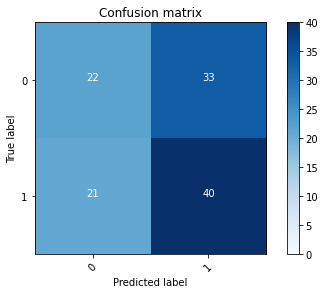

2022-08-22 17:19:00 - [Epoch Train: 60] loss: 0.2214, auc: 0.9772, acc: 0.9417, time: 24.00 s            
2022-08-22 17:19:00 - [Epoch Valid: 60] loss: 0.9885, auc: 0.5300, acc: 0.5397, time: 6.00 s


 60%|█████████████████████████▏                | 60/100 [31:20<20:56, 31.42s/it]

2022-08-22 17:19:00 - EPOCH: 61
2022-08-22 17:19:01 - Train Step 10/480, train_loss: 0.2629
2022-08-22 17:19:01 - Train Step 20/480, train_loss: 0.2472
2022-08-22 17:19:02 - Train Step 30/480, train_loss: 0.2416
2022-08-22 17:19:02 - Train Step 40/480, train_loss: 0.2254
2022-08-22 17:19:03 - Train Step 50/480, train_loss: 0.2422
2022-08-22 17:19:03 - Train Step 60/480, train_loss: 0.2334
2022-08-22 17:19:04 - Train Step 70/480, train_loss: 0.2286
2022-08-22 17:19:04 - Train Step 80/480, train_loss: 0.2130
2022-08-22 17:19:05 - Train Step 90/480, train_loss: 0.2059
2022-08-22 17:19:05 - Train Step 100/480, train_loss: 0.2102
2022-08-22 17:19:06 - Train Step 110/480, train_loss: 0.2131
2022-08-22 17:19:06 - Train Step 120/480, train_loss: 0.2075
2022-08-22 17:19:07 - Train Step 130/480, train_loss: 0.2284
2022-08-22 17:19:07 - Train Step 140/480, train_loss: 0.2294
2022-08-22 17:19:08 - Train Step 150/480, train_loss: 0.2374
2022-08-22 17:19:08 - Train Step 160/480, train_loss: 0.2338
2

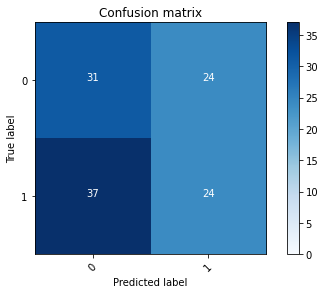

2022-08-22 17:19:31 - [Epoch Train: 61] loss: 0.2158, auc: 0.9810, acc: 0.9437, time: 24.00 s            
2022-08-22 17:19:31 - [Epoch Valid: 61] loss: 1.0826, auc: 0.5264, acc: 0.4921, time: 6.00 s


 61%|█████████████████████████▌                | 61/100 [31:51<20:21, 31.33s/it]

2022-08-22 17:19:31 - EPOCH: 62
2022-08-22 17:19:32 - Train Step 10/480, train_loss: 0.6630
2022-08-22 17:19:33 - Train Step 20/480, train_loss: 0.5213
2022-08-22 17:19:33 - Train Step 30/480, train_loss: 0.3910
2022-08-22 17:19:34 - Train Step 40/480, train_loss: 0.4075
2022-08-22 17:19:34 - Train Step 50/480, train_loss: 0.3725
2022-08-22 17:19:35 - Train Step 60/480, train_loss: 0.3298
2022-08-22 17:19:35 - Train Step 70/480, train_loss: 0.3229
2022-08-22 17:19:36 - Train Step 80/480, train_loss: 0.2936
2022-08-22 17:19:36 - Train Step 90/480, train_loss: 0.2751
2022-08-22 17:19:37 - Train Step 100/480, train_loss: 0.2530
2022-08-22 17:19:37 - Train Step 110/480, train_loss: 0.2526
2022-08-22 17:19:38 - Train Step 120/480, train_loss: 0.2442
2022-08-22 17:19:38 - Train Step 130/480, train_loss: 0.2403
2022-08-22 17:19:39 - Train Step 140/480, train_loss: 0.2297
2022-08-22 17:19:39 - Train Step 150/480, train_loss: 0.2204
2022-08-22 17:19:40 - Train Step 160/480, train_loss: 0.2187
2

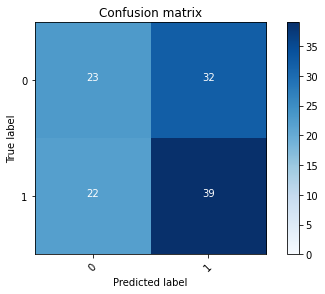

2022-08-22 17:20:03 - [Epoch Train: 62] loss: 0.2139, auc: 0.9792, acc: 0.9354, time: 24.00 s            
2022-08-22 17:20:03 - [Epoch Valid: 62] loss: 1.0010, auc: 0.5139, acc: 0.5397, time: 6.00 s


 62%|██████████████████████████                | 62/100 [32:23<19:50, 31.33s/it]

2022-08-22 17:20:03 - EPOCH: 63
2022-08-22 17:20:03 - Train Step 10/480, train_loss: 0.1685
2022-08-22 17:20:04 - Train Step 20/480, train_loss: 0.1350
2022-08-22 17:20:04 - Train Step 30/480, train_loss: 0.1741
2022-08-22 17:20:05 - Train Step 40/480, train_loss: 0.1858
2022-08-22 17:20:05 - Train Step 50/480, train_loss: 0.1701
2022-08-22 17:20:06 - Train Step 60/480, train_loss: 0.1757
2022-08-22 17:20:06 - Train Step 70/480, train_loss: 0.1724
2022-08-22 17:20:07 - Train Step 80/480, train_loss: 0.1723
2022-08-22 17:20:07 - Train Step 90/480, train_loss: 0.1791
2022-08-22 17:20:08 - Train Step 100/480, train_loss: 0.2019
2022-08-22 17:20:08 - Train Step 110/480, train_loss: 0.1966
2022-08-22 17:20:09 - Train Step 120/480, train_loss: 0.2052
2022-08-22 17:20:09 - Train Step 130/480, train_loss: 0.2013
2022-08-22 17:20:10 - Train Step 140/480, train_loss: 0.2025
2022-08-22 17:20:10 - Train Step 150/480, train_loss: 0.2066
2022-08-22 17:20:11 - Train Step 160/480, train_loss: 0.2031
2

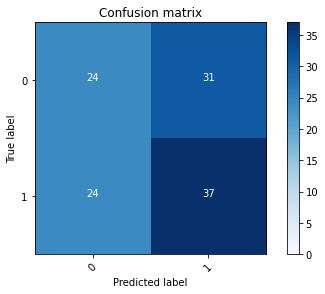

2022-08-22 17:20:34 - [Epoch Train: 63] loss: 0.2083, auc: 0.9830, acc: 0.9333, time: 24.00 s            
2022-08-22 17:20:34 - [Epoch Valid: 63] loss: 1.0125, auc: 0.5204, acc: 0.5397, time: 6.00 s


 63%|██████████████████████████▍               | 63/100 [32:54<19:14, 31.19s/it]

2022-08-22 17:20:34 - EPOCH: 64
2022-08-22 17:20:34 - Train Step 10/480, train_loss: 0.3526
2022-08-22 17:20:35 - Train Step 20/480, train_loss: 0.2513
2022-08-22 17:20:35 - Train Step 30/480, train_loss: 0.1874
2022-08-22 17:20:36 - Train Step 40/480, train_loss: 0.2179
2022-08-22 17:20:36 - Train Step 50/480, train_loss: 0.2180
2022-08-22 17:20:37 - Train Step 60/480, train_loss: 0.1990
2022-08-22 17:20:37 - Train Step 70/480, train_loss: 0.1941
2022-08-22 17:20:38 - Train Step 80/480, train_loss: 0.1862
2022-08-22 17:20:38 - Train Step 90/480, train_loss: 0.1756
2022-08-22 17:20:39 - Train Step 100/480, train_loss: 0.1800
2022-08-22 17:20:39 - Train Step 110/480, train_loss: 0.1877
2022-08-22 17:20:40 - Train Step 120/480, train_loss: 0.2048
2022-08-22 17:20:40 - Train Step 130/480, train_loss: 0.2095
2022-08-22 17:20:41 - Train Step 140/480, train_loss: 0.2041
2022-08-22 17:20:41 - Train Step 150/480, train_loss: 0.1999
2022-08-22 17:20:42 - Train Step 160/480, train_loss: 0.2026
2

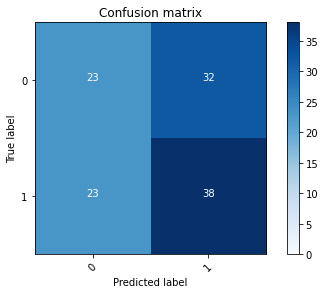

2022-08-22 17:21:05 - [Epoch Train: 64] loss: 0.2008, auc: 0.9830, acc: 0.9375, time: 24.00 s            
2022-08-22 17:21:05 - [Epoch Valid: 64] loss: 1.0216, auc: 0.5201, acc: 0.5317, time: 6.00 s


 64%|██████████████████████████▉               | 64/100 [33:25<18:47, 31.33s/it]

2022-08-22 17:21:05 - EPOCH: 65
2022-08-22 17:21:06 - Train Step 10/480, train_loss: 0.1277
2022-08-22 17:21:06 - Train Step 20/480, train_loss: 0.1403
2022-08-22 17:21:07 - Train Step 30/480, train_loss: 0.1540
2022-08-22 17:21:07 - Train Step 40/480, train_loss: 0.1743
2022-08-22 17:21:08 - Train Step 50/480, train_loss: 0.1735
2022-08-22 17:21:08 - Train Step 60/480, train_loss: 0.1839
2022-08-22 17:21:09 - Train Step 70/480, train_loss: 0.1740
2022-08-22 17:21:09 - Train Step 80/480, train_loss: 0.1717
2022-08-22 17:21:10 - Train Step 90/480, train_loss: 0.1922
2022-08-22 17:21:10 - Train Step 100/480, train_loss: 0.1869
2022-08-22 17:21:11 - Train Step 110/480, train_loss: 0.1818
2022-08-22 17:21:11 - Train Step 120/480, train_loss: 0.1904
2022-08-22 17:21:12 - Train Step 130/480, train_loss: 0.1871
2022-08-22 17:21:12 - Train Step 140/480, train_loss: 0.2023
2022-08-22 17:21:13 - Train Step 150/480, train_loss: 0.1934
2022-08-22 17:21:13 - Train Step 160/480, train_loss: 0.1908
2

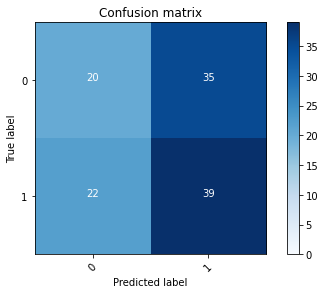

2022-08-22 17:21:37 - [Epoch Train: 65] loss: 0.1922, auc: 0.9855, acc: 0.9500, time: 24.00 s            
2022-08-22 17:21:37 - [Epoch Valid: 65] loss: 1.0711, auc: 0.5148, acc: 0.5159, time: 6.00 s


 65%|███████████████████████████▎              | 65/100 [33:57<18:18, 31.37s/it]

2022-08-22 17:21:37 - EPOCH: 66
2022-08-22 17:21:37 - Train Step 10/480, train_loss: 0.2792
2022-08-22 17:21:38 - Train Step 20/480, train_loss: 0.1770
2022-08-22 17:21:38 - Train Step 30/480, train_loss: 0.1544
2022-08-22 17:21:39 - Train Step 40/480, train_loss: 0.1933
2022-08-22 17:21:39 - Train Step 50/480, train_loss: 0.1913
2022-08-22 17:21:40 - Train Step 60/480, train_loss: 0.2067
2022-08-22 17:21:40 - Train Step 70/480, train_loss: 0.2092
2022-08-22 17:21:41 - Train Step 80/480, train_loss: 0.2002
2022-08-22 17:21:41 - Train Step 90/480, train_loss: 0.2030
2022-08-22 17:21:42 - Train Step 100/480, train_loss: 0.1958
2022-08-22 17:21:42 - Train Step 110/480, train_loss: 0.1878
2022-08-22 17:21:43 - Train Step 120/480, train_loss: 0.1821
2022-08-22 17:21:43 - Train Step 130/480, train_loss: 0.1806
2022-08-22 17:21:44 - Train Step 140/480, train_loss: 0.1792
2022-08-22 17:21:44 - Train Step 150/480, train_loss: 0.1770
2022-08-22 17:21:45 - Train Step 160/480, train_loss: 0.1757
2

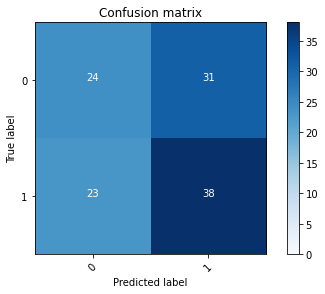

2022-08-22 17:22:08 - [Epoch Train: 66] loss: 0.1787, auc: 0.9879, acc: 0.9479, time: 24.00 s            
2022-08-22 17:22:08 - [Epoch Valid: 66] loss: 1.0734, auc: 0.5246, acc: 0.5476, time: 6.00 s


 66%|███████████████████████████▋              | 66/100 [34:28<17:44, 31.30s/it]

2022-08-22 17:22:08 - EPOCH: 67
2022-08-22 17:22:08 - Train Step 10/480, train_loss: 0.1497
2022-08-22 17:22:09 - Train Step 20/480, train_loss: 0.2108
2022-08-22 17:22:09 - Train Step 30/480, train_loss: 0.1915
2022-08-22 17:22:10 - Train Step 40/480, train_loss: 0.1773
2022-08-22 17:22:10 - Train Step 50/480, train_loss: 0.1972
2022-08-22 17:22:11 - Train Step 60/480, train_loss: 0.1718
2022-08-22 17:22:11 - Train Step 70/480, train_loss: 0.1641
2022-08-22 17:22:12 - Train Step 80/480, train_loss: 0.1634
2022-08-22 17:22:13 - Train Step 90/480, train_loss: 0.1724
2022-08-22 17:22:13 - Train Step 100/480, train_loss: 0.1702
2022-08-22 17:22:14 - Train Step 110/480, train_loss: 0.1735
2022-08-22 17:22:14 - Train Step 120/480, train_loss: 0.1666
2022-08-22 17:22:15 - Train Step 130/480, train_loss: 0.1650
2022-08-22 17:22:15 - Train Step 140/480, train_loss: 0.1629
2022-08-22 17:22:16 - Train Step 150/480, train_loss: 0.1655
2022-08-22 17:22:16 - Train Step 160/480, train_loss: 0.1579
2

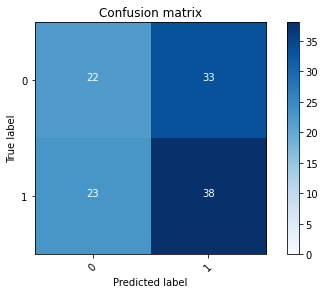

2022-08-22 17:22:39 - [Epoch Train: 67] loss: 0.1641, auc: 0.9925, acc: 0.9625, time: 24.00 s            
2022-08-22 17:22:39 - [Epoch Valid: 67] loss: 1.1097, auc: 0.5109, acc: 0.5238, time: 6.00 s


 67%|████████████████████████████▏             | 67/100 [34:59<17:12, 31.28s/it]

2022-08-22 17:22:39 - EPOCH: 68
2022-08-22 17:22:40 - Train Step 10/480, train_loss: 0.1058
2022-08-22 17:22:40 - Train Step 20/480, train_loss: 0.1413
2022-08-22 17:22:41 - Train Step 30/480, train_loss: 0.1472
2022-08-22 17:22:41 - Train Step 40/480, train_loss: 0.1350
2022-08-22 17:22:42 - Train Step 50/480, train_loss: 0.1242
2022-08-22 17:22:42 - Train Step 60/480, train_loss: 0.1261
2022-08-22 17:22:43 - Train Step 70/480, train_loss: 0.1507
2022-08-22 17:22:43 - Train Step 80/480, train_loss: 0.1625
2022-08-22 17:22:44 - Train Step 90/480, train_loss: 0.1721
2022-08-22 17:22:44 - Train Step 100/480, train_loss: 0.1676
2022-08-22 17:22:45 - Train Step 110/480, train_loss: 0.1599
2022-08-22 17:22:45 - Train Step 120/480, train_loss: 0.1612
2022-08-22 17:22:46 - Train Step 130/480, train_loss: 0.1600
2022-08-22 17:22:46 - Train Step 140/480, train_loss: 0.1658
2022-08-22 17:22:47 - Train Step 150/480, train_loss: 0.1760
2022-08-22 17:22:47 - Train Step 160/480, train_loss: 0.1738
2

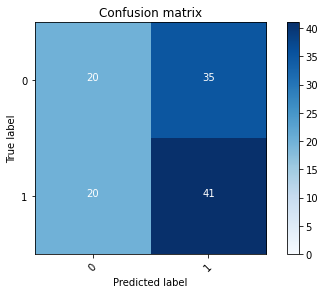

2022-08-22 17:23:10 - [Epoch Train: 68] loss: 0.1599, auc: 0.9931, acc: 0.9688, time: 24.00 s            
2022-08-22 17:23:10 - [Epoch Valid: 68] loss: 1.0860, auc: 0.5231, acc: 0.5317, time: 6.00 s


 68%|████████████████████████████▌             | 68/100 [35:30<16:40, 31.28s/it]

2022-08-22 17:23:10 - EPOCH: 69
2022-08-22 17:23:11 - Train Step 10/480, train_loss: 0.2229
2022-08-22 17:23:11 - Train Step 20/480, train_loss: 0.2126
2022-08-22 17:23:12 - Train Step 30/480, train_loss: 0.1677
2022-08-22 17:23:13 - Train Step 40/480, train_loss: 0.1570
2022-08-22 17:23:13 - Train Step 50/480, train_loss: 0.1485
2022-08-22 17:23:14 - Train Step 60/480, train_loss: 0.1343
2022-08-22 17:23:14 - Train Step 70/480, train_loss: 0.1311
2022-08-22 17:23:15 - Train Step 80/480, train_loss: 0.1506
2022-08-22 17:23:15 - Train Step 90/480, train_loss: 0.1457
2022-08-22 17:23:16 - Train Step 100/480, train_loss: 0.1430
2022-08-22 17:23:16 - Train Step 110/480, train_loss: 0.1483
2022-08-22 17:23:17 - Train Step 120/480, train_loss: 0.1480
2022-08-22 17:23:17 - Train Step 130/480, train_loss: 0.1580
2022-08-22 17:23:18 - Train Step 140/480, train_loss: 0.1562
2022-08-22 17:23:18 - Train Step 150/480, train_loss: 0.1516
2022-08-22 17:23:19 - Train Step 160/480, train_loss: 0.1508
2

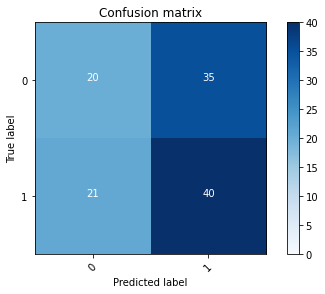

2022-08-22 17:23:42 - [Epoch Train: 69] loss: 0.1439, auc: 0.9921, acc: 0.9542, time: 24.00 s            
2022-08-22 17:23:42 - [Epoch Valid: 69] loss: 1.1701, auc: 0.5156, acc: 0.5238, time: 6.00 s


 69%|████████████████████████████▉             | 69/100 [36:02<16:11, 31.33s/it]

2022-08-22 17:23:42 - EPOCH: 70
2022-08-22 17:23:42 - Train Step 10/480, train_loss: 0.0818
2022-08-22 17:23:43 - Train Step 20/480, train_loss: 0.1001
2022-08-22 17:23:43 - Train Step 30/480, train_loss: 0.1528
2022-08-22 17:23:44 - Train Step 40/480, train_loss: 0.1464
2022-08-22 17:23:44 - Train Step 50/480, train_loss: 0.1364
2022-08-22 17:23:45 - Train Step 60/480, train_loss: 0.1246
2022-08-22 17:23:45 - Train Step 70/480, train_loss: 0.1252
2022-08-22 17:23:46 - Train Step 80/480, train_loss: 0.1220
2022-08-22 17:23:46 - Train Step 90/480, train_loss: 0.1129
2022-08-22 17:23:47 - Train Step 100/480, train_loss: 0.1068
2022-08-22 17:23:47 - Train Step 110/480, train_loss: 0.1156
2022-08-22 17:23:48 - Train Step 120/480, train_loss: 0.1199
2022-08-22 17:23:48 - Train Step 130/480, train_loss: 0.1220
2022-08-22 17:23:49 - Train Step 140/480, train_loss: 0.1221
2022-08-22 17:23:49 - Train Step 150/480, train_loss: 0.1214
2022-08-22 17:23:50 - Train Step 160/480, train_loss: 0.1259
2

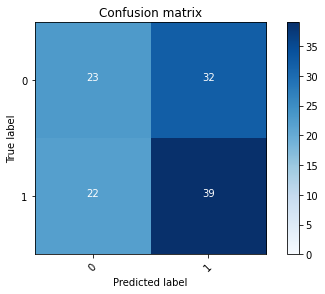

2022-08-22 17:24:13 - [Epoch Train: 70] loss: 0.1467, auc: 0.9929, acc: 0.9625, time: 24.00 s            
2022-08-22 17:24:13 - [Epoch Valid: 70] loss: 1.1367, auc: 0.5249, acc: 0.5397, time: 6.00 s


 70%|█████████████████████████████▍            | 70/100 [36:33<15:36, 31.23s/it]

2022-08-22 17:24:13 - EPOCH: 71
2022-08-22 17:24:13 - Train Step 10/480, train_loss: 0.1776
2022-08-22 17:24:14 - Train Step 20/480, train_loss: 0.1620
2022-08-22 17:24:14 - Train Step 30/480, train_loss: 0.1862
2022-08-22 17:24:15 - Train Step 40/480, train_loss: 0.1855
2022-08-22 17:24:15 - Train Step 50/480, train_loss: 0.1832
2022-08-22 17:24:16 - Train Step 60/480, train_loss: 0.1625
2022-08-22 17:24:16 - Train Step 70/480, train_loss: 0.1457
2022-08-22 17:24:17 - Train Step 80/480, train_loss: 0.1370
2022-08-22 17:24:17 - Train Step 90/480, train_loss: 0.1394
2022-08-22 17:24:18 - Train Step 100/480, train_loss: 0.1369
2022-08-22 17:24:18 - Train Step 110/480, train_loss: 0.1538
2022-08-22 17:24:19 - Train Step 120/480, train_loss: 0.1438
2022-08-22 17:24:20 - Train Step 130/480, train_loss: 0.1395
2022-08-22 17:24:20 - Train Step 140/480, train_loss: 0.1491
2022-08-22 17:24:21 - Train Step 150/480, train_loss: 0.1502
2022-08-22 17:24:21 - Train Step 160/480, train_loss: 0.1504
2

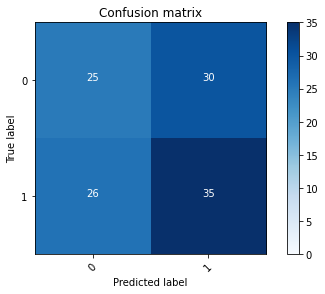

2022-08-22 17:24:44 - [Epoch Train: 71] loss: 0.1428, auc: 0.9943, acc: 0.9708, time: 25.00 s            
2022-08-22 17:24:44 - [Epoch Valid: 71] loss: 1.1206, auc: 0.5246, acc: 0.5317, time: 6.00 s


 71%|█████████████████████████████▊            | 71/100 [37:04<15:09, 31.38s/it]

2022-08-22 17:24:44 - EPOCH: 72
2022-08-22 17:24:45 - Train Step 10/480, train_loss: 0.0892
2022-08-22 17:24:46 - Train Step 20/480, train_loss: 0.1184
2022-08-22 17:24:46 - Train Step 30/480, train_loss: 0.1412
2022-08-22 17:24:47 - Train Step 40/480, train_loss: 0.1345
2022-08-22 17:24:47 - Train Step 50/480, train_loss: 0.1191
2022-08-22 17:24:48 - Train Step 60/480, train_loss: 0.1362
2022-08-22 17:24:48 - Train Step 70/480, train_loss: 0.1323
2022-08-22 17:24:49 - Train Step 80/480, train_loss: 0.1438
2022-08-22 17:24:49 - Train Step 90/480, train_loss: 0.1378
2022-08-22 17:24:50 - Train Step 100/480, train_loss: 0.1366
2022-08-22 17:24:50 - Train Step 110/480, train_loss: 0.1344
2022-08-22 17:24:51 - Train Step 120/480, train_loss: 0.1384
2022-08-22 17:24:51 - Train Step 130/480, train_loss: 0.1327
2022-08-22 17:24:52 - Train Step 140/480, train_loss: 0.1285
2022-08-22 17:24:52 - Train Step 150/480, train_loss: 0.1274
2022-08-22 17:24:53 - Train Step 160/480, train_loss: 0.1292
2

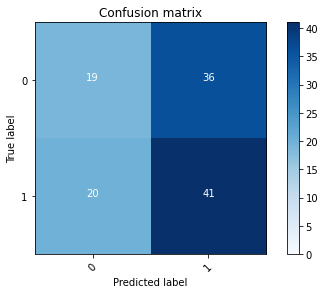

2022-08-22 17:25:16 - [Epoch Train: 72] loss: 0.1343, auc: 0.9959, acc: 0.9750, time: 24.00 s            
2022-08-22 17:25:16 - [Epoch Valid: 72] loss: 1.2049, auc: 0.5180, acc: 0.5238, time: 6.00 s


 72%|██████████████████████████████▏           | 72/100 [37:36<14:36, 31.30s/it]

2022-08-22 17:25:16 - EPOCH: 73
2022-08-22 17:25:16 - Train Step 10/480, train_loss: 0.0864
2022-08-22 17:25:17 - Train Step 20/480, train_loss: 0.1129
2022-08-22 17:25:17 - Train Step 30/480, train_loss: 0.1052
2022-08-22 17:25:18 - Train Step 40/480, train_loss: 0.1386
2022-08-22 17:25:18 - Train Step 50/480, train_loss: 0.1271
2022-08-22 17:25:19 - Train Step 60/480, train_loss: 0.1124
2022-08-22 17:25:19 - Train Step 70/480, train_loss: 0.1091
2022-08-22 17:25:20 - Train Step 80/480, train_loss: 0.1103
2022-08-22 17:25:20 - Train Step 90/480, train_loss: 0.1089
2022-08-22 17:25:21 - Train Step 100/480, train_loss: 0.1235
2022-08-22 17:25:21 - Train Step 110/480, train_loss: 0.1275
2022-08-22 17:25:22 - Train Step 120/480, train_loss: 0.1278
2022-08-22 17:25:22 - Train Step 130/480, train_loss: 0.1284
2022-08-22 17:25:23 - Train Step 140/480, train_loss: 0.1271
2022-08-22 17:25:23 - Train Step 150/480, train_loss: 0.1259
2022-08-22 17:25:24 - Train Step 160/480, train_loss: 0.1216
2

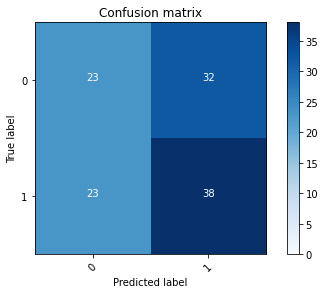

2022-08-22 17:25:47 - [Epoch Train: 73] loss: 0.1246, auc: 0.9959, acc: 0.9792, time: 24.00 s            
2022-08-22 17:25:47 - [Epoch Valid: 73] loss: 1.2166, auc: 0.5177, acc: 0.5317, time: 6.00 s


 73%|██████████████████████████████▋           | 73/100 [38:07<14:04, 31.29s/it]

2022-08-22 17:25:47 - EPOCH: 74
2022-08-22 17:25:47 - Train Step 10/480, train_loss: 0.0467
2022-08-22 17:25:48 - Train Step 20/480, train_loss: 0.1168
2022-08-22 17:25:48 - Train Step 30/480, train_loss: 0.1030
2022-08-22 17:25:49 - Train Step 40/480, train_loss: 0.0835
2022-08-22 17:25:49 - Train Step 50/480, train_loss: 0.0839
2022-08-22 17:25:50 - Train Step 60/480, train_loss: 0.0881
2022-08-22 17:25:50 - Train Step 70/480, train_loss: 0.0989
2022-08-22 17:25:51 - Train Step 80/480, train_loss: 0.1029
2022-08-22 17:25:51 - Train Step 90/480, train_loss: 0.1057
2022-08-22 17:25:52 - Train Step 100/480, train_loss: 0.1132
2022-08-22 17:25:52 - Train Step 110/480, train_loss: 0.1119
2022-08-22 17:25:53 - Train Step 120/480, train_loss: 0.1151
2022-08-22 17:25:53 - Train Step 130/480, train_loss: 0.1136
2022-08-22 17:25:54 - Train Step 140/480, train_loss: 0.1132
2022-08-22 17:25:54 - Train Step 150/480, train_loss: 0.1146
2022-08-22 17:25:55 - Train Step 160/480, train_loss: 0.1104
2

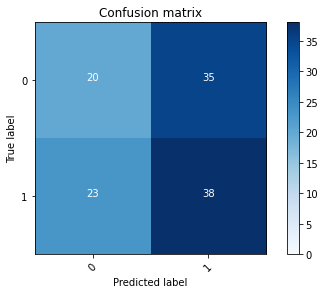

2022-08-22 17:26:18 - [Epoch Train: 74] loss: 0.1202, auc: 0.9972, acc: 0.9729, time: 24.00 s            
2022-08-22 17:26:18 - [Epoch Valid: 74] loss: 1.3300, auc: 0.5145, acc: 0.5079, time: 6.00 s


 74%|███████████████████████████████           | 74/100 [38:38<13:32, 31.26s/it]

2022-08-22 17:26:18 - EPOCH: 75
2022-08-22 17:26:19 - Train Step 10/480, train_loss: 0.2071
2022-08-22 17:26:19 - Train Step 20/480, train_loss: 0.1588
2022-08-22 17:26:20 - Train Step 30/480, train_loss: 0.1966
2022-08-22 17:26:20 - Train Step 40/480, train_loss: 0.1777
2022-08-22 17:26:21 - Train Step 50/480, train_loss: 0.1604
2022-08-22 17:26:21 - Train Step 60/480, train_loss: 0.1521
2022-08-22 17:26:22 - Train Step 70/480, train_loss: 0.1429
2022-08-22 17:26:22 - Train Step 80/480, train_loss: 0.1329
2022-08-22 17:26:23 - Train Step 90/480, train_loss: 0.1270
2022-08-22 17:26:23 - Train Step 100/480, train_loss: 0.1227
2022-08-22 17:26:24 - Train Step 110/480, train_loss: 0.1235
2022-08-22 17:26:24 - Train Step 120/480, train_loss: 0.1319
2022-08-22 17:26:25 - Train Step 130/480, train_loss: 0.1416
2022-08-22 17:26:25 - Train Step 140/480, train_loss: 0.1354
2022-08-22 17:26:26 - Train Step 150/480, train_loss: 0.1342
2022-08-22 17:26:26 - Train Step 160/480, train_loss: 0.1277
2

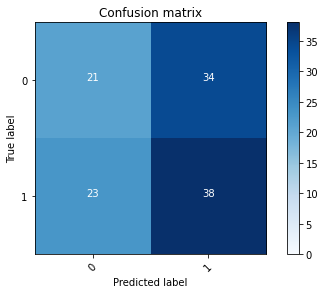

2022-08-22 17:26:49 - [Epoch Train: 75] loss: 0.1137, auc: 0.9977, acc: 0.9750, time: 24.00 s            
2022-08-22 17:26:49 - [Epoch Valid: 75] loss: 1.3098, auc: 0.5094, acc: 0.5159, time: 6.00 s


 75%|███████████████████████████████▌          | 75/100 [39:09<13:00, 31.21s/it]

2022-08-22 17:26:49 - EPOCH: 76
2022-08-22 17:26:50 - Train Step 10/480, train_loss: 0.1462
2022-08-22 17:26:50 - Train Step 20/480, train_loss: 0.1254
2022-08-22 17:26:51 - Train Step 30/480, train_loss: 0.0989
2022-08-22 17:26:51 - Train Step 40/480, train_loss: 0.0910
2022-08-22 17:26:52 - Train Step 50/480, train_loss: 0.0859
2022-08-22 17:26:52 - Train Step 60/480, train_loss: 0.0785
2022-08-22 17:26:53 - Train Step 70/480, train_loss: 0.0691
2022-08-22 17:26:53 - Train Step 80/480, train_loss: 0.0728
2022-08-22 17:26:54 - Train Step 90/480, train_loss: 0.0730
2022-08-22 17:26:54 - Train Step 100/480, train_loss: 0.0784
2022-08-22 17:26:55 - Train Step 110/480, train_loss: 0.0746
2022-08-22 17:26:55 - Train Step 120/480, train_loss: 0.0725
2022-08-22 17:26:56 - Train Step 130/480, train_loss: 0.0704
2022-08-22 17:26:56 - Train Step 140/480, train_loss: 0.0723
2022-08-22 17:26:57 - Train Step 150/480, train_loss: 0.0797
2022-08-22 17:26:57 - Train Step 160/480, train_loss: 0.0792
2

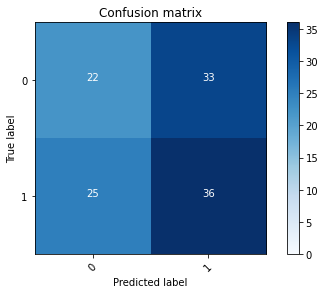

2022-08-22 17:27:20 - [Epoch Train: 76] loss: 0.0938, auc: 0.9984, acc: 0.9792, time: 24.00 s            
2022-08-22 17:27:20 - [Epoch Valid: 76] loss: 1.3461, auc: 0.5064, acc: 0.5079, time: 6.00 s


 76%|███████████████████████████████▉          | 76/100 [39:40<12:28, 31.20s/it]

2022-08-22 17:27:20 - EPOCH: 77
2022-08-22 17:27:21 - Train Step 10/480, train_loss: 0.1551
2022-08-22 17:27:21 - Train Step 20/480, train_loss: 0.1663
2022-08-22 17:27:22 - Train Step 30/480, train_loss: 0.1793
2022-08-22 17:27:22 - Train Step 40/480, train_loss: 0.1484
2022-08-22 17:27:23 - Train Step 50/480, train_loss: 0.1263
2022-08-22 17:27:23 - Train Step 60/480, train_loss: 0.1127
2022-08-22 17:27:24 - Train Step 70/480, train_loss: 0.1111
2022-08-22 17:27:24 - Train Step 80/480, train_loss: 0.1087
2022-08-22 17:27:25 - Train Step 90/480, train_loss: 0.1225
2022-08-22 17:27:26 - Train Step 100/480, train_loss: 0.1185
2022-08-22 17:27:26 - Train Step 110/480, train_loss: 0.1144
2022-08-22 17:27:27 - Train Step 120/480, train_loss: 0.1111
2022-08-22 17:27:27 - Train Step 130/480, train_loss: 0.1133
2022-08-22 17:27:28 - Train Step 140/480, train_loss: 0.1132
2022-08-22 17:27:28 - Train Step 150/480, train_loss: 0.1122
2022-08-22 17:27:29 - Train Step 160/480, train_loss: 0.1082
2

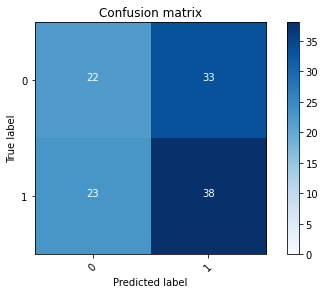

2022-08-22 17:27:52 - [Epoch Train: 77] loss: 0.1093, auc: 0.9967, acc: 0.9771, time: 24.00 s            
2022-08-22 17:27:52 - [Epoch Valid: 77] loss: 1.2964, auc: 0.5198, acc: 0.5238, time: 6.00 s


 77%|████████████████████████████████▎         | 77/100 [40:12<11:58, 31.23s/it]

2022-08-22 17:27:52 - EPOCH: 78
2022-08-22 17:27:52 - Train Step 10/480, train_loss: 0.0918
2022-08-22 17:27:53 - Train Step 20/480, train_loss: 0.0837
2022-08-22 17:27:53 - Train Step 30/480, train_loss: 0.0711
2022-08-22 17:27:54 - Train Step 40/480, train_loss: 0.0687
2022-08-22 17:27:54 - Train Step 50/480, train_loss: 0.0695
2022-08-22 17:27:55 - Train Step 60/480, train_loss: 0.0927
2022-08-22 17:27:55 - Train Step 70/480, train_loss: 0.1079
2022-08-22 17:27:56 - Train Step 80/480, train_loss: 0.1029
2022-08-22 17:27:56 - Train Step 90/480, train_loss: 0.1014
2022-08-22 17:27:57 - Train Step 100/480, train_loss: 0.0977
2022-08-22 17:27:57 - Train Step 110/480, train_loss: 0.0937
2022-08-22 17:27:58 - Train Step 120/480, train_loss: 0.1078
2022-08-22 17:27:58 - Train Step 130/480, train_loss: 0.1045
2022-08-22 17:27:59 - Train Step 140/480, train_loss: 0.1018
2022-08-22 17:28:00 - Train Step 150/480, train_loss: 0.1097
2022-08-22 17:28:00 - Train Step 160/480, train_loss: 0.1079
2

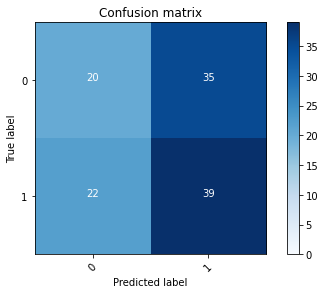

2022-08-22 17:28:23 - [Epoch Train: 78] loss: 0.0889, auc: 0.9986, acc: 0.9792, time: 24.00 s            
2022-08-22 17:28:23 - [Epoch Valid: 78] loss: 1.2414, auc: 0.5204, acc: 0.5159, time: 6.00 s


 78%|████████████████████████████████▊         | 78/100 [40:43<11:29, 31.33s/it]

2022-08-22 17:28:23 - EPOCH: 79
2022-08-22 17:28:24 - Train Step 10/480, train_loss: 0.0669
2022-08-22 17:28:24 - Train Step 20/480, train_loss: 0.0618
2022-08-22 17:28:25 - Train Step 30/480, train_loss: 0.0676
2022-08-22 17:28:25 - Train Step 40/480, train_loss: 0.0854
2022-08-22 17:28:26 - Train Step 50/480, train_loss: 0.0822
2022-08-22 17:28:26 - Train Step 60/480, train_loss: 0.0823
2022-08-22 17:28:27 - Train Step 70/480, train_loss: 0.0868
2022-08-22 17:28:27 - Train Step 80/480, train_loss: 0.0796
2022-08-22 17:28:28 - Train Step 90/480, train_loss: 0.0813
2022-08-22 17:28:28 - Train Step 100/480, train_loss: 0.0748
2022-08-22 17:28:29 - Train Step 110/480, train_loss: 0.0734
2022-08-22 17:28:29 - Train Step 120/480, train_loss: 0.0774
2022-08-22 17:28:30 - Train Step 130/480, train_loss: 0.0744
2022-08-22 17:28:31 - Train Step 140/480, train_loss: 0.0721
2022-08-22 17:28:31 - Train Step 150/480, train_loss: 0.0751
2022-08-22 17:28:32 - Train Step 160/480, train_loss: 0.0746
2

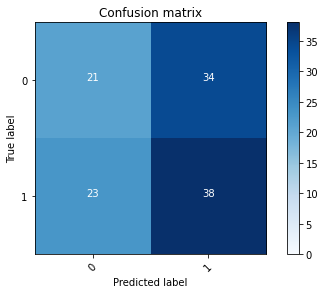

2022-08-22 17:28:55 - [Epoch Train: 79] loss: 0.0942, auc: 0.9977, acc: 0.9750, time: 24.00 s            
2022-08-22 17:28:55 - [Epoch Valid: 79] loss: 1.3689, auc: 0.5097, acc: 0.5159, time: 6.00 s


 79%|█████████████████████████████████▏        | 79/100 [41:15<10:59, 31.40s/it]

2022-08-22 17:28:55 - EPOCH: 80
2022-08-22 17:28:56 - Train Step 10/480, train_loss: 0.0473
2022-08-22 17:28:56 - Train Step 20/480, train_loss: 0.0699
2022-08-22 17:28:57 - Train Step 30/480, train_loss: 0.0726
2022-08-22 17:28:57 - Train Step 40/480, train_loss: 0.0860
2022-08-22 17:28:58 - Train Step 50/480, train_loss: 0.0805
2022-08-22 17:28:58 - Train Step 60/480, train_loss: 0.0740
2022-08-22 17:28:59 - Train Step 70/480, train_loss: 0.0714
2022-08-22 17:28:59 - Train Step 80/480, train_loss: 0.0649
2022-08-22 17:29:00 - Train Step 90/480, train_loss: 0.0726
2022-08-22 17:29:00 - Train Step 100/480, train_loss: 0.0818
2022-08-22 17:29:01 - Train Step 110/480, train_loss: 0.0845
2022-08-22 17:29:01 - Train Step 120/480, train_loss: 0.0829
2022-08-22 17:29:02 - Train Step 130/480, train_loss: 0.0829
2022-08-22 17:29:02 - Train Step 140/480, train_loss: 0.0806
2022-08-22 17:29:03 - Train Step 150/480, train_loss: 0.0850
2022-08-22 17:29:03 - Train Step 160/480, train_loss: 0.0859
2

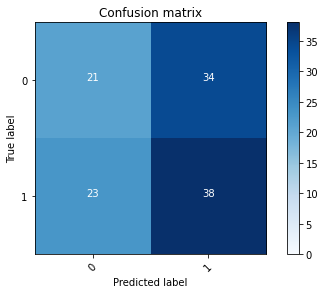

2022-08-22 17:29:26 - [Epoch Train: 80] loss: 0.0901, auc: 0.9983, acc: 0.9771, time: 24.00 s            
2022-08-22 17:29:26 - [Epoch Valid: 80] loss: 1.3973, auc: 0.5130, acc: 0.5159, time: 6.00 s


 80%|█████████████████████████████████▌        | 80/100 [41:46<10:28, 31.42s/it]

2022-08-22 17:29:26 - EPOCH: 81
2022-08-22 17:29:27 - Train Step 10/480, train_loss: 0.0982
2022-08-22 17:29:27 - Train Step 20/480, train_loss: 0.0858
2022-08-22 17:29:28 - Train Step 30/480, train_loss: 0.0928
2022-08-22 17:29:28 - Train Step 40/480, train_loss: 0.1309
2022-08-22 17:29:29 - Train Step 50/480, train_loss: 0.1234
2022-08-22 17:29:29 - Train Step 60/480, train_loss: 0.1208
2022-08-22 17:29:30 - Train Step 70/480, train_loss: 0.1216
2022-08-22 17:29:30 - Train Step 80/480, train_loss: 0.1083
2022-08-22 17:29:31 - Train Step 90/480, train_loss: 0.0990
2022-08-22 17:29:31 - Train Step 100/480, train_loss: 0.0987
2022-08-22 17:29:32 - Train Step 110/480, train_loss: 0.0932
2022-08-22 17:29:32 - Train Step 120/480, train_loss: 0.0866
2022-08-22 17:29:33 - Train Step 130/480, train_loss: 0.0830
2022-08-22 17:29:33 - Train Step 140/480, train_loss: 0.0870
2022-08-22 17:29:34 - Train Step 150/480, train_loss: 0.0833
2022-08-22 17:29:34 - Train Step 160/480, train_loss: 0.0810
2

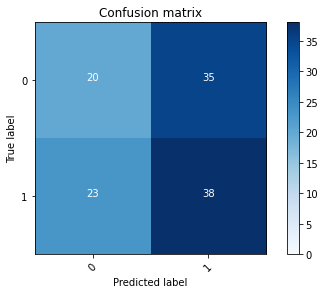

2022-08-22 17:29:57 - [Epoch Train: 81] loss: 0.0729, auc: 0.9991, acc: 0.9854, time: 24.00 s            
2022-08-22 17:29:57 - [Epoch Valid: 81] loss: 1.5018, auc: 0.5085, acc: 0.5079, time: 6.00 s


 81%|██████████████████████████████████        | 81/100 [42:17<09:55, 31.37s/it]

2022-08-22 17:29:57 - EPOCH: 82
2022-08-22 17:29:58 - Train Step 10/480, train_loss: 0.1042
2022-08-22 17:29:59 - Train Step 20/480, train_loss: 0.0920
2022-08-22 17:29:59 - Train Step 30/480, train_loss: 0.1103
2022-08-22 17:30:00 - Train Step 40/480, train_loss: 0.1101
2022-08-22 17:30:00 - Train Step 50/480, train_loss: 0.1036
2022-08-22 17:30:01 - Train Step 60/480, train_loss: 0.1097
2022-08-22 17:30:02 - Train Step 70/480, train_loss: 0.1093
2022-08-22 17:30:02 - Train Step 80/480, train_loss: 0.1093
2022-08-22 17:30:03 - Train Step 90/480, train_loss: 0.1000
2022-08-22 17:30:03 - Train Step 100/480, train_loss: 0.0977
2022-08-22 17:30:04 - Train Step 110/480, train_loss: 0.1034
2022-08-22 17:30:04 - Train Step 120/480, train_loss: 0.0988
2022-08-22 17:30:05 - Train Step 130/480, train_loss: 0.1012
2022-08-22 17:30:06 - Train Step 140/480, train_loss: 0.0995
2022-08-22 17:30:06 - Train Step 150/480, train_loss: 0.0966
2022-08-22 17:30:07 - Train Step 160/480, train_loss: 0.0930
2

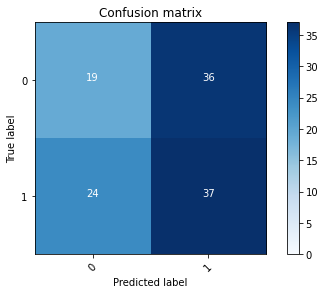

2022-08-22 17:30:33 - [Epoch Train: 82] loss: 0.0915, auc: 0.9983, acc: 0.9750, time: 27.00 s            
2022-08-22 17:30:33 - [Epoch Valid: 82] loss: 1.4876, auc: 0.5097, acc: 0.4921, time: 7.00 s


 82%|██████████████████████████████████▍       | 82/100 [42:53<09:47, 32.63s/it]

2022-08-22 17:30:33 - EPOCH: 83
2022-08-22 17:30:34 - Train Step 10/480, train_loss: 0.0424
2022-08-22 17:30:34 - Train Step 20/480, train_loss: 0.0589
2022-08-22 17:30:35 - Train Step 30/480, train_loss: 0.1306
2022-08-22 17:30:36 - Train Step 40/480, train_loss: 0.1464
2022-08-22 17:30:36 - Train Step 50/480, train_loss: 0.1288
2022-08-22 17:30:37 - Train Step 60/480, train_loss: 0.1120
2022-08-22 17:30:37 - Train Step 70/480, train_loss: 0.1091
2022-08-22 17:30:38 - Train Step 80/480, train_loss: 0.1022
2022-08-22 17:30:38 - Train Step 90/480, train_loss: 0.0923
2022-08-22 17:30:39 - Train Step 100/480, train_loss: 0.0922
2022-08-22 17:30:40 - Train Step 110/480, train_loss: 0.0909
2022-08-22 17:30:40 - Train Step 120/480, train_loss: 0.0880
2022-08-22 17:30:41 - Train Step 130/480, train_loss: 0.0875
2022-08-22 17:30:41 - Train Step 140/480, train_loss: 0.0854
2022-08-22 17:30:42 - Train Step 150/480, train_loss: 0.0832
2022-08-22 17:30:43 - Train Step 160/480, train_loss: 0.0802
2

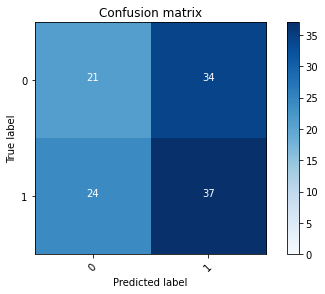

2022-08-22 17:31:10 - [Epoch Train: 83] loss: 0.0829, auc: 0.9991, acc: 0.9854, time: 30.00 s            
2022-08-22 17:31:10 - [Epoch Valid: 83] loss: 1.5091, auc: 0.5148, acc: 0.5079, time: 7.00 s


 83%|██████████████████████████████████▊       | 83/100 [43:30<09:37, 33.97s/it]

2022-08-22 17:31:10 - EPOCH: 84
2022-08-22 17:31:11 - Train Step 10/480, train_loss: 0.1421
2022-08-22 17:31:11 - Train Step 20/480, train_loss: 0.1427
2022-08-22 17:31:12 - Train Step 30/480, train_loss: 0.1218
2022-08-22 17:31:12 - Train Step 40/480, train_loss: 0.1002
2022-08-22 17:31:13 - Train Step 50/480, train_loss: 0.1128
2022-08-22 17:31:13 - Train Step 60/480, train_loss: 0.0999
2022-08-22 17:31:14 - Train Step 70/480, train_loss: 0.0925
2022-08-22 17:31:14 - Train Step 80/480, train_loss: 0.0956
2022-08-22 17:31:15 - Train Step 90/480, train_loss: 0.0967
2022-08-22 17:31:15 - Train Step 100/480, train_loss: 0.0908
2022-08-22 17:31:16 - Train Step 110/480, train_loss: 0.0891
2022-08-22 17:31:16 - Train Step 120/480, train_loss: 0.0836
2022-08-22 17:31:17 - Train Step 130/480, train_loss: 0.0836
2022-08-22 17:31:17 - Train Step 140/480, train_loss: 0.0839
2022-08-22 17:31:18 - Train Step 150/480, train_loss: 0.0829
2022-08-22 17:31:18 - Train Step 160/480, train_loss: 0.0827
2

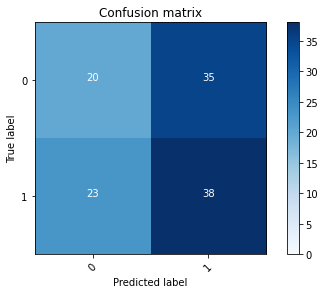

2022-08-22 17:31:41 - [Epoch Train: 84] loss: 0.0766, auc: 0.9994, acc: 0.9854, time: 24.00 s            
2022-08-22 17:31:41 - [Epoch Valid: 84] loss: 1.5453, auc: 0.5133, acc: 0.5079, time: 6.00 s


 84%|███████████████████████████████████▎      | 84/100 [44:01<08:49, 33.09s/it]

2022-08-22 17:31:41 - EPOCH: 85
2022-08-22 17:31:42 - Train Step 10/480, train_loss: 0.0362
2022-08-22 17:31:42 - Train Step 20/480, train_loss: 0.0307
2022-08-22 17:31:43 - Train Step 30/480, train_loss: 0.0512
2022-08-22 17:31:43 - Train Step 40/480, train_loss: 0.0446
2022-08-22 17:31:44 - Train Step 50/480, train_loss: 0.0499
2022-08-22 17:31:44 - Train Step 60/480, train_loss: 0.0447
2022-08-22 17:31:45 - Train Step 70/480, train_loss: 0.0569
2022-08-22 17:31:45 - Train Step 80/480, train_loss: 0.0536
2022-08-22 17:31:46 - Train Step 90/480, train_loss: 0.0658
2022-08-22 17:31:46 - Train Step 100/480, train_loss: 0.0626
2022-08-22 17:31:47 - Train Step 110/480, train_loss: 0.0611
2022-08-22 17:31:47 - Train Step 120/480, train_loss: 0.0591
2022-08-22 17:31:48 - Train Step 130/480, train_loss: 0.0646
2022-08-22 17:31:48 - Train Step 140/480, train_loss: 0.0640
2022-08-22 17:31:49 - Train Step 150/480, train_loss: 0.0641
2022-08-22 17:31:49 - Train Step 160/480, train_loss: 0.0640
2

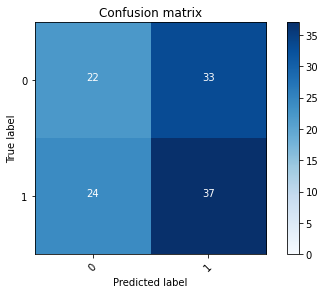

2022-08-22 17:32:12 - [Epoch Train: 85] loss: 0.0588, auc: 0.9998, acc: 0.9917, time: 24.00 s            
2022-08-22 17:32:12 - [Epoch Valid: 85] loss: 1.5966, auc: 0.5115, acc: 0.5159, time: 6.00 s


 85%|███████████████████████████████████▋      | 85/100 [44:32<08:08, 32.55s/it]

2022-08-22 17:32:12 - EPOCH: 86
2022-08-22 17:32:13 - Train Step 10/480, train_loss: 0.0303
2022-08-22 17:32:14 - Train Step 20/480, train_loss: 0.0649
2022-08-22 17:32:14 - Train Step 30/480, train_loss: 0.0536
2022-08-22 17:32:15 - Train Step 40/480, train_loss: 0.0604
2022-08-22 17:32:15 - Train Step 50/480, train_loss: 0.0537
2022-08-22 17:32:16 - Train Step 60/480, train_loss: 0.0602
2022-08-22 17:32:16 - Train Step 70/480, train_loss: 0.0700
2022-08-22 17:32:17 - Train Step 80/480, train_loss: 0.0690
2022-08-22 17:32:17 - Train Step 90/480, train_loss: 0.0656
2022-08-22 17:32:18 - Train Step 100/480, train_loss: 0.0661
2022-08-22 17:32:18 - Train Step 110/480, train_loss: 0.0683
2022-08-22 17:32:19 - Train Step 120/480, train_loss: 0.0680
2022-08-22 17:32:19 - Train Step 130/480, train_loss: 0.0651
2022-08-22 17:32:20 - Train Step 140/480, train_loss: 0.0620
2022-08-22 17:32:20 - Train Step 150/480, train_loss: 0.0586
2022-08-22 17:32:21 - Train Step 160/480, train_loss: 0.0569
2

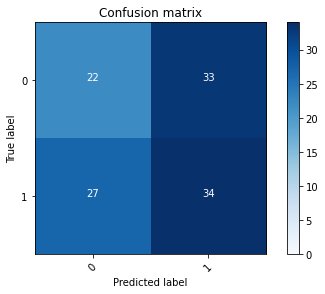

2022-08-22 17:32:44 - [Epoch Train: 86] loss: 0.0726, auc: 0.9986, acc: 0.9771, time: 24.00 s            
2022-08-22 17:32:44 - [Epoch Valid: 86] loss: 1.5033, auc: 0.5174, acc: 0.4921, time: 6.00 s


 86%|████████████████████████████████████      | 86/100 [45:04<07:31, 32.22s/it]

2022-08-22 17:32:44 - EPOCH: 87
2022-08-22 17:32:45 - Train Step 10/480, train_loss: 0.0454
2022-08-22 17:32:45 - Train Step 20/480, train_loss: 0.0417
2022-08-22 17:32:46 - Train Step 30/480, train_loss: 0.0530
2022-08-22 17:32:46 - Train Step 40/480, train_loss: 0.0493
2022-08-22 17:32:47 - Train Step 50/480, train_loss: 0.0515
2022-08-22 17:32:47 - Train Step 60/480, train_loss: 0.0476
2022-08-22 17:32:48 - Train Step 70/480, train_loss: 0.0587
2022-08-22 17:32:48 - Train Step 80/480, train_loss: 0.0589
2022-08-22 17:32:49 - Train Step 90/480, train_loss: 0.0636
2022-08-22 17:32:49 - Train Step 100/480, train_loss: 0.0627
2022-08-22 17:32:50 - Train Step 110/480, train_loss: 0.0599
2022-08-22 17:32:50 - Train Step 120/480, train_loss: 0.0671
2022-08-22 17:32:51 - Train Step 130/480, train_loss: 0.0641
2022-08-22 17:32:51 - Train Step 140/480, train_loss: 0.0664
2022-08-22 17:32:52 - Train Step 150/480, train_loss: 0.0627
2022-08-22 17:32:52 - Train Step 160/480, train_loss: 0.0643
2

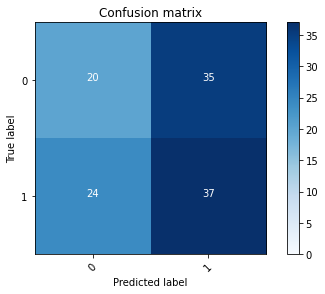

2022-08-22 17:33:15 - [Epoch Train: 87] loss: 0.0589, auc: 0.9998, acc: 0.9896, time: 24.00 s            
2022-08-22 17:33:15 - [Epoch Valid: 87] loss: 1.7071, auc: 0.5130, acc: 0.5000, time: 6.00 s


 87%|████████████████████████████████████▌     | 87/100 [45:35<06:54, 31.88s/it]

2022-08-22 17:33:15 - EPOCH: 88
2022-08-22 17:33:16 - Train Step 10/480, train_loss: 0.0211
2022-08-22 17:33:16 - Train Step 20/480, train_loss: 0.0689
2022-08-22 17:33:17 - Train Step 30/480, train_loss: 0.0519
2022-08-22 17:33:17 - Train Step 40/480, train_loss: 0.0475
2022-08-22 17:33:18 - Train Step 50/480, train_loss: 0.0406
2022-08-22 17:33:18 - Train Step 60/480, train_loss: 0.0386
2022-08-22 17:33:19 - Train Step 70/480, train_loss: 0.0385
2022-08-22 17:33:19 - Train Step 80/480, train_loss: 0.0378
2022-08-22 17:33:20 - Train Step 90/480, train_loss: 0.0354
2022-08-22 17:33:20 - Train Step 100/480, train_loss: 0.0348
2022-08-22 17:33:21 - Train Step 110/480, train_loss: 0.0330
2022-08-22 17:33:21 - Train Step 120/480, train_loss: 0.0334
2022-08-22 17:33:22 - Train Step 130/480, train_loss: 0.0334
2022-08-22 17:33:22 - Train Step 140/480, train_loss: 0.0326
2022-08-22 17:33:23 - Train Step 150/480, train_loss: 0.0379
2022-08-22 17:33:23 - Train Step 160/480, train_loss: 0.0405
2

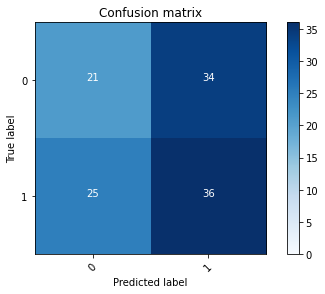

2022-08-22 17:33:46 - [Epoch Train: 88] loss: 0.0565, auc: 0.9996, acc: 0.9896, time: 24.00 s            
2022-08-22 17:33:46 - [Epoch Valid: 88] loss: 1.6458, auc: 0.5025, acc: 0.5000, time: 6.00 s


 88%|████████████████████████████████████▉     | 88/100 [46:06<06:21, 31.75s/it]

2022-08-22 17:33:46 - EPOCH: 89
2022-08-22 17:33:47 - Train Step 10/480, train_loss: 0.1148
2022-08-22 17:33:48 - Train Step 20/480, train_loss: 0.0854
2022-08-22 17:33:48 - Train Step 30/480, train_loss: 0.0696
2022-08-22 17:33:49 - Train Step 40/480, train_loss: 0.0676
2022-08-22 17:33:49 - Train Step 50/480, train_loss: 0.0678
2022-08-22 17:33:50 - Train Step 60/480, train_loss: 0.0640
2022-08-22 17:33:50 - Train Step 70/480, train_loss: 0.0613
2022-08-22 17:33:51 - Train Step 80/480, train_loss: 0.0567
2022-08-22 17:33:51 - Train Step 90/480, train_loss: 0.0533
2022-08-22 17:33:52 - Train Step 100/480, train_loss: 0.0494
2022-08-22 17:33:52 - Train Step 110/480, train_loss: 0.0466
2022-08-22 17:33:53 - Train Step 120/480, train_loss: 0.0487
2022-08-22 17:33:53 - Train Step 130/480, train_loss: 0.0484
2022-08-22 17:33:54 - Train Step 140/480, train_loss: 0.0463
2022-08-22 17:33:54 - Train Step 150/480, train_loss: 0.0452
2022-08-22 17:33:55 - Train Step 160/480, train_loss: 0.0425
2

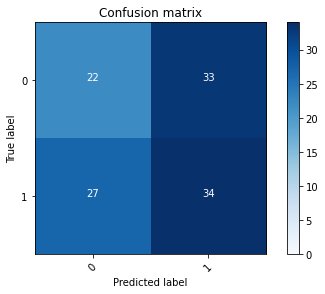

2022-08-22 17:34:18 - [Epoch Train: 89] loss: 0.0526, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 17:34:18 - [Epoch Valid: 89] loss: 1.7892, auc: 0.5079, acc: 0.4921, time: 6.00 s


 89%|█████████████████████████████████████▍    | 89/100 [46:38<05:48, 31.68s/it]

2022-08-22 17:34:18 - EPOCH: 90
2022-08-22 17:34:19 - Train Step 10/480, train_loss: 0.0327
2022-08-22 17:34:19 - Train Step 20/480, train_loss: 0.0263
2022-08-22 17:34:20 - Train Step 30/480, train_loss: 0.0354
2022-08-22 17:34:20 - Train Step 40/480, train_loss: 0.0298
2022-08-22 17:34:21 - Train Step 50/480, train_loss: 0.0324
2022-08-22 17:34:21 - Train Step 60/480, train_loss: 0.0308
2022-08-22 17:34:22 - Train Step 70/480, train_loss: 0.0336
2022-08-22 17:34:22 - Train Step 80/480, train_loss: 0.0351
2022-08-22 17:34:23 - Train Step 90/480, train_loss: 0.0343
2022-08-22 17:34:23 - Train Step 100/480, train_loss: 0.0386
2022-08-22 17:34:24 - Train Step 110/480, train_loss: 0.0430
2022-08-22 17:34:24 - Train Step 120/480, train_loss: 0.0419
2022-08-22 17:34:25 - Train Step 130/480, train_loss: 0.0422
2022-08-22 17:34:25 - Train Step 140/480, train_loss: 0.0425
2022-08-22 17:34:26 - Train Step 150/480, train_loss: 0.0400
2022-08-22 17:34:26 - Train Step 160/480, train_loss: 0.0450
2

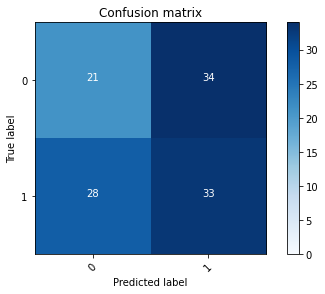

2022-08-22 17:34:49 - [Epoch Train: 90] loss: 0.0432, auc: 1.0000, acc: 0.9979, time: 24.00 s            
2022-08-22 17:34:49 - [Epoch Valid: 90] loss: 1.6372, auc: 0.5130, acc: 0.4762, time: 6.00 s


 90%|█████████████████████████████████████▊    | 90/100 [47:09<05:15, 31.56s/it]

2022-08-22 17:34:49 - EPOCH: 91
2022-08-22 17:34:50 - Train Step 10/480, train_loss: 0.0439
2022-08-22 17:34:50 - Train Step 20/480, train_loss: 0.0271
2022-08-22 17:34:51 - Train Step 30/480, train_loss: 0.0340
2022-08-22 17:34:51 - Train Step 40/480, train_loss: 0.0383
2022-08-22 17:34:52 - Train Step 50/480, train_loss: 0.0386
2022-08-22 17:34:52 - Train Step 60/480, train_loss: 0.0345
2022-08-22 17:34:53 - Train Step 70/480, train_loss: 0.0341
2022-08-22 17:34:53 - Train Step 80/480, train_loss: 0.0383
2022-08-22 17:34:54 - Train Step 90/480, train_loss: 0.0351
2022-08-22 17:34:54 - Train Step 100/480, train_loss: 0.0396
2022-08-22 17:34:55 - Train Step 110/480, train_loss: 0.0386
2022-08-22 17:34:55 - Train Step 120/480, train_loss: 0.0386
2022-08-22 17:34:56 - Train Step 130/480, train_loss: 0.0379
2022-08-22 17:34:56 - Train Step 140/480, train_loss: 0.0378
2022-08-22 17:34:57 - Train Step 150/480, train_loss: 0.0367
2022-08-22 17:34:57 - Train Step 160/480, train_loss: 0.0367
2

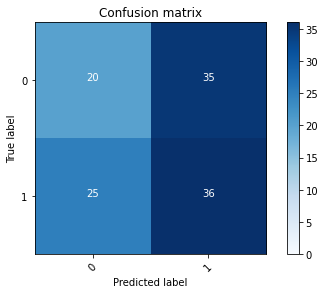

2022-08-22 17:35:21 - [Epoch Train: 91] loss: 0.0481, auc: 0.9999, acc: 0.9875, time: 24.00 s            
2022-08-22 17:35:21 - [Epoch Valid: 91] loss: 1.7633, auc: 0.5136, acc: 0.4921, time: 6.00 s


 91%|██████████████████████████████████████▏   | 91/100 [47:41<04:43, 31.53s/it]

2022-08-22 17:35:21 - EPOCH: 92
2022-08-22 17:35:21 - Train Step 10/480, train_loss: 0.0285
2022-08-22 17:35:22 - Train Step 20/480, train_loss: 0.0206
2022-08-22 17:35:22 - Train Step 30/480, train_loss: 0.0183
2022-08-22 17:35:23 - Train Step 40/480, train_loss: 0.0453
2022-08-22 17:35:23 - Train Step 50/480, train_loss: 0.0450
2022-08-22 17:35:24 - Train Step 60/480, train_loss: 0.0448
2022-08-22 17:35:24 - Train Step 70/480, train_loss: 0.0418
2022-08-22 17:35:25 - Train Step 80/480, train_loss: 0.0406
2022-08-22 17:35:25 - Train Step 90/480, train_loss: 0.0388
2022-08-22 17:35:26 - Train Step 100/480, train_loss: 0.0394
2022-08-22 17:35:26 - Train Step 110/480, train_loss: 0.0403
2022-08-22 17:35:27 - Train Step 120/480, train_loss: 0.0428
2022-08-22 17:35:27 - Train Step 130/480, train_loss: 0.0464
2022-08-22 17:35:28 - Train Step 140/480, train_loss: 0.0437
2022-08-22 17:35:28 - Train Step 150/480, train_loss: 0.0415
2022-08-22 17:35:29 - Train Step 160/480, train_loss: 0.0488
2

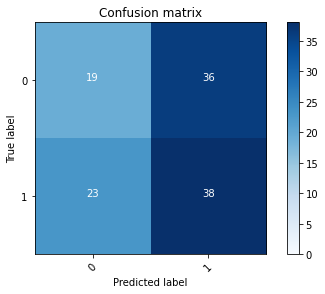

2022-08-22 17:35:52 - [Epoch Train: 92] loss: 0.0417, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 17:35:52 - [Epoch Valid: 92] loss: 1.7920, auc: 0.5115, acc: 0.5000, time: 6.00 s


 92%|██████████████████████████████████████▋   | 92/100 [48:12<04:11, 31.48s/it]

2022-08-22 17:35:52 - EPOCH: 93
2022-08-22 17:35:53 - Train Step 10/480, train_loss: 0.1361
2022-08-22 17:35:53 - Train Step 20/480, train_loss: 0.0995
2022-08-22 17:35:54 - Train Step 30/480, train_loss: 0.0980
2022-08-22 17:35:54 - Train Step 40/480, train_loss: 0.0824
2022-08-22 17:35:55 - Train Step 50/480, train_loss: 0.0710
2022-08-22 17:35:55 - Train Step 60/480, train_loss: 0.0763
2022-08-22 17:35:56 - Train Step 70/480, train_loss: 0.0703
2022-08-22 17:35:56 - Train Step 80/480, train_loss: 0.0682
2022-08-22 17:35:57 - Train Step 90/480, train_loss: 0.0626
2022-08-22 17:35:57 - Train Step 100/480, train_loss: 0.0570
2022-08-22 17:35:58 - Train Step 110/480, train_loss: 0.0551
2022-08-22 17:35:58 - Train Step 120/480, train_loss: 0.0552
2022-08-22 17:35:59 - Train Step 130/480, train_loss: 0.0535
2022-08-22 17:36:00 - Train Step 140/480, train_loss: 0.0526
2022-08-22 17:36:00 - Train Step 150/480, train_loss: 0.0575
2022-08-22 17:36:01 - Train Step 160/480, train_loss: 0.0548
2

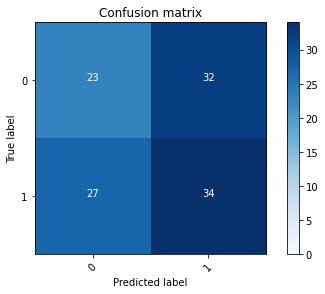

2022-08-22 17:36:24 - [Epoch Train: 93] loss: 0.0428, auc: 1.0000, acc: 0.9938, time: 24.00 s            
2022-08-22 17:36:24 - [Epoch Valid: 93] loss: 1.9753, auc: 0.5091, acc: 0.5000, time: 6.00 s


 93%|███████████████████████████████████████   | 93/100 [48:44<03:40, 31.54s/it]

2022-08-22 17:36:24 - EPOCH: 94
2022-08-22 17:36:24 - Train Step 10/480, train_loss: 0.0245
2022-08-22 17:36:25 - Train Step 20/480, train_loss: 0.0523
2022-08-22 17:36:25 - Train Step 30/480, train_loss: 0.0627
2022-08-22 17:36:26 - Train Step 40/480, train_loss: 0.0596
2022-08-22 17:36:26 - Train Step 50/480, train_loss: 0.0612
2022-08-22 17:36:27 - Train Step 60/480, train_loss: 0.0568
2022-08-22 17:36:27 - Train Step 70/480, train_loss: 0.0532
2022-08-22 17:36:28 - Train Step 80/480, train_loss: 0.0491
2022-08-22 17:36:28 - Train Step 90/480, train_loss: 0.0444
2022-08-22 17:36:29 - Train Step 100/480, train_loss: 0.0408
2022-08-22 17:36:29 - Train Step 110/480, train_loss: 0.0395
2022-08-22 17:36:30 - Train Step 120/480, train_loss: 0.0376
2022-08-22 17:36:31 - Train Step 130/480, train_loss: 0.0371
2022-08-22 17:36:31 - Train Step 140/480, train_loss: 0.0360
2022-08-22 17:36:32 - Train Step 150/480, train_loss: 0.0354
2022-08-22 17:36:32 - Train Step 160/480, train_loss: 0.0337
2

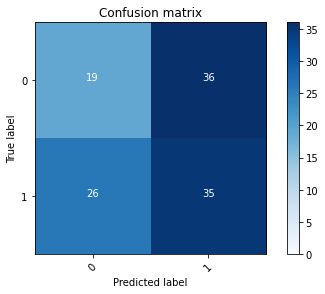

2022-08-22 17:36:55 - [Epoch Train: 94] loss: 0.0451, auc: 0.9997, acc: 0.9896, time: 24.00 s            
2022-08-22 17:36:55 - [Epoch Valid: 94] loss: 1.8146, auc: 0.5130, acc: 0.4762, time: 6.00 s


 94%|███████████████████████████████████████▍  | 94/100 [49:15<03:08, 31.45s/it]

2022-08-22 17:36:55 - EPOCH: 95
2022-08-22 17:36:56 - Train Step 10/480, train_loss: 0.0418
2022-08-22 17:36:56 - Train Step 20/480, train_loss: 0.0317
2022-08-22 17:36:57 - Train Step 30/480, train_loss: 0.0273
2022-08-22 17:36:57 - Train Step 40/480, train_loss: 0.0239
2022-08-22 17:36:58 - Train Step 50/480, train_loss: 0.0230
2022-08-22 17:36:58 - Train Step 60/480, train_loss: 0.0306
2022-08-22 17:36:59 - Train Step 70/480, train_loss: 0.0284
2022-08-22 17:36:59 - Train Step 80/480, train_loss: 0.0265
2022-08-22 17:37:00 - Train Step 90/480, train_loss: 0.0286
2022-08-22 17:37:00 - Train Step 100/480, train_loss: 0.0329
2022-08-22 17:37:01 - Train Step 110/480, train_loss: 0.0331
2022-08-22 17:37:01 - Train Step 120/480, train_loss: 0.0337
2022-08-22 17:37:02 - Train Step 130/480, train_loss: 0.0335
2022-08-22 17:37:02 - Train Step 140/480, train_loss: 0.0384
2022-08-22 17:37:03 - Train Step 150/480, train_loss: 0.0385
2022-08-22 17:37:03 - Train Step 160/480, train_loss: 0.0371
2

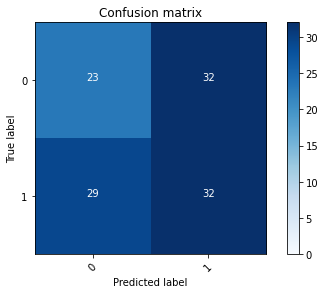

2022-08-22 17:37:26 - [Epoch Train: 95] loss: 0.0394, auc: 0.9999, acc: 0.9958, time: 24.00 s            
2022-08-22 17:37:26 - [Epoch Valid: 95] loss: 1.8074, auc: 0.5118, acc: 0.4841, time: 6.00 s


 95%|███████████████████████████████████████▉  | 95/100 [49:46<02:36, 31.40s/it]

2022-08-22 17:37:26 - EPOCH: 96
2022-08-22 17:37:27 - Train Step 10/480, train_loss: 0.1262
2022-08-22 17:37:27 - Train Step 20/480, train_loss: 0.0717
2022-08-22 17:37:28 - Train Step 30/480, train_loss: 0.0510
2022-08-22 17:37:28 - Train Step 40/480, train_loss: 0.0417
2022-08-22 17:37:29 - Train Step 50/480, train_loss: 0.0584
2022-08-22 17:37:29 - Train Step 60/480, train_loss: 0.0650
2022-08-22 17:37:30 - Train Step 70/480, train_loss: 0.0581
2022-08-22 17:37:30 - Train Step 80/480, train_loss: 0.0530
2022-08-22 17:37:31 - Train Step 90/480, train_loss: 0.0485
2022-08-22 17:37:32 - Train Step 100/480, train_loss: 0.0486
2022-08-22 17:37:32 - Train Step 110/480, train_loss: 0.0456
2022-08-22 17:37:33 - Train Step 120/480, train_loss: 0.0451
2022-08-22 17:37:33 - Train Step 130/480, train_loss: 0.0440
2022-08-22 17:37:34 - Train Step 140/480, train_loss: 0.0497
2022-08-22 17:37:34 - Train Step 150/480, train_loss: 0.0493
2022-08-22 17:37:35 - Train Step 160/480, train_loss: 0.0486
2

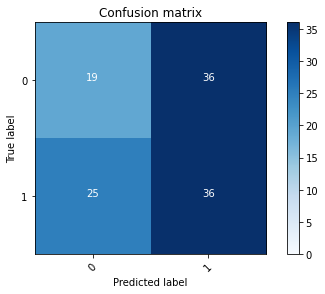

2022-08-22 17:37:58 - [Epoch Train: 96] loss: 0.0428, auc: 0.9996, acc: 0.9854, time: 24.00 s            
2022-08-22 17:37:58 - [Epoch Valid: 96] loss: 1.8728, auc: 0.5156, acc: 0.4841, time: 6.00 s


 96%|████████████████████████████████████████▎ | 96/100 [50:18<02:05, 31.44s/it]

2022-08-22 17:37:58 - EPOCH: 97
2022-08-22 17:37:58 - Train Step 10/480, train_loss: 0.0323
2022-08-22 17:37:59 - Train Step 20/480, train_loss: 0.0308
2022-08-22 17:37:59 - Train Step 30/480, train_loss: 0.0217
2022-08-22 17:38:00 - Train Step 40/480, train_loss: 0.0614
2022-08-22 17:38:01 - Train Step 50/480, train_loss: 0.0702
2022-08-22 17:38:01 - Train Step 60/480, train_loss: 0.0682
2022-08-22 17:38:02 - Train Step 70/480, train_loss: 0.0654
2022-08-22 17:38:02 - Train Step 80/480, train_loss: 0.0588
2022-08-22 17:38:03 - Train Step 90/480, train_loss: 0.0538
2022-08-22 17:38:03 - Train Step 100/480, train_loss: 0.0494
2022-08-22 17:38:04 - Train Step 110/480, train_loss: 0.0481
2022-08-22 17:38:04 - Train Step 120/480, train_loss: 0.0483
2022-08-22 17:38:04 - Train Step 130/480, train_loss: 0.0488
2022-08-22 17:38:05 - Train Step 140/480, train_loss: 0.0458
2022-08-22 17:38:05 - Train Step 150/480, train_loss: 0.0505
2022-08-22 17:38:06 - Train Step 160/480, train_loss: 0.0493
2

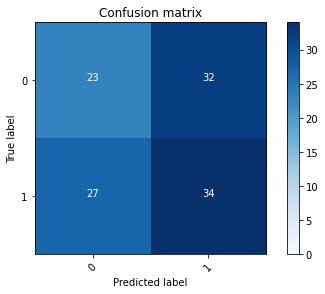

2022-08-22 17:38:29 - [Epoch Train: 97] loss: 0.0342, auc: 0.9998, acc: 0.9917, time: 24.00 s            
2022-08-22 17:38:29 - [Epoch Valid: 97] loss: 2.0448, auc: 0.5112, acc: 0.5000, time: 6.00 s


 97%|████████████████████████████████████████▋ | 97/100 [50:49<01:34, 31.39s/it]

2022-08-22 17:38:29 - EPOCH: 98
2022-08-22 17:38:30 - Train Step 10/480, train_loss: 0.0359
2022-08-22 17:38:30 - Train Step 20/480, train_loss: 0.0457
2022-08-22 17:38:31 - Train Step 30/480, train_loss: 0.0380
2022-08-22 17:38:31 - Train Step 40/480, train_loss: 0.0471
2022-08-22 17:38:32 - Train Step 50/480, train_loss: 0.0399
2022-08-22 17:38:32 - Train Step 60/480, train_loss: 0.0559
2022-08-22 17:38:33 - Train Step 70/480, train_loss: 0.0510
2022-08-22 17:38:33 - Train Step 80/480, train_loss: 0.0455
2022-08-22 17:38:34 - Train Step 90/480, train_loss: 0.0439
2022-08-22 17:38:34 - Train Step 100/480, train_loss: 0.0459
2022-08-22 17:38:35 - Train Step 110/480, train_loss: 0.0443
2022-08-22 17:38:35 - Train Step 120/480, train_loss: 0.0429
2022-08-22 17:38:36 - Train Step 130/480, train_loss: 0.0433
2022-08-22 17:38:36 - Train Step 140/480, train_loss: 0.0449
2022-08-22 17:38:37 - Train Step 150/480, train_loss: 0.0448
2022-08-22 17:38:37 - Train Step 160/480, train_loss: 0.0422
2

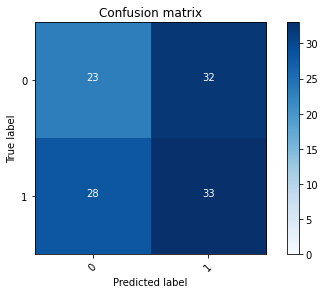

2022-08-22 17:39:00 - [Epoch Train: 98] loss: 0.0445, auc: 0.9999, acc: 0.9875, time: 24.00 s            
2022-08-22 17:39:00 - [Epoch Valid: 98] loss: 2.0725, auc: 0.5058, acc: 0.4921, time: 6.00 s


 98%|█████████████████████████████████████████▏| 98/100 [51:20<01:02, 31.35s/it]

2022-08-22 17:39:00 - EPOCH: 99
2022-08-22 17:39:01 - Train Step 10/480, train_loss: 0.0446
2022-08-22 17:39:01 - Train Step 20/480, train_loss: 0.0283
2022-08-22 17:39:02 - Train Step 30/480, train_loss: 0.0220
2022-08-22 17:39:02 - Train Step 40/480, train_loss: 0.0416
2022-08-22 17:39:03 - Train Step 50/480, train_loss: 0.0385
2022-08-22 17:39:03 - Train Step 60/480, train_loss: 0.0381
2022-08-22 17:39:04 - Train Step 70/480, train_loss: 0.0348
2022-08-22 17:39:05 - Train Step 80/480, train_loss: 0.0367
2022-08-22 17:39:05 - Train Step 90/480, train_loss: 0.0340
2022-08-22 17:39:05 - Train Step 100/480, train_loss: 0.0337
2022-08-22 17:39:06 - Train Step 110/480, train_loss: 0.0340
2022-08-22 17:39:06 - Train Step 120/480, train_loss: 0.0314
2022-08-22 17:39:07 - Train Step 130/480, train_loss: 0.0305
2022-08-22 17:39:08 - Train Step 140/480, train_loss: 0.0314
2022-08-22 17:39:08 - Train Step 150/480, train_loss: 0.0322
2022-08-22 17:39:09 - Train Step 160/480, train_loss: 0.0327
2

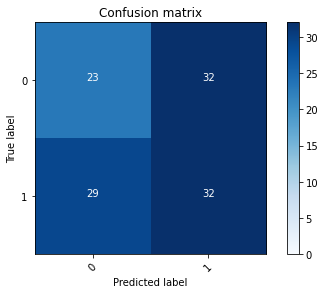

2022-08-22 17:39:32 - [Epoch Train: 99] loss: 0.0337, auc: 0.9998, acc: 0.9896, time: 24.00 s            
2022-08-22 17:39:32 - [Epoch Valid: 99] loss: 2.0480, auc: 0.5195, acc: 0.4841, time: 6.00 s


 99%|█████████████████████████████████████████▌| 99/100 [51:52<00:31, 31.37s/it]

2022-08-22 17:39:32 - EPOCH: 100
2022-08-22 17:39:32 - Train Step 10/480, train_loss: 0.0164
2022-08-22 17:39:33 - Train Step 20/480, train_loss: 0.0207
2022-08-22 17:39:33 - Train Step 30/480, train_loss: 0.0371
2022-08-22 17:39:34 - Train Step 40/480, train_loss: 0.0425
2022-08-22 17:39:34 - Train Step 50/480, train_loss: 0.0369
2022-08-22 17:39:35 - Train Step 60/480, train_loss: 0.0329
2022-08-22 17:39:35 - Train Step 70/480, train_loss: 0.0341
2022-08-22 17:39:36 - Train Step 80/480, train_loss: 0.0303
2022-08-22 17:39:36 - Train Step 90/480, train_loss: 0.0321
2022-08-22 17:39:37 - Train Step 100/480, train_loss: 0.0304
2022-08-22 17:39:37 - Train Step 110/480, train_loss: 0.0324
2022-08-22 17:39:38 - Train Step 120/480, train_loss: 0.0304
2022-08-22 17:39:38 - Train Step 130/480, train_loss: 0.0288
2022-08-22 17:39:39 - Train Step 140/480, train_loss: 0.0272
2022-08-22 17:39:39 - Train Step 150/480, train_loss: 0.0259
2022-08-22 17:39:40 - Train Step 160/480, train_loss: 0.0247


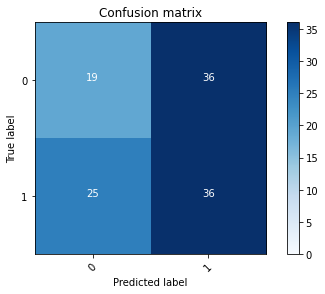

2022-08-22 17:40:03 - [Epoch Train: 100] loss: 0.0262, auc: 1.0000, acc: 0.9979, time: 24.00 s            
2022-08-22 17:40:03 - [Epoch Valid: 100] loss: 2.0487, auc: 0.5139, acc: 0.4841, time: 6.00 s


100%|█████████████████████████████████████████| 100/100 [52:23<00:00, 31.43s/it]

-- FOLD N:4
Train origin: m
Type: KLF
2022-08-22 17:40:03 - (M0) Train/Val datasets size: 270
2022-08-22 17:40:03 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabf770c8b0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabf770c5e0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606


[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 254, 255, 256, 257, 258, 261, 263, 266, 267, 268, 269, 271, 272, 274, 275, 

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-22 17:42:00 - EPOCH: 1
2022-08-22 17:42:01 - Train Step 10/481, train_loss: 0.7018
2022-08-22 17:42:01 - Train Step 20/481, train_loss: 0.7128
2022-08-22 17:42:02 - Train Step 30/481, train_loss: 0.7158
2022-08-22 17:42:02 - Train Step 40/481, train_loss: 0.7125
2022-08-22 17:42:03 - Train Step 50/481, train_loss: 0.7007
2022-08-22 17:42:03 - Train Step 60/481, train_loss: 0.6966
2022-08-22 17:42:04 - Train Step 70/481, train_loss: 0.7106
2022-08-22 17:42:04 - Train Step 80/481, train_loss: 0.7097
2022-08-22 17:42:05 - Train Step 90/481, train_loss: 0.7035
2022-08-22 17:42:05 - Train Step 100/481, train_loss: 0.7033
2022-08-22 17:42:06 - Train Step 110/481, train_loss: 0.7052
2022-08-22 17:42:06 - Train Step 120/481, train_loss: 0.7084
2022-08-22 17:42:07 - Train Step 130/481, train_loss: 0.7057
2022-08-22 17:42:07 - Train Step 140/481, train_loss: 0.7038
2022-08-22 17:42:08 - Train Step 150/481, train_loss: 0.7020
2022-08-22 17:42:08 - Train Step 160/481, train_loss: 0.7005
20

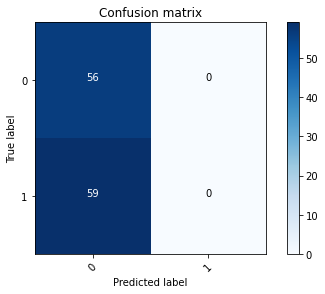

2022-08-22 17:42:31 - [Epoch Train: 1] loss: 0.7006, auc: 0.4690, acc: 0.4927, time: 24.00 s            
2022-08-22 17:42:31 - [Epoch Valid: 1] loss: 0.6931, auc: 0.4958, acc: 0.5280, time: 6.00 s
2022-08-22 17:42:31 - acc improved from 0.0000 to 0.5280. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_17-42-00/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.693-acc0.528-auc0.496.pth'


  1%|▍                                          | 1/100 [00:31<51:16, 31.08s/it]

2022-08-22 17:42:31 - EPOCH: 2
2022-08-22 17:42:32 - Train Step 10/481, train_loss: 0.6781
2022-08-22 17:42:32 - Train Step 20/481, train_loss: 0.6755
2022-08-22 17:42:33 - Train Step 30/481, train_loss: 0.6934
2022-08-22 17:42:33 - Train Step 40/481, train_loss: 0.6970
2022-08-22 17:42:34 - Train Step 50/481, train_loss: 0.6985
2022-08-22 17:42:34 - Train Step 60/481, train_loss: 0.6968
2022-08-22 17:42:35 - Train Step 70/481, train_loss: 0.6980
2022-08-22 17:42:35 - Train Step 80/481, train_loss: 0.6961
2022-08-22 17:42:36 - Train Step 90/481, train_loss: 0.6911
2022-08-22 17:42:36 - Train Step 100/481, train_loss: 0.6921
2022-08-22 17:42:37 - Train Step 110/481, train_loss: 0.6933
2022-08-22 17:42:37 - Train Step 120/481, train_loss: 0.6915
2022-08-22 17:42:38 - Train Step 130/481, train_loss: 0.6925
2022-08-22 17:42:39 - Train Step 140/481, train_loss: 0.6936
2022-08-22 17:42:39 - Train Step 150/481, train_loss: 0.6946
2022-08-22 17:42:39 - Train Step 160/481, train_loss: 0.6944
20

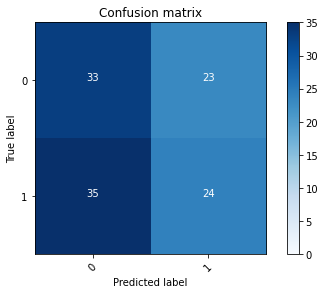

2022-08-22 17:43:03 - [Epoch Train: 2] loss: 0.6916, auc: 0.5401, acc: 0.5177, time: 24.00 s            
2022-08-22 17:43:03 - [Epoch Valid: 2] loss: 0.6981, auc: 0.4806, acc: 0.4960, time: 6.00 s


  2%|▊                                          | 2/100 [01:02<51:05, 31.28s/it]

2022-08-22 17:43:03 - EPOCH: 3
2022-08-22 17:43:03 - Train Step 10/481, train_loss: 0.7108
2022-08-22 17:43:04 - Train Step 20/481, train_loss: 0.6933
2022-08-22 17:43:04 - Train Step 30/481, train_loss: 0.7088
2022-08-22 17:43:05 - Train Step 40/481, train_loss: 0.7117
2022-08-22 17:43:05 - Train Step 50/481, train_loss: 0.7108
2022-08-22 17:43:06 - Train Step 60/481, train_loss: 0.7071
2022-08-22 17:43:06 - Train Step 70/481, train_loss: 0.7038
2022-08-22 17:43:07 - Train Step 80/481, train_loss: 0.6971
2022-08-22 17:43:07 - Train Step 90/481, train_loss: 0.6961
2022-08-22 17:43:08 - Train Step 100/481, train_loss: 0.6935
2022-08-22 17:43:08 - Train Step 110/481, train_loss: 0.6923
2022-08-22 17:43:09 - Train Step 120/481, train_loss: 0.6927
2022-08-22 17:43:09 - Train Step 130/481, train_loss: 0.6923
2022-08-22 17:43:10 - Train Step 140/481, train_loss: 0.6925
2022-08-22 17:43:10 - Train Step 150/481, train_loss: 0.6936
2022-08-22 17:43:11 - Train Step 160/481, train_loss: 0.6914
20

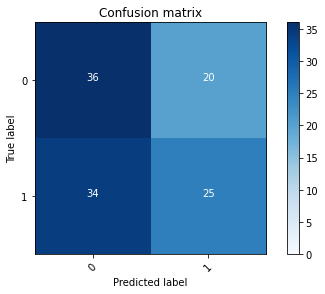

2022-08-22 17:43:34 - [Epoch Train: 3] loss: 0.6832, auc: 0.5945, acc: 0.5717, time: 24.00 s            
2022-08-22 17:43:34 - [Epoch Valid: 3] loss: 0.7019, auc: 0.4876, acc: 0.5280, time: 6.00 s
2022-08-22 17:43:34 - acc improved from 0.5280 to 0.5280. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_17-42-00/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.702-acc0.528-auc0.488.pth'


  3%|█▎                                         | 3/100 [01:34<50:56, 31.51s/it]

2022-08-22 17:43:34 - EPOCH: 4
2022-08-22 17:43:35 - Train Step 10/481, train_loss: 0.6696
2022-08-22 17:43:36 - Train Step 20/481, train_loss: 0.6619
2022-08-22 17:43:36 - Train Step 30/481, train_loss: 0.6734
2022-08-22 17:43:37 - Train Step 40/481, train_loss: 0.6837
2022-08-22 17:43:37 - Train Step 50/481, train_loss: 0.6859
2022-08-22 17:43:38 - Train Step 60/481, train_loss: 0.6838
2022-08-22 17:43:38 - Train Step 70/481, train_loss: 0.6804
2022-08-22 17:43:39 - Train Step 80/481, train_loss: 0.6765
2022-08-22 17:43:39 - Train Step 90/481, train_loss: 0.6745
2022-08-22 17:43:40 - Train Step 100/481, train_loss: 0.6679
2022-08-22 17:43:40 - Train Step 110/481, train_loss: 0.6674
2022-08-22 17:43:41 - Train Step 120/481, train_loss: 0.6677
2022-08-22 17:43:41 - Train Step 130/481, train_loss: 0.6682
2022-08-22 17:43:42 - Train Step 140/481, train_loss: 0.6693
2022-08-22 17:43:42 - Train Step 150/481, train_loss: 0.6729
2022-08-22 17:43:43 - Train Step 160/481, train_loss: 0.6701
20

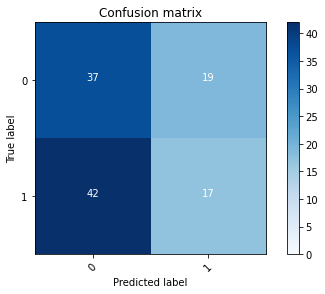

2022-08-22 17:44:06 - [Epoch Train: 4] loss: 0.6824, auc: 0.5809, acc: 0.5842, time: 24.00 s            
2022-08-22 17:44:06 - [Epoch Valid: 4] loss: 0.7028, auc: 0.4900, acc: 0.4720, time: 6.00 s


  4%|█▋                                         | 4/100 [02:05<50:22, 31.48s/it]

2022-08-22 17:44:06 - EPOCH: 5
2022-08-22 17:44:06 - Train Step 10/481, train_loss: 0.7052
2022-08-22 17:44:07 - Train Step 20/481, train_loss: 0.6941
2022-08-22 17:44:08 - Train Step 30/481, train_loss: 0.6819
2022-08-22 17:44:08 - Train Step 40/481, train_loss: 0.6698
2022-08-22 17:44:09 - Train Step 50/481, train_loss: 0.6679
2022-08-22 17:44:09 - Train Step 60/481, train_loss: 0.6739
2022-08-22 17:44:10 - Train Step 70/481, train_loss: 0.6842
2022-08-22 17:44:10 - Train Step 80/481, train_loss: 0.6845
2022-08-22 17:44:10 - Train Step 90/481, train_loss: 0.6805
2022-08-22 17:44:11 - Train Step 100/481, train_loss: 0.6807
2022-08-22 17:44:11 - Train Step 110/481, train_loss: 0.6814
2022-08-22 17:44:12 - Train Step 120/481, train_loss: 0.6781
2022-08-22 17:44:12 - Train Step 130/481, train_loss: 0.6794
2022-08-22 17:44:13 - Train Step 140/481, train_loss: 0.6777
2022-08-22 17:44:14 - Train Step 150/481, train_loss: 0.6733
2022-08-22 17:44:14 - Train Step 160/481, train_loss: 0.6725
20

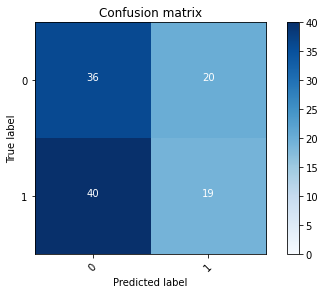

2022-08-22 17:44:37 - [Epoch Train: 5] loss: 0.6782, auc: 0.6153, acc: 0.5696, time: 24.00 s            
2022-08-22 17:44:37 - [Epoch Valid: 5] loss: 0.7092, auc: 0.4846, acc: 0.4800, time: 6.00 s


  5%|██▏                                        | 5/100 [02:37<49:55, 31.53s/it]

2022-08-22 17:44:37 - EPOCH: 6
2022-08-22 17:44:38 - Train Step 10/481, train_loss: 0.6653
2022-08-22 17:44:39 - Train Step 20/481, train_loss: 0.6906
2022-08-22 17:44:39 - Train Step 30/481, train_loss: 0.6941
2022-08-22 17:44:40 - Train Step 40/481, train_loss: 0.6817
2022-08-22 17:44:40 - Train Step 50/481, train_loss: 0.6807
2022-08-22 17:44:41 - Train Step 60/481, train_loss: 0.6745
2022-08-22 17:44:41 - Train Step 70/481, train_loss: 0.6753
2022-08-22 17:44:42 - Train Step 80/481, train_loss: 0.6689
2022-08-22 17:44:42 - Train Step 90/481, train_loss: 0.6731
2022-08-22 17:44:43 - Train Step 100/481, train_loss: 0.6758
2022-08-22 17:44:43 - Train Step 110/481, train_loss: 0.6786
2022-08-22 17:44:44 - Train Step 120/481, train_loss: 0.6780
2022-08-22 17:44:44 - Train Step 130/481, train_loss: 0.6765
2022-08-22 17:44:45 - Train Step 140/481, train_loss: 0.6722
2022-08-22 17:44:45 - Train Step 150/481, train_loss: 0.6715
2022-08-22 17:44:46 - Train Step 160/481, train_loss: 0.6717
20

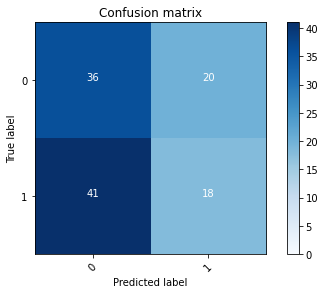

2022-08-22 17:45:09 - [Epoch Train: 6] loss: 0.6683, auc: 0.6530, acc: 0.6071, time: 24.00 s            
2022-08-22 17:45:09 - [Epoch Valid: 6] loss: 0.7177, auc: 0.4715, acc: 0.4720, time: 6.00 s


  6%|██▌                                        | 6/100 [03:08<49:26, 31.56s/it]

2022-08-22 17:45:09 - EPOCH: 7
2022-08-22 17:45:10 - Train Step 10/481, train_loss: 0.6768
2022-08-22 17:45:10 - Train Step 20/481, train_loss: 0.6816
2022-08-22 17:45:11 - Train Step 30/481, train_loss: 0.6794
2022-08-22 17:45:11 - Train Step 40/481, train_loss: 0.6800
2022-08-22 17:45:12 - Train Step 50/481, train_loss: 0.6802
2022-08-22 17:45:12 - Train Step 60/481, train_loss: 0.6808
2022-08-22 17:45:13 - Train Step 70/481, train_loss: 0.6836
2022-08-22 17:45:13 - Train Step 80/481, train_loss: 0.6764
2022-08-22 17:45:14 - Train Step 90/481, train_loss: 0.6666
2022-08-22 17:45:14 - Train Step 100/481, train_loss: 0.6571
2022-08-22 17:45:15 - Train Step 110/481, train_loss: 0.6472
2022-08-22 17:45:15 - Train Step 120/481, train_loss: 0.6479
2022-08-22 17:45:16 - Train Step 130/481, train_loss: 0.6463
2022-08-22 17:45:16 - Train Step 140/481, train_loss: 0.6508
2022-08-22 17:45:17 - Train Step 150/481, train_loss: 0.6474
2022-08-22 17:45:17 - Train Step 160/481, train_loss: 0.6450
20

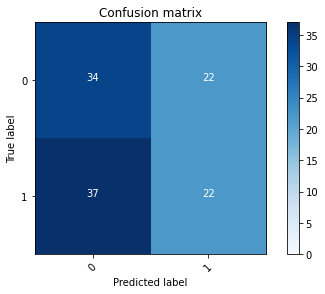

2022-08-22 17:45:40 - [Epoch Train: 7] loss: 0.6583, auc: 0.6673, acc: 0.6362, time: 24.00 s            
2022-08-22 17:45:40 - [Epoch Valid: 7] loss: 0.7289, auc: 0.4837, acc: 0.4800, time: 6.00 s


  7%|███                                        | 7/100 [03:40<48:44, 31.44s/it]

2022-08-22 17:45:40 - EPOCH: 8
2022-08-22 17:45:41 - Train Step 10/481, train_loss: 0.7086
2022-08-22 17:45:41 - Train Step 20/481, train_loss: 0.6753
2022-08-22 17:45:42 - Train Step 30/481, train_loss: 0.6575
2022-08-22 17:45:42 - Train Step 40/481, train_loss: 0.6651
2022-08-22 17:45:43 - Train Step 50/481, train_loss: 0.6577
2022-08-22 17:45:44 - Train Step 60/481, train_loss: 0.6386
2022-08-22 17:45:44 - Train Step 70/481, train_loss: 0.6525
2022-08-22 17:45:45 - Train Step 80/481, train_loss: 0.6518
2022-08-22 17:45:45 - Train Step 90/481, train_loss: 0.6486
2022-08-22 17:45:46 - Train Step 100/481, train_loss: 0.6501
2022-08-22 17:45:46 - Train Step 110/481, train_loss: 0.6536
2022-08-22 17:45:47 - Train Step 120/481, train_loss: 0.6514
2022-08-22 17:45:47 - Train Step 130/481, train_loss: 0.6517
2022-08-22 17:45:48 - Train Step 140/481, train_loss: 0.6452
2022-08-22 17:45:48 - Train Step 150/481, train_loss: 0.6585
2022-08-22 17:45:49 - Train Step 160/481, train_loss: 0.6559
20

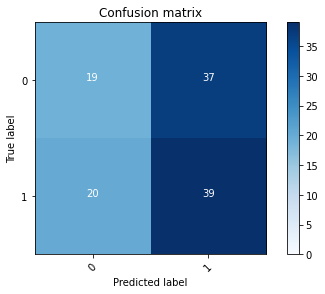

2022-08-22 17:46:12 - [Epoch Train: 8] loss: 0.6522, auc: 0.6771, acc: 0.6383, time: 24.00 s            
2022-08-22 17:46:12 - [Epoch Valid: 8] loss: 0.7511, auc: 0.4897, acc: 0.4800, time: 6.00 s


  8%|███▍                                       | 8/100 [04:11<48:19, 31.52s/it]

2022-08-22 17:46:12 - EPOCH: 9
2022-08-22 17:46:13 - Train Step 10/481, train_loss: 0.6458
2022-08-22 17:46:13 - Train Step 20/481, train_loss: 0.6721
2022-08-22 17:46:14 - Train Step 30/481, train_loss: 0.6649
2022-08-22 17:46:14 - Train Step 40/481, train_loss: 0.6918
2022-08-22 17:46:15 - Train Step 50/481, train_loss: 0.6892
2022-08-22 17:46:15 - Train Step 60/481, train_loss: 0.6865
2022-08-22 17:46:16 - Train Step 70/481, train_loss: 0.6893
2022-08-22 17:46:16 - Train Step 80/481, train_loss: 0.6849
2022-08-22 17:46:17 - Train Step 90/481, train_loss: 0.6751
2022-08-22 17:46:17 - Train Step 100/481, train_loss: 0.6672
2022-08-22 17:46:18 - Train Step 110/481, train_loss: 0.6616
2022-08-22 17:46:18 - Train Step 120/481, train_loss: 0.6494
2022-08-22 17:46:19 - Train Step 130/481, train_loss: 0.6602
2022-08-22 17:46:19 - Train Step 140/481, train_loss: 0.6568
2022-08-22 17:46:20 - Train Step 150/481, train_loss: 0.6495
2022-08-22 17:46:20 - Train Step 160/481, train_loss: 0.6491
20

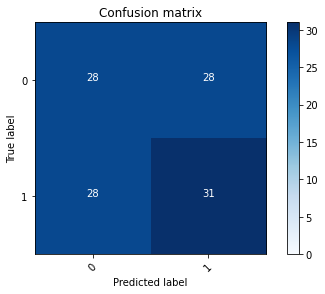

2022-08-22 17:46:43 - [Epoch Train: 9] loss: 0.6383, auc: 0.6936, acc: 0.6632, time: 24.00 s            
2022-08-22 17:46:43 - [Epoch Valid: 9] loss: 0.7682, auc: 0.4861, acc: 0.5040, time: 6.00 s


  9%|███▊                                       | 9/100 [04:43<47:43, 31.47s/it]

2022-08-22 17:46:43 - EPOCH: 10
2022-08-22 17:46:44 - Train Step 10/481, train_loss: 0.7180
2022-08-22 17:46:44 - Train Step 20/481, train_loss: 0.6359
2022-08-22 17:46:45 - Train Step 30/481, train_loss: 0.6373
2022-08-22 17:46:45 - Train Step 40/481, train_loss: 0.6093
2022-08-22 17:46:46 - Train Step 50/481, train_loss: 0.6190
2022-08-22 17:46:46 - Train Step 60/481, train_loss: 0.6334
2022-08-22 17:46:47 - Train Step 70/481, train_loss: 0.6322
2022-08-22 17:46:47 - Train Step 80/481, train_loss: 0.6229
2022-08-22 17:46:48 - Train Step 90/481, train_loss: 0.6247
2022-08-22 17:46:48 - Train Step 100/481, train_loss: 0.6213
2022-08-22 17:46:49 - Train Step 110/481, train_loss: 0.6361
2022-08-22 17:46:49 - Train Step 120/481, train_loss: 0.6284
2022-08-22 17:46:50 - Train Step 130/481, train_loss: 0.6306
2022-08-22 17:46:50 - Train Step 140/481, train_loss: 0.6336
2022-08-22 17:46:51 - Train Step 150/481, train_loss: 0.6279
2022-08-22 17:46:51 - Train Step 160/481, train_loss: 0.6257
2

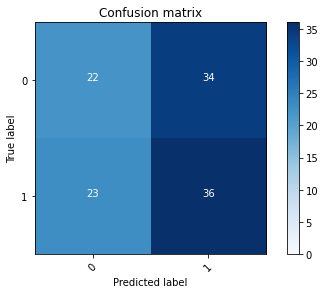

2022-08-22 17:47:14 - [Epoch Train: 10] loss: 0.6276, auc: 0.7018, acc: 0.6258, time: 24.00 s            
2022-08-22 17:47:14 - [Epoch Valid: 10] loss: 0.7600, auc: 0.4837, acc: 0.4880, time: 6.00 s


 10%|████▏                                     | 10/100 [05:14<46:57, 31.31s/it]

2022-08-22 17:47:14 - EPOCH: 11
2022-08-22 17:47:15 - Train Step 10/481, train_loss: 0.7045
2022-08-22 17:47:15 - Train Step 20/481, train_loss: 0.7227
2022-08-22 17:47:16 - Train Step 30/481, train_loss: 0.7090
2022-08-22 17:47:16 - Train Step 40/481, train_loss: 0.6946
2022-08-22 17:47:17 - Train Step 50/481, train_loss: 0.6748
2022-08-22 17:47:17 - Train Step 60/481, train_loss: 0.6559
2022-08-22 17:47:18 - Train Step 70/481, train_loss: 0.6475
2022-08-22 17:47:18 - Train Step 80/481, train_loss: 0.6343
2022-08-22 17:47:19 - Train Step 90/481, train_loss: 0.6380
2022-08-22 17:47:19 - Train Step 100/481, train_loss: 0.6319
2022-08-22 17:47:20 - Train Step 110/481, train_loss: 0.6323
2022-08-22 17:47:20 - Train Step 120/481, train_loss: 0.6257
2022-08-22 17:47:21 - Train Step 130/481, train_loss: 0.6165
2022-08-22 17:47:21 - Train Step 140/481, train_loss: 0.6165
2022-08-22 17:47:22 - Train Step 150/481, train_loss: 0.6160
2022-08-22 17:47:22 - Train Step 160/481, train_loss: 0.6167
2

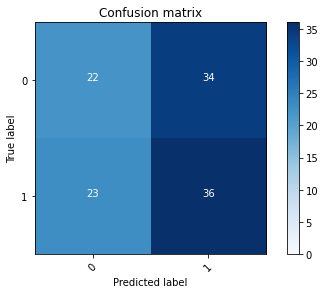

2022-08-22 17:47:46 - [Epoch Train: 11] loss: 0.6054, auc: 0.7459, acc: 0.6819, time: 24.00 s            
2022-08-22 17:47:46 - [Epoch Valid: 11] loss: 0.7717, auc: 0.4773, acc: 0.4880, time: 6.00 s


 11%|████▌                                     | 11/100 [05:45<46:29, 31.34s/it]

2022-08-22 17:47:46 - EPOCH: 12
2022-08-22 17:47:46 - Train Step 10/481, train_loss: 0.6954
2022-08-22 17:47:47 - Train Step 20/481, train_loss: 0.6573
2022-08-22 17:47:47 - Train Step 30/481, train_loss: 0.6339
2022-08-22 17:47:48 - Train Step 40/481, train_loss: 0.6385
2022-08-22 17:47:48 - Train Step 50/481, train_loss: 0.6406
2022-08-22 17:47:49 - Train Step 60/481, train_loss: 0.6320
2022-08-22 17:47:49 - Train Step 70/481, train_loss: 0.6293
2022-08-22 17:47:50 - Train Step 80/481, train_loss: 0.6352
2022-08-22 17:47:50 - Train Step 90/481, train_loss: 0.6230
2022-08-22 17:47:51 - Train Step 100/481, train_loss: 0.6215
2022-08-22 17:47:51 - Train Step 110/481, train_loss: 0.6224
2022-08-22 17:47:52 - Train Step 120/481, train_loss: 0.6173
2022-08-22 17:47:52 - Train Step 130/481, train_loss: 0.6125
2022-08-22 17:47:53 - Train Step 140/481, train_loss: 0.6114
2022-08-22 17:47:53 - Train Step 150/481, train_loss: 0.6164
2022-08-22 17:47:54 - Train Step 160/481, train_loss: 0.6130
2

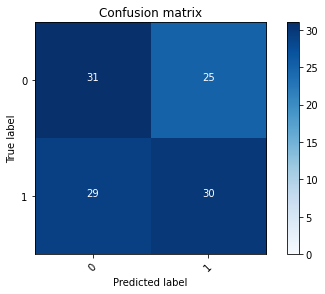

2022-08-22 17:48:17 - [Epoch Train: 12] loss: 0.6026, auc: 0.7497, acc: 0.6881, time: 24.00 s            
2022-08-22 17:48:17 - [Epoch Valid: 12] loss: 0.7706, auc: 0.4791, acc: 0.5280, time: 6.00 s
2022-08-22 17:48:17 - acc improved from 0.5280 to 0.5280. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_17-42-00/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e12-loss0.771-acc0.528-auc0.479.pth'


 12%|█████                                     | 12/100 [06:16<45:54, 31.30s/it]

2022-08-22 17:48:17 - EPOCH: 13
2022-08-22 17:48:18 - Train Step 10/481, train_loss: 0.5530
2022-08-22 17:48:18 - Train Step 20/481, train_loss: 0.6001
2022-08-22 17:48:19 - Train Step 30/481, train_loss: 0.5926
2022-08-22 17:48:19 - Train Step 40/481, train_loss: 0.5715
2022-08-22 17:48:20 - Train Step 50/481, train_loss: 0.5469
2022-08-22 17:48:20 - Train Step 60/481, train_loss: 0.5507
2022-08-22 17:48:21 - Train Step 70/481, train_loss: 0.5518
2022-08-22 17:48:21 - Train Step 80/481, train_loss: 0.5707
2022-08-22 17:48:22 - Train Step 90/481, train_loss: 0.5631
2022-08-22 17:48:22 - Train Step 100/481, train_loss: 0.5658
2022-08-22 17:48:23 - Train Step 110/481, train_loss: 0.5766
2022-08-22 17:48:23 - Train Step 120/481, train_loss: 0.5767
2022-08-22 17:48:24 - Train Step 130/481, train_loss: 0.5814
2022-08-22 17:48:24 - Train Step 140/481, train_loss: 0.5807
2022-08-22 17:48:25 - Train Step 150/481, train_loss: 0.5802
2022-08-22 17:48:25 - Train Step 160/481, train_loss: 0.5778
2

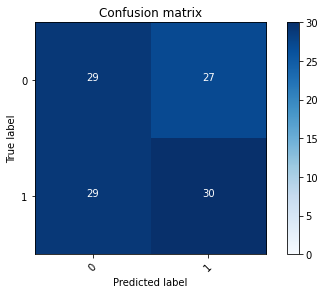

2022-08-22 17:48:48 - [Epoch Train: 13] loss: 0.5914, auc: 0.7635, acc: 0.6923, time: 24.00 s            
2022-08-22 17:48:48 - [Epoch Valid: 13] loss: 0.7794, auc: 0.4788, acc: 0.5120, time: 6.00 s


 13%|█████▍                                    | 13/100 [06:48<45:31, 31.40s/it]

2022-08-22 17:48:48 - EPOCH: 14
2022-08-22 17:48:49 - Train Step 10/481, train_loss: 0.5201
2022-08-22 17:48:50 - Train Step 20/481, train_loss: 0.5208
2022-08-22 17:48:50 - Train Step 30/481, train_loss: 0.5507
2022-08-22 17:48:51 - Train Step 40/481, train_loss: 0.5525
2022-08-22 17:48:51 - Train Step 50/481, train_loss: 0.5813
2022-08-22 17:48:52 - Train Step 60/481, train_loss: 0.5924
2022-08-22 17:48:52 - Train Step 70/481, train_loss: 0.5739
2022-08-22 17:48:53 - Train Step 80/481, train_loss: 0.5796
2022-08-22 17:48:53 - Train Step 90/481, train_loss: 0.5704
2022-08-22 17:48:54 - Train Step 100/481, train_loss: 0.5696
2022-08-22 17:48:54 - Train Step 110/481, train_loss: 0.5727
2022-08-22 17:48:55 - Train Step 120/481, train_loss: 0.5756
2022-08-22 17:48:55 - Train Step 130/481, train_loss: 0.5706
2022-08-22 17:48:56 - Train Step 140/481, train_loss: 0.5762
2022-08-22 17:48:56 - Train Step 150/481, train_loss: 0.5885
2022-08-22 17:48:57 - Train Step 160/481, train_loss: 0.5859
2

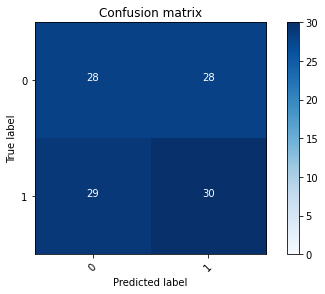

2022-08-22 17:49:20 - [Epoch Train: 14] loss: 0.5861, auc: 0.7589, acc: 0.6902, time: 24.00 s            
2022-08-22 17:49:20 - [Epoch Valid: 14] loss: 0.7835, auc: 0.4861, acc: 0.5040, time: 6.00 s


 14%|█████▉                                    | 14/100 [07:19<44:57, 31.37s/it]

2022-08-22 17:49:20 - EPOCH: 15
2022-08-22 17:49:21 - Train Step 10/481, train_loss: 0.6390
2022-08-22 17:49:21 - Train Step 20/481, train_loss: 0.6996
2022-08-22 17:49:22 - Train Step 30/481, train_loss: 0.7023
2022-08-22 17:49:22 - Train Step 40/481, train_loss: 0.6918
2022-08-22 17:49:23 - Train Step 50/481, train_loss: 0.6454
2022-08-22 17:49:23 - Train Step 60/481, train_loss: 0.6323
2022-08-22 17:49:24 - Train Step 70/481, train_loss: 0.6057
2022-08-22 17:49:24 - Train Step 80/481, train_loss: 0.5968
2022-08-22 17:49:25 - Train Step 90/481, train_loss: 0.5858
2022-08-22 17:49:26 - Train Step 100/481, train_loss: 0.5697
2022-08-22 17:49:26 - Train Step 110/481, train_loss: 0.5687
2022-08-22 17:49:27 - Train Step 120/481, train_loss: 0.5659
2022-08-22 17:49:27 - Train Step 130/481, train_loss: 0.5641
2022-08-22 17:49:28 - Train Step 140/481, train_loss: 0.5623
2022-08-22 17:49:28 - Train Step 150/481, train_loss: 0.5591
2022-08-22 17:49:29 - Train Step 160/481, train_loss: 0.5604
2

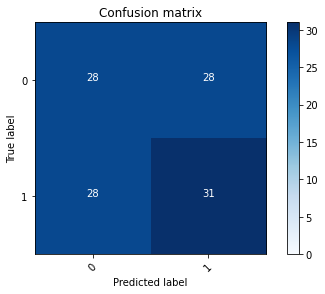

2022-08-22 17:49:53 - [Epoch Train: 15] loss: 0.5803, auc: 0.7742, acc: 0.7006, time: 27.00 s            
2022-08-22 17:49:53 - [Epoch Valid: 15] loss: 0.8070, auc: 0.4846, acc: 0.5120, time: 6.00 s


 15%|██████▎                                   | 15/100 [07:53<45:25, 32.06s/it]

2022-08-22 17:49:53 - EPOCH: 16
2022-08-22 17:49:54 - Train Step 10/481, train_loss: 0.4731
2022-08-22 17:49:55 - Train Step 20/481, train_loss: 0.4790
2022-08-22 17:49:55 - Train Step 30/481, train_loss: 0.5186
2022-08-22 17:49:56 - Train Step 40/481, train_loss: 0.5598
2022-08-22 17:49:56 - Train Step 50/481, train_loss: 0.5647
2022-08-22 17:49:57 - Train Step 60/481, train_loss: 0.5692
2022-08-22 17:49:57 - Train Step 70/481, train_loss: 0.5633
2022-08-22 17:49:58 - Train Step 80/481, train_loss: 0.5674
2022-08-22 17:49:58 - Train Step 90/481, train_loss: 0.5630
2022-08-22 17:49:59 - Train Step 100/481, train_loss: 0.5550
2022-08-22 17:49:59 - Train Step 110/481, train_loss: 0.5495
2022-08-22 17:50:00 - Train Step 120/481, train_loss: 0.5622
2022-08-22 17:50:00 - Train Step 130/481, train_loss: 0.5664
2022-08-22 17:50:01 - Train Step 140/481, train_loss: 0.5632
2022-08-22 17:50:01 - Train Step 150/481, train_loss: 0.5577
2022-08-22 17:50:02 - Train Step 160/481, train_loss: 0.5514
2

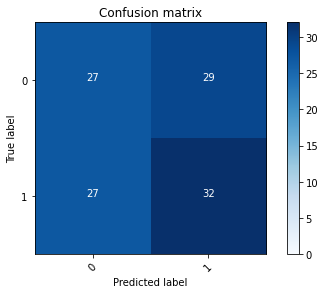

2022-08-22 17:50:25 - [Epoch Train: 16] loss: 0.5707, auc: 0.7781, acc: 0.6985, time: 24.00 s            
2022-08-22 17:50:25 - [Epoch Valid: 16] loss: 0.8093, auc: 0.4921, acc: 0.5040, time: 6.00 s


 16%|██████▋                                   | 16/100 [08:24<44:39, 31.90s/it]

2022-08-22 17:50:25 - EPOCH: 17
2022-08-22 17:50:26 - Train Step 10/481, train_loss: 0.4972
2022-08-22 17:50:26 - Train Step 20/481, train_loss: 0.5356
2022-08-22 17:50:27 - Train Step 30/481, train_loss: 0.5560
2022-08-22 17:50:27 - Train Step 40/481, train_loss: 0.5442
2022-08-22 17:50:28 - Train Step 50/481, train_loss: 0.5489
2022-08-22 17:50:28 - Train Step 60/481, train_loss: 0.5606
2022-08-22 17:50:29 - Train Step 70/481, train_loss: 0.5321
2022-08-22 17:50:29 - Train Step 80/481, train_loss: 0.5349
2022-08-22 17:50:30 - Train Step 90/481, train_loss: 0.5440
2022-08-22 17:50:30 - Train Step 100/481, train_loss: 0.5396
2022-08-22 17:50:31 - Train Step 110/481, train_loss: 0.5267
2022-08-22 17:50:31 - Train Step 120/481, train_loss: 0.5388
2022-08-22 17:50:32 - Train Step 130/481, train_loss: 0.5351
2022-08-22 17:50:32 - Train Step 140/481, train_loss: 0.5513
2022-08-22 17:50:33 - Train Step 150/481, train_loss: 0.5447
2022-08-22 17:50:33 - Train Step 160/481, train_loss: 0.5493
2

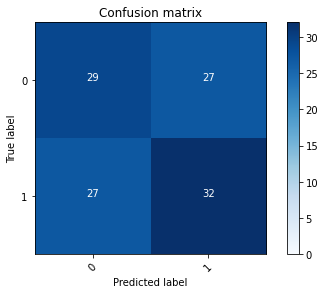

2022-08-22 17:50:57 - [Epoch Train: 17] loss: 0.5574, auc: 0.7983, acc: 0.7464, time: 24.00 s            
2022-08-22 17:50:57 - [Epoch Valid: 17] loss: 0.8133, auc: 0.4903, acc: 0.5280, time: 6.00 s
2022-08-22 17:50:57 - acc improved from 0.5280 to 0.5280. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_17-42-00/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e17-loss0.813-acc0.528-auc0.490.pth'


 17%|███████▏                                  | 17/100 [08:56<44:00, 31.81s/it]

2022-08-22 17:50:57 - EPOCH: 18
2022-08-22 17:50:57 - Train Step 10/481, train_loss: 0.6441
2022-08-22 17:50:58 - Train Step 20/481, train_loss: 0.6306
2022-08-22 17:50:58 - Train Step 30/481, train_loss: 0.5923
2022-08-22 17:50:59 - Train Step 40/481, train_loss: 0.5817
2022-08-22 17:50:59 - Train Step 50/481, train_loss: 0.5907
2022-08-22 17:51:00 - Train Step 60/481, train_loss: 0.5836
2022-08-22 17:51:00 - Train Step 70/481, train_loss: 0.5728
2022-08-22 17:51:01 - Train Step 80/481, train_loss: 0.5628
2022-08-22 17:51:01 - Train Step 90/481, train_loss: 0.5602
2022-08-22 17:51:02 - Train Step 100/481, train_loss: 0.5516
2022-08-22 17:51:02 - Train Step 110/481, train_loss: 0.5360
2022-08-22 17:51:03 - Train Step 120/481, train_loss: 0.5401
2022-08-22 17:51:03 - Train Step 130/481, train_loss: 0.5394
2022-08-22 17:51:04 - Train Step 140/481, train_loss: 0.5509
2022-08-22 17:51:04 - Train Step 150/481, train_loss: 0.5487
2022-08-22 17:51:05 - Train Step 160/481, train_loss: 0.5506
2

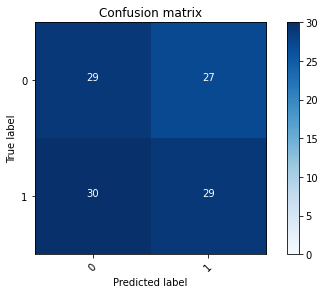

2022-08-22 17:51:28 - [Epoch Train: 18] loss: 0.5535, auc: 0.8099, acc: 0.7339, time: 24.00 s            
2022-08-22 17:51:28 - [Epoch Valid: 18] loss: 0.8178, auc: 0.4888, acc: 0.5040, time: 6.00 s


 18%|███████▌                                  | 18/100 [09:27<43:19, 31.70s/it]

2022-08-22 17:51:28 - EPOCH: 19
2022-08-22 17:51:29 - Train Step 10/481, train_loss: 0.4493
2022-08-22 17:51:29 - Train Step 20/481, train_loss: 0.5161
2022-08-22 17:51:30 - Train Step 30/481, train_loss: 0.5033
2022-08-22 17:51:30 - Train Step 40/481, train_loss: 0.4850
2022-08-22 17:51:31 - Train Step 50/481, train_loss: 0.5049
2022-08-22 17:51:31 - Train Step 60/481, train_loss: 0.5079
2022-08-22 17:51:32 - Train Step 70/481, train_loss: 0.5007
2022-08-22 17:51:32 - Train Step 80/481, train_loss: 0.4902
2022-08-22 17:51:33 - Train Step 90/481, train_loss: 0.4883
2022-08-22 17:51:33 - Train Step 100/481, train_loss: 0.5093
2022-08-22 17:51:34 - Train Step 110/481, train_loss: 0.5091
2022-08-22 17:51:34 - Train Step 120/481, train_loss: 0.4967
2022-08-22 17:51:35 - Train Step 130/481, train_loss: 0.4971
2022-08-22 17:51:35 - Train Step 140/481, train_loss: 0.5138
2022-08-22 17:51:36 - Train Step 150/481, train_loss: 0.5241
2022-08-22 17:51:36 - Train Step 160/481, train_loss: 0.5216
2

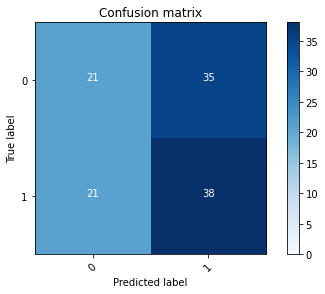

2022-08-22 17:52:00 - [Epoch Train: 19] loss: 0.5511, auc: 0.7953, acc: 0.7173, time: 24.00 s            
2022-08-22 17:52:00 - [Epoch Valid: 19] loss: 0.8628, auc: 0.4924, acc: 0.4880, time: 6.00 s


 19%|███████▉                                  | 19/100 [09:59<42:48, 31.71s/it]

2022-08-22 17:52:00 - EPOCH: 20
2022-08-22 17:52:00 - Train Step 10/481, train_loss: 0.6859
2022-08-22 17:52:01 - Train Step 20/481, train_loss: 0.6279
2022-08-22 17:52:01 - Train Step 30/481, train_loss: 0.5683
2022-08-22 17:52:02 - Train Step 40/481, train_loss: 0.5717
2022-08-22 17:52:02 - Train Step 50/481, train_loss: 0.5580
2022-08-22 17:52:03 - Train Step 60/481, train_loss: 0.5599
2022-08-22 17:52:04 - Train Step 70/481, train_loss: 0.5606
2022-08-22 17:52:04 - Train Step 80/481, train_loss: 0.5508
2022-08-22 17:52:05 - Train Step 90/481, train_loss: 0.5455
2022-08-22 17:52:05 - Train Step 100/481, train_loss: 0.5352
2022-08-22 17:52:06 - Train Step 110/481, train_loss: 0.5346
2022-08-22 17:52:06 - Train Step 120/481, train_loss: 0.5357
2022-08-22 17:52:07 - Train Step 130/481, train_loss: 0.5394
2022-08-22 17:52:07 - Train Step 140/481, train_loss: 0.5346
2022-08-22 17:52:08 - Train Step 150/481, train_loss: 0.5263
2022-08-22 17:52:08 - Train Step 160/481, train_loss: 0.5301
2

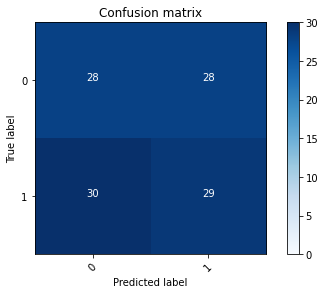

2022-08-22 17:52:31 - [Epoch Train: 20] loss: 0.5329, auc: 0.8181, acc: 0.7588, time: 24.00 s            
2022-08-22 17:52:31 - [Epoch Valid: 20] loss: 0.8011, auc: 0.4930, acc: 0.4880, time: 6.00 s


 20%|████████▍                                 | 20/100 [10:31<42:13, 31.67s/it]

2022-08-22 17:52:31 - EPOCH: 21
2022-08-22 17:52:32 - Train Step 10/481, train_loss: 0.3678
2022-08-22 17:52:33 - Train Step 20/481, train_loss: 0.5311
2022-08-22 17:52:33 - Train Step 30/481, train_loss: 0.5651
2022-08-22 17:52:34 - Train Step 40/481, train_loss: 0.5199
2022-08-22 17:52:34 - Train Step 50/481, train_loss: 0.5278
2022-08-22 17:52:35 - Train Step 60/481, train_loss: 0.5234
2022-08-22 17:52:35 - Train Step 70/481, train_loss: 0.5280
2022-08-22 17:52:36 - Train Step 80/481, train_loss: 0.5373
2022-08-22 17:52:36 - Train Step 90/481, train_loss: 0.5469
2022-08-22 17:52:37 - Train Step 100/481, train_loss: 0.5451
2022-08-22 17:52:37 - Train Step 110/481, train_loss: 0.5382
2022-08-22 17:52:38 - Train Step 120/481, train_loss: 0.5275
2022-08-22 17:52:38 - Train Step 130/481, train_loss: 0.5230
2022-08-22 17:52:39 - Train Step 140/481, train_loss: 0.5208
2022-08-22 17:52:39 - Train Step 150/481, train_loss: 0.5250
2022-08-22 17:52:40 - Train Step 160/481, train_loss: 0.5192
2

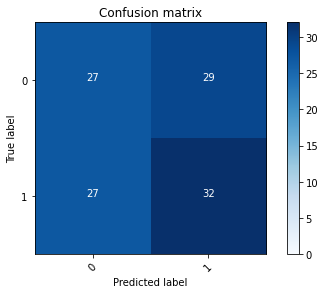

2022-08-22 17:53:03 - [Epoch Train: 21] loss: 0.5152, auc: 0.8367, acc: 0.7464, time: 24.00 s            
2022-08-22 17:53:03 - [Epoch Valid: 21] loss: 0.8554, auc: 0.4912, acc: 0.5040, time: 6.00 s


 21%|████████▊                                 | 21/100 [11:02<41:30, 31.53s/it]

2022-08-22 17:53:03 - EPOCH: 22
2022-08-22 17:53:03 - Train Step 10/481, train_loss: 0.5440
2022-08-22 17:53:04 - Train Step 20/481, train_loss: 0.6687
2022-08-22 17:53:04 - Train Step 30/481, train_loss: 0.5707
2022-08-22 17:53:05 - Train Step 40/481, train_loss: 0.5768
2022-08-22 17:53:05 - Train Step 50/481, train_loss: 0.5815
2022-08-22 17:53:06 - Train Step 60/481, train_loss: 0.5884
2022-08-22 17:53:06 - Train Step 70/481, train_loss: 0.5573
2022-08-22 17:53:07 - Train Step 80/481, train_loss: 0.5529
2022-08-22 17:53:07 - Train Step 90/481, train_loss: 0.5414
2022-08-22 17:53:08 - Train Step 100/481, train_loss: 0.5550
2022-08-22 17:53:08 - Train Step 110/481, train_loss: 0.5550
2022-08-22 17:53:09 - Train Step 120/481, train_loss: 0.5458
2022-08-22 17:53:09 - Train Step 130/481, train_loss: 0.5465
2022-08-22 17:53:10 - Train Step 140/481, train_loss: 0.5480
2022-08-22 17:53:10 - Train Step 150/481, train_loss: 0.5480
2022-08-22 17:53:11 - Train Step 160/481, train_loss: 0.5447
2

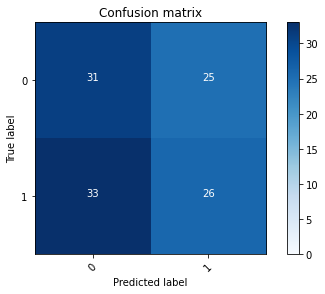

2022-08-22 17:53:34 - [Epoch Train: 22] loss: 0.5083, auc: 0.8422, acc: 0.7651, time: 24.00 s            
2022-08-22 17:53:34 - [Epoch Valid: 22] loss: 0.8320, auc: 0.4837, acc: 0.5120, time: 6.00 s


 22%|█████████▏                                | 22/100 [11:33<40:57, 31.51s/it]

2022-08-22 17:53:34 - EPOCH: 23
2022-08-22 17:53:35 - Train Step 10/481, train_loss: 0.4023
2022-08-22 17:53:35 - Train Step 20/481, train_loss: 0.4378
2022-08-22 17:53:36 - Train Step 30/481, train_loss: 0.5057
2022-08-22 17:53:36 - Train Step 40/481, train_loss: 0.4909
2022-08-22 17:53:37 - Train Step 50/481, train_loss: 0.5119
2022-08-22 17:53:37 - Train Step 60/481, train_loss: 0.4950
2022-08-22 17:53:38 - Train Step 70/481, train_loss: 0.4820
2022-08-22 17:53:38 - Train Step 80/481, train_loss: 0.5031
2022-08-22 17:53:39 - Train Step 90/481, train_loss: 0.5064
2022-08-22 17:53:39 - Train Step 100/481, train_loss: 0.5132
2022-08-22 17:53:40 - Train Step 110/481, train_loss: 0.5233
2022-08-22 17:53:40 - Train Step 120/481, train_loss: 0.5234
2022-08-22 17:53:41 - Train Step 130/481, train_loss: 0.5268
2022-08-22 17:53:41 - Train Step 140/481, train_loss: 0.5385
2022-08-22 17:53:42 - Train Step 150/481, train_loss: 0.5336
2022-08-22 17:53:42 - Train Step 160/481, train_loss: 0.5319
2

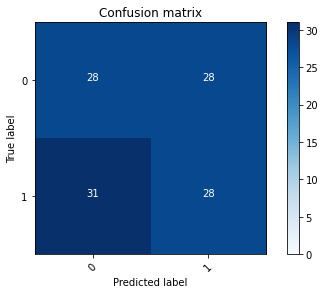

2022-08-22 17:54:05 - [Epoch Train: 23] loss: 0.5139, auc: 0.8322, acc: 0.7775, time: 24.00 s            
2022-08-22 17:54:05 - [Epoch Valid: 23] loss: 0.8372, auc: 0.4888, acc: 0.4880, time: 6.00 s


 23%|█████████▋                                | 23/100 [12:05<40:22, 31.46s/it]

2022-08-22 17:54:05 - EPOCH: 24
2022-08-22 17:54:06 - Train Step 10/481, train_loss: 0.3423
2022-08-22 17:54:07 - Train Step 20/481, train_loss: 0.4584
2022-08-22 17:54:07 - Train Step 30/481, train_loss: 0.4585
2022-08-22 17:54:08 - Train Step 40/481, train_loss: 0.4545
2022-08-22 17:54:08 - Train Step 50/481, train_loss: 0.4667
2022-08-22 17:54:09 - Train Step 60/481, train_loss: 0.4587
2022-08-22 17:54:09 - Train Step 70/481, train_loss: 0.4758
2022-08-22 17:54:10 - Train Step 80/481, train_loss: 0.5078
2022-08-22 17:54:10 - Train Step 90/481, train_loss: 0.5040
2022-08-22 17:54:11 - Train Step 100/481, train_loss: 0.5052
2022-08-22 17:54:11 - Train Step 110/481, train_loss: 0.5099
2022-08-22 17:54:12 - Train Step 120/481, train_loss: 0.5000
2022-08-22 17:54:12 - Train Step 130/481, train_loss: 0.4984
2022-08-22 17:54:13 - Train Step 140/481, train_loss: 0.4909
2022-08-22 17:54:13 - Train Step 150/481, train_loss: 0.4864
2022-08-22 17:54:14 - Train Step 160/481, train_loss: 0.4895
2

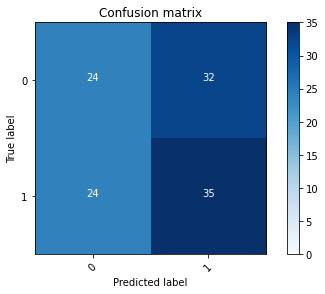

2022-08-22 17:54:37 - [Epoch Train: 24] loss: 0.4999, auc: 0.8450, acc: 0.7692, time: 24.00 s            
2022-08-22 17:54:37 - [Epoch Valid: 24] loss: 0.8514, auc: 0.4903, acc: 0.5040, time: 6.00 s


 24%|██████████                                | 24/100 [12:36<39:46, 31.40s/it]

2022-08-22 17:54:37 - EPOCH: 25
2022-08-22 17:54:37 - Train Step 10/481, train_loss: 0.5968
2022-08-22 17:54:38 - Train Step 20/481, train_loss: 0.5512
2022-08-22 17:54:38 - Train Step 30/481, train_loss: 0.5074
2022-08-22 17:54:39 - Train Step 40/481, train_loss: 0.5286
2022-08-22 17:54:39 - Train Step 50/481, train_loss: 0.5098
2022-08-22 17:54:40 - Train Step 60/481, train_loss: 0.5010
2022-08-22 17:54:40 - Train Step 70/481, train_loss: 0.4970
2022-08-22 17:54:41 - Train Step 80/481, train_loss: 0.4921
2022-08-22 17:54:41 - Train Step 90/481, train_loss: 0.4864
2022-08-22 17:54:42 - Train Step 100/481, train_loss: 0.4891
2022-08-22 17:54:42 - Train Step 110/481, train_loss: 0.4878
2022-08-22 17:54:43 - Train Step 120/481, train_loss: 0.4739
2022-08-22 17:54:43 - Train Step 130/481, train_loss: 0.4691
2022-08-22 17:54:44 - Train Step 140/481, train_loss: 0.4704
2022-08-22 17:54:44 - Train Step 150/481, train_loss: 0.4646
2022-08-22 17:54:45 - Train Step 160/481, train_loss: 0.4673
2

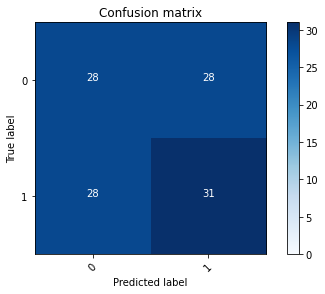

2022-08-22 17:55:08 - [Epoch Train: 25] loss: 0.4826, auc: 0.8612, acc: 0.7963, time: 24.00 s            
2022-08-22 17:55:08 - [Epoch Valid: 25] loss: 0.8435, auc: 0.4909, acc: 0.5120, time: 6.00 s


 25%|██████████▌                               | 25/100 [13:08<39:17, 31.44s/it]

2022-08-22 17:55:08 - EPOCH: 26
2022-08-22 17:55:09 - Train Step 10/481, train_loss: 0.5414
2022-08-22 17:55:09 - Train Step 20/481, train_loss: 0.4468
2022-08-22 17:55:10 - Train Step 30/481, train_loss: 0.4647
2022-08-22 17:55:10 - Train Step 40/481, train_loss: 0.4908
2022-08-22 17:55:11 - Train Step 50/481, train_loss: 0.4753
2022-08-22 17:55:11 - Train Step 60/481, train_loss: 0.4886
2022-08-22 17:55:12 - Train Step 70/481, train_loss: 0.4725
2022-08-22 17:55:12 - Train Step 80/481, train_loss: 0.4715
2022-08-22 17:55:13 - Train Step 90/481, train_loss: 0.4613
2022-08-22 17:55:13 - Train Step 100/481, train_loss: 0.4655
2022-08-22 17:55:14 - Train Step 110/481, train_loss: 0.4572
2022-08-22 17:55:14 - Train Step 120/481, train_loss: 0.4590
2022-08-22 17:55:15 - Train Step 130/481, train_loss: 0.4693
2022-08-22 17:55:16 - Train Step 140/481, train_loss: 0.4575
2022-08-22 17:55:16 - Train Step 150/481, train_loss: 0.4505
2022-08-22 17:55:17 - Train Step 160/481, train_loss: 0.4470
2

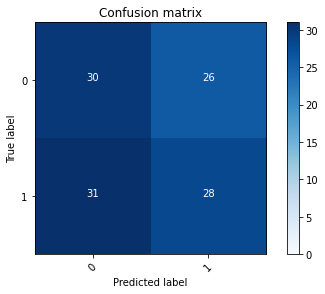

2022-08-22 17:55:40 - [Epoch Train: 26] loss: 0.4712, auc: 0.8660, acc: 0.8025, time: 25.00 s            
2022-08-22 17:55:40 - [Epoch Valid: 26] loss: 0.8600, auc: 0.4933, acc: 0.5120, time: 6.00 s


 26%|██████████▉                               | 26/100 [13:39<38:53, 31.53s/it]

2022-08-22 17:55:40 - EPOCH: 27
2022-08-22 17:55:41 - Train Step 10/481, train_loss: 0.4016
2022-08-22 17:55:41 - Train Step 20/481, train_loss: 0.4718
2022-08-22 17:55:42 - Train Step 30/481, train_loss: 0.4595
2022-08-22 17:55:42 - Train Step 40/481, train_loss: 0.4691
2022-08-22 17:55:43 - Train Step 50/481, train_loss: 0.4782
2022-08-22 17:55:43 - Train Step 60/481, train_loss: 0.4592
2022-08-22 17:55:44 - Train Step 70/481, train_loss: 0.4483
2022-08-22 17:55:44 - Train Step 80/481, train_loss: 0.4435
2022-08-22 17:55:45 - Train Step 90/481, train_loss: 0.4617
2022-08-22 17:55:45 - Train Step 100/481, train_loss: 0.4580
2022-08-22 17:55:46 - Train Step 110/481, train_loss: 0.4536
2022-08-22 17:55:46 - Train Step 120/481, train_loss: 0.4438
2022-08-22 17:55:47 - Train Step 130/481, train_loss: 0.4348
2022-08-22 17:55:47 - Train Step 140/481, train_loss: 0.4427
2022-08-22 17:55:48 - Train Step 150/481, train_loss: 0.4375
2022-08-22 17:55:48 - Train Step 160/481, train_loss: 0.4331
2

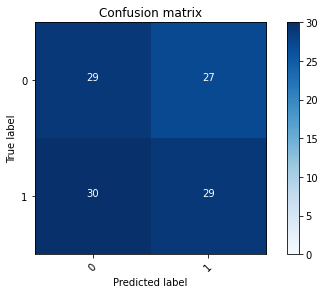

2022-08-22 17:56:11 - [Epoch Train: 27] loss: 0.4489, auc: 0.8875, acc: 0.8150, time: 24.00 s            
2022-08-22 17:56:11 - [Epoch Valid: 27] loss: 0.8772, auc: 0.4885, acc: 0.5040, time: 6.00 s


 27%|███████████▎                              | 27/100 [14:11<38:16, 31.47s/it]

2022-08-22 17:56:11 - EPOCH: 28
2022-08-22 17:56:12 - Train Step 10/481, train_loss: 0.2871
2022-08-22 17:56:12 - Train Step 20/481, train_loss: 0.3060
2022-08-22 17:56:13 - Train Step 30/481, train_loss: 0.3393
2022-08-22 17:56:13 - Train Step 40/481, train_loss: 0.3870
2022-08-22 17:56:14 - Train Step 50/481, train_loss: 0.3850
2022-08-22 17:56:14 - Train Step 60/481, train_loss: 0.4118
2022-08-22 17:56:15 - Train Step 70/481, train_loss: 0.4071
2022-08-22 17:56:15 - Train Step 80/481, train_loss: 0.3903
2022-08-22 17:56:16 - Train Step 90/481, train_loss: 0.4186
2022-08-22 17:56:16 - Train Step 100/481, train_loss: 0.4358
2022-08-22 17:56:17 - Train Step 110/481, train_loss: 0.4313
2022-08-22 17:56:17 - Train Step 120/481, train_loss: 0.4279
2022-08-22 17:56:18 - Train Step 130/481, train_loss: 0.4379
2022-08-22 17:56:19 - Train Step 140/481, train_loss: 0.4380
2022-08-22 17:56:19 - Train Step 150/481, train_loss: 0.4515
2022-08-22 17:56:20 - Train Step 160/481, train_loss: 0.4459
2

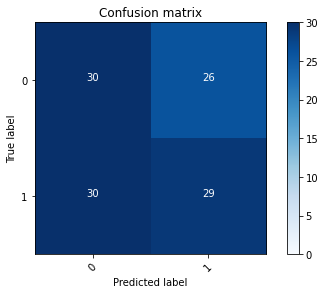

2022-08-22 17:56:43 - [Epoch Train: 28] loss: 0.4526, auc: 0.8729, acc: 0.7838, time: 24.00 s            
2022-08-22 17:56:43 - [Epoch Valid: 28] loss: 0.8878, auc: 0.4861, acc: 0.5200, time: 6.00 s


 28%|███████████▊                              | 28/100 [14:42<37:43, 31.44s/it]

2022-08-22 17:56:43 - EPOCH: 29
2022-08-22 17:56:43 - Train Step 10/481, train_loss: 0.5411
2022-08-22 17:56:44 - Train Step 20/481, train_loss: 0.4790
2022-08-22 17:56:44 - Train Step 30/481, train_loss: 0.4390
2022-08-22 17:56:45 - Train Step 40/481, train_loss: 0.3964
2022-08-22 17:56:45 - Train Step 50/481, train_loss: 0.3897
2022-08-22 17:56:46 - Train Step 60/481, train_loss: 0.3885
2022-08-22 17:56:46 - Train Step 70/481, train_loss: 0.4120
2022-08-22 17:56:47 - Train Step 80/481, train_loss: 0.4090
2022-08-22 17:56:47 - Train Step 90/481, train_loss: 0.4494
2022-08-22 17:56:48 - Train Step 100/481, train_loss: 0.4410
2022-08-22 17:56:48 - Train Step 110/481, train_loss: 0.4476
2022-08-22 17:56:49 - Train Step 120/481, train_loss: 0.4576
2022-08-22 17:56:50 - Train Step 130/481, train_loss: 0.4560
2022-08-22 17:56:50 - Train Step 140/481, train_loss: 0.4594
2022-08-22 17:56:51 - Train Step 150/481, train_loss: 0.4440
2022-08-22 17:56:51 - Train Step 160/481, train_loss: 0.4421
2

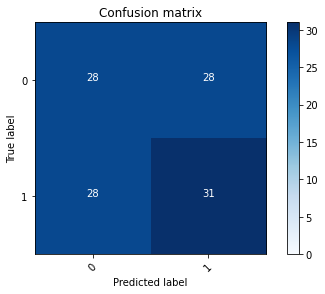

2022-08-22 17:57:14 - [Epoch Train: 29] loss: 0.4443, auc: 0.8872, acc: 0.8025, time: 24.00 s            
2022-08-22 17:57:14 - [Epoch Valid: 29] loss: 0.8657, auc: 0.4900, acc: 0.5200, time: 6.00 s


 29%|████████████▏                             | 29/100 [15:14<37:14, 31.48s/it]

2022-08-22 17:57:14 - EPOCH: 30
2022-08-22 17:57:15 - Train Step 10/481, train_loss: 0.4756
2022-08-22 17:57:15 - Train Step 20/481, train_loss: 0.4811
2022-08-22 17:57:16 - Train Step 30/481, train_loss: 0.4436
2022-08-22 17:57:16 - Train Step 40/481, train_loss: 0.4729
2022-08-22 17:57:17 - Train Step 50/481, train_loss: 0.4716
2022-08-22 17:57:17 - Train Step 60/481, train_loss: 0.4441
2022-08-22 17:57:18 - Train Step 70/481, train_loss: 0.4648
2022-08-22 17:57:18 - Train Step 80/481, train_loss: 0.4835
2022-08-22 17:57:19 - Train Step 90/481, train_loss: 0.4682
2022-08-22 17:57:19 - Train Step 100/481, train_loss: 0.4781
2022-08-22 17:57:20 - Train Step 110/481, train_loss: 0.4740
2022-08-22 17:57:20 - Train Step 120/481, train_loss: 0.4730
2022-08-22 17:57:21 - Train Step 130/481, train_loss: 0.4708
2022-08-22 17:57:21 - Train Step 140/481, train_loss: 0.4605
2022-08-22 17:57:22 - Train Step 150/481, train_loss: 0.4542
2022-08-22 17:57:23 - Train Step 160/481, train_loss: 0.4461
2

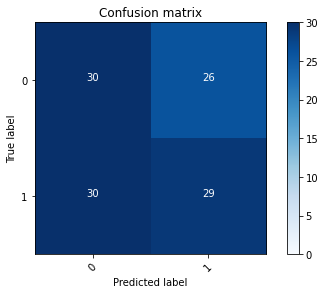

2022-08-22 17:57:46 - [Epoch Train: 30] loss: 0.4353, auc: 0.8902, acc: 0.8067, time: 24.00 s            
2022-08-22 17:57:46 - [Epoch Valid: 30] loss: 0.9040, auc: 0.4903, acc: 0.5200, time: 6.00 s


 30%|████████████▌                             | 30/100 [15:45<36:42, 31.47s/it]

2022-08-22 17:57:46 - EPOCH: 31
2022-08-22 17:57:46 - Train Step 10/481, train_loss: 0.4770
2022-08-22 17:57:47 - Train Step 20/481, train_loss: 0.5112
2022-08-22 17:57:47 - Train Step 30/481, train_loss: 0.4319
2022-08-22 17:57:48 - Train Step 40/481, train_loss: 0.4061
2022-08-22 17:57:48 - Train Step 50/481, train_loss: 0.4652
2022-08-22 17:57:49 - Train Step 60/481, train_loss: 0.4432
2022-08-22 17:57:49 - Train Step 70/481, train_loss: 0.4394
2022-08-22 17:57:50 - Train Step 80/481, train_loss: 0.4279
2022-08-22 17:57:50 - Train Step 90/481, train_loss: 0.4414
2022-08-22 17:57:51 - Train Step 100/481, train_loss: 0.4360
2022-08-22 17:57:51 - Train Step 110/481, train_loss: 0.4400
2022-08-22 17:57:52 - Train Step 120/481, train_loss: 0.4385
2022-08-22 17:57:52 - Train Step 130/481, train_loss: 0.4275
2022-08-22 17:57:53 - Train Step 140/481, train_loss: 0.4331
2022-08-22 17:57:53 - Train Step 150/481, train_loss: 0.4264
2022-08-22 17:57:54 - Train Step 160/481, train_loss: 0.4240
2

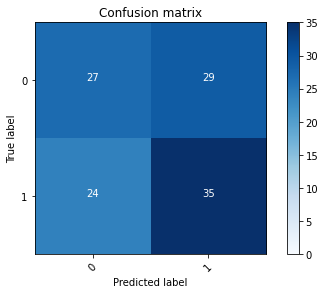

2022-08-22 17:58:17 - [Epoch Train: 31] loss: 0.4281, auc: 0.8920, acc: 0.8170, time: 24.00 s            
2022-08-22 17:58:17 - [Epoch Valid: 31] loss: 0.9270, auc: 0.4903, acc: 0.5440, time: 6.00 s
2022-08-22 17:58:17 - acc improved from 0.5280 to 0.5440. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_17-42-00/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e31-loss0.927-acc0.544-auc0.490.pth'


 31%|█████████████                             | 31/100 [16:16<36:10, 31.45s/it]

2022-08-22 17:58:17 - EPOCH: 32
2022-08-22 17:58:18 - Train Step 10/481, train_loss: 0.5856
2022-08-22 17:58:18 - Train Step 20/481, train_loss: 0.5041
2022-08-22 17:58:19 - Train Step 30/481, train_loss: 0.4994
2022-08-22 17:58:19 - Train Step 40/481, train_loss: 0.5324
2022-08-22 17:58:20 - Train Step 50/481, train_loss: 0.5622
2022-08-22 17:58:20 - Train Step 60/481, train_loss: 0.5289
2022-08-22 17:58:21 - Train Step 70/481, train_loss: 0.5034
2022-08-22 17:58:21 - Train Step 80/481, train_loss: 0.4884
2022-08-22 17:58:22 - Train Step 90/481, train_loss: 0.4570
2022-08-22 17:58:22 - Train Step 100/481, train_loss: 0.4592
2022-08-22 17:58:23 - Train Step 110/481, train_loss: 0.4721
2022-08-22 17:58:23 - Train Step 120/481, train_loss: 0.4512
2022-08-22 17:58:24 - Train Step 130/481, train_loss: 0.4415
2022-08-22 17:58:24 - Train Step 140/481, train_loss: 0.4216
2022-08-22 17:58:25 - Train Step 150/481, train_loss: 0.4122
2022-08-22 17:58:25 - Train Step 160/481, train_loss: 0.4249
2

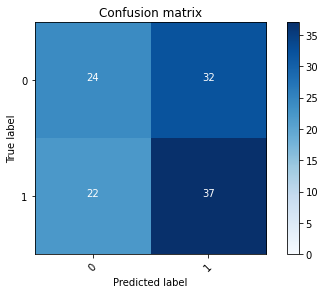

2022-08-22 17:58:48 - [Epoch Train: 32] loss: 0.4224, auc: 0.8984, acc: 0.8274, time: 24.00 s            
2022-08-22 17:58:48 - [Epoch Valid: 32] loss: 0.9809, auc: 0.4885, acc: 0.5280, time: 6.00 s


 32%|█████████████▍                            | 32/100 [16:48<35:35, 31.40s/it]

2022-08-22 17:58:48 - EPOCH: 33
2022-08-22 17:58:49 - Train Step 10/481, train_loss: 0.2487
2022-08-22 17:58:49 - Train Step 20/481, train_loss: 0.3133
2022-08-22 17:58:50 - Train Step 30/481, train_loss: 0.3230
2022-08-22 17:58:50 - Train Step 40/481, train_loss: 0.3003
2022-08-22 17:58:51 - Train Step 50/481, train_loss: 0.3208
2022-08-22 17:58:51 - Train Step 60/481, train_loss: 0.3235
2022-08-22 17:58:52 - Train Step 70/481, train_loss: 0.3263
2022-08-22 17:58:53 - Train Step 80/481, train_loss: 0.3357
2022-08-22 17:58:53 - Train Step 90/481, train_loss: 0.3591
2022-08-22 17:58:54 - Train Step 100/481, train_loss: 0.3701
2022-08-22 17:58:54 - Train Step 110/481, train_loss: 0.3763
2022-08-22 17:58:55 - Train Step 120/481, train_loss: 0.3703
2022-08-22 17:58:55 - Train Step 130/481, train_loss: 0.3622
2022-08-22 17:58:56 - Train Step 140/481, train_loss: 0.3738
2022-08-22 17:58:56 - Train Step 150/481, train_loss: 0.3716
2022-08-22 17:58:57 - Train Step 160/481, train_loss: 0.3634
2

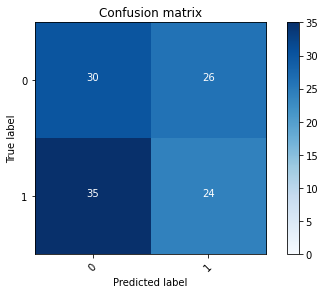

2022-08-22 17:59:20 - [Epoch Train: 33] loss: 0.4017, auc: 0.9104, acc: 0.8399, time: 24.00 s            
2022-08-22 17:59:20 - [Epoch Valid: 33] loss: 0.9214, auc: 0.4846, acc: 0.4800, time: 6.00 s


 33%|█████████████▊                            | 33/100 [17:19<35:07, 31.45s/it]

2022-08-22 17:59:20 - EPOCH: 34
2022-08-22 17:59:21 - Train Step 10/481, train_loss: 0.4108
2022-08-22 17:59:21 - Train Step 20/481, train_loss: 0.3907
2022-08-22 17:59:22 - Train Step 30/481, train_loss: 0.4134
2022-08-22 17:59:22 - Train Step 40/481, train_loss: 0.4377
2022-08-22 17:59:23 - Train Step 50/481, train_loss: 0.4190
2022-08-22 17:59:23 - Train Step 60/481, train_loss: 0.4010
2022-08-22 17:59:24 - Train Step 70/481, train_loss: 0.4157
2022-08-22 17:59:24 - Train Step 80/481, train_loss: 0.4253
2022-08-22 17:59:25 - Train Step 90/481, train_loss: 0.4413
2022-08-22 17:59:25 - Train Step 100/481, train_loss: 0.4565
2022-08-22 17:59:26 - Train Step 110/481, train_loss: 0.4736
2022-08-22 17:59:26 - Train Step 120/481, train_loss: 0.4618
2022-08-22 17:59:27 - Train Step 130/481, train_loss: 0.4502
2022-08-22 17:59:27 - Train Step 140/481, train_loss: 0.4388
2022-08-22 17:59:28 - Train Step 150/481, train_loss: 0.4322
2022-08-22 17:59:28 - Train Step 160/481, train_loss: 0.4421
2

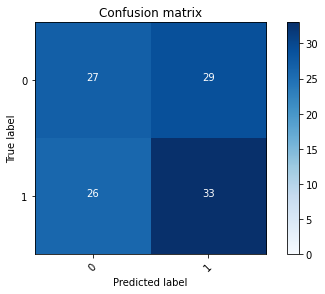

2022-08-22 17:59:51 - [Epoch Train: 34] loss: 0.3931, auc: 0.9147, acc: 0.8274, time: 24.00 s            
2022-08-22 17:59:51 - [Epoch Valid: 34] loss: 0.9962, auc: 0.4849, acc: 0.5280, time: 6.00 s


 34%|██████████████▎                           | 34/100 [17:51<34:36, 31.46s/it]

2022-08-22 17:59:51 - EPOCH: 35
2022-08-22 17:59:52 - Train Step 10/481, train_loss: 0.4072
2022-08-22 17:59:52 - Train Step 20/481, train_loss: 0.3280
2022-08-22 17:59:53 - Train Step 30/481, train_loss: 0.3209
2022-08-22 17:59:53 - Train Step 40/481, train_loss: 0.3712
2022-08-22 17:59:54 - Train Step 50/481, train_loss: 0.3577
2022-08-22 17:59:55 - Train Step 60/481, train_loss: 0.3640
2022-08-22 17:59:55 - Train Step 70/481, train_loss: 0.3451
2022-08-22 17:59:56 - Train Step 80/481, train_loss: 0.3501
2022-08-22 17:59:56 - Train Step 90/481, train_loss: 0.3529
2022-08-22 17:59:57 - Train Step 100/481, train_loss: 0.3549
2022-08-22 17:59:57 - Train Step 110/481, train_loss: 0.3498
2022-08-22 17:59:58 - Train Step 120/481, train_loss: 0.3517
2022-08-22 17:59:58 - Train Step 130/481, train_loss: 0.3400
2022-08-22 17:59:59 - Train Step 140/481, train_loss: 0.3483
2022-08-22 17:59:59 - Train Step 150/481, train_loss: 0.3523
2022-08-22 18:00:00 - Train Step 160/481, train_loss: 0.3552
2

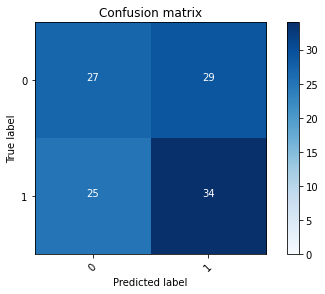

2022-08-22 18:00:22 - [Epoch Train: 35] loss: 0.3810, auc: 0.9176, acc: 0.8337, time: 24.00 s            
2022-08-22 18:00:22 - [Epoch Valid: 35] loss: 0.9768, auc: 0.4897, acc: 0.5360, time: 6.00 s


 35%|██████████████▋                           | 35/100 [18:22<33:55, 31.31s/it]

2022-08-22 18:00:22 - EPOCH: 36
2022-08-22 18:00:23 - Train Step 10/481, train_loss: 0.3392
2022-08-22 18:00:24 - Train Step 20/481, train_loss: 0.3554
2022-08-22 18:00:24 - Train Step 30/481, train_loss: 0.3979
2022-08-22 18:00:25 - Train Step 40/481, train_loss: 0.4139
2022-08-22 18:00:25 - Train Step 50/481, train_loss: 0.4208
2022-08-22 18:00:26 - Train Step 60/481, train_loss: 0.3973
2022-08-22 18:00:26 - Train Step 70/481, train_loss: 0.3986
2022-08-22 18:00:27 - Train Step 80/481, train_loss: 0.3986
2022-08-22 18:00:27 - Train Step 90/481, train_loss: 0.3994
2022-08-22 18:00:28 - Train Step 100/481, train_loss: 0.3991
2022-08-22 18:00:28 - Train Step 110/481, train_loss: 0.3894
2022-08-22 18:00:29 - Train Step 120/481, train_loss: 0.3918
2022-08-22 18:00:29 - Train Step 130/481, train_loss: 0.3885
2022-08-22 18:00:30 - Train Step 140/481, train_loss: 0.4018
2022-08-22 18:00:30 - Train Step 150/481, train_loss: 0.3919
2022-08-22 18:00:31 - Train Step 160/481, train_loss: 0.3965
2

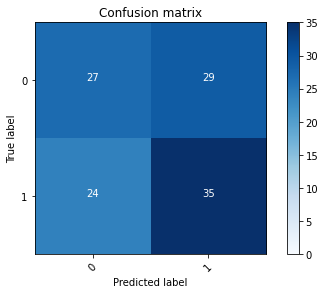

2022-08-22 18:00:54 - [Epoch Train: 36] loss: 0.3722, auc: 0.9246, acc: 0.8565, time: 24.00 s            
2022-08-22 18:00:54 - [Epoch Valid: 36] loss: 1.0239, auc: 0.4900, acc: 0.5360, time: 6.00 s


 36%|███████████████                           | 36/100 [18:53<33:27, 31.37s/it]

2022-08-22 18:00:54 - EPOCH: 37
2022-08-22 18:00:54 - Train Step 10/481, train_loss: 0.4589
2022-08-22 18:00:55 - Train Step 20/481, train_loss: 0.4160
2022-08-22 18:00:56 - Train Step 30/481, train_loss: 0.4027
2022-08-22 18:00:56 - Train Step 40/481, train_loss: 0.3941
2022-08-22 18:00:57 - Train Step 50/481, train_loss: 0.4506
2022-08-22 18:00:57 - Train Step 60/481, train_loss: 0.4513
2022-08-22 18:00:58 - Train Step 70/481, train_loss: 0.4512
2022-08-22 18:00:58 - Train Step 80/481, train_loss: 0.4404
2022-08-22 18:00:59 - Train Step 90/481, train_loss: 0.4173
2022-08-22 18:00:59 - Train Step 100/481, train_loss: 0.3958
2022-08-22 18:01:00 - Train Step 110/481, train_loss: 0.3890
2022-08-22 18:01:00 - Train Step 120/481, train_loss: 0.3764
2022-08-22 18:01:01 - Train Step 130/481, train_loss: 0.3585
2022-08-22 18:01:01 - Train Step 140/481, train_loss: 0.3624
2022-08-22 18:01:02 - Train Step 150/481, train_loss: 0.3566
2022-08-22 18:01:02 - Train Step 160/481, train_loss: 0.3645
2

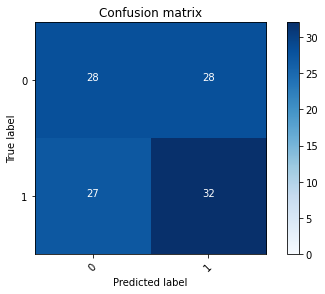

2022-08-22 18:01:25 - [Epoch Train: 37] loss: 0.3632, auc: 0.9328, acc: 0.8607, time: 24.00 s            
2022-08-22 18:01:25 - [Epoch Valid: 37] loss: 1.0301, auc: 0.4861, acc: 0.5280, time: 6.00 s


 37%|███████████████▌                          | 37/100 [19:25<32:57, 31.39s/it]

2022-08-22 18:01:25 - EPOCH: 38
2022-08-22 18:01:26 - Train Step 10/481, train_loss: 0.3401
2022-08-22 18:01:26 - Train Step 20/481, train_loss: 0.4324
2022-08-22 18:01:27 - Train Step 30/481, train_loss: 0.3510
2022-08-22 18:01:27 - Train Step 40/481, train_loss: 0.3582
2022-08-22 18:01:28 - Train Step 50/481, train_loss: 0.3465
2022-08-22 18:01:28 - Train Step 60/481, train_loss: 0.3441
2022-08-22 18:01:29 - Train Step 70/481, train_loss: 0.3376
2022-08-22 18:01:29 - Train Step 80/481, train_loss: 0.3222
2022-08-22 18:01:30 - Train Step 90/481, train_loss: 0.3085
2022-08-22 18:01:30 - Train Step 100/481, train_loss: 0.3059
2022-08-22 18:01:31 - Train Step 110/481, train_loss: 0.2985
2022-08-22 18:01:31 - Train Step 120/481, train_loss: 0.2889
2022-08-22 18:01:32 - Train Step 130/481, train_loss: 0.2971
2022-08-22 18:01:32 - Train Step 140/481, train_loss: 0.2952
2022-08-22 18:01:33 - Train Step 150/481, train_loss: 0.3117
2022-08-22 18:01:33 - Train Step 160/481, train_loss: 0.3099
2

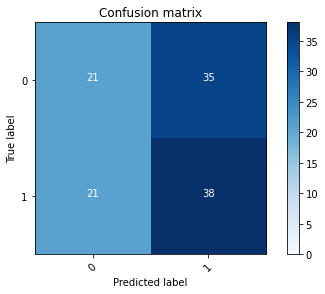

2022-08-22 18:01:57 - [Epoch Train: 38] loss: 0.3590, auc: 0.9313, acc: 0.8628, time: 24.00 s            
2022-08-22 18:01:57 - [Epoch Valid: 38] loss: 1.0533, auc: 0.4952, acc: 0.5120, time: 6.00 s


 38%|███████████████▉                          | 38/100 [19:56<32:24, 31.37s/it]

2022-08-22 18:01:57 - EPOCH: 39
2022-08-22 18:01:57 - Train Step 10/481, train_loss: 0.2674
2022-08-22 18:01:58 - Train Step 20/481, train_loss: 0.3544
2022-08-22 18:01:58 - Train Step 30/481, train_loss: 0.3401
2022-08-22 18:01:59 - Train Step 40/481, train_loss: 0.3294
2022-08-22 18:01:59 - Train Step 50/481, train_loss: 0.3362
2022-08-22 18:02:00 - Train Step 60/481, train_loss: 0.3406
2022-08-22 18:02:00 - Train Step 70/481, train_loss: 0.3818
2022-08-22 18:02:01 - Train Step 80/481, train_loss: 0.3721
2022-08-22 18:02:01 - Train Step 90/481, train_loss: 0.3740
2022-08-22 18:02:02 - Train Step 100/481, train_loss: 0.3813
2022-08-22 18:02:02 - Train Step 110/481, train_loss: 0.3766
2022-08-22 18:02:03 - Train Step 120/481, train_loss: 0.3725
2022-08-22 18:02:03 - Train Step 130/481, train_loss: 0.3595
2022-08-22 18:02:04 - Train Step 140/481, train_loss: 0.3493
2022-08-22 18:02:04 - Train Step 150/481, train_loss: 0.3515
2022-08-22 18:02:05 - Train Step 160/481, train_loss: 0.3539
2

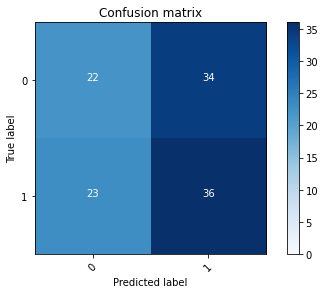

2022-08-22 18:02:28 - [Epoch Train: 39] loss: 0.3428, auc: 0.9392, acc: 0.8607, time: 24.00 s            
2022-08-22 18:02:28 - [Epoch Valid: 39] loss: 1.0290, auc: 0.4891, acc: 0.5040, time: 6.00 s


 39%|████████████████▍                         | 39/100 [20:27<31:51, 31.33s/it]

2022-08-22 18:02:28 - EPOCH: 40
2022-08-22 18:02:28 - Train Step 10/481, train_loss: 0.3780
2022-08-22 18:02:29 - Train Step 20/481, train_loss: 0.3107
2022-08-22 18:02:30 - Train Step 30/481, train_loss: 0.3567
2022-08-22 18:02:30 - Train Step 40/481, train_loss: 0.3181
2022-08-22 18:02:31 - Train Step 50/481, train_loss: 0.3125
2022-08-22 18:02:31 - Train Step 60/481, train_loss: 0.3216
2022-08-22 18:02:32 - Train Step 70/481, train_loss: 0.3033
2022-08-22 18:02:32 - Train Step 80/481, train_loss: 0.3091
2022-08-22 18:02:33 - Train Step 90/481, train_loss: 0.3011
2022-08-22 18:02:33 - Train Step 100/481, train_loss: 0.2946
2022-08-22 18:02:34 - Train Step 110/481, train_loss: 0.2975
2022-08-22 18:02:34 - Train Step 120/481, train_loss: 0.2937
2022-08-22 18:02:35 - Train Step 130/481, train_loss: 0.2905
2022-08-22 18:02:35 - Train Step 140/481, train_loss: 0.2970
2022-08-22 18:02:36 - Train Step 150/481, train_loss: 0.3077
2022-08-22 18:02:36 - Train Step 160/481, train_loss: 0.3110
2

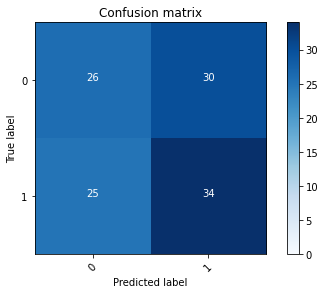

2022-08-22 18:02:59 - [Epoch Train: 40] loss: 0.3320, auc: 0.9474, acc: 0.8836, time: 24.00 s            
2022-08-22 18:02:59 - [Epoch Valid: 40] loss: 1.0136, auc: 0.4897, acc: 0.5280, time: 6.00 s


 40%|████████████████▊                         | 40/100 [20:59<31:20, 31.35s/it]

2022-08-22 18:02:59 - EPOCH: 41
2022-08-22 18:03:00 - Train Step 10/481, train_loss: 0.3676
2022-08-22 18:03:00 - Train Step 20/481, train_loss: 0.3134
2022-08-22 18:03:01 - Train Step 30/481, train_loss: 0.3714
2022-08-22 18:03:01 - Train Step 40/481, train_loss: 0.3433
2022-08-22 18:03:02 - Train Step 50/481, train_loss: 0.3370
2022-08-22 18:03:02 - Train Step 60/481, train_loss: 0.3326
2022-08-22 18:03:03 - Train Step 70/481, train_loss: 0.3226
2022-08-22 18:03:03 - Train Step 80/481, train_loss: 0.3646
2022-08-22 18:03:04 - Train Step 90/481, train_loss: 0.3633
2022-08-22 18:03:04 - Train Step 100/481, train_loss: 0.3527
2022-08-22 18:03:05 - Train Step 110/481, train_loss: 0.3565
2022-08-22 18:03:05 - Train Step 120/481, train_loss: 0.3461
2022-08-22 18:03:06 - Train Step 130/481, train_loss: 0.3420
2022-08-22 18:03:07 - Train Step 140/481, train_loss: 0.3387
2022-08-22 18:03:07 - Train Step 150/481, train_loss: 0.3360
2022-08-22 18:03:08 - Train Step 160/481, train_loss: 0.3346
2

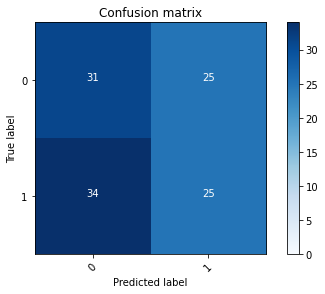

2022-08-22 18:03:31 - [Epoch Train: 41] loss: 0.3237, auc: 0.9465, acc: 0.8857, time: 24.00 s            
2022-08-22 18:03:31 - [Epoch Valid: 41] loss: 1.0422, auc: 0.4900, acc: 0.4960, time: 6.00 s


 41%|█████████████████▏                        | 41/100 [21:30<30:54, 31.42s/it]

2022-08-22 18:03:31 - EPOCH: 42
2022-08-22 18:03:31 - Train Step 10/481, train_loss: 0.4602
2022-08-22 18:03:32 - Train Step 20/481, train_loss: 0.3549
2022-08-22 18:03:32 - Train Step 30/481, train_loss: 0.3365
2022-08-22 18:03:33 - Train Step 40/481, train_loss: 0.2915
2022-08-22 18:03:33 - Train Step 50/481, train_loss: 0.2929
2022-08-22 18:03:34 - Train Step 60/481, train_loss: 0.2952
2022-08-22 18:03:34 - Train Step 70/481, train_loss: 0.3047
2022-08-22 18:03:35 - Train Step 80/481, train_loss: 0.3260
2022-08-22 18:03:35 - Train Step 90/481, train_loss: 0.3135
2022-08-22 18:03:36 - Train Step 100/481, train_loss: 0.3003
2022-08-22 18:03:36 - Train Step 110/481, train_loss: 0.2938
2022-08-22 18:03:37 - Train Step 120/481, train_loss: 0.2915
2022-08-22 18:03:38 - Train Step 130/481, train_loss: 0.2831
2022-08-22 18:03:38 - Train Step 140/481, train_loss: 0.2781
2022-08-22 18:03:39 - Train Step 150/481, train_loss: 0.2967
2022-08-22 18:03:39 - Train Step 160/481, train_loss: 0.2921
2

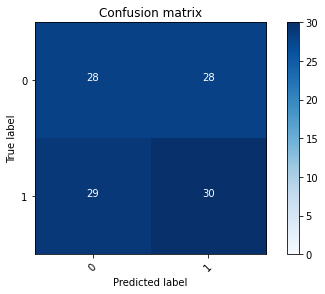

2022-08-22 18:04:02 - [Epoch Train: 42] loss: 0.3086, auc: 0.9558, acc: 0.8940, time: 24.00 s            
2022-08-22 18:04:02 - [Epoch Valid: 42] loss: 1.0454, auc: 0.4846, acc: 0.5120, time: 6.00 s


 42%|█████████████████▋                        | 42/100 [22:01<30:20, 31.38s/it]

2022-08-22 18:04:02 - EPOCH: 43
2022-08-22 18:04:03 - Train Step 10/481, train_loss: 0.2638
2022-08-22 18:04:03 - Train Step 20/481, train_loss: 0.3400
2022-08-22 18:04:04 - Train Step 30/481, train_loss: 0.3238
2022-08-22 18:04:04 - Train Step 40/481, train_loss: 0.3310
2022-08-22 18:04:05 - Train Step 50/481, train_loss: 0.3358
2022-08-22 18:04:05 - Train Step 60/481, train_loss: 0.3305
2022-08-22 18:04:06 - Train Step 70/481, train_loss: 0.3126
2022-08-22 18:04:06 - Train Step 80/481, train_loss: 0.3137
2022-08-22 18:04:07 - Train Step 90/481, train_loss: 0.2927
2022-08-22 18:04:07 - Train Step 100/481, train_loss: 0.2813
2022-08-22 18:04:08 - Train Step 110/481, train_loss: 0.2875
2022-08-22 18:04:08 - Train Step 120/481, train_loss: 0.2922
2022-08-22 18:04:09 - Train Step 130/481, train_loss: 0.3001
2022-08-22 18:04:09 - Train Step 140/481, train_loss: 0.3007
2022-08-22 18:04:10 - Train Step 150/481, train_loss: 0.3018
2022-08-22 18:04:10 - Train Step 160/481, train_loss: 0.2960
2

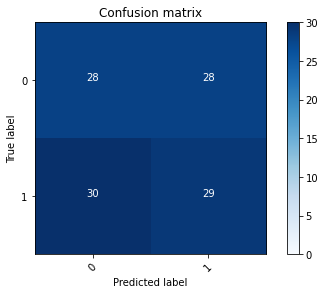

2022-08-22 18:04:34 - [Epoch Train: 43] loss: 0.3058, auc: 0.9555, acc: 0.8898, time: 24.00 s            
2022-08-22 18:04:34 - [Epoch Valid: 43] loss: 1.0734, auc: 0.4861, acc: 0.5040, time: 6.00 s


 43%|██████████████████                        | 43/100 [22:33<29:52, 31.44s/it]

2022-08-22 18:04:34 - EPOCH: 44
2022-08-22 18:04:34 - Train Step 10/481, train_loss: 0.3674
2022-08-22 18:04:35 - Train Step 20/481, train_loss: 0.4568
2022-08-22 18:04:35 - Train Step 30/481, train_loss: 0.4198
2022-08-22 18:04:36 - Train Step 40/481, train_loss: 0.4073
2022-08-22 18:04:36 - Train Step 50/481, train_loss: 0.3755
2022-08-22 18:04:37 - Train Step 60/481, train_loss: 0.3607
2022-08-22 18:04:37 - Train Step 70/481, train_loss: 0.3668
2022-08-22 18:04:38 - Train Step 80/481, train_loss: 0.3534
2022-08-22 18:04:38 - Train Step 90/481, train_loss: 0.3428
2022-08-22 18:04:39 - Train Step 100/481, train_loss: 0.3491
2022-08-22 18:04:39 - Train Step 110/481, train_loss: 0.3426
2022-08-22 18:04:40 - Train Step 120/481, train_loss: 0.3467
2022-08-22 18:04:40 - Train Step 130/481, train_loss: 0.3407
2022-08-22 18:04:41 - Train Step 140/481, train_loss: 0.3334
2022-08-22 18:04:41 - Train Step 150/481, train_loss: 0.3239
2022-08-22 18:04:42 - Train Step 160/481, train_loss: 0.3202
2

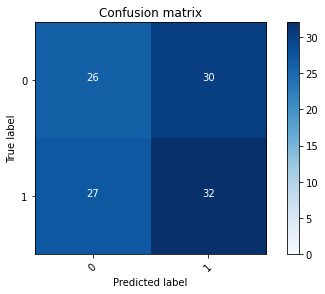

2022-08-22 18:05:05 - [Epoch Train: 44] loss: 0.2932, auc: 0.9585, acc: 0.8960, time: 24.00 s            
2022-08-22 18:05:05 - [Epoch Valid: 44] loss: 1.0486, auc: 0.4900, acc: 0.5120, time: 6.00 s


 44%|██████████████████▍                       | 44/100 [23:04<29:17, 31.39s/it]

2022-08-22 18:05:05 - EPOCH: 45
2022-08-22 18:05:06 - Train Step 10/481, train_loss: 0.2424
2022-08-22 18:05:06 - Train Step 20/481, train_loss: 0.2241
2022-08-22 18:05:07 - Train Step 30/481, train_loss: 0.2522
2022-08-22 18:05:07 - Train Step 40/481, train_loss: 0.2350
2022-08-22 18:05:08 - Train Step 50/481, train_loss: 0.2210
2022-08-22 18:05:08 - Train Step 60/481, train_loss: 0.2430
2022-08-22 18:05:09 - Train Step 70/481, train_loss: 0.2432
2022-08-22 18:05:09 - Train Step 80/481, train_loss: 0.2622
2022-08-22 18:05:10 - Train Step 90/481, train_loss: 0.2700
2022-08-22 18:05:10 - Train Step 100/481, train_loss: 0.2713
2022-08-22 18:05:11 - Train Step 110/481, train_loss: 0.2905
2022-08-22 18:05:11 - Train Step 120/481, train_loss: 0.2893
2022-08-22 18:05:12 - Train Step 130/481, train_loss: 0.2900
2022-08-22 18:05:12 - Train Step 140/481, train_loss: 0.2988
2022-08-22 18:05:13 - Train Step 150/481, train_loss: 0.2941
2022-08-22 18:05:13 - Train Step 160/481, train_loss: 0.2896
2

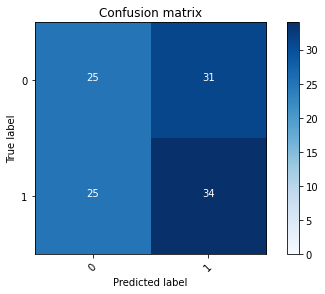

2022-08-22 18:05:36 - [Epoch Train: 45] loss: 0.2894, auc: 0.9606, acc: 0.8877, time: 24.00 s            
2022-08-22 18:05:36 - [Epoch Valid: 45] loss: 1.1461, auc: 0.4882, acc: 0.5200, time: 6.00 s


 45%|██████████████████▉                       | 45/100 [23:35<28:42, 31.31s/it]

2022-08-22 18:05:36 - EPOCH: 46
2022-08-22 18:05:37 - Train Step 10/481, train_loss: 0.3694
2022-08-22 18:05:37 - Train Step 20/481, train_loss: 0.3653
2022-08-22 18:05:38 - Train Step 30/481, train_loss: 0.3249
2022-08-22 18:05:38 - Train Step 40/481, train_loss: 0.2997
2022-08-22 18:05:39 - Train Step 50/481, train_loss: 0.2970
2022-08-22 18:05:39 - Train Step 60/481, train_loss: 0.3189
2022-08-22 18:05:40 - Train Step 70/481, train_loss: 0.3158
2022-08-22 18:05:40 - Train Step 80/481, train_loss: 0.3151
2022-08-22 18:05:41 - Train Step 90/481, train_loss: 0.3035
2022-08-22 18:05:41 - Train Step 100/481, train_loss: 0.3019
2022-08-22 18:05:42 - Train Step 110/481, train_loss: 0.3174
2022-08-22 18:05:42 - Train Step 120/481, train_loss: 0.3192
2022-08-22 18:05:43 - Train Step 130/481, train_loss: 0.3106
2022-08-22 18:05:43 - Train Step 140/481, train_loss: 0.2969
2022-08-22 18:05:44 - Train Step 150/481, train_loss: 0.3046
2022-08-22 18:05:44 - Train Step 160/481, train_loss: 0.3074
2

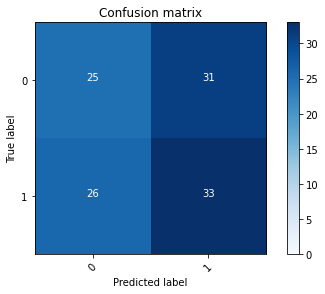

2022-08-22 18:06:08 - [Epoch Train: 46] loss: 0.2775, auc: 0.9652, acc: 0.9168, time: 25.00 s            
2022-08-22 18:06:08 - [Epoch Valid: 46] loss: 1.1143, auc: 0.4879, acc: 0.5120, time: 6.00 s


 46%|███████████████████▎                      | 46/100 [24:07<28:19, 31.48s/it]

2022-08-22 18:06:08 - EPOCH: 47
2022-08-22 18:06:09 - Train Step 10/481, train_loss: 0.3944
2022-08-22 18:06:09 - Train Step 20/481, train_loss: 0.3038
2022-08-22 18:06:10 - Train Step 30/481, train_loss: 0.2965
2022-08-22 18:06:10 - Train Step 40/481, train_loss: 0.2796
2022-08-22 18:06:11 - Train Step 50/481, train_loss: 0.2683
2022-08-22 18:06:11 - Train Step 60/481, train_loss: 0.2630
2022-08-22 18:06:12 - Train Step 70/481, train_loss: 0.2536
2022-08-22 18:06:12 - Train Step 80/481, train_loss: 0.2437
2022-08-22 18:06:13 - Train Step 90/481, train_loss: 0.2416
2022-08-22 18:06:13 - Train Step 100/481, train_loss: 0.2426
2022-08-22 18:06:14 - Train Step 110/481, train_loss: 0.2401
2022-08-22 18:06:14 - Train Step 120/481, train_loss: 0.2386
2022-08-22 18:06:15 - Train Step 130/481, train_loss: 0.2397
2022-08-22 18:06:15 - Train Step 140/481, train_loss: 0.2376
2022-08-22 18:06:16 - Train Step 150/481, train_loss: 0.2461
2022-08-22 18:06:16 - Train Step 160/481, train_loss: 0.2451
2

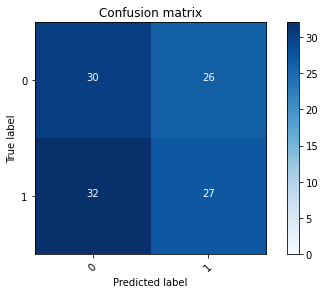

2022-08-22 18:06:39 - [Epoch Train: 47] loss: 0.2735, auc: 0.9621, acc: 0.8898, time: 24.00 s            
2022-08-22 18:06:39 - [Epoch Valid: 47] loss: 1.1951, auc: 0.4897, acc: 0.5120, time: 6.00 s


 47%|███████████████████▋                      | 47/100 [24:39<27:49, 31.51s/it]

2022-08-22 18:06:39 - EPOCH: 48
2022-08-22 18:06:40 - Train Step 10/481, train_loss: 0.2190
2022-08-22 18:06:41 - Train Step 20/481, train_loss: 0.2307
2022-08-22 18:06:41 - Train Step 30/481, train_loss: 0.2307
2022-08-22 18:06:42 - Train Step 40/481, train_loss: 0.2204
2022-08-22 18:06:42 - Train Step 50/481, train_loss: 0.2448
2022-08-22 18:06:43 - Train Step 60/481, train_loss: 0.2688
2022-08-22 18:06:43 - Train Step 70/481, train_loss: 0.2540
2022-08-22 18:06:44 - Train Step 80/481, train_loss: 0.2457
2022-08-22 18:06:44 - Train Step 90/481, train_loss: 0.2608
2022-08-22 18:06:45 - Train Step 100/481, train_loss: 0.2725
2022-08-22 18:06:45 - Train Step 110/481, train_loss: 0.2667
2022-08-22 18:06:46 - Train Step 120/481, train_loss: 0.2796
2022-08-22 18:06:46 - Train Step 130/481, train_loss: 0.2786
2022-08-22 18:06:47 - Train Step 140/481, train_loss: 0.2864
2022-08-22 18:06:47 - Train Step 150/481, train_loss: 0.2859
2022-08-22 18:06:48 - Train Step 160/481, train_loss: 0.2838
2

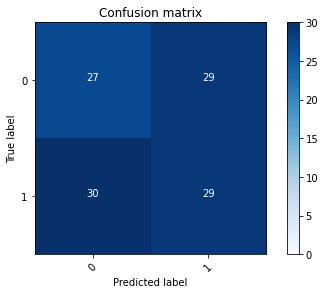

2022-08-22 18:07:11 - [Epoch Train: 48] loss: 0.2573, auc: 0.9729, acc: 0.9127, time: 24.00 s            
2022-08-22 18:07:11 - [Epoch Valid: 48] loss: 1.1446, auc: 0.4939, acc: 0.4960, time: 6.00 s


 48%|████████████████████▏                     | 48/100 [25:10<27:17, 31.49s/it]

2022-08-22 18:07:11 - EPOCH: 49
2022-08-22 18:07:12 - Train Step 10/481, train_loss: 0.1862
2022-08-22 18:07:12 - Train Step 20/481, train_loss: 0.2642
2022-08-22 18:07:13 - Train Step 30/481, train_loss: 0.3366
2022-08-22 18:07:13 - Train Step 40/481, train_loss: 0.3238
2022-08-22 18:07:14 - Train Step 50/481, train_loss: 0.2970
2022-08-22 18:07:14 - Train Step 60/481, train_loss: 0.2785
2022-08-22 18:07:15 - Train Step 70/481, train_loss: 0.2742
2022-08-22 18:07:15 - Train Step 80/481, train_loss: 0.2555
2022-08-22 18:07:16 - Train Step 90/481, train_loss: 0.2469
2022-08-22 18:07:16 - Train Step 100/481, train_loss: 0.2472
2022-08-22 18:07:17 - Train Step 110/481, train_loss: 0.2607
2022-08-22 18:07:17 - Train Step 120/481, train_loss: 0.2650
2022-08-22 18:07:18 - Train Step 130/481, train_loss: 0.2743
2022-08-22 18:07:18 - Train Step 140/481, train_loss: 0.2845
2022-08-22 18:07:19 - Train Step 150/481, train_loss: 0.2782
2022-08-22 18:07:19 - Train Step 160/481, train_loss: 0.2734
2

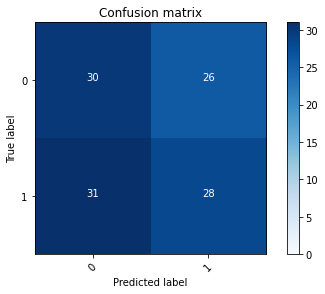

2022-08-22 18:07:43 - [Epoch Train: 49] loss: 0.2545, auc: 0.9711, acc: 0.9044, time: 24.00 s            
2022-08-22 18:07:43 - [Epoch Valid: 49] loss: 1.1550, auc: 0.4955, acc: 0.5200, time: 6.00 s


 49%|████████████████████▌                     | 49/100 [25:42<26:47, 31.51s/it]

2022-08-22 18:07:43 - EPOCH: 50
2022-08-22 18:07:43 - Train Step 10/481, train_loss: 0.0761
2022-08-22 18:07:44 - Train Step 20/481, train_loss: 0.1332
2022-08-22 18:07:44 - Train Step 30/481, train_loss: 0.1671
2022-08-22 18:07:45 - Train Step 40/481, train_loss: 0.1859
2022-08-22 18:07:45 - Train Step 50/481, train_loss: 0.2056
2022-08-22 18:07:46 - Train Step 60/481, train_loss: 0.2185
2022-08-22 18:07:46 - Train Step 70/481, train_loss: 0.2036
2022-08-22 18:07:47 - Train Step 80/481, train_loss: 0.1933
2022-08-22 18:07:47 - Train Step 90/481, train_loss: 0.2191
2022-08-22 18:07:48 - Train Step 100/481, train_loss: 0.2287
2022-08-22 18:07:48 - Train Step 110/481, train_loss: 0.2280
2022-08-22 18:07:49 - Train Step 120/481, train_loss: 0.2201
2022-08-22 18:07:49 - Train Step 130/481, train_loss: 0.2246
2022-08-22 18:07:50 - Train Step 140/481, train_loss: 0.2232
2022-08-22 18:07:50 - Train Step 150/481, train_loss: 0.2187
2022-08-22 18:07:51 - Train Step 160/481, train_loss: 0.2234
2

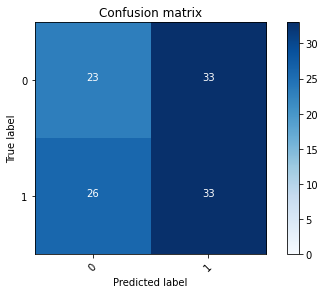

2022-08-22 18:08:14 - [Epoch Train: 50] loss: 0.2280, auc: 0.9816, acc: 0.9335, time: 24.00 s            
2022-08-22 18:08:14 - [Epoch Valid: 50] loss: 1.3245, auc: 0.4915, acc: 0.4880, time: 6.00 s


 50%|█████████████████████                     | 50/100 [26:14<26:18, 31.57s/it]

2022-08-22 18:08:14 - EPOCH: 51
2022-08-22 18:08:15 - Train Step 10/481, train_loss: 0.2541
2022-08-22 18:08:15 - Train Step 20/481, train_loss: 0.2106
2022-08-22 18:08:16 - Train Step 30/481, train_loss: 0.1968
2022-08-22 18:08:16 - Train Step 40/481, train_loss: 0.1879
2022-08-22 18:08:17 - Train Step 50/481, train_loss: 0.2551
2022-08-22 18:08:17 - Train Step 60/481, train_loss: 0.2466
2022-08-22 18:08:18 - Train Step 70/481, train_loss: 0.2604
2022-08-22 18:08:18 - Train Step 80/481, train_loss: 0.2407
2022-08-22 18:08:19 - Train Step 90/481, train_loss: 0.2262
2022-08-22 18:08:19 - Train Step 100/481, train_loss: 0.2207
2022-08-22 18:08:20 - Train Step 110/481, train_loss: 0.2163
2022-08-22 18:08:20 - Train Step 120/481, train_loss: 0.2139
2022-08-22 18:08:21 - Train Step 130/481, train_loss: 0.2202
2022-08-22 18:08:21 - Train Step 140/481, train_loss: 0.2152
2022-08-22 18:08:22 - Train Step 150/481, train_loss: 0.2204
2022-08-22 18:08:22 - Train Step 160/481, train_loss: 0.2231
2

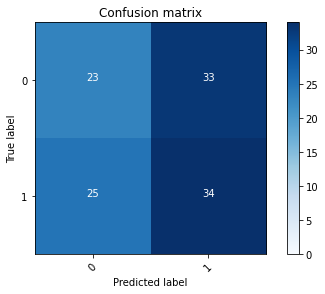

2022-08-22 18:08:45 - [Epoch Train: 51] loss: 0.2291, auc: 0.9781, acc: 0.9272, time: 24.00 s            
2022-08-22 18:08:45 - [Epoch Valid: 51] loss: 1.1778, auc: 0.4933, acc: 0.4960, time: 6.00 s


 51%|█████████████████████▍                    | 51/100 [26:45<25:41, 31.46s/it]

2022-08-22 18:08:45 - EPOCH: 52
2022-08-22 18:08:46 - Train Step 10/481, train_loss: 0.1069
2022-08-22 18:08:47 - Train Step 20/481, train_loss: 0.2544
2022-08-22 18:08:47 - Train Step 30/481, train_loss: 0.2620
2022-08-22 18:08:48 - Train Step 40/481, train_loss: 0.2112
2022-08-22 18:08:48 - Train Step 50/481, train_loss: 0.2098
2022-08-22 18:08:49 - Train Step 60/481, train_loss: 0.2042
2022-08-22 18:08:49 - Train Step 70/481, train_loss: 0.1978
2022-08-22 18:08:50 - Train Step 80/481, train_loss: 0.1907
2022-08-22 18:08:50 - Train Step 90/481, train_loss: 0.1938
2022-08-22 18:08:51 - Train Step 100/481, train_loss: 0.1923
2022-08-22 18:08:51 - Train Step 110/481, train_loss: 0.1880
2022-08-22 18:08:52 - Train Step 120/481, train_loss: 0.2002
2022-08-22 18:08:52 - Train Step 130/481, train_loss: 0.1960
2022-08-22 18:08:53 - Train Step 140/481, train_loss: 0.2026
2022-08-22 18:08:53 - Train Step 150/481, train_loss: 0.1989
2022-08-22 18:08:54 - Train Step 160/481, train_loss: 0.1988
2

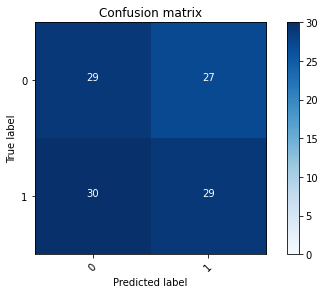

2022-08-22 18:09:17 - [Epoch Train: 52] loss: 0.2084, auc: 0.9864, acc: 0.9356, time: 24.00 s            
2022-08-22 18:09:17 - [Epoch Valid: 52] loss: 1.2254, auc: 0.4942, acc: 0.5200, time: 6.00 s


 52%|█████████████████████▊                    | 52/100 [27:16<25:10, 31.46s/it]

2022-08-22 18:09:17 - EPOCH: 53
2022-08-22 18:09:18 - Train Step 10/481, train_loss: 0.0795
2022-08-22 18:09:18 - Train Step 20/481, train_loss: 0.0875
2022-08-22 18:09:19 - Train Step 30/481, train_loss: 0.1126
2022-08-22 18:09:19 - Train Step 40/481, train_loss: 0.1470
2022-08-22 18:09:20 - Train Step 50/481, train_loss: 0.1376
2022-08-22 18:09:20 - Train Step 60/481, train_loss: 0.1413
2022-08-22 18:09:21 - Train Step 70/481, train_loss: 0.1420
2022-08-22 18:09:21 - Train Step 80/481, train_loss: 0.1537
2022-08-22 18:09:22 - Train Step 90/481, train_loss: 0.1973
2022-08-22 18:09:22 - Train Step 100/481, train_loss: 0.1996
2022-08-22 18:09:23 - Train Step 110/481, train_loss: 0.1992
2022-08-22 18:09:23 - Train Step 120/481, train_loss: 0.1909
2022-08-22 18:09:24 - Train Step 130/481, train_loss: 0.1857
2022-08-22 18:09:24 - Train Step 140/481, train_loss: 0.1872
2022-08-22 18:09:25 - Train Step 150/481, train_loss: 0.1884
2022-08-22 18:09:25 - Train Step 160/481, train_loss: 0.1870
2

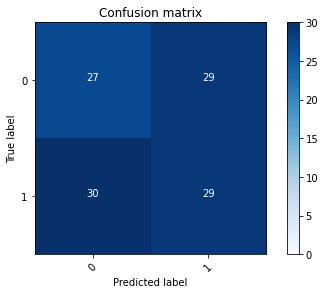

2022-08-22 18:09:48 - [Epoch Train: 53] loss: 0.2121, auc: 0.9804, acc: 0.9189, time: 24.00 s            
2022-08-22 18:09:48 - [Epoch Valid: 53] loss: 1.2827, auc: 0.4961, acc: 0.5040, time: 6.00 s


 53%|██████████████████████▎                   | 53/100 [27:48<24:40, 31.49s/it]

2022-08-22 18:09:48 - EPOCH: 54
2022-08-22 18:09:49 - Train Step 10/481, train_loss: 0.2350
2022-08-22 18:09:50 - Train Step 20/481, train_loss: 0.1975
2022-08-22 18:09:50 - Train Step 30/481, train_loss: 0.1584
2022-08-22 18:09:51 - Train Step 40/481, train_loss: 0.1802
2022-08-22 18:09:51 - Train Step 50/481, train_loss: 0.1827
2022-08-22 18:09:52 - Train Step 60/481, train_loss: 0.1835
2022-08-22 18:09:52 - Train Step 70/481, train_loss: 0.1931
2022-08-22 18:09:53 - Train Step 80/481, train_loss: 0.1940
2022-08-22 18:09:53 - Train Step 90/481, train_loss: 0.1830
2022-08-22 18:09:54 - Train Step 100/481, train_loss: 0.1792
2022-08-22 18:09:54 - Train Step 110/481, train_loss: 0.1859
2022-08-22 18:09:55 - Train Step 120/481, train_loss: 0.1891
2022-08-22 18:09:55 - Train Step 130/481, train_loss: 0.1977
2022-08-22 18:09:56 - Train Step 140/481, train_loss: 0.2160
2022-08-22 18:09:56 - Train Step 150/481, train_loss: 0.2073
2022-08-22 18:09:57 - Train Step 160/481, train_loss: 0.2017
2

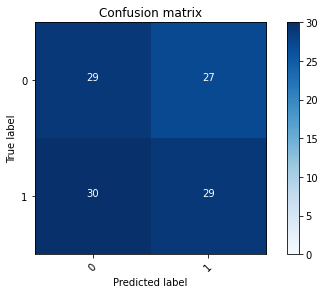

2022-08-22 18:10:20 - [Epoch Train: 54] loss: 0.1937, auc: 0.9854, acc: 0.9522, time: 24.00 s            
2022-08-22 18:10:20 - [Epoch Valid: 54] loss: 1.3325, auc: 0.4958, acc: 0.5200, time: 6.00 s


 54%|██████████████████████▋                   | 54/100 [28:19<24:08, 31.50s/it]

2022-08-22 18:10:20 - EPOCH: 55
2022-08-22 18:10:21 - Train Step 10/481, train_loss: 0.2102
2022-08-22 18:10:21 - Train Step 20/481, train_loss: 0.1984
2022-08-22 18:10:22 - Train Step 30/481, train_loss: 0.1661
2022-08-22 18:10:22 - Train Step 40/481, train_loss: 0.1534
2022-08-22 18:10:23 - Train Step 50/481, train_loss: 0.1600
2022-08-22 18:10:23 - Train Step 60/481, train_loss: 0.1705
2022-08-22 18:10:24 - Train Step 70/481, train_loss: 0.1827
2022-08-22 18:10:24 - Train Step 80/481, train_loss: 0.1902
2022-08-22 18:10:25 - Train Step 90/481, train_loss: 0.1758
2022-08-22 18:10:25 - Train Step 100/481, train_loss: 0.1819
2022-08-22 18:10:26 - Train Step 110/481, train_loss: 0.1839
2022-08-22 18:10:26 - Train Step 120/481, train_loss: 0.1889
2022-08-22 18:10:27 - Train Step 130/481, train_loss: 0.1932
2022-08-22 18:10:27 - Train Step 140/481, train_loss: 0.1847
2022-08-22 18:10:28 - Train Step 150/481, train_loss: 0.1782
2022-08-22 18:10:28 - Train Step 160/481, train_loss: 0.1807
2

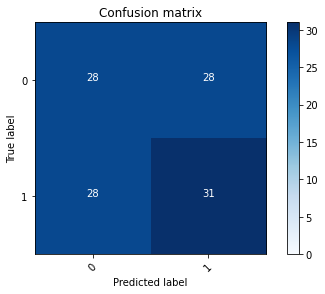

2022-08-22 18:10:52 - [Epoch Train: 55] loss: 0.1821, auc: 0.9905, acc: 0.9459, time: 25.00 s            
2022-08-22 18:10:52 - [Epoch Valid: 55] loss: 1.3800, auc: 0.4949, acc: 0.5280, time: 6.00 s


 55%|███████████████████████                   | 55/100 [28:51<23:40, 31.56s/it]

2022-08-22 18:10:52 - EPOCH: 56
2022-08-22 18:10:52 - Train Step 10/481, train_loss: 0.1134
2022-08-22 18:10:53 - Train Step 20/481, train_loss: 0.0912
2022-08-22 18:10:53 - Train Step 30/481, train_loss: 0.1538
2022-08-22 18:10:54 - Train Step 40/481, train_loss: 0.1501
2022-08-22 18:10:54 - Train Step 50/481, train_loss: 0.1670
2022-08-22 18:10:55 - Train Step 60/481, train_loss: 0.1655
2022-08-22 18:10:55 - Train Step 70/481, train_loss: 0.1870
2022-08-22 18:10:56 - Train Step 80/481, train_loss: 0.1879
2022-08-22 18:10:56 - Train Step 90/481, train_loss: 0.1825
2022-08-22 18:10:57 - Train Step 100/481, train_loss: 0.1812
2022-08-22 18:10:57 - Train Step 110/481, train_loss: 0.1746
2022-08-22 18:10:58 - Train Step 120/481, train_loss: 0.1741
2022-08-22 18:10:59 - Train Step 130/481, train_loss: 0.1768
2022-08-22 18:10:59 - Train Step 140/481, train_loss: 0.1840
2022-08-22 18:11:00 - Train Step 150/481, train_loss: 0.1827
2022-08-22 18:11:00 - Train Step 160/481, train_loss: 0.1866
2

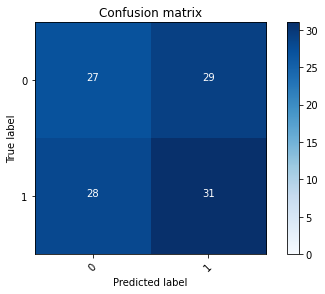

2022-08-22 18:11:23 - [Epoch Train: 56] loss: 0.1801, auc: 0.9879, acc: 0.9501, time: 24.00 s            
2022-08-22 18:11:23 - [Epoch Valid: 56] loss: 1.2581, auc: 0.5012, acc: 0.5200, time: 6.00 s


 56%|███████████████████████▌                  | 56/100 [29:22<23:04, 31.47s/it]

2022-08-22 18:11:23 - EPOCH: 57
2022-08-22 18:11:24 - Train Step 10/481, train_loss: 0.2513
2022-08-22 18:11:24 - Train Step 20/481, train_loss: 0.2183
2022-08-22 18:11:25 - Train Step 30/481, train_loss: 0.1912
2022-08-22 18:11:25 - Train Step 40/481, train_loss: 0.1824
2022-08-22 18:11:26 - Train Step 50/481, train_loss: 0.1714
2022-08-22 18:11:26 - Train Step 60/481, train_loss: 0.1737
2022-08-22 18:11:27 - Train Step 70/481, train_loss: 0.1685
2022-08-22 18:11:27 - Train Step 80/481, train_loss: 0.1684
2022-08-22 18:11:28 - Train Step 90/481, train_loss: 0.1565
2022-08-22 18:11:28 - Train Step 100/481, train_loss: 0.1596
2022-08-22 18:11:29 - Train Step 110/481, train_loss: 0.1757
2022-08-22 18:11:29 - Train Step 120/481, train_loss: 0.1670
2022-08-22 18:11:30 - Train Step 130/481, train_loss: 0.1743
2022-08-22 18:11:30 - Train Step 140/481, train_loss: 0.1967
2022-08-22 18:11:31 - Train Step 150/481, train_loss: 0.1973
2022-08-22 18:11:31 - Train Step 160/481, train_loss: 0.1965
2

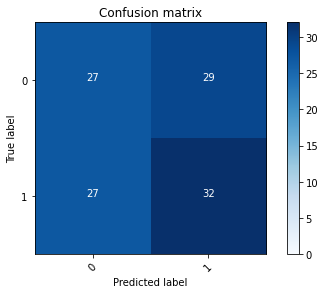

2022-08-22 18:11:54 - [Epoch Train: 57] loss: 0.1902, auc: 0.9852, acc: 0.9439, time: 24.00 s            
2022-08-22 18:11:54 - [Epoch Valid: 57] loss: 1.3597, auc: 0.5003, acc: 0.5280, time: 6.00 s


 57%|███████████████████████▉                  | 57/100 [29:54<22:33, 31.47s/it]

2022-08-22 18:11:54 - EPOCH: 58
2022-08-22 18:11:55 - Train Step 10/481, train_loss: 0.2987
2022-08-22 18:11:56 - Train Step 20/481, train_loss: 0.2076
2022-08-22 18:11:56 - Train Step 30/481, train_loss: 0.2138
2022-08-22 18:11:57 - Train Step 40/481, train_loss: 0.2011
2022-08-22 18:11:57 - Train Step 50/481, train_loss: 0.2079
2022-08-22 18:11:58 - Train Step 60/481, train_loss: 0.1967
2022-08-22 18:11:58 - Train Step 70/481, train_loss: 0.1893
2022-08-22 18:11:59 - Train Step 80/481, train_loss: 0.1842
2022-08-22 18:11:59 - Train Step 90/481, train_loss: 0.1846
2022-08-22 18:12:00 - Train Step 100/481, train_loss: 0.1753
2022-08-22 18:12:00 - Train Step 110/481, train_loss: 0.1639
2022-08-22 18:12:01 - Train Step 120/481, train_loss: 0.1614
2022-08-22 18:12:01 - Train Step 130/481, train_loss: 0.1728
2022-08-22 18:12:02 - Train Step 140/481, train_loss: 0.1811
2022-08-22 18:12:02 - Train Step 150/481, train_loss: 0.1767
2022-08-22 18:12:03 - Train Step 160/481, train_loss: 0.1720
2

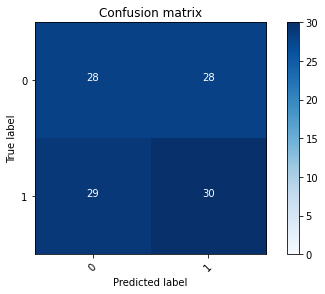

2022-08-22 18:12:26 - [Epoch Train: 58] loss: 0.1794, auc: 0.9873, acc: 0.9563, time: 24.00 s            
2022-08-22 18:12:26 - [Epoch Valid: 58] loss: 1.3680, auc: 0.5009, acc: 0.5200, time: 6.00 s


 58%|████████████████████████▎                 | 58/100 [30:25<22:00, 31.45s/it]

2022-08-22 18:12:26 - EPOCH: 59
2022-08-22 18:12:26 - Train Step 10/481, train_loss: 0.1961
2022-08-22 18:12:27 - Train Step 20/481, train_loss: 0.1799
2022-08-22 18:12:27 - Train Step 30/481, train_loss: 0.1791
2022-08-22 18:12:28 - Train Step 40/481, train_loss: 0.1603
2022-08-22 18:12:28 - Train Step 50/481, train_loss: 0.1795
2022-08-22 18:12:29 - Train Step 60/481, train_loss: 0.1636
2022-08-22 18:12:30 - Train Step 70/481, train_loss: 0.1609
2022-08-22 18:12:30 - Train Step 80/481, train_loss: 0.1704
2022-08-22 18:12:31 - Train Step 90/481, train_loss: 0.1706
2022-08-22 18:12:31 - Train Step 100/481, train_loss: 0.1685
2022-08-22 18:12:32 - Train Step 110/481, train_loss: 0.1648
2022-08-22 18:12:32 - Train Step 120/481, train_loss: 0.1690
2022-08-22 18:12:33 - Train Step 130/481, train_loss: 0.1694
2022-08-22 18:12:33 - Train Step 140/481, train_loss: 0.1671
2022-08-22 18:12:34 - Train Step 150/481, train_loss: 0.1613
2022-08-22 18:12:34 - Train Step 160/481, train_loss: 0.1563
2

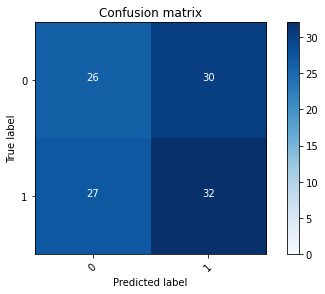

2022-08-22 18:12:57 - [Epoch Train: 59] loss: 0.1596, auc: 0.9922, acc: 0.9543, time: 25.00 s            
2022-08-22 18:12:57 - [Epoch Valid: 59] loss: 1.3322, auc: 0.4967, acc: 0.5200, time: 6.00 s


 59%|████████████████████████▊                 | 59/100 [30:57<21:32, 31.53s/it]

2022-08-22 18:12:57 - EPOCH: 60
2022-08-22 18:12:58 - Train Step 10/481, train_loss: 0.1717
2022-08-22 18:12:59 - Train Step 20/481, train_loss: 0.1732
2022-08-22 18:12:59 - Train Step 30/481, train_loss: 0.1330
2022-08-22 18:13:00 - Train Step 40/481, train_loss: 0.1175
2022-08-22 18:13:00 - Train Step 50/481, train_loss: 0.1337
2022-08-22 18:13:01 - Train Step 60/481, train_loss: 0.1330
2022-08-22 18:13:01 - Train Step 70/481, train_loss: 0.1397
2022-08-22 18:13:02 - Train Step 80/481, train_loss: 0.1534
2022-08-22 18:13:02 - Train Step 90/481, train_loss: 0.1434
2022-08-22 18:13:03 - Train Step 100/481, train_loss: 0.1401
2022-08-22 18:13:03 - Train Step 110/481, train_loss: 0.1417
2022-08-22 18:13:04 - Train Step 120/481, train_loss: 0.1351
2022-08-22 18:13:04 - Train Step 130/481, train_loss: 0.1424
2022-08-22 18:13:05 - Train Step 140/481, train_loss: 0.1464
2022-08-22 18:13:05 - Train Step 150/481, train_loss: 0.1415
2022-08-22 18:13:06 - Train Step 160/481, train_loss: 0.1405
2

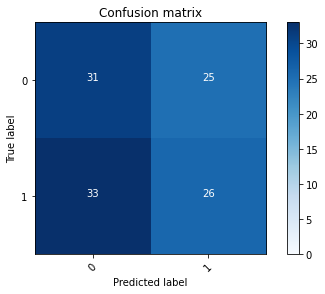

2022-08-22 18:13:29 - [Epoch Train: 60] loss: 0.1510, auc: 0.9937, acc: 0.9667, time: 24.00 s            
2022-08-22 18:13:29 - [Epoch Valid: 60] loss: 1.4754, auc: 0.4955, acc: 0.5120, time: 6.00 s


 60%|█████████████████████████▏                | 60/100 [31:28<20:58, 31.46s/it]

2022-08-22 18:13:29 - EPOCH: 61
2022-08-22 18:13:29 - Train Step 10/481, train_loss: 0.1000
2022-08-22 18:13:30 - Train Step 20/481, train_loss: 0.1674
2022-08-22 18:13:30 - Train Step 30/481, train_loss: 0.1541
2022-08-22 18:13:31 - Train Step 40/481, train_loss: 0.1457
2022-08-22 18:13:31 - Train Step 50/481, train_loss: 0.1310
2022-08-22 18:13:32 - Train Step 60/481, train_loss: 0.1240
2022-08-22 18:13:32 - Train Step 70/481, train_loss: 0.1282
2022-08-22 18:13:33 - Train Step 80/481, train_loss: 0.1245
2022-08-22 18:13:33 - Train Step 90/481, train_loss: 0.1334
2022-08-22 18:13:34 - Train Step 100/481, train_loss: 0.1272
2022-08-22 18:13:35 - Train Step 110/481, train_loss: 0.1427
2022-08-22 18:13:35 - Train Step 120/481, train_loss: 0.1462
2022-08-22 18:13:36 - Train Step 130/481, train_loss: 0.1468
2022-08-22 18:13:36 - Train Step 140/481, train_loss: 0.1413
2022-08-22 18:13:37 - Train Step 150/481, train_loss: 0.1429
2022-08-22 18:13:37 - Train Step 160/481, train_loss: 0.1474
2

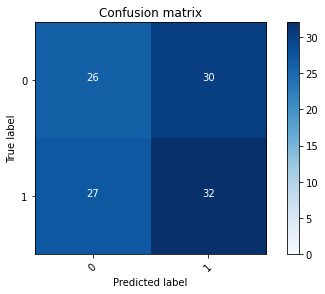

2022-08-22 18:14:00 - [Epoch Train: 61] loss: 0.1421, auc: 0.9952, acc: 0.9709, time: 24.00 s            
2022-08-22 18:14:00 - [Epoch Valid: 61] loss: 1.5402, auc: 0.4946, acc: 0.5200, time: 6.00 s


 61%|█████████████████████████▌                | 61/100 [31:59<20:24, 31.40s/it]

2022-08-22 18:14:00 - EPOCH: 62
2022-08-22 18:14:01 - Train Step 10/481, train_loss: 0.1887
2022-08-22 18:14:01 - Train Step 20/481, train_loss: 0.2147
2022-08-22 18:14:02 - Train Step 30/481, train_loss: 0.1535
2022-08-22 18:14:02 - Train Step 40/481, train_loss: 0.1394
2022-08-22 18:14:03 - Train Step 50/481, train_loss: 0.1339
2022-08-22 18:14:03 - Train Step 60/481, train_loss: 0.1351
2022-08-22 18:14:04 - Train Step 70/481, train_loss: 0.1382
2022-08-22 18:14:04 - Train Step 80/481, train_loss: 0.1310
2022-08-22 18:14:05 - Train Step 90/481, train_loss: 0.1433
2022-08-22 18:14:05 - Train Step 100/481, train_loss: 0.1362
2022-08-22 18:14:06 - Train Step 110/481, train_loss: 0.1270
2022-08-22 18:14:06 - Train Step 120/481, train_loss: 0.1395
2022-08-22 18:14:07 - Train Step 130/481, train_loss: 0.1378
2022-08-22 18:14:07 - Train Step 140/481, train_loss: 0.1480
2022-08-22 18:14:08 - Train Step 150/481, train_loss: 0.1464
2022-08-22 18:14:08 - Train Step 160/481, train_loss: 0.1422
2

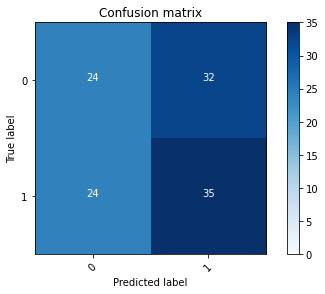

2022-08-22 18:14:31 - [Epoch Train: 62] loss: 0.1352, auc: 0.9966, acc: 0.9709, time: 24.00 s            
2022-08-22 18:14:31 - [Epoch Valid: 62] loss: 1.5399, auc: 0.4982, acc: 0.5200, time: 6.00 s


 62%|██████████████████████████                | 62/100 [32:31<19:50, 31.34s/it]

2022-08-22 18:14:31 - EPOCH: 63
2022-08-22 18:14:32 - Train Step 10/481, train_loss: 0.1005
2022-08-22 18:14:32 - Train Step 20/481, train_loss: 0.0925
2022-08-22 18:14:33 - Train Step 30/481, train_loss: 0.1218
2022-08-22 18:14:34 - Train Step 40/481, train_loss: 0.1017
2022-08-22 18:14:34 - Train Step 50/481, train_loss: 0.1046
2022-08-22 18:14:35 - Train Step 60/481, train_loss: 0.1238
2022-08-22 18:14:35 - Train Step 70/481, train_loss: 0.1129
2022-08-22 18:14:36 - Train Step 80/481, train_loss: 0.1214
2022-08-22 18:14:36 - Train Step 90/481, train_loss: 0.1201
2022-08-22 18:14:37 - Train Step 100/481, train_loss: 0.1305
2022-08-22 18:14:37 - Train Step 110/481, train_loss: 0.1220
2022-08-22 18:14:38 - Train Step 120/481, train_loss: 0.1268
2022-08-22 18:14:38 - Train Step 130/481, train_loss: 0.1251
2022-08-22 18:14:39 - Train Step 140/481, train_loss: 0.1219
2022-08-22 18:14:39 - Train Step 150/481, train_loss: 0.1193
2022-08-22 18:14:40 - Train Step 160/481, train_loss: 0.1192
2

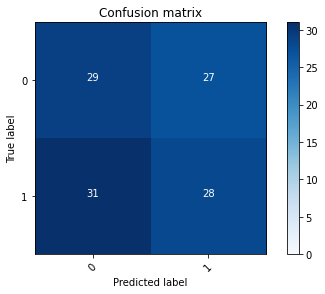

2022-08-22 18:15:03 - [Epoch Train: 63] loss: 0.1288, auc: 0.9967, acc: 0.9709, time: 24.00 s            
2022-08-22 18:15:03 - [Epoch Valid: 63] loss: 1.5284, auc: 0.4979, acc: 0.5120, time: 6.00 s


 63%|██████████████████████████▍               | 63/100 [33:02<19:18, 31.32s/it]

2022-08-22 18:15:03 - EPOCH: 64
2022-08-22 18:15:03 - Train Step 10/481, train_loss: 0.0504
2022-08-22 18:15:04 - Train Step 20/481, train_loss: 0.1680
2022-08-22 18:15:04 - Train Step 30/481, train_loss: 0.1590
2022-08-22 18:15:05 - Train Step 40/481, train_loss: 0.1538
2022-08-22 18:15:05 - Train Step 50/481, train_loss: 0.1481
2022-08-22 18:15:06 - Train Step 60/481, train_loss: 0.1283
2022-08-22 18:15:06 - Train Step 70/481, train_loss: 0.1547
2022-08-22 18:15:07 - Train Step 80/481, train_loss: 0.1516
2022-08-22 18:15:07 - Train Step 90/481, train_loss: 0.1461
2022-08-22 18:15:08 - Train Step 100/481, train_loss: 0.1401
2022-08-22 18:15:08 - Train Step 110/481, train_loss: 0.1366
2022-08-22 18:15:09 - Train Step 120/481, train_loss: 0.1394
2022-08-22 18:15:09 - Train Step 130/481, train_loss: 0.1416
2022-08-22 18:15:10 - Train Step 140/481, train_loss: 0.1369
2022-08-22 18:15:10 - Train Step 150/481, train_loss: 0.1360
2022-08-22 18:15:11 - Train Step 160/481, train_loss: 0.1386
2

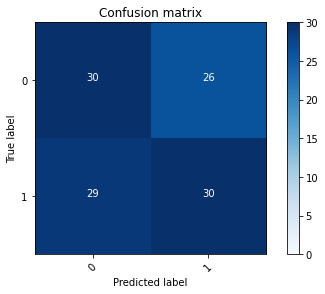

2022-08-22 18:15:34 - [Epoch Train: 64] loss: 0.1262, auc: 0.9960, acc: 0.9667, time: 24.00 s            
2022-08-22 18:15:34 - [Epoch Valid: 64] loss: 1.5571, auc: 0.4955, acc: 0.5360, time: 6.00 s


 64%|██████████████████████████▉               | 64/100 [33:33<18:48, 31.34s/it]

2022-08-22 18:15:34 - EPOCH: 65
2022-08-22 18:15:35 - Train Step 10/481, train_loss: 0.0526
2022-08-22 18:15:35 - Train Step 20/481, train_loss: 0.0506
2022-08-22 18:15:36 - Train Step 30/481, train_loss: 0.0810
2022-08-22 18:15:36 - Train Step 40/481, train_loss: 0.0849
2022-08-22 18:15:37 - Train Step 50/481, train_loss: 0.0866
2022-08-22 18:15:37 - Train Step 60/481, train_loss: 0.0801
2022-08-22 18:15:38 - Train Step 70/481, train_loss: 0.0705
2022-08-22 18:15:38 - Train Step 80/481, train_loss: 0.0992
2022-08-22 18:15:39 - Train Step 90/481, train_loss: 0.1017
2022-08-22 18:15:39 - Train Step 100/481, train_loss: 0.1012
2022-08-22 18:15:40 - Train Step 110/481, train_loss: 0.1033
2022-08-22 18:15:40 - Train Step 120/481, train_loss: 0.0992
2022-08-22 18:15:41 - Train Step 130/481, train_loss: 0.0994
2022-08-22 18:15:41 - Train Step 140/481, train_loss: 0.0988
2022-08-22 18:15:42 - Train Step 150/481, train_loss: 0.0973
2022-08-22 18:15:42 - Train Step 160/481, train_loss: 0.0986
2

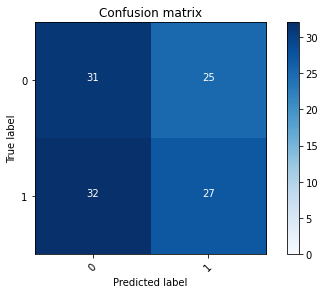

2022-08-22 18:16:05 - [Epoch Train: 65] loss: 0.1110, auc: 0.9971, acc: 0.9792, time: 24.00 s            
2022-08-22 18:16:05 - [Epoch Valid: 65] loss: 1.5261, auc: 0.4994, acc: 0.5200, time: 6.00 s


 65%|███████████████████████████▎              | 65/100 [34:05<18:18, 31.38s/it]

2022-08-22 18:16:05 - EPOCH: 66
2022-08-22 18:16:06 - Train Step 10/481, train_loss: 0.1821
2022-08-22 18:16:07 - Train Step 20/481, train_loss: 0.1044
2022-08-22 18:16:07 - Train Step 30/481, train_loss: 0.1255
2022-08-22 18:16:08 - Train Step 40/481, train_loss: 0.1282
2022-08-22 18:16:08 - Train Step 50/481, train_loss: 0.1171
2022-08-22 18:16:09 - Train Step 60/481, train_loss: 0.1058
2022-08-22 18:16:09 - Train Step 70/481, train_loss: 0.0959
2022-08-22 18:16:10 - Train Step 80/481, train_loss: 0.0895
2022-08-22 18:16:10 - Train Step 90/481, train_loss: 0.0871
2022-08-22 18:16:11 - Train Step 100/481, train_loss: 0.0843
2022-08-22 18:16:11 - Train Step 110/481, train_loss: 0.0935
2022-08-22 18:16:12 - Train Step 120/481, train_loss: 0.0899
2022-08-22 18:16:12 - Train Step 130/481, train_loss: 0.0958
2022-08-22 18:16:13 - Train Step 140/481, train_loss: 0.0966
2022-08-22 18:16:13 - Train Step 150/481, train_loss: 0.0951
2022-08-22 18:16:14 - Train Step 160/481, train_loss: 0.0951
2

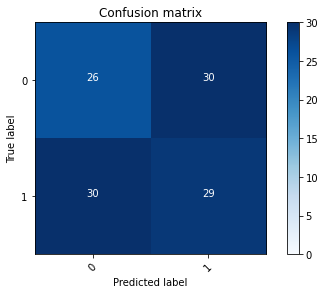

2022-08-22 18:16:37 - [Epoch Train: 66] loss: 0.1065, auc: 0.9976, acc: 0.9813, time: 24.00 s            
2022-08-22 18:16:37 - [Epoch Valid: 66] loss: 1.6947, auc: 0.4958, acc: 0.4960, time: 6.00 s


 66%|███████████████████████████▋              | 66/100 [34:36<17:47, 31.41s/it]

2022-08-22 18:16:37 - EPOCH: 67
2022-08-22 18:16:38 - Train Step 10/481, train_loss: 0.0827
2022-08-22 18:16:38 - Train Step 20/481, train_loss: 0.0929
2022-08-22 18:16:39 - Train Step 30/481, train_loss: 0.0753
2022-08-22 18:16:39 - Train Step 40/481, train_loss: 0.0642
2022-08-22 18:16:40 - Train Step 50/481, train_loss: 0.0722
2022-08-22 18:16:40 - Train Step 60/481, train_loss: 0.0745
2022-08-22 18:16:41 - Train Step 70/481, train_loss: 0.0930
2022-08-22 18:16:41 - Train Step 80/481, train_loss: 0.0883
2022-08-22 18:16:42 - Train Step 90/481, train_loss: 0.0958
2022-08-22 18:16:42 - Train Step 100/481, train_loss: 0.0948
2022-08-22 18:16:43 - Train Step 110/481, train_loss: 0.1078
2022-08-22 18:16:43 - Train Step 120/481, train_loss: 0.1084
2022-08-22 18:16:44 - Train Step 130/481, train_loss: 0.1049
2022-08-22 18:16:44 - Train Step 140/481, train_loss: 0.1011
2022-08-22 18:16:45 - Train Step 150/481, train_loss: 0.0988
2022-08-22 18:16:45 - Train Step 160/481, train_loss: 0.1019
2

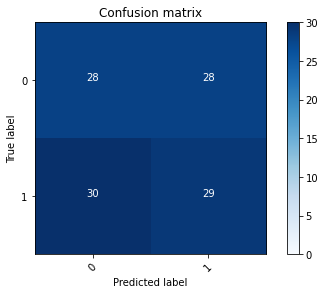

2022-08-22 18:17:08 - [Epoch Train: 67] loss: 0.1103, auc: 0.9968, acc: 0.9730, time: 24.00 s            
2022-08-22 18:17:08 - [Epoch Valid: 67] loss: 1.4471, auc: 0.5000, acc: 0.5120, time: 6.00 s


 67%|████████████████████████████▏             | 67/100 [35:07<17:14, 31.35s/it]

2022-08-22 18:17:08 - EPOCH: 68
2022-08-22 18:17:09 - Train Step 10/481, train_loss: 0.0620
2022-08-22 18:17:09 - Train Step 20/481, train_loss: 0.0685
2022-08-22 18:17:10 - Train Step 30/481, train_loss: 0.0830
2022-08-22 18:17:10 - Train Step 40/481, train_loss: 0.0780
2022-08-22 18:17:11 - Train Step 50/481, train_loss: 0.0698
2022-08-22 18:17:11 - Train Step 60/481, train_loss: 0.0806
2022-08-22 18:17:12 - Train Step 70/481, train_loss: 0.0719
2022-08-22 18:17:12 - Train Step 80/481, train_loss: 0.0721
2022-08-22 18:17:13 - Train Step 90/481, train_loss: 0.1018
2022-08-22 18:17:13 - Train Step 100/481, train_loss: 0.0974
2022-08-22 18:17:14 - Train Step 110/481, train_loss: 0.0901
2022-08-22 18:17:14 - Train Step 120/481, train_loss: 0.0910
2022-08-22 18:17:15 - Train Step 130/481, train_loss: 0.0976
2022-08-22 18:17:15 - Train Step 140/481, train_loss: 0.0969
2022-08-22 18:17:16 - Train Step 150/481, train_loss: 0.0923
2022-08-22 18:17:16 - Train Step 160/481, train_loss: 0.0948
2

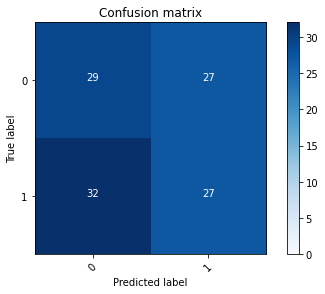

2022-08-22 18:17:39 - [Epoch Train: 68] loss: 0.0987, auc: 0.9979, acc: 0.9792, time: 24.00 s            
2022-08-22 18:17:39 - [Epoch Valid: 68] loss: 1.5608, auc: 0.4936, acc: 0.5040, time: 6.00 s


 68%|████████████████████████████▌             | 68/100 [35:39<16:42, 31.34s/it]

2022-08-22 18:17:39 - EPOCH: 69
2022-08-22 18:17:40 - Train Step 10/481, train_loss: 0.0687
2022-08-22 18:17:41 - Train Step 20/481, train_loss: 0.1024
2022-08-22 18:17:41 - Train Step 30/481, train_loss: 0.1224
2022-08-22 18:17:42 - Train Step 40/481, train_loss: 0.1075
2022-08-22 18:17:42 - Train Step 50/481, train_loss: 0.0979
2022-08-22 18:17:43 - Train Step 60/481, train_loss: 0.0867
2022-08-22 18:17:43 - Train Step 70/481, train_loss: 0.0776
2022-08-22 18:17:44 - Train Step 80/481, train_loss: 0.0795
2022-08-22 18:17:44 - Train Step 90/481, train_loss: 0.0946
2022-08-22 18:17:45 - Train Step 100/481, train_loss: 0.0898
2022-08-22 18:17:45 - Train Step 110/481, train_loss: 0.0855
2022-08-22 18:17:46 - Train Step 120/481, train_loss: 0.0859
2022-08-22 18:17:46 - Train Step 130/481, train_loss: 0.1000
2022-08-22 18:17:47 - Train Step 140/481, train_loss: 0.0973
2022-08-22 18:17:47 - Train Step 150/481, train_loss: 0.0949
2022-08-22 18:17:48 - Train Step 160/481, train_loss: 0.1028
2

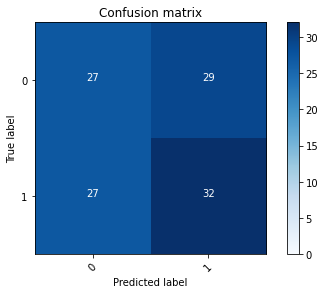

2022-08-22 18:18:11 - [Epoch Train: 69] loss: 0.0883, auc: 0.9993, acc: 0.9875, time: 24.00 s            
2022-08-22 18:18:11 - [Epoch Valid: 69] loss: 1.6944, auc: 0.4967, acc: 0.5280, time: 6.00 s


 69%|████████████████████████████▉             | 69/100 [36:10<16:13, 31.42s/it]

2022-08-22 18:18:11 - EPOCH: 70
2022-08-22 18:18:12 - Train Step 10/481, train_loss: 0.0955
2022-08-22 18:18:12 - Train Step 20/481, train_loss: 0.0628
2022-08-22 18:18:13 - Train Step 30/481, train_loss: 0.0601
2022-08-22 18:18:13 - Train Step 40/481, train_loss: 0.0593
2022-08-22 18:18:14 - Train Step 50/481, train_loss: 0.0627
2022-08-22 18:18:14 - Train Step 60/481, train_loss: 0.0605
2022-08-22 18:18:15 - Train Step 70/481, train_loss: 0.0796
2022-08-22 18:18:15 - Train Step 80/481, train_loss: 0.0828
2022-08-22 18:18:16 - Train Step 90/481, train_loss: 0.0802
2022-08-22 18:18:16 - Train Step 100/481, train_loss: 0.0779
2022-08-22 18:18:17 - Train Step 110/481, train_loss: 0.0784
2022-08-22 18:18:17 - Train Step 120/481, train_loss: 0.0740
2022-08-22 18:18:18 - Train Step 130/481, train_loss: 0.0746
2022-08-22 18:18:18 - Train Step 140/481, train_loss: 0.0747
2022-08-22 18:18:19 - Train Step 150/481, train_loss: 0.0715
2022-08-22 18:18:19 - Train Step 160/481, train_loss: 0.0721
2

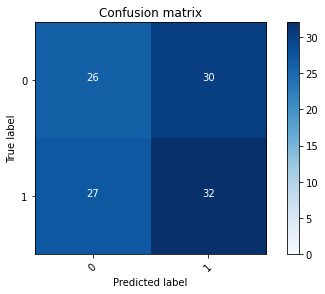

2022-08-22 18:18:42 - [Epoch Train: 70] loss: 0.0693, auc: 0.9999, acc: 0.9938, time: 24.00 s            
2022-08-22 18:18:42 - [Epoch Valid: 70] loss: 1.8097, auc: 0.4939, acc: 0.5200, time: 6.00 s


 70%|█████████████████████████████▍            | 70/100 [36:42<15:40, 31.35s/it]

2022-08-22 18:18:42 - EPOCH: 71
2022-08-22 18:18:43 - Train Step 10/481, train_loss: 0.1391
2022-08-22 18:18:43 - Train Step 20/481, train_loss: 0.0949
2022-08-22 18:18:44 - Train Step 30/481, train_loss: 0.0696
2022-08-22 18:18:44 - Train Step 40/481, train_loss: 0.0716
2022-08-22 18:18:45 - Train Step 50/481, train_loss: 0.0693
2022-08-22 18:18:45 - Train Step 60/481, train_loss: 0.0621
2022-08-22 18:18:46 - Train Step 70/481, train_loss: 0.0622
2022-08-22 18:18:46 - Train Step 80/481, train_loss: 0.0638
2022-08-22 18:18:47 - Train Step 90/481, train_loss: 0.0614
2022-08-22 18:18:48 - Train Step 100/481, train_loss: 0.0561
2022-08-22 18:18:48 - Train Step 110/481, train_loss: 0.0575
2022-08-22 18:18:49 - Train Step 120/481, train_loss: 0.0691
2022-08-22 18:18:49 - Train Step 130/481, train_loss: 0.0651
2022-08-22 18:18:50 - Train Step 140/481, train_loss: 0.0724
2022-08-22 18:18:50 - Train Step 150/481, train_loss: 0.0736
2022-08-22 18:18:51 - Train Step 160/481, train_loss: 0.0707
2

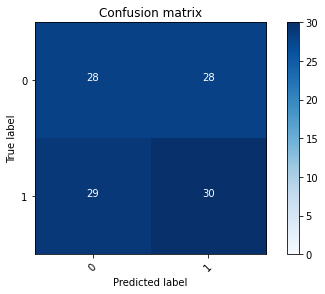

2022-08-22 18:19:14 - [Epoch Train: 71] loss: 0.0806, auc: 0.9987, acc: 0.9813, time: 24.00 s            
2022-08-22 18:19:14 - [Epoch Valid: 71] loss: 1.6487, auc: 0.4997, acc: 0.5200, time: 6.00 s


 71%|█████████████████████████████▊            | 71/100 [37:13<15:11, 31.42s/it]

2022-08-22 18:19:14 - EPOCH: 72
2022-08-22 18:19:14 - Train Step 10/481, train_loss: 0.0464
2022-08-22 18:19:15 - Train Step 20/481, train_loss: 0.0641
2022-08-22 18:19:15 - Train Step 30/481, train_loss: 0.0600
2022-08-22 18:19:16 - Train Step 40/481, train_loss: 0.0735
2022-08-22 18:19:16 - Train Step 50/481, train_loss: 0.0711
2022-08-22 18:19:17 - Train Step 60/481, train_loss: 0.0650
2022-08-22 18:19:18 - Train Step 70/481, train_loss: 0.0603
2022-08-22 18:19:18 - Train Step 80/481, train_loss: 0.0631
2022-08-22 18:19:19 - Train Step 90/481, train_loss: 0.0599
2022-08-22 18:19:19 - Train Step 100/481, train_loss: 0.0647
2022-08-22 18:19:20 - Train Step 110/481, train_loss: 0.0666
2022-08-22 18:19:20 - Train Step 120/481, train_loss: 0.0673
2022-08-22 18:19:21 - Train Step 130/481, train_loss: 0.0647
2022-08-22 18:19:21 - Train Step 140/481, train_loss: 0.0630
2022-08-22 18:19:22 - Train Step 150/481, train_loss: 0.0607
2022-08-22 18:19:22 - Train Step 160/481, train_loss: 0.0637
2

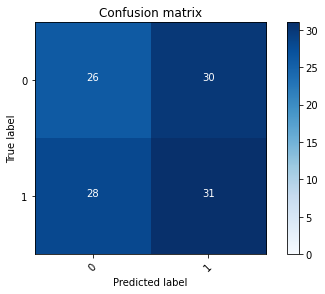

2022-08-22 18:19:45 - [Epoch Train: 72] loss: 0.0737, auc: 0.9995, acc: 0.9896, time: 24.00 s            
2022-08-22 18:19:45 - [Epoch Valid: 72] loss: 1.8729, auc: 0.4936, acc: 0.5120, time: 6.00 s


 72%|██████████████████████████████▏           | 72/100 [37:44<14:36, 31.31s/it]

2022-08-22 18:19:45 - EPOCH: 73
2022-08-22 18:19:46 - Train Step 10/481, train_loss: 0.0739
2022-08-22 18:19:46 - Train Step 20/481, train_loss: 0.0624
2022-08-22 18:19:47 - Train Step 30/481, train_loss: 0.0686
2022-08-22 18:19:47 - Train Step 40/481, train_loss: 0.0895
2022-08-22 18:19:48 - Train Step 50/481, train_loss: 0.0798
2022-08-22 18:19:48 - Train Step 60/481, train_loss: 0.0688
2022-08-22 18:19:49 - Train Step 70/481, train_loss: 0.0626
2022-08-22 18:19:49 - Train Step 80/481, train_loss: 0.0622
2022-08-22 18:19:50 - Train Step 90/481, train_loss: 0.0670
2022-08-22 18:19:50 - Train Step 100/481, train_loss: 0.0652
2022-08-22 18:19:51 - Train Step 110/481, train_loss: 0.0633
2022-08-22 18:19:51 - Train Step 120/481, train_loss: 0.0634
2022-08-22 18:19:52 - Train Step 130/481, train_loss: 0.0695
2022-08-22 18:19:52 - Train Step 140/481, train_loss: 0.0706
2022-08-22 18:19:53 - Train Step 150/481, train_loss: 0.0699
2022-08-22 18:19:53 - Train Step 160/481, train_loss: 0.0670
2

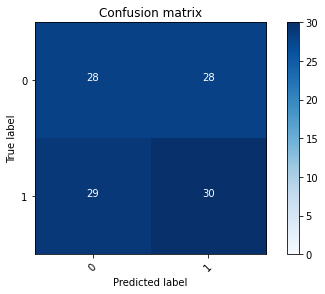

2022-08-22 18:20:16 - [Epoch Train: 73] loss: 0.0667, auc: 0.9998, acc: 0.9917, time: 24.00 s            
2022-08-22 18:20:16 - [Epoch Valid: 73] loss: 1.8671, auc: 0.4988, acc: 0.5200, time: 6.00 s


 73%|██████████████████████████████▋           | 73/100 [38:16<14:06, 31.35s/it]

2022-08-22 18:20:16 - EPOCH: 74
2022-08-22 18:20:17 - Train Step 10/481, train_loss: 0.0807
2022-08-22 18:20:17 - Train Step 20/481, train_loss: 0.0617
2022-08-22 18:20:18 - Train Step 30/481, train_loss: 0.0997
2022-08-22 18:20:18 - Train Step 40/481, train_loss: 0.0965
2022-08-22 18:20:19 - Train Step 50/481, train_loss: 0.0938
2022-08-22 18:20:19 - Train Step 60/481, train_loss: 0.0997
2022-08-22 18:20:20 - Train Step 70/481, train_loss: 0.1152
2022-08-22 18:20:21 - Train Step 80/481, train_loss: 0.1031
2022-08-22 18:20:21 - Train Step 90/481, train_loss: 0.0948
2022-08-22 18:20:21 - Train Step 100/481, train_loss: 0.0930
2022-08-22 18:20:22 - Train Step 110/481, train_loss: 0.0864
2022-08-22 18:20:22 - Train Step 120/481, train_loss: 0.0825
2022-08-22 18:20:23 - Train Step 130/481, train_loss: 0.0802
2022-08-22 18:20:24 - Train Step 140/481, train_loss: 0.0782
2022-08-22 18:20:24 - Train Step 150/481, train_loss: 0.0761
2022-08-22 18:20:25 - Train Step 160/481, train_loss: 0.0731
2

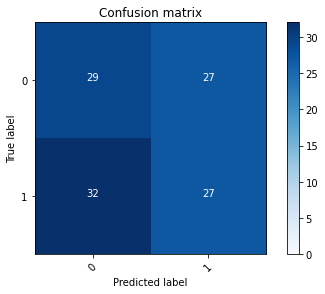

2022-08-22 18:20:47 - [Epoch Train: 74] loss: 0.0751, auc: 0.9994, acc: 0.9834, time: 24.00 s            
2022-08-22 18:20:47 - [Epoch Valid: 74] loss: 1.8858, auc: 0.4967, acc: 0.5040, time: 6.00 s


 74%|███████████████████████████████           | 74/100 [38:47<13:31, 31.22s/it]

2022-08-22 18:20:47 - EPOCH: 75
2022-08-22 18:20:48 - Train Step 10/481, train_loss: 0.0704
2022-08-22 18:20:48 - Train Step 20/481, train_loss: 0.0573
2022-08-22 18:20:49 - Train Step 30/481, train_loss: 0.0559
2022-08-22 18:20:49 - Train Step 40/481, train_loss: 0.0746
2022-08-22 18:20:50 - Train Step 50/481, train_loss: 0.0709
2022-08-22 18:20:50 - Train Step 60/481, train_loss: 0.0764
2022-08-22 18:20:51 - Train Step 70/481, train_loss: 0.0809
2022-08-22 18:20:51 - Train Step 80/481, train_loss: 0.0787
2022-08-22 18:20:52 - Train Step 90/481, train_loss: 0.0718
2022-08-22 18:20:52 - Train Step 100/481, train_loss: 0.0709
2022-08-22 18:20:53 - Train Step 110/481, train_loss: 0.0667
2022-08-22 18:20:53 - Train Step 120/481, train_loss: 0.0627
2022-08-22 18:20:54 - Train Step 130/481, train_loss: 0.0611
2022-08-22 18:20:54 - Train Step 140/481, train_loss: 0.0623
2022-08-22 18:20:55 - Train Step 150/481, train_loss: 0.0614
2022-08-22 18:20:55 - Train Step 160/481, train_loss: 0.0595
2

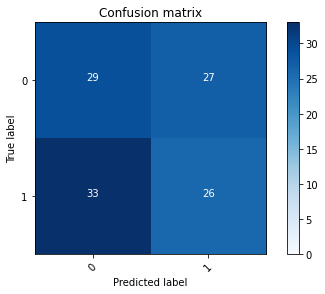

2022-08-22 18:21:19 - [Epoch Train: 75] loss: 0.0615, auc: 0.9997, acc: 0.9875, time: 24.00 s            
2022-08-22 18:21:19 - [Epoch Valid: 75] loss: 1.8783, auc: 0.4967, acc: 0.4960, time: 6.00 s


 75%|███████████████████████████████▌          | 75/100 [39:18<13:02, 31.30s/it]

2022-08-22 18:21:19 - EPOCH: 76
2022-08-22 18:21:19 - Train Step 10/481, train_loss: 0.0198
2022-08-22 18:21:20 - Train Step 20/481, train_loss: 0.0353
2022-08-22 18:21:20 - Train Step 30/481, train_loss: 0.0405
2022-08-22 18:21:21 - Train Step 40/481, train_loss: 0.0400
2022-08-22 18:21:21 - Train Step 50/481, train_loss: 0.0406
2022-08-22 18:21:22 - Train Step 60/481, train_loss: 0.0421
2022-08-22 18:21:22 - Train Step 70/481, train_loss: 0.0379
2022-08-22 18:21:23 - Train Step 80/481, train_loss: 0.0483
2022-08-22 18:21:23 - Train Step 90/481, train_loss: 0.0524
2022-08-22 18:21:24 - Train Step 100/481, train_loss: 0.0550
2022-08-22 18:21:25 - Train Step 110/481, train_loss: 0.0684
2022-08-22 18:21:25 - Train Step 120/481, train_loss: 0.0692
2022-08-22 18:21:26 - Train Step 130/481, train_loss: 0.0697
2022-08-22 18:21:26 - Train Step 140/481, train_loss: 0.0652
2022-08-22 18:21:27 - Train Step 150/481, train_loss: 0.0633
2022-08-22 18:21:27 - Train Step 160/481, train_loss: 0.0627
2

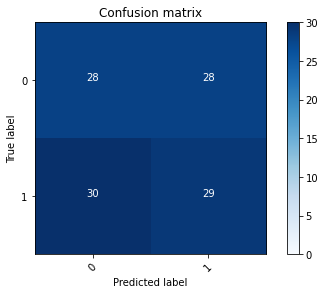

2022-08-22 18:21:50 - [Epoch Train: 76] loss: 0.0680, auc: 0.9992, acc: 0.9834, time: 24.00 s            
2022-08-22 18:21:50 - [Epoch Valid: 76] loss: 1.7755, auc: 0.4985, acc: 0.5120, time: 6.00 s


 76%|███████████████████████████████▉          | 76/100 [39:50<12:33, 31.40s/it]

2022-08-22 18:21:50 - EPOCH: 77
2022-08-22 18:21:51 - Train Step 10/481, train_loss: 0.2068
2022-08-22 18:21:51 - Train Step 20/481, train_loss: 0.1301
2022-08-22 18:21:52 - Train Step 30/481, train_loss: 0.0962
2022-08-22 18:21:52 - Train Step 40/481, train_loss: 0.0754
2022-08-22 18:21:53 - Train Step 50/481, train_loss: 0.0749
2022-08-22 18:21:53 - Train Step 60/481, train_loss: 0.0784
2022-08-22 18:21:54 - Train Step 70/481, train_loss: 0.0759
2022-08-22 18:21:55 - Train Step 80/481, train_loss: 0.0728
2022-08-22 18:21:55 - Train Step 90/481, train_loss: 0.0659
2022-08-22 18:21:56 - Train Step 100/481, train_loss: 0.0697
2022-08-22 18:21:56 - Train Step 110/481, train_loss: 0.0650
2022-08-22 18:21:57 - Train Step 120/481, train_loss: 0.0623
2022-08-22 18:21:57 - Train Step 130/481, train_loss: 0.0621
2022-08-22 18:21:58 - Train Step 140/481, train_loss: 0.0622
2022-08-22 18:21:58 - Train Step 150/481, train_loss: 0.0593
2022-08-22 18:21:59 - Train Step 160/481, train_loss: 0.0607
2

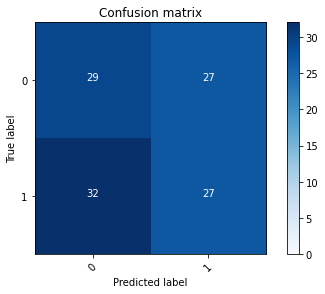

2022-08-22 18:22:18 - [Epoch Train: 77] loss: 0.0537, auc: 0.9998, acc: 0.9875, time: 22.00 s            
2022-08-22 18:22:18 - [Epoch Valid: 77] loss: 1.8533, auc: 0.5030, acc: 0.5040, time: 5.00 s


 77%|████████████████████████████████▎         | 77/100 [40:18<11:38, 30.38s/it]

2022-08-22 18:22:18 - EPOCH: 78
2022-08-22 18:22:19 - Train Step 10/481, train_loss: 0.0312
2022-08-22 18:22:19 - Train Step 20/481, train_loss: 0.0483
2022-08-22 18:22:20 - Train Step 30/481, train_loss: 0.0462
2022-08-22 18:22:20 - Train Step 40/481, train_loss: 0.0474
2022-08-22 18:22:21 - Train Step 50/481, train_loss: 0.0531
2022-08-22 18:22:21 - Train Step 60/481, train_loss: 0.0535
2022-08-22 18:22:22 - Train Step 70/481, train_loss: 0.0493
2022-08-22 18:22:22 - Train Step 80/481, train_loss: 0.0622
2022-08-22 18:22:22 - Train Step 90/481, train_loss: 0.0678
2022-08-22 18:22:23 - Train Step 100/481, train_loss: 0.0638
2022-08-22 18:22:23 - Train Step 110/481, train_loss: 0.0588
2022-08-22 18:22:24 - Train Step 120/481, train_loss: 0.0613
2022-08-22 18:22:24 - Train Step 130/481, train_loss: 0.0629
2022-08-22 18:22:25 - Train Step 140/481, train_loss: 0.0594
2022-08-22 18:22:25 - Train Step 150/481, train_loss: 0.0600
2022-08-22 18:22:25 - Train Step 160/481, train_loss: 0.0574
2

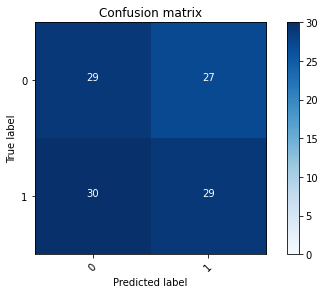

2022-08-22 18:22:45 - [Epoch Train: 78] loss: 0.0441, auc: 1.0000, acc: 0.9979, time: 21.00 s            
2022-08-22 18:22:45 - [Epoch Valid: 78] loss: 2.0336, auc: 0.5024, acc: 0.5200, time: 5.00 s


 78%|████████████████████████████████▊         | 78/100 [40:45<10:46, 29.40s/it]

2022-08-22 18:22:45 - EPOCH: 79
2022-08-22 18:22:46 - Train Step 10/481, train_loss: 0.0187
2022-08-22 18:22:46 - Train Step 20/481, train_loss: 0.0402
2022-08-22 18:22:47 - Train Step 30/481, train_loss: 0.0426
2022-08-22 18:22:47 - Train Step 40/481, train_loss: 0.0414
2022-08-22 18:22:48 - Train Step 50/481, train_loss: 0.0393
2022-08-22 18:22:48 - Train Step 60/481, train_loss: 0.0432
2022-08-22 18:22:49 - Train Step 70/481, train_loss: 0.0376
2022-08-22 18:22:49 - Train Step 80/481, train_loss: 0.0516
2022-08-22 18:22:49 - Train Step 90/481, train_loss: 0.0477
2022-08-22 18:22:50 - Train Step 100/481, train_loss: 0.0454
2022-08-22 18:22:50 - Train Step 110/481, train_loss: 0.0419
2022-08-22 18:22:51 - Train Step 120/481, train_loss: 0.0390
2022-08-22 18:22:51 - Train Step 130/481, train_loss: 0.0382
2022-08-22 18:22:52 - Train Step 140/481, train_loss: 0.0377
2022-08-22 18:22:52 - Train Step 150/481, train_loss: 0.0398
2022-08-22 18:22:52 - Train Step 160/481, train_loss: 0.0381
2

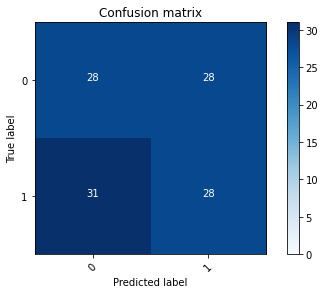

2022-08-22 18:23:12 - [Epoch Train: 79] loss: 0.0438, auc: 0.9998, acc: 0.9938, time: 20.00 s            
2022-08-22 18:23:12 - [Epoch Valid: 79] loss: 1.8848, auc: 0.5015, acc: 0.5040, time: 5.00 s


 79%|█████████████████████████████████▏        | 79/100 [41:11<10:00, 28.58s/it]

2022-08-22 18:23:12 - EPOCH: 80
2022-08-22 18:23:13 - Train Step 10/481, train_loss: 0.0287
2022-08-22 18:23:13 - Train Step 20/481, train_loss: 0.0503
2022-08-22 18:23:14 - Train Step 30/481, train_loss: 0.0539
2022-08-22 18:23:14 - Train Step 40/481, train_loss: 0.0438
2022-08-22 18:23:14 - Train Step 50/481, train_loss: 0.0403
2022-08-22 18:23:15 - Train Step 60/481, train_loss: 0.0355
2022-08-22 18:23:15 - Train Step 70/481, train_loss: 0.0331
2022-08-22 18:23:16 - Train Step 80/481, train_loss: 0.0381
2022-08-22 18:23:16 - Train Step 90/481, train_loss: 0.0381
2022-08-22 18:23:17 - Train Step 100/481, train_loss: 0.0365
2022-08-22 18:23:17 - Train Step 110/481, train_loss: 0.0343
2022-08-22 18:23:17 - Train Step 120/481, train_loss: 0.0360
2022-08-22 18:23:18 - Train Step 130/481, train_loss: 0.0432
2022-08-22 18:23:18 - Train Step 140/481, train_loss: 0.0425
2022-08-22 18:23:19 - Train Step 150/481, train_loss: 0.0431
2022-08-22 18:23:19 - Train Step 160/481, train_loss: 0.0410
2

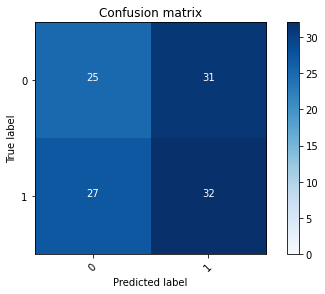

2022-08-22 18:23:39 - [Epoch Train: 80] loss: 0.0532, auc: 0.9989, acc: 0.9917, time: 21.00 s            
2022-08-22 18:23:39 - [Epoch Valid: 80] loss: 2.1791, auc: 0.4952, acc: 0.5040, time: 5.00 s


 80%|█████████████████████████████████▌        | 80/100 [41:38<09:20, 28.05s/it]

2022-08-22 18:23:39 - EPOCH: 81
2022-08-22 18:23:39 - Train Step 10/481, train_loss: 0.0913
2022-08-22 18:23:40 - Train Step 20/481, train_loss: 0.0550
2022-08-22 18:23:40 - Train Step 30/481, train_loss: 0.0474
2022-08-22 18:23:41 - Train Step 40/481, train_loss: 0.0454
2022-08-22 18:23:41 - Train Step 50/481, train_loss: 0.0409
2022-08-22 18:23:42 - Train Step 60/481, train_loss: 0.0374
2022-08-22 18:23:42 - Train Step 70/481, train_loss: 0.0429
2022-08-22 18:23:42 - Train Step 80/481, train_loss: 0.0399
2022-08-22 18:23:43 - Train Step 90/481, train_loss: 0.0454
2022-08-22 18:23:43 - Train Step 100/481, train_loss: 0.0476
2022-08-22 18:23:44 - Train Step 110/481, train_loss: 0.0454
2022-08-22 18:23:44 - Train Step 120/481, train_loss: 0.0438
2022-08-22 18:23:45 - Train Step 130/481, train_loss: 0.0445
2022-08-22 18:23:45 - Train Step 140/481, train_loss: 0.0431
2022-08-22 18:23:45 - Train Step 150/481, train_loss: 0.0448
2022-08-22 18:23:46 - Train Step 160/481, train_loss: 0.0437
2

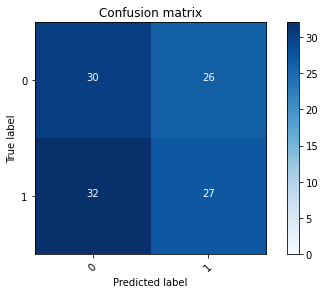

2022-08-22 18:24:06 - [Epoch Train: 81] loss: 0.0439, auc: 1.0000, acc: 0.9979, time: 20.00 s            
2022-08-22 18:24:06 - [Epoch Valid: 81] loss: 2.1391, auc: 0.4976, acc: 0.5120, time: 5.00 s


 81%|██████████████████████████████████        | 81/100 [42:05<08:45, 27.63s/it]

2022-08-22 18:24:06 - EPOCH: 82
2022-08-22 18:24:06 - Train Step 10/481, train_loss: 0.0342
2022-08-22 18:24:07 - Train Step 20/481, train_loss: 0.0293
2022-08-22 18:24:07 - Train Step 30/481, train_loss: 0.0328
2022-08-22 18:24:07 - Train Step 40/481, train_loss: 0.0304
2022-08-22 18:24:08 - Train Step 50/481, train_loss: 0.0309
2022-08-22 18:24:08 - Train Step 60/481, train_loss: 0.0282
2022-08-22 18:24:09 - Train Step 70/481, train_loss: 0.0245
2022-08-22 18:24:09 - Train Step 80/481, train_loss: 0.0262
2022-08-22 18:24:10 - Train Step 90/481, train_loss: 0.0403
2022-08-22 18:24:10 - Train Step 100/481, train_loss: 0.0396
2022-08-22 18:24:10 - Train Step 110/481, train_loss: 0.0430
2022-08-22 18:24:11 - Train Step 120/481, train_loss: 0.0584
2022-08-22 18:24:11 - Train Step 130/481, train_loss: 0.0547
2022-08-22 18:24:12 - Train Step 140/481, train_loss: 0.0543
2022-08-22 18:24:12 - Train Step 150/481, train_loss: 0.0524
2022-08-22 18:24:13 - Train Step 160/481, train_loss: 0.0505
2

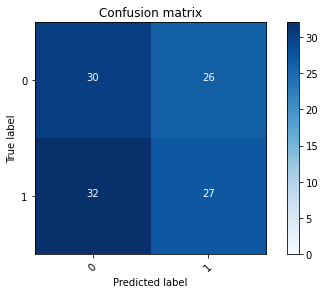

2022-08-22 18:24:32 - [Epoch Train: 82] loss: 0.0435, auc: 0.9995, acc: 0.9917, time: 21.00 s            
2022-08-22 18:24:32 - [Epoch Valid: 82] loss: 2.2383, auc: 0.4973, acc: 0.5120, time: 5.00 s


 82%|██████████████████████████████████▍       | 82/100 [42:32<08:13, 27.42s/it]

2022-08-22 18:24:32 - EPOCH: 83
2022-08-22 18:24:33 - Train Step 10/481, train_loss: 0.0308
2022-08-22 18:24:33 - Train Step 20/481, train_loss: 0.0403
2022-08-22 18:24:34 - Train Step 30/481, train_loss: 0.0276
2022-08-22 18:24:34 - Train Step 40/481, train_loss: 0.0469
2022-08-22 18:24:35 - Train Step 50/481, train_loss: 0.0516
2022-08-22 18:24:35 - Train Step 60/481, train_loss: 0.0465
2022-08-22 18:24:36 - Train Step 70/481, train_loss: 0.0433
2022-08-22 18:24:36 - Train Step 80/481, train_loss: 0.0463
2022-08-22 18:24:37 - Train Step 90/481, train_loss: 0.0439
2022-08-22 18:24:37 - Train Step 100/481, train_loss: 0.0410
2022-08-22 18:24:37 - Train Step 110/481, train_loss: 0.0435
2022-08-22 18:24:38 - Train Step 120/481, train_loss: 0.0444
2022-08-22 18:24:38 - Train Step 130/481, train_loss: 0.0423
2022-08-22 18:24:39 - Train Step 140/481, train_loss: 0.0396
2022-08-22 18:24:39 - Train Step 150/481, train_loss: 0.0423
2022-08-22 18:24:40 - Train Step 160/481, train_loss: 0.0468
2

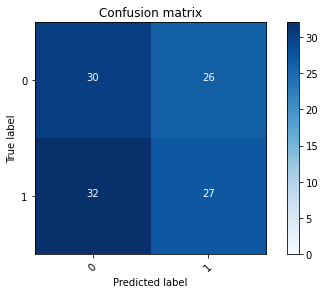

2022-08-22 18:24:59 - [Epoch Train: 83] loss: 0.0443, auc: 0.9996, acc: 0.9896, time: 21.00 s            
2022-08-22 18:24:59 - [Epoch Valid: 83] loss: 2.0126, auc: 0.4997, acc: 0.5120, time: 5.00 s


 83%|██████████████████████████████████▊       | 83/100 [42:59<07:43, 27.28s/it]

2022-08-22 18:24:59 - EPOCH: 84
2022-08-22 18:25:00 - Train Step 10/481, train_loss: 0.0239
2022-08-22 18:25:00 - Train Step 20/481, train_loss: 0.0478
2022-08-22 18:25:01 - Train Step 30/481, train_loss: 0.0559
2022-08-22 18:25:01 - Train Step 40/481, train_loss: 0.0448
2022-08-22 18:25:02 - Train Step 50/481, train_loss: 0.0728
2022-08-22 18:25:02 - Train Step 60/481, train_loss: 0.0643
2022-08-22 18:25:03 - Train Step 70/481, train_loss: 0.0665
2022-08-22 18:25:03 - Train Step 80/481, train_loss: 0.0718
2022-08-22 18:25:03 - Train Step 90/481, train_loss: 0.0681
2022-08-22 18:25:04 - Train Step 100/481, train_loss: 0.0652
2022-08-22 18:25:04 - Train Step 110/481, train_loss: 0.0596
2022-08-22 18:25:05 - Train Step 120/481, train_loss: 0.0561
2022-08-22 18:25:05 - Train Step 130/481, train_loss: 0.0542
2022-08-22 18:25:06 - Train Step 140/481, train_loss: 0.0506
2022-08-22 18:25:06 - Train Step 150/481, train_loss: 0.0499
2022-08-22 18:25:07 - Train Step 160/481, train_loss: 0.0483
2

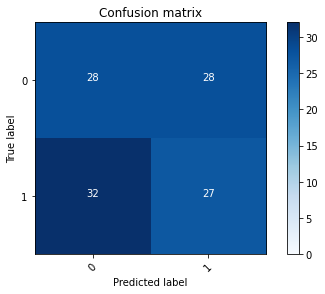

2022-08-22 18:25:26 - [Epoch Train: 84] loss: 0.0392, auc: 0.9998, acc: 0.9917, time: 21.00 s            
2022-08-22 18:25:26 - [Epoch Valid: 84] loss: 2.1146, auc: 0.4952, acc: 0.4960, time: 5.00 s


 84%|███████████████████████████████████▎      | 84/100 [43:26<07:14, 27.16s/it]

2022-08-22 18:25:26 - EPOCH: 85
2022-08-22 18:25:27 - Train Step 10/481, train_loss: 0.0134
2022-08-22 18:25:27 - Train Step 20/481, train_loss: 0.0218
2022-08-22 18:25:28 - Train Step 30/481, train_loss: 0.0157
2022-08-22 18:25:28 - Train Step 40/481, train_loss: 0.0136
2022-08-22 18:25:29 - Train Step 50/481, train_loss: 0.0242
2022-08-22 18:25:29 - Train Step 60/481, train_loss: 0.0232
2022-08-22 18:25:30 - Train Step 70/481, train_loss: 0.0290
2022-08-22 18:25:30 - Train Step 80/481, train_loss: 0.0303
2022-08-22 18:25:30 - Train Step 90/481, train_loss: 0.0300
2022-08-22 18:25:31 - Train Step 100/481, train_loss: 0.0305
2022-08-22 18:25:31 - Train Step 110/481, train_loss: 0.0285
2022-08-22 18:25:32 - Train Step 120/481, train_loss: 0.0310
2022-08-22 18:25:32 - Train Step 130/481, train_loss: 0.0308
2022-08-22 18:25:33 - Train Step 140/481, train_loss: 0.0348
2022-08-22 18:25:33 - Train Step 150/481, train_loss: 0.0355
2022-08-22 18:25:34 - Train Step 160/481, train_loss: 0.0341
2

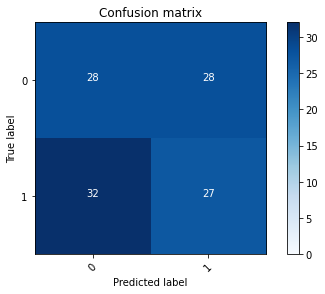

2022-08-22 18:25:53 - [Epoch Train: 85] loss: 0.0371, auc: 0.9999, acc: 0.9938, time: 21.00 s            
2022-08-22 18:25:53 - [Epoch Valid: 85] loss: 2.2465, auc: 0.4967, acc: 0.4960, time: 5.00 s


 85%|███████████████████████████████████▋      | 85/100 [43:53<06:46, 27.11s/it]

2022-08-22 18:25:53 - EPOCH: 86
2022-08-22 18:25:54 - Train Step 10/481, train_loss: 0.1092
2022-08-22 18:25:54 - Train Step 20/481, train_loss: 0.0731
2022-08-22 18:25:55 - Train Step 30/481, train_loss: 0.0658
2022-08-22 18:25:55 - Train Step 40/481, train_loss: 0.0522
2022-08-22 18:25:56 - Train Step 50/481, train_loss: 0.0455
2022-08-22 18:25:56 - Train Step 60/481, train_loss: 0.0446
2022-08-22 18:25:56 - Train Step 70/481, train_loss: 0.0486
2022-08-22 18:25:57 - Train Step 80/481, train_loss: 0.0434
2022-08-22 18:25:57 - Train Step 90/481, train_loss: 0.0427
2022-08-22 18:25:58 - Train Step 100/481, train_loss: 0.0450
2022-08-22 18:25:58 - Train Step 110/481, train_loss: 0.0419
2022-08-22 18:25:59 - Train Step 120/481, train_loss: 0.0401
2022-08-22 18:25:59 - Train Step 130/481, train_loss: 0.0378
2022-08-22 18:26:00 - Train Step 140/481, train_loss: 0.0358
2022-08-22 18:26:00 - Train Step 150/481, train_loss: 0.0347
2022-08-22 18:26:00 - Train Step 160/481, train_loss: 0.0353
2

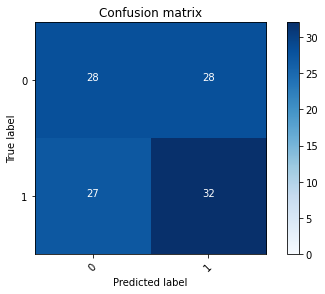

2022-08-22 18:26:20 - [Epoch Train: 86] loss: 0.0336, auc: 0.9999, acc: 0.9938, time: 21.00 s            
2022-08-22 18:26:20 - [Epoch Valid: 86] loss: 2.2782, auc: 0.4927, acc: 0.5360, time: 5.00 s


 86%|████████████████████████████████████      | 86/100 [44:20<06:18, 27.06s/it]

2022-08-22 18:26:20 - EPOCH: 87
2022-08-22 18:26:21 - Train Step 10/481, train_loss: 0.0196
2022-08-22 18:26:21 - Train Step 20/481, train_loss: 0.0250
2022-08-22 18:26:22 - Train Step 30/481, train_loss: 0.0195
2022-08-22 18:26:22 - Train Step 40/481, train_loss: 0.0181
2022-08-22 18:26:23 - Train Step 50/481, train_loss: 0.0266
2022-08-22 18:26:23 - Train Step 60/481, train_loss: 0.0244
2022-08-22 18:26:23 - Train Step 70/481, train_loss: 0.0216
2022-08-22 18:26:24 - Train Step 80/481, train_loss: 0.0194
2022-08-22 18:26:24 - Train Step 90/481, train_loss: 0.0177
2022-08-22 18:26:25 - Train Step 100/481, train_loss: 0.0172
2022-08-22 18:26:25 - Train Step 110/481, train_loss: 0.0159
2022-08-22 18:26:26 - Train Step 120/481, train_loss: 0.0158
2022-08-22 18:26:26 - Train Step 130/481, train_loss: 0.0165
2022-08-22 18:26:26 - Train Step 140/481, train_loss: 0.0169
2022-08-22 18:26:27 - Train Step 150/481, train_loss: 0.0172
2022-08-22 18:26:27 - Train Step 160/481, train_loss: 0.0175
2

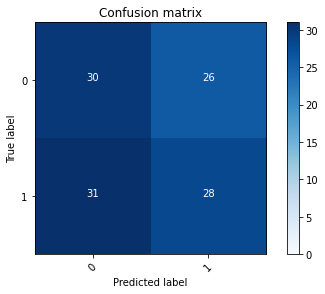

2022-08-22 18:26:47 - [Epoch Train: 87] loss: 0.0330, auc: 1.0000, acc: 0.9979, time: 21.00 s            
2022-08-22 18:26:47 - [Epoch Valid: 87] loss: 2.2974, auc: 0.4973, acc: 0.5200, time: 5.00 s


 87%|████████████████████████████████████▌     | 87/100 [44:47<05:52, 27.08s/it]

2022-08-22 18:26:47 - EPOCH: 88
2022-08-22 18:26:48 - Train Step 10/481, train_loss: 0.0258
2022-08-22 18:26:48 - Train Step 20/481, train_loss: 0.0262
2022-08-22 18:26:49 - Train Step 30/481, train_loss: 0.0255
2022-08-22 18:26:49 - Train Step 40/481, train_loss: 0.0243
2022-08-22 18:26:50 - Train Step 50/481, train_loss: 0.0203
2022-08-22 18:26:50 - Train Step 60/481, train_loss: 0.0207
2022-08-22 18:26:51 - Train Step 70/481, train_loss: 0.0316
2022-08-22 18:26:51 - Train Step 80/481, train_loss: 0.0282
2022-08-22 18:26:51 - Train Step 90/481, train_loss: 0.0268
2022-08-22 18:26:52 - Train Step 100/481, train_loss: 0.0253
2022-08-22 18:26:52 - Train Step 110/481, train_loss: 0.0238
2022-08-22 18:26:53 - Train Step 120/481, train_loss: 0.0249
2022-08-22 18:26:53 - Train Step 130/481, train_loss: 0.0276
2022-08-22 18:26:54 - Train Step 140/481, train_loss: 0.0304
2022-08-22 18:26:54 - Train Step 150/481, train_loss: 0.0309
2022-08-22 18:26:54 - Train Step 160/481, train_loss: 0.0301
2

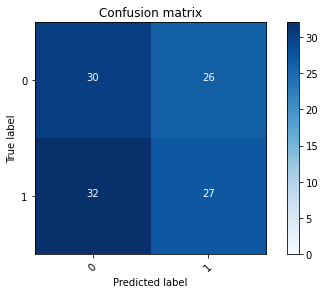

2022-08-22 18:27:14 - [Epoch Train: 88] loss: 0.0265, auc: 0.9999, acc: 0.9958, time: 21.00 s            
2022-08-22 18:27:14 - [Epoch Valid: 88] loss: 2.5914, auc: 0.4961, acc: 0.5120, time: 5.00 s


 88%|████████████████████████████████████▉     | 88/100 [45:14<05:24, 27.01s/it]

2022-08-22 18:27:14 - EPOCH: 89
2022-08-22 18:27:15 - Train Step 10/481, train_loss: 0.0009
2022-08-22 18:27:15 - Train Step 20/481, train_loss: 0.0033
2022-08-22 18:27:16 - Train Step 30/481, train_loss: 0.0140
2022-08-22 18:27:16 - Train Step 40/481, train_loss: 0.0142
2022-08-22 18:27:17 - Train Step 50/481, train_loss: 0.0148
2022-08-22 18:27:17 - Train Step 60/481, train_loss: 0.0136
2022-08-22 18:27:17 - Train Step 70/481, train_loss: 0.0143
2022-08-22 18:27:18 - Train Step 80/481, train_loss: 0.0168
2022-08-22 18:27:18 - Train Step 90/481, train_loss: 0.0192
2022-08-22 18:27:19 - Train Step 100/481, train_loss: 0.0241
2022-08-22 18:27:19 - Train Step 110/481, train_loss: 0.0230
2022-08-22 18:27:20 - Train Step 120/481, train_loss: 0.0217
2022-08-22 18:27:20 - Train Step 130/481, train_loss: 0.0205
2022-08-22 18:27:20 - Train Step 140/481, train_loss: 0.0194
2022-08-22 18:27:21 - Train Step 150/481, train_loss: 0.0191
2022-08-22 18:27:21 - Train Step 160/481, train_loss: 0.0196
2

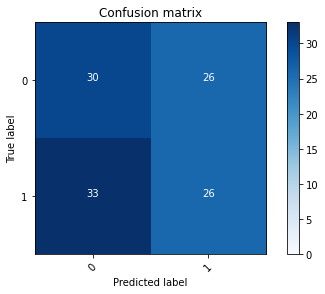

2022-08-22 18:27:41 - [Epoch Train: 89] loss: 0.0235, auc: 1.0000, acc: 0.9979, time: 21.00 s            
2022-08-22 18:27:41 - [Epoch Valid: 89] loss: 2.5517, auc: 0.4946, acc: 0.5040, time: 5.00 s


 89%|█████████████████████████████████████▍    | 89/100 [45:41<04:57, 27.00s/it]

2022-08-22 18:27:41 - EPOCH: 90
2022-08-22 18:27:42 - Train Step 10/481, train_loss: 0.0835
2022-08-22 18:27:42 - Train Step 20/481, train_loss: 0.0433
2022-08-22 18:27:43 - Train Step 30/481, train_loss: 0.0313
2022-08-22 18:27:43 - Train Step 40/481, train_loss: 0.0249
2022-08-22 18:27:44 - Train Step 50/481, train_loss: 0.0235
2022-08-22 18:27:44 - Train Step 60/481, train_loss: 0.0212
2022-08-22 18:27:44 - Train Step 70/481, train_loss: 0.0182
2022-08-22 18:27:45 - Train Step 80/481, train_loss: 0.0202
2022-08-22 18:27:45 - Train Step 90/481, train_loss: 0.0210
2022-08-22 18:27:46 - Train Step 100/481, train_loss: 0.0254
2022-08-22 18:27:46 - Train Step 110/481, train_loss: 0.0320
2022-08-22 18:27:47 - Train Step 120/481, train_loss: 0.0322
2022-08-22 18:27:47 - Train Step 130/481, train_loss: 0.0299
2022-08-22 18:27:47 - Train Step 140/481, train_loss: 0.0295
2022-08-22 18:27:48 - Train Step 150/481, train_loss: 0.0281
2022-08-22 18:27:48 - Train Step 160/481, train_loss: 0.0271
2

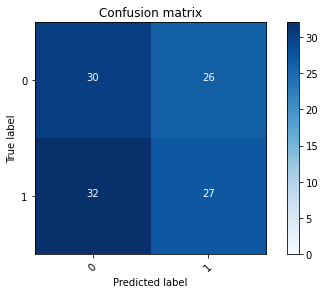

2022-08-22 18:28:08 - [Epoch Train: 90] loss: 0.0264, auc: 0.9999, acc: 0.9938, time: 20.00 s            
2022-08-22 18:28:08 - [Epoch Valid: 90] loss: 2.3680, auc: 0.5000, acc: 0.5120, time: 5.00 s


 90%|█████████████████████████████████████▊    | 90/100 [46:07<04:29, 26.92s/it]

2022-08-22 18:28:08 - EPOCH: 91
2022-08-22 18:28:09 - Train Step 10/481, train_loss: 0.0106
2022-08-22 18:28:09 - Train Step 20/481, train_loss: 0.0095
2022-08-22 18:28:09 - Train Step 30/481, train_loss: 0.0180
2022-08-22 18:28:10 - Train Step 40/481, train_loss: 0.0193
2022-08-22 18:28:10 - Train Step 50/481, train_loss: 0.0343
2022-08-22 18:28:11 - Train Step 60/481, train_loss: 0.0306
2022-08-22 18:28:11 - Train Step 70/481, train_loss: 0.0324
2022-08-22 18:28:12 - Train Step 80/481, train_loss: 0.0299
2022-08-22 18:28:12 - Train Step 90/481, train_loss: 0.0305
2022-08-22 18:28:12 - Train Step 100/481, train_loss: 0.0278
2022-08-22 18:28:13 - Train Step 110/481, train_loss: 0.0283
2022-08-22 18:28:13 - Train Step 120/481, train_loss: 0.0275
2022-08-22 18:28:14 - Train Step 130/481, train_loss: 0.0270
2022-08-22 18:28:14 - Train Step 140/481, train_loss: 0.0263
2022-08-22 18:28:15 - Train Step 150/481, train_loss: 0.0283
2022-08-22 18:28:15 - Train Step 160/481, train_loss: 0.0270
2

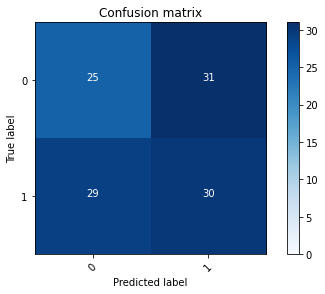

2022-08-22 18:28:35 - [Epoch Train: 91] loss: 0.0301, auc: 0.9998, acc: 0.9958, time: 21.00 s            
2022-08-22 18:28:35 - [Epoch Valid: 91] loss: 2.6921, auc: 0.4876, acc: 0.4880, time: 5.00 s


 91%|██████████████████████████████████████▏   | 91/100 [46:34<04:02, 26.90s/it]

2022-08-22 18:28:35 - EPOCH: 92
2022-08-22 18:28:35 - Train Step 10/481, train_loss: 0.0068
2022-08-22 18:28:36 - Train Step 20/481, train_loss: 0.0276
2022-08-22 18:28:36 - Train Step 30/481, train_loss: 0.0244
2022-08-22 18:28:37 - Train Step 40/481, train_loss: 0.0317
2022-08-22 18:28:37 - Train Step 50/481, train_loss: 0.0272
2022-08-22 18:28:38 - Train Step 60/481, train_loss: 0.0230
2022-08-22 18:28:38 - Train Step 70/481, train_loss: 0.0291
2022-08-22 18:28:38 - Train Step 80/481, train_loss: 0.0283
2022-08-22 18:28:39 - Train Step 90/481, train_loss: 0.0264
2022-08-22 18:28:39 - Train Step 100/481, train_loss: 0.0261
2022-08-22 18:28:40 - Train Step 110/481, train_loss: 0.0283
2022-08-22 18:28:40 - Train Step 120/481, train_loss: 0.0280
2022-08-22 18:28:41 - Train Step 130/481, train_loss: 0.0299
2022-08-22 18:28:41 - Train Step 140/481, train_loss: 0.0289
2022-08-22 18:28:41 - Train Step 150/481, train_loss: 0.0276
2022-08-22 18:28:42 - Train Step 160/481, train_loss: 0.0270
2

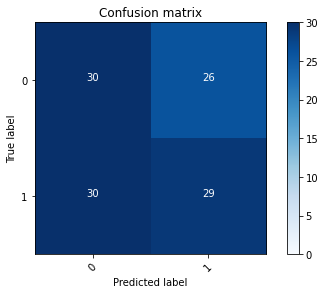

2022-08-22 18:29:02 - [Epoch Train: 92] loss: 0.0248, auc: 1.0000, acc: 0.9979, time: 21.00 s            
2022-08-22 18:29:02 - [Epoch Valid: 92] loss: 2.5498, auc: 0.4982, acc: 0.5280, time: 5.00 s


 92%|██████████████████████████████████████▋   | 92/100 [47:01<03:34, 26.86s/it]

2022-08-22 18:29:02 - EPOCH: 93
2022-08-22 18:29:02 - Train Step 10/481, train_loss: 0.0081
2022-08-22 18:29:03 - Train Step 20/481, train_loss: 0.0124
2022-08-22 18:29:03 - Train Step 30/481, train_loss: 0.0087
2022-08-22 18:29:03 - Train Step 40/481, train_loss: 0.0070
2022-08-22 18:29:04 - Train Step 50/481, train_loss: 0.0085
2022-08-22 18:29:04 - Train Step 60/481, train_loss: 0.0081
2022-08-22 18:29:05 - Train Step 70/481, train_loss: 0.0087
2022-08-22 18:29:05 - Train Step 80/481, train_loss: 0.0081
2022-08-22 18:29:06 - Train Step 90/481, train_loss: 0.0098
2022-08-22 18:29:06 - Train Step 100/481, train_loss: 0.0101
2022-08-22 18:29:06 - Train Step 110/481, train_loss: 0.0105
2022-08-22 18:29:07 - Train Step 120/481, train_loss: 0.0157
2022-08-22 18:29:07 - Train Step 130/481, train_loss: 0.0171
2022-08-22 18:29:08 - Train Step 140/481, train_loss: 0.0163
2022-08-22 18:29:08 - Train Step 150/481, train_loss: 0.0158
2022-08-22 18:29:09 - Train Step 160/481, train_loss: 0.0158
2

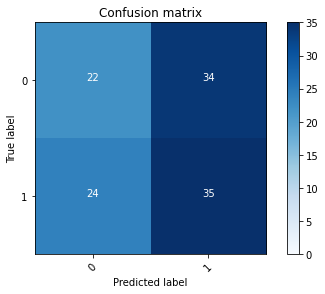

2022-08-22 18:29:28 - [Epoch Train: 93] loss: 0.0253, auc: 0.9999, acc: 0.9938, time: 21.00 s            
2022-08-22 18:29:28 - [Epoch Valid: 93] loss: 2.8673, auc: 0.4917, acc: 0.4960, time: 5.00 s


 93%|███████████████████████████████████████   | 93/100 [47:28<03:07, 26.82s/it]

2022-08-22 18:29:28 - EPOCH: 94
2022-08-22 18:29:29 - Train Step 10/481, train_loss: 0.1471
2022-08-22 18:29:29 - Train Step 20/481, train_loss: 0.0802
2022-08-22 18:29:30 - Train Step 30/481, train_loss: 0.0628
2022-08-22 18:29:30 - Train Step 40/481, train_loss: 0.0504
2022-08-22 18:29:31 - Train Step 50/481, train_loss: 0.0416
2022-08-22 18:29:31 - Train Step 60/481, train_loss: 0.0377
2022-08-22 18:29:31 - Train Step 70/481, train_loss: 0.0326
2022-08-22 18:29:32 - Train Step 80/481, train_loss: 0.0391
2022-08-22 18:29:32 - Train Step 90/481, train_loss: 0.0350
2022-08-22 18:29:33 - Train Step 100/481, train_loss: 0.0329
2022-08-22 18:29:33 - Train Step 110/481, train_loss: 0.0305
2022-08-22 18:29:34 - Train Step 120/481, train_loss: 0.0295
2022-08-22 18:29:34 - Train Step 130/481, train_loss: 0.0280
2022-08-22 18:29:34 - Train Step 140/481, train_loss: 0.0268
2022-08-22 18:29:35 - Train Step 150/481, train_loss: 0.0256
2022-08-22 18:29:35 - Train Step 160/481, train_loss: 0.0242
2

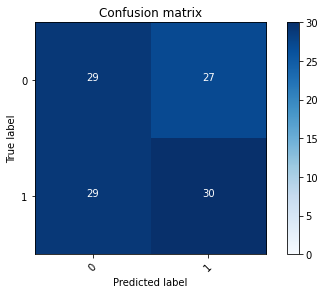

2022-08-22 18:29:55 - [Epoch Train: 94] loss: 0.0210, auc: 1.0000, acc: 0.9958, time: 21.00 s            
2022-08-22 18:29:55 - [Epoch Valid: 94] loss: 2.7237, auc: 0.4964, acc: 0.5280, time: 5.00 s


 94%|███████████████████████████████████████▍  | 94/100 [47:55<02:41, 26.90s/it]

2022-08-22 18:29:55 - EPOCH: 95
2022-08-22 18:29:56 - Train Step 10/481, train_loss: 0.0021
2022-08-22 18:29:56 - Train Step 20/481, train_loss: 0.0695
2022-08-22 18:29:57 - Train Step 30/481, train_loss: 0.0497
2022-08-22 18:29:57 - Train Step 40/481, train_loss: 0.0398
2022-08-22 18:29:58 - Train Step 50/481, train_loss: 0.0415
2022-08-22 18:29:58 - Train Step 60/481, train_loss: 0.0375
2022-08-22 18:29:59 - Train Step 70/481, train_loss: 0.0409
2022-08-22 18:29:59 - Train Step 80/481, train_loss: 0.0360
2022-08-22 18:29:59 - Train Step 90/481, train_loss: 0.0329
2022-08-22 18:30:00 - Train Step 100/481, train_loss: 0.0298
2022-08-22 18:30:00 - Train Step 110/481, train_loss: 0.0276
2022-08-22 18:30:01 - Train Step 120/481, train_loss: 0.0266
2022-08-22 18:30:01 - Train Step 130/481, train_loss: 0.0249
2022-08-22 18:30:02 - Train Step 140/481, train_loss: 0.0236
2022-08-22 18:30:02 - Train Step 150/481, train_loss: 0.0241
2022-08-22 18:30:02 - Train Step 160/481, train_loss: 0.0229
2

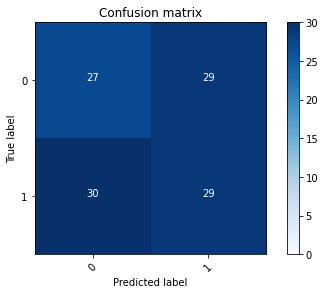

2022-08-22 18:30:22 - [Epoch Train: 95] loss: 0.0236, auc: 0.9999, acc: 0.9958, time: 21.00 s            
2022-08-22 18:30:22 - [Epoch Valid: 95] loss: 2.6823, auc: 0.4915, acc: 0.5040, time: 5.00 s


 95%|███████████████████████████████████████▉  | 95/100 [48:22<02:14, 26.85s/it]

2022-08-22 18:30:22 - EPOCH: 96
2022-08-22 18:30:23 - Train Step 10/481, train_loss: 0.0021
2022-08-22 18:30:23 - Train Step 20/481, train_loss: 0.0212
2022-08-22 18:30:24 - Train Step 30/481, train_loss: 0.0426
2022-08-22 18:30:24 - Train Step 40/481, train_loss: 0.0337
2022-08-22 18:30:24 - Train Step 50/481, train_loss: 0.0306
2022-08-22 18:30:25 - Train Step 60/481, train_loss: 0.0287
2022-08-22 18:30:25 - Train Step 70/481, train_loss: 0.0264
2022-08-22 18:30:26 - Train Step 80/481, train_loss: 0.0246
2022-08-22 18:30:26 - Train Step 90/481, train_loss: 0.0255
2022-08-22 18:30:27 - Train Step 100/481, train_loss: 0.0232
2022-08-22 18:30:27 - Train Step 110/481, train_loss: 0.0211
2022-08-22 18:30:27 - Train Step 120/481, train_loss: 0.0209
2022-08-22 18:30:28 - Train Step 130/481, train_loss: 0.0196
2022-08-22 18:30:28 - Train Step 140/481, train_loss: 0.0186
2022-08-22 18:30:29 - Train Step 150/481, train_loss: 0.0183
2022-08-22 18:30:29 - Train Step 160/481, train_loss: 0.0208
2

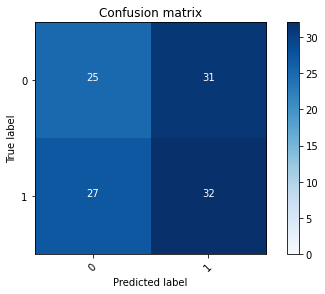

2022-08-22 18:30:49 - [Epoch Train: 96] loss: 0.0203, auc: 1.0000, acc: 0.9979, time: 21.00 s            
2022-08-22 18:30:49 - [Epoch Valid: 96] loss: 2.6474, auc: 0.4897, acc: 0.5040, time: 5.00 s


 96%|████████████████████████████████████████▎ | 96/100 [48:49<01:47, 26.90s/it]

2022-08-22 18:30:49 - EPOCH: 97
2022-08-22 18:30:50 - Train Step 10/481, train_loss: 0.0068
2022-08-22 18:30:50 - Train Step 20/481, train_loss: 0.0167
2022-08-22 18:30:51 - Train Step 30/481, train_loss: 0.0128
2022-08-22 18:30:51 - Train Step 40/481, train_loss: 0.0112
2022-08-22 18:30:51 - Train Step 50/481, train_loss: 0.0169
2022-08-22 18:30:52 - Train Step 60/481, train_loss: 0.0230
2022-08-22 18:30:52 - Train Step 70/481, train_loss: 0.0206
2022-08-22 18:30:53 - Train Step 80/481, train_loss: 0.0201
2022-08-22 18:30:53 - Train Step 90/481, train_loss: 0.0190
2022-08-22 18:30:54 - Train Step 100/481, train_loss: 0.0196
2022-08-22 18:30:54 - Train Step 110/481, train_loss: 0.0201
2022-08-22 18:30:54 - Train Step 120/481, train_loss: 0.0193
2022-08-22 18:30:55 - Train Step 130/481, train_loss: 0.0193
2022-08-22 18:30:55 - Train Step 140/481, train_loss: 0.0239
2022-08-22 18:30:56 - Train Step 150/481, train_loss: 0.0227
2022-08-22 18:30:56 - Train Step 160/481, train_loss: 0.0214
2

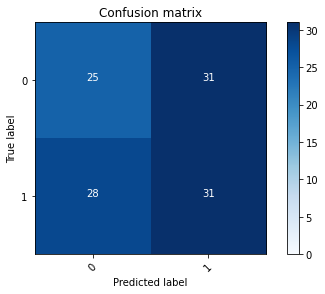

2022-08-22 18:31:16 - [Epoch Train: 97] loss: 0.0195, auc: 1.0000, acc: 0.9979, time: 21.00 s            
2022-08-22 18:31:16 - [Epoch Valid: 97] loss: 3.0172, auc: 0.4929, acc: 0.4960, time: 5.00 s


 97%|████████████████████████████████████████▋ | 97/100 [49:16<01:20, 26.96s/it]

2022-08-22 18:31:16 - EPOCH: 98
2022-08-22 18:31:17 - Train Step 10/481, train_loss: 0.0113
2022-08-22 18:31:17 - Train Step 20/481, train_loss: 0.0100
2022-08-22 18:31:18 - Train Step 30/481, train_loss: 0.0375
2022-08-22 18:31:18 - Train Step 40/481, train_loss: 0.0292
2022-08-22 18:31:19 - Train Step 50/481, train_loss: 0.0244
2022-08-22 18:31:19 - Train Step 60/481, train_loss: 0.0224
2022-08-22 18:31:19 - Train Step 70/481, train_loss: 0.0195
2022-08-22 18:31:20 - Train Step 80/481, train_loss: 0.0180
2022-08-22 18:31:20 - Train Step 90/481, train_loss: 0.0161
2022-08-22 18:31:21 - Train Step 100/481, train_loss: 0.0209
2022-08-22 18:31:21 - Train Step 110/481, train_loss: 0.0195
2022-08-22 18:31:22 - Train Step 120/481, train_loss: 0.0185
2022-08-22 18:31:22 - Train Step 130/481, train_loss: 0.0235
2022-08-22 18:31:22 - Train Step 140/481, train_loss: 0.0222
2022-08-22 18:31:23 - Train Step 150/481, train_loss: 0.0209
2022-08-22 18:31:23 - Train Step 160/481, train_loss: 0.0207
2

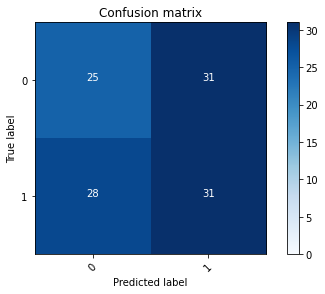

2022-08-22 18:31:43 - [Epoch Train: 98] loss: 0.0217, auc: 0.9998, acc: 0.9958, time: 20.00 s            
2022-08-22 18:31:43 - [Epoch Valid: 98] loss: 2.8395, auc: 0.4932, acc: 0.4960, time: 5.00 s


 98%|█████████████████████████████████████████▏| 98/100 [49:42<00:53, 26.89s/it]

2022-08-22 18:31:43 - EPOCH: 99
2022-08-22 18:31:44 - Train Step 10/481, train_loss: 0.0690
2022-08-22 18:31:44 - Train Step 20/481, train_loss: 0.0393
2022-08-22 18:31:44 - Train Step 30/481, train_loss: 0.0552
2022-08-22 18:31:45 - Train Step 40/481, train_loss: 0.0416
2022-08-22 18:31:45 - Train Step 50/481, train_loss: 0.0420
2022-08-22 18:31:46 - Train Step 60/481, train_loss: 0.0356
2022-08-22 18:31:46 - Train Step 70/481, train_loss: 0.0339
2022-08-22 18:31:47 - Train Step 80/481, train_loss: 0.0315
2022-08-22 18:31:47 - Train Step 90/481, train_loss: 0.0416
2022-08-22 18:31:47 - Train Step 100/481, train_loss: 0.0406
2022-08-22 18:31:48 - Train Step 110/481, train_loss: 0.0380
2022-08-22 18:31:48 - Train Step 120/481, train_loss: 0.0355
2022-08-22 18:31:49 - Train Step 130/481, train_loss: 0.0352
2022-08-22 18:31:49 - Train Step 140/481, train_loss: 0.0342
2022-08-22 18:31:50 - Train Step 150/481, train_loss: 0.0322
2022-08-22 18:31:50 - Train Step 160/481, train_loss: 0.0313
2

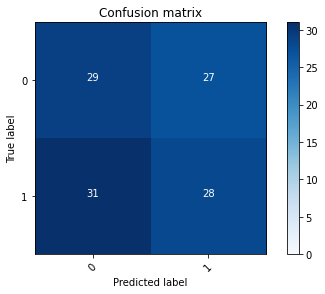

2022-08-22 18:32:10 - [Epoch Train: 99] loss: 0.0237, auc: 0.9999, acc: 0.9938, time: 21.00 s            
2022-08-22 18:32:10 - [Epoch Valid: 99] loss: 2.9445, auc: 0.4955, acc: 0.5120, time: 5.00 s


 99%|█████████████████████████████████████████▌| 99/100 [50:09<00:26, 26.89s/it]

2022-08-22 18:32:10 - EPOCH: 100
2022-08-22 18:32:10 - Train Step 10/481, train_loss: 0.0188
2022-08-22 18:32:11 - Train Step 20/481, train_loss: 0.0137
2022-08-22 18:32:11 - Train Step 30/481, train_loss: 0.0142
2022-08-22 18:32:12 - Train Step 40/481, train_loss: 0.0297
2022-08-22 18:32:12 - Train Step 50/481, train_loss: 0.0292
2022-08-22 18:32:13 - Train Step 60/481, train_loss: 0.0247
2022-08-22 18:32:13 - Train Step 70/481, train_loss: 0.0218
2022-08-22 18:32:13 - Train Step 80/481, train_loss: 0.0202
2022-08-22 18:32:14 - Train Step 90/481, train_loss: 0.0189
2022-08-22 18:32:14 - Train Step 100/481, train_loss: 0.0178
2022-08-22 18:32:15 - Train Step 110/481, train_loss: 0.0163
2022-08-22 18:32:15 - Train Step 120/481, train_loss: 0.0154
2022-08-22 18:32:16 - Train Step 130/481, train_loss: 0.0145
2022-08-22 18:32:16 - Train Step 140/481, train_loss: 0.0137
2022-08-22 18:32:16 - Train Step 150/481, train_loss: 0.0133
2022-08-22 18:32:17 - Train Step 160/481, train_loss: 0.0129


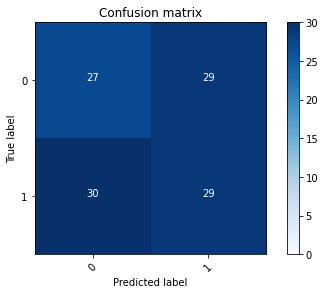

2022-08-22 18:32:37 - [Epoch Train: 100] loss: 0.0185, auc: 0.9999, acc: 0.9917, time: 21.00 s            
2022-08-22 18:32:37 - [Epoch Valid: 100] loss: 3.1343, auc: 0.4941, acc: 0.5040, time: 5.00 s


100%|█████████████████████████████████████████| 100/100 [50:36<00:00, 30.37s/it]


In [23]:
import importlib
from utils import dataset_utils
importlib.reload(dataset_utils)

for i in range(5):
    print(f"-- FOLD N:{i}")
    to = "m"#info["train_origin"]
    print(f"Train origin: {to}")
    packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, m_path=dir_path)#, n_path=new_dir_path) #m_path=dir_path, 
    print(packs)
    loader_packs = dataset_utils.get_loaders(packs, info, is_fold=True, fold_num=i)
    print(loader_packs)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logging.info("Using CUDA...")

    pd.set_option("display.max_rows", None, "display.max_columns", None)
    #print(loader_packs['KLF']['m_dataloaders'])
    selected_type = info["mri_types"][0]
    print(selected_type)
    dataloader = loader_packs[selected_type][f"{to}_dataloaders"]#m_dataloaders[0]
    # Train
    train_loader = dataloader[0]
    # Val
    val_loader = dataloader[1]

    m_model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])

    print(info)
    m_modelfile = train_mri_type(m_model, device, info, epochs=100, pat=100, 
                           train_loader=train_loader, valid_loader=val_loader)

In [24]:
import importlib
from utils import dataset_utils
importlib.reload(dataset_utils)

def infer_all_cases():
    cases = ["A", "A_B", "B", "B_A", "AB"] #["A", "A_B", "B", "B_A", "AB"]
    all_metrics = {}

    for case in cases:
        #case = "A" #A, A_B, B, B_A, AB
        if case == "A" or case == "A_B":
            """
            folders_list = [
                "fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_09-40-29",
                "fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_10-15-21",
                "fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_10-50-28",
                "fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_09-42-53",
                "fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_10-18-34"
            ]
            """
            folders_list = [
                "fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-05-43",
                "fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-59-16",
                "fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18",
                "fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_16-47-39",
                "fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_17-42-00"
            ]
        elif case == "B" or case == "B_A":
            folders_list = [
                "fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_14-13-35",
                "fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_14-45-29",
                "fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_15-18-20",
                "fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_15-51-21",
                "fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_16-23-56"
            ]
        elif case == "AB":
            folders_list = [
                "fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30",
                "fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40",
                "fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17",
                "fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07",
                "fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35"
            ]

        y_all = []
        y_pred_all = []
        y_prob_all = []

        metrics = pd.DataFrame({"model": [], "AUC": [], "acc": [], "spec": [], "sens": [], "prec": []})
        i = 0

        for folder in folders_list:
            model_common_path = "../RSNA-BTC-Datasets/out_models/"
            model_folder = model_common_path + folder

            model_basefile, info = get_best_model(model_folder)
            m_modelfile = model_folder + "/" + model_basefile
            transform = None
            size = len(info["mri_types"])
            sel_slices = 1 if info["dims"] == 2 else None
            chosen_net = "alt" if info["dims"] == 2 else "sim"

            m_model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])

            #m_modelfile = m_modelfile_3d
            print(m_modelfile)
            print(info)
            print(f"-- FOLD N:{i}")

            if case == "A":
                to = "m"#info["train_origin"]
                data_idx = 1
            elif case == "A_B":
                to = "n"
                data_idx = 2 #full
            elif case == "B":
                to = "n"
                data_idx = 1
            elif case == "B_A":
                to = "m"
                data_idx = 2 #full
            elif case == "AB":
                to = "mn"
                data_idx = 1
            print(f"Train origin: {to}")
            if to == "m":
                packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, m_path=dir_path) #m_path=dir_path, n_path=new_dir_path
            elif to == "n":
                packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, n_path=new_dir_path)
            elif to == "mn":
                packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, m_path=dir_path, n_path=new_dir_path)
            print(packs)
            loader_packs = dataset_utils.get_loaders(packs, info, is_fold=True, fold_num=i)
            print(loader_packs)

            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            logging.info("Using CUDA...")

            pd.set_option("display.max_rows", None, "display.max_columns", None)
            #print(loader_packs['KLF']['m_dataloaders'])
            selected_type = info["mri_types"][0]
            print(selected_type)
            dataloader = loader_packs[selected_type][f"{to}_dataloaders"]#m_dataloaders[0]
            val_loader = dataloader[data_idx]
            #val_loader = dataloader[2] #full

            print("\nPREDICTIONS:")
            print(folder)
            #print(f"Test set: {to} (B)")
            test_loader = val_loader
            m_test_pred, ids, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, test_loader, size)
            pd_metrics = get_metrics(y, y_pred, y_prob, f"{folder}_{case}")
            y_all = y_all + y
            y_pred_all = y_pred_all + y_pred
            y_prob_all = y_prob_all + y_prob

            preddfA = pd.DataFrame({"BraTS21ID": ids, "MGMT_real_value": y, "MGMT_pred_value": y_pred, "MGMT_prob_value": y_prob}) 
            preddfA = preddfA.sort_values(by="BraTS21ID")
            preddfA.to_csv(f"pred_metrics/{folder}_{case}.csv", index=False)
            metrics = metrics.append(pd_metrics, ignore_index=True)
            #pd_metrics.to_csv(f"pred_metrics/{folder}_{to}_A_metrics.csv", index=False)

            print("----------\n")

            i += 1

        pd_metrics = get_metrics(y_all, y_pred_all, y_prob_all, f"all_{case}")
        metrics = metrics.append(pd_metrics, ignore_index=True)
        metrics.to_csv(f"pred_metrics/all_metrics_fold_2d_{case}.csv", index=False)
        all_metrics[case] = metrics
    return all_metrics

In [18]:
all_metrics["A"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.697352,0.628319,0.653846,0.606557,0.672727
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.587036,0.582609,0.301887,0.822581,0.579545
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.624691,0.596491,0.481481,0.700000,0.600000
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.823845,0.732759,0.745455,0.721311,0.758621
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.811441,0.808696,0.660714,0.949153,0.746667
5,all_A,0.733456,0.670157,0.570370,0.759076,0.664740


In [19]:
all_metrics["A_B"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.481721,0.512027,0.623529,0.355372,0.401869
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.487895,0.470790,0.470588,0.471074,0.387755
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.490374,0.463918,0.294118,0.702479,0.414634
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.472047,0.453608,0.347059,0.603306,0.396739
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.505129,0.450172,0.105882,0.933884,0.426415
5,all_A_B,0.491332,0.470103,0.368235,0.613223,0.408590


In [20]:
all_metrics["B"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.567778,0.524590,0.583333,0.440000,0.423077
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.634921,0.612903,0.657143,0.555556,0.555556
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.503119,0.523810,0.594595,0.423077,0.423077
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.538378,0.580645,0.756757,0.320000,0.470588
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.541111,0.540984,0.555556,0.520000,0.448276
5,all_B,0.555680,0.556634,0.629834,0.453125,0.464000


In [21]:
all_metrics["B_A"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.542947,0.544503,0.307407,0.755776,0.550481
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.495862,0.481675,0.703704,0.283828,0.518072
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.528365,0.541012,0.300000,0.755776,0.547847
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.495337,0.499127,0.581481,0.425743,0.533058
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.486621,0.472949,0.614815,0.346535,0.502392
5,all_B_A,0.500655,0.507853,0.501481,0.513531,0.536182


In [22]:
all_metrics["AB"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.524115,0.568966,0.556818,0.581395,0.561798
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.535240,0.519774,0.170455,0.865169,0.513333
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.540123,0.531073,0.472527,0.593023,0.515152
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.548407,0.522472,0.630435,0.406977,0.507246
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.570523,0.545455,0.565217,0.523810,0.523810
5,all_AB,0.551713,0.537415,0.481153,0.596288,0.523422


../RSNA-BTC-Datasets/out_models/fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-05-43/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e10-loss0.733-acc0.545-auc0.506.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:0
Train origin: m
Type: KLF
2022-08-24 10:09:13 - (M0) Train/Val datasets size: 270
2022-08-24 10:09:13 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd43272e0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fac15096040>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': 

../RSNA-BTC-Datasets/out_models/fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-59-16/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e50-loss0.995-acc0.587-auc0.523.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:1
Train origin: m
Type: KLF
2022-08-24 10:11:42 - (M0) Train/Val datasets size: 270
2022-08-24 10:11:42 - (M1) Train/Val datasets size: 303


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabf770c4f0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabf76a06d0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 16

../RSNA-BTC-Datasets/out_models/fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_15-53-18/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e10-loss0.694-acc0.595-auc0.530.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:2
Train origin: m
Type: KLF
2022-08-24 10:14:10 - (M0) Train/Val datasets size: 270
2022-08-24 10:14:10 - (M1) Train/Val datasets size: 303


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb0986460>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd4642880>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166,

2022-08-24 10:16:38 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabf01bc310>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabf01bc790>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 253, 254, 255, 259, 260, 261, 262, 263, 264, 265, 266, 267, 269, 270, 271, 

2022-08-24 10:19:06 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb07821c0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb0782100>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 254, 255, 256, 257, 258, 261, 263, 266, 267, 268, 269, 270, 271, 272, 273, 

2022-08-24 10:21:35 - (N1) Train/Val datasets size: 121
{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabf7d19730>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabf7d19760>, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 340
Length of concatenated dataset: 340


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)
/tmp/ipykernel_3603835/1072525201.py:128: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 45, 46, 47, 49, 50, 52, 53, 55, 57, 58, 60, 61, 62, 63, 64, 65, 67, 69, 70, 71, 72, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 94, 95, 96, 98, 100, 101, 102, 103, 104, 105, 106, 107, 108, 110, 111, 112, 113, 114, 115, 117, 119, 121, 122, 124, 125, 126, 127, 129, 130, 131, 132, 133, 134, 135, 136, 139, 140, 141, 142, 143, 144, 145, 146, 147, 149, 150, 153, 154, 155, 156, 157, 158, 159, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 177, 178, 179, 180, 181, 182, 183, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 201, 202, 203, 204, 205, 206, 207, 209, 211, 212, 213, 214, 215, 216, 218, 219, 220, 222, 223, 224, 225, 226, 227, 228, 229, 231, 233, 234, 235, 236, 237, 240, 241, 242, 243, 245, 246, 247, 249, 250, 251, 252, 253, 254, 256, 257, 260, 261, 262, 263, 264, 266, 267, 268, 269, 271,

Prediction AUC: 0.5006
Prediction Accuracy: 0.4261
Prediction Specificity: 0.0294
Prediction Sensitivity: 0.9835
Prediction Precision: 0.4190
----------

../RSNA-BTC-Datasets/out_models/fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_14-59-16/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e50-loss0.995-acc0.587-auc0.523.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:1
Train origin: n
Type: KLF
2022-08-24 10:23:34 - (N0) Train/Val datasets size: 170
2022-08-24 10:23:34 - (N1) Train/Val datasets size: 121
{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.data

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 5, 6, 7, 8, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 31, 32, 33, 35, 36, 38, 39, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 66, 68, 69, 70, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 89, 90, 91, 92, 93, 94, 95, 96, 97, 99, 100, 101, 102, 104, 105, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 141, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 154, 155, 156, 158, 159, 160, 161, 163, 164, 165, 166, 167, 169, 171, 172, 173, 174, 175, 176, 178, 180, 181, 182, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 207, 208, 210, 211, 212, 213, 214, 216, 217, 218, 220, 221, 222, 223, 224, 225, 226, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 246, 247, 248, 250, 254, 255, 256, 257, 258, 259, 260, 262, 263, 264, 265, 2

2022-08-24 10:25:43 - (N1) Train/Val datasets size: 121
{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb040bbb0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb040bd00>, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 340
Length of concatenated dataset: 340


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 81, 82, 85, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 102, 103, 104, 105, 106, 109, 110, 112, 113, 116, 117, 118, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 145, 148, 149, 151, 152, 153, 155, 156, 157, 159, 160, 161, 162, 163, 164, 166, 167, 168, 169, 170, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 184, 185, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 212, 213, 214, 215, 216, 217, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 239, 243, 244, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 263

2022-08-24 10:27:45 - (N1) Train/Val datasets size: 121


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd47793d0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd4779310>, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 340
Length of concatenated dataset: 340
[([0, 1, 2, 3, 4, 5, 6, 9, 11, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 64, 65, 66, 67, 68, 71, 72, 73, 74, 75, 77, 78, 79, 80, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 94, 97, 98, 99, 100, 101, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 123, 125, 126, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 157, 158, 159,

----------

../RSNA-BTC-Datasets/out_models/fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug22_17-42-00/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e31-loss0.927-acc0.544-auc0.490.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:4
Train origin: n
Type: KLF
2022-08-24 10:29:51 - (N0) Train/Val datasets size: 170
2022-08-24 10:29:51 - (N1) Train/Val datasets size: 121


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabf02f0610>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabf02f0070>, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 340
Length of concatenated dataset: 340
[([0, 3, 4, 5, 6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 76, 77, 79, 80, 81, 83, 84, 85, 86, 87, 88, 91, 92, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 106, 107, 108, 109, 111, 112, 114, 115, 116, 118, 119, 120, 121, 122, 123, 124, 126, 127, 128, 129, 130, 131, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 146, 147, 148, 150, 151, 152, 153, 154, 155, 156, 157, 158, 16

Predictions: 193 without tumor, 98 with tumor
Prediction AUC: 0.5184
Prediction Accuracy: 0.5292
Prediction Specificity: 0.6647
Prediction Sensitivity: 0.3388
Prediction Precision: 0.4184
----------

Prediction AUC: 0.5151
Prediction Accuracy: 0.5258
Prediction Specificity: 0.5941
Prediction Sensitivity: 0.4298
Prediction Precision: 0.4298
../RSNA-BTC-Datasets/out_models/fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_14-13-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n-e54-loss0.771-acc0.549-auc0.568.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'n', 'val_origin': 'n', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:0
Train origin: n
Type: KLF
2022-08-24 10:32:00 - (N0) Train/Val datasets size: 170
2022-08-24 1

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)
/tmp/ipykernel_3603835/1072525201.py:128: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 21, 22, 23, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 45, 46, 47, 49, 50, 52, 53, 55, 57, 58, 60, 61, 62, 63, 64, 65, 67, 69, 70, 71, 72, 75, 76, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 94, 95, 96, 98, 100, 101, 102, 103, 104, 105, 106, 107, 108, 110, 111, 112, 113, 114, 115, 117, 119, 121, 122, 124, 125, 126, 127, 129, 130, 131, 132, 133, 134, 135, 136, 139, 140, 141, 142, 143, 144, 145, 146, 147, 149, 150, 153, 154, 155, 156, 157, 158, 159, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 177, 178, 179, 180, 181, 182, 183, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 201, 202, 203, 204, 205, 206, 207, 209, 211, 212, 213, 214, 215, 216, 218, 219, 220, 222, 223, 224, 225, 226, 227, 228, 229, 231, 233, 234, 235, 236, 237, 240, 241, 242, 243, 245, 246, 247, 249, 250, 251, 252, 253, 254, 256, 257, 260, 261, 262, 263, 264, 266, 267, 268, 269, 271,

2022-08-24 10:33:26 - (N1) Train/Val datasets size: 121
{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb1039130>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb10390d0>, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 340
Length of concatenated dataset: 340


/usr/local/miniconda3.8/envs/gbm_mgmt/lib/python3.9/site-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 5, 6, 7, 8, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 31, 32, 33, 35, 36, 38, 39, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 66, 68, 69, 70, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 89, 90, 91, 92, 93, 94, 95, 96, 97, 99, 100, 101, 102, 104, 105, 107, 108, 109, 110, 111, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 141, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 154, 155, 156, 158, 159, 160, 161, 163, 164, 165, 166, 167, 169, 171, 172, 173, 174, 175, 176, 178, 180, 181, 182, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 207, 208, 210, 211, 212, 213, 214, 216, 217, 218, 220, 221, 222, 223, 224, 225, 226, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 246, 247, 248, 250, 254, 255, 256, 257, 258, 259, 260, 262, 263, 264, 265, 2

2022-08-24 10:34:53 - (N1) Train/Val datasets size: 121
{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd47c4bb0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd47c4b50>, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 340
Length of concatenated dataset: 340


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 81, 82, 85, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 102, 103, 104, 105, 106, 109, 110, 112, 113, 116, 117, 118, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 145, 148, 149, 151, 152, 153, 155, 156, 157, 159, 160, 161, 162, 163, 164, 166, 167, 168, 169, 170, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 184, 185, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 212, 213, 214, 215, 216, 217, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 232, 233, 234, 235, 236, 237, 238, 239, 243, 244, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 263

2022-08-24 10:36:19 - (N1) Train/Val datasets size: 121
{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd4580310>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabac226700>, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 340
Length of concatenated dataset: 340


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 4, 5, 6, 9, 11, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 64, 65, 66, 67, 68, 71, 72, 73, 74, 75, 77, 78, 79, 80, 82, 83, 84, 86, 87, 88, 89, 90, 91, 92, 93, 94, 97, 98, 99, 100, 101, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 123, 125, 126, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 168, 170, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 202, 205, 206, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 224, 227, 228, 230, 231, 232, 235, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 251, 252, 253, 255, 257, 258, 259, 260, 261, 262, 263, 2

2022-08-24 10:37:42 - (N1) Train/Val datasets size: 121
{'KLF': {'m_dataset_0': None, 'm_dataset_1': None, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd469c310>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd469cac0>, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 340
Length of concatenated dataset: 340


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 3, 4, 5, 6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 76, 77, 79, 80, 81, 83, 84, 85, 86, 87, 88, 91, 92, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 106, 107, 108, 109, 111, 112, 114, 115, 116, 118, 119, 120, 121, 122, 123, 124, 126, 127, 128, 129, 130, 131, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 146, 147, 148, 150, 151, 152, 153, 154, 155, 156, 157, 158, 160, 162, 165, 167, 168, 169, 170, 171, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 189, 191, 192, 193, 194, 195, 196, 198, 199, 200, 203, 204, 205, 206, 207, 208, 209, 210, 211, 215, 217, 218, 219, 221, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 236, 238, 239, 240, 241, 242, 243, 244, 245, 246, 248, 249, 250, 251, 252, 253, 254, 255, 256, 258, 259, 261, 262, 264, 265, 266, 267, 268, 269,

2022-08-24 10:39:09 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabf013e790>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabf013e6a0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)
/tmp/ipykernel_3603835/1072525201.py:128: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 6, 7, 9, 10, 11, 13, 14, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 117, 118, 120, 121, 122, 123, 125, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 145, 146, 148, 149, 150, 152, 153, 154, 155, 157, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 178, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 200, 201, 202, 203, 204, 205, 208, 209, 211, 213, 215, 216, 217, 218, 219, 220, 221, 222, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 238, 240, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 267, 

Predictions: 157 without tumor, 416 with tumor
Prediction AUC: 0.5429
Prediction Accuracy: 0.5445
Prediction Specificity: 0.3074
Prediction Sensitivity: 0.7558
Prediction Precision: 0.5505
----------

../RSNA-BTC-Datasets/out_models/fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_14-45-29/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n-e83-loss1.492-acc0.627-auc0.635.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'n', 'val_origin': 'n', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:1
Train origin: m
Type: KLF
2022-08-24 10:43:03 - (M0) Train/Val datasets size: 270
2022-08-24 10:43:03 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb0fcae80>, 'm_dataset_1': <u

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 249, 250, 251, 253, 256, 257, 258, 259, 260, 261, 262, 264, 265, 266, 268,

Predictions: 407 without tumor, 166 with tumor
Prediction AUC: 0.4959
Prediction Accuracy: 0.4817
Prediction Specificity: 0.7037
Prediction Sensitivity: 0.2838
Prediction Precision: 0.5181
----------

../RSNA-BTC-Datasets/out_models/fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_15-18-20/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n-e44-loss0.867-acc0.620-auc0.503.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'n', 'val_origin': 'n', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:2
Train origin: m
Type: KLF
2022-08-24 10:47:00 - (M0) Train/Val datasets size: 270
2022-08-24 10:47:00 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb0859610>, 'm_dataset_1': <u

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 255, 256, 257, 258, 259, 260, 262, 263, 264, 265, 266, 267, 268, 269, 270, 2

----------

../RSNA-BTC-Datasets/out_models/fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_15-51-21/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n-e46-loss0.833-acc0.592-auc0.538.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'n', 'val_origin': 'n', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:3
Train origin: m
Type: KLF
2022-08-24 10:50:58 - (M0) Train/Val datasets size: 270
2022-08-24 10:50:58 - (M1) Train/Val datasets size: 303


/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd44097c0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd4409760>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': None, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164

Predictions: 331 without tumor, 242 with tumor
Prediction AUC: 0.4953
Prediction Accuracy: 0.4991
Prediction Specificity: 0.5815
Prediction Sensitivity: 0.4257
Prediction Precision: 0.5331
----------

../RSNA-BTC-Datasets/out_models/fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_16-23-56/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n-e88-loss1.529-acc0.589-auc0.541.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'n', 'val_origin': 'n', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:4
Train origin: m
Type: KLF
2022-08-24 10:55:01 - (M0) Train/Val datasets size: 270
2022-08-24 10:55:01 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb0c050a0>, 'm_dataset_1': <u

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 254, 255, 256, 257, 258, 261, 263, 266, 267, 268, 269, 270, 271, 272, 273, 

Predictions: 364 without tumor, 209 with tumor
Prediction AUC: 0.4866
Prediction Accuracy: 0.4729
Prediction Specificity: 0.6148
Prediction Sensitivity: 0.3465
Prediction Precision: 0.5024
----------

Prediction AUC: 0.5007
Prediction Accuracy: 0.5079
Prediction Specificity: 0.5015
Prediction Sensitivity: 0.5135
Prediction Precision: 0.5362
../RSNA-BTC-Datasets/out_models/fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e67-loss2.984-acc0.574-auc0.524.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:0
Train origin: mn
Type: KLF
2022-08-24 10:59:00 - (M0) Train/Val datasets size: 270
2022-0

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)
/tmp/ipykernel_3603835/1072525201.py:128: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 6, 7, 9, 10, 11, 13, 14, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 117, 118, 120, 121, 122, 123, 125, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 145, 146, 148, 149, 150, 152, 153, 154, 155, 157, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 178, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 200, 201, 202, 203, 204, 205, 208, 209, 211, 213, 215, 216, 217, 218, 219, 220, 221, 222, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 238, 240, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 267, 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 6, 7, 9, 10, 11, 13, 14, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 117, 118, 120, 121, 122, 123, 125, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 145, 146, 148, 149, 150, 152, 153, 154, 155, 157, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 178, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 200, 201, 202, 203, 204, 205, 208, 209, 211, 213, 215, 216, 217, 218, 219, 220, 221, 222, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 238, 240, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0ebaa60>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb058fe20>, <torch.utils.data.dataloader.DataLoader object at 0x7fabd4485b20>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e250>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e2b0>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e130>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0653a00>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e760>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e9a0>]}}
2022-08-24 11:10:32 - Using CUDA...
KLF

PREDICTIONS:
fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30
2022-08-24 11:10:32 - Predict: ../RSNA-BTC-Datasets/out_models/fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e67-loss2.984-acc0.574-auc0.5

Prob:
[array([0.00742426], dtype=float32), array([0.9430711], dtype=float32), array([0.8131124], dtype=float32), array([0.70385486], dtype=float32), array([0.9952619], dtype=float32), array([0.006882], dtype=float32), array([0.93909323], dtype=float32), array([0.00439422], dtype=float32), array([0.99322623], dtype=float32), array([0.7707471], dtype=float32), array([0.9656047], dtype=float32), array([0.78477544], dtype=float32), array([0.999985], dtype=float32), array([4.129903e-13], dtype=float32), array([0.02550448], dtype=float32), array([9.37923e-06], dtype=float32), array([0.9999569], dtype=float32), array([0.9868688], dtype=float32), array([0.2393117], dtype=float32), array([0.99948186], dtype=float32), array([0.0051295], dtype=float32), array([0.00110468], dtype=float32), array([5.011518e-05], dtype=float32), array([0.96664476], dtype=float32), array([0.99692196], dtype=float32), array([0.99982697], dtype=float32), array([0.6882971], dtype=float32), array([1.8624463e-05], dtype=f

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 249, 250, 251, 253, 256, 257, 258, 259, 260, 261, 262, 264, 265, 266, 268,

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0eac400>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0eac610>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0eaa040>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabd411b0a0>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0c52790>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0bf1490>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0a22d90>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0653d60>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0653e80>]}}
2022-08-24 11:21:11 - Using CUDA...
KLF

PREDICTIONS:
fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40
2022-08-24 11:21:11 - Predict: ../RSNA-BTC-Datasets/out_models/fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.708-acc0.521-auc0.53

2022-08-24 11:21:41 - (M1) Train/Val datasets size: 303
2022-08-24 11:21:41 - (N0) Train/Val datasets size: 170
2022-08-24 11:21:41 - (N1) Train/Val datasets size: 121
2022-08-24 11:21:41 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-24 11:21:41 - (MN0) Train/Val datasets size: 540
2022-08-24 11:21:41 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-24 11:21:41 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb065a4f0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb065a4c0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb05636d0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb0563700>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd4563a90>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb0684280>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Typ

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 255, 256, 257, 258, 259, 260, 262, 263, 264, 265, 266, 267, 268, 269, 270, 2

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 25

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb055ec70>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0b504c0>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb040bd00>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0b4ac10>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0a3ef40>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e5e0>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0d43910>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0f6c490>, <torch.utils.data.dataloader.DataLoader object at 0x7fabd4516610>]}}
2022-08-24 11:31:53 - Using CUDA...
KLF

PREDICTIONS:
fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17
2022-08-24 11:31:53 - Predict: ../RSNA-BTC-Datasets/out_models/fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e68-loss2.548-acc0.591-auc0.5

2022-08-24 11:32:21 - (M1) Train/Val datasets size: 303
2022-08-24 11:32:21 - (N0) Train/Val datasets size: 170
2022-08-24 11:32:21 - (N1) Train/Val datasets size: 121
2022-08-24 11:32:21 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-24 11:32:21 - (MN0) Train/Val datasets size: 540
2022-08-24 11:32:21 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-24 11:32:21 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb126eb50>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb126ec10>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb126ebe0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb126efd0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb126edc0>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabb1282280>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Typ

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 253, 254, 255, 259, 260, 261, 262, 263, 264, 265, 266, 267, 269, 270, 271, 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e2b0>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb1199310>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0d20970>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb1282370>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb12822e0>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0f0dd00>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb12f3a00>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb12f3b80>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb126eeb0>]}}
2022-08-24 11:42:32 - Using CUDA...
KLF

PREDICTIONS:
fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07
2022-08-24 11:42:32 - Predict: ../RSNA-BTC-Datasets/out_models/fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e10-loss0.710-acc0.545-auc0.5

2022-08-24 11:43:01 - (M1) Train/Val datasets size: 303
2022-08-24 11:43:01 - (N0) Train/Val datasets size: 170
2022-08-24 11:43:01 - (N1) Train/Val datasets size: 121
2022-08-24 11:43:01 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-24 11:43:01 - (MN0) Train/Val datasets size: 540
2022-08-24 11:43:01 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-24 11:43:01 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabd412edc0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd4770670>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb12dcfa0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd4660eb0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabb0a2c0a0>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7fabd43b39a0>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Typ

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 254, 255, 256, 257, 258, 261, 263, 266, 267, 268, 269, 271, 272, 273, 274, 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0a93f70>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0e3adf0>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb1171a90>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e550>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0b5e160>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0a22d90>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabb126ebe0>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb126eb50>, <torch.utils.data.dataloader.DataLoader object at 0x7fabb0e40a00>]}}
2022-08-24 11:53:11 - Using CUDA...
KLF

PREDICTIONS:
fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35
2022-08-24 11:53:11 - Predict: ../RSNA-BTC-Datasets/out_models/fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e43-loss1.153-acc0.603-auc0.5

/tmp/ipykernel_3603835/1072525201.py:120: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)
/tmp/ipykernel_3603835/1072525201.py:128: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


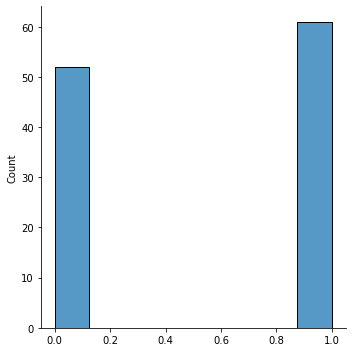

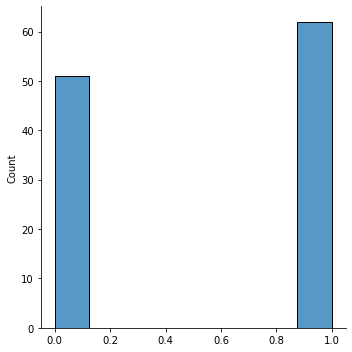

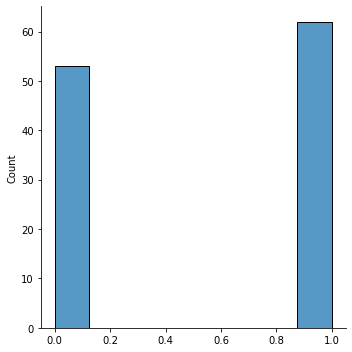

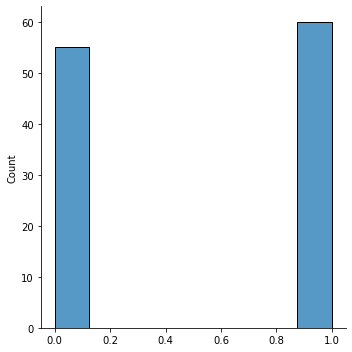

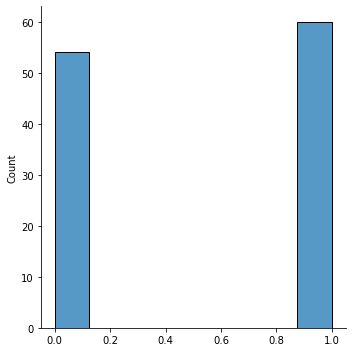

...

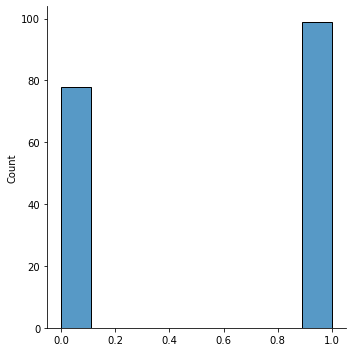

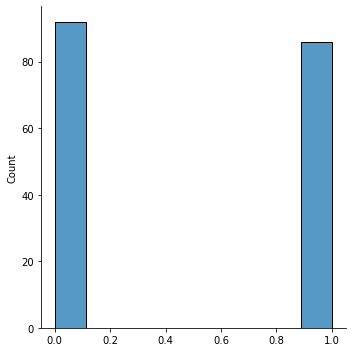

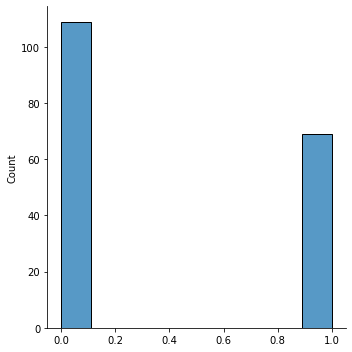

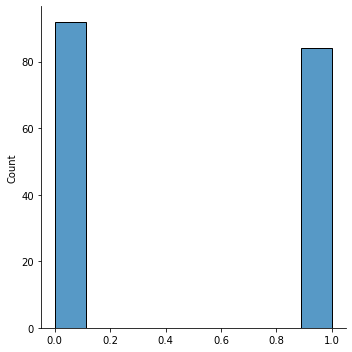

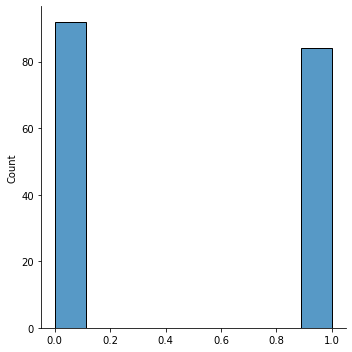

In [25]:
all_metrics_fixed = infer_all_cases()

In [26]:
all_metrics_fixed["A"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.506305,0.548673,0.500000,0.590164,0.580645
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.522824,0.582609,0.566038,0.596774,0.616667
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.529630,0.578947,0.592593,0.566667,0.607143
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.648584,0.637931,0.581818,0.688525,0.646154
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.490315,0.539130,0.482143,0.593220,0.546875
5,all_A,0.535497,0.577661,0.544444,0.607261,0.599349


In [27]:
all_metrics_fixed["A_B"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.500583,0.426117,0.029412,0.983471,0.419014
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.536558,0.549828,0.670588,0.380165,0.450980
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.531794,0.573883,0.835294,0.206612,0.471698
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.516091,0.549828,0.770588,0.239669,0.426471
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.518376,0.529210,0.664706,0.338843,0.418367
5,all_A_B,0.515144,0.525773,0.594118,0.429752,0.429752


In [28]:
all_metrics_fixed["B"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.567778,0.524590,0.583333,0.440000,0.423077
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.634921,0.612903,0.657143,0.555556,0.555556
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.503119,0.523810,0.594595,0.423077,0.423077
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.538378,0.580645,0.756757,0.320000,0.470588
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.541111,0.540984,0.555556,0.520000,0.448276
5,all_B,0.555680,0.556634,0.629834,0.453125,0.464000


In [29]:
all_metrics_fixed["B_A"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.542947,0.544503,0.307407,0.755776,0.550481
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.495862,0.481675,0.703704,0.283828,0.518072
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.528365,0.541012,0.300000,0.755776,0.547847
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.495337,0.499127,0.581481,0.425743,0.533058
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.486621,0.472949,0.614815,0.346535,0.502392
5,all_B_A,0.500655,0.507853,0.501481,0.513531,0.536182


In [30]:
all_metrics_fixed["AB"]

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.524115,0.568966,0.556818,0.581395,0.561798
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.535240,0.519774,0.170455,0.865169,0.513333
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.540123,0.531073,0.472527,0.593023,0.515152
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.548407,0.522472,0.630435,0.406977,0.507246
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.570523,0.545455,0.565217,0.523810,0.523810
5,all_AB,0.551713,0.537415,0.481153,0.596288,0.523422


../RSNA-BTC-Datasets/out_models/fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.708-acc0.521-auc0.535.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:1
Train origin: m
Type: KLF
2022-08-22 09:50:33 - (M0) Train/Val datasets size: 270
2022-08-22 09:50:33 - (M1) Train/Val datasets size: 303
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fabf7dbdc40>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fac150d5910>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': None, 'n_dataset_1': None, 'mn_dataset_0': None, 'mn_dataset_1': N

Top idx of 00327_KLF.mat: 126
Top idx of 00336_KLF.mat: 125
Top idx of 00339_KLF.mat: 116
Top idx of 00341_KLF.mat: 91
Top idx of 00343_KLF.mat: 97
Top idx of 00346_KLF.mat: 90
Top idx of 00347_KLF.mat: 95
Top idx of 00348_KLF.mat: 98
Top idx of 00349_KLF.mat: 68
Top idx of 00351_KLF.mat: 66
Top idx of 00353_KLF.mat: 124
Top idx of 00356_KLF.mat: 93
Top idx of 00373_KLF.mat: 97
Top idx of 00376_KLF.mat: 97
Top idx of 00377_KLF.mat: 97
Top idx of 00378_KLF.mat: 93
Top idx of 00379_KLF.mat: 102
Top idx of 00380_KLF.mat: 88
Top idx of 00382_KLF.mat: 98
Top idx of 00387_KLF.mat: 95
Top idx of 00388_KLF.mat: 68
Top idx of 00389_KLF.mat: 101
Top idx of 00390_KLF.mat: 94
Top idx of 00391_KLF.mat: 98
Top idx of 00392_KLF.mat: 109
Top idx of 00395_KLF.mat: 119
Top idx of 00397_KLF.mat: 80
Top idx of 00399_KLF.mat: 98
Top idx of 00401_KLF.mat: 112
Top idx of 00402_KLF.mat: 66
Top idx of 00405_KLF.mat: 123
Top idx of 00407_KLF.mat: 71
Top idx of 00410_KLF.mat: 99
Top idx of 00412_KLF.mat: 97
Top 

Top idx of 00281_KLF.mat: 79
Top idx of 00282_KLF.mat: 57
Top idx of 00284_KLF.mat: 99
Top idx of 00285_KLF.mat: 96
Top idx of 00291_KLF.mat: 93
Top idx of 00293_KLF.mat: 102
Top idx of 00294_KLF.mat: 77
Top idx of 00296_KLF.mat: 98
Top idx of 00299_KLF.mat: 96
Top idx of 00303_KLF.mat: 129
Top idx of 00304_KLF.mat: 53
Top idx of 00305_KLF.mat: 92
Top idx of 00306_KLF.mat: 95
Top idx of 00311_KLF.mat: 96
Top idx of 00313_KLF.mat: 96
Top idx of 00317_KLF.mat: 100
Top idx of 00321_KLF.mat: 98
Top idx of 00322_KLF.mat: 65
Top idx of 00328_KLF.mat: 98
Top idx of 00329_KLF.mat: 94
Top idx of 00331_KLF.mat: 90
Top idx of 00332_KLF.mat: 102
Top idx of 00334_KLF.mat: 101
Top idx of 00338_KLF.mat: 131
Top idx of 00340_KLF.mat: 91
Top idx of 00344_KLF.mat: 100
Top idx of 00350_KLF.mat: 84
Top idx of 00352_KLF.mat: 57
Top idx of 00359_KLF.mat: 62
Top idx of 00360_KLF.mat: 101
Top idx of 00364_KLF.mat: 103
Top idx of 00366_KLF.mat: 99
Top idx of 00367_KLF.mat: 99
Top idx of 00369_KLF.mat: 119
Top 

Top idx of 00218_KLF.mat: 97
Top idx of 00219_KLF.mat: 100
Top idx of 00221_KLF.mat: 93
Top idx of 00227_KLF.mat: 98
Top idx of 00228_KLF.mat: 117
Top idx of 00231_KLF.mat: 135
Top idx of 00236_KLF.mat: 97
Top idx of 00237_KLF.mat: 92
Top idx of 00238_KLF.mat: 94
Top idx of 00239_KLF.mat: 140
Top idx of 00241_KLF.mat: 96
Top idx of 00242_KLF.mat: 130
Top idx of 00243_KLF.mat: 92
Top idx of 00247_KLF.mat: 126
Top idx of 00249_KLF.mat: 128
Top idx of 00251_KLF.mat: 90
Top idx of 00258_KLF.mat: 93
Top idx of 00259_KLF.mat: 107
Top idx of 00261_KLF.mat: 137
Top idx of 00262_KLF.mat: 104
Top idx of 00266_KLF.mat: 68
Top idx of 00267_KLF.mat: 121
Top idx of 00269_KLF.mat: 107
Top idx of 00274_KLF.mat: 97
Top idx of 00275_KLF.mat: 137
Top idx of 00280_KLF.mat: 100
Top idx of 00283_KLF.mat: 96
Top idx of 00286_KLF.mat: 102
Top idx of 00288_KLF.mat: 98
Top idx of 00289_KLF.mat: 122
Top idx of 00290_KLF.mat: 137
Top idx of 00297_KLF.mat: 69
Top idx of 00298_KLF.mat: 101
Top idx of 00300_KLF.mat:

Top idx of 00117_KLF.mat: 96
Top idx of 00128_KLF.mat: 64
Top idx of 00134_KLF.mat: 99
Top idx of 00136_KLF.mat: 132
Top idx of 00138_KLF.mat: 68
Top idx of 00139_KLF.mat: 116
Top idx of 00140_KLF.mat: 92
Top idx of 00144_KLF.mat: 98
Top idx of 00146_KLF.mat: 121
Top idx of 00155_KLF.mat: 98
Top idx of 00156_KLF.mat: 105
Top idx of 00159_KLF.mat: 97
Top idx of 00160_KLF.mat: 60
Top idx of 00166_KLF.mat: 89
Top idx of 00171_KLF.mat: 96
Top idx of 00177_KLF.mat: 51
Top idx of 00178_KLF.mat: 128
Top idx of 00185_KLF.mat: 103
Top idx of 00186_KLF.mat: 98
Top idx of 00187_KLF.mat: 119
Top idx of 00188_KLF.mat: 104
Top idx of 00196_KLF.mat: 98
Top idx of 00197_KLF.mat: 98
Top idx of 00199_KLF.mat: 102
Top idx of 00203_KLF.mat: 118
Top idx of 00204_KLF.mat: 99
Top idx of 00210_KLF.mat: 95
Top idx of 00212_KLF.mat: 99
Top idx of 00220_KLF.mat: 89
Top idx of 00222_KLF.mat: 95
Top idx of 00230_KLF.mat: 112
Top idx of 00233_KLF.mat: 74
Top idx of 00234_KLF.mat: 97
Top idx of 00235_KLF.mat: 70
Top

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fabf7e26100>, <torch.utils.data.dataloader.DataLoader object at 0x7fabf769d370>, <torch.utils.data.dataloader.DataLoader object at 0x7fabf769d4c0>], 'n_dataloaders': None, 'mn_dataloaders': None}}
2022-08-22 09:51:57 - Using CUDA...
KLF

PREDICTIONS:
fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40
2022-08-22 09:51:57 - Predict: ../RSNA-BTC-Datasets/out_models/fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.708-acc0.521-auc0.535.pth 606
Top idx of 00683_KLF.mat: 134
Top idx of 00294_KLF.mat: 77
Top idx of 00724_KLF.mat: 82
Top idx of 00621_KLF.mat: 55
Top idx of 00000_KLF.mat: 101
Top idx of 00154_KLF.mat: 61
Top idx of 00576_KLF.mat: 136
Top idx of 00417_KLF.mat: 56
Top idx of 00281_KLF.mat: 79
Top idx of 00654_KLF.mat: 56
Top idx of 00136_KLF.mat: 132
Top idx of 00166_KLF.mat: 89
Top idx of 00286_KLF.mat: 102
To

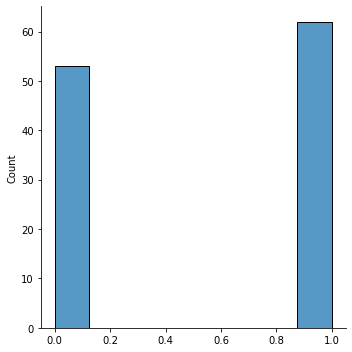

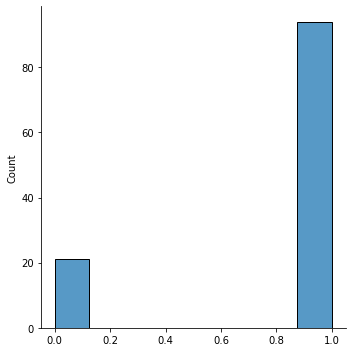

In [14]:
import importlib
from utils import dataset_utils
from utils import neural_networks
importlib.reload(dataset_utils)

folders_list = [
    #"fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30",
    "fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40",
    #"fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17",
    #"fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07",
    #"fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35"
]

y_all = []
y_pred_all = []
y_prob_all = []

i = 1

for folder in folders_list:
    model_common_path = "../RSNA-BTC-Datasets/out_models/"
    model_folder = model_common_path + folder

    model_basefile, info = neural_networks.get_best_model(model_folder)
    m_modelfile = model_folder + "/" + model_basefile
    transform = None
    size = len(info["mri_types"])
    sel_slices = 1 if info["dims"] == 2 else None
    chosen_net = "alt" if info["dims"] == 2 else "sim"
    
    m_model = neural_networks.try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])

    #m_modelfile = m_modelfile_3d
    print(m_modelfile)
    print(info)
    print(f"-- FOLD N:{i}")
    to = "m"#info["train_origin"]
    print(f"Train origin: {to}")
    packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, m_path=dir_path)#, n_path=new_dir_path) #m_path=dir_path, n_path=new_dir_path
    print(packs)
    loader_packs = dataset_utils.get_loaders(packs, info, is_fold=True, fold_num=i)#, extra="kai")
    print(loader_packs)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logging.info("Using CUDA...")

    pd.set_option("display.max_rows", None, "display.max_columns", None)
    #print(loader_packs['KLF']['m_dataloaders'])
    selected_type = info["mri_types"][0]
    print(selected_type)
    dataloader = loader_packs[selected_type][f"{to}_dataloaders"]#m_dataloaders[0]
    val_loader = dataloader[1]
    #val_loader = dataloader[2] #full
    
    print("\nPREDICTIONS:")
    print(folder)
    #print(f"Test set: {to} (B)")
    
    test_loader = val_loader
    m_test_pred, ids, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, test_loader, size)
    pd_metrics = get_metrics(y, y_pred, y_prob, f"{folder}_A")
    y_all = y_all + y
    y_pred_all = y_pred_all + y_pred
    y_prob_all = y_prob_all + y_prob
    
    preddfA = pd.DataFrame({"BraTS21ID": ids, "MGMT_real_value": y, "MGMT_pred_value": y_pred, "MGMT_prob_value": y_prob}) 
    preddfA = preddfA.sort_values(by="BraTS21ID")
    print(preddfA)
    """
    preddfA.to_csv(f"pred_metrics/{folder}_AB.csv", index=False)
    metrics = metrics.append(pd_metrics, ignore_index=True)
    #pd_metrics.to_csv(f"pred_metrics/{folder}_{to}_A_metrics.csv", index=False)
    
    print("----------\n")
    """

#pd_metrics = get_metrics(y_all, y_pred_all, y_prob_all, f"all_AB")
#metrics = metrics.append(pd_metrics, ignore_index=True)
#metrics.to_csv(f"pred_metrics/all_metrics_fold_2d_AB.csv", index=False)